In [1]:
from commons import *
from libruntimepredictionanalysis import *

In [2]:
# read in data
df = pd.read_csv("data/runtimes/runtimes_atomic.csv")
df["fittime"] /= 1000 # talk about seconds here
df["applicationtime"] /= 1000 # talk about seconds here
df["applicationtimeperunit"] = df["applicationtime"] / df["applicationsize"]
df["applicationtimeperkinstances"] = np.minimum(df["applicationtimeperunit"] * 1000, 10**8)
df["fitattributes"] = df["numattributes"]

/home/felix/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
dfDefault = df[df["algorithmoptions"].isnull()]
dfConfigured = df[df["algorithmoptions"].notnull()]

In [4]:
datasets = sorted(pd.unique(df["openmlid"]))
algorithms = pd.unique(df["algorithm"])
preprocessors = [a for a in algorithms if a not in classifiers]
algorithms = sorted(preprocessors) # reset algorithms
for a in sorted(classifiers):
    algorithms.append(a)
fitsizes = sorted(pd.unique(df["fitsize"]))

In [5]:
learners = ["linear", "ann", "forest"]

In [6]:
algorithmshortcuts = {
    'bestfirst_cfssubseteval': 'se-bf',
    'greedystepwise_cfssubseteval': "se-gs",
    'ranker_correlationattributeeval': "cr",
    'ranker_gainratioattributeeval': "gr",
    'ranker_infogainattributeeval': "ig",
    'ranker_onerattributeeval': "or",
    'ranker_principalcomponents': "pca",
    'ranker_relieffattributeeval': 're',
    'ranker_symmetricaluncertattributeeval': 'su',
    'bayesnet': 'bn',
    'decisionstump': "ds",
    'decisiontable': "dt",
    'ibk': "ibk",
    'j48': "j48",
    'jrip': "jrip",
    'kstar': "k*",
    'lmt': "lmt",
    'logistic': "lr",
    'multilayerperceptron': "ann",
    'naivebayes': "nb",
    'naivebayesmultinomial': "nbm",
    'oner': "1-r",
    'part': "part",
    'randomforest': "rf",
    'randomtree': "rt",
    'reptree': "rep",
    'simplelogistic': "sl",
    'sl': "sl2",
    'smo': "smo",
    'votedperceptron': "vp",
    'zeror': "0-r"
}

featureAliases = {
    'fitsize': "ni",
    'numattributes': "na",
    'numlabels': "nl",
    'numnumericattributes': "nn",
    'numsymbolicattributes': "ns",
    'numberofcategories': "nc",
    'numericattributesafterbinarization': "nab",
    'totalvariance': "tv",
    'attributestocover50pctvariance': "v50",
    'attributestocover90pctvariance': "v90",
    'attributestocover95pctvariance': "v95",
    'attributestocover99pctvariance': "v99"
}
learnerAliases = {
    'ann': 'ANN',
    'forest': 'RF',
    'linear': 'LR'
}

# 1. Preliminaries: Classifier Runtime Visualizations

## 1.1. Train- and Prediction/Application times against Trainpoints
Idea: Most algorithms are probably *either* fast in training *or* in predicting. That means that test times of slow-training algorithms are negligibly why prediction-times of slow-predictors can be precisely estimated by training the model an predicting k (k small) instances and interpolating exploiting linearity of total test time.

To this end, we want to know:
* what is, for each classifier, the test time per instance for different train sizes?

In [ ]:
numPredictions = 1000
legend=["Train Time", "Time for " + str(numPredictions) +" Predictions"]
for i, c in enumerate(algorithms):
    cData = df.query("algorithm == '" + c + "'")
    trainpoints = np.unique(cData["fitsize"].values)
    trainpoints = trainpoints[trainpoints >= 10]
    q1aPointsY = []
    q3aPointsY = []
    q1bPointsY = []
    q3bPointsY = []
    medianPointsY = []
    q1aPointsZ = []
    q3aPointsZ = []
    q1bPointsZ = []
    q3bPointsZ = []
    medianPointsZ = []
    validTrainPoints = []
    #pointsY = []
    for tp in trainpoints:
        rData = cData.query("fitsize == " + str(tp))
        y = numPredictions * rData["applicationtimeperunit"]
        y = y[~np.isnan(y)]
        z = rData["fittime"]
        #for i, v in enumerate(y):
        #    print(v)
        if len(y) > 4:
            validTrainPoints.append(tp)
            q1aPointsY.append(np.quantile(y, 0.05))
            q1bPointsY.append(np.quantile(y, 0.25))
            medianPointsY.append(np.median(y))
            q3aPointsY.append(np.quantile(y, 1))
            q3bPointsY.append(np.quantile(y, 0.75))
            
            q1aPointsZ.append(np.quantile(z, 0.05))
            q1bPointsZ.append(np.quantile(z, 0.25))
            medianPointsZ.append(np.median(z))
            q3aPointsZ.append(np.quantile(z, 1))
            q3bPointsZ.append(np.quantile(z, 0.75))
            #print(str(tp) + ": " + str(v))
        #meanPoints.append(np.mean(y))
        #pointsY.append(v)

    plt.figure()
    plt.title(c)# + " (train prediction RMSE quantile for 30s/1m/2m/5m/20m error: " + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 30), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 60), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 120), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 300), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 1200), 2)) + ")")
    #plt.boxplot(points, 0, '')
    if len(q1aPointsY) > 0:
        #plt.plot(validTainPoints, q1Points)
        plt.plot(validTrainPoints, medianPointsZ)
        plt.fill_between(validTrainPoints, q1aPointsZ, q3aPointsZ, color="blue",alpha=0.2)
        plt.fill_between(validTrainPoints, q1bPointsZ, q3bPointsZ, color="blue", alpha=0.2)
        plt.plot(validTrainPoints, medianPointsY)
        plt.fill_between(validTrainPoints, q1aPointsY, q3aPointsY, color="orange", alpha=0.2)
        plt.fill_between(validTrainPoints, q1bPointsY, q3bPointsY, color="orange", alpha=0.2)
        plt.axhline(10, color="red", linestyle="--", linewidth="1.2")
        plt.axhline(2, color="green", linestyle="--", linewidth="1")
        plt.axhline(300, color="green", linestyle=":", linewidth="1")
        plt.axhline(1200, color="orange", linestyle=":", linewidth="1")
        plt.axhline(3600, color="red", linestyle=":", linewidth="1")
        #plt.plot(validTainPoints, q3Points)
        #plt.xticks(trainpoints)
        #plt.scatter(trainpoints, meanPoints, color="green")
        #if len(points) > 0:
        plt.xlabel("Train Points")
        plt.ylabel("Runtime")
        plt.xscale("log")
        plt.xlim([16,100000])
        plt.ylim([0.1,10000])
        plt.yscale("log")
        plt.legend(legend)
    plt.show()
    plt.close()
        

**Conclusion**: The above figures suggest that the following classifiers have, even for large data, negligible train time (never more than 10s) and ...
* ... prediction time increasing with more train datapoints:
 * ibk
 * kstar
* ... constant prediction time:
 * nb
 * nbm
 * rt
 
The following algorithms have high train time (*all* of them have a prediction time that is independent of the used train data):
* ann (great train time predictability)
* bn (poor train time predictability)
* ds (poor train time predictability)
* dt (great train time predictability)
* j48 (great train time predictability)
* jrip (medium train time predictability)
* lmt (medium train time predictability)
* logistic (poor train time predictability)
* oner (medium train time predictability)
* part (medium train time predictability)
* rf (poor train time predictability)

## 1.2. Runtimes against (a) train size AND (b) number of numeric features

In [ ]:
overviews = {}

In [ ]:
def getRuntimePlotData(algorithm):
    attributeForAttributes = "fitattributes"
    classifierData = df.query("algorithm =='" + algorithm + "'")
    trainpoints = np.unique(classifierData["fitsize"])
    attributes = np.unique(classifierData[attributeForAttributes])
    
    #plt.figure()
    traintimes = np.empty((len(trainpoints), len(attributes)), dtype=object)
    testtimes = np.empty((len(trainpoints), len(attributes)), dtype=object)
    for i, tp in enumerate(trainpoints):
        for j, at in enumerate(attributes):
            vals = classifierData.query("fitsize == " + str(tp) + " and " + attributeForAttributes + " == " + str(at))
            if len(vals) > 0:
                traintimes[i][j] = vals["fittime"].values
                testtimes[i][j] = vals["applicationtimeperkinstances"].values
            else:
                traintimes[i][j] = float('nan')
                testtimes[i][j] = float('nan')
    return traintimes, testtimes

def tableMean(table):
    m = table.shape[0]
    n = table.shape[1]
    out = np.zeros((m, n))
    for i in range(m):
        for j in range(n):
            out[i,j] = np.median(table[i,j])
    return out

In [ ]:
for alg in tqdm(algorithms):
    overviews[alg] = getRuntimePlotData(alg)

In [ ]:
for k in overviews:
    classifierData = df.query("algorithm =='" + k + "'")
    trainpoints = np.log(np.unique(classifierData["fitsize"]))
    attributes = np.log(np.unique(classifierData["fitattributes"]))
    
    traintimes = tableMean(overviews[k][0])
    testtimes = tableMean(overviews[k][1])
    
    X, Y = np.meshgrid(attributes, trainpoints)
    #adjustLimits(projection, ax)
    fig = plt.figure()
    for i, table in enumerate([traintimes, testtimes]):
        ax = fig.add_subplot(1, 2, (i + 1), projection='3d')
        fig.set_figheight(5)
        fig.set_figwidth(15)
        logtable = (table + 1).astype('float32')
        logtable = np.log(logtable)
        ax.plot_wireframe(X, Y, logtable, rstride=3, cstride=3, linewidth=1, antialiased=True)
        ax.set_xlabel('Numeric Attributes after Binarization')
        ax.set_ylabel('Trainsize')
        ax.set_zlabel('Runtime')
        ax.set_title(k + " - " + ("Traintime" if i == 0 else "Testtime"))
    plt.show()
    plt.close()

# 2. Dispersion (Difficulty of the Learning Problem)

In [ ]:
def trimmed_std(col):
    q95 = np.nanquantile(col, 0.9)
    q05 = np.nanquantile(col, 0.1)
    #filtered = [1 if v <= 20 else v for v in col]
    #if len(filtered) == 0 or np.std(filtered) == 0:
     #   return 0.01
    filtered = [v for v in col if not np.isnan(v) and v <= q95 and v >= q05]
    std = np.std(filtered)
    relativeStd =  std / np.mean(filtered)
    
    if np.quantile(col, 0.75) < 20 and relativeStd > 0.1:
        relativeStd = 0.01
    
    #if relativeStd > .5:
     #   plt.boxplot(filtered)
      #  plt.show()
    return relativeStd

In [ ]:
vals = []
for gIndex, group in dfDefault.query("algorithm == 'decisiontable'").groupby(["fitsize", "numattributes"]):
    val = trimmed_std(group["fittime"])
    print(val)
    vals.append(val)
    #if trimmed_std(group["fittime"]) > .5:
#        group[["fittime"]].boxplot()
#        plt.show()
plt.boxplot(vals)
plt.show()
print(np.mean(vals))

In [ ]:
#plotDispersion(df.dropna(), "algorithm", ["openmlid", "fitsize", "fitattributes"], ["fittime", "applicationtime"])
#df["applicationtimeperkunits"] = df["applicationtimeperunit"] * 1000


        

def plotDispersion(df, indexAttribute, indexValues, batchAttributes, targets,  ax=None, useLegend=True):
    
    if type(targets) != list:
        targets = [targets]
    
    # First compute dispersions
    indexValues = indexValues#pd.unique(df[indexAttribute])
    stds = []
    bstdsMean = []
    bstdsQuantile = []
    for index in tqdm(indexValues):
        group = df[df[indexAttribute] == index]
        stdMap = {}
        for target in targets:
            stdMap[target] = trimmed_std(group[target])
        stds.append(stdMap)
        subGroups = group.groupby(batchAttributes)
        subStds = {}
        for target in targets:
            subStds[target] = []
        for j, subGroup in subGroups:
            for target in targets:
                subStds[target].append(trimmed_std(subGroup[target]))
        bstdMapMean = {}
        bstdMapQuantile = {}
        for target in targets:
            bstdMapMean[target] = sp.stats.trim_mean(subStds[target], 0.1)
            bstdMapQuantile[target] = np.quantile(subStds[target], 0.5) if subStds[target] else 0
        bstdsMean.append(bstdMapMean)
        bstdsQuantile.append(bstdMapQuantile)
    
    # now plot dispersions
    if ax is None:
        fig, ax = plt.subplots(1, len(targets), figsize=(10, 5 * len(targets)))
    
    for i, target in enumerate(targets):
        ind = np.arange(len(stds))
        width=0.3
        a = np.ravel(ax)[i]
        a.bar(ind, [x[target] for x in stds], width, label="Overall std")
        a.bar(ind + width, [x[target] for x in bstdsMean], width, color="red", label=".1-Mean ...")
        a.bar(ind + 2 * width, [x[target] for x in bstdsQuantile], width, color="orange", label="Q9 std within eq. classes")
        a.set_xticks(range(len(indexValues)))
        a.set_xticklabels(indexValues)
        a.set_yscale("log")
        #a.invert_yaxis()
        a.axhline(0.01, color="blue", linestyle="--", linewidth="1")
        a.axhline(0.1, color="green", linestyle="--", linewidth="1")
        if useLegend:
            a.legend()
    return ax


fig, ax = plt.subplots(2, 1, sharex=True, figsize=(5, 3))
ax = plotDispersion(dfDefault, "algorithm", algorithms, ["fitsize", "numattributes"], ["fittime", "applicationtimeperkinstances"], ax, useLegend = False)
#ax[0].set_title("Train Time")
#ax[1].set_title("Prediction Time")
for i in range(2):
    ax[i].set_ylim([0.001, 10])
    ax[i].set_yticks([0.001, 0.01, 0.1, 1])
    #ax[i].set_yticklabels(["", "$0.0.$", "$0.1$", "$1$", "$10$"])
    ax[i].set_xticks(np.arange(len(algorithms)))
xticklabels = [algorithmshortcuts[a] for a in algorithms]
#yticklabels.reverse()
ax[1].set_xticklabels(xticklabels, rotation=90)
ax[0].axvline(len(preprocessors) - 0.4, color="black", linestyle="dotted", linewidth=1)
ax[1].axvline(len(preprocessors) - 0.4, color="black", linestyle="dotted", linewidth=1)
fig.subplots_adjust(wspace=0, hspace=0)
handles, labels = ax[1].get_legend_handles_labels()
lgd = fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.49, 1.02),ncol=3)
fig.tight_layout()
fig.savefig("plots/basealg-stds.pdf", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig.show()

### Individual Sensitivity Analysis
Here, we can create a boxplot of the standard deviations per algorithm.

In [ ]:
def plotPlane(a1, a2, intersept=0, x_from = -1, x_to = 1, y_from = -1, y_to = 1, ax=None):
    if ax is None:
        fig = plt.figure()
        ax = fig.gca(projection='3d')
    
    # create meshgrid
    x = np.linspace(x_from,x_to,10)
    y = np.linspace(y_from,y_to,10)
    X,Y = np.meshgrid(x,y)
    Z=a1*X + a2*Y + intersept

    surf = ax.plot_surface(X, Y, Z, alpha=0.2)

def scatterplane(X, Y, Z, a1, a2, intersept=0, ax=None):
    if ax is None:
        fig = plt.figure()
        ax = fig.gca(projection='3d')
    
    from_x = min(X) - np.abs(min(X)) * 0.1
    to_x = max(X) + np.abs(max(X)) * 0.1
    from_y = min(Y) - np.abs(min(Y)) * 0.1
    to_y = max(Y) + np.abs(max(Y)) * 0.1
    
    # plot plane
    plotPlane(a1, a2, intersept, from_x, to_x, from_y, to_y, ax=ax)
    
    # scatter points
    ax.scatter(X, Y, Z)
    
    # connect points with plane
    for i, x in enumerate(X):
        y = Y[i]
        z = Z[i]
        plane = a1*x + a2*y + intersept
        minZ = min(plane, z)
        maxZ = max(plane, z)
        ax.plot([x,x], [y,y], [minZ,maxZ], color="C" + str(0 if z <= minZ else 1), linewidth=1)
        ax.plot([x,x], [y,y], [min(0,minZ),max(0,minZ)], color="C2", linewidth=1, linestyle="--")

In [ ]:
dfIBK = dfDefault.query("algorithm == 'ibk' and fitsize == 1000")

In [ ]:

#plt.scatter(dfIBK["fitsize"], dfIBK["applicationtimeperkinstances"])
#plt.scatter(dfIBK["numattributes"], dfIBK["applicationtimeperkinstances"])
fig, ax = plt.subplots()
ax.scatter(dfIBK["numattributes"] ** e, dfIBK["applicationtimeperkinstances"])
plt.show()

In [ ]:
X = []
Y = []
for gIndex, group in dfDefault.query("algorithm == 'ibk'").groupby(["fitsize", "numattributes"]):
    X.append(gIndex)
    Y.append(np.mean(group["applicationtimeperkinstances"]))

X = np.array(X)
#reg = RandomForestRegressor(n_estimators=1000)
reg = LinearRegression()
algo = "kstar"
for d in datasets:
    dfTrain = dfDefault.query("algorithm == '" + algo + "' and numattributes < 10000 and openmlid !=" + str(d))
    dfTest = dfDefault.query("algorithm == '" + algo + "' and fitsize > 50000 and fitattributes > 100 and openmlid ==" + str(d))
    if len(dfTest) == 0:
        continue
    XTrain = dfTrain[["fitsize", "numattributes"]].values
    YTrain = dfTrain["applicationtimeperkinstances"].values
    dropIndices = np.where((np.isnan(XTrain[:,0])) | (np.isnan(XTrain[:,1])) | (np.isnan(YTrain)))
    print(dropIndices[0])
    
    XTrain = XTrain[[i for i in range(len(XTrain)) if not i in dropIndices[0]]]#np.log(dfTest[["fitsize", "numattributes"]].values)
    YTrain = YTrain[[i for i in range(len(YTrain)) if not i in dropIndices[0]]]# dfTest["applicationtimeperkinstances"].values
    XTest = XTrain
    YTest = YTrain
    reg.fit(XTrain, YTrain)
    print(reg.coef_)
    print(len(XTrain))
    
    fig = plt.figure(figsize=(25,25))
    ax = fig.gca(projection='3d')
    scatterplane(dfTrain["fitsize"].values, dfTrain["numattributes"].values, dfTrain["applicationtimeperkinstances"].values, reg.coef_[0], reg.coef_[1], reg.intercept_, ax=ax)
    ax.set_xlabel("fitsize")
    ax.set_ylabel("numattributes")
    #Y2 = reg.predict(XTrain)
    #ax.scatter(XTrain[:,0], XTrain[:,1], Y2)
    plt.show()
    
    F = reg.predict(XTest)
    A = YTest
    err = []
    for i, a in enumerate(A):
        localError = np.abs(a - F[i])
        print(localError, a, "(" + str(np.round(100 * localError/a, 2)) + "%)")
        err.append(localError)
    
    rmse = RMSE(F, A)
    if rmse > 30:
        fig,ax  = plt.subplots(figsize=(15, 15))
        #ax = fig.add_subplot(111, projection='3d')
        
        ax.scatter(dfTrain["fitsize"], dfTrain["numattributes"])#, dfTrain["applicationtimeperkinstances"])
        ax.scatter(dfTest["fitsize"], dfTest["numattributes"])#, dfTest["applicationtimeperkinstances"])

        fig, ax = plt.subplots()
        ax.boxplot([A, F, err])
        #ax.set_yscale("log")
        ax.set_ylim([0.1, 1000])
        plt.show()
    print(d, np.mean(A), np.mean(F), np.quantile(err, 0.8), rmse)
    #sk.model_selection.cross_validate(ref, X, Y)


In [ ]:
dfIBK = dfDefault.query("algorithm == 'kstar' and numattributes > 1000 and numattributes < 20000")
attDomain = pd.unique(dfIBK["numattributes"])
attDomain.sort()
sizeDomain = pd.unique(dfIBK["fitsize"])
sizeDomain.sort()
m = len(attDomain)
n = len(sizeDomain)

A = np.zeros((m, n))
B = np.zeros((m, n))
for i, numAttributes in enumerate(attDomain):
    for j, fitsize in enumerate(sizeDomain):
        vals = dfIBK[(dfIBK["numattributes"] == numAttributes) & (dfIBK["fitsize"] == fitsize)]["applicationtimeperkinstances"]
        #vals = dfIBK[(dfIBK["numattributes"] == numAttributes) & (dfIBK["fitsize"] == fitsize)]["fittime"]
        A[i,j] = np.nanstd(vals)
        B[i,j] = np.nanmean(vals)

In [ ]:
fig = plt.figure(figsize=(25,15))
ax1 = fig.gca(projection='3d')

X, Y = np.meshgrid(attDomain, sizeDomain)
#print(X.shape, Y.shape, M.shape)
ax1.plot_wireframe(X, Y, A.T, rstride=1, cstride=1, linewidth=1, antialiased=True)
ax1.set_xlabel("Num Attributes")
ax1.set_ylabel("Num Instances")
plt.show()

fig = plt.figure(figsize=(25,15))
ax2 = fig.gca(projection='3d')

ax2.plot_surface(X, Y, B.T, rstride=1, cstride=1, linewidth=1, antialiased=True)
ax2.set_xlabel("Num Attributes")
ax2.set_ylabel("Num Instances")

In [ ]:
X = []
Y = []
for gIndex, group in dfDefault.query("algorithm == 'ibk'").groupby(["fitsize", "numattributes"]):
    X.append(gIndex)
    Y.append(np.mean(group["applicationtimeperkinstances"]))

X = np.array(X)
#reg = RandomForestRegressor(n_estimators=1000)
reg = LinearRegression()
algo = "kstar"
for d in pd.unique(df["openmlid"]):
    dfTrain = dfDefault.query("algorithm == '" + algo + "' and fitsize < 20000 and numattributes < 10000 and openmlid !=" + str(d))
    dfTest = dfDefault.query("algorithm == '" + algo + "' and fitsize > 50000 and fitattributes > 100 and openmlid ==" + str(d))
    if len(dfTest) == 0:
        continue
    
    XTrain = dfTrain[["fitsize", "numattributes"]].values
    YTrain = dfTrain["applicationtimeperkinstances"].values
    XTest = XTrain#np.log(dfTest[["fitsize", "numattributes"]].values)
    YTest = YTrain# dfTest["applicationtimeperkinstances"].values
    reg.fit(XTrain, YTrain)
    print(reg.coef_)
    print(len(XTrain))
    
    fig = plt.figure(figsize=(25,25))
    ax = fig.gca(projection='3d')
    scatterplane(dfTrain["fitsize"].values, dfTrain["numattributes"].values, dfTrain["applicationtimeperkinstances"].values, reg.coef_[0], reg.coef_[1], reg.intercept_, ax=ax)
    ax.set_xlabel("fitsize")
    ax.set_ylabel("numattributes")
    #Y2 = reg.predict(XTrain)
    #ax.scatter(XTrain[:,0], XTrain[:,1], Y2)
    plt.show()
    
    F = np.exp(reg.predict(XTest))
    A = YTest
    err = []
    for i, a in enumerate(A):
        localError = np.abs(a - F[i])
        print(localError, a, "(" + str(np.round(100 * localError/a, 2)) + "%)")
        err.append(localError)
    
    rmse = RMSE(F, A)
    if rmse > 30:
        fig,ax  = plt.subplots(figsize=(15, 15))
        #ax = fig.add_subplot(111, projection='3d')
        
        ax.scatter(dfTrain["fitsize"], dfTrain["numattributes"])#, dfTrain["applicationtimeperkinstances"])
        ax.scatter(dfTest["fitsize"], dfTest["numattributes"])#, dfTest["applicationtimeperkinstances"])

        fig, ax = plt.subplots()
        ax.boxplot([A, F, err])
        #ax.set_yscale("log")
        ax.set_ylim([0.1, 1000])
        plt.show()
    print(d, np.mean(A), np.mean(F), np.quantile(err, 0.8), rmse)
    #sk.model_selection.cross_validate(ref, X, Y)


In [ ]:
reg = RandomForestRegressor(n_estimators=100)
#reg = LinearRegression()
algo = "ibk"
relevantErrors = []
for d in pd.unique(df["openmlid"]):
    dfTrain = dfDefault.query("algorithm == '" + algo + "' and openmlid !=" + str(d))
    dfTest = dfDefault.query("algorithm == '" + algo + "' and openmlid ==" + str(d))
    if len(dfTest) == 0:
        continue
    
    e = 2
    #XTrain = np.column_stack([dfTrain[["fitsize", "numattributes"]].values, dfTrain["numattributes"].values ** e, dfTrain["fitsize"].values * dfTrain["numattributes"].values, (dfTrain["fitsize"].values * dfTrain["numattributes"].values ** e)])
    #XTrain = np.array([dfTrain["fitsize"].values * (dfTrain["numattributes"].values ** e)]).T
    XTrain = dfTrain[["fitsize", "numattributes"]].values
    print(XTrain.shape)
    YTrain = dfTrain["applicationtimeperkinstances"].values
    reg.fit(XTrain, YTrain)
    
    print(d)
    print("------------\n--------------")
    
    relevantErrorsOnThisDataset = []
    for i, scenario in dfTest.iterrows():
        XTest = scenario[["fitsize", "numattributes"]].values.T
        #XTest = np.column_stack([dfTest[["fitsize", "numattributes"]].values, dfTest["fitsize"].values * dfTest["numattributes"].values])
        #XTest = np.column_stack([dfTest[["fitsize", "numattributes"]].values, dfTest["numattributes"].values ** e, dfTest["fitsize"].values * dfTest["numattributes"].values, dfTest["fitsize"].values * dfTest["numattributes"].values**e])
        #XTest = np.array([dfTest["fitsize"].values * (dfTest["numattributes"].values ** e)]).T
        YTest = scenario["applicationtimeperkinstances"]
        
        F = reg.predict([XTest])[0]
        isRelevant = max(YTest, F) > 60 and min(YTest, F) < 1200
        if isRelevant:
            relError = (F - YTest) / YTest
            relevantErrorsOnThisDataset.append(relError)
            print(XTest, YTest, F, F - YTest, str(np.round(100 * relError, 2)) + "%")
        #err.append(localError)

        #if np.mean(A) > 100 and np.mean(A) < 300:
#            #print(dfTest)
#            print(d, np.mean(A), np.mean(F), np.mean(err), rmse, str(np.round(rmse * 100 / np.mean(A), 2)) + "%")
        #sk.model_selection.cross_validate(ref, X, Y)
    relevantErrors.append(relevantErrorsOnThisDataset)

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrors)
ax.set_ylim([0,1])
ax.axhline(0.1, color="blue", linestyle="dashed")
ax.axhline(0.2, color="green", linestyle="dashed")
ax.axhline(0.5, color="yellow", linestyle="dashed")
ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

In [ ]:
reg = RandomForestRegressor(n_estimators=100)
#reg = LinearRegression()
#reg = MLPRegressor(max_iter=1000)
algo = "part"
relevantErrorsRel = []
relevantErrorsAbs = []
for d in tqdm(pd.unique(datasets)):
    dfTrainOrig = dfDefault.query("algorithm == '" + algo + "' and openmlid !=" + str(d))
    dfTestOrig = dfDefault.query("algorithm == '" + algo + "' and openmlid ==" + str(d))
    if len(dfTestOrig) == 0:
        continue
        
    # now compute average observations
    q = None
    print("Preparing learning data")
    dfTrain = pd.DataFrame([], columns=["fitsize", "numattributes", "applicationtimeperkinstances"])
    dfTest = pd.DataFrame([], columns=["fitsize", "numattributes", "applicationtimeperkinstances"])
    for gIndex, group in dfTrainOrig.groupby(["fitsize", "numattributes"]):
        #row = [gIndex[0], gIndex[1], np.quantile(group["applicationtimeperkinstances"], q)]
        row = [gIndex[0], gIndex[1], sp.stats.trim_mean(group["applicationtimeperkinstances"], 0.1)]
        dfTrain.loc[len(dfTrain)] = row
    for gIndex, group in dfTestOrig.groupby(["fitsize", "numattributes"]):
        #row = [gIndex[0], gIndex[1], np.quantile(group["applicationtimeperkinstances"], q)]
        row = [gIndex[0], gIndex[1], sp.stats.trim_mean(group["applicationtimeperkinstances"], 0.1)]
        dfTest.loc[len(dfTest)] = row
    
    # derive some important features
    for df in [dfTrain, dfTest]:
        df["f2"] = df["fitsize"] * df["numattributes"]
        df["f3"] = df["fitsize"] * df["numattributes"]**2
        df["f4"] = df["numattributes"]**2
        df.dropna(inplace=True)
    
    e = 2
    #XTrain = np.column_stack([dfTrain[["fitsize", "numattributes"]].values, dfTrain["numattributes"].values ** e, dfTrain["fitsize"].values * dfTrain["numattributes"].values, (dfTrain["fitsize"].values * dfTrain["numattributes"].values ** e)])
    XTrain = dfTrain[["fitsize", "numattributes", "f3"]].values
    #XTrain = np.array([dfTrain["fitsize"].values * (dfTrain["numattributes"].values ** e)]).T
    #XTrain = dfTrain[["fitsize", "numattributes"]].values
    YTrain = np.log(dfTrain["applicationtimeperkinstances"].values)
    print("Fitting the Model")
    reg.fit(XTrain, YTrain)
    print("Ready, now validating on " + str(len(dfTest)) + " many instances.")
    
    relevantErrorsOnThisDatasetRel = []
    relevantErrorsOnThisDatasetAbs = []
    for i, scenario in dfTest.iterrows():
        XTest = scenario[["fitsize", "numattributes", "f3"]].values.T
        #XTest = np.column_stack([dfTest[["fitsize", "numattributes"]].values, dfTest["fitsize"].values * dfTest["numattributes"].values])
        #XTest = list(scenario[["fitsize", "numattributes"]].values) + [scenario["numattributes"] ** e, scenario["fitsize"] * scenario["numattributes"], scenario["fitsize"] * scenario["numattributes"]**e]
        #XTest = np.array([dfTest["fitsize"].values * (dfTest["numattributes"].values ** e)]).T
        YTest = scenario["applicationtimeperkinstances"]
        
        F = np.exp(reg.predict([XTest])[0])
        isRelevant = max(YTest, F) > 60 and min(YTest, F) < 3600
        absError = F - YTest
        if isRelevant:
            relError = absError / YTest
            relevantErrorsOnThisDatasetRel.append(relError)
            relevantErrorsOnThisDatasetAbs.append(absError)
            print(XTest, YTest, F, F - YTest, str(np.round(100 * relError, 2)) + "%")
        #err.append(localError)

        #if np.mean(A) > 100 and np.mean(A) < 300:
#            #print(dfTest)
#            print(d, np.mean(A), np.mean(F), np.mean(err), rmse, str(np.round(rmse * 100 / np.mean(A), 2)) + "%")
        #sk.model_selection.cross_validate(ref, X, Y)
    relevantErrorsRel.append(relevantErrorsOnThisDatasetRel)
    relevantErrorsAbs.append(relevantErrorsOnThisDatasetAbs)

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
ax.set_xticklabels(datasets, rotation=90)
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')
plt.show()

P = []
for t in range(120):
    P.append((t, len([s for s in L if np.abs(s) <= t]) / len(L)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])
plt.show()

P = []
for t in range(120):
    P.append((t, len([1 for s in relevantErrorsAbs if np.abs(np.median(s)) <= t]) / len(datasets)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

## Base features + F2

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### base features + F2 + F4

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### base features + F3

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### base features + F3 on q75 only on the big datasets

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
ax.set_xticklabels(datasets, rotation=90)
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')
plt.show()

P = []
for t in range(120):
    P.append((t, len([s for s in L if np.abs(s) <= t]) / len(L)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])
plt.show()

P = []
for t in range(120):
    P.append((t, len([1 for s in relevantErrorsAbs if np.abs(np.median(s)) <= t]) / len(datasets)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])

#### base features + F3 on q75 using the mean

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### q9

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
ax.set_xticklabels(datasets, rotation=90)
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')
plt.show()

P = []
for t in range(120):
    P.append((t, len([s for s in L if np.abs(s) <= t]) / len(L)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])
plt.show()

P = []
for t in range(120):
    P.append((t, len([1 for s in relevantErrorsAbs if np.abs(np.median(s)) <= t]) / len(datasets)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])

## 3. Identification of Suitable Features to predict runtimes

### Define the four feature set spaces

In [ ]:
# Compute core feature set space
mandAttributes = ['fitsize']
coreAttributes = ['numattributes', 'numlabels', 'numnumericattributes', 'numsymbolicattributes', 'numberofcategories', 'numericattributesafterbinarization', 'totalvariance']
varCovAttributes = ['attributestocover50pctvariance', 'attributestocover90pctvariance', 'attributestocover95pctvariance', 'attributestocover99pctvariance']

# feature sets of size 2
featureSetSpaceCore = []
for x in varCovAttributes:
    c = mandAttributes.copy()
    c.append(x)
    c = sorted(c)
    featureSetSpaceCore.append(c)
for k in range(1, 2):
    for combo in itertools.combinations(coreAttributes, k):
        c = mandAttributes.copy()
        c.extend(combo)
        c = sorted(c)
        featureSetSpaceCore.append(c)
        if k < 1:
            for y in varCovAttributes:
                c2 = c.copy()
                c2.append(y)
                c2 = sorted(c2)
                featureSetSpaceCore.append(c2)

# feature sets of size 3
featureSetSpaceThree = []
featureSetSpaceThreeBases = [["fitsize", "numattributes"], ["fitsize", "attributestocover99pctvariance"]]
for basis in featureSetSpaceThreeBases:
    for feature in coreAttributes:
        if not feature in basis:
            c = basis.copy()
            c.append(feature)
            c = sorted(c)
            if not c in featureSetSpaceThree:
                featureSetSpaceThree.append(c)
    existentVarAttributes = len([x for x in basis if "variance" in x])
    if existentVarAttributes < 1:
        for y in varCovAttributes:
            c = basis.copy()
            c.append(y)
            c = sorted(c)
            if not c in featureSetSpaceThree:
                featureSetSpaceThree.append(c)


allFeatures = []
allFeatures.extend(mandAttributes)
allFeatures.extend(coreAttributes)
allFeatures.extend(varCovAttributes)

# full feature set
fsSpace = []
fsSpace.extend([["fitsize"]])
fsSpace.extend(featureSetSpaceCore)
fsSpace.extend(featureSetSpaceThree)
fsSpace.extend([allFeatures])

# check that only lists of strings are contained
print("These are the considered feature sets:")
for fs in fsSpace:
    if type(fs) != list:
        raise Exception(str(fs) + " is not a valid feature set.")
    for f in fs:
        if type(f) != str:
            raise Exception(str(f) + " in feature set " + str(fs) + " is not a valid feature.")
    print(fs)

In [ ]:
dsSample = [datasets[int(x)] for x in np.linspace(0, len(datasets) - 1, 11)]
print(dsSample)

In [ ]:
dfDatasetsWithMetafeatures = pd.read_csv("data/metafeatures-derived.csv")[["openmlid", "name", "numinstances", "numattributes"]]
dfDatasetsWithMetafeaturesSample = dfDatasetsWithMetafeatures[dfDatasetsWithMetafeatures["openmlid"].isin(dsSample)]
fig, ax = plt.subplots(1, 1, figsize=(6, 5))
a = ax
a.scatter(dfDatasetsWithMetafeatures[["numinstances"]], dfDatasetsWithMetafeatures[["numattributes"]])
a.set_xscale("log")
a.set_yscale("log")
a.set_xlim([100, 10**7])
a.set_ylim([1, 10**5])
a.set_ylabel("Number of Attributes")
a.set_xlabel("Number of Instances")
#a = ax[1]
a.scatter(dfDatasetsWithMetafeaturesSample[["numinstances"]], dfDatasetsWithMetafeaturesSample[["numattributes"]], color="red")
#a.set_xscale("log")
#a.set_yscale("log")
#a.set_xlim([100, 10**7])
#a.set_ylim([1, 10**5])
#a.set_ylabel("Number of Attributes")
#a.set_xlabel("Number of Instances")
fig.tight_layout()
fig.savefig("plots/sampledata.pdf")
fig.show()

for ds in dfDatasetsWithMetafeaturesSample["name"].values:
    print(", {\sc " + ds + "}")

In [ ]:
pfSuffixFS = '-featureselection-10000'
pfFileFS = "data/workdata/runtimepredictions" + pfSuffixFS + ".csv"
metricFileFS = "data/workdata/runtimepredictions" + pfSuffixFS + "_withmetrics.csv"

## 3.1. Gather Data of all Regressors for Feature Set Selection

In [ ]:
trainsizes = [10000]
selectedDatasets = dsSample
selectedAlgorithms = algorithms
expansions = [()]
seeds = range(2)
sortedFSSpace = [sorted(fs) for fs in fsSpace]
numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(fsSpace) * len(seeds)

In [ ]:
dfFeatureSelection = dfDefault[(dfDefault["openmlid"].isin(selectedDatasets))]
updateGTPredictionPairSeries(dfFeatureSelection, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, sortedFSSpace, expansions, "full", pfFileFS)

## 3.2. Plot Scores for the Feature Sets

In [7]:
def RMSE(A, F):
    rmse = np.sqrt(sk.metrics.mean_squared_error(np.nan_to_num(A), np.nan_to_num(F)))
    print(A, F, rmse)
    return rmse

def RMSEOverX(A, F, x):
    indices = np.where(np.maximum(A, F) > x)[0]
    return RMSE(A[indices], F[indices]) if len(indices) > 0 else np.nan

def RMSEOverOne(A, F):
    return RMSEOverX(A, F, 1)

def RMSEOverTwo(A, F):
    return RMSEOverX(A, F, 2)

def RMSEOverTen(A, F):
    return RMSEOverX(A, F, 10)

def overMAPE(A, F):
    n = 0
    s = 0
    for i in range(len(A)):
        if A[i] <= F[i] and (F[i] > 10):
            s += (F[i] - A[i]) / np.maximum(1, A[i])
            n+=1
    return s / n if n > 0 else 0

def underMAPE(A, F):
    n = 0
    s = 0
    for i in range(len(A)):
        if A[i] >= F[i] and (A[i] > 10):
            s += (A[i] - F[i]) / np.maximum(1, A[i])
            n+=1
    return s / n if n > 0 else 0

def getAllMetrics(datasets, classifiers, data_train, data_pred, predicate):
    metrics = {}
    for measure in [RMSE, SMAPE, RDIST, overMAPE, underMAPE]:
        measureName = str(measure.__name__)
        metrics[measureName] = {}
        metrics[measureName]['train'] = getMeasureForDatasetClassifierPairs(datasets, classifiers, data_train, measure, predicate)
        metrics[measureName]['test'] = getMeasureForDatasetClassifierPairs(datasets, classifiers, data_pred, measure, predicate)
    return metrics

def createPredictionErrorFile(suffix = "", query = None):
    inFile = "data/workdata/runtimepredictions" + suffix + ".csv"
    outFile = "data/workdata/runtimepredictions" + suffix + "_withmetrics.csv"
    serializedDF = pd.read_csv(inFile)
    if not query is None:
        serializedDF = serializedDF.query(query)
    dfOut = pd.read_csv(outFile)
    attributes = ["openmlid", "algorithm", "learner", "trainpoints_algorithm", "trainpoints_learner", "basefeatures", "expansions"]
    groups = serializedDF.groupby(attributes)
    measures = [RMSE, RMSEOverOne, RMSEOverTwo, RMSEOverTen, SMAPE, overMAPE, underMAPE]
    resultCols = []
    for measure in measures:
        name = str(measure.__name__)
        resultCols.append("fittime_" + name)
        resultCols.append("predicttime_" + name)
        
    cols = attributes.copy()
    cols.extend(resultCols)
    rows = []
    i = 0
    for gIndex, group in tqdm(groups):
        print(gIndex)
        row = list(gIndex)
        matches = dfOut[np.count_nonzero((dfOut[attributes] == row).values, axis=1) == len(attributes)]
        if len(matches) == 0:

            # sub-group by seed
            subresults = {}
            for rc in resultCols:
                subresults[rc] = []
            for sgIndex, subgroup in group.groupby("seed"):

                if len(subgroup) >= 4:
                    print("seed: ", sgIndex)

                    # compute basis to create metrics
                    trainGT = np.array(str(subgroup.query("recordtype == 'traintime_gt'")["entries"].values[0]).split(";")).astype('float64')
                    trainPR = np.array(str(subgroup.query("recordtype == 'traintime_pr'")["entries"].values[0]).split(";")).astype('float64')
                    testGT = np.array(str(subgroup.query("recordtype == 'predictiontime_gt'")["entries"].values[0]).split(";")).astype('float64')
                    testPR = np.array(str(subgroup.query("recordtype == 'predictiontime_pr'")["entries"].values[0]).split(";")).astype('float64')
                    if len(trainGT) != len(trainPR):
                        raise Exception("GT and PR of traintimes have different length!")
                    if len(testGT) != len(testPR):
                        raise Exception("GT and PR of prediction times have different length!")

                    # compute metrics
                    for measure in measures:
                        measureName = str(measure.__name__)
                        print("Measure " + measureName)
                        subresults["fittime_" + measureName].append(measure(trainGT, trainPR))
                        subresults["predicttime_" + measureName].append(measure(testGT, testPR))
                        #print(measureName + ": " + str(subresults["fittime_" + measureName][-1]) + "/" + str(subresults["predicttime_" + measureName][-1]))
                        
                    #if np.abs(np.mean(testPR)-np.mean(testGT) > 30):
                    #    print(gIndex)
                    #    print(testPR)
                    #    print(testGT)

            for sr in subresults:
                row.append(np.mean(subresults[sr]))
            i += 1
        
            rows.append(row)
            if i % 1000 == 0:
                df = pd.concat([dfOut, pd.DataFrame(rows, columns = cols)])
                df.to_csv(outFile, index=False)
                i = 0
                
    if i > 0:
        df = pd.concat([dfOut, pd.DataFrame(rows, columns = cols)])
        df.to_csv(outFile, index=False)
    else:
        df = dfOut
    return df

def getMeasureForDatasetClassifierPairs(datasets, classifiers, data, measure, predicate):
    output = np.zeros((len(datasets), len(classifiers)))
    for i, d in enumerate(datasets):
        for j, c in enumerate(classifiers):
            if type(data[i][j]) == list and len(data[i][j]) > 0:
                A = np.nan_to_num(data[i][j][0][0])
                F = np.nan_to_num(data[i][j][0][1])
                
                if predicate is None:
                    indices = np.arange(len(A))
                else:
                    indices = np.where(predicate(A, F))[0] 
                output[i][j] = measure(A[indices], F[indices]) if len(indices) > 0 else np.nan
    return output

In [8]:
def getErrorCube(dfMetrics, learner, featuresets, algorithms, datasets, trainpoints, metric, WARNINGS = True):
    cube = np.zeros((len(featuresets), len(algorithms), len(datasets)))
    dfView = dfMetrics[dfMetrics["learner"] == learner]
    for i, fs in enumerate(featuresets):
        for j, a in enumerate(algorithms):
            for k, d in enumerate(datasets):
                basis = dfView[(dfView["basefeatures"] == str(fs).replace(",", ";")) & (dfView["algorithm"] == a) & (dfView["openmlid"] == d) & (dfView["trainpoints_learner"] == trainpoints) & (dfView[metric].notnull())][metric].astype(float).values
                if WARNINGS and len(basis) == 0:
                    print("Warning: No RMSE available for " + a + " on dataset " + str(d))
                cube[i,j,k] = np.mean(basis) if len(basis) > 0 else np.nan    
    return cube

def plotFeatureSetEvaluations(learners, algorithms, featuresets, datasets, trainpoints, metric, cubes, WARNINGS = False):
    #if cubes is None:
    #    dfMetrics = pd.read_csv("data/workdata/runtime_predictions_withmetrics.csv")
    #    dfMetrics = dfMetrics[dfMetrics["trainpoints_learner"] == trainpoints]

    fig1, ax1 = plt.subplots(3, len(learners), figsize=(10, 10), sharex = True, sharey = True)
    fig2, ax2 = plt.subplots(1, len(learners), figsize=(6, 7), sharey = True)
    for aIndex, learner in enumerate(learners):
        
        # get error cube for this learner
        TRIM = 0.1
        if cubes is None:
            cube = getErrorCube(dfMetrics, learner, featuresets, algorithms, datasets, trainpoints, metric, WARNINGS)
        else:
            cube = cubes[learner]
        trimmedMeans = np.array([[sp.stats.trim_mean(cube[i,j][~np.isnan(cube[i,j])], TRIM) for j,a in enumerate(algorithms)] for i,fs in enumerate(featuresets)])
        a = ax1[0][aIndex] if len(learners) > 1 else ax1[0]
        a.imshow(trimmedMeans / np.nansum(trimmedMeans, axis=0,keepdims=1), vmax=.8)
        a.set_yticks(range(len(featuresets)))
        a.set_yticklabels(featuresets)
        
        a = ax1[1][aIndex] if len(learners) > 1 else ax1[1]
        q90 = np.nanquantile(cube, 0.9, axis=2)
        q90Normalized = q90 / np.nansum(q90, axis=0,keepdims=1)
        a.imshow(q90Normalized, vmax=1)
        a.set_yticks(range(len(featuresets)))
        a.set_yticklabels(featuresets)
        a.set_xticks(range(len(algorithms) - 1))
        a.set_xticklabels(algorithms, rotation=90)
        
        a = ax1[2][aIndex] if len(learners) > 1 else ax1[2]
        ranks = np.array([sp.stats.rankdata(np.nanmean(cube[:,j,:], axis=1), method='min') for j in range(len(algorithms))])
        a.imshow(ranks.T, vmax=len(featuresets))
        a.set_yticks(range(len(featuresets)))
        a.set_yticklabels([str([featureAliases[f] for f in x]).replace("'", "").replace("]", "").replace("[", "") if len(x) < 5 else "all" for x in featuresets])
        a.set_xticks(range(len(algorithms)))
        a.set_xticklabels(algorithms, rotation=90)

        ### BAR PLOTS
        a = ax2[aIndex] if len(learners) > 1 else ax2
        ind = np.arange(len(featuresets))
        width = .25
        colors = ["C0", "C1", "C2"]
        a.barh(ind, np.nanmean(ranks, axis=0), width, color=colors[0])
        print(np.nanmin(np.nanmean(ranks, axis=0)))
        a.axvline(np.nanmin(np.nanmean(ranks, axis=0)), color=colors[0], linestyle="--", linewidth="1", label='_nolegend_')
        A = np.minimum(10000, [sp.stats.trim_mean(trimmedMeans[i][~np.isnan(trimmedMeans[i])], TRIM) for i,fs in enumerate(featuresets)])
        a.barh(ind + width, A, width, color=colors[1])
        print(np.nanmin(A))
        a.axvline(np.nanmin(A), color=colors[1], linestyle="--", linewidth="1", label='_nolegend_')
        B = np.minimum(10000, [sp.stats.trim_mean(q90[i][~np.isnan(q90[i])], TRIM) for i,fs in enumerate(featuresets)])
        a.barh(ind + 2 * width, B, width, color=colors[2])
        print(np.nanmin(B))
        a.axvline(np.nanmin(B), color=colors[2], linestyle="--", linewidth="1", label='_nolegend_')
        a.set_yticks(range(len(featuresets)))
        #for x in cFeatures:
        a.set_yticklabels([str([featureAliases[f] for f in x]).replace("'", "").replace("]", "").replace("[", "") if len(x) < 5 else "all" for x in featuresets])
        a.set_title(learnerAliases[learner])
        a.set_xlim([1, 1000])
        a.set_xscale("log")
        a.invert_yaxis()
    
    #fig2.legend(["avg rank", "trimmed mean", "q90"])
    return ax2

def getBestFeatureSet(learner, algorithm, featuresets, trainpoints, metric, cube):
    #if cube is None:
    #    dfMetrics = pd.read_csv("data/workdata/runtime_predictions_withmetrics.csv")
    #    datasets = pd.unique(dfMetrics["openmlid"])
    #    cube = getErrorCube(dfMetrics, learner, featuresets, [algorithm], datasets, trainpoints, metric, WARNINGS = False)[:,0,:]
    trimmedMeans = np.array([sp.stats.trim_mean(cube[i][~np.isnan(cube[i])], 0.2) for i,fs in enumerate(featuresets)])
    q90 = np.nanquantile(cube, 0.9, axis=1)
    q50 = np.nanquantile(cube, 0.5, axis=1)
    ranks = np.mean([sp.stats.rankdata(base) for base in [trimmedMeans, q90, q50]], axis=0)
    #for i, m in enumerate(ranks):
    #    print(str(featuresets[i]) + ": " + str(m))
    return featuresets[np.argmin(ranks)]

#### Generate the Error Cubes used to produce the bar plots

In [ ]:
pfSuffixFS

In [ ]:
createPredictionErrorFile(pfSuffixFS, "trainpoints_learner == 10000")

In [ ]:
dfMetrics = pd.read_csv(metricFileFS)
dfMetrics = dfMetrics[dfMetrics["trainpoints_learner"] == 10000]
cubes = {}
pbar = tqdm(total = 6)
for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    cubes[metric] = {}
    for learner in learners:
        cube = getErrorCube(dfMetrics, learner, fsSpace, algorithms, dsSample, 10000, metric, False)
        cubes[metric][learner] = cube
        pbar.update(1)
pbar.close()

In [ ]:
np.nanmean(cubes["predicttime_RMSE"]["forest"][0])

### How often is every feature set selected among the atomic algorithms?

In [ ]:
counts = {}
for aIndex, algo in enumerate(algorithms):
    fs = getBestFeatureSet("forest", algo, fsSpace, 10000, "fittime_RMSE", cubes["fittime_RMSE"]["forest"][:,aIndex,:])
    fss = str(fs)
    if not fss in counts:
        counts[fss] = 0
    counts[fss] += 1
for f in counts:
    print(f + ": " + str(counts[f]))

### Create eventual plots for the paper

In [ ]:
cDatasets = dsSample
cClassifiers = algorithms
for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    ax = plotFeatureSetEvaluations(learners, cClassifiers, fsSpace, cDatasets, 10000, metric, cubes[metric], WARNINGS=False)
    for i in range(3):
        ax[i].axhline(1 - 0.3, color="black", linestyle="-", linewidth="1", label='_nolegend_')
        ax[i].axhline(len(featureSetSpaceCore) + 1 - 0.3, color="black", linestyle="-", linewidth="1", label='_nolegend_')
        ax[i].axhline(len(featureSetSpaceCore) + len(featureSetSpaceThree) + 1 - 0.3, color="black", linestyle="-", linewidth="1", label='_nolegend_')
    plt.legend(["Avg Rank", "0.1-Trimmed Mean", "Q90"], bbox_to_anchor=(0.7, -0.07), ncol=3)
    plt.tight_layout()
    plt.savefig("plots/featuresetselection-all-" + metric + ".pdf", bbox_inches='tight')

# 4. Create Learning Curves for each regressor/algorithm combo
Use the feature sets that are best with respect to the samples.

### Collect Learning Curve Data For [ni + na + \theta]

In [ ]:
#trainsizes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 50000, 100000]
trainsizes = [1, 10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000]
#trainsizes = [100, 1000, 10000]
selectedDatasets = dsSample
selectedAlgorithms = algorithms
expansions = [()]
seeds = range(1)
k = 0
numCollectors = len(learners) * len(selectedAlgorithms)
pbar = tqdm(total = numCollectors)
dfSampleDefault = dfDefault[dfDefault["openmlid"].isin(selectedDatasets)]
dfSampleConfigured = dfConfigured[dfConfigured["openmlid"].isin(selectedDatasets)]
for aIndex, algo in enumerate(selectedAlgorithms):
    dfAlgo = dfSampleConfigured[dfSampleConfigured["algorithm"] == algo].copy()
    supportedDatasets = list(dfAlgo["openmlid"].drop_duplicates().values)
    
    fs = ["fitsize", "numattributes"] # we now only create data for this specific feature set
    if len(dfAlgo) == 0 or len(supportedDatasets) < 6:
        dfAlgo = dfSampleDefault[dfSampleDefault["algorithm"] == algo]
    
    else:
        if algo in preprocessors:
            parts = dfAlgo["algorithmoptions"].values[0].split(";")
            dfAlgo["searcheroptions"] = parts[0]
            dfAlgo["evaloptions"] = parts[1]
        prevCols = dfAlgo.columns
        dfAlgo = explodeAlgorithmOptions(dfAlgo)
        algoCols = [f for f in dfAlgo if not f in prevCols]
        fs.extend(algoCols)
        
    
    if len(dfAlgo) == 0:
        raise Exception("No data for " + algo + " available!")
    
    supportedDatasets = list(dfAlgo["openmlid"].drop_duplicates().values)
    print(str(len(supportedDatasets)) + " supported datasets for " + algo + ": " + str(supportedDatasets))
    
    for learner in learners:
        #fs = getBestFeatureSet(learner, algo, fsSpace, 10000, "fittime_RMSE", cubes["fittime_RMSE"][learner][:,aIndex,:])
        #fs = sorted(fs)
        #fs = ["fitsize", "numattributes"]
        print(algo + "/" + learner + ": " + str(fs))
        print(pd.unique(dfAlgo["openmlid"]))
        #numExperiments = len(selectedDatasets) * len([algo]) * len(trainsizes) * len(expansions) * len(seeds)
        updateGTPredictionPairSeries(dfAlgo, selectedDatasets, [algo], [learner], seeds, trainsizes, [fs], expansions, "full", pfFileFS)
        pbar.update(1)
pbar.close()

In [ ]:
getBestFeatureSet("linear", "bayesnet", fsSpace, 10000, "fittime_RMSE", cubes["fittime_RMSE"][learner][:,aIndex,:])

In [ ]:
errors = {}

In [ ]:
dfCheck = dfDefault[(dfDefault["openmlid"].isin(selectedDatasets))].copy()
dfCheck["applicationtimeperkunits"] = dfCheck["applicationtimeperunit"] * 1000

errors[learner] = []
#fsCheck = ['attributestocover99pctvariance', 'fitsize', 'numlabels'] # forest
fsCheck = ['fitsize', "numattributes"] #linear
for learner in ["linear", "ann", "forest"]:
    print(learner)
    for a in classifiers:
        for d in dsSample:
            try:
                results = runExperiment(dfCheck, fsCheck, d, a, learner, 1000, (), "fittime", "full")["full"]
                errors[learner].append(RMSE(results[0], results[1]) * 10)

            except Exception as ex:
                if "No runtime results" in ex.args[0] or "No test data selected" in ex.args[0]:
                    print(ex)
                    observedFail = True
                    pass
                else:
                    raise

In [ ]:
fig, ax = plt.subplots(1, 1)
ax.boxplot([errors["linear"], errors["ann"], errors["forest"]], 0, "")
ax.set_yscale("log")
ax.set_ylim([0.1, 1000])

In [ ]:
learner = "forest"
metric = "predicttime_RMSE"
algo = "decisiontable"
fsLookup = sorted(getBestFeatureSet(learner, algo, fsSpace, 10000, metric, cubes["fittime_RMSE"][learner][:,algorithms.index(algo),:]))
lookupErrors = getLearningCurveBaseData(learner, algo, dsSample, fsLookup, metric).query("trainpoints_learner == 1000")["predicttime_RMSE"].values
print(len(lookupErrors))
plt.boxplot(lookupErrors, 0, "")

In [ ]:
createPredictionErrorFile(pfSuffixFS)

In [ ]:
dfMetrics = pd.read_csv(metricFileFS)
cubes = {}
pbar = tqdm(total = 6)
for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    cubes[metric] = {}
    for learner in learners:
        cube = getErrorCube(dfMetrics, learner, fsSpace, algorithms, dsSample, 10000, metric, False)
        cubes[metric][learner] = cube
        pbar.update(1)
pbar.close()

In [ ]:
def getAlgorithmOptions(algo):
    dfAlgo = dfConfigured[dfConfigured["algorithm"] == algo]
    if len(dfAlgo) == 0:
        return []
    standardCols = dfConfigured.columns
    colsAfterExpansion = explodeAlgorithmOptions(dfAlgo.iloc[:5].copy())
    return [x for x in colsAfterExpansion.columns if not x in standardCols and x != "searcheroptions" and x != "evaloptions"]

In [ ]:
getAlgorithmOptions("bayesnet")

### Plot Learning Curves

In [ ]:
def getLearningCurveBaseData(learner, algorithm, datasets, featureset, metric):
    df = pd.read_csv("data/workdata/runtimepredictions" + pfSuffixFS + "_withmetrics.csv")
    df = df[(df["learner"] == learner) & (df["algorithm"] == algorithm) & (df["basefeatures"] == str(featureset).replace(",", ";")) & (df["trainpoints_algorithm"] == "full") & (df["openmlid"].isin(datasets))]
    return df[["trainpoints_learner", metric]]
    
def getLearningCurve(learner, algorithm, datasets, featureset, metric):
    df = getLearningCurveBaseData(learner, algorithm, datasets, featureset, metric)
    
    anchors = pd.unique(df["trainpoints_learner"])
    anchors = sorted(anchors)#[anchors > 10])
    means = []
    medians = []
    q1s = []
    q3s = []
    for anchor in anchors:
        view = df[df["trainpoints_learner"] == anchor]
        means.append(np.nanmean(view[metric].astype(float)))
        medians.append(np.nanquantile(view[metric].astype(float), 0.5))
        q1s.append(np.nanquantile(view[metric].astype(float), 0.25))
        q3s.append(np.nanquantile(view[metric].astype(float), 0.75))
    return anchors, means, medians, q1s, q3s

def plotLearningCurve(learner, algorithm, datasets, featureset, color, ax = None):
    if ax is None:
        fig, ax = plt.subplots(1,1)
    X, medians, q1s, q3s = getLearningCurve(learner, algorithm, datasets, featureset)
    ax.plot(X, medians, color=color, linestyle="--")
    ax.fill_between(X, q1s, medians, color=color, alpha=0.2)
    ax.fill_between(X, medians, q3s, color=color, alpha=0.2)
    return ax

#fig, ax = plt.subplots(len(algorithms),1, figsize=(5, 5 * len(algorithms)))
colors = ["blue", "green", "orange"]

for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    fig, ax = plt.subplots(1,1, figsize=(5, 2.5))
    for lIndex, learner in enumerate(learners):
        observations = {}
        dimY = 0
        for j, algo in enumerate(algorithms):
            # FOR STUPID TECHNICAL REASONS WE ALWAYS TAKE THE FEATURES BEST FOR FITTIME NOT PREDICTTIME!
            #featureset = sorted(getBestFeatureSet(learner, algo, fsSpace, 10000, metric, cubes["fittime_RMSE"][learner][:,j,:]))
            featureset = ["fitsize", "numattributes"]
            featureset.extend(getAlgorithmOptions(algo))
            featureset = sorted(featureset)
            print(algo + ": " + str(featureset))
            obsX, means, medians, q1s, q3s = getLearningCurve(learner, algo, dsSample, featureset, metric)
            for i, x in enumerate(obsX):
                if not x in observations:
                    print("Missing observation for anchor " + str(x) + " on " + algo)
                    observations[x] = {}
                observations[x][j] = medians[i]
            dimY += 1

        anchors = sorted(list(observations.keys()))
        M = np.zeros((len(anchors), dimY))
        for i, anchor in enumerate(anchors):
            valsAtAnchor = observations[anchor]
            for j in range(dimY):
                M[i,j] = valsAtAnchor[j] if j in valsAtAnchor else np.nan

        means = np.array([sp.stats.trim_mean(M[i,:][~np.isnan(M[i,:])], 0.1) for i in range(len(M))])
        q1s = np.nanquantile(M, 0.25, axis=1)
        medians = np.nanquantile(M, 0.5, axis=1)
        q3s = np.nanquantile(M, 0.9, axis=1)
        color = colors[lIndex]
        ax.plot(anchors, medians, color=color)
        ax.plot(anchors, means, color=color, linestyle="--", label='_nolegend_')
        ax.fill_between(anchors, q1s, medians, color=color, alpha=0.2, label='_nolegend_')
        ax.fill_between(anchors, medians, q3s, color=color, alpha=0.2, label='_nolegend_')
    
    ax.set_xlim([1, 10**5])
    ax.set_ylim([0.1, 10**3])
    ax.axhline(60, color="black", linestyle="--", linewidth="1")
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.set_ylabel("RMSE " + ("train time" if metric == "fittime_RMSE" else "pred. time/10k inst."))
    ax.set_xlabel("Number of training instances for regressor")
    ax.legend(["Linear Regression", "Neural Network", "Random Forest"])
    fig.tight_layout()
    fig.savefig("plots/learningcurves_" + metric + ".pdf")
    #ax.set_title(learner)
   # a.legend(learners)

**Conclusion**: The above experiments clearly suggest to use a random forest classifier (as single best):
* In predicting inference times, RF beats the others in all metrics at almost all points of time
* In predicting induction time, it outperforms the neural network and seems equally off with linear regression.
* One (additional) advantage over linear regression is a substantially better (trimmed) mean. While the q3 quantile seems similar, this can be interpreted by saying that linear regression is more prone to rare but extreme mistakes (the portion of those cases lying above the q3 quantile are higher for linear regression than for random forests). This observation was also made by Hutter et al. and hence advocates the more stable random forests also for the case of induction time prediction.

**Todo**: Which is the single best feature set for the random forest?

Idea: The best are fitsize + number attributes (before/after binarization) + v99.

Option 1: just say that the simplest thing is the number of attributes and there is little justification to not use it

Option 2: Optimize here

# 5. Generalization Performance for Full Knowledge Exploitation

In this step, we compute again the RMSE for induction time and inference time. Differences to above:
* we consider **only** random forests (have committed to this regressor)
* feature set is fixed to ??? (open question)
* we now include **all** datasets to assess the prediction performances

## 5.1. RMSE of RF for leave-one-out
**Note**: Make sure that we do NOT use the same eval file as in the last section. Recall that those were built only on top of some few datasets. We now need to run all experiments from scratch:
* with 10000 trainpoints
* with **all** datasets (leave-one-out)

### Run All The Experiments with RF on 10000 train points using ALL datasets and algorithms in PARAMETRIZED configuration

In [9]:
pfSuffixParametrized = "-parametrized-log-1000"
pfFileParametrized = "data/workdata/runtimepredictions" + pfSuffixParametrized + ".csv"
metricFileParametrized = "data/workdata/runtimepredictions" + pfSuffixParametrized + "_withmetrics.csv"

In [ ]:
trainsizes = [1000]
selectedDatasets = datasets
learners = ["forest"]
expansions = [()]
seeds = range(10)
        
for algo in algorithms:
    dfAlgo = dfConfigured[dfConfigured["algorithm"] == algo].copy()
    print(algo)
    selectedAlgorithms = [algo]
    if len(dfAlgo) > 0:
        dfAlgo = explodeAlgorithmOptions(dfAlgo.copy())
        fset = ["fitsize", "numattributes"]
        fset.extend(getAlgorithmOptions(algo))
        print("Fitting a parameter-aware model!")
        
    else:
        print("Assuming that " + algo + " has no parameters and conducting default parameter analysis")
        fset = ["fitsize", "numattributes"]
        numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
        dfAlgo = dfDefault[dfDefault["algorithm"] == algo].copy()
    
    fset.append("fitsizexnumattributes**2")
    dfMod = dfAlgo.copy()
    dfMod["fitsizexnumattributes**2"] = dfMod["fitsize"] * (dfMod["numattributes"] ** 2)

    numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
    updateGTPredictionPairSeries(dfMod, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, [fset], expansions, 10000, 100, pfFileParametrized)


In [11]:
createPredictionErrorFile(pfSuffixParametrized)

/home/felix/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3263: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


(3, 'bayesnet', 'forest', '10000', 1000, "['D'; 'Q_HC'; 'Q_K2'; 'Q_LAGDHC'; 'Q_SA'; 'Q_TAN'; 'Q_Tabu'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 14.2739999 247.2329999   4.2469999] [ 2.99144454 44.03858853  4.80495304] 117.49549803899944
[1.2079999  1.11933323 1.32066657] [1.08908352 1.17386416 1.23257835] 0.09105723725798372
Measure RMSEOverOne
[ 14.2739999 247.2329999   4.2469999] [ 2.99144454 44.03858853  4.80495304] 117.49549803899944
[1.2079999  1.11933323 1.32066657] [1.08908352 1.17386416 1.23257835] 0.09105723725798372
Measure RMSEOverTwo
[ 14.2739999 247.2329999   4.2469999] [ 2.99144454 44.03858853  4.80495304] 117.49549803899944
Measure RMSEOverTen
[ 14.2739999 247.2329999] [ 2.99144454 44.03858853] 143.9014677940962
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 14.2739999 247.2329999   4.2469999] [ 2.53287446 26.92219135  8.60925697] 127.40190432450403
[1.2079999  1.11933323 1.32066657] [1.12715904 1.1

[44.2369999 14.7499999 10.0719999  8.9519999 12.2409999 13.6969999
 12.3369999] [32.80029675 27.11301552  9.37477035 12.4149698  17.86300978 18.59827045
 16.94566519] 7.299607305086025
[1.16133323 1.12066657 1.0899999  1.0899999  1.07333323 1.1019999
 1.08533323] [1.17198171 1.215541   1.16784001 1.11173759 1.34142223 1.14085228
 1.15043487] 0.1154281474300781
Measure RMSEOverOne
[44.2369999 14.7499999 10.0719999  8.9519999 12.2409999 13.6969999
 12.3369999] [32.80029675 27.11301552  9.37477035 12.4149698  17.86300978 18.59827045
 16.94566519] 7.299607305086025
[1.16133323 1.12066657 1.0899999  1.0899999  1.07333323 1.1019999
 1.08533323] [1.17198171 1.215541   1.16784001 1.11173759 1.34142223 1.14085228
 1.15043487] 0.1154281474300781
Measure RMSEOverTwo
[44.2369999 14.7499999 10.0719999  8.9519999 12.2409999 13.6969999
 12.3369999] [32.80029675 27.11301552  9.37477035 12.4149698  17.86300978 18.59827045
 16.94566519] 7.299607305086025
Measure RMSEOverTen
[44.2369999 14.7499999 10.071

[1.0249999] [1.04449209] 0.019492190474262205
[10.11933323] [9.47536636] 0.6439668736609061
Measure RMSEOverOne
[1.0249999] [1.04449209] 0.019492190474262205
[10.11933323] [9.47536636] 0.6439668736609061
Measure RMSEOverTwo
[10.11933323] [9.47536636] 0.6439668736609061
Measure RMSEOverTen
[10.11933323] [9.47536636] 0.6439668736609061
Measure SMAPE
Measure overMAPE
Measure underMAPE
(3, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[26.1469999 78.5629999] [ 38.05464342 122.82736247] 32.412387816286355
[1.0639999 1.0779999] [1.09041684 1.09475072] 0.022118372392207042
Measure RMSEOverOne
[26.1469999 78.5629999] [ 38.05464342 122.82736247] 32.412387816286355
[1.0639999 1.0779999] [1.09041684 1.09475072] 0.022118372392207042
Measure RMSEOverTwo
[26.1469999 78.5629999] [ 38.05464342 122.82736247] 32.412387816286355
Measure RMSEOverTen
[26.1469999 78.5629999] [ 38.05464342 122.82736247] 32.412

[1.0319999 1.0419999 1.0349999 1.0419999 1.0369999] [1.01722039 1.01722039 1.01722039 1.01722039 1.01722039] 0.020754863418627072
[446.56956512 466.55891229 582.84210516 438.56267796 456.34323913] [259.25863511 259.25863511 259.25863511 259.25863511 259.25863511] 225.28086134543128
Measure RMSEOverTwo
[446.56956512 466.55891229 582.84210516 438.56267796 456.34323913] [259.25863511 259.25863511 259.25863511 259.25863511 259.25863511] 225.28086134543128
Measure RMSEOverTen
[446.56956512 466.55891229 582.84210516 438.56267796 456.34323913] [259.25863511 259.25863511 259.25863511 259.25863511 259.25863511] 225.28086134543128
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0319999 1.0419999 1.0349999 1.0419999 1.0369999] [1.02159139 1.02159139 1.02159139 1.02159139 1.02159139] 0.01648369921670342
[446.56956512 466.55891229 582.84210516 438.56267796 456.34323913] [287.68919754 287.68919754 287.68919754 287.68919754 287.68919754] 197.76732681278813
Measure RMSEOverOn

[1.1739999] [1.09202616] 0.08197373785285467
Measure RMSEOverTwo
[3.5159999] [9.46387101] 5.947871111851551
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.5159999] [4.36830223] 0.8523023299828467
[1.1739999] [1.10906214] 0.0649377571522145
Measure RMSEOverOne
[3.5159999] [4.36830223] 0.8523023299828467
[1.1739999] [1.10906214] 0.0649377571522145
Measure RMSEOverTwo
[3.5159999] [4.36830223] 0.8523023299828467
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.5159999] [6.13128521] 2.6152853095897286
[1.1739999] [1.11293202] 0.06106787925495705
Measure RMSEOverOne
[3.5159999] [6.13128521] 2.6152853095897286
[1.1739999] [1.11293202] 0.06106787925495705
Measure RMSEOverTwo
[3.5159999] [6.13128521] 2.6152853095897286
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.5159999] [6.64028916] 3.1242892607402175
[1.1739999] [1.10685405] 0.067145853780191
Measure RM

[2.9529999] [3.730042] 0.777042096777504
[1.08133323] [1.10572023] 0.02438699645360276
Measure RMSEOverTwo
[2.9529999] [3.730042] 0.777042096777504
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(3, 'randomforest', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[8.6749999] [9.75692697] 1.081927074988167
[1.14066657] [1.16581723] 0.02515066511605024
Measure RMSEOverOne
[8.6749999] [9.75692697] 1.081927074988167
[1.14066657] [1.16581723] 0.02515066511605024
Measure RMSEOverTwo
[8.6749999] [9.75692697] 1.081927074988167
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[8.6749999] [7.66753882] 1.0074610758345788
[1.14066657] [1.17144521] 0.030778643198333677
Measure RMSEOverOne
[8.6749999] [7.66753882] 1.0074610758345788
[1.14066657] [1.17144521] 0.030778643198333677
Measure RMSEOverTwo
[8.6749999] [7.66753882] 1.0074610758345788
Measure RMSEOverTen
Measure SMAP

[1.07133323] [1.07590951] 0.00457627860274723
Measure RMSEOverOne
[1.4319999] [1.62536783] 0.19336792597163366
[1.07133323] [1.07590951] 0.00457627860274723
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4319999] [2.37019811] 0.938198214329875
[1.07133323] [1.09004068] 0.018707451256049
Measure RMSEOverOne
[1.4319999] [2.37019811] 0.938198214329875
[1.07133323] [1.09004068] 0.018707451256049
Measure RMSEOverTwo
[1.4319999] [2.37019811] 0.938198214329875
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4319999] [1.50326892] 0.0712690200375421
[1.07133323] [1.07862489] 0.007291651768335239
Measure RMSEOverOne
[1.4319999] [1.50326892] 0.0712690200375421
[1.07133323] [1.07862489] 0.007291651768335239
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.4319999] [2.25709379] 0.8250938892920456
[1.07133323] [1.08517592] 0

Measure RMSE
[2.3919999] [3.83692106] 1.4449211611743848
[1.39533323] [2.6074883] 1.2121550645336117
Measure RMSEOverOne
[2.3919999] [3.83692106] 1.4449211611743848
[1.39533323] [2.6074883] 1.2121550645336117
Measure RMSEOverTwo
[2.3919999] [3.83692106] 1.4449211611743848
[1.39533323] [2.6074883] 1.2121550645336117
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[2.3919999] [4.90335547] 2.511355571835887
[1.39533323] [2.28035437] 0.8850211352038453
Measure RMSEOverOne
[2.3919999] [4.90335547] 2.511355571835887
[1.39533323] [2.28035437] 0.8850211352038453
Measure RMSEOverTwo
[2.3919999] [4.90335547] 2.511355571835887
[1.39533323] [2.28035437] 0.8850211352038453
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(3, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0199999] [1.03213542] 0.012135515498541194
[1.0679999] [1.1286272] 0.06062729597797478
Mea

Measure RMSE
[10.8149999 29.3389999 28.9669999  3.9839999] [14.56491238  1.89259924 33.69875144  3.4844338 ] 14.053520836568767
[1.32666657 1.27466657 1.22466657 1.42466657] [1.17356245 1.34503541 1.15224902 1.17876429] 0.15338258716828754
Measure RMSEOverOne
[10.8149999 29.3389999 28.9669999  3.9839999] [14.56491238  1.89259924 33.69875144  3.4844338 ] 14.053520836568767
[1.32666657 1.27466657 1.22466657 1.42466657] [1.17356245 1.34503541 1.15224902 1.17876429] 0.15338258716828754
Measure RMSEOverTwo
[10.8149999 29.3389999 28.9669999  3.9839999] [14.56491238  1.89259924 33.69875144  3.4844338 ] 14.053520836568767
Measure RMSEOverTen
[10.8149999 29.3389999 28.9669999] [14.56491238  1.89259924 33.69875144] 16.22504468739544
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[10.8149999 29.3389999 28.9669999  3.9839999] [37.2122801   8.00539624 80.58369903  9.69088091] 31.019313207015415
[1.32666657 1.27466657 1.22466657 1.42466657] [1.13653937 1.14772574 1.13017234 1

[49.2199999 67.1279999 26.9809999] [17.45784829 13.31142527 18.05603065] 36.444995341759125
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[49.2199999 67.1279999 26.9809999] [8.22196097 7.42202317 7.15394737] 43.3541803628151
[1.22666657 1.07533323 1.07466657] [1.07490305 1.0695804  1.09158537] 0.08822604490179325
Measure RMSEOverOne
[49.2199999 67.1279999 26.9809999] [8.22196097 7.42202317 7.15394737] 43.3541803628151
[1.22666657 1.07533323 1.07466657] [1.07490305 1.0695804  1.09158537] 0.08822604490179325
Measure RMSEOverTwo
[49.2199999 67.1279999 26.9809999] [8.22196097 7.42202317 7.15394737] 43.3541803628151
Measure RMSEOverTen
[49.2199999 67.1279999 26.9809999] [8.22196097 7.42202317 7.15394737] 43.3541803628151
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[49.2199999 67.1279999 26.9809999] [16.80537167 17.49433649 16.38841117] 34.76785681954836
[1.22666657 1.07533323 1.07466657] [1.21264872 1.0754371  1.14678434] 0.042416520277770

[1.08066657] [1.08600823] 0.005341659385686093
Measure RMSEOverOne
[3.7659999] [2.48116999] 1.2848299078378518
[1.08066657] [1.08600823] 0.005341659385686093
Measure RMSEOverTwo
[3.7659999] [2.48116999] 1.2848299078378518
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(6, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 52.8219999 145.2389999  52.7169999] [ 8.27192072 11.58160002  8.28835095] 85.28953617769221
[1.07933323 1.06866657 1.09133323] [1.10293891 1.10245079 1.13348275] 0.03403519397328548
Measure RMSEOverOne
[ 52.8219999 145.2389999  52.7169999] [ 8.27192072 11.58160002  8.28835095] 85.28953617769221
[1.07933323 1.06866657 1.09133323] [1.10293891 1.10245079 1.13348275] 0.03403519397328548
Measure RMSEOverTwo
[ 52.8219999 145.2389999  52.7169999] [ 8.27192072 11.58160002  8.28835095] 85.28953617769221
Measure RMSEOverTen
[ 52.8219999 145.2389999  52.7169999]

Measure RMSE
[1.0259999 1.0279999 1.0329999 1.0409999 1.0359999] [1.04441005 1.04441005 1.04441005 1.04441005 1.04441005] 0.012812317136096768
[525.53310686 537.45913033 569.73345578 553.23487534 542.32984283] [279.36730671 279.36730671 279.36730671 279.36730671 279.36730671] 266.71116649663463
Measure RMSEOverOne
[1.0259999 1.0279999 1.0329999 1.0409999 1.0359999] [1.04441005 1.04441005 1.04441005 1.04441005 1.04441005] 0.012812317136096768
[525.53310686 537.45913033 569.73345578 553.23487534 542.32984283] [279.36730671 279.36730671 279.36730671 279.36730671 279.36730671] 266.71116649663463
Measure RMSEOverTwo
[525.53310686 537.45913033 569.73345578 553.23487534 542.32984283] [279.36730671 279.36730671 279.36730671 279.36730671 279.36730671] 266.71116649663463
Measure RMSEOverTen
[525.53310686 537.45913033 569.73345578 553.23487534 542.32984283] [279.36730671 279.36730671 279.36730671 279.36730671 279.36730671] 266.71116649663463
Measure SMAPE
Measure overMAPE
Measure underMAPE
(6, 'l

[1.18133323] [1.17935258] 0.001980648607056601
Measure RMSEOverOne
[189.6419999] [4.09107384] 185.5509260565943
[1.18133323] [1.17935258] 0.001980648607056601
Measure RMSEOverTwo
[189.6419999] [4.09107384] 185.5509260565943
Measure RMSEOverTen
[189.6419999] [4.09107384] 185.5509260565943
Measure SMAPE
Measure overMAPE
Measure underMAPE
(6, 'multilayerperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[832.5329999] [341.31138133] 491.22161857032705
[1.17666657] [1.18100444] 0.004337873259574465
Measure RMSEOverOne
[832.5329999] [341.31138133] 491.22161857032705
[1.17666657] [1.18100444] 0.004337873259574465
Measure RMSEOverTwo
[832.5329999] [341.31138133] 491.22161857032705
Measure RMSEOverTen
[832.5329999] [341.31138133] 491.22161857032705
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[832.5329999] [499.22017375] 333.3128261510152
[1.17666657] [1.17894605] 0.0022794801656649266
Measure R

[76.2269999] [6.89632107] 69.33067883453796
[1.1199999] [1.19219706] 0.0721971604834668
Measure RMSEOverTwo
[76.2269999] [6.89632107] 69.33067883453796
Measure RMSEOverTen
[76.2269999] [6.89632107] 69.33067883453796
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[76.2269999] [11.22568638] 65.0013135166983
[1.1199999] [1.11484538] 0.0051545243278992015
Measure RMSEOverOne
[76.2269999] [11.22568638] 65.0013135166983
[1.1199999] [1.11484538] 0.0051545243278992015
Measure RMSEOverTwo
[76.2269999] [11.22568638] 65.0013135166983
Measure RMSEOverTen
[76.2269999] [11.22568638] 65.0013135166983
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[76.2269999] [4.67787151] 71.54912838866638
[1.1199999] [1.08565859] 0.034341306006128614
Measure RMSEOverOne
[76.2269999] [4.67787151] 71.54912838866638
[1.1199999] [1.08565859] 0.034341306006128614
Measure RMSEOverTwo
[76.2269999] [4.67787151] 71.54912838866638
Measure RMSEOverTen
[76.2269999] [4.67787151] 71

Measure RMSE
[51.0039999] [22.89820918] 28.105790720505425
[1.1799999] [1.15263443] 0.027365465237610742
Measure RMSEOverOne
[51.0039999] [22.89820918] 28.105790720505425
[1.1799999] [1.15263443] 0.027365465237610742
Measure RMSEOverTwo
[51.0039999] [22.89820918] 28.105790720505425
Measure RMSEOverTen
[51.0039999] [22.89820918] 28.105790720505425
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[51.0039999] [12.16138964] 38.84261025696692
[1.1799999] [1.10006704] 0.07993285824981755
Measure RMSEOverOne
[51.0039999] [12.16138964] 38.84261025696692
[1.1799999] [1.10006704] 0.07993285824981755
Measure RMSEOverTwo
[51.0039999] [12.16138964] 38.84261025696692
Measure RMSEOverTen
[51.0039999] [12.16138964] 38.84261025696692
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[51.0039999] [35.06837176] 15.935628139368106
[1.1799999] [1.07219314] 0.10780676430195779
Measure RMSEOverOne
[51.0039999] [35.06837176] 15.935628139368106
[1.1799999] [1.0721931

[1.2639999] [1.52415845] 0.26015854584069054
[1.07547531] [1.0738506] 0.0016247121063874825
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2639999] [1.40348958] 0.13948967816933378
[1.07547531] [1.08792855] 0.012453240878152805
Measure RMSEOverOne
[1.2639999] [1.40348958] 0.13948967816933378
[1.07547531] [1.08792855] 0.012453240878152805
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2639999] [1.29695568] 0.032955782044656656
[1.07547531] [1.07670392] 0.0012286066999509515
Measure RMSEOverOne
[1.2639999] [1.29695568] 0.032955782044656656
[1.07547531] [1.07670392] 0.0012286066999509515
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(12, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure

[3.37597531 3.15189319 3.37357675] [11.60356725  8.66660099 11.79900693] 7.507621572901318
Measure RMSEOverOne
[1.2889999 1.0419999 1.0509999] [1.04884223 1.05850932 1.04414471] 0.13903867893569496
[3.37597531 3.15189319 3.37357675] [11.60356725  8.66660099 11.79900693] 7.507621572901318
Measure RMSEOverTwo
[3.37597531 3.15189319 3.37357675] [11.60356725  8.66660099 11.79900693] 7.507621572901318
Measure RMSEOverTen
[3.37597531 3.37357675] [11.60356725 11.79900693] 8.32709862134097
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2889999 1.0419999 1.0509999] [1.04035059 1.08528449 1.05117153] 0.14571669251935082
[3.37597531 3.15189319 3.37357675] [ 8.85170879 12.1958202   9.16187349] 6.958942741471858
Measure RMSEOverOne
[1.2889999 1.0419999 1.0509999] [1.04035059 1.08528449 1.05117153] 0.14571669251935082
[3.37597531 3.15189319 3.37357675] [ 8.85170879 12.1958202   9.16187349] 6.958942741471858
Measure RMSEOverTwo
[3.37597531 3.15189319 3.37357675] [ 8.8517087

[1.0369999 1.0309999 1.0319999 1.0349999 1.0379999] [1.04573759 1.04573759 1.04573759 1.04573759 1.04573759] 0.011466829743866841
[584.02835529 597.27639145 624.86929451 570.91866903 585.53398048] [289.22543539 289.22543539 289.22543539 289.22543539 289.22543539] 303.8456137725555
Measure RMSEOverTwo
[584.02835529 597.27639145 624.86929451 570.91866903 585.53398048] [289.22543539 289.22543539 289.22543539 289.22543539 289.22543539] 303.8456137725555
Measure RMSEOverTen
[584.02835529 597.27639145 624.86929451 570.91866903 585.53398048] [289.22543539 289.22543539 289.22543539 289.22543539 289.22543539] 303.8456137725555
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0369999 1.0309999 1.0319999 1.0349999 1.0379999] [1.01997945 1.01997945 1.01997945 1.01997945 1.01997945] 0.014872710859101171
[584.02835529 597.27639145 624.86929451 570.91866903 585.53398048] [428.01781067 428.01781067 428.01781067 428.01781067 428.01781067] 165.51148779761832
Measure RMSEOverOne


[1.08956274] [1.15664754] 0.0670847940103545
Measure RMSEOverTwo
[31.0679999] [2.86246109] 28.205538810230085
Measure RMSEOverTen
[31.0679999] [2.86246109] 28.205538810230085
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[31.0679999] [3.62713561] 27.440864288864788
[1.08956274] [1.13979529] 0.050232553255160184
Measure RMSEOverOne
[31.0679999] [3.62713561] 27.440864288864788
[1.08956274] [1.13979529] 0.050232553255160184
Measure RMSEOverTwo
[31.0679999] [3.62713561] 27.440864288864788
Measure RMSEOverTen
[31.0679999] [3.62713561] 27.440864288864788
Measure SMAPE
Measure overMAPE
Measure underMAPE
(12, 'multilayerperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[555.5449999] [380.59514642] 174.94985347728687
[1.11476792] [1.17340906] 0.05864114438820622
Measure RMSEOverOne
[555.5449999] [380.59514642] 174.94985347728687
[1.11476792] [1.17340906] 0.05864114438820622
Measure RMSEOverTwo
[

[1.08381411] [1.11134541] 0.02753130702613249
Measure RMSEOverTwo
[5.2629999] [4.50999755] 0.7530023490018776
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[5.2629999] [5.0772245] 0.18577539905870655
[1.08381411] [1.11879254] 0.0349784338644501
Measure RMSEOverOne
[5.2629999] [5.0772245] 0.18577539905870655
[1.08381411] [1.11879254] 0.0349784338644501
Measure RMSEOverTwo
[5.2629999] [5.0772245] 0.18577539905870655
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[5.2629999] [10.94737084] 5.684370943169231
[1.08381411] [1.107498] 0.02368389295213169
Measure RMSEOverOne
[5.2629999] [10.94737084] 5.684370943169231
[1.08381411] [1.107498] 0.02368389295213169
Measure RMSEOverTwo
[5.2629999] [10.94737084] 5.684370943169231
Measure RMSEOverTen
[5.2629999] [10.94737084] 5.684370943169231
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[5.2629999] [11.36007326] 6.0970733604653855
[1.083

[1.07250263] [1.09784492] 0.025342287762356586
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3249999] [1.1458645] 0.17913540343420187
[1.07250263] [1.11854796] 0.04604532551014007
Measure RMSEOverOne
[1.3249999] [1.1458645] 0.17913540343420187
[1.07250263] [1.11854796] 0.04604532551014007
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3249999] [1.16673935] 0.1582605545322715
[1.07250263] [1.11293558] 0.040432947366527916
Measure RMSEOverOne
[1.3249999] [1.16673935] 0.1582605545322715
[1.07250263] [1.11293558] 0.040432947366527916
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3249999] [1.29758047] 0.027419426135942837
[1.07250263] [1.13391936] 0.06141672930156572
Measure RMSEOverOne
[1.3249999] [1.29758047] 0.027419426135942837
[1.07250263] [1.13391936] 0.06141672930156572
Measure RMSEOv

[1.09028405] [1.13592015] 0.04563609803629598
Measure RMSEOverOne
[1.0439999] [1.03394535] 0.010054545511404278
[1.09028405] [1.13592015] 0.04563609803629598
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0439999] [1.03337133] 0.010628566269678563
[1.09028405] [1.0758554] 0.014428649884346001
Measure RMSEOverOne
[1.0439999] [1.03337133] 0.010628566269678563
[1.09028405] [1.0758554] 0.014428649884346001
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0439999] [1.04385213] 0.0001477658035593521
[1.09028405] [1.10771152] 0.01742746248448901
Measure RMSEOverOne
[1.0439999] [1.04385213] 0.0001477658035593521
[1.09028405] [1.10771152] 0.01742746248448901
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0439999] [1.0299457] 0.01405420229816845
[1.09028405] [1.07979484] 0.010489218000153677
Measure 

Measure RMSE
[1.4449999] [1.30647876] 0.13852114208812938
[1.1479999] [1.09170682] 0.05629307590295851
Measure RMSEOverOne
[1.4449999] [1.30647876] 0.13852114208812938
[1.1479999] [1.09170682] 0.05629307590295851
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.4449999] [1.38306319] 0.06193671332688244
[1.1479999] [1.06723005] 0.0807698515187596
Measure RMSEOverOne
[1.4449999] [1.38306319] 0.06193671332688244
[1.1479999] [1.06723005] 0.0807698515187596
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.4449999] [1.28854105] 0.15645884814954414
[1.1479999] [1.12341403] 0.0245858684431135
Measure RMSEOverOne
[1.4449999] [1.28854105] 0.15645884814954414
[1.1479999] [1.12341403] 0.0245858684431135
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(14, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_r

[101.38933323  10.16666657] [44.82750125  7.16540914] 40.05151921628559
Measure RMSEOverOne
[1.0299999 1.0419999] [1.0386626  1.03766229] 0.006850449663623246
[101.38933323  10.16666657] [44.82750125  7.16540914] 40.05151921628559
Measure RMSEOverTwo
[101.38933323  10.16666657] [44.82750125  7.16540914] 40.05151921628559
Measure RMSEOverTen
[101.38933323  10.16666657] [44.82750125  7.16540914] 40.05151921628559
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0299999 1.0419999] [1.05658818 1.07198501] 0.028337639510826355
[101.38933323  10.16666657] [48.10572956  7.72936809] 37.71659345672616
Measure RMSEOverOne
[1.0299999 1.0419999] [1.05658818 1.07198501] 0.028337639510826355
[101.38933323  10.16666657] [48.10572956  7.72936809] 37.71659345672616
Measure RMSEOverTwo
[101.38933323  10.16666657] [48.10572956  7.72936809] 37.71659345672616
Measure RMSEOverTen
[101.38933323  10.16666657] [48.10572956  7.72936809] 37.71659345672616
Measure SMAPE
Measure overMAPE
M

[1.0879999  1.0679999  1.07466657] [1.1053892  1.10417076 1.16988203] 0.059656528867404336
Measure RMSEOverOne
[ 18.7599999  34.0089999 659.6129999] [10.76597622 11.91813894 61.75282095] 345.4411209475946
[1.0879999  1.0679999  1.07466657] [1.1053892  1.10417076 1.16988203] 0.059656528867404336
Measure RMSEOverTwo
[ 18.7599999  34.0089999 659.6129999] [10.76597622 11.91813894 61.75282095] 345.4411209475946
Measure RMSEOverTen
[ 18.7599999  34.0089999 659.6129999] [10.76597622 11.91813894 61.75282095] 345.4411209475946
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 18.7599999  34.0089999 659.6129999] [ 6.29693306 20.21615414 47.18957062] 353.7456842451718
[1.0879999  1.0679999  1.07466657] [1.07180292 1.09373004 1.10192625] 0.02357592504739112
Measure RMSEOverOne
[ 18.7599999  34.0089999 659.6129999] [ 6.29693306 20.21615414 47.18957062] 353.7456842451718
[1.0879999  1.0679999  1.07466657] [1.07180292 1.09373004 1.10192625] 0.02357592504739112
Measure RMSEOverT

[1.08666657] [1.11497163] 0.028305066662233758
Measure RMSEOverTwo
[240.8989999] [31.22830235] 209.67069754802924
Measure RMSEOverTen
[240.8989999] [31.22830235] 209.67069754802924
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[240.8989999] [42.29598795] 198.60301195123333
[1.08666657] [1.09370748] 0.007040914183345404
Measure RMSEOverOne
[240.8989999] [42.29598795] 198.60301195123333
[1.08666657] [1.09370748] 0.007040914183345404
Measure RMSEOverTwo
[240.8989999] [42.29598795] 198.60301195123333
Measure RMSEOverTen
[240.8989999] [42.29598795] 198.60301195123333
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[240.8989999] [31.28154282] 209.61745707818682
[1.08666657] [1.09984327] 0.013176701685989833
Measure RMSEOverOne
[240.8989999] [31.28154282] 209.61745707818682
[1.08666657] [1.09984327] 0.013176701685989833
Measure RMSEOverTwo
[240.8989999] [31.28154282] 209.61745707818682
Measure RMSEOverTen
[240.8989999] [31.28154282] 209.61745707

[1.15733323] [1.17670232] 0.019369085156524024
Measure RMSEOverOne
[477.6979999] [346.49444249] 131.20355740919973
[1.15733323] [1.17670232] 0.019369085156524024
Measure RMSEOverTwo
[477.6979999] [346.49444249] 131.20355740919973
Measure RMSEOverTen
[477.6979999] [346.49444249] 131.20355740919973
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[477.6979999] [361.20239309] 116.49560680633488
[1.15733323] [1.18053569] 0.02320245387014297
Measure RMSEOverOne
[477.6979999] [361.20239309] 116.49560680633488
[1.15733323] [1.18053569] 0.02320245387014297
Measure RMSEOverTwo
[477.6979999] [361.20239309] 116.49560680633488
Measure RMSEOverTen
[477.6979999] [361.20239309] 116.49560680633488
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[477.6979999] [321.13998288] 156.55801702481102
[1.15733323] [1.17241465] 0.015081421460621414
Measure RMSEOverOne
[477.6979999] [321.13998288] 156.55801702481102
[1.15733323] [1.17241465] 0.015081421460621414
Measur

[1.1059999] [1.12939216] 0.02339226024715879
Measure RMSEOverOne
[10.8079999] [8.65890037] 2.149099526374597
[1.1059999] [1.12939216] 0.02339226024715879
Measure RMSEOverTwo
[10.8079999] [8.65890037] 2.149099526374597
Measure RMSEOverTen
[10.8079999] [8.65890037] 2.149099526374597
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[10.8079999] [10.37642644] 0.4315734561354745
[1.1059999] [1.23803519] 0.1320352853066611
Measure RMSEOverOne
[10.8079999] [10.37642644] 0.4315734561354745
[1.1059999] [1.23803519] 0.1320352853066611
Measure RMSEOverTwo
[10.8079999] [10.37642644] 0.4315734561354745
Measure RMSEOverTen
[10.8079999] [10.37642644] 0.4315734561354745
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[10.8079999] [5.80866867] 4.999331233081366
[1.1059999] [1.16397209] 0.05797218950791305
Measure RMSEOverOne
[10.8079999] [5.80866867] 4.999331233081366
[1.1059999] [1.16397209] 0.05797218950791305
Measure RMSEOverTwo
[10.8079999] [5.80866867] 

[1.0839999] [1.23696586] 0.1529659600470381
Measure RMSEOverTwo
[10.5049999] [13.58093166] 3.0759317554925154
Measure RMSEOverTen
[10.5049999] [13.58093166] 3.0759317554925154
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[10.5049999] [38.8113618] 28.306361898371428
[1.0839999] [1.11664038] 0.03264047866715636
Measure RMSEOverOne
[10.5049999] [38.8113618] 28.306361898371428
[1.0839999] [1.11664038] 0.03264047866715636
Measure RMSEOverTwo
[10.5049999] [38.8113618] 28.306361898371428
Measure RMSEOverTen
[10.5049999] [38.8113618] 28.306361898371428
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[10.5049999] [29.94201947] 19.437019567282412
[1.0839999] [1.18837972] 0.10437982145157654
Measure RMSEOverOne
[10.5049999] [29.94201947] 19.437019567282412
[1.0839999] [1.18837972] 0.10437982145157654
Measure RMSEOverTwo
[10.5049999] [29.94201947] 19.437019567282412
Measure RMSEOverTen
[10.5049999] [29.94201947] 19.437019567282412
Measure SMAPE
Meas

[  12.4659999  317.3009999 1060.3769999    4.2539999] [ 7.72651582 23.52362862 14.53249571  5.13790553] 543.1664373899397
[1.1779999  1.3259999  1.2219999  1.21466657] [1.18827786 1.10010135 1.10279954 1.16342316] 0.130355668256085
Measure RMSEOverOne
[  12.4659999  317.3009999 1060.3769999    4.2539999] [ 7.72651582 23.52362862 14.53249571  5.13790553] 543.1664373899397
[1.1779999  1.3259999  1.2219999  1.21466657] [1.18827786 1.10010135 1.10279954 1.16342316] 0.130355668256085
Measure RMSEOverTwo
[  12.4659999  317.3009999 1060.3769999    4.2539999] [ 7.72651582 23.52362862 14.53249571  5.13790553] 543.1664373899397
Measure RMSEOverTen
[  12.4659999  317.3009999 1060.3769999] [ 7.72651582 23.52362862 14.53249571] 627.1943700688968
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[  12.4659999  317.3009999 1060.3769999    4.2539999] [  6.33104487 157.44816964  97.53457218   7.48748464] 488.0231964424636
[1.1779999  1.3259999  1.2219999  1.21466657] [1.11535332 1.

[11.9509999 48.0049999 13.7619999] [19.06395257 29.70892721 21.21939818] 12.123711761956464
[1.15266657 1.10466657 1.10266657] [1.09725742 1.09051871 1.11264661] 0.033515851482805926
Measure RMSEOverOne
[11.9509999 48.0049999 13.7619999] [19.06395257 29.70892721 21.21939818] 12.123711761956464
[1.15266657 1.10466657 1.10266657] [1.09725742 1.09051871 1.11264661] 0.033515851482805926
Measure RMSEOverTwo
[11.9509999 48.0049999 13.7619999] [19.06395257 29.70892721 21.21939818] 12.123711761956464
Measure RMSEOverTen
[11.9509999 48.0049999 13.7619999] [19.06395257 29.70892721 21.21939818] 12.123711761956464
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[11.9509999 48.0049999 13.7619999] [5.92342522 9.1273872  5.04228867] 23.265380503372736
[1.15266657 1.10466657 1.10266657] [1.16222587 1.14710512 1.1723202 ] 0.04741321683942985
Measure RMSEOverOne
[11.9509999 48.0049999 13.7619999] [5.92342522 9.1273872  5.04228867] 23.265380503372736
[1.15266657 1.10466657 1.102666

[1.13733323] [1.10952978] 0.02780345394995809
Measure RMSEOverOne
[3.4469999] [3.47290969] 0.02590979011512129
[1.13733323] [1.10952978] 0.02780345394995809
Measure RMSEOverTwo
[3.4469999] [3.47290969] 0.02590979011512129
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.4469999] [3.18423742] 0.2627624841406999
[1.13733323] [1.07597689] 0.06135633861813772
Measure RMSEOverOne
[3.4469999] [3.18423742] 0.2627624841406999
[1.13733323] [1.07597689] 0.06135633861813772
Measure RMSEOverTwo
[3.4469999] [3.18423742] 0.2627624841406999
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(16, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[135.1329999  13.2809999] [75.04712472 28.0385851 ] 43.749849813671815
[1.0739999  1.07533323] [1.0840754  1.09207988] 0.013819658250953598
Measure RMSEOverOne
[135.1329999  13.2809999] [75.04712472 28.0

Measure RMSE
[1.0269999 1.0299999 1.0259999 1.0339999 1.0239999] [1.0318283 1.0318283 1.0318283 1.0318283 1.0318283] 0.005032420326315439
[613.2969696  627.27217732 611.42943538 647.57849452 672.10043658] [346.98356044 346.98356044 346.98356044 346.98356044 346.98356044] 288.26184588938713
Measure RMSEOverOne
[1.0269999 1.0299999 1.0259999 1.0339999 1.0239999] [1.0318283 1.0318283 1.0318283 1.0318283 1.0318283] 0.005032420326315439
[613.2969696  627.27217732 611.42943538 647.57849452 672.10043658] [346.98356044 346.98356044 346.98356044 346.98356044 346.98356044] 288.26184588938713
Measure RMSEOverTwo
[613.2969696  627.27217732 611.42943538 647.57849452 672.10043658] [346.98356044 346.98356044 346.98356044 346.98356044 346.98356044] 288.26184588938713
Measure RMSEOverTen
[613.2969696  627.27217732 611.42943538 647.57849452 672.10043658] [346.98356044 346.98356044 346.98356044 346.98356044 346.98356044] 288.26184588938713
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure

[1.17333323] [1.18104091] 0.007707672247778685
Measure RMSEOverOne
[33.3749999] [5.72024067] 27.654759230070205
[1.17333323] [1.18104091] 0.007707672247778685
Measure RMSEOverTwo
[33.3749999] [5.72024067] 27.654759230070205
Measure RMSEOverTen
[33.3749999] [5.72024067] 27.654759230070205
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[33.3749999] [2.99719867] 30.377801227886973
[1.17333323] [1.1181344] 0.055198830534911814
Measure RMSEOverOne
[33.3749999] [2.99719867] 30.377801227886973
[1.17333323] [1.1181344] 0.055198830534911814
Measure RMSEOverTwo
[33.3749999] [2.99719867] 30.377801227886973
Measure RMSEOverTen
[33.3749999] [2.99719867] 30.377801227886973
Measure SMAPE
Measure overMAPE
Measure underMAPE
(16, 'multilayerperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[621.7279999] [517.87234811] 103.85565179359185
[1.14933323] [1.17469899] 0.025365759259018184
Measure RMSEOverOne
[6

[11.0779999] [6.68215426] 4.395845635203957
[1.1559999] [1.17962512] 0.02362521946323559
Measure RMSEOverOne
[11.0779999] [6.68215426] 4.395845635203957
[1.1559999] [1.17962512] 0.02362521946323559
Measure RMSEOverTwo
[11.0779999] [6.68215426] 4.395845635203957
Measure RMSEOverTen
[11.0779999] [6.68215426] 4.395845635203957
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[11.0779999] [9.2988677] 1.7791321982018822
[1.1559999] [1.17736069] 0.021360791626793718
Measure RMSEOverOne
[11.0779999] [9.2988677] 1.7791321982018822
[1.1559999] [1.17736069] 0.021360791626793718
Measure RMSEOverTwo
[11.0779999] [9.2988677] 1.7791321982018822
Measure RMSEOverTen
[11.0779999] [9.2988677] 1.7791321982018822
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[11.0779999] [9.44847787] 1.629522030226184
[1.1559999] [1.1822593] 0.026259399362863034
Measure RMSEOverOne
[11.0779999] [9.44847787] 1.629522030226184
[1.1559999] [1.1822593] 0.026259399362863034
Measur

[1.9859999] [2.38112453] 0.3951246348280324
[1.0819999] [1.15995025] 0.07795034541527324
Measure RMSEOverOne
[1.9859999] [2.38112453] 0.3951246348280324
[1.0819999] [1.15995025] 0.07795034541527324
Measure RMSEOverTwo
[1.9859999] [2.38112453] 0.3951246348280324
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.9859999] [1.62298532] 0.3630145805597451
[1.0819999] [1.07869676] 0.0033031448576503752
Measure RMSEOverOne
[1.9859999] [1.62298532] 0.3630145805597451
[1.0819999] [1.07869676] 0.0033031448576503752
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.9859999] [1.34515003] 0.6408498687023827
[1.0819999] [1.14061084] 0.05861093594524713
Measure RMSEOverOne
[1.9859999] [1.34515003] 0.6408498687023827
[1.0819999] [1.14061084] 0.05861093594524713
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.9859999] [2.06446668] 

[1.13933323 1.1279999 ] [1.11579741 1.11100376] 0.020528074664831704
Measure RMSEOverTwo
[7.9129999 2.0509999] [41.86467182  9.05908287] 24.513560050373897
Measure RMSEOverTen
[7.9129999] [41.86467182] 33.95167191515553
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[7.9129999 2.0509999] [6.40972987 4.00591602] 1.7437771952803756
[1.13933323 1.1279999 ] [1.11118753 1.16931653] 0.03534999615498789
Measure RMSEOverOne
[7.9129999 2.0509999] [6.40972987 4.00591602] 1.7437771952803756
[1.13933323 1.1279999 ] [1.11118753 1.16931653] 0.03534999615498789
Measure RMSEOverTwo
[7.9129999 2.0509999] [6.40972987 4.00591602] 1.7437771952803756
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[7.9129999 2.0509999] [ 8.2076401  14.76874174] 8.995214574289035
[1.13933323 1.1279999 ] [1.14852252 1.10299302] 0.018838618147473826
Measure RMSEOverOne
[7.9129999 2.0509999] [ 8.2076401  14.76874174] 8.995214574289035
[1.13933323 1.1279999 ] [1

[18.2789999] [14.31857463] 3.960425272384983
[1.07866657] [1.13990825] 0.06124168519594808
Measure RMSEOverOne
[18.2789999] [14.31857463] 3.960425272384983
[1.07866657] [1.13990825] 0.06124168519594808
Measure RMSEOverTwo
[18.2789999] [14.31857463] 3.960425272384983
Measure RMSEOverTen
[18.2789999] [14.31857463] 3.960425272384983
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[18.2789999] [9.51109989] 8.76790000644959
[1.07866657] [1.07267247] 0.005994092802755757
Measure RMSEOverOne
[18.2789999] [9.51109989] 8.76790000644959
[1.07866657] [1.07267247] 0.005994092802755757
Measure RMSEOverTwo
[18.2789999] [9.51109989] 8.76790000644959
Measure RMSEOverTen
[18.2789999] [9.51109989] 8.76790000644959
Measure SMAPE
Measure overMAPE
Measure underMAPE
(18, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0409999] [1.03608246] 0.004917439519765088
[14.40333323] [8.62829434]

Measure RMSE
[2.5929999 3.0669999 2.5159999 2.9529999] [3.25766485 4.71393343 4.03939074 5.66130349] 1.7895388723327263
[1.1079999  1.1419999  1.08733323 1.0879999 ] [1.13206413 1.091896   1.11612675 1.09850872] 0.03173716430853328
Measure RMSEOverOne
[2.5929999 3.0669999 2.5159999 2.9529999] [3.25766485 4.71393343 4.03939074 5.66130349] 1.7895388723327263
[1.1079999  1.1419999  1.08733323 1.0879999 ] [1.13206413 1.091896   1.11612675 1.09850872] 0.03173716430853328
Measure RMSEOverTwo
[2.5929999 3.0669999 2.5159999 2.9529999] [3.25766485 4.71393343 4.03939074 5.66130349] 1.7895388723327263
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(18, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[696.8899999  35.2039999] [56.39528028  8.09670129] 453.3035911516515
[1.1079999  1.08933323] [1.10033447 1.17598311] 0.06150999733412168
Measure RMSEOverOne
[696.8899999  35.2039999

[630.71544705 610.90748021 614.19308933 605.77911637 593.20729357] [299.68265186 299.68265186 299.68265186 299.68265186 299.68265186] 311.5163499455754
Measure RMSEOverTen
[630.71544705 610.90748021 614.19308933 605.77911637 593.20729357] [299.68265186 299.68265186 299.68265186 299.68265186 299.68265186] 311.5163499455754
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0359999 1.0279999 1.0219999 1.0349999 1.0339999] [1.02622201 1.02622201 1.02622201 1.02622201 1.02622201] 0.007129394615893808
[630.71544705 610.90748021 614.19308933 605.77911637 593.20729357] [420.54700555 420.54700555 420.54700555 420.54700555 420.54700555] 190.80314453375584
Measure RMSEOverOne
[1.0359999 1.0279999 1.0219999 1.0349999 1.0339999] [1.02622201 1.02622201 1.02622201 1.02622201 1.02622201] 0.007129394615893808
[630.71544705 610.90748021 614.19308933 605.77911637 593.20729357] [420.54700555 420.54700555 420.54700555 420.54700555 420.54700555] 190.80314453375584
Measure RMSEOverTwo

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



[597.0509999] [693.38352348] 96.33252358182779
[1.14266657] [1.18134077] 0.03867419897966595
Measure RMSEOverOne
[597.0509999] [693.38352348] 96.33252358182779
[1.14266657] [1.18134077] 0.03867419897966595
Measure RMSEOverTwo
[597.0509999] [693.38352348] 96.33252358182779
Measure RMSEOverTen
[597.0509999] [693.38352348] 96.33252358182779
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[597.0509999] [469.21814003] 127.8328598665102
[1.14266657] [1.17945715] 0.036790580119050675
Measure RMSEOverOne
[597.0509999] [469.21814003] 127.8328598665102
[1.14266657] [1.17945715] 0.036790580119050675
Measure RMSEOverTwo
[597.0509999] [469.21814003] 127.8328598665102
Measure RMSEOverTen
[597.0509999] [469.21814003] 127.8328598665102
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[597.0509999] [495.88840806] 101.16259183892424
[1.14266657] [1.18210084] 0.03943427124142396
Measure RMSEOverOne
[597.0509999] [495.88840806] 101.16259183892424
[1.14266657] 

Measure RMSE
[14.8219999] [10.46622921] 4.355770685357024
[1.1299999] [1.14866343] 0.018663530742742518
Measure RMSEOverOne
[14.8219999] [10.46622921] 4.355770685357024
[1.1299999] [1.14866343] 0.018663530742742518
Measure RMSEOverTwo
[14.8219999] [10.46622921] 4.355770685357024
Measure RMSEOverTen
[14.8219999] [10.46622921] 4.355770685357024
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[14.8219999] [6.70394413] 8.118055773326759
[1.1299999] [1.16221184] 0.03221194142506767
Measure RMSEOverOne
[14.8219999] [6.70394413] 8.118055773326759
[1.1299999] [1.16221184] 0.03221194142506767
Measure RMSEOverTwo
[14.8219999] [6.70394413] 8.118055773326759
Measure RMSEOverTen
[14.8219999] [6.70394413] 8.118055773326759
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[14.8219999] [8.89521357] 5.9267863280269655
[1.1299999] [1.14733661] 0.017336710435041702
Measure RMSEOverOne
[14.8219999] [8.89521357] 5.9267863280269655
[1.1299999] [1.14733661] 0.0173

[82.0339999] [67.79304229] 14.24095760828439
[1.08866657] [1.13625207] 0.04758550723048649
Measure RMSEOverOne
[82.0339999] [67.79304229] 14.24095760828439
[1.08866657] [1.13625207] 0.04758550723048649
Measure RMSEOverTwo
[82.0339999] [67.79304229] 14.24095760828439
Measure RMSEOverTen
[82.0339999] [67.79304229] 14.24095760828439
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[82.0339999] [56.3170984] 25.71690149916416
[1.08866657] [1.13866855] 0.05000198403835987
Measure RMSEOverOne
[82.0339999] [56.3170984] 25.71690149916416
[1.08866657] [1.13866855] 0.05000198403835987
Measure RMSEOverTwo
[82.0339999] [56.3170984] 25.71690149916416
Measure RMSEOverTen
[82.0339999] [56.3170984] 25.71690149916416
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[82.0339999] [44.23918195] 37.79481794544666
[1.08866657] [1.12499154] 0.0363249746735157
Measure RMSEOverOne
[82.0339999] [44.23918195] 37.79481794544666
[1.08866657] [1.12499154] 0.036324974673515

[ 7.1869999  9.9889999  6.4009999  1.8069999 13.5469999 12.8339999] [11.05119786 43.61176421 18.13432725 13.24106202 14.77301868 21.00182701] 15.716485902548257
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 7.1869999  9.9889999  6.4009999  1.8069999 13.5469999 12.8339999] [12.5633108  16.08156841  8.76032832  5.30812177 10.40103101 46.74739345] 14.39828564520496
[1.14066657 1.1499999  1.10066657 1.14133323 1.08933323 1.1739999 ] [1.15254754 1.10608424 1.15814978 1.13151113 1.14107756 1.25616147] 0.049830603616477905
Measure RMSEOverOne
[ 7.1869999  9.9889999  6.4009999  1.8069999 13.5469999 12.8339999] [12.5633108  16.08156841  8.76032832  5.30812177 10.40103101 46.74739345] 14.39828564520496
[1.14066657 1.1499999  1.10066657 1.14133323 1.08933323 1.1739999 ] [1.15254754 1.10608424 1.15814978 1.13151113 1.14107756 1.25616147] 0.049830603616477905
Measure RMSEOverTwo
[ 7.1869999  9.9889999  6.4009999  1.8069999 13.5469999 12.8339999] [12.5633108  16.08156841  

[1.08133323 1.08466657 1.1139999 ] [1.09575818 1.08193862 1.12716864] 0.01138619566254385
Measure RMSEOverOne
[ 7.9459999 14.8669999 12.6189999] [11.68615988 12.83539398 12.09974469] 2.4756039818480637
[1.08133323 1.08466657 1.1139999 ] [1.09575818 1.08193862 1.12716864] 0.01138619566254385
Measure RMSEOverTwo
[ 7.9459999 14.8669999 12.6189999] [11.68615988 12.83539398 12.09974469] 2.4756039818480637
Measure RMSEOverTen
[ 7.9459999 14.8669999 12.6189999] [11.68615988 12.83539398 12.09974469] 2.4756039818480637
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[ 7.9459999 14.8669999 12.6189999] [ 6.12808656 10.69399343 12.75750962] 2.6291935957353267
[1.08133323 1.08466657 1.1139999 ] [1.158533   1.08178199 1.09409318] 0.046059392688181405
Measure RMSEOverOne
[ 7.9459999 14.8669999 12.6189999] [ 6.12808656 10.69399343 12.75750962] 2.6291935957353267
[1.08133323 1.08466657 1.1139999 ] [1.158533   1.08178199 1.09409318] 0.046059392688181405
Measure RMSEOverTwo
[ 7.945

Measure RMSE
[2.0599999 1.9409999] [2.38628255 2.46409058] 0.43593820098158964
[1.07466657 1.10466657] [1.09605323 1.09489899] 0.016625205723111082
Measure RMSEOverOne
[2.0599999 1.9409999] [2.38628255 2.46409058] 0.43593820098158964
[1.07466657 1.10466657] [1.09605323 1.09489899] 0.016625205723111082
Measure RMSEOverTwo
[2.0599999 1.9409999] [2.38628255 2.46409058] 0.43593820098158964
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.0599999 1.9409999] [3.14543486 3.65895216] 1.436928842426208
[1.07466657 1.10466657] [1.0926501  1.09868499] 0.01340124461276443
Measure RMSEOverOne
[2.0599999 1.9409999] [3.14543486 3.65895216] 1.436928842426208
[1.07466657 1.10466657] [1.0926501  1.09868499] 0.01340124461276443
Measure RMSEOverTwo
[2.0599999 1.9409999] [3.14543486 3.65895216] 1.436928842426208
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.0599999 1.9409999] [2.21967372 3.76624354] 1.2955713169739

[611.1611001  642.15592506 562.08226681 565.87060988 592.058939  ] [131.31226788 131.31226788 131.31226788 131.31226788 131.31226788] 464.3075238234568
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0179999 1.0269999 1.0369999 1.0419999 1.0209999] [1.0475128 1.0475128 1.0475128 1.0475128 1.0475128] 0.020667063996127794
[611.1611001  642.15592506 562.08226681 565.87060988 592.058939  ] [296.99780988 296.99780988 296.99780988 296.99780988 296.99780988] 299.1508379409276
Measure RMSEOverOne
[1.0179999 1.0269999 1.0369999 1.0419999 1.0209999] [1.0475128 1.0475128 1.0475128 1.0475128 1.0475128] 0.020667063996127794
[611.1611001  642.15592506 562.08226681 565.87060988 592.058939  ] [296.99780988 296.99780988 296.99780988 296.99780988 296.99780988] 299.1508379409276
Measure RMSEOverTwo
[611.1611001  642.15592506 562.08226681 565.87060988 592.058939  ] [296.99780988 296.99780988 296.99780988 296.99780988 296.99780988] 299.1508379409276
Measure RMSEOverTen
[611.161100

[1.14266657] [1.11483424] 0.027832324083136406
Measure RMSEOverTwo
[306.4889999] [5.12589423] 301.36310567277786
Measure RMSEOverTen
[306.4889999] [5.12589423] 301.36310567277786
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[306.4889999] [3.72705791] 302.76194199393785
[1.14266657] [1.10870957] 0.0339569942161424
Measure RMSEOverOne
[306.4889999] [3.72705791] 302.76194199393785
[1.14266657] [1.10870957] 0.0339569942161424
Measure RMSEOverTwo
[306.4889999] [3.72705791] 302.76194199393785
Measure RMSEOverTen
[306.4889999] [3.72705791] 302.76194199393785
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[306.4889999] [8.19466962] 298.2943302828474
[1.14266657] [1.11781258] 0.024853987048438553
Measure RMSEOverOne
[306.4889999] [8.19466962] 298.2943302828474
[1.14266657] [1.11781258] 0.024853987048438553
Measure RMSEOverTwo
[306.4889999] [8.19466962] 298.2943302828474
Measure RMSEOverTen
[306.4889999] [8.19466962] 298.2943302828474
Measure SMA

Measure RMSE
[3.2449999] [3.87322006] 0.6282201564230183
[1.1099999] [1.08661231] 0.023387589866371128
Measure RMSEOverOne
[3.2449999] [3.87322006] 0.6282201564230183
[1.1099999] [1.08661231] 0.023387589866371128
Measure RMSEOverTwo
[3.2449999] [3.87322006] 0.6282201564230183
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.2449999] [7.71928722] 4.474287318201201
[1.1099999] [1.10936622] 0.0006336798185249126
Measure RMSEOverOne
[3.2449999] [7.71928722] 4.474287318201201
[1.1099999] [1.10936622] 0.0006336798185249126
Measure RMSEOverTwo
[3.2449999] [7.71928722] 4.474287318201201
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.2449999] [2.56208071] 0.68291918786535
[1.1099999] [1.10730544] 0.0026944630094538624
Measure RMSEOverOne
[3.2449999] [2.56208071] 0.68291918786535
[1.1099999] [1.10730544] 0.0026944630094538624
Measure RMSEOverTwo
[3.2449999] [2.56208071] 0.68291918786535
Measure RMSEOverTe

[1.18066657] [1.08862202] 0.09204454245051252
Measure RMSEOverTwo
[18.3539999] [11.35371843] 7.000281474886615
Measure RMSEOverTen
[18.3539999] [11.35371843] 7.000281474886615
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[18.3539999] [6.70407151] 11.6499283893428
[1.18066657] [1.13036297] 0.050303594140429286
Measure RMSEOverOne
[18.3539999] [6.70407151] 11.6499283893428
[1.18066657] [1.13036297] 0.050303594140429286
Measure RMSEOverTwo
[18.3539999] [6.70407151] 11.6499283893428
Measure RMSEOverTen
[18.3539999] [6.70407151] 11.6499283893428
Measure SMAPE
Measure overMAPE
Measure underMAPE
(21, 'smo', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[13.0019999] [96.53098279] 83.5289828867556
[1.17266657] [1.10800768] 0.0646588880551533
Measure RMSEOverOne
[13.0019999] [96.53098279] 83.5289828867556
[1.17266657] [1.10800768] 0.0646588880551533
Measure RMSEOverTwo
[13.0019999] [96.53098279] 83.52898

Measure RMSE
[1.2729999] [1.55643531] 0.28343540784327836
[1.0659999] [1.07374023] 0.007740332251681803
Measure RMSEOverOne
[1.2729999] [1.55643531] 0.28343540784327836
[1.0659999] [1.07374023] 0.007740332251681803
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2729999] [1.23720291] 0.03579698587561264
[1.0659999] [1.09815077] 0.03215087158211416
Measure RMSEOverOne
[1.2729999] [1.23720291] 0.03579698587561264
[1.0659999] [1.09815077] 0.03215087158211416
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2729999] [1.27546629] 0.0024663868714320802
[1.0659999] [1.11608386] 0.05008395777742347
Measure RMSEOverOne
[1.2729999] [1.27546629] 0.0024663868714320802
[1.0659999] [1.11608386] 0.05008395777742347
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2729999] [1.52297723] 0.24997732717132193
[1.

[99.66466657 13.76866657] [54.83037414 11.33242958] 31.7494017893793
Measure RMSEOverTen
[99.66466657 13.76866657] [54.83037414 11.33242958] 31.7494017893793
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0309999 1.0289999] [1.04688689 1.04892129] 0.018017464717583087
[99.66466657 13.76866657] [30.60817324 11.48892891] 48.85691596250496
Measure RMSEOverOne
[1.0309999 1.0289999] [1.04688689 1.04892129] 0.018017464717583087
[99.66466657 13.76866657] [30.60817324 11.48892891] 48.85691596250496
Measure RMSEOverTwo
[99.66466657 13.76866657] [30.60817324 11.48892891] 48.85691596250496
Measure RMSEOverTen
[99.66466657 13.76866657] [30.60817324 11.48892891] 48.85691596250496
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0309999 1.0289999] [1.09845513 1.05781056] 0.05186647689328712
[99.66466657 13.76866657] [17.89005168 10.43472387] 57.871421334122545
Measure RMSEOverOne
[1.0309999 1.0289999] [1.09845513 1.05781056] 0.05186647689328712
[99

[72.1889999] [14.58513978] 57.6038601156657
[1.07133323] [1.12168287] 0.050349636830526734
Measure RMSEOverOne
[72.1889999] [14.58513978] 57.6038601156657
[1.07133323] [1.12168287] 0.050349636830526734
Measure RMSEOverTwo
[72.1889999] [14.58513978] 57.6038601156657
Measure RMSEOverTen
[72.1889999] [14.58513978] 57.6038601156657
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[72.1889999] [24.94099274] 47.248007161106194
[1.07133323] [1.11017837] 0.03884513822880442
Measure RMSEOverOne
[72.1889999] [24.94099274] 47.248007161106194
[1.07133323] [1.11017837] 0.03884513822880442
Measure RMSEOverTwo
[72.1889999] [24.94099274] 47.248007161106194
Measure RMSEOverTen
[72.1889999] [24.94099274] 47.248007161106194
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[72.1889999] [20.81718842] 51.371811484965285
[1.07133323] [1.1573106] 0.08597736907728004
Measure RMSEOverOne
[72.1889999] [20.81718842] 51.371811484965285
[1.07133323] [1.1573106] 0.08597736

[1.08066657] [1.1104202] 0.029753631249493928
Measure RMSEOverOne
[169.3309999] [85.13077894] 84.20022095880871
[1.08066657] [1.1104202] 0.029753631249493928
Measure RMSEOverTwo
[169.3309999] [85.13077894] 84.20022095880871
Measure RMSEOverTen
[169.3309999] [85.13077894] 84.20022095880871
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[169.3309999] [69.55444344] 99.77655645935441
[1.08066657] [1.09067483] 0.010008266649439657
Measure RMSEOverOne
[169.3309999] [69.55444344] 99.77655645935441
[1.08066657] [1.09067483] 0.010008266649439657
Measure RMSEOverTwo
[169.3309999] [69.55444344] 99.77655645935441
Measure RMSEOverTen
[169.3309999] [69.55444344] 99.77655645935441
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[169.3309999] [33.16934724] 136.1616526584148
[1.08066657] [1.09801759] 0.017351028133087976
Measure RMSEOverOne
[169.3309999] [33.16934724] 136.1616526584148
[1.08066657] [1.09801759] 0.017351028133087976
Measure RMSEOverTwo
[169

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 [1.16697644] 0.05702345576352874
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2879999] [1.24335115] 0.044648748781372705
[1.2239999] [1.18399382] 0.040006077170249066
Measure RMSEOverOne
[1.2879999] [1.24335115] 0.044648748781372705
[1.2239999] [1.18399382] 0.040006077170249066
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2879999] [1.35390459] 0.0659046928082927
[1.2239999] [1.31965066] 0.09565075983475668
Measure RMSEOverOne
[1.2879999] [1.35390459] 0.0659046928082927
[1.2239999] [1.31965066] 0.09565075983475668
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2879999] [1.2689361] 0.019063803661066192
[1.2239999] [1.20381972] 0.020180179819580424
Measure RMSEOverOne
[1.2879999] [1.2689361] 0.019063803661066192
[1.2239999] [1.20381972] 0.020180179819580424
Measure RMSEOverTwo
Measure R

[1.15666657] [1.18442215] 0.027755582260761358
Measure RMSEOverOne
[11.1969999] [10.0317763] 1.1652235960626278
[1.15666657] [1.18442215] 0.027755582260761358
Measure RMSEOverTwo
[11.1969999] [10.0317763] 1.1652235960626278
Measure RMSEOverTen
[11.1969999] [10.0317763] 1.1652235960626278
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[11.1969999] [11.24815692] 0.0511570237247021
[1.15666657] [1.17923295] 0.022566378731293968
Measure RMSEOverOne
[11.1969999] [11.24815692] 0.0511570237247021
[1.15666657] [1.17923295] 0.022566378731293968
Measure RMSEOverTwo
[11.1969999] [11.24815692] 0.0511570237247021
Measure RMSEOverTen
[11.1969999] [11.24815692] 0.0511570237247021
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[11.1969999] [5.09050313] 6.106496765670405
[1.15666657] [1.20051956] 0.04385298869387566
Measure RMSEOverOne
[11.1969999] [5.09050313] 6.106496765670405
[1.15666657] [1.20051956] 0.04385298869387566
Measure RMSEOverTwo
[11.1969999

[1.18733323] [1.1027409] 0.08459233031688962
Measure RMSEOverOne
[14.4809999] [34.45502467] 19.97402476780705
[1.18733323] [1.1027409] 0.08459233031688962
Measure RMSEOverTwo
[14.4809999] [34.45502467] 19.97402476780705
Measure RMSEOverTen
[14.4809999] [34.45502467] 19.97402476780705
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[14.4809999] [34.32447497] 19.843475066838714
[1.18733323] [1.10438106] 0.08295217331558513
Measure RMSEOverOne
[14.4809999] [34.32447497] 19.843475066838714
[1.18733323] [1.10438106] 0.08295217331558513
Measure RMSEOverTwo
[14.4809999] [34.32447497] 19.843475066838714
Measure RMSEOverTen
[14.4809999] [34.32447497] 19.843475066838714
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[14.4809999] [18.73037144] 4.24937154408671
[1.18733323] [1.30100774] 0.11367450807602109
Measure RMSEOverOne
[14.4809999] [18.73037144] 4.24937154408671
[1.18733323] [1.30100774] 0.11367450807602109
Measure RMSEOverTwo
[14.4809999] [18.

[1.10333323 1.09066657 1.2419999 ] [1.14569351 1.09513345 1.16109685] 0.05278777914215043
Measure RMSEOverTwo
[  2.6719999  23.8409999 107.9149999] [ 8.8369582  13.92135279 16.51752063] 53.1974477053087
Measure RMSEOverTen
[ 23.8409999 107.9149999] [13.92135279 16.51752063] 65.00730196004854
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2339999] [1.66816453] 0.4341646333923115
[1.0759999] [1.14929439] 0.07329448540301287
Measure RMSEOverOne
[1.2339999] [1.66816453] 0.4341646333923115
[1.0759999] [1.14929439] 0.07329448540301287
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2339999] [1.43654716] 0.20254725516352878
[1.0759999] [1.08471301] 0.008713112266734324
Measure RMSEOverOne
[1.2339999] [1.43654716] 0.20254725516352878
[1.0759999] [1.08471301] 0.008713112266734324
Measure RMSE

Measure RMSE
[28.0579999 21.0619999  9.5329999 21.8259999 15.6839999] [ 8.75280806  7.62664564 10.56610156  6.3227811   6.59725335] 13.245265051262466
[1.0719999  1.07666657 1.17933323 1.0739999  1.38333323] [1.15412151 1.08857812 1.11822487 1.18986609 1.15024646] 0.12519943458374505
Measure RMSEOverOne
[28.0579999 21.0619999  9.5329999 21.8259999 15.6839999] [ 8.75280806  7.62664564 10.56610156  6.3227811   6.59725335] 13.245265051262466
[1.0719999  1.07666657 1.17933323 1.0739999  1.38333323] [1.15412151 1.08857812 1.11822487 1.18986609 1.15024646] 0.12519943458374505
Measure RMSEOverTwo
[28.0579999 21.0619999  9.5329999 21.8259999 15.6839999] [ 8.75280806  7.62664564 10.56610156  6.3227811   6.59725335] 13.245265051262466
Measure RMSEOverTen
[28.0579999 21.0619999  9.5329999 21.8259999 15.6839999] [ 8.75280806  7.62664564 10.56610156  6.3227811   6.59725335] 13.245265051262466
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K';

Measure RMSE
[21.5389999 43.9219999] [5.71492793 6.8178614 ] 28.52295871148236
[1.12666657 1.07066657] [1.14474112 1.09224305] 0.01990269031915732
Measure RMSEOverOne
[21.5389999 43.9219999] [5.71492793 6.8178614 ] 28.52295871148236
[1.12666657 1.07066657] [1.14474112 1.09224305] 0.01990269031915732
Measure RMSEOverTwo
[21.5389999 43.9219999] [5.71492793 6.8178614 ] 28.52295871148236
Measure RMSEOverTen
[21.5389999 43.9219999] [5.71492793 6.8178614 ] 28.52295871148236
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0419999 1.0349999 1.0239999 1.0229999 1.0249999] [1.02426043 1.02426043 1.02426043 1.02426043 1.02426043] 0.009297620407014108
[597.74517365 606.28180029 583.95274092 586.31190916 581.55555546] [289.4433249 289.4433249 289.4433249 289.4433249 289.4433249] 301.87181290330767
Measure RMSEOverOne
[1.0419999 1.0349999 1.0239999 1.0229999 1.0249999] [

[34.6409999] [70.03412366] 35.39312376191366
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[34.6409999] [35.8456447] 1.2046447951162023
[1.07466657] [1.10814287] 0.03347630690889947
Measure RMSEOverOne
[34.6409999] [35.8456447] 1.2046447951162023
[1.07466657] [1.10814287] 0.03347630690889947
Measure RMSEOverTwo
[34.6409999] [35.8456447] 1.2046447951162023
Measure RMSEOverTen
[34.6409999] [35.8456447] 1.2046447951162023
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[3.7299999] [6.09747607] 2.3674761737538326
[1.12466657] [1.12548685] 0.0008202830052919108
Measure RMSEOverOne
[3.7299999] [6.09747607] 2.3674761737538326
[1.12466657] [1.12548685] 0.0008202830052919108
Measure RMSEOverTwo
[3.7299999] [6.09747607] 2.3674761737538326
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[3.7299999] [9

[1.24266657] [1.18252638] 0.06014018626649409
Measure RMSEOverTwo
[528.2699999] [379.05513786] 149.21486203592008
Measure RMSEOverTen
[528.2699999] [379.05513786] 149.21486203592008
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23, 'naivebayes', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2349999] [1.30339777] 0.06839786757076571
[1.12266657] [1.17674873] 0.05408216180841574
Measure RMSEOverOne
[1.2349999] [1.30339777] 0.06839786757076571
[1.12266657] [1.17674873] 0.05408216180841574
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2349999] [1.3708104] 0.13581050451172394
[1.12266657] [1.11436326] 0.008303306784168019
Measure RMSEOverOne
[1.2349999] [1.3708104] 0.13581050451172394
[1.12266657] [1.11436326] 0.008303306784168019
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2349999]

[26.5499999] [5.56514817] 20.984851733108165
[1.0819999] [1.08462038] 0.0026204826339668585
Measure RMSEOverTwo
[26.5499999] [5.56514817] 20.984851733108165
Measure RMSEOverTen
[26.5499999] [5.56514817] 20.984851733108165
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[26.5499999] [7.71992807] 18.830071826249807
[1.0819999] [1.1018639] 0.019863997330892058
Measure RMSEOverOne
[26.5499999] [7.71992807] 18.830071826249807
[1.0819999] [1.1018639] 0.019863997330892058
Measure RMSEOverTwo
[26.5499999] [7.71992807] 18.830071826249807
Measure RMSEOverTen
[26.5499999] [7.71992807] 18.830071826249807
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[26.5499999] [3.28599983] 23.264000068254884
[1.0819999] [1.12379442] 0.04179451913520715
Measure RMSEOverOne
[26.5499999] [3.28599983] 23.264000068254884
[1.0819999] [1.12379442] 0.04179451913520715
Measure RMSEOverTwo
[26.5499999] [3.28599983] 23.264000068254884
Measure RMSEOverTen
[26.5499999] [3.28599

Measure RMSE
[1.3809999] [1.33404338] 0.04695652485120605
[1.16533323] [1.09282187] 0.07251135849443568
Measure RMSEOverOne
[1.3809999] [1.33404338] 0.04695652485120605
[1.16533323] [1.09282187] 0.07251135849443568
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3809999] [1.30736217] 0.07363772732418972
[1.16533323] [1.1304382] 0.03489503494476853
Measure RMSEOverOne
[1.3809999] [1.30736217] 0.07363772732418972
[1.16533323] [1.1304382] 0.03489503494476853
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3809999] [1.27263464] 0.10836525994312352
[1.16533323] [1.09332966] 0.0720035737409912
Measure RMSEOverOne
[1.3809999] [1.27263464] 0.10836525994312352
[1.16533323] [1.09332966] 0.0720035737409912
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3809999] [1.26102678] 0.119973118189582
[1.165333

[1.08266657] [1.17094504] 0.08827847813896161
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0279999] [1.03233441] 0.0043345072020859465
[1.08266657] [1.10436421] 0.021697644314135234
Measure RMSEOverOne
[1.0279999] [1.03233441] 0.0043345072020859465
[1.08266657] [1.10436421] 0.021697644314135234
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0279999] [1.04641177] 0.018411870078417936
[1.08266657] [1.08466588] 0.001999316796152506
Measure RMSEOverOne
[1.0279999] [1.04641177] 0.018411870078417936
[1.08266657] [1.08466588] 0.001999316796152506
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0279999] [1.03114603] 0.0031461336368647785
[1.08266657] [1.09165436] 0.008987792897913627
Measure RMSEOverOne
[1.0279999] [1.03114603] 0.0031461336368647785
[1.08266657] [1.09165436] 0.008987792897913627

[1.2649999] [1.58687933] 0.3218794271512633
[1.11533323] [1.09610742] 0.0192258123319744
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2649999] [1.54671467] 0.2817147713721866
[1.11533323] [1.07785222] 0.03748101220263922
Measure RMSEOverOne
[1.2649999] [1.54671467] 0.2817147713721866
[1.11533323] [1.07785222] 0.03748101220263922
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2649999] [1.30714461] 0.04214470836593165
[1.11533323] [1.07554902] 0.03978421350417305
Measure RMSEOverOne
[1.2649999] [1.30714461] 0.04214470836593165
[1.11533323] [1.07554902] 0.03978421350417305
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2649999] [1.46040126] 0.1954013562583914
[1.11533323] [1.07545164] 0.03988159124752144
Measure RMSEOverOne
[1.2649999] [1.46040126] 0.1954013562583914
[1.11533323] [1.075451

[43.94666657  9.46933323  8.77933323] [56.99557346 11.06599261 11.05151606] 7.702512730179799
Measure RMSEOverOne
[1.0389999 1.0209999 1.0229999] [1.0343158  1.04824424 1.03531963] 0.01747350916654056
[43.94666657  9.46933323  8.77933323] [56.99557346 11.06599261 11.05151606] 7.702512730179799
Measure RMSEOverTwo
[43.94666657  9.46933323  8.77933323] [56.99557346 11.06599261 11.05151606] 7.702512730179799
Measure RMSEOverTen
[43.94666657  9.46933323  8.77933323] [56.99557346 11.06599261 11.05151606] 7.702512730179799
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0389999 1.0209999 1.0229999] [1.0340039  1.04361731 1.03948706] 0.01641476572561188
[43.94666657  9.46933323  8.77933323] [52.15985857 12.50654563 17.38417942] 7.088125278637098
Measure RMSEOverOne
[1.0389999 1.0209999 1.0229999] [1.0340039  1.04361731 1.03948706] 0.01641476572561188
[43.94666657  9.46933323  8.77933323] [52.15985857 12.50654563 17.38417942] 7.088125278637098
Measure RMSEOverTwo
[43.

[14.5899999  4.6529999  2.0119999 30.7769999] [42.76095313 26.40809001 19.98425388 83.436725  ] 33.02625891587608
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[14.5899999  4.6529999  2.0119999 30.7769999] [15.01120999 33.5370119  22.53223494 25.85264398] 17.887096568459288
[1.20066657 1.1339999  1.08133323 1.1099999 ] [1.08667384 1.08722605 1.07857426 1.11749761] 0.06173727200298985
Measure RMSEOverOne
[14.5899999  4.6529999  2.0119999 30.7769999] [15.01120999 33.5370119  22.53223494 25.85264398] 17.887096568459288
[1.20066657 1.1339999  1.08133323 1.1099999 ] [1.08667384 1.08722605 1.07857426 1.11749761] 0.06173727200298985
Measure RMSEOverTwo
[14.5899999  4.6529999  2.0119999 30.7769999] [15.01120999 33.5370119  22.53223494 25.85264398] 17.887096568459288
Measure RMSEOverTen
[14.5899999  4.6529999  2.0119999 30.7769999] [15.01120999 33.5370119  22.53223494 25.85264398] 17.887096568459288
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE


[1.1099999] [1.12299193] 0.012992031975556761
Measure RMSEOverTwo
[14.2269999] [35.54521121] 21.318211311208742
Measure RMSEOverTen
[14.2269999] [35.54521121] 21.318211311208742
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[14.2269999] [97.89603287] 83.66903296989766
[1.1099999] [1.16489521] 0.05489531368768752
Measure RMSEOverOne
[14.2269999] [97.89603287] 83.66903296989766
[1.1099999] [1.16489521] 0.05489531368768752
Measure RMSEOverTwo
[14.2269999] [97.89603287] 83.66903296989766
Measure RMSEOverTen
[14.2269999] [97.89603287] 83.66903296989766
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[14.2269999] [95.25875971] 81.03175981301959
[1.1099999] [1.10528188] 0.004718024880630889
Measure RMSEOverOne
[14.2269999] [95.25875971] 81.03175981301959
[1.1099999] [1.10528188] 0.004718024880630889
Measure RMSEOverTwo
[14.2269999] [95.25875971] 81.03175981301959
Measure RMSEOverTen
[14.2269999] [95.25875971] 81.03175981301959
Measure SMAPE
Meas

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1689999] [1.18619744] 0.017197536863959417
[1.10333323] [1.39152062] 0.2881873903694878
Measure RMSEOverOne
[1.1689999] [1.18619744] 0.017197536863959417
[1.10333323] [1.39152062] 0.2881873903694878
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(24, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1979999] [1.41308372] 0.21508382195774023
[1.0719999] [1.09747207] 0.025472173389744945
Measure RMSEOverOne
[1.1979999] [1.41308372] 0.21508382195774023
[1.0719999] [1.09747207] 0.025472173389744945
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1979999] [1.44333668] 0.245336781915809
[1.0719999] [1.08105249] 0.009052591520093856
Measure RMSEOverOne
[1.1979999] [1.44333668] 0.245336781915809
[1.0719999] [1.08105249] 0.009052591520093856
Measure RMSEOv

[1.0619999] [1.2379223] 0.17592240188938768
[1.07066657] [1.08652255] 0.015855982352446674
Measure RMSEOverOne
[1.0619999] [1.2379223] 0.17592240188938768
[1.07066657] [1.08652255] 0.015855982352446674
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0619999] [1.25923357] 0.19723367380508638
[1.07066657] [1.07207733] 0.0014107596830155167
Measure RMSEOverOne
[1.0619999] [1.25923357] 0.19723367380508638
[1.07066657] [1.07207733] 0.0014107596830155167
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0619999] [1.13106601] 0.06906610625587262
[1.07066657] [1.14543423] 0.07476766605813201
Measure RMSEOverOne
[1.0619999] [1.13106601] 0.06906610625587262
[1.07066657] [1.14543423] 0.07476766605813201
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(24, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2

[1.4969999] [5.20476618] 3.7077662757365175
[1.17933323] [2.79077753] 1.6114443007577774
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.4969999] [4.8432968] 3.346296902044122
[1.17933323] [2.61281598] 1.4334827469811038
Measure RMSEOverOne
[1.4969999] [4.8432968] 3.346296902044122
[1.17933323] [2.61281598] 1.4334827469811038
Measure RMSEOverTwo
[1.4969999] [4.8432968] 3.346296902044122
[1.17933323] [2.61281598] 1.4334827469811038
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4969999] [3.18497943] 1.6879795340125707
[1.17933323] [2.40987289] 1.2305396538340347
Measure RMSEOverOne
[1.4969999] [3.18497943] 1.6879795340125707
[1.17933323] [2.40987289] 1.2305396538340347
Measure RMSEOverTwo
[1.4969999] [3.18497943] 1.6879795340125707
[1.17933323] [2.40987289] 1.2305396538340347
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4969999] [5.92675109] 4.429

[1.06933323] [1.13896711] 0.0696338803607881
Measure RMSEOverOne
[1.2359999] [1.37637051] 0.14037060790818878
[1.06933323] [1.13896711] 0.0696338803607881
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2359999] [1.40095623] 0.16495632685591377
[1.06933323] [1.11426516] 0.04493192346374064
Measure RMSEOverOne
[1.2359999] [1.40095623] 0.16495632685591377
[1.06933323] [1.11426516] 0.04493192346374064
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(26, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 8.5959999 32.4769999 13.1249999 12.2369999] [13.1521635   9.78639065  9.59603133  9.31891554] 11.796092685291585
[1.0799999  1.0839999  1.12933323 1.11066657] [1.0765302  1.12731342 1.08354021 1.09445544] 0.03258796260242043
Measure RMSEOverOne
[ 8.5

[10.52266657 88.04533323 90.48466657] [10.04644631 53.04567742 48.22065205] 31.68306390617252
Measure RMSEOverOne
[1.0199999 1.0219999 1.0319999] [1.02622061 1.02067167 1.02243379] 0.006632542930923834
[10.52266657 88.04533323 90.48466657] [10.04644631 53.04567742 48.22065205] 31.68306390617252
Measure RMSEOverTwo
[10.52266657 88.04533323 90.48466657] [10.04644631 53.04567742 48.22065205] 31.68306390617252
Measure RMSEOverTen
[10.52266657 88.04533323 90.48466657] [10.04644631 53.04567742 48.22065205] 31.68306390617252
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0199999 1.0219999 1.0319999] [1.06303618 1.04418555 1.05646907] 0.031321264995066975
[10.52266657 88.04533323 90.48466657] [ 7.37769159 53.17302931 54.40796217] 29.025833600553653
Measure RMSEOverOne
[1.0199999 1.0219999 1.0319999] [1.06303618 1.04418555 1.05646907] 0.031321264995066975
[10.52266657 88.04533323 90.48466657] [ 7.37769159 53.17302931 54.40796217] 29.025833600553653
Measure RMSEOverTwo

Measure RMSE
[544.4249999 128.2609999] [121.48298337  73.65629602] 301.54736197824195
[1.09333323 1.08933323] [1.07590441 1.08899652] 0.012326341464440647
Measure RMSEOverOne
[544.4249999 128.2609999] [121.48298337  73.65629602] 301.54736197824195
[1.09333323 1.08933323] [1.07590441 1.08899652] 0.012326341464440647
Measure RMSEOverTwo
[544.4249999 128.2609999] [121.48298337  73.65629602] 301.54736197824195
Measure RMSEOverTen
[544.4249999 128.2609999] [121.48298337  73.65629602] 301.54736197824195
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[544.4249999 128.2609999] [44.81951052 18.33341855] 361.7248389053138
[1.09333323 1.08933323] [1.16310255 1.11467376] 0.052487613105987416
Measure RMSEOverOne
[544.4249999 128.2609999] [44.81951052 18.33341855] 361.7248389053138
[1.09333323 1.08933323] [1.16310255 1.11467376] 0.052487613105987416
Measure RMSEOverTwo
[544.4249999 128.2609999] [44.81951052 18.33341855] 361.7248389053138
Measure RMSEOverTen
[544.4249999 128.2

Measure RMSE
[1.0179999 1.0249999 1.0159999 1.0169999 1.0159999] [1.01981206 1.01981206 1.01981206 1.01981206 1.01981206] 0.0036652670679867302
[551.30474443 562.5970695  561.45931274 590.17045445 562.21052622] [337.8274559 337.8274559 337.8274559 337.8274559 337.8274559] 228.09203864101417
Measure RMSEOverOne
[1.0179999 1.0249999 1.0159999 1.0169999 1.0159999] [1.01981206 1.01981206 1.01981206 1.01981206 1.01981206] 0.0036652670679867302
[551.30474443 562.5970695  561.45931274 590.17045445 562.21052622] [337.8274559 337.8274559 337.8274559 337.8274559 337.8274559] 228.09203864101417
Measure RMSEOverTwo
[551.30474443 562.5970695  561.45931274 590.17045445 562.21052622] [337.8274559 337.8274559 337.8274559 337.8274559 337.8274559] 228.09203864101417
Measure RMSEOverTen
[551.30474443 562.5970695  561.45931274 590.17045445 562.21052622] [337.8274559 337.8274559 337.8274559 337.8274559 337.8274559] 228.09203864101417
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1

Measure RMSE
[35.5409999] [2.63609278] 32.904907115111875
[1.09066657] [1.14134002] 0.05067344996832768
Measure RMSEOverOne
[35.5409999] [2.63609278] 32.904907115111875
[1.09066657] [1.14134002] 0.05067344996832768
Measure RMSEOverTwo
[35.5409999] [2.63609278] 32.904907115111875
Measure RMSEOverTen
[35.5409999] [2.63609278] 32.904907115111875
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[35.5409999] [15.7012287] 19.83977120172661
[1.09066657] [1.14440748] 0.053740913945245605
Measure RMSEOverOne
[35.5409999] [15.7012287] 19.83977120172661
[1.09066657] [1.14440748] 0.053740913945245605
Measure RMSEOverTwo
[35.5409999] [15.7012287] 19.83977120172661
Measure RMSEOverTen
[35.5409999] [15.7012287] 19.83977120172661
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[35.5409999] [5.72590538] 29.81509452129956
[1.09066657] [1.09894158] 0.008275014971508288
Measure RMSEOverOne
[35.5409999] [5.72590538] 29.81509452129956
[1.09066657] [1.09894158] 0.

Measure underMAPE
seed:  3
Measure RMSE
[9.7429999] [18.94074371] 9.197743806614396
[1.09266657] [1.10295195] 0.01028538183292138
Measure RMSEOverOne
[9.7429999] [18.94074371] 9.197743806614396
[1.09266657] [1.10295195] 0.01028538183292138
Measure RMSEOverTwo
[9.7429999] [18.94074371] 9.197743806614396
Measure RMSEOverTen
[9.7429999] [18.94074371] 9.197743806614396
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[9.7429999] [6.9650822] 2.7779177000296986
[1.09266657] [1.10229771] 0.009631138337949707
Measure RMSEOverOne
[9.7429999] [6.9650822] 2.7779177000296986
[1.09266657] [1.10229771] 0.009631138337949707
Measure RMSEOverTwo
[9.7429999] [6.9650822] 2.7779177000296986
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[9.7429999] [14.17929812] 4.4362982200515155
[1.09266657] [1.19864721] 0.10598064485577363
Measure RMSEOverOne
[9.7429999] [14.17929812] 4.4362982200515155
[1.09266657] [1.19864721] 0.10598064485577363
Measu

Measure RMSE
[20.6469999] [10.11398597] 10.533013931764337
[1.13733323] [1.14301857] 0.005685334553553245
Measure RMSEOverOne
[20.6469999] [10.11398597] 10.533013931764337
[1.13733323] [1.14301857] 0.005685334553553245
Measure RMSEOverTwo
[20.6469999] [10.11398597] 10.533013931764337
Measure RMSEOverTen
[20.6469999] [10.11398597] 10.533013931764337
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[20.6469999] [13.82584782] 6.821152081145582
[1.13733323] [1.17141646] 0.034083227038439246
Measure RMSEOverOne
[20.6469999] [13.82584782] 6.821152081145582
[1.13733323] [1.17141646] 0.034083227038439246
Measure RMSEOverTwo
[20.6469999] [13.82584782] 6.821152081145582
Measure RMSEOverTen
[20.6469999] [13.82584782] 6.821152081145582
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[20.6469999] [8.6430395] 12.00396039846007
[1.13733323] [1.14672306] 0.009389826667929091
Measure RMSEOverOne
[20.6469999] [8.6430395] 12.00396039846007
[1.13733323] [1.1467

[7.0269999] [7.03705148] 0.01005157606236029
[1.1399999] [1.11442473] 0.025575169426966582
Measure RMSEOverTwo
[7.0269999] [7.03705148] 0.01005157606236029
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[7.0269999] [27.06426693] 20.037267034937237
[1.1399999] [1.12814116] 0.011858744722502701
Measure RMSEOverOne
[7.0269999] [27.06426693] 20.037267034937237
[1.1399999] [1.12814116] 0.011858744722502701
Measure RMSEOverTwo
[7.0269999] [27.06426693] 20.037267034937237
Measure RMSEOverTen
[7.0269999] [27.06426693] 20.037267034937237
Measure SMAPE
Measure overMAPE
Measure underMAPE
(28, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2189999] [1.40871807] 0.18971817482583653
[1.05733323] [1.09396597] 0.036632735757251345
Measure RMSEOverOne
[1.2189999] [1.40871807] 0.18971817482583653
[1.05733323] [1.09396597] 0.036632735757251345
Measure RMSEOverTwo
Measure RMSEO

[60.1039999 33.2229999 18.3829999] [14.40068726 15.45681542 14.22366814] 28.412028776682067
[1.0859999  1.05733323 1.11933323] [1.09453944 1.26120715 1.08677067] 0.11930048411096807
Measure RMSEOverTwo
[60.1039999 33.2229999 18.3829999] [14.40068726 15.45681542 14.22366814] 28.412028776682067
Measure RMSEOverTen
[60.1039999 33.2229999 18.3829999] [14.40068726 15.45681542 14.22366814] 28.412028776682067
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[60.1039999 33.2229999 18.3829999] [10.08284122 12.03830464  8.79458117] 31.847791146808635
[1.0859999  1.05733323 1.11933323] [1.08147283 1.07709398 1.11067781] 0.012726586389769649
Measure RMSEOverOne
[60.1039999 33.2229999 18.3829999] [10.08284122 12.03830464  8.79458117] 31.847791146808635
[1.0859999  1.05733323 1.11933323] [1.08147283 1.07709398 1.11067781] 0.012726586389769649
Measure RMSEOverTwo
[60.1039999 33.2229999 18.3829999] [10.08284122 12.03830464  8.79458117] 31.847791146808635
Measure RMSEOverTen
[60.1

[11.8589999 12.9169999 42.7719999] [17.21450165  5.72733548 11.41993975] 18.826615461674827
[1.0659999  1.05933323 1.05466657] [1.10361174 1.10191154 1.10827074] 0.04509608041322468
Measure RMSEOverOne
[11.8589999 12.9169999 42.7719999] [17.21450165  5.72733548 11.41993975] 18.826615461674827
[1.0659999  1.05933323 1.05466657] [1.10361174 1.10191154 1.10827074] 0.04509608041322468
Measure RMSEOverTwo
[11.8589999 12.9169999 42.7719999] [17.21450165  5.72733548 11.41993975] 18.826615461674827
Measure RMSEOverTen
[11.8589999 12.9169999 42.7719999] [17.21450165  5.72733548 11.41993975] 18.826615461674827
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[11.8589999 12.9169999 42.7719999] [ 6.57691134  8.21504088 11.53835628] 18.489180370305654
[1.0659999  1.05933323 1.05466657] [1.07943632 1.08458737 1.07743904] 0.021109984215007642
Measure RMSEOverOne
[11.8589999 12.9169999 42.7719999] [ 6.57691134  8.21504088 11.53835628] 18.489180370305654
[1.0659999  1.05933323 1.0

[297.25145621 302.76854589 337.7008829  309.54305968 301.76383389] [287.21877168 287.21877168 287.21877168 287.21877168 287.21877168] 26.835895583673253
Measure SMAPE
Measure overMAPE
Measure underMAPE
(28, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[192.9099999] [79.86480362] 113.04519627928134
[1.06533323] [1.09949498] 0.03416174841584607
Measure RMSEOverOne
[192.9099999] [79.86480362] 113.04519627928134
[1.06533323] [1.09949498] 0.03416174841584607
Measure RMSEOverTwo
[192.9099999] [79.86480362] 113.04519627928134
Measure RMSEOverTen
[192.9099999] [79.86480362] 113.04519627928134
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[192.9099999] [18.49172243] 174.41827746583414
[1.06533323] [1.15035569] 0.08502246029809224
Measure RMSEOverOne
[192.9099999] [18.49172243] 174.41827746583414
[1.06533323] [1.15035569] 0.08502246029809224
Measure RMSEOverTwo
[192.9099999] [18.49172243] 174.4182

[1.1569999] [1.34416425] 0.18716435344139914
[1.2499999] [1.18005196] 0.06994794103441815
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1569999] [1.24706646] 0.09006655538498198
[1.2499999] [1.19352016] 0.05647973583816612
Measure RMSEOverOne
[1.1569999] [1.24706646] 0.09006655538498198
[1.2499999] [1.19352016] 0.05647973583816612
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1569999] [1.23188402] 0.07488412495207486
[1.2499999] [1.18610246] 0.06389743551815741
Measure RMSEOverOne
[1.1569999] [1.23188402] 0.07488412495207486
[1.2499999] [1.18610246] 0.06389743551815741
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1569999] [1.28198174] 0.12498183929459361
[1.2499999] [1.21757673] 0.03242317464144473
Measure RMSEOverOne
[1.1569999] [1.28198174] 0.12498183929459361
[1.2499999] [1.2175767

seed:  8
Measure RMSE
[7.4359999] [9.6330965] 2.197096602596777
[1.1639999] [1.13584602] 0.02815387941469094
Measure RMSEOverOne
[7.4359999] [9.6330965] 2.197096602596777
[1.1639999] [1.13584602] 0.02815387941469094
Measure RMSEOverTwo
[7.4359999] [9.6330965] 2.197096602596777
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[7.4359999] [12.15360997] 4.717610074232474
[1.1639999] [1.1616969] 0.002303003042720464
Measure RMSEOverOne
[7.4359999] [12.15360997] 4.717610074232474
[1.1639999] [1.1616969] 0.002303003042720464
Measure RMSEOverTwo
[7.4359999] [12.15360997] 4.717610074232474
Measure RMSEOverTen
[7.4359999] [12.15360997] 4.717610074232474
Measure SMAPE
Measure overMAPE
Measure underMAPE
(28, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1909999] [1.314008] 0.12300810209315705
[1.05866657] [1.1150966] 0.05643003398130331
Measure RMSEOverOne
[1.1909999] [1.3

[4.6729999] [29.51737094] 24.844371036091125
Measure RMSEOverTen
[4.6729999] [29.51737094] 24.844371036091125
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.6729999] [66.47460399] 61.80160409204637
[1.07666657] [1.16014639] 0.08347982602596371
Measure RMSEOverOne
[4.6729999] [66.47460399] 61.80160409204637
[1.07666657] [1.16014639] 0.08347982602596371
Measure RMSEOverTwo
[4.6729999] [66.47460399] 61.80160409204637
Measure RMSEOverTen
[4.6729999] [66.47460399] 61.80160409204637
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[4.6729999] [9.02080128] 4.347801376304219
[1.07666657] [1.09694376] 0.0202771981698453
Measure RMSEOverOne
[4.6729999] [9.02080128] 4.347801376304219
[1.07666657] [1.09694376] 0.0202771981698453
Measure RMSEOverTwo
[4.6729999] [9.02080128] 4.347801376304219
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[4.6729999] [47.83703683] 43.164036926100685
[1.07666657] [1.15149248]

[1.0199999] [1.03023072] 0.010230817546763582
[13.60666657] [2.72372651] 10.882940058250101
Measure RMSEOverTwo
[13.60666657] [2.72372651] 10.882940058250101
Measure RMSEOverTen
[13.60666657] [2.72372651] 10.882940058250101
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0199999] [1.05450877] 0.03450887357837895
[13.60666657] [9.39711905] 4.209547516748843
Measure RMSEOverOne
[1.0199999] [1.05450877] 0.03450887357837895
[13.60666657] [9.39711905] 4.209547516748843
Measure RMSEOverTwo
[13.60666657] [9.39711905] 4.209547516748843
Measure RMSEOverTen
[13.60666657] [9.39711905] 4.209547516748843
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0199999] [1.03821111] 0.01821120639663132
[13.60666657] [9.95616326] 3.650503306022012
Measure RMSEOverOne
[1.0199999] [1.03821111] 0.01821120639663132
[13.60666657] [9.95616326] 3.650503306022012
Measure RMSEOverTwo
[13.60666657] [9.95616326] 3.650503306022012
Measure RMSEOverTen
[13.60666657] [9.95

[12.7459999 15.7229999 13.0139999] [28.9066309  23.33128042 18.65631625] 10.814922722671211
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[12.7459999 15.7229999  1.3419999 13.0139999] [50.4673051  20.05193862  2.17202168  9.65015914] 19.06332170118778
[1.12333323 1.10733323 1.0679999  1.10533323] [1.08463281 1.11449268 1.09059075 1.0829617 ] 0.025297295386921683
Measure RMSEOverOne
[12.7459999 15.7229999  1.3419999 13.0139999] [50.4673051  20.05193862  2.17202168  9.65015914] 19.06332170118778
[1.12333323 1.10733323 1.0679999  1.10533323] [1.08463281 1.11449268 1.09059075 1.0829617 ] 0.025297295386921683
Measure RMSEOverTwo
[12.7459999 15.7229999  1.3419999 13.0139999] [50.4673051  20.05193862  2.17202168  9.65015914] 19.06332170118778
Measure RMSEOverTen
[12.7459999 15.7229999 13.0139999] [50.4673051  20.05193862  9.65015914] 22.00721094678121
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[12.7459999 15.7229999  1.3419999 13.0139999] [

[578.05223871 642.33049031 691.6369862  596.36893194 606.68297446] [408.27907345 408.27907345 408.27907345 408.27907345 408.27907345] 218.46583388990643
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0239999 1.0259999 1.0209999 1.0199999 1.0309999] [1.01855273 1.01855273 1.01855273 1.01855273 1.01855273] 0.007044812080891832
[578.05223871 642.33049031 691.6369862  596.36893194 606.68297446] [345.84547075 345.84547075 345.84547075 345.84547075 345.84547075] 280.0690379239753
Measure RMSEOverOne
[1.0239999 1.0259999 1.0209999 1.0199999 1.0309999] [1.01855273 1.01855273 1.01855273 1.01855273 1.01855273] 0.007044812080891832
[578.05223871 642.33049031 691.6369862  596.36893194 606.68297446] [345.84547075 345.84547075 345.84547075 345.84547075 345.84547075] 280.0690379239753
Measure RMSEOverTwo
[578.05223871 642.33049031 691.6369862  596.36893194 606.68297446] [345.84547075 345.84547075 345.84547075 345.84547075 345.84547075] 280.0690379239753
Measure RMSEOverTen


/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[520.8029999] [444.62396428] 76.17903561630817
[1.21466657] [1.17484522] 0.039821345408038944
Measure RMSEOverTwo
[520.8029999] [444.62396428] 76.17903561630817
Measure RMSEOverTen
[520.8029999] [444.62396428] 76.17903561630817
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[520.8029999] [449.25152236] 71.55147754076154
[1.21466657] [1.17719954] 0.03746702548182035
Measure RMSEOverOne
[520.8029999] [449.25152236] 71.55147754076154
[1.21466657] [1.17719954] 0.03746702548182035
Measure RMSEOverTwo
[520.8029999] [449.25152236] 71.55147754076154
Measure RMSEOverTen
[520.8029999] [449.25152236] 71.55147754076154
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[520.8029999] [605.02572255] 84.22272264827984
[1.21466657] [1.18707055] 0.0275960137601563
Measure RMSEOverOne
[520.8029999] [605.02572255] 84.22272264827984
[1.21466657] [1.18707055] 0.0275960137601563
Measure RMSEOverTwo
[520.8029999] [605.02572255] 84.22272264827984
Measure RMSEOverTen

[5.3799999] [6.79488895] 1.4148890524510493
[1.0859999] [1.24247056] 0.15647066148701927
Measure RMSEOverOne
[5.3799999] [6.79488895] 1.4148890524510493
[1.0859999] [1.24247056] 0.15647066148701927
Measure RMSEOverTwo
[5.3799999] [6.79488895] 1.4148890524510493
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[5.3799999] [7.25604856] 1.8760486633568663
[1.0859999] [1.0951411] 0.0091412014000547
Measure RMSEOverOne
[5.3799999] [7.25604856] 1.8760486633568663
[1.0859999] [1.0951411] 0.0091412014000547
Measure RMSEOverTwo
[5.3799999] [7.25604856] 1.8760486633568663
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[5.3799999] [4.83865628] 0.5413436160636218
[1.0859999] [1.08218424] 0.0038156569449783184
Measure RMSEOverOne
[5.3799999] [4.83865628] 0.5413436160636218
[1.0859999] [1.08218424] 0.0038156569449783184
Measure RMSEOverTwo
[5.3799999] [4.83865628] 0.5413436160636218
Measure RMSEOverTen
Measure SMAP

[1.2109999] [1.24391737] 0.032917470256212944
[1.1479999] [1.13695099] 0.011048911240009618
Measure RMSEOverOne
[1.2109999] [1.24391737] 0.032917470256212944
[1.1479999] [1.13695099] 0.011048911240009618
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2109999] [1.28355233] 0.07255243148602886
[1.1479999] [1.11021903] 0.03778086985496998
Measure RMSEOverOne
[1.2109999] [1.28355233] 0.07255243148602886
[1.1479999] [1.11021903] 0.03778086985496998
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2109999] [1.34664659] 0.13564668593909368
[1.1479999] [1.196044] 0.04804410186711183
Measure RMSEOverOne
[1.2109999] [1.34664659] 0.13564668593909368
[1.1479999] [1.196044] 0.04804410186711183
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2109999] [1.36135007] 0.15035017218831048
[1.1479999] [1.0830744

[1.0179999] [1.02709005] 0.009090149993578267
[1.0679999] [1.09759973] 0.029599826394988593
Measure RMSEOverOne
[1.0179999] [1.02709005] 0.009090149993578267
[1.0679999] [1.09759973] 0.029599826394988593
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0179999] [1.04546781] 0.02746791259416237
[1.0679999] [1.08578436] 0.017784461442208466
Measure RMSEOverOne
[1.0179999] [1.04546781] 0.02746791259416237
[1.0679999] [1.08578436] 0.017784461442208466
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0179999] [1.02879413] 0.010794227303798198
[1.0679999] [1.08689232] 0.01889242030371352
Measure RMSEOverOne
[1.0179999] [1.02879413] 0.010794227303798198
[1.0679999] [1.08689232] 0.01889242030371352
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0179999] [1.02612745] 0.00812755476993865
[1.0679999] [1

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[20.3969999  5.6349999  4.9639999  5.1579999] [31.93108072  8.64661731 13.57626743 12.46604102] 8.21102120588463
[1.12533323 1.0739999  1.0779999  1.07466657] [1.12250394 1.10802548 1.12319444 1.09908254] 0.030840034976406364
Measure RMSEOverOne
[20.3969999  5.6349999  4.9639999  5.1579999] [31.93108072  8.64661731 13.57626743 12.46604102] 8.21102120588463
[1.12533323 1.0739999  1.0779999  1.07466657] [1.12250394 1.10802548 1.12319444 1.09908254] 0.030840034976406364
Measure RMSEOverTwo
[20.3969999  5.6349999  4.9639999  5.1579999] [31.93108072  8.64661731 13.57626743 12.46604102] 8.21102120588463
Measure RMSEOverTen
[20.3969999  4.9639999  5.1579999] [31.93108072 13.57626743 12.46604102] 9.320472762076713
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[20.3969999  5.6349999  4.9639999  5.1579999] [12.66443213  7.41952698  6.44245427  6.0892485 ] 4.062948208063818
[1.12533323 1.0739999  1.077

[81.21066657] [40.62067434] 40.58999222403014
Measure RMSEOverOne
[1.3229999] [1.0945814] 0.2284185034801811
[81.21066657] [40.62067434] 40.58999222403014
Measure RMSEOverTwo
[81.21066657] [40.62067434] 40.58999222403014
Measure RMSEOverTen
[81.21066657] [40.62067434] 40.58999222403014
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3229999] [1.02976389] 0.2932360130429863
[81.21066657] [45.24402447] 35.96664209598673
Measure RMSEOverOne
[1.3229999] [1.02976389] 0.2932360130429863
[81.21066657] [45.24402447] 35.96664209598673
Measure RMSEOverTwo
[81.21066657] [45.24402447] 35.96664209598673
Measure RMSEOverTen
[81.21066657] [45.24402447] 35.96664209598673
Measure SMAPE
Measure overMAPE
Measure underMAPE
(31, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.9729999] [1.86082592] 0.11217398252368538
[1.08266657] [1.08194093] 0.000725633799736336
Measure R

[1.08266657 1.10933323 1.0839999 ] [1.08243892 1.0983232  1.10694848] 0.014695918982761945
Measure RMSEOverOne
[ 9.1869999 10.2059999  1.1739999] [15.99184024 20.46069962 10.14510746] 8.79290413175006
[1.08266657 1.10933323 1.0839999 ] [1.08243892 1.0983232  1.10694848] 0.014695918982761945
Measure RMSEOverTwo
[ 9.1869999 10.2059999  1.1739999] [15.99184024 20.46069962 10.14510746] 8.79290413175006
Measure RMSEOverTen
[ 9.1869999 10.2059999  1.1739999] [15.99184024 20.46069962 10.14510746] 8.79290413175006
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[ 9.1869999 10.2059999  1.1739999] [14.11544337 11.62644593  8.00534647] 4.932021829054127
[1.08266657 1.10933323 1.0839999 ] [1.18873942 1.12006457 1.08565671] 0.06156123566708316
Measure RMSEOverOne
[ 9.1869999 10.2059999  1.1739999] [14.11544337 11.62644593  8.00534647] 4.932021829054127
[1.08266657 1.10933323 1.0839999 ] [1.18873942 1.12006457 1.08565671] 0.06156123566708316
Measure RMSEOverTwo
[ 9.1869999 10.

[62.7259999] [43.82376543] 18.902234473149306
[1.07133323] [1.09378808] 0.022454843051262552
Measure RMSEOverTwo
[62.7259999] [43.82376543] 18.902234473149306
Measure RMSEOverTen
[62.7259999] [43.82376543] 18.902234473149306
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[62.7259999] [79.72506653] 16.999066626249068
[1.07133323] [1.07690417] 0.005570940428514026
Measure RMSEOverOne
[62.7259999] [79.72506653] 16.999066626249068
[1.07133323] [1.07690417] 0.005570940428514026
Measure RMSEOverTwo
[62.7259999] [79.72506653] 16.999066626249068
Measure RMSEOverTen
[62.7259999] [79.72506653] 16.999066626249068
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[62.7259999] [32.90449761] 29.82150228766819
[1.07133323] [1.23077553] 0.15944229943932897
Measure RMSEOverOne
[62.7259999] [32.90449761] 29.82150228766819
[1.07133323] [1.23077553] 0.15944229943932897
Measure RMSEOverTwo
[62.7259999] [32.90449761] 29.82150228766819
Measure RMSEOverTen
[62.7259

[1.12666657] [1.14045995] 0.01379338768991989
Measure RMSEOverOne
[1.2399999] [1.22450803] 0.015491867624409128
[1.12666657] [1.14045995] 0.01379338768991989
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(31, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.3749999] [1.45816999] 0.0831700872991803
[1.08066657] [1.19681492] 0.11614835150135105
Measure RMSEOverOne
[1.3749999] [1.45816999] 0.0831700872991803
[1.08066657] [1.19681492] 0.11614835150135105
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.3749999] [1.32296757] 0.052032326361665104
[1.08066657] [1.10289128] 0.0222247121070851
Measure RMSEOverOne
[1.3749999] [1.32296757] 0.052032326361665104
[1.08066657] [1.10289128] 0.0222247121070851
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.

[1.2089999] [1.33976771] 0.13076781256013015
[1.07666657] [1.23299583] 0.1563292640736209
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2089999] [1.27161637] 0.062616467084605
[1.07666657] [1.08983301] 0.013166446711612823
Measure RMSEOverOne
[1.2089999] [1.27161637] 0.062616467084605
[1.07666657] [1.08983301] 0.013166446711612823
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2089999] [1.26585208] 0.056852178728399094
[1.07666657] [1.08381656] 0.007149992021995066
Measure RMSEOverOne
[1.2089999] [1.26585208] 0.056852178728399094
[1.07666657] [1.08381656] 0.007149992021995066
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2089999] [1.22883562] 0.019835718003270886
[1.07666657] [1.09095548] 0.014288911412137839
Measure RMSEOverOne
[1.2089999] [1.22883562] 0.019835718003270886
[1.07666657]

[5.6089999] [3.94121996] 1.667779942382022
[1.93066657] [2.71540817] 0.7847416015598556
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[5.6089999] [5.63050209] 0.021502192083334926
[1.93066657] [2.49842437] 0.5677578060122648
Measure RMSEOverOne
[5.6089999] [5.63050209] 0.021502192083334926
[1.93066657] [2.49842437] 0.5677578060122648
Measure RMSEOverTwo
[5.6089999] [5.63050209] 0.021502192083334926
[1.93066657] [2.49842437] 0.5677578060122648
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[5.6089999] [8.05267423] 2.4436743291534
[1.93066657] [2.25475645] 0.32408987885008544
Measure RMSEOverOne
[5.6089999] [8.05267423] 2.4436743291534
[1.93066657] [2.25475645] 0.32408987885008544
Measure RMSEOverTwo
[5.6089999] [8.05267423] 2.4436743291534
[1.93066657] [2.25475645] 0.32408987885008544
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[5.6089999] [5.91633066] 

[99.4659999  13.60933323 85.1499999  12.05666657 11.8359999 ] [57.35639753 10.29395893 57.45442703  9.95603221 10.29017742] 22.618829800018244
Measure RMSEOverTwo
[99.4659999  13.60933323 85.1499999  12.05666657 11.8359999 ] [57.35639753 10.29395893 57.45442703  9.95603221 10.29017742] 22.618829800018244
Measure RMSEOverTen
[99.4659999  13.60933323 85.1499999  12.05666657 11.8359999 ] [57.35639753 10.29395893 57.45442703  9.95603221 10.29017742] 22.618829800018244
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0349999 1.0329999 1.0339999 1.0279999 1.0339999] [1.04171644 1.03704896 1.05155492 1.05657869 1.03841044] 0.015529877762856316
[99.4659999  13.60933323 85.1499999  12.05666657 11.8359999 ] [55.21235159  9.61487688 48.87209748  6.4536251   9.18963523] 25.80242079532018
Measure RMSEOverOne
[1.0349999 1.0329999 1.0339999 1.0279999 1.0339999] [1.04171644 1.03704896 1.05155492 1.05657869 1.03841044] 0.015529877762856316
[99.4659999  13.60933323 85.1499999  1

Measure RMSE
[  10.6769999 1855.2359999   51.7699999  127.7609999] [ 2.36797731  9.07699754  8.59532987 19.29706829] 924.9325081374532
[1.1599999  1.16733323 1.29933323 1.11533323] [1.1035347  1.12015873 1.0960385  1.13082855] 0.1083773570662499
Measure RMSEOverOne
[  10.6769999 1855.2359999   51.7699999  127.7609999] [ 2.36797731  9.07699754  8.59532987 19.29706829] 924.9325081374532
[1.1599999  1.16733323 1.29933323 1.11533323] [1.1035347  1.12015873 1.0960385  1.13082855] 0.1083773570662499
Measure RMSEOverTwo
[  10.6769999 1855.2359999   51.7699999  127.7609999] [ 2.36797731  9.07699754  8.59532987 19.29706829] 924.9325081374532
Measure RMSEOverTen
[  10.6769999 1855.2359999   51.7699999  127.7609999] [ 2.36797731  9.07699754  8.59532987 19.29706829] 924.9325081374532
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[  10.6769999 1855.2359999   51.7699999  127.7609999] [  4.48177183   4.29175309   3.34343151 100.56260844] 925.8938749478557
[1.1599999  1.167333

Measure RMSE
[12.6939999  9.8999999  6.5449999] [11.95784304 10.72588693 10.36851364] 2.298062491960669
[1.1019999 1.1159999 1.0699999] [1.13394198 1.26694466 1.11117068] 0.09219481035186188
Measure RMSEOverOne
[12.6939999  9.8999999  6.5449999] [11.95784304 10.72588693 10.36851364] 2.298062491960669
[1.1019999 1.1159999 1.0699999] [1.13394198 1.26694466 1.11117068] 0.09219481035186188
Measure RMSEOverTwo
[12.6939999  9.8999999  6.5449999] [11.95784304 10.72588693 10.36851364] 2.298062491960669
Measure RMSEOverTen
[12.6939999  9.8999999  6.5449999] [11.95784304 10.72588693 10.36851364] 2.298062491960669
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[12.6939999  9.8999999  6.5449999] [18.33364038  8.15523595  5.91226315] 3.427832251589957
[1.1019999 1.1159999 1.0699999] [1.09669741 1.14307858 1.08640707] 0.018534353616722857
Measure RMSEOverOne
[12.6939999  9.8999999  6.5449999] [18.33364038  8.15523595  5.91226315] 3.427832251589957
[1.1019999 1.1159999 1.06999

[1.0369999 1.0209999] [1.02977833 1.02978603] 0.008041990852775552
[13.34333323 15.8579999 ] [10.53075448  9.68780824] 4.794886043709691
Measure RMSEOverOne
[1.0369999 1.0209999] [1.02977833 1.02978603] 0.008041990852775552
[13.34333323 15.8579999 ] [10.53075448  9.68780824] 4.794886043709691
Measure RMSEOverTwo
[13.34333323 15.8579999 ] [10.53075448  9.68780824] 4.794886043709691
Measure RMSEOverTen
[13.34333323 15.8579999 ] [10.53075448  9.68780824] 4.794886043709691
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0369999 1.0209999] [1.02815767 1.0282943 ] 0.008105347073021274
[13.34333323 15.8579999 ] [ 9.63635261 10.00215181] 4.90064598746758
Measure RMSEOverOne
[1.0369999 1.0209999] [1.02815767 1.0282943 ] 0.008105347073021274
[13.34333323 15.8579999 ] [ 9.63635261 10.00215181] 4.90064598746758
Measure RMSEOverTwo
[13.34333323 15.8579999 ] [ 9.63635261 10.00215181] 4.90064598746758
Measure RMSEOverTen
[13.34333323 15.8579999 ] [ 9.63635261 10.00215181] 4.

Measure RMSE
[1.0209999 1.0169999 1.0209999 1.0299999 1.0219999] [1.0268691 1.0268691 1.0268691 1.0268691 1.0268691] 0.006321507912177038
[609.14145373 561.02177848 596.6019801  586.24858747 622.97979788] [282.79112338 282.79112338 282.79112338 282.79112338 282.79112338] 313.1162263806584
Measure RMSEOverOne
[1.0209999 1.0169999 1.0209999 1.0299999 1.0219999] [1.0268691 1.0268691 1.0268691 1.0268691 1.0268691] 0.006321507912177038
[609.14145373 561.02177848 596.6019801  586.24858747 622.97979788] [282.79112338 282.79112338 282.79112338 282.79112338 282.79112338] 313.1162263806584
Measure RMSEOverTwo
[609.14145373 561.02177848 596.6019801  586.24858747 622.97979788] [282.79112338 282.79112338 282.79112338 282.79112338 282.79112338] 313.1162263806584
Measure RMSEOverTen
[609.14145373 561.02177848 596.6019801  586.24858747 622.97979788] [282.79112338 282.79112338 282.79112338 282.79112338 282.79112338] 313.1162263806584
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMS

[1.14266657] [1.14582231] 0.0031557451667809655
Measure RMSEOverOne
[676.5859999] [3.63070773] 672.955292173484
[1.14266657] [1.14582231] 0.0031557451667809655
Measure RMSEOverTwo
[676.5859999] [3.63070773] 672.955292173484
Measure RMSEOverTen
[676.5859999] [3.63070773] 672.955292173484
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[676.5859999] [4.69625092] 671.8897489780738
[1.14266657] [1.10122186] 0.04144470671320466
Measure RMSEOverOne
[676.5859999] [4.69625092] 671.8897489780738
[1.14266657] [1.10122186] 0.04144470671320466
Measure RMSEOverTwo
[676.5859999] [4.69625092] 671.8897489780738
Measure RMSEOverTen
[676.5859999] [4.69625092] 671.8897489780738
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[676.5859999] [3.50360807] 673.0823918338693
[1.14266657] [1.13042607] 0.012240499218548972
Measure RMSEOverOne
[676.5859999] [3.50360807] 673.0823918338693
[1.14266657] [1.13042607] 0.012240499218548972
Measure RMSEOverTwo
[676.5859999] 

Measure RMSE
[1.3539999] [1.41663383] 0.06263392670830492
[1.07533323] [1.09692441] 0.021591175309271682
Measure RMSEOverOne
[1.3539999] [1.41663383] 0.06263392670830492
[1.07533323] [1.09692441] 0.021591175309271682
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3539999] [1.56000556] 0.20600565637111856
[1.07533323] [1.22713096] 0.15179772364532895
Measure RMSEOverOne
[1.3539999] [1.56000556] 0.20600565637111856
[1.07533323] [1.22713096] 0.15179772364532895
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3539999] [1.37086231] 0.016862407254912393
[1.07533323] [1.10065156] 0.02531832203491491
Measure RMSEOverOne
[1.3539999] [1.37086231] 0.016862407254912393
[1.07533323] [1.10065156] 0.02531832203491491
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(36, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumatt

[1.1599999] [1.10054517] 0.059454731280902395
Measure RMSEOverOne
[1.8259999] [1.56250009] 0.26349981142378365
[1.1599999] [1.10054517] 0.059454731280902395
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.8259999] [1.80420717] 0.02179272895466
[1.1599999] [1.08584436] 0.07415554251670597
Measure RMSEOverOne
[1.8259999] [1.80420717] 0.02179272895466
[1.1599999] [1.08584436] 0.07415554251670597
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.8259999] [2.22945734] 0.40345744325715027
[1.1599999] [1.08240133] 0.0775985720407868
Measure RMSEOverOne
[1.8259999] [2.22945734] 0.40345744325715027
[1.1599999] [1.08240133] 0.0775985720407868
Measure RMSEOverTwo
[1.8259999] [2.22945734] 0.40345744325715027
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.8259999] [1.76551609] 0.06048381078350307
[1.1599999] [1.10460343] 0.0

[2896.4439999 3486.1089999  494.7679999  476.2659999] [10.07924454  9.36690615  9.45455344  8.64388777] 2284.3509290688708
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.8964440e+03 6.5439999e+00 3.4861090e+03 4.9476800e+02 3.3739999e+00
 4.7626600e+02] [106.50396059   3.75594391   7.69626983   3.63492996   3.46232629
   4.32214531] 1841.5152736710932
[1.15066657 1.2379999  1.13333323 1.11666657 1.0939999  1.11733323] [1.23982775 1.17850522 1.16284808 1.11279729 1.13923733 1.10425235] 0.04931694311921903
Measure RMSEOverOne
[2.8964440e+03 6.5439999e+00 3.4861090e+03 4.9476800e+02 3.3739999e+00
 4.7626600e+02] [106.50396059   3.75594391   7.69626983   3.63492996   3.46232629
   4.32214531] 1841.5152736710932
[1.15066657 1.2379999  1.13333323 1.11666657 1.0939999  1.11733323] [1.23982775 1.17850522 1.16284808 1.11279729 1.13923733 1.10425235] 0.04931694311921903
Measure RMSEOverTwo
[2.8964440e+03 6.5439999e+00 3.4861090e+03 4.9476800e+02 3.3739999e+00
 4.762660

[1.08933323 1.24133323 1.1019999  1.09066657 1.1039999  1.0679999 ] [1.18566812 1.17343168 1.1173664  1.23739989 1.10559766 1.11258136] 0.0792126767176911
Measure RMSEOverOne
[ 8.4019999 11.4659999  6.1459999  6.0789999  6.9549999 13.1329999] [17.92832216 12.19658005 13.80251217 11.80206983 18.35995495 27.58017923] 9.322502014386137
[1.08933323 1.24133323 1.1019999  1.09066657 1.1039999  1.0679999 ] [1.18566812 1.17343168 1.1173664  1.23739989 1.10559766 1.11258136] 0.0792126767176911
Measure RMSEOverTwo
[ 8.4019999 11.4659999  6.1459999  6.0789999  6.9549999 13.1329999] [17.92832216 12.19658005 13.80251217 11.80206983 18.35995495 27.58017923] 9.322502014386137
Measure RMSEOverTen
[ 8.4019999 11.4659999  6.1459999  6.0789999  6.9549999 13.1329999] [17.92832216 12.19658005 13.80251217 11.80206983 18.35995495 27.58017923] 9.322502014386137
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 8.4019999 11.4659999  6.1459999  6.0789999  6.9549999 13.1329999] [18.0260443

Measure RMSE
[19.3479999 11.3789999  5.6809999] [33.61469646  6.69521928  2.77677514] 8.830080275002194
[1.06733323 1.0719999  1.0759999 ] [1.10734547 1.07128246 1.10425846] 0.028284505741838224
Measure RMSEOverOne
[19.3479999 11.3789999  5.6809999] [33.61469646  6.69521928  2.77677514] 8.830080275002194
[1.06733323 1.0719999  1.0759999 ] [1.10734547 1.07128246 1.10425846] 0.028284505741838224
Measure RMSEOverTwo
[19.3479999 11.3789999  5.6809999] [33.61469646  6.69521928  2.77677514] 8.830080275002194
Measure RMSEOverTen
[19.3479999 11.3789999] [33.61469646  6.69521928] 10.61782537790021
Measure SMAPE
Measure overMAPE
Measure underMAPE
(38, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0259999 1.0269999 1.0249999 1.0219999 1.0209999] [1.02033436 1.02033436 1.02033436 1.02033436 1.02033436] 0.0045058225274715695
[504.16476336 498.26451603 510.62852395 499.89627219 540.81184659] [318.67987147 318.67987147 318

[29.8619999] [21.55577415] 8.306225751056967
Measure RMSEOverTen
[29.8619999] [21.55577415] 8.306225751056967
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[29.8619999] [76.24898655] 46.38698665309522
[1.07733323] [1.09753258] 0.02019935074838708
Measure RMSEOverOne
[29.8619999] [76.24898655] 46.38698665309522
[1.07733323] [1.09753258] 0.02019935074838708
Measure RMSEOverTwo
[29.8619999] [76.24898655] 46.38698665309522
Measure RMSEOverTen
[29.8619999] [76.24898655] 46.38698665309522
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[29.8619999] [79.30839914] 49.44639923737783
[1.07733323] [1.11130022] 0.03396699004470616
Measure RMSEOverOne
[29.8619999] [79.30839914] 49.44639923737783
[1.07733323] [1.11130022] 0.03396699004470616
Measure RMSEOverTwo
[29.8619999] [79.30839914] 49.44639923737783
Measure RMSEOverTen
[29.8619999] [79.30839914] 49.44639923737783
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[29.8619999] 

[1.17533323] [1.09512075] 0.08021248722635987
Measure RMSEOverOne
[1.6709999] [1.28558685] 0.3854130519286192
[1.17533323] [1.09512075] 0.08021248722635987
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.6709999] [1.30384659] 0.3671533114245271
[1.17533323] [1.10832447] 0.06700876781461895
Measure RMSEOverOne
[1.6709999] [1.30384659] 0.3671533114245271
[1.17533323] [1.10832447] 0.06700876781461895
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.6709999] [1.30507608] 0.36592381628595727
[1.17533323] [1.10021245] 0.07512078523332111
Measure RMSEOverOne
[1.6709999] [1.30507608] 0.36592381628595727
[1.17533323] [1.10021245] 0.07512078523332111
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.6709999] [1.27948414] 0.39151575974268216
[1.17533323] [1.06903545] 0.10629778386516686
Measure RMSEOverOn

Measure RMSE
[1.4429999] [1.70012379] 0.2571238867723682
[1.06666657] [1.08469157] 0.0180250062083116
Measure RMSEOverOne
[1.4429999] [1.70012379] 0.2571238867723682
[1.06666657] [1.08469157] 0.0180250062083116
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4429999] [1.4746347] 0.03163480324091439
[1.06666657] [1.10711207] 0.040445499913613236
Measure RMSEOverOne
[1.4429999] [1.4746347] 0.03163480324091439
[1.06666657] [1.10711207] 0.040445499913613236
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4429999] [1.88439834] 0.44139844392753447
[1.06666657] [1.09152848] 0.024861912681552134
Measure RMSEOverOne
[1.4429999] [1.88439834] 0.44139844392753447
[1.06666657] [1.09152848] 0.024861912681552134
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4429999] [1.42266368] 0.020336221998650927
[1.0

[1.24266657] [2.59282473] 1.3501581627912578
Measure RMSEOverTwo
[1.8379999] [5.2386183] 3.4006183964014784
[1.24266657] [2.59282473] 1.3501581627912578
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(38, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0519999] [1.02491227] 0.027087627307600615
[1.0679999] [1.12549135] 0.05749144506096049
Measure RMSEOverOne
[1.0519999] [1.02491227] 0.027087627307600615
[1.0679999] [1.12549135] 0.05749144506096049
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0519999] [1.02872832] 0.023271579046983515
[1.0679999] [1.16026069] 0.09226078939620042
Measure RMSEOverOne
[1.0519999] [1.02872832] 0.023271579046983515
[1.0679999] [1.16026069] 0.09226078939620042
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0519999] [1.03479708] 

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.0579999] [1.08340883] 0.02540893332961236
Measure RMSEOverOne
[1.1659999] [1.76842023] 0.6024203264996246
[1.0579999] [1.08340883] 0.02540893332961236
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1659999] [1.41028421] 0.2442843145362834
[1.0579999] [1.10329695] 0.04529704683419533
Measure RMSEOverOne
[1.1659999] [1.41028421] 0.2442843145362834
[1.0579999] [1.10329695] 0.04529704683419533
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(44, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[15.7979999  9.9249999 12.0459999 32.3219999] [21.82061625 19.4243146  16.12127744 25.15074047] 6.973946807783957
[1.20866657 1.05266657 1.05466657 1.1739999 ] [1.12870801 1.09740984 1.11746306 1.08626487] 0.07077458306797915
Measure RMSEOverOne
[15.7979999

[101.04466657  98.66866657 101.57333323] [16.98461016 13.52900769 11.43773203] 86.48560805436789
Measure RMSEOverOne
[1.0239999 1.0269999 1.0299999] [1.03613845 1.03583677 1.03700857] 0.009566543005269261
[101.04466657  98.66866657 101.57333323] [16.98461016 13.52900769 11.43773203] 86.48560805436789
Measure RMSEOverTwo
[101.04466657  98.66866657 101.57333323] [16.98461016 13.52900769 11.43773203] 86.48560805436789
Measure RMSEOverTen
[101.04466657  98.66866657 101.57333323] [16.98461016 13.52900769 11.43773203] 86.48560805436789
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0239999 1.0269999 1.0299999] [1.04182315 1.06918711 1.05778942] 0.030928338701891676
[101.04466657  98.66866657 101.57333323] [42.86441963 67.63091221 40.18285715] 52.016259903276875
Measure RMSEOverOne
[1.0239999 1.0269999 1.0299999] [1.04182315 1.06918711 1.05778942] 0.030928338701891676
[101.04466657  98.66866657 101.57333323] [42.86441963 67.63091221 40.18285715] 52.016259903276875
M

[1.1259999  1.06333323 1.06933323 1.05733323 1.06066657 1.05733323
 1.09133323] [1.07499072 1.08469269 1.09077379 1.07689324 1.09236717 1.09044116
 1.08318964] 0.029442037429069257
Measure RMSEOverOne
[ 12.0089999  80.3449999   9.8619999   9.5909999   9.9139999 373.0669999
   9.9509999] [19.26362506 18.92500941 11.21744505  3.69915795  7.47826078 27.82183497
  4.28273906] 132.60784385612487
[1.1259999  1.06333323 1.06933323 1.05733323 1.06066657 1.05733323
 1.09133323] [1.07499072 1.08469269 1.09077379 1.07689324 1.09236717 1.09044116
 1.08318964] 0.029442037429069257
Measure RMSEOverTwo
[ 12.0089999  80.3449999   9.8619999   9.5909999   9.9139999 373.0669999
   9.9509999] [19.26362506 18.92500941 11.21744505  3.69915795  7.47826078 27.82183497
  4.28273906] 132.60784385612487
Measure RMSEOverTen
[ 12.0089999  80.3449999   9.8619999 373.0669999] [19.26362506 18.92500941 11.21744505 27.82183497] 175.37182353331525
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 

Measure RMSE
[70.4899999] [40.27064399] 30.219355905032195
[1.06066657] [1.11025976] 0.049593195589559436
Measure RMSEOverOne
[70.4899999] [40.27064399] 30.219355905032195
[1.06066657] [1.11025976] 0.049593195589559436
Measure RMSEOverTwo
[70.4899999] [40.27064399] 30.219355905032195
Measure RMSEOverTen
[70.4899999] [40.27064399] 30.219355905032195
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[70.4899999] [31.18215652] 39.30784337556269
[1.06066657] [1.10460117] 0.0439345996386733
Measure RMSEOverOne
[70.4899999] [31.18215652] 39.30784337556269
[1.06066657] [1.10460117] 0.0439345996386733
Measure RMSEOverTwo
[70.4899999] [31.18215652] 39.30784337556269
Measure RMSEOverTen
[70.4899999] [31.18215652] 39.30784337556269
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[70.4899999] [89.85501816] 19.365018255828957
[1.06066657] [1.12486538] 0.06419881244277237
Measure RMSEOverOne
[70.4899999] [89.85501816] 19.365018255828957
[1.06066657] [1.124

Measure RMSE
[461.7009999] [276.92333872] 184.7776611815621
[1.15266657] [1.1836587] 0.030992138097907684
Measure RMSEOverOne
[461.7009999] [276.92333872] 184.7776611815621
[1.15266657] [1.1836587] 0.030992138097907684
Measure RMSEOverTwo
[461.7009999] [276.92333872] 184.7776611815621
Measure RMSEOverTen
[461.7009999] [276.92333872] 184.7776611815621
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[461.7009999] [407.78089096] 53.9201089414866
[1.15266657] [1.18021165] 0.027545081933450177
Measure RMSEOverOne
[461.7009999] [407.78089096] 53.9201089414866
[1.15266657] [1.18021165] 0.027545081933450177
Measure RMSEOverTwo
[461.7009999] [407.78089096] 53.9201089414866
Measure RMSEOverTen
[461.7009999] [407.78089096] 53.9201089414866
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[461.7009999] [445.18485787] 16.516142026294403
[1.15266657] [1.18351728] 0.030850710077390042
Measure RMSEOverOne
[461.7009999] [445.18485787] 16.516142026294403
[1.1

[1.09133323] [1.14631277] 0.05497954080057377
Measure RMSEOverOne
[8.1449999] [4.11952514] 4.025474758641534
[1.09133323] [1.14631277] 0.05497954080057377
Measure RMSEOverTwo
[8.1449999] [4.11952514] 4.025474758641534
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[8.1449999] [7.48828375] 0.6567161500693715
[1.09133323] [1.09689966] 0.005566424180793783
Measure RMSEOverOne
[8.1449999] [7.48828375] 0.6567161500693715
[1.09133323] [1.09689966] 0.005566424180793783
Measure RMSEOverTwo
[8.1449999] [7.48828375] 0.6567161500693715
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[8.1449999] [3.76708947] 4.377910428625608
[1.09133323] [1.0833972] 0.007936030741549915
Measure RMSEOverOne
[8.1449999] [3.76708947] 4.377910428625608
[1.09133323] [1.0833972] 0.007936030741549915
Measure RMSEOverTwo
[8.1449999] [3.76708947] 4.377910428625608
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed

Measure RMSE
[8.1459999] [17.49656164] 9.350561737073674
[1.0699999] [1.13011088] 0.06011098314871677
Measure RMSEOverOne
[8.1459999] [17.49656164] 9.350561737073674
[1.0699999] [1.13011088] 0.06011098314871677
Measure RMSEOverTwo
[8.1459999] [17.49656164] 9.350561737073674
Measure RMSEOverTen
[8.1459999] [17.49656164] 9.350561737073674
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[8.1459999] [21.1973306] 13.051330703584442
[1.0699999] [1.22120486] 0.1512049634439856
Measure RMSEOverOne
[8.1459999] [21.1973306] 13.051330703584442
[1.0699999] [1.22120486] 0.1512049634439856
Measure RMSEOverTwo
[8.1459999] [21.1973306] 13.051330703584442
Measure RMSEOverTen
[8.1459999] [21.1973306] 13.051330703584442
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[8.1459999] [10.35177831] 2.205778413728055
[1.0699999] [1.16409134] 0.09409143578594614
Measure RMSEOverOne
[8.1459999] [10.35177831] 2.205778413728055
[1.0699999] [1.16409134] 0.094091435785946

[1.0739999] [1.10899638] 0.03499648387943721
Measure RMSEOverOne
[1.0269999] [1.03385121] 0.006851306383601319
[1.0739999] [1.10899638] 0.03499648387943721
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(46, 'bayesnet', 'forest', '10000', 1000, "['D'; 'Q_HC'; 'Q_K2'; 'Q_LAGDHC'; 'Q_SA'; 'Q_TAN'; 'Q_Tabu'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 4.5999999 20.1709999] [13.23412826  6.59083906] 11.379124328501444
[1.31466657] [1.20420017] 0.11046639468952568
Measure RMSEOverOne
[ 4.5999999 20.1709999] [13.23412826  6.59083906] 11.379124328501444
[1.31466657] [1.20420017] 0.11046639468952568
Measure RMSEOverTwo
[ 4.5999999 20.1709999] [13.23412826  6.59083906] 11.379124328501444
Measure RMSEOverTen
[ 4.5999999 20.1709999] [13.23412826  6.59083906] 11.379124328501444
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 4.5999999 20.1709999] [2.67788182 7.73761164] 8.896170005808532


Measure RMSE
[1.0199999 1.0219999] [1.13743083 1.04821917] 0.08508076560887376
[69.50066657 40.48666657] [37.05505141 43.55682809] 23.04499766110087
Measure RMSEOverOne
[1.0199999 1.0219999] [1.13743083 1.04821917] 0.08508076560887376
[69.50066657 40.48666657] [37.05505141 43.55682809] 23.04499766110087
Measure RMSEOverTwo
[69.50066657 40.48666657] [37.05505141 43.55682809] 23.04499766110087
Measure RMSEOverTen
[69.50066657 40.48666657] [37.05505141 43.55682809] 23.04499766110087
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0199999 1.0219999] [1.06031146 1.04167935] 0.03171988959125198
[69.50066657 40.48666657] [51.10595217 46.31415314] 13.644140087928704
Measure RMSEOverOne
[1.0199999 1.0219999] [1.06031146 1.04167935] 0.03171988959125198
[69.50066657 40.48666657] [51.10595217 46.31415314] 13.644140087928704
Measure RMSEOverTwo
[69.50066657 40.48666657] [51.10595217 46.31415314] 13.644140087928704
Measure RMSEOverTen
[69.50066657 40.48666657] [51.10595217 

Measure RMSE
[1.0169999 1.0269999 1.1039999 1.0309999 1.0159999] [1.02654425 1.02654425 1.02654425 1.02654425 1.02654425] 0.03527524986057179
[325.63549406 315.74562297 305.35771533 304.69345228 325.59617418] [444.61328947 444.61328947 444.61328947 444.61328947 444.61328947] 129.53558643578768
Measure RMSEOverOne
[1.0169999 1.0269999 1.1039999 1.0309999 1.0159999] [1.02654425 1.02654425 1.02654425 1.02654425 1.02654425] 0.03527524986057179
[325.63549406 315.74562297 305.35771533 304.69345228 325.59617418] [444.61328947 444.61328947 444.61328947 444.61328947 444.61328947] 129.53558643578768
Measure RMSEOverTwo
[325.63549406 315.74562297 305.35771533 304.69345228 325.59617418] [444.61328947 444.61328947 444.61328947 444.61328947 444.61328947] 129.53558643578768
Measure RMSEOverTen
[325.63549406 315.74562297 305.35771533 304.69345228 325.59617418] [444.61328947 444.61328947 444.61328947 444.61328947 444.61328947] 129.53558643578768
Measure SMAPE
Measure overMAPE
Measure underMAPE
(46, 'lm

Measure RMSE
[1.1199999] [1.46327303] 0.34327313068274656
[1.2919999] [1.12424085] 0.1677590491581742
Measure RMSEOverOne
[1.1199999] [1.46327303] 0.34327313068274656
[1.2919999] [1.12424085] 0.1677590491581742
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1199999] [1.43056964] 0.3105697360124784
[1.2919999] [1.13537727] 0.1566226347725861
Measure RMSEOverOne
[1.1199999] [1.43056964] 0.3105697360124784
[1.2919999] [1.13537727] 0.1566226347725861
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1199999] [1.43637958] 0.3163796801003891
[1.2919999] [1.09724264] 0.19475725828700097
Measure RMSEOverOne
[1.1199999] [1.43637958] 0.3163796801003891
[1.2919999] [1.09724264] 0.19475725828700097
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1199999] [1.30150053] 0.1815006251254323
[1.2919999] [1.120

[6.6399999] [1.79722376] 4.842776141897378
[1.42533323] [1.09755609] 0.3277771467409165
Measure RMSEOverTwo
[6.6399999] [1.79722376] 4.842776141897378
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[6.6399999] [2.19125224] 4.448747656014053
[1.42533323] [1.09066479] 0.3346684433813212
Measure RMSEOverOne
[6.6399999] [2.19125224] 4.448747656014053
[1.42533323] [1.09066479] 0.3346684433813212
Measure RMSEOverTwo
[6.6399999] [2.19125224] 4.448747656014053
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[6.6399999] [1.64613419] 4.9938657092129235
[1.42533323] [1.07364948] 0.3516837564318893
Measure RMSEOverOne
[6.6399999] [1.64613419] 4.9938657092129235
[1.42533323] [1.07364948] 0.3516837564318893
Measure RMSEOverTwo
[6.6399999] [1.64613419] 4.9938657092129235
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[6.6399999] [1.95218141] 4.687818486360826
[1.42533323]

[1.1179999  2.20466657 1.15266657] [1.12047588 1.24710237 1.33894378] 0.5632153315583616
Measure RMSEOverOne
[  3.3399999 538.6029999 526.5599999] [ 4.90832477 72.6838302  55.5331188 ] 382.5133788762714
[1.1179999  2.20466657 1.15266657] [1.12047588 1.24710237 1.33894378] 0.5632153315583616
Measure RMSEOverTwo
[  3.3399999 538.6029999 526.5599999] [ 4.90832477 72.6838302  55.5331188 ] 382.5133788762714
[2.20466657] [1.24710237] 0.9575642009725134
Measure RMSEOverTen
[538.6029999 526.5599999] [72.6838302 55.5331188] 468.47998645359485
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[  3.3399999 538.6029999 526.5599999] [ 6.14322958 39.6637103  61.3317963 ] 393.8635780038421
[1.1179999  2.20466657 1.15266657] [1.21747457 1.17058639 1.35981138] 0.6115897305486638
Measure RMSEOverOne
[  3.3399999 538.6029999 526.5599999] [ 6.14322958 39.6637103  61.3317963 ] 393.8635780038421
[1.1179999  2.20466657 1.15266657] [1.21747457 1.17058639 1.35981138] 0.6115897305486638
Mea

[1.0739999] [1.12009923] 0.0460993303378221
Measure RMSEOverOne
[1.1909999] [1.37905751] 0.1880576082144878
[1.0739999] [1.12009923] 0.0460993303378221
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1909999] [1.31117603] 0.1201761257271603
[1.0739999] [1.09083128] 0.016831376600738635
Measure RMSEOverOne
[1.1909999] [1.31117603] 0.1201761257271603
[1.0739999] [1.09083128] 0.016831376600738635
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(57, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[10.2969999 11.2779999  5.3109999 12.2779999 11.8759999] [20.60440352 15.52924017 18.70697622 22.48333751 38.73417798] 15.028495867126113
[1.0899999  1.11666657 1.1319999  1.16066657 1.06666657] [1.1151378  1.10993399 1.08508643 1.12350695 1.09021063] 0.031

[76.8819999  11.57666657] [49.720369   10.58152243] 19.219059617451922
Measure RMSEOverOne
[1.0289999 1.0219999] [1.04019621 1.04576695] 0.01857727230050771
[76.8819999  11.57666657] [49.720369   10.58152243] 19.219059617451922
Measure RMSEOverTwo
[76.8819999  11.57666657] [49.720369   10.58152243] 19.219059617451922
Measure RMSEOverTen
[76.8819999  11.57666657] [49.720369   10.58152243] 19.219059617451922
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0289999 1.0219999] [1.04364567 1.04235247] 0.017730281762107662
[76.8819999  11.57666657] [37.24683143  9.95469801] 28.049753669782074
Measure RMSEOverOne
[1.0289999 1.0219999] [1.04364567 1.04235247] 0.017730281762107662
[76.8819999  11.57666657] [37.24683143  9.95469801] 28.049753669782074
Measure RMSEOverTwo
[76.8819999  11.57666657] [37.24683143  9.95469801] 28.049753669782074
Measure RMSEOverTen
[76.8819999  11.57666657] [37.24683143  9.95469801] 28.049753669782074
Measure SMAPE
Measure overMAPE
Measure un

[1.11333323 1.10333323] [1.0933471  1.09349899] 0.015750522407094892
Measure RMSEOverOne
[4.3079999 4.1659999] [ 6.95640231 17.48852905] 9.604785744890446
[1.11333323 1.10333323] [1.0933471  1.09349899] 0.015750522407094892
Measure RMSEOverTwo
[4.3079999 4.1659999] [ 6.95640231 17.48852905] 9.604785744890446
Measure RMSEOverTen
[4.1659999] [17.48852905] 13.322529154024235
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.3079999 4.1659999] [18.53116533 15.33897522] 12.789327822502408
[1.11333323 1.10333323] [1.19863607 1.10883275] 0.06044344039520346
Measure RMSEOverOne
[4.3079999 4.1659999] [18.53116533 15.33897522] 12.789327822502408
[1.11333323 1.10333323] [1.19863607 1.10883275] 0.06044344039520346
Measure RMSEOverTwo
[4.3079999 4.1659999] [18.53116533 15.33897522] 12.789327822502408
Measure RMSEOverTen
[4.3079999 4.1659999] [18.53116533 15.33897522] 12.789327822502408
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.3079999 4.165999

[52.2679999] [55.09292872] 2.8249288201851144
[1.10733323] [1.11073488] 0.003401643358046824
Measure RMSEOverTwo
[52.2679999] [55.09292872] 2.8249288201851144
Measure RMSEOverTen
[52.2679999] [55.09292872] 2.8249288201851144
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[52.2679999] [18.32245527] 33.9455446307846
[1.10733323] [1.2044805] 0.09714726237417737
Measure RMSEOverOne
[52.2679999] [18.32245527] 33.9455446307846
[1.10733323] [1.2044805] 0.09714726237417737
Measure RMSEOverTwo
[52.2679999] [18.32245527] 33.9455446307846
Measure RMSEOverTen
[52.2679999] [18.32245527] 33.9455446307846
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[52.2679999] [57.20767087] 4.9396709688748714
[1.10733323] [1.15639928] 0.04906604634850864
Measure RMSEOverOne
[52.2679999] [57.20767087] 4.9396709688748714
[1.10733323] [1.15639928] 0.04906604634850864
Measure RMSEOverTwo
[52.2679999] [57.20767087] 4.9396709688748714
Measure RMSEOverTen
[52.2679999] [57.

[1.1179999] [1.21058666] 0.09258676094681584
Measure RMSEOverOne
[1.1729999] [1.35004222] 0.17704231581180463
[1.1179999] [1.21058666] 0.09258676094681584
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1729999] [1.16914396] 0.0038559408646365867
[1.1179999] [1.16709585] 0.049095954517222484
Measure RMSEOverOne
[1.1729999] [1.16914396] 0.0038559408646365867
[1.1179999] [1.16709585] 0.049095954517222484
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1729999] [1.24570623] 0.07270632929598486
[1.1179999] [1.17537528] 0.05737538274108811
Measure RMSEOverOne
[1.1729999] [1.24570623] 0.07270632929598486
[1.1179999] [1.17537528] 0.05737538274108811
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(57, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1

[1.08333323] [1.10034954] 0.017016302887625123
Measure RMSEOverOne
[1.1929999] [1.40214333] 0.2091434289245675
[1.08333323] [1.10034954] 0.017016302887625123
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1929999] [1.28069955] 0.08769964812503273
[1.08333323] [1.07577041] 0.007562820423516081
Measure RMSEOverOne
[1.1929999] [1.28069955] 0.08769964812503273
[1.08333323] [1.07577041] 0.007562820423516081
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1929999] [1.43196245] 0.23896255289495838
[1.08333323] [1.14001879] 0.05668555350710758
Measure RMSEOverOne
[1.1929999] [1.43196245] 0.23896255289495838
[1.08333323] [1.14001879] 0.05668555350710758
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1929999] [1.28272498] 0.08972508370276921
[1.08333323] [1.10157011] 0.018236876046391126
Measure RMS

[1.0819999] [1.09557155] 0.013571647283072696
Measure RMSEOverOne
[1.0449999] [1.02682483] 0.01817507180770095
[1.0819999] [1.09557155] 0.013571647283072696
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0449999] [1.05199032] 0.006990417670837079
[1.0819999] [1.11743707] 0.03543717499481436
Measure RMSEOverOne
[1.0449999] [1.05199032] 0.006990417670837079
[1.0819999] [1.11743707] 0.03543717499481436
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0449999] [1.02464305] 0.020356849670011057
[1.0819999] [1.0833311] 0.001331203099788958
Measure RMSEOverOne
[1.0449999] [1.02464305] 0.020356849670011057
[1.0819999] [1.0833311] 0.001331203099788958
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0449999] [1.03639612] 0.00860378494788372
[1.0819999] [1.08931901] 0.007319105460876996
Measure RMSEOve

[1.2289999] [1.29789051] 0.06889061211992487
[1.07666657] [1.08465608] 0.007989514665749153
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2289999] [1.45775957] 0.2287596699401495
[1.07666657] [1.09028863] 0.013622058959466221
Measure RMSEOverOne
[1.2289999] [1.45775957] 0.2287596699401495
[1.07666657] [1.09028863] 0.013622058959466221
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2289999] [1.28577763] 0.05677772972024142
[1.07666657] [1.0845616] 0.007895036839150382
Measure RMSEOverOne
[1.2289999] [1.28577763] 0.05677772972024142
[1.07666657] [1.0845616] 0.007895036839150382
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2289999] [1.4123321] 0.18333219759324582
[1.07666657] [1.13079177] 0.05412520682661026
Measure RMSEOverOne
[1.2289999] [1.4123321] 0.18333219759324582
[1.07666657] [1.1

Measure RMSE
[3.0509999 3.5359999] [2.47557677 2.21699973] 1.0175640601934475
[1.09066657 1.11066657] [1.2129603  1.08871046] 0.0878573488077738
Measure RMSEOverOne
[3.0509999 3.5359999] [2.47557677 2.21699973] 1.0175640601934475
[1.09066657 1.11066657] [1.2129603  1.08871046] 0.0878573488077738
Measure RMSEOverTwo
[3.0509999 3.5359999] [2.47557677 2.21699973] 1.0175640601934475
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.0509999 3.5359999] [3.1233209  3.27839652] 0.1891954428411031
[1.09066657 1.11066657] [1.06910657 1.07604517] 0.028839853209853265
Measure RMSEOverOne
[3.0509999 3.5359999] [3.1233209  3.27839652] 0.1891954428411031
[1.09066657 1.11066657] [1.06910657 1.07604517] 0.028839853209853265
Measure RMSEOverTwo
[3.0509999 3.5359999] [3.1233209  3.27839652] 0.1891954428411031
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(60, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizex

[586.84980979 671.05518754 596.02135912 666.95931468 596.43822384] [239.33396771 239.33396771 239.33396771 239.33396771 239.33396771] 385.9438442192504
Measure RMSEOverOne
[1.0189999 1.0369999 1.0149999 1.0269999 1.0169999] [1.02566323 1.02566323 1.02566323 1.02566323 1.02566323] 0.008526038163448296
[586.84980979 671.05518754 596.02135912 666.95931468 596.43822384] [239.33396771 239.33396771 239.33396771 239.33396771 239.33396771] 385.9438442192504
Measure RMSEOverTwo
[586.84980979 671.05518754 596.02135912 666.95931468 596.43822384] [239.33396771 239.33396771 239.33396771 239.33396771 239.33396771] 385.9438442192504
Measure RMSEOverTen
[586.84980979 671.05518754 596.02135912 666.95931468 596.43822384] [239.33396771 239.33396771 239.33396771 239.33396771 239.33396771] 385.9438442192504
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0189999 1.0369999 1.0149999 1.0269999 1.0169999] [1.02134244 1.02134244 1.02134244 1.02134244 1.02134244] 0.008267235874449556
[

[1.1639999] [1.21225721] 0.04825731301758429
Measure RMSEOverOne
[3.7719999] [5.03759461] 1.2655947130838903
[1.1639999] [1.21225721] 0.04825731301758429
Measure RMSEOverTwo
[3.7719999] [5.03759461] 1.2655947130838903
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.7719999] [3.96783476] 0.1958348628128479
[1.1639999] [1.11763976] 0.04636013726917598
Measure RMSEOverOne
[3.7719999] [3.96783476] 0.1958348628128479
[1.1639999] [1.11763976] 0.04636013726917598
Measure RMSEOverTwo
[3.7719999] [3.96783476] 0.1958348628128479
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.7719999] [6.94905149] 3.1770515869149496
[1.1639999] [1.09781467] 0.06618523177497315
Measure RMSEOverOne
[3.7719999] [6.94905149] 3.1770515869149496
[1.1639999] [1.09781467] 0.06618523177497315
Measure RMSEOverTwo
[3.7719999] [6.94905149] 3.1770515869149496
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  

[19.6399999] [8.6978731] 10.942126796757794
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[19.6399999] [3.31088466] 16.329115235415802
[1.0899999] [1.09658686] 0.006586961762174992
Measure RMSEOverOne
[19.6399999] [3.31088466] 16.329115235415802
[1.0899999] [1.09658686] 0.006586961762174992
Measure RMSEOverTwo
[19.6399999] [3.31088466] 16.329115235415802
Measure RMSEOverTen
[19.6399999] [3.31088466] 16.329115235415802
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[19.6399999] [5.11294766] 14.52705224379159
[1.0899999] [1.14209245] 0.05209255114396871
Measure RMSEOverOne
[19.6399999] [5.11294766] 14.52705224379159
[1.0899999] [1.14209245] 0.05209255114396871
Measure RMSEOverTwo
[19.6399999] [5.11294766] 14.52705224379159
Measure RMSEOverTen
[19.6399999] [5.11294766] 14.52705224379159
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[19.6399999] [7.56227023] 12.077729674977835
[1.0899999] [1.22844581] 0.1384459098291

[1.2179999] [1.07567824] 0.1423216569285226
Measure RMSEOverOne
[1.9539999] [1.5318854] 0.42211449626750586
[1.2179999] [1.07567824] 0.1423216569285226
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(60, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[6.4099999] [12.95165985] 6.541659947162284
[1.0779999] [1.11288958] 0.03488968412096982
Measure RMSEOverOne
[6.4099999] [12.95165985] 6.541659947162284
[1.0779999] [1.11288958] 0.03488968412096982
Measure RMSEOverTwo
[6.4099999] [12.95165985] 6.541659947162284
Measure RMSEOverTen
[6.4099999] [12.95165985] 6.541659947162284
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[6.4099999] [17.9924157] 11.582415802245558
[1.0779999] [1.09073581] 0.01273591352742831
Measure RMSEOverOne
[6.4099999] [17.9924157] 11.582415802245558
[1.0779999] [1.09073581] 0.01273591352742831
Measure RMSEOverTwo
[6.40999

Measure RMSE
[7.7999999 2.8889999 3.1399999 4.5439999 6.6779999] [61.78011281  9.68559576 28.7540876  60.52213852 54.0926923 ] 42.421298549149945
[1.15133323 1.1219999  1.11133323 1.11866657 1.15533323] [1.13806687 1.29276122 1.16661525 1.17692118 1.19476171] 0.08641727821796807
Measure RMSEOverOne
[7.7999999 2.8889999 3.1399999 4.5439999 6.6779999] [61.78011281  9.68559576 28.7540876  60.52213852 54.0926923 ] 42.421298549149945
[1.15133323 1.1219999  1.11133323 1.11866657 1.15533323] [1.13806687 1.29276122 1.16661525 1.17692118 1.19476171] 0.08641727821796807
Measure RMSEOverTwo
[7.7999999 2.8889999 3.1399999 4.5439999 6.6779999] [61.78011281  9.68559576 28.7540876  60.52213852 54.0926923 ] 42.421298549149945
Measure RMSEOverTen
[7.7999999 3.1399999 4.5439999 6.6779999] [61.78011281 28.7540876  60.52213852 54.0926923 ] 47.30655117888748
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[7.7999999 2.8889999 3.1399999 4.5439999 6.6779999] [ 8.26886308  4.87171448  3

[11.7369999  8.2929999 19.5629999] [30.74164194 13.24540748 30.56039169] 12.995452873710768
[1.10866657 1.12666657 1.1079999 ] [1.23848268 1.09666234 1.13442755] 0.07842384355462445
Measure RMSEOverTwo
[11.7369999  8.2929999 19.5629999] [30.74164194 13.24540748 30.56039169] 12.995452873710768
Measure RMSEOverTen
[11.7369999  8.2929999 19.5629999] [30.74164194 13.24540748 30.56039169] 12.995452873710768
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[11.7369999  8.2929999 19.5629999] [13.34758498 11.34720401 17.08572928] 2.4535020396357283
[1.10866657 1.12666657 1.1079999 ] [1.10950233 1.07906379 1.35250442] 0.14381606705237052
Measure RMSEOverOne
[11.7369999  8.2929999 19.5629999] [13.34758498 11.34720401 17.08572928] 2.4535020396357283
[1.10866657 1.12666657 1.1079999 ] [1.10950233 1.07906379 1.35250442] 0.14381606705237052
Measure RMSEOverTwo
[11.7369999  8.2929999 19.5629999] [13.34758498 11.34720401 17.08572928] 2.4535020396357283
Measure RMSEOverTen
[11.736

[10.13133323 12.78266657 98.31466657] [11.60255952 13.02953065 41.95794276] 32.548967043207305
Measure RMSEOverOne
[1.0199999 1.0359999 1.0289999] [1.03295864 1.03176576 1.04330924] 0.011410726136801561
[10.13133323 12.78266657 98.31466657] [11.60255952 13.02953065 41.95794276] 32.548967043207305
Measure RMSEOverTwo
[10.13133323 12.78266657 98.31466657] [11.60255952 13.02953065 41.95794276] 32.548967043207305
Measure RMSEOverTen
[10.13133323 12.78266657 98.31466657] [11.60255952 13.02953065 41.95794276] 32.548967043207305
Measure SMAPE
Measure overMAPE
Measure underMAPE
(179, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[66.0079999 17.6749999  8.5769999 11.2409999 78.4249999  8.7199999
  8.4719999] [76.6805766  24.69675299  9.141      15.36823827 68.78015748 11.22055084
 10.11132437] 6.352999603452916
[1.11333323 1.11333323 1.11933323 1.1119999  1.07066657 1.11266657
 1.07333323] [1.106

Measure RMSE
[1.0199999 1.0169999 1.0169999 1.0269999 1.0279999] [1.02353812 1.02353812 1.02353812 1.02353812 1.02353812] 0.005097196120698827
[572.76437838 523.19425666 535.83566424 615.92653051 603.37743181] [432.83778677 432.83778677 432.83778677 432.83778677 432.83778677] 142.09684307616996
Measure RMSEOverOne
[1.0199999 1.0169999 1.0169999 1.0269999 1.0279999] [1.02353812 1.02353812 1.02353812 1.02353812 1.02353812] 0.005097196120698827
[572.76437838 523.19425666 535.83566424 615.92653051 603.37743181] [432.83778677 432.83778677 432.83778677 432.83778677 432.83778677] 142.09684307616996
Measure RMSEOverTwo
[572.76437838 523.19425666 535.83566424 615.92653051 603.37743181] [432.83778677 432.83778677 432.83778677 432.83778677 432.83778677] 142.09684307616996
Measure RMSEOverTen
[572.76437838 523.19425666 535.83566424 615.92653051 603.37743181] [432.83778677 432.83778677 432.83778677 432.83778677 432.83778677] 142.09684307616996
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed: 

Measure RMSE
[7.4589999] [4.93623095] 2.5227689534663984
[1.18066657] [1.12572221] 0.05494435303968803
Measure RMSEOverOne
[7.4589999] [4.93623095] 2.5227689534663984
[1.18066657] [1.12572221] 0.05494435303968803
Measure RMSEOverTwo
[7.4589999] [4.93623095] 2.5227689534663984
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[7.4589999] [8.9165323] 1.457532397907003
[1.18066657] [1.08827537] 0.09239119626363568
Measure RMSEOverOne
[7.4589999] [8.9165323] 1.457532397907003
[1.18066657] [1.08827537] 0.09239119626363568
Measure RMSEOverTwo
[7.4589999] [8.9165323] 1.457532397907003
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[7.4589999] [3.11561263] 4.343387269712469
[1.18066657] [1.09732946] 0.08333710269784733
Measure RMSEOverOne
[7.4589999] [3.11561263] 4.343387269712469
[1.18066657] [1.09732946] 0.08333710269784733
Measure RMSEOverTwo
[7.4589999] [3.11561263] 4.343387269712469
Measure RMSEOverTen
Me

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.1139999] [1.14756736] 0.03356745514863535
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2379999] [1.23899114] 0.0009912354488914588
[1.1139999] [1.08771551] 0.02628438772238706
Measure RMSEOverOne
[1.2379999] [1.23899114] 0.0009912354488914588
[1.1139999] [1.08771551] 0.02628438772238706
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2379999] [1.23817936] 0.00017946382507694203
[1.1139999] [1.08636893] 0.027630969355848745
Measure RMSEOverOne
[1.2379999] [1.23817936] 0.00017946382507694203
[1.1139999] [1.08636893] 0.027630969355848745
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(179, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[41.7669999] [1.56017644] 40.20682346176171
[1.11666657] [1.09491166] 0.021754910208691358
Measure RMSEOv

Measure RMSE
[1.7799999] [1.50946608] 0.270533824335502
[1.14466657] [1.07315075] 0.07151581169731291
Measure RMSEOverOne
[1.7799999] [1.50946608] 0.270533824335502
[1.14466657] [1.07315075] 0.07151581169731291
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.7799999] [1.78459196] 0.004592060462481173
[1.14466657] [1.19955402] 0.05488744983324678
Measure RMSEOverOne
[1.7799999] [1.78459196] 0.004592060462481173
[1.14466657] [1.19955402] 0.05488744983324678
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.7799999] [1.98057307] 0.20057316851978046
[1.14466657] [1.12098748] 0.023679085316409276
Measure RMSEOverOne
[1.7799999] [1.98057307] 0.20057316851978046
[1.14466657] [1.12098748] 0.023679085316409276
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.7799999] [1.6639039] 0.1160959993437316
[1.14

[1.0269999] [1.0281199] 0.001120000843607194
[1.11666657] [1.10264478] 0.014021790071772733
Measure RMSEOverOne
[1.0269999] [1.0281199] 0.001120000843607194
[1.11666657] [1.10264478] 0.014021790071772733
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0269999] [1.03520941] 0.008209507663537341
[1.11666657] [1.11454782] 0.002118746817864059
Measure RMSEOverOne
[1.0269999] [1.03520941] 0.008209507663537341
[1.11666657] [1.11454782] 0.002118746817864059
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0269999] [1.03568951] 0.00868960610091829
[1.11666657] [1.12107832] 0.004411753961799603
Measure RMSEOverOne
[1.0269999] [1.03568951] 0.00868960610091829
[1.11666657] [1.12107832] 0.004411753961799603
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0269999] [1.0373671] 0.010367201340262922
[1.11666

Measure RMSE
[1.1859999] [1.46431757] 0.27831767367949056
[1.06133323] [1.11976396] 0.058430730613591386
Measure RMSEOverOne
[1.1859999] [1.46431757] 0.27831767367949056
[1.06133323] [1.11976396] 0.058430730613591386
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1859999] [1.25100722] 0.06500732466088643
[1.06133323] [1.13447636] 0.07314312246713284
Measure RMSEOverOne
[1.1859999] [1.25100722] 0.06500732466088643
[1.06133323] [1.13447636] 0.07314312246713284
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1859999] [1.5186849] 0.33268500390118483
[1.06133323] [1.22474006] 0.16340683091068686
Measure RMSEOverOne
[1.1859999] [1.5186849] 0.33268500390118483
[1.06133323] [1.22474006] 0.16340683091068686
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1859999] [1.47773507] 0.2917351700813071
[1.0

[60.0899999 11.4209999 17.6509999] [19.02874194 12.43429352 22.69474726] 23.892070210558895
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[60.0899999 11.4209999 17.6509999] [20.2033176  13.2642001  21.02432506] 23.13528426869768
[1.0579999  1.1059999  1.06133323] [1.15385377 1.12668225 1.15124107] 0.07680959749051956
Measure RMSEOverOne
[60.0899999 11.4209999 17.6509999] [20.2033176  13.2642001  21.02432506] 23.13528426869768
[1.0579999  1.1059999  1.06133323] [1.15385377 1.12668225 1.15124107] 0.07680959749051956
Measure RMSEOverTwo
[60.0899999 11.4209999 17.6509999] [20.2033176  13.2642001  21.02432506] 23.13528426869768
Measure RMSEOverTen
[60.0899999 11.4209999 17.6509999] [20.2033176  13.2642001  21.02432506] 23.13528426869768
Measure SMAPE
Measure overMAPE
Measure underMAPE
(180, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0359999] [1.09681707] 0.060817

[1.0159999 1.0279999 1.0279999 1.0279999 1.0209999] [1.01765721 1.01765721 1.01765721 1.01765721 1.01765721] 0.00818332286994022
[371.4373493  372.13122712 378.27955655 415.89864855 366.82754481] [295.66856403 295.66856403 295.66856403 295.66856403 295.66856403] 87.09867682428201
Measure RMSEOverTwo
[371.4373493  372.13122712 378.27955655 415.89864855 366.82754481] [295.66856403 295.66856403 295.66856403 295.66856403 295.66856403] 87.09867682428201
Measure RMSEOverTen
[371.4373493  372.13122712 378.27955655 415.89864855 366.82754481] [295.66856403 295.66856403 295.66856403 295.66856403 295.66856403] 87.09867682428201
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0159999 1.0279999 1.0279999 1.0279999 1.0209999] [1.02027042 1.02027042 1.02027042 1.02027042 1.02027042] 0.006292915847991783
[371.4373493  372.13122712 378.27955655 415.89864855 366.82754481] [167.29706961 167.29706961 167.29706961 167.29706961 167.29706961] 214.36373352860883
Measure RMSEOverOne
[

[236.5119999] [6.74168687] 229.77031302560619
Measure RMSEOverTen
[236.5119999] [6.74168687] 229.77031302560619
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[236.5119999] [8.77243322] 227.73956667524794
[1.08466657] [1.09844381] 0.013777240213777242
Measure RMSEOverOne
[236.5119999] [8.77243322] 227.73956667524794
[1.08466657] [1.09844381] 0.013777240213777242
Measure RMSEOverTwo
[236.5119999] [8.77243322] 227.73956667524794
Measure RMSEOverTen
[236.5119999] [8.77243322] 227.73956667524794
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[236.5119999] [3.67357668] 232.83842321994635
[1.08466657] [1.12747934] 0.042812769568389086
Measure RMSEOverOne
[236.5119999] [3.67357668] 232.83842321994635
[1.08466657] [1.12747934] 0.042812769568389086
Measure RMSEOverTwo
[236.5119999] [3.67357668] 232.83842321994635
Measure RMSEOverTen
[236.5119999] [3.67357668] 232.83842321994635
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE

[1.06333323] [1.07521877] 0.01188554008722953
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1879999] [1.34279783] 0.15479792606961262
[1.06333323] [1.08254036] 0.019207126382897233
Measure RMSEOverOne
[1.1879999] [1.34279783] 0.15479792606961262
[1.06333323] [1.08254036] 0.019207126382897233
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(180, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[364.2669999] [12.12484838] 352.14215152181896
[1.14533323] [1.11011911] 0.035214128153624014
Measure RMSEOverOne
[364.2669999] [12.12484838] 352.14215152181896
[1.14533323] [1.11011911] 0.035214128153624014
Measure RMSEOverTwo
[364.2669999] [12.12484838] 352.14215152181896
Measure RMSEOverTen
[364.2669999] [12.12484838] 352.14215152181896
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[364.26699

seed:  2
Measure RMSE
[2.1459999] [1.89838877] 0.24761113283681535
[1.15266657] [1.07815234] 0.07451423143502689
Measure RMSEOverOne
[2.1459999] [1.89838877] 0.24761113283681535
[1.15266657] [1.07815234] 0.07451423143502689
Measure RMSEOverTwo
[2.1459999] [1.89838877] 0.24761113283681535
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.1459999] [1.68127906] 0.46472084293437144
[1.15266657] [1.07222033] 0.080446241221934
Measure RMSEOverOne
[2.1459999] [1.68127906] 0.46472084293437144
[1.15266657] [1.07222033] 0.080446241221934
Measure RMSEOverTwo
[2.1459999] [1.68127906] 0.46472084293437144
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.1459999] [1.35231395] 0.7936859474820346
[1.15266657] [1.07898638] 0.07368019051000596
Measure RMSEOverOne
[2.1459999] [1.35231395] 0.7936859474820346
[1.15266657] [1.07898638] 0.07368019051000596
Measure RMSEOverTwo
[2.1459999] [1.35231395] 0.7936859474820346
Me

[1.06133323] [1.08242955] 0.02109631853974392
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0209999] [1.0376548] 0.016654896742925418
[1.06133323] [1.08685569] 0.025522458824805305
Measure RMSEOverOne
[1.0209999] [1.0376548] 0.016654896742925418
[1.06133323] [1.08685569] 0.025522458824805305
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0209999] [1.03742349] 0.016423591393491588
[1.06133323] [1.22921161] 0.1678783779071078
Measure RMSEOverOne
[1.0209999] [1.03742349] 0.016423591393491588
[1.06133323] [1.22921161] 0.1678783779071078
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0209999] [1.0336757] 0.01267579519571771
[1.06133323] [1.10901709] 0.04768385254277252
Measure RMSEOverOne
[1.0209999] [1.0336757] 0.01267579519571771
[1.06133323] [1.10901709] 0.04768385254277252
Measure RMSEOve

Measure RMSE
[40.4389999 15.6409999 20.7399999] [13.37521667 10.5197718  10.39205018] 16.987793687580137
[1.19066657 1.1119999  1.11333323] [1.1164574  1.11526884 1.14107049] 0.04577860657694672
Measure RMSEOverOne
[40.4389999 15.6409999 20.7399999] [13.37521667 10.5197718  10.39205018] 16.987793687580137
[1.19066657 1.1119999  1.11333323] [1.1164574  1.11526884 1.14107049] 0.04577860657694672
Measure RMSEOverTwo
[40.4389999 15.6409999 20.7399999] [13.37521667 10.5197718  10.39205018] 16.987793687580137
Measure RMSEOverTen
[40.4389999 15.6409999 20.7399999] [13.37521667 10.5197718  10.39205018] 16.987793687580137
Measure SMAPE
Measure overMAPE
Measure underMAPE
(181, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0259999 1.0239999 1.0209999] [1.05270772 1.04285531 1.04400115] 0.023078790485510432
[129.94466657  17.68533323  15.81133323] [51.40876947  7.82007466  8.2456922 ] 45.907331962

[1.15866657] [1.18972265] 0.031056084057645483
Measure RMSEOverOne
[4.4179999] [2.56085695] 1.8571429539907975
[1.15866657] [1.18972265] 0.031056084057645483
Measure RMSEOverTwo
[4.4179999] [2.56085695] 1.8571429539907975
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[4.4179999] [2.05186514] 2.3661347644674167
[1.15866657] [1.11444536] 0.04422120364458526
Measure RMSEOverOne
[4.4179999] [2.05186514] 2.3661347644674167
[1.15866657] [1.11444536] 0.04422120364458526
Measure RMSEOverTwo
[4.4179999] [2.05186514] 2.3661347644674167
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[4.4179999] [4.09617578] 0.3218241229771186
[1.15866657] [1.08135436] 0.07731220561018892
Measure RMSEOverOne
[4.4179999] [4.09617578] 0.3218241229771186
[1.15866657] [1.08135436] 0.07731220561018892
Measure RMSEOverTwo
[4.4179999] [4.09617578] 0.3218241229771186
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE

[648.42826542 586.91456301 672.72885023 606.33463786 639.01684201] [323.53892961 323.53892961 323.53892961 323.53892961 323.53892961] 308.6594016946754
Measure RMSEOverOne
[1.0229999 1.0159999 1.0249999 1.0189999 1.0189999] [1.20910097 1.20910097 1.20910097 1.20910097 1.20910097] 0.18872820046952646
[648.42826542 586.91456301 672.72885023 606.33463786 639.01684201] [323.53892961 323.53892961 323.53892961 323.53892961 323.53892961] 308.6594016946754
Measure RMSEOverTwo
[648.42826542 586.91456301 672.72885023 606.33463786 639.01684201] [323.53892961 323.53892961 323.53892961 323.53892961 323.53892961] 308.6594016946754
Measure RMSEOverTen
[648.42826542 586.91456301 672.72885023 606.33463786 639.01684201] [323.53892961 323.53892961 323.53892961 323.53892961 323.53892961] 308.6594016946754
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0229999 1.0159999 1.0249999 1.0189999 1.0189999] [1.0254492 1.0254492 1.0254492 1.0254492 1.0254492] 0.005977914110511036
[648.42

Measure RMSE
[77.9109999] [31.19924966] 46.711750235399606
[1.19666657] [1.11893971] 0.07772685880617725
Measure RMSEOverOne
[77.9109999] [31.19924966] 46.711750235399606
[1.19666657] [1.11893971] 0.07772685880617725
Measure RMSEOverTwo
[77.9109999] [31.19924966] 46.711750235399606
Measure RMSEOverTen
[77.9109999] [31.19924966] 46.711750235399606
Measure SMAPE
Measure overMAPE
Measure underMAPE
(181, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(181, 'multilayerperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[526.7809999] [491.91476882] 34.86623107882298
[1.2019999] [1.1778186] 0.02418130122237372
Measure RMSEOverOne
[526.7809999] [491.91476882] 34.86623107882298
[1.2019999] [1.1778186] 0.02418130122237372
Measure RMSEOverTwo
[526.7809999] [491.91476882] 34.86623107882298
Measure RMSEOverTen
[526.7809999] [491.91476882] 34.86623107882298
Measure SMAPE


/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 [1.1842036] 0.25179630092121186
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3479999] [1.25986321] 0.08813668774738281
[1.4359999] [1.13586567] 0.30013423228415426
Measure RMSEOverOne
[1.3479999] [1.25986321] 0.08813668774738281
[1.4359999] [1.13586567] 0.30013423228415426
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3479999] [1.3643908] 0.016390898689716993
[1.4359999] [1.2409203] 0.19507960485302922
Measure RMSEOverOne
[1.3479999] [1.3643908] 0.016390898689716993
[1.4359999] [1.2409203] 0.19507960485302922
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3479999] [1.22096765] 0.127032245449183
[1.4359999] [1.19575565] 0.24024425350841394
Measure RMSEOverOne
[1.3479999] [1.22096765] 0.127032245449183
[1.4359999] [1.19575565] 0.24024425350841394
Measure RMSEOverTwo
Measure RMSEOverTen


[17.5859999] [6.96752618] 10.618473723871116
[1.1779999] [1.15592351] 0.02207639483975843
Measure RMSEOverTwo
[17.5859999] [6.96752618] 10.618473723871116
Measure RMSEOverTen
[17.5859999] [6.96752618] 10.618473723871116
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[17.5859999] [8.76085914] 8.825140763126859
[1.1779999] [1.14126637] 0.036733526816796314
Measure RMSEOverOne
[17.5859999] [8.76085914] 8.825140763126859
[1.1779999] [1.14126637] 0.036733526816796314
Measure RMSEOverTwo
[17.5859999] [8.76085914] 8.825140763126859
Measure RMSEOverTen
[17.5859999] [8.76085914] 8.825140763126859
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[17.5859999] [8.85118232] 8.734817582959643
[1.1779999] [1.16070816] 0.017291739079169366
Measure RMSEOverOne
[17.5859999] [8.85118232] 8.734817582959643
[1.1779999] [1.16070816] 0.017291739079169366
Measure RMSEOverTwo
[17.5859999] [8.85118232] 8.734817582959643
Measure RMSEOverTen
[17.5859999] [8.85118232] 

[15.2319999] [26.23143516] 10.999435261875956
Measure RMSEOverTen
[15.2319999] [26.23143516] 10.999435261875956
Measure SMAPE
Measure overMAPE
Measure underMAPE
(181, 'smo', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[225.2419999] [21.03545371] 204.20654619302306
[1.08133323] [1.10067685] 0.019343614183148672
Measure RMSEOverOne
[225.2419999] [21.03545371] 204.20654619302306
[1.08133323] [1.10067685] 0.019343614183148672
Measure RMSEOverTwo
[225.2419999] [21.03545371] 204.20654619302306
Measure RMSEOverTen
[225.2419999] [21.03545371] 204.20654619302306
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[225.2419999] [65.12538097] 160.11661893402515
[1.08133323] [1.15489825] 0.0735650211640766
Measure RMSEOverOne
[225.2419999] [65.12538097] 160.11661893402515
[1.08133323] [1.15489825] 0.0735650211640766
Measure RMSEOverTwo
[225.2419999] [65.12538097] 160.11661893402515
Measure RMSEOverTen
[225.2419

[1.10733323] [1.10645097] 0.0008822593580986027
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3949999] [1.43719187] 0.04219196588450336
[1.10733323] [1.11382506] 0.0064918293536690985
Measure RMSEOverOne
[1.3949999] [1.43719187] 0.04219196588450336
[1.10733323] [1.11382506] 0.0064918293536690985
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3949999] [1.36771343] 0.0272864656546683
[1.10733323] [1.07163657] 0.03569666224289603
Measure RMSEOverOne
[1.3949999] [1.36771343] 0.0272864656546683
[1.10733323] [1.07163657] 0.03569666224289603
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3949999] [1.22263985] 0.17236004549898531
[1.10733323] [1.08257633] 0.02475690279317777
Measure RMSEOverOne
[1.3949999] [1.22263985] 0.17236004549898531
[1.10733323] [1.08257633] 0.02475690279317777
Measure RMS

[1.0259999 1.0429999 1.0199999 1.0209999 1.0209999 1.0259999] [1.033926   1.0440993  1.04753877 1.04227436 1.04291706 1.02984774] 0.017176493100636764
[ 89.1779999   89.57133323 100.21266657  14.14933323  12.6679999
  12.93733323] [26.84145467 61.22875577 44.32593135  9.4342927   6.5470643   7.81607466] 36.282223586195514
Measure RMSEOverTwo
[ 89.1779999   89.57133323 100.21266657  14.14933323  12.6679999
  12.93733323] [26.84145467 61.22875577 44.32593135  9.4342927   6.5470643   7.81607466] 36.282223586195514
Measure RMSEOverTen
[ 89.1779999   89.57133323 100.21266657  14.14933323  12.6679999
  12.93733323] [26.84145467 61.22875577 44.32593135  9.4342927   6.5470643   7.81607466] 36.282223586195514
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0259999 1.0429999 1.0199999 1.0209999 1.0209999 1.0259999] [1.04106693 1.0502933  1.0408939  1.04337532 1.0399016  1.04184749] 0.01744442868877363
[ 89.1779999   89.57133323 100.21266657  14.14933323  12.6679999
  12

[ 21.7239999 598.4639999] [ 4.44613201 20.77971963] 408.66713373176
[1.0879999  1.08333323] [1.1395381  1.09366082] 0.0371674915826196
Measure RMSEOverTwo
[ 21.7239999 598.4639999] [ 4.44613201 20.77971963] 408.66713373176
Measure RMSEOverTen
[ 21.7239999 598.4639999] [ 4.44613201 20.77971963] 408.66713373176
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 21.7239999 598.4639999] [ 10.51393938 134.79532169] 327.95907412765393
[1.0879999  1.08333323] [1.10496582 1.14581227] 0.04577921421368655
Measure RMSEOverOne
[ 21.7239999 598.4639999] [ 10.51393938 134.79532169] 327.95907412765393
[1.0879999  1.08333323] [1.10496582 1.14581227] 0.04577921421368655
Measure RMSEOverTwo
[ 21.7239999 598.4639999] [ 10.51393938 134.79532169] 327.95907412765393
Measure RMSEOverTen
[ 21.7239999 598.4639999] [ 10.51393938 134.79532169] 327.95907412765393
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 21.7239999 598.4639999] [ 5.12656412 35.84392085] 398.005

[1.0179999 1.0239999 1.0209999 1.0219999 1.0209999] [1.01773356 1.01773356 1.01773356 1.01773356 1.01773356] 0.003971837347760421
[468.52679929 463.85457261 448.2880116  513.0515806  455.36135683] [404.11264805 404.11264805 404.11264805 404.11264805 404.11264805] 69.51814777844312
Measure RMSEOverTwo
[468.52679929 463.85457261 448.2880116  513.0515806  455.36135683] [404.11264805 404.11264805 404.11264805 404.11264805 404.11264805] 69.51814777844312
Measure RMSEOverTen
[468.52679929 463.85457261 448.2880116  513.0515806  455.36135683] [404.11264805 404.11264805 404.11264805 404.11264805 404.11264805] 69.51814777844312
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0179999 1.0239999 1.0209999 1.0219999 1.0209999] [1.02097158 1.02097158 1.02097158 1.02097158 1.02097158] 0.0019524682368279366
[468.52679929 463.85457261 448.2880116  513.0515806  455.36135683] [397.25587922 397.25587922 397.25587922 397.25587922 397.25587922] 76.03170330025485
Measure RMSEOverOne


Measure RMSE
[31.5299999] [7.65257172] 23.877428176446557
[1.1019999] [1.1026991] 0.0006991952377446431
Measure RMSEOverOne
[31.5299999] [7.65257172] 23.877428176446557
[1.1019999] [1.1026991] 0.0006991952377446431
Measure RMSEOverTwo
[31.5299999] [7.65257172] 23.877428176446557
Measure RMSEOverTen
[31.5299999] [7.65257172] 23.877428176446557
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[31.5299999] [14.21486628] 17.315133620563365
[1.1019999] [1.10668705] 0.004687146143122378
Measure RMSEOverOne
[31.5299999] [14.21486628] 17.315133620563365
[1.1019999] [1.10668705] 0.004687146143122378
Measure RMSEOverTwo
[31.5299999] [14.21486628] 17.315133620563365
Measure RMSEOverTen
[31.5299999] [14.21486628] 17.315133620563365
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[31.5299999] [2.0750335] 29.45496639860713
[1.1019999] [1.08715202] 0.01484787819442257
Measure RMSEOverOne
[31.5299999] [2.0750335] 29.45496639860713
[1.1019999] [1.08715202] 0

[1.07666657] [1.21019236] 0.13352579783979657
Measure RMSEOverTwo
[18.2409999] [23.80692402] 5.5659241243843525
Measure RMSEOverTen
[18.2409999] [23.80692402] 5.5659241243843525
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[18.2409999] [9.90409436] 8.336905542921391
[1.07666657] [1.07786566] 0.001199096292227475
Measure RMSEOverOne
[18.2409999] [9.90409436] 8.336905542921391
[1.07666657] [1.07786566] 0.001199096292227475
Measure RMSEOverTwo
[18.2409999] [9.90409436] 8.336905542921391
Measure RMSEOverTen
[18.2409999] [9.90409436] 8.336905542921391
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[18.2409999] [2.93541704] 15.305582863144137
[1.07666657] [1.13472552] 0.05805894869345063
Measure RMSEOverOne
[18.2409999] [2.93541704] 15.305582863144137
[1.07666657] [1.13472552] 0.05805894869345063
Measure RMSEOverTwo
[18.2409999] [2.93541704] 15.305582863144137
Measure RMSEOverTen
[18.2409999] [2.93541704] 15.305582863144137
Measure SMAPE
Meas

[14.9669999] [11.3432051] 3.6237948025455236
[1.06533323] [1.107226] 0.041892771322133315
Measure RMSEOverTwo
[14.9669999] [11.3432051] 3.6237948025455236
Measure RMSEOverTen
[14.9669999] [11.3432051] 3.6237948025455236
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[14.9669999] [46.44426202] 31.47726212415018
[1.06533323] [1.22048396] 0.1551507261109133
Measure RMSEOverOne
[14.9669999] [46.44426202] 31.47726212415018
[1.06533323] [1.22048396] 0.1551507261109133
Measure RMSEOverTwo
[14.9669999] [46.44426202] 31.47726212415018
Measure RMSEOverTen
[14.9669999] [46.44426202] 31.47726212415018
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[14.9669999] [11.21971189] 3.747288007772715
[1.06533323] [1.14330449] 0.07797126100054985
Measure RMSEOverOne
[14.9669999] [11.21971189] 3.747288007772715
[1.06533323] [1.14330449] 0.07797126100054985
Measure RMSEOverTwo
[14.9669999] [11.21971189] 3.747288007772715
Measure RMSEOverTen
[14.9669999] [11.2197

Measure RMSE
[1.4489999] [1.45405404] 0.005054144646190695
[1.11066657] [1.11250493] 0.0018383589318771154
Measure RMSEOverOne
[1.4489999] [1.45405404] 0.005054144646190695
[1.11066657] [1.11250493] 0.0018383589318771154
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.4489999] [1.42101093] 0.02798896795923378
[1.11066657] [1.08952773] 0.021138836269025685
Measure RMSEOverOne
[1.4489999] [1.42101093] 0.02798896795923378
[1.11066657] [1.08952773] 0.021138836269025685
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4489999] [1.34939893] 0.099600967385157
[1.11066657] [1.14265281] 0.0319862449895727
Measure RMSEOverOne
[1.4489999] [1.34939893] 0.099600967385157
[1.11066657] [1.14265281] 0.0319862449895727
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4489999] [1.28330998] 0.16568992429162455
[

Measure RMSE
[1.0199999 1.0249999] [1.05488231 1.05481963] 0.03244995514533614
[84.71933323 99.8139999 ] [33.68506098 30.42323732] 60.908024412061266
Measure RMSEOverOne
[1.0199999 1.0249999] [1.05488231 1.05481963] 0.03244995514533614
[84.71933323 99.8139999 ] [33.68506098 30.42323732] 60.908024412061266
Measure RMSEOverTwo
[84.71933323 99.8139999 ] [33.68506098 30.42323732] 60.908024412061266
Measure RMSEOverTen
[84.71933323 99.8139999 ] [33.68506098 30.42323732] 60.908024412061266
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0199999 1.0249999] [1.02695053 1.02791503] 0.005329600718484628
[84.71933323 99.8139999 ] [37.1448343  38.57530589] 54.833888214390086
Measure RMSEOverOne
[1.0199999 1.0249999] [1.02695053 1.02791503] 0.005329600718484628
[84.71933323 99.8139999 ] [37.1448343  38.57530589] 54.833888214390086
Measure RMSEOverTwo
[84.71933323 99.8139999 ] [37.1448343  38.57530589] 54.833888214390086
Measure RMSEOverTen
[84.71933323 99.8139999 ] [37.144

[1.12933323 1.06933323] [1.09642985 1.15638292] 0.06580379970635704
Measure RMSEOverOne
[4.8419999 1.9599999] [2.13768534 2.03793139] 1.9130330018597868
[1.12933323 1.06933323] [1.09642985 1.15638292] 0.06580379970635704
Measure RMSEOverTwo
[4.8419999 1.9599999] [2.13768534 2.03793139] 1.9130330018597868
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(184, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 47.6739999 105.9729999  49.2969999  43.1799999] [ 3.89005473 41.5772136   7.54318026  8.35308876] 47.48722549682348
[1.18733323 1.08866657 1.1099999  1.08666657] [1.09724791 1.10855171 1.08255329 1.07160835] 0.04871050007363089
Measure RMSEOverOne
[ 47.6739999 105.9729999  49.2969999  43.1799999] [ 3.89005473 41.5772136   7.54318026  8.35308876] 47.48722549682348
[1.18733323 1.08866657 1.1099999  1.08666657] [1.09724791 1.10855171 1.08255329 1.07160835] 0.04871050007

[606.34570302 568.33516474 633.62040806 629.36437237 621.77459006] [317.76889201 317.76889201 317.76889201 317.76889201 317.76889201] 295.07064269391327
Measure RMSEOverOne
[1.0149999 1.0219999 1.0249999 1.0299999 1.0189999] [1.01936131 1.01936131 1.01936131 1.01936131 1.01936131] 0.005849581713915736
[606.34570302 568.33516474 633.62040806 629.36437237 621.77459006] [317.76889201 317.76889201 317.76889201 317.76889201 317.76889201] 295.07064269391327
Measure RMSEOverTwo
[606.34570302 568.33516474 633.62040806 629.36437237 621.77459006] [317.76889201 317.76889201 317.76889201 317.76889201 317.76889201] 295.07064269391327
Measure RMSEOverTen
[606.34570302 568.33516474 633.62040806 629.36437237 621.77459006] [317.76889201 317.76889201 317.76889201 317.76889201 317.76889201] 295.07064269391327
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0149999 1.0219999 1.0249999 1.0299999 1.0189999] [1.06422448 1.06422448 1.06422448 1.06422448 1.06422448] 0.0423346856341659

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.26666657] [1.17212698] 0.09453958681233288
Measure RMSEOverOne
[1077.8219999] [429.22961864] 648.5923812550075
[1.26666657] [1.17212698] 0.09453958681233288
Measure RMSEOverTwo
[1077.8219999] [429.22961864] 648.5923812550075
Measure RMSEOverTen
[1077.8219999] [429.22961864] 648.5923812550075
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1077.8219999] [538.21561709] 539.6063828096566
[1.26666657] [1.17425832] 0.09240824866847652
Measure RMSEOverOne
[1077.8219999] [538.21561709] 539.6063828096566
[1.26666657] [1.17425832] 0.09240824866847652
Measure RMSEOverTwo
[1077.8219999] [538.21561709] 539.6063828096566
Measure RMSEOverTen
[1077.8219999] [538.21561709] 539.6063828096566
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1077.8219999] [239.02877426] 838.7932256393517
[1.26666657] [1.16804345] 0.09862311709025362
Measure RMSEOverOne
[1077.8219999] [239.02877426] 838.7932256393517
[1.26666657] [1.16804345] 0.09862311709025362
Measure RM

[325.6899999] [9.01788484] 316.6721150583795
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[325.6899999] [12.52045033] 313.16954956678745
[1.1099999] [1.25138445] 0.1413845525600148
Measure RMSEOverOne
[325.6899999] [12.52045033] 313.16954956678745
[1.1099999] [1.25138445] 0.1413845525600148
Measure RMSEOverTwo
[325.6899999] [12.52045033] 313.16954956678745
Measure RMSEOverTen
[325.6899999] [12.52045033] 313.16954956678745
Measure SMAPE
Measure overMAPE
Measure underMAPE
(184, 'randomforest', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[14.9009999] [9.57273703] 5.328262873427322
[1.1439999] [1.13912442] 0.004875475336667767
Measure RMSEOverOne
[14.9009999] [9.57273703] 5.328262873427322
[1.1439999] [1.13912442] 0.004875475336667767
Measure RMSEOverTwo
[14.9009999] [9.57273703] 5.328262873427322
Measure RMSEOverTen
[14.9009999] [9.57273703] 5.328262873427322
Measure SMAPE
Measure overMAPE
Measu

[1.14066657] [1.10975484] 0.03091172629887695
Measure RMSEOverOne
[119.1879999] [13.91072653] 105.27727336679493
[1.14066657] [1.10975484] 0.03091172629887695
Measure RMSEOverTwo
[119.1879999] [13.91072653] 105.27727336679493
Measure RMSEOverTen
[119.1879999] [13.91072653] 105.27727336679493
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[119.1879999] [11.95559198] 107.23240791784174
[1.14066657] [1.09005063] 0.05061593188005098
Measure RMSEOverOne
[119.1879999] [11.95559198] 107.23240791784174
[1.14066657] [1.09005063] 0.05061593188005098
Measure RMSEOverTwo
[119.1879999] [11.95559198] 107.23240791784174
Measure RMSEOverTen
[119.1879999] [11.95559198] 107.23240791784174
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[119.1879999] [7.59577722] 111.59222267721992
[1.14066657] [1.11815337] 0.022513193345244487
Measure RMSEOverOne
[119.1879999] [7.59577722] 111.59222267721992
[1.14066657] [1.11815337] 0.022513193345244487
Measure RMSEOverTwo

Measure RMSE
[ 69.5209999 253.4659999  76.3229999 115.5229999] [10.84432042 33.24537922 12.21475935 10.61802604] 129.47489576325862
[1.17533323 1.1879999  1.1759999  1.16533323] [1.07893555 1.0864932  1.10069075 1.09641078] 0.08662836993522227
Measure RMSEOverOne
[ 69.5209999 253.4659999  76.3229999 115.5229999] [10.84432042 33.24537922 12.21475935 10.61802604] 129.47489576325862
[1.17533323 1.1879999  1.1759999  1.16533323] [1.07893555 1.0864932  1.10069075 1.09641078] 0.08662836993522227
Measure RMSEOverTwo
[ 69.5209999 253.4659999  76.3229999 115.5229999] [10.84432042 33.24537922 12.21475935 10.61802604] 129.47489576325862
Measure RMSEOverTen
[ 69.5209999 253.4659999  76.3229999 115.5229999] [10.84432042 33.24537922 12.21475935 10.61802604] 129.47489576325862
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[ 69.5209999 253.4659999  76.3229999 115.5229999] [12.81618187 22.74737159 15.39229388 19.76568337] 131.65156326676018
[1.17533323 1.1879999  1.1759999  1.1

(185, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.0749999] [4.90568396] 0.8306840631411463
[1.16933323] [1.07873432] 0.09059891445887258
Measure RMSEOverOne
[4.0749999] [4.90568396] 0.8306840631411463
[1.16933323] [1.07873432] 0.09059891445887258
Measure RMSEOverTwo
[4.0749999] [4.90568396] 0.8306840631411463
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.0749999] [4.58614653] 0.5111466300349283
[1.16933323] [1.09273601] 0.0765972219529869
Measure RMSEOverOne
[4.0749999] [4.58614653] 0.5111466300349283
[1.16933323] [1.09273601] 0.0765972219529869
Measure RMSEOverTwo
[4.0749999] [4.58614653] 0.5111466300349283
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[4.0749999] [1.77919183] 2.2958080675706123
[1.16933323] [1.09500404] 0.074329190431079
Measure RMSEOverOne
[4.0749999] [1.77919183

[1.0199999 1.0239999 1.0259999 1.0209999 1.0219999] [1.02800006 1.02800006 1.02800006 1.02800006 1.02800006] 0.0058139224974502485
[655.24683534 698.2499999  602.91992178 584.34404527 706.7749999 ] [208.33241866 208.33241866 208.33241866 208.33241866 208.33241866] 443.91007647837813
Measure RMSEOverTwo
[655.24683534 698.2499999  602.91992178 584.34404527 706.7749999 ] [208.33241866 208.33241866 208.33241866 208.33241866 208.33241866] 443.91007647837813
Measure RMSEOverTen
[655.24683534 698.2499999  602.91992178 584.34404527 706.7749999 ] [208.33241866 208.33241866 208.33241866 208.33241866 208.33241866] 443.91007647837813
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0199999 1.0239999 1.0259999 1.0209999 1.0219999] [1.01758157 1.01758157 1.01758157 1.01758157 1.01758157] 0.0054611029169094666
[655.24683534 698.2499999  602.91992178 584.34404527 706.7749999 ] [220.75793073 220.75793073 220.75793073 220.75793073 220.75793073] 431.5633269743746
Measure RMSEOver

[757.3469999] [59.57593542] 697.771064483398
[1.19866657] [1.13073356] 0.06793300856544193
Measure RMSEOverTwo
[757.3469999] [59.57593542] 697.771064483398
Measure RMSEOverTen
[757.3469999] [59.57593542] 697.771064483398
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[757.3469999] [23.25122759] 734.0957723106297
[1.19866657] [1.17041745] 0.02824912007262914
Measure RMSEOverOne
[757.3469999] [23.25122759] 734.0957723106297
[1.19866657] [1.17041745] 0.02824912007262914
Measure RMSEOverTwo
[757.3469999] [23.25122759] 734.0957723106297
Measure RMSEOverTen
[757.3469999] [23.25122759] 734.0957723106297
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[757.3469999] [16.41836782] 740.9286320783871
[1.19866657] [1.09212534] 0.10654122269119637
Measure RMSEOverOne
[757.3469999] [16.41836782] 740.9286320783871
[1.19866657] [1.09212534] 0.10654122269119637
Measure RMSEOverTwo
[757.3469999] [16.41836782] 740.9286320783871
Measure RMSEOverTen
[757.346999

Measure RMSE
[3.0719999] [3.72819593] 0.6561960285469279
[1.2379999] [1.14884413] 0.08915576959952132
Measure RMSEOverOne
[3.0719999] [3.72819593] 0.6561960285469279
[1.2379999] [1.14884413] 0.08915576959952132
Measure RMSEOverTwo
[3.0719999] [3.72819593] 0.6561960285469279
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.0719999] [5.82995243] 2.7579525316801163
[1.2379999] [1.09699041] 0.14100948853766027
Measure RMSEOverOne
[3.0719999] [5.82995243] 2.7579525316801163
[1.2379999] [1.09699041] 0.14100948853766027
Measure RMSEOverTwo
[3.0719999] [5.82995243] 2.7579525316801163
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.0719999] [4.60711808] 1.5351181810244814
[1.2379999] [1.0774462] 0.1605537009687823
Measure RMSEOverOne
[3.0719999] [4.60711808] 1.5351181810244814
[1.2379999] [1.0774462] 0.1605537009687823
Measure RMSEOverTwo
[3.0719999] [4.60711808] 1.5351181810244814
Measure RMSEOverTen
Mea

[177.8549999] [14.91457272] 162.94042718177934
[1.25133323] [1.09279672] 0.1585365115021513
Measure RMSEOverOne
[177.8549999] [14.91457272] 162.94042718177934
[1.25133323] [1.09279672] 0.1585365115021513
Measure RMSEOverTwo
[177.8549999] [14.91457272] 162.94042718177934
Measure RMSEOverTen
[177.8549999] [14.91457272] 162.94042718177934
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[177.8549999] [16.0265078] 161.8284921048821
[1.25133323] [1.15842318] 0.09291004970789829
Measure RMSEOverOne
[177.8549999] [16.0265078] 161.8284921048821
[1.25133323] [1.15842318] 0.09291004970789829
Measure RMSEOverTwo
[177.8549999] [16.0265078] 161.8284921048821
Measure RMSEOverTen
[177.8549999] [16.0265078] 161.8284921048821
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[177.8549999] [16.93838574] 160.916614158556
[1.25133323] [1.16306944] 0.08826379752775293
Measure RMSEOverOne
[177.8549999] [16.93838574] 160.916614158556
[1.25133323] [1.16306944] 0.0882

seed:  4
Measure RMSE
[1.1119999] [1.20120404] 0.08920414052743886
[1.18689256] [1.11652909] 0.07036346830942031
Measure RMSEOverOne
[1.1119999] [1.20120404] 0.08920414052743886
[1.18689256] [1.11652909] 0.07036346830942031
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1119999] [1.48517165] 0.3731717482273822
[1.18689256] [1.1136321] 0.07326046081425908
Measure RMSEOverOne
[1.1119999] [1.48517165] 0.3731717482273822
[1.18689256] [1.1136321] 0.07326046081425908
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1119999] [1.55517036] 0.44317045887071216
[1.18689256] [1.08906246] 0.09783009571643819
Measure RMSEOverOne
[1.1119999] [1.55517036] 0.44317045887071216
[1.18689256] [1.08906246] 0.09783009571643819
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1119999] [1.32353768] 0.2115377792877844

[13.93410843 98.89815808] [12.39793039 62.15029922] 26.00735447920156
Measure RMSEOverOne
[1.0459999 1.0379999] [1.04206919 1.03874443] 0.0028288545224753065
[13.93410843 98.89815808] [12.39793039 62.15029922] 26.00735447920156
Measure RMSEOverTwo
[13.93410843 98.89815808] [12.39793039 62.15029922] 26.00735447920156
Measure RMSEOverTen
[13.93410843 98.89815808] [12.39793039 62.15029922] 26.00735447920156
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0459999 1.0379999] [1.03026108 1.03064558] 0.012284062979385522
[13.93410843 98.89815808] [12.17089183 51.82707082] 33.30762817175756
Measure RMSEOverOne
[1.0459999 1.0379999] [1.03026108 1.03064558] 0.012284062979385522
[13.93410843 98.89815808] [12.17089183 51.82707082] 33.30762817175756
Measure RMSEOverTwo
[13.93410843 98.89815808] [12.17089183 51.82707082] 33.30762817175756
Measure RMSEOverTen
[13.93410843 98.89815808] [12.17089183 51.82707082] 33.30762817175756
Measure SMAPE
Measure overMAPE
Measure underMAP

[1.18579195 1.22139321] [1.13450398 1.07723487] 0.10819446272171197
Measure RMSEOverOne
[1.2949999 1.3649999] [2.22101744 2.62555086] 1.1060056948485648
[1.18579195 1.22139321] [1.13450398 1.07723487] 0.10819446272171197
Measure RMSEOverTwo
[1.2949999 1.3649999] [2.22101744 2.62555086] 1.1060056948485648
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(273, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[20.0789999  1.5979999  1.3079999  1.4249999  1.2759999] [21.87539818  8.89675663  9.53445242  8.56650321  9.65121456] 7.004551487547786
[1.18988029 1.18958513 1.1894666  1.22419233 1.21359607] [1.09017154 1.10251562 1.15455908 1.10436581 1.09308824] 0.0975930328863098
Measure RMSEOverOne
[20.0789999  1.5979999  1.3079999  1.4249999  1.2759999] [21.87539818  8.89675663  9.53445242  8.56650321  9.65121456] 7.004551487547786
[1.18988029 1.18958513 1.1894666  1.22419233 1

[5.7999999  4.74578799 5.75213665 5.24427471 5.05882343] [429.01254007 429.01254007 429.01254007 429.01254007 429.01254007] 423.6925292654312
Measure RMSEOverTwo
[5.7999999  4.74578799 5.75213665 5.24427471 5.05882343] [429.01254007 429.01254007 429.01254007 429.01254007 429.01254007] 423.6925292654312
Measure RMSEOverTen
[5.7999999  4.74578799 5.75213665 5.24427471 5.05882343] [429.01254007 429.01254007 429.01254007 429.01254007 429.01254007] 423.6925292654312
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0539999 1.0379999 1.0349999 1.0409999 1.0349999] [1.02482822 1.02482822 1.02482822 1.02482822 1.02482822] 0.017279638029689667
[5.7999999  4.74578799 5.75213665 5.24427471 5.05882343] [413.73230648 413.73230648 413.73230648 413.73230648 413.73230648] 408.41230292184497
Measure RMSEOverOne
[1.0539999 1.0379999 1.0349999 1.0409999 1.0349999] [1.02482822 1.02482822 1.02482822 1.02482822 1.02482822] 0.017279638029689667
[5.7999999  4.74578799 5.75213665 5.2442

seed:  0
Measure RMSE
[1.2369999] [6.4528651] 5.2158651981900395
[1.18058856] [1.08135554] 0.09923301586527966
Measure RMSEOverOne
[1.2369999] [6.4528651] 5.2158651981900395
[1.18058856] [1.08135554] 0.09923301586527966
Measure RMSEOverTwo
[1.2369999] [6.4528651] 5.2158651981900395
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2369999] [3.07182357] 1.834823667026148
[1.18058856] [1.12876842] 0.051820139854336755
Measure RMSEOverOne
[1.2369999] [3.07182357] 1.834823667026148
[1.18058856] [1.12876842] 0.051820139854336755
Measure RMSEOverTwo
[1.2369999] [3.07182357] 1.834823667026148
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2369999] [7.97003024] 6.733030340534703
[1.18058856] [1.13252085] 0.04806770847047459
Measure RMSEOverOne
[1.2369999] [7.97003024] 6.733030340534703
[1.18058856] [1.13252085] 0.04806770847047459
Measure RMSEOverTwo
[1.2369999] [7.97003024] 6.733030340534703
Measure RMS

[1.1099999] [1.3276094] 0.2176095017741091
[1.20158826] [1.07954583] 0.12204242464438853
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1099999] [1.25300361] 0.14300371018600333
[1.20158826] [1.12972327] 0.07186499078006703
Measure RMSEOverOne
[1.1099999] [1.25300361] 0.14300371018600333
[1.20158826] [1.12972327] 0.07186499078006703
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1099999] [1.26885599] 0.15885609160837966
[1.20158826] [1.09214308] 0.10944517959259992
Measure RMSEOverOne
[1.1099999] [1.26885599] 0.15885609160837966
[1.20158826] [1.09214308] 0.10944517959259992
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(273, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.4029999] [3.82048978] 2.4174898765314827
[1.19521374] [1.09285617]

[1.22519186] [1.10830583] 0.11688602891152322
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.5549999] [2.27333631] 0.7183364070669906
[1.22519186] [1.10068861] 0.12450325006493146
Measure RMSEOverOne
[1.5549999] [2.27333631] 0.7183364070669906
[1.22519186] [1.10068861] 0.12450325006493146
Measure RMSEOverTwo
[1.5549999] [2.27333631] 0.7183364070669906
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.5549999] [2.39909671] 0.8440968144258769
[1.22519186] [1.07052609] 0.1546657635776736
Measure RMSEOverOne
[1.5549999] [2.39909671] 0.8440968144258769
[1.22519186] [1.07052609] 0.1546657635776736
Measure RMSEOverTwo
[1.5549999] [2.39909671] 0.8440968144258769
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.5549999] [2.22525914] 0.6702592407610894
[1.22519186] [1.09344853] 0.13174332429006008
Measure RMSEOverOne
[1.5549999] [2.22525914] 

[1.0479999] [1.04553092] 0.002468976673477563
[1.25462143] [1.08952435] 0.16509707788865158
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0479999] [1.02043357] 0.027566333953140898
[1.25462143] [1.23785439] 0.016767041436843266
Measure RMSEOverOne
[1.0479999] [1.02043357] 0.027566333953140898
[1.25462143] [1.23785439] 0.016767041436843266
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0479999] [1.02444319] 0.023556706424246343
[1.25462143] [1.08536265] 0.16925877540852774
Measure RMSEOverOne
[1.0479999] [1.02444319] 0.023556706424246343
[1.25462143] [1.08536265] 0.16925877540852774
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0479999] [1.06889498] 0.02089507969790505
[1.25462143] [1.09322752] 0.16139391195861097
Measure RMSEOverOne
[1.0479999] [1.06889498] 0.02089507969790505
[1.254621

[1.1549999] [1.60480947] 0.44980957025751556
[1.05933323] [1.0839547] 0.024621466134640668
Measure RMSEOverOne
[1.1549999] [1.60480947] 0.44980957025751556
[1.05933323] [1.0839547] 0.024621466134640668
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1549999] [1.40523367] 0.25023376556582066
[1.05933323] [1.07643717] 0.017103932339561867
Measure RMSEOverOne
[1.1549999] [1.40523367] 0.25023376556582066
[1.05933323] [1.07643717] 0.017103932339561867
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1549999] [1.2250838] 0.07008389904367451
[1.05933323] [1.07570387] 0.016370636788790582
Measure RMSEOverOne
[1.1549999] [1.2250838] 0.07008389904367451
[1.05933323] [1.07570387] 0.016370636788790582
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1549999] [1.455123] 0.300123099440355
[1.05933323] [1.11

[ 12.85733323  11.32733323 109.78133323] [10.00085393  5.63490141 35.36218461] 43.1229750694963
Measure RMSEOverOne
[1.3079999 1.0319999 1.0239999] [1.04715071 1.04525273 1.0455622 ] 0.1513085898529818
[ 12.85733323  11.32733323 109.78133323] [10.00085393  5.63490141 35.36218461] 43.1229750694963
Measure RMSEOverTwo
[ 12.85733323  11.32733323 109.78133323] [10.00085393  5.63490141 35.36218461] 43.1229750694963
Measure RMSEOverTen
[ 12.85733323  11.32733323 109.78133323] [10.00085393  5.63490141 35.36218461] 43.1229750694963
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.3079999 1.0319999 1.0239999] [1.03306569 1.03702046 1.04353065] 0.15915975077360128
[ 12.85733323  11.32733323 109.78133323] [10.37992535 12.45149753 51.33085094] 33.78293541518848
Measure RMSEOverOne
[1.3079999 1.0319999 1.0239999] [1.03306569 1.03702046 1.04353065] 0.15915975077360128
[ 12.85733323  11.32733323 109.78133323] [10.37992535 12.45149753 51.33085094] 33.78293541518848
Measure RMS

[1.06466657 1.07933323 1.08733323] [1.12920142 1.08736518 1.30658416] 0.13203563468523624
Measure RMSEOverTwo
[3.2099999 2.7529999 2.7969999] [3.29148891 2.22148007 3.95399707] 0.7366130217242801
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.2099999 2.7529999 2.7969999] [1.97100122 2.30604245 2.03101355] 0.879701421680734
[1.06466657 1.07933323 1.08733323] [1.07724266 1.08629979 1.09474806] 0.009339356158039231
Measure RMSEOverOne
[3.2099999 2.7529999 2.7969999] [1.97100122 2.30604245 2.03101355] 0.879701421680734
[1.06466657 1.07933323 1.08733323] [1.07724266 1.08629979 1.09474806] 0.009339356158039231
Measure RMSEOverTwo
[3.2099999 2.7529999 2.7969999] [1.97100122 2.30604245 2.03101355] 0.879701421680734
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(293, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[100.7329999  1

Measure RMSE
[1.0269999 1.0169999 1.0199999 1.0309999 1.0179999] [1.03450532 1.03450532 1.03450532 1.03450532 1.03450532] 0.01309881875450099
[290.72079762 297.27431897 315.56687233 327.12140565 315.45614025] [347.54082638 347.54082638 347.54082638 347.54082638 347.54082638] 40.55601312161304
Measure RMSEOverOne
[1.0269999 1.0169999 1.0199999 1.0309999 1.0179999] [1.03450532 1.03450532 1.03450532 1.03450532 1.03450532] 0.01309881875450099
[290.72079762 297.27431897 315.56687233 327.12140565 315.45614025] [347.54082638 347.54082638 347.54082638 347.54082638 347.54082638] 40.55601312161304
Measure RMSEOverTwo
[290.72079762 297.27431897 315.56687233 327.12140565 315.45614025] [347.54082638 347.54082638 347.54082638 347.54082638 347.54082638] 40.55601312161304
Measure RMSEOverTen
[290.72079762 297.27431897 315.56687233 327.12140565 315.45614025] [347.54082638 347.54082638 347.54082638 347.54082638 347.54082638] 40.55601312161304
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Mea

[1.13133323] [1.10589968] 0.0254335500403009
Measure RMSEOverOne
[2.6519999] [8.5219171] 5.869917195047339
[1.13133323] [1.10589968] 0.0254335500403009
Measure RMSEOverTwo
[2.6519999] [8.5219171] 5.869917195047339
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.6519999] [4.11049539] 1.4584954858190353
[1.13133323] [1.14521768] 0.01388444958573265
Measure RMSEOverOne
[2.6519999] [4.11049539] 1.4584954858190353
[1.13133323] [1.14521768] 0.01388444958573265
Measure RMSEOverTwo
[2.6519999] [4.11049539] 1.4584954858190353
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6519999] [30.60231389] 27.950313990864068
[1.13133323] [1.08102465] 0.05030858663000837
Measure RMSEOverOne
[2.6519999] [30.60231389] 27.950313990864068
[1.13133323] [1.08102465] 0.05030858663000837
Measure RMSEOverTwo
[2.6519999] [30.60231389] 27.950313990864068
Measure RMSEOverTen
[2.6519999] [30.60231389] 27.950313990864068
Measure 

[1.08933323] [1.1403202] 0.0509869685071318
Measure RMSEOverOne
[1.2139999] [1.39007053] 0.17607063174305693
[1.08933323] [1.1403202] 0.0509869685071318
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(293, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[9.2729999] [9.50884438] 0.23584448062171326
[1.2139999] [1.13872499] 0.0752749063825302
Measure RMSEOverOne
[9.2729999] [9.50884438] 0.23584448062171326
[1.2139999] [1.13872499] 0.0752749063825302
Measure RMSEOverTwo
[9.2729999] [9.50884438] 0.23584448062171326
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[9.2729999] [6.0917546] 3.181245304130675
[1.2139999] [1.10354218] 0.11045772057856063
Measure RMSEOverOne
[9.2729999] [6.0917546] 3.181245304130675
[1.2139999] [1.10354218] 0.11045772057856063
Measure RMSEOverTwo
[9.2729999] [6.0917546] 3.181245304130675
Measure RMSEOverTen
M

[1.5179999] [1.51227932] 0.005720581910745759
[1.5199999] [1.20837956] 0.3116203403034783
Measure RMSEOverOne
[1.5179999] [1.51227932] 0.005720581910745759
[1.5199999] [1.20837956] 0.3116203403034783
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.5179999] [1.42103402] 0.09696588295471154
[1.5199999] [1.0892761] 0.4307237964950301
Measure RMSEOverOne
[1.5179999] [1.42103402] 0.09696588295471154
[1.5199999] [1.0892761] 0.4307237964950301
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(293, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[8.2579999] [6.50489321] 1.7531066937457478
[1.12666657] [1.08327604] 0.04339053056397035
Measure RMSEOverOne
[8.2579999] [6.50489321] 1.7531066937457478
[1.12666657] [1.08327604] 0.04339053056397035
Measure RMSEOverTwo
[8.2579999] [6.50489321] 1.7531066937457478
Mea

Measure RMSE
[1.0269999] [1.03631936] 0.009319459332200797
[1.59866657] [1.10008898] 0.4985775830506711
Measure RMSEOverOne
[1.0269999] [1.03631936] 0.009319459332200797
[1.59866657] [1.10008898] 0.4985775830506711
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0269999] [1.03946832] 0.012468415106582809
[1.59866657] [1.11697326] 0.4816933078604151
Measure RMSEOverOne
[1.0269999] [1.03946832] 0.012468415106582809
[1.59866657] [1.11697326] 0.4816933078604151
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0269999] [1.05568006] 0.028680161612903987
[1.59866657] [1.14743603] 0.45123053494633947
Measure RMSEOverOne
[1.0269999] [1.05568006] 0.028680161612903987
[1.59866657] [1.14743603] 0.45123053494633947
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0269999] [1.03264259] 0.0056426908656654895

[1.0259999 1.0339999] [1.03694485 1.03594738] 0.007860807553856949
[38.87632302 49.56094438] [55.75317597 56.27472151] 12.843343974288254
Measure RMSEOverOne
[1.0259999 1.0339999] [1.03694485 1.03594738] 0.007860807553856949
[38.87632302 49.56094438] [55.75317597 56.27472151] 12.843343974288254
Measure RMSEOverTwo
[38.87632302 49.56094438] [55.75317597 56.27472151] 12.843343974288254
Measure RMSEOverTen
[38.87632302 49.56094438] [55.75317597 56.27472151] 12.843343974288254
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0259999 1.0339999] [1.05331046 1.05233599] 0.02326025452849447
[38.87632302 49.56094438] [47.06918847 48.95000265] 5.809315543071321
Measure RMSEOverOne
[1.0259999 1.0339999] [1.05331046 1.05233599] 0.02326025452849447
[38.87632302 49.56094438] [47.06918847 48.95000265] 5.809315543071321
Measure RMSEOverTwo
[38.87632302 49.56094438] [47.06918847 48.95000265] 5.809315543071321
Measure RMSEOverTen
[38.87632302 49.56094438] [47.06918847 48.9500026

Measure RMSE
[28.5839999 40.0399999 47.8889999] [14.33052508  8.52333085  9.67358254] 29.759480821256442
[1.07487422 1.07851356 1.08978132] [1.10057709 1.07981821 1.10064599] 0.016128451472328928
Measure RMSEOverOne
[28.5839999 40.0399999 47.8889999] [14.33052508  8.52333085  9.67358254] 29.759480821256442
[1.07487422 1.07851356 1.08978132] [1.10057709 1.07981821 1.10064599] 0.016128451472328928
Measure RMSEOverTwo
[28.5839999 40.0399999 47.8889999] [14.33052508  8.52333085  9.67358254] 29.759480821256442
Measure RMSEOverTen
[28.5839999 40.0399999 47.8889999] [14.33052508  8.52333085  9.67358254] 29.759480821256442
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[28.5839999 40.0399999 47.8889999] [4.80334926 9.29623062 4.63729799] 33.57284821676005
[1.07487422 1.07851356 1.08978132] [1.13127817 1.10105163 1.13531819] 0.04382912556219344
Measure RMSEOverOne
[28.5839999 40.0399999 47.8889999] [4.80334926 9.29623062 4.63729799] 33.57284821676005
[1.07487422 1.078513

[1.08660099] [1.16475262] 0.07815162403340814
Measure RMSEOverOne
[1.4699999] [1.30016629] 0.16983360891667987
[1.08660099] [1.16475262] 0.07815162403340814
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.4699999] [1.32025643] 0.14974346763294055
[1.08660099] [1.11403956] 0.027438569191572837
Measure RMSEOverOne
[1.4699999] [1.32025643] 0.14974346763294055
[1.08660099] [1.11403956] 0.027438569191572837
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(300, 'randomforest', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[15.3309999] [7.57753998] 7.753459923591768
[1.12852598] [1.13126902] 0.0027430354650792577
Measure RMSEOverOne
[15.3309999] [7.57753998] 7.753459923591768
[1.12852598] [1.13126902] 0.0027430354650792577
Measure RMSEOverTwo
[15.3309999] [7.57753998] 7.753459923591768
Measure RMSEOverTen
[15.3309999] [7.

[74.7859999] [16.04601971] 58.739980188417874
Measure RMSEOverTen
[74.7859999] [16.04601971] 58.739980188417874
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[74.7859999] [16.82080288] 57.96519701941092
[1.10666657] [1.08965386] 0.017012703032450727
Measure RMSEOverOne
[74.7859999] [16.82080288] 57.96519701941092
[1.10666657] [1.08965386] 0.017012703032450727
Measure RMSEOverTwo
[74.7859999] [16.82080288] 57.96519701941092
Measure RMSEOverTen
[74.7859999] [16.82080288] 57.96519701941092
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[74.7859999] [19.65517279] 55.13082710535598
[1.10666657] [1.11462935] 0.007962787560519269
Measure RMSEOverOne
[74.7859999] [19.65517279] 55.13082710535598
[1.10666657] [1.11462935] 0.007962787560519269
Measure RMSEOverTwo
[74.7859999] [19.65517279] 55.13082710535598
Measure RMSEOverTen
[74.7859999] [19.65517279] 55.13082710535598
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[74.785

[1.07733323] [1.07284993] 0.004483303223389301
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2389999] [1.29921794] 0.06021804052730473
[1.07733323] [1.16446988] 0.08713664803199217
Measure RMSEOverOne
[1.2389999] [1.29921794] 0.06021804052730473
[1.07733323] [1.16446988] 0.08713664803199217
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2389999] [1.38688506] 0.1478851628152844
[1.07733323] [1.0776415] 0.00030826393751492986
Measure RMSEOverOne
[1.2389999] [1.38688506] 0.1478851628152844
[1.07733323] [1.0776415] 0.00030826393751492986
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2389999] [1.64825156] 0.40925165536965435
[1.07733323] [1.29345993] 0.21612669981396526
Measure RMSEOverOne
[1.2389999] [1.64825156] 0.40925165536965435
[1.07733323] [1.29345993] 0.21612669981396526
Measure RMSE

[1.0189999 1.0259999] [1.0395527  1.03952379] 0.017397024391979075
[124.9839999   13.24666657] [53.71514224 11.4631698 ] 50.41046980997756
Measure RMSEOverTwo
[124.9839999   13.24666657] [53.71514224 11.4631698 ] 50.41046980997756
Measure RMSEOverTen
[124.9839999   13.24666657] [53.71514224 11.4631698 ] 50.41046980997756
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0189999 1.0259999] [1.03592369 1.03737848] 0.014420244873272169
[124.9839999   13.24666657] [56.60699981 12.33087452] 48.35417674224065
Measure RMSEOverOne
[1.0189999 1.0259999] [1.03592369 1.03737848] 0.014420244873272169
[124.9839999   13.24666657] [56.60699981 12.33087452] 48.35417674224065
Measure RMSEOverTwo
[124.9839999   13.24666657] [56.60699981 12.33087452] 48.35417674224065
Measure RMSEOverTen
[124.9839999   13.24666657] [56.60699981 12.33087452] 48.35417674224065
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0189999 1.0259999] [1.03917641 1.03544414] 0.01575

[1.0739999  1.08133323] [1.08126449 1.09146597] 0.008816078562398688
Measure RMSEOverOne
[2.5299999 2.2649999] [2.53168961 2.81790734] 0.3909664254027646
[1.0739999  1.08133323] [1.08126449 1.09146597] 0.008816078562398688
Measure RMSEOverTwo
[2.5299999 2.2649999] [2.53168961 2.81790734] 0.3909664254027646
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(351, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 1.0799999 15.2219999 58.1129999 16.2869999] [ 21.67650546  14.32787411 105.4985015   44.53673504] 29.446768920532076
[1.08266657 1.07266657 1.07133323 1.09866657] [1.13143269 1.1192495  1.15009411 1.07751976] 0.05291164346513487
Measure RMSEOverOne
[ 1.0799999 15.2219999 58.1129999 16.2869999] [ 21.67650546  14.32787411 105.4985015   44.53673504] 29.446768920532076
[1.08266657 1.07266657 1.07133323 1.09866657] [1.13143269 1.1192495  1.15009411 1.07751976] 0.0529116

Measure RMSE
[1.0239999 1.0249999 1.0229999 1.0189999 1.0229999] [1.02735809 1.02735809 1.02735809 1.02735809 1.02735809] 0.0049937027316656534
[583.17181457 660.11702118 694.42009122 597.85127192 600.10271308] [427.50750305 427.50750305 427.50750305 427.50750305 427.50750305] 204.15043553276666
Measure RMSEOverOne
[1.0239999 1.0249999 1.0229999 1.0189999 1.0229999] [1.02735809 1.02735809 1.02735809 1.02735809 1.02735809] 0.0049937027316656534
[583.17181457 660.11702118 694.42009122 597.85127192 600.10271308] [427.50750305 427.50750305 427.50750305 427.50750305 427.50750305] 204.15043553276666
Measure RMSEOverTwo
[583.17181457 660.11702118 694.42009122 597.85127192 600.10271308] [427.50750305 427.50750305 427.50750305 427.50750305 427.50750305] 204.15043553276666
Measure RMSEOverTen
[583.17181457 660.11702118 694.42009122 597.85127192 600.10271308] [427.50750305 427.50750305 427.50750305 427.50750305 427.50750305] 204.15043553276666
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed

[1.8599999] [20.65604253] 18.796042630920052
[1.08733323] [1.08961652] 0.0022832858850845295
Measure RMSEOverTwo
[1.8599999] [20.65604253] 18.796042630920052
Measure RMSEOverTen
[1.8599999] [20.65604253] 18.796042630920052
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.8599999] [10.81548091] 8.95548101460576
[1.08733323] [1.08519178] 0.0021414511595694297
Measure RMSEOverOne
[1.8599999] [10.81548091] 8.95548101460576
[1.08733323] [1.08519178] 0.0021414511595694297
Measure RMSEOverTwo
[1.8599999] [10.81548091] 8.95548101460576
Measure RMSEOverTen
[1.8599999] [10.81548091] 8.95548101460576
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.8599999] [7.3454323] 5.485432399221305
[1.08733323] [1.23970237] 0.15236913860180978
Measure RMSEOverOne
[1.8599999] [7.3454323] 5.485432399221305
[1.08733323] [1.23970237] 0.15236913860180978
Measure RMSEOverTwo
[1.8599999] [7.3454323] 5.485432399221305
Measure RMSEOverTen
Measure SMAPE
Measure overMAP

Measure RMSE
[7.3269999] [6.64887067] 0.6781292278128914
[1.0719999] [1.08516388] 0.01316398101822891
Measure RMSEOverOne
[7.3269999] [6.64887067] 0.6781292278128914
[1.0719999] [1.08516388] 0.01316398101822891
Measure RMSEOverTwo
[7.3269999] [6.64887067] 0.6781292278128914
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[7.3269999] [4.8935363] 2.4334635955745245
[1.0719999] [1.1026067] 0.03060679672226807
Measure RMSEOverOne
[7.3269999] [4.8935363] 2.4334635955745245
[1.0719999] [1.1026067] 0.03060679672226807
Measure RMSEOverTwo
[7.3269999] [4.8935363] 2.4334635955745245
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[7.3269999] [5.51192416] 1.8150757405424125
[1.0719999] [1.08097925] 0.00897934708886261
Measure RMSEOverOne
[7.3269999] [5.51192416] 1.8150757405424125
[1.0719999] [1.08097925] 0.00897934708886261
Measure RMSEOverTwo
[7.3269999] [5.51192416] 1.8150757405424125
Measure RMSEOverTen
Meas

Measure RMSE
[1.8549999] [1.43485554] 0.42014435988558163
[1.1299999] [1.10431815] 0.025681752198865926
Measure RMSEOverOne
[1.8549999] [1.43485554] 0.42014435988558163
[1.1299999] [1.10431815] 0.025681752198865926
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.8549999] [2.02953048] 0.17453057704490926
[1.1299999] [1.17797296] 0.047973058503293586
Measure RMSEOverOne
[1.8549999] [2.02953048] 0.17453057704490926
[1.1299999] [1.17797296] 0.047973058503293586
Measure RMSEOverTwo
[1.8549999] [2.02953048] 0.17453057704490926
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(351, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[5.3339999] [16.47172477] 11.137724870085972
[1.08533323] [1.11502742] 0.029694185420255925
Measure RMSEOverOne
[5.3339999] [16.47172477] 11.137724870085972
[1.08533323] [1.11502742] 0.0296941854202559

[1.0169999] [1.05397691] 0.03697700747274779
[1.13666657] [1.09652247] 0.0401440944951148
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0169999] [1.02910728] 0.012107379893856018
[1.13666657] [1.11030017] 0.026366393097623897
Measure RMSEOverOne
[1.0169999] [1.02910728] 0.012107379893856018
[1.13666657] [1.11030017] 0.026366393097623897
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0169999] [1.03067819] 0.013678292617031351
[1.13666657] [1.07735401] 0.059312552545678576
Measure RMSEOverOne
[1.0169999] [1.03067819] 0.013678292617031351
[1.13666657] [1.07735401] 0.059312552545678576
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0169999] [1.03210371] 0.015103811083701402
[1.13666657] [1.09412684] 0.04253972824764918
Measure RMSEOverOne
[1.0169999] [1.03210371] 0.015103811083701402
[1.1366

[1.1989999] [1.28201864] 0.08301874107980511
[1.06866657] [1.094086] 0.025419436554783292
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1989999] [1.56262092] 0.3636210235086117
[1.06866657] [1.15567198] 0.08700541081549495
Measure RMSEOverOne
[1.1989999] [1.56262092] 0.3636210235086117
[1.06866657] [1.15567198] 0.08700541081549495
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1989999] [1.38752324] 0.18852334220891453
[1.06866657] [1.07469597] 0.00602939924207524
Measure RMSEOverOne
[1.1989999] [1.38752324] 0.18852334220891453
[1.06866657] [1.07469597] 0.00602939924207524
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1989999] [1.44868051] 0.24968060996127184
[1.06866657] [1.08804514] 0.019378576425850946
Measure RMSEOverOne
[1.1989999] [1.44868051] 0.24968060996127184
[1.06866657] [1.08

[112.39866657  13.11466657  91.5299999  114.34066657  93.9499999
  89.32666657  15.38733323] [60.67176851 18.08013058 26.37226937 51.86373865 65.60021301 52.45675053
  8.94673758] 43.1836718190373
Measure RMSEOverOne
[1.0259999 1.0269999 1.0329999 1.0319999 1.0459999 1.0189999 1.0249999] [1.11899827 1.06147292 1.08855664 1.05986692 1.07009193 1.07382769
 1.04260152] 0.05013772199721813
[112.39866657  13.11466657  91.5299999  114.34066657  93.9499999
  89.32666657  15.38733323] [60.67176851 18.08013058 26.37226937 51.86373865 65.60021301 52.45675053
  8.94673758] 43.1836718190373
Measure RMSEOverTwo
[112.39866657  13.11466657  91.5299999  114.34066657  93.9499999
  89.32666657  15.38733323] [60.67176851 18.08013058 26.37226937 51.86373865 65.60021301 52.45675053
  8.94673758] 43.1836718190373
Measure RMSEOverTen
[112.39866657  13.11466657  91.5299999  114.34066657  93.9499999
  89.32666657  15.38733323] [60.67176851 18.08013058 26.37226937 51.86373865 65.60021301 52.45675053
  8.9467375

Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[ 1.1999999 23.0009999  1.2089999] [2.8764765  3.36535909 2.85599771] 11.417553236927962
[1.0819999  1.10933323 1.0839999 ] [1.09363588 1.12236714 1.07863506] 0.01055241208255465
Measure RMSEOverOne
[ 1.1999999 23.0009999  1.2089999] [2.8764765  3.36535909 2.85599771] 11.417553236927962
[1.0819999  1.10933323 1.0839999 ] [1.09363588 1.12236714 1.07863506] 0.01055241208255465
Measure RMSEOverTwo
[ 1.1999999 23.0009999  1.2089999] [2.8764765  3.36535909 2.85599771] 11.417553236927962
Measure RMSEOverTen
[23.0009999] [3.36535909] 19.635640814492092
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[ 1.1999999 23.0009999  1.2089999] [2.24929576 5.40674698 2.13346617] 10.190083343398246
[1.0819999  1.10933323 1.0839999 ] [1.08976562 1.10320684 1.10023596] 0.01097647094173285
Measure RMSEOverOne
[ 1.1999999 23.0009999  1.2089999] [2.24929576 5.40674698 2.13346617] 10.190083343398246
[1.0819999  1.10933323 1.0839999

[26.8409999] [69.29750214] 42.456502243133855
[1.16666657] [1.15027028] 0.016396291319221268
Measure RMSEOverTwo
[26.8409999] [69.29750214] 42.456502243133855
Measure RMSEOverTen
[26.8409999] [69.29750214] 42.456502243133855
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[26.8409999] [157.74450972] 130.9035098211995
[1.16666657] [1.089067] 0.07759956482794617
Measure RMSEOverOne
[26.8409999] [157.74450972] 130.9035098211995
[1.16666657] [1.089067] 0.07759956482794617
Measure RMSEOverTwo
[26.8409999] [157.74450972] 130.9035098211995
Measure RMSEOverTen
[26.8409999] [157.74450972] 130.9035098211995
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[26.8409999] [70.12895458] 43.28795468405055
[1.16666657] [1.24962264] 0.08295606839367986
Measure RMSEOverOne
[26.8409999] [70.12895458] 43.28795468405055
[1.16666657] [1.24962264] 0.08295606839367986
Measure RMSEOverTwo
[26.8409999] [70.12895458] 43.28795468405055
Measure RMSEOverTen
[26.8409999] [

[1.0819999] [1.14516644] 0.0631665390694982
Measure RMSEOverOne
[2.0339999] [1.61938864] 0.4146112635462236
[1.0819999] [1.14516644] 0.0631665390694982
Measure RMSEOverTwo
[2.0339999] [1.61938864] 0.4146112635462236
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.0339999] [1.50430345] 0.5296964543581186
[1.0819999] [1.09627083] 0.01427093116413003
Measure RMSEOverOne
[2.0339999] [1.50430345] 0.5296964543581186
[1.0819999] [1.09627083] 0.01427093116413003
Measure RMSEOverTwo
[2.0339999] [1.50430345] 0.5296964543581186
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.0339999] [1.53044988] 0.503550015534445
[1.0819999] [1.07107115] 0.010928750481763227
Measure RMSEOverOne
[2.0339999] [1.53044988] 0.503550015534445
[1.0819999] [1.07107115] 0.010928750481763227
Measure RMSEOverTwo
[2.0339999] [1.53044988] 0.503550015534445
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
M

[1.4359999] [1.20832848] 0.22767141894610354
[1.06933323] [1.0877332] 0.01839996624404594
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.4359999] [1.26016445] 0.17583545193175998
[1.06933323] [1.12669961] 0.05736637429152691
Measure RMSEOverOne
[1.4359999] [1.26016445] 0.17583545193175998
[1.06933323] [1.12669961] 0.05736637429152691
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.4359999] [1.19920394] 0.2367959609351742
[1.06933323] [1.12452614] 0.05519290833945645
Measure RMSEOverOne
[1.4359999] [1.19920394] 0.2367959609351742
[1.06933323] [1.12452614] 0.05519290833945645
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(354, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.1709999] [2.49481122] 0.32381131955654086
[1.1599999] [1.0898712

Measure RMSE
[4.0019999] [4.34537608] 0.3433761792580121
[2.1659999] [2.19889975] 0.03289984912205135
Measure RMSEOverOne
[4.0019999] [4.34537608] 0.3433761792580121
[2.1659999] [2.19889975] 0.03289984912205135
Measure RMSEOverTwo
[4.0019999] [4.34537608] 0.3433761792580121
[2.1659999] [2.19889975] 0.03289984912205135
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.0019999] [12.82649687] 8.824496966210676
[2.1659999] [2.69747893] 0.5314790284044801
Measure RMSEOverOne
[4.0019999] [12.82649687] 8.824496966210676
[2.1659999] [2.69747893] 0.5314790284044801
Measure RMSEOverTwo
[4.0019999] [12.82649687] 8.824496966210676
[2.1659999] [2.69747893] 0.5314790284044801
Measure RMSEOverTen
[4.0019999] [12.82649687] 8.824496966210676
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.0019999] [2.71334439] 1.2886555131098207
[2.1659999] [2.64373678] 0.4777368762397298
Measure RMSEOverOne
[4.0019999] [2.71334439] 1.288655513109820

seed:  0
Measure RMSE
[ 6.6119999 11.6359999 10.7909999  6.8209999  7.5049999] [ 8.26713883 10.85389994 10.45896269  6.43512413  9.71161272] 1.302263735301392
[1.30250134 1.2859756  1.26790583 1.91052238 1.3275799 ] [1.13264008 1.13611724 1.12581353 1.15730623 1.11103927] 0.3703309363188602
Measure RMSEOverOne
[ 6.6119999 11.6359999 10.7909999  6.8209999  7.5049999] [ 8.26713883 10.85389994 10.45896269  6.43512413  9.71161272] 1.302263735301392
[1.30250134 1.2859756  1.26790583 1.91052238 1.3275799 ] [1.13264008 1.13611724 1.12581353 1.15730623 1.11103927] 0.3703309363188602
Measure RMSEOverTwo
[ 6.6119999 11.6359999 10.7909999  6.8209999  7.5049999] [ 8.26713883 10.85389994 10.45896269  6.43512413  9.71161272] 1.302263735301392
Measure RMSEOverTen
[11.6359999 10.7909999] [10.85389994 10.45896269] 0.600803233545922
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 6.6119999 11.6359999 10.7909999  6.8209999  7.5049999] [ 7.22978034  8.62620119 14.44872476  7.18731

Measure RMSE
[1.0679999 1.1089999 1.0679999] [1.03377063 1.0303986  1.04220174] 0.05168930443409983
[37.88957045 23.95326269  7.53429121] [35.73590095 40.65975012 10.12835339] 9.839955506521413
Measure RMSEOverOne
[1.0679999 1.1089999 1.0679999] [1.03377063 1.0303986  1.04220174] 0.05168930443409983
[37.88957045 23.95326269  7.53429121] [35.73590095 40.65975012 10.12835339] 9.839955506521413
Measure RMSEOverTwo
[37.88957045 23.95326269  7.53429121] [35.73590095 40.65975012 10.12835339] 9.839955506521413
Measure RMSEOverTen
[37.88957045 23.95326269  7.53429121] [35.73590095 40.65975012 10.12835339] 9.839955506521413
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0679999 1.1089999 1.0679999] [1.05967358 1.06720638 1.04187159] 0.028860088775768067
[37.88957045 23.95326269  7.53429121] [33.08987763 34.79522238  8.96855037] 6.89546325591053
Measure RMSEOverOne
[1.0679999 1.1089999 1.0679999] [1.05967358 1.06720638 1.04187159] 0.028860088775768067
[37.88957045 23.9

[217.4579999   1.1679999  11.5479999   8.7049999   1.1289999  61.9579999
 280.0479999] [27.0544601   3.18237077 25.49705292  7.07217016  3.18237077 41.44734679
 50.07264639] 113.24333743724728
Measure RMSEOverTen
[217.4579999  11.5479999  61.9579999 280.0479999] [27.0544601  25.49705292 41.44734679 50.07264639] 149.79772541883432
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[217.4579999   1.1679999  11.5479999   8.7049999   1.1289999  61.9579999
 280.0479999] [ 66.35856134   4.07297456  52.4724051   14.87886183   4.07297456
  56.85614936 143.32658859] 78.63100342771828
[1.25170486 1.33338879 1.26400391 1.37208427 1.31077334 1.32776184
 1.35588204] [1.10422998 1.09515801 1.07696909 1.0843014  1.09515801 1.07838391
 1.12960935] 0.22557305028450003
Measure RMSEOverOne
[217.4579999   1.1679999  11.5479999   8.7049999   1.1289999  61.9579999
 280.0479999] [ 66.35856134   4.07297456  52.4724051   14.87886183   4.07297456
  56.85614936 143.32658859] 78.63100342771828

[1.32680861] [1.11991311] 0.20689549688228182
Measure RMSEOverOne
[46.4019999] [79.49156588] 33.089565979353
[1.32680861] [1.11991311] 0.20689549688228182
Measure RMSEOverTwo
[46.4019999] [79.49156588] 33.089565979353
Measure RMSEOverTen
[46.4019999] [79.49156588] 33.089565979353
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[46.4019999] [54.36711969] 7.965119786904772
[1.32680861] [1.10748381] 0.21932479628600787
Measure RMSEOverOne
[46.4019999] [54.36711969] 7.965119786904772
[1.32680861] [1.10748381] 0.21932479628600787
Measure RMSEOverTwo
[46.4019999] [54.36711969] 7.965119786904772
Measure RMSEOverTen
[46.4019999] [54.36711969] 7.965119786904772
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[46.4019999] [24.00373343] 22.39826646896537
[1.32680861] [1.1494715] 0.17733710977697137
Measure RMSEOverOne
[46.4019999] [24.00373343] 22.39826646896537
[1.32680861] [1.1494715] 0.17733710977697137
Measure RMSEOverTwo
[46.4019999] [24.00373343

[1.3089999] [1.27744941] 0.031550494340466306
[1.28684495] [1.10445576] 0.18238918922442715
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3089999] [1.25910401] 0.049895892242939555
[1.28684495] [1.08885675] 0.19798819814786328
Measure RMSEOverOne
[1.3089999] [1.25910401] 0.049895892242939555
[1.28684495] [1.08885675] 0.19798819814786328
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3089999] [1.31116472] 0.002164822006009537
[1.28684495] [1.09830533] 0.18853961841306854
Measure RMSEOverOne
[1.3089999] [1.31116472] 0.002164822006009537
[1.28684495] [1.09830533] 0.18853961841306854
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3089999] [1.26178951] 0.047210389271743036
[1.28684495] [1.0875428] 0.19930215245659455
Measure RMSEOverOne
[1.3089999] [1.26178951] 0.047210389271743036
[1.2868449

[1.34204217] [1.12346752] 0.2185746470100849
Measure RMSEOverOne
[1.9249999] [1.92882035] 0.003820445700286834
[1.34204217] [1.12346752] 0.2185746470100849
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.9249999] [2.50681236] 0.5818124645629821
[1.34204217] [1.0855097] 0.2565324697760474
Measure RMSEOverOne
[1.9249999] [2.50681236] 0.5818124645629821
[1.34204217] [1.0855097] 0.2565324697760474
Measure RMSEOverTwo
[1.9249999] [2.50681236] 0.5818124645629821
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.9249999] [1.78124927] 0.14375063054140513
[1.34204217] [1.2656023] 0.0764398712786869
Measure RMSEOverOne
[1.9249999] [1.78124927] 0.14375063054140513
[1.34204217] [1.2656023] 0.0764398712786869
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.9249999] [1.70672616] 0.21827374310267422
[1.34204217] [1.11065483] 0.

[1.62929397] [3.3169452] 1.687651223001639
Measure RMSEOverTwo
[2.3919999] [4.8028264] 2.410826501381008
[1.62929397] [3.3169452] 1.687651223001639
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[2.3919999] [7.47605428] 5.084054381874307
[1.62929397] [2.869793] 1.2404990264735696
Measure RMSEOverOne
[2.3919999] [7.47605428] 5.084054381874307
[1.62929397] [2.869793] 1.2404990264735696
Measure RMSEOverTwo
[2.3919999] [7.47605428] 5.084054381874307
[1.62929397] [2.869793] 1.2404990264735696
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(357, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0679999] [1.02342162] 0.04457827548493709
[1.30453968] [1.08131504] 0.22322463743335152
Measure RMSEOverOne
[1.0679999] [1.02342162] 0.04457827548493709
[1.30453968] [1.08131504] 0.22322463743335152
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure ov

[1.05236056 1.91745381 2.20440582] [1.07993687 1.21600362 1.09408382] 0.7584211181031255
Measure RMSEOverTwo
[105.8489999  51.6799999  71.9609999] [31.62106514 11.22487616 18.44111809] 57.766140844886365
[2.20440582] [1.09408382] 1.1103220024201845
Measure RMSEOverTen
[105.8489999  51.6799999  71.9609999] [31.62106514 11.22487616 18.44111809] 57.766140844886365
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[105.8489999  51.6799999  71.9609999] [14.34222017 12.30765665 13.27506174] 66.75255672432104
[1.05236056 1.91745381 2.20440582] [1.08845236 1.08980875 1.08762524] 0.8028071243971462
Measure RMSEOverOne
[105.8489999  51.6799999  71.9609999] [14.34222017 12.30765665 13.27506174] 66.75255672432104
[1.05236056 1.91745381 2.20440582] [1.08845236 1.08980875 1.08762524] 0.8028071243971462
Measure RMSEOverTwo
[105.8489999  51.6799999  71.9609999] [14.34222017 12.30765665 13.27506174] 66.75255672432104
[2.20440582] [1.08762524] 1.1167805811354123
Measure RMSEOverTen


[1.05437148] [1.1690939] 0.11472241880320322
Measure RMSEOverTwo
[3.6749999] [2.37837139] 1.2966285077483763
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.6749999] [2.50360277] 1.1713971337229752
[1.05437148] [1.09200262] 0.03763113198143553
Measure RMSEOverOne
[3.6749999] [2.50360277] 1.1713971337229752
[1.05437148] [1.09200262] 0.03763113198143553
Measure RMSEOverTwo
[3.6749999] [2.50360277] 1.1713971337229752
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.6749999] [2.0610428] 1.6139571037511216
[1.05437148] [1.07887187] 0.02450038551251965
Measure RMSEOverOne
[3.6749999] [2.0610428] 1.6139571037511216
[1.05437148] [1.07887187] 0.02450038551251965
Measure RMSEOverTwo
[3.6749999] [2.0610428] 1.6139571037511216
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.6749999] [2.67369296] 1.001306939123071
[1.05437148] [1.09190773] 0.037536242995400926
Mea

[1175.4279999] [19.07575854] 1156.3522413608705
[1.08466657] [1.33235048] 0.24768390882635538
Measure RMSEOverTwo
[1175.4279999] [19.07575854] 1156.3522413608705
Measure RMSEOverTen
[1175.4279999] [19.07575854] 1156.3522413608705
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1175.4279999] [65.93889064] 1109.4891092600078
[1.08466657] [1.1156985] 0.031031932302428844
Measure RMSEOverOne
[1175.4279999] [65.93889064] 1109.4891092600078
[1.08466657] [1.1156985] 0.031031932302428844
Measure RMSEOverTwo
[1175.4279999] [65.93889064] 1109.4891092600078
Measure RMSEOverTen
[1175.4279999] [65.93889064] 1109.4891092600078
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1175.4279999] [48.51529109] 1126.9127088134974
[1.08466657] [1.13238379] 0.047717226356734255
Measure RMSEOverOne
[1175.4279999] [48.51529109] 1126.9127088134974
[1.08466657] [1.13238379] 0.047717226356734255
Measure RMSEOverTwo
[1175.4279999] [48.51529109] 1126.9127088134974
Measur

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Measure RMSE
[1.1329999] [1.28124245] 0.14824255370140027
[1.37545509] [1.15892559] 0.2165295002426002
Measure RMSEOverOne
[1.1329999] [1.28124245] 0.14824255370140027
[1.37545509] [1.15892559] 0.2165295002426002
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(389, 'naivebayesmultinomial', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0579999] [1.04536852] 0.012631383680740571
[1.05008733] [1.07096216] 0.020874825456179247
Measure RMSEOverOne
[1.0579999] [1.04536852] 0.012631383680740571
[1.05008733] [1.07096216] 0.020874825456179247
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0579999] [1.04338304] 0.014616862658504148
[1.05008733] [1.06949429] 0.01940696012127563
Measure RMSEOverOne
[1.0579999] [1.04338304] 0.014616862658504148
[1.05008733] [1.06949429] 0.01940696012127563
Measure RMSEOverTwo
Measure RMSEO

[1.05825127] [1.08431179] 0.02606051891294392
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1599999] [1.22876636] 0.06876646161349464
[1.05825127] [1.08373595] 0.02548468253071734
Measure RMSEOverOne
[1.1599999] [1.22876636] 0.06876646161349464
[1.05825127] [1.08373595] 0.02548468253071734
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1599999] [1.26028317] 0.10028327003395021
[1.05825127] [1.12583961] 0.06758834262360525
Measure RMSEOverOne
[1.1599999] [1.26028317] 0.10028327003395021
[1.05825127] [1.12583961] 0.06758834262360525
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(389, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.6649999] [2.5374169] 0.8724170040448602
[1.05306001] [1.10365765] 0.050597644550834486
Measure RMSEOverOne

[1.1279999] [1.02200533] 0.1059945726755549
[1.05544252] [1.10392891] 0.04848638540277572
Measure RMSEOverOne
[1.1279999] [1.02200533] 0.1059945726755549
[1.05544252] [1.10392891] 0.04848638540277572
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1279999] [1.03038228] 0.09761762251885342
[1.05544252] [1.13173887] 0.07629634387369455
Measure RMSEOverOne
[1.1279999] [1.03038228] 0.09761762251885342
[1.05544252] [1.13173887] 0.07629634387369455
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1279999] [1.03161588] 0.09638402322023842
[1.05544252] [1.11173254] 0.056290020914570915
Measure RMSEOverOne
[1.1279999] [1.03161588] 0.09638402322023842
[1.05544252] [1.11173254] 0.056290020914570915
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1279999] [1.02607376] 0.10192614017736346
[1.05544252] [1.

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Measure RMSE
[37.1129999] [9.76278054] 27.35021936495407
[1.61917392] [1.27483262] 0.3443413016151895
Measure RMSEOverOne
[37.1129999] [9.76278054] 27.35021936495407
[1.61917392] [1.27483262] 0.3443413016151895
Measure RMSEOverTwo
[37.1129999] [9.76278054] 27.35021936495407
Measure RMSEOverTen
[37.1129999] [9.76278054] 27.35021936495407
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[37.1129999] [7.09951189] 30.013488010760074
[1.61917392] [1.1047891] 0.5143848268490641
Measure RMSEOverOne
[37.1129999] [7.09951189] 30.013488010760074
[1.61917392] [1.1047891] 0.5143848268490641
Measure RMSEOverTwo
[37.1129999] [7.09951189] 30.013488010760074
Measure RMSEOverTen
[37.1129999] [7.09951189] 30.013488010760074
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[37.1129999] [8.35197121] 28.761028687661323
[1.61917392] [1.17048837] 0.4486855576297972
Measure RMSEOverOne
[37.1129999] [8.35197121] 28.761028687661323
[1.61917392] [1.17048837] 0.44868555

[2.2709999] [3.37733463] 1.1063347258175065
[1.05970482] [1.09724309] 0.03753826738988009
Measure RMSEOverTwo
[2.2709999] [3.37733463] 1.1063347258175065
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.2709999] [6.36074733] 4.089747432908819
[1.05970482] [1.10303011] 0.043325289196575856
Measure RMSEOverOne
[2.2709999] [6.36074733] 4.089747432908819
[1.05970482] [1.10303011] 0.043325289196575856
Measure RMSEOverTwo
[2.2709999] [6.36074733] 4.089747432908819
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.2709999] [2.82761376] 0.5566138610881568
[1.05970482] [1.07897814] 0.019273325327985535
Measure RMSEOverOne
[2.2709999] [2.82761376] 0.5566138610881568
[1.05970482] [1.07897814] 0.019273325327985535
Measure RMSEOverTwo
[2.2709999] [2.82761376] 0.5566138610881568
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.2709999] [2.83371925] 0.5627193526497751


[1.05401083 1.0568305  1.05812012] [1.0805346  1.1006651  1.08101322] 0.032398954028593684
Measure RMSEOverOne
[  9.0799999 214.6569999 442.2529999] [23.48315067 56.7506241  21.57793205] 259.5569218101788
[1.05401083 1.0568305  1.05812012] [1.0805346  1.1006651  1.08101322] 0.032398954028593684
Measure RMSEOverTwo
[  9.0799999 214.6569999 442.2529999] [23.48315067 56.7506241  21.57793205] 259.5569218101788
Measure RMSEOverTen
[  9.0799999 214.6569999 442.2529999] [23.48315067 56.7506241  21.57793205] 259.5569218101788
Measure SMAPE
Measure overMAPE
Measure underMAPE
(391, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[668.6549999] [71.16722971] 597.4877701919659
[1.05720209] [1.09261092] 0.03540883398687722
Measure RMSEOverOne
[668.6549999] [71.16722971] 597.4877701919659
[1.05720209] [1.09261092] 0.03540883398687722
Measure RMSEOverTwo
[668.6549999] [71.16722971] 597.4877701919659
Measure RMSEOverTen
[668.654999

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.04636056] [1.06334237] 0.016981816405186256
Measure RMSEOverOne
[1.0859999] [1.03614924] 0.04985065600002159
[1.04636056] [1.06334237] 0.016981816405186256
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0859999] [1.03158019] 0.05441970569535637
[1.04636056] [1.0671002] 0.02073964902701153
Measure RMSEOverOne
[1.0859999] [1.03158019] 0.05441970569535637
[1.04636056] [1.0671002] 0.02073964902701153
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0859999] [1.05149868] 0.03450122431187341
[1.04636056] [1.07822261] 0.03186205413017196
Measure RMSEOverOne
[1.0859999] [1.05149868] 0.03450122431187341
[1.04636056] [1.07822261] 0.03186205413017196
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0859999] [1.05261513] 0.03338477425192665
[1.04636056] [1.0583975] 0.012036943616975382
Measure RMSEOve

[1.2449999] [1.44569542] 0.2006955161844468
[1.04893979] [1.11470013] 0.06576033800759995
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2449999] [1.29667957] 0.0516796656567855
[1.04893979] [1.10251874] 0.053578950126940805
Measure RMSEOverOne
[1.2449999] [1.29667957] 0.0516796656567855
[1.04893979] [1.10251874] 0.053578950126940805
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2449999] [1.19789158] 0.04710831502989543
[1.04893979] [1.07413924] 0.025199450190275474
Measure RMSEOverOne
[1.2449999] [1.19789158] 0.04710831502989543
[1.04893979] [1.07413924] 0.025199450190275474
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2449999] [1.30951838] 0.06451847814057965
[1.04893979] [1.17514004] 0.12620024881794412
Measure RMSEOverOne
[1.2449999] [1.30951838] 0.06451847814057965
[1.04893979] [1

[1.13022125 1.11656575] [1.09906322 1.1142414 ] 0.022093275722464008
Measure RMSEOverTwo
[6.1969999 2.8409999 4.5999999 4.5999999] [ 6.46237988  5.09361949 11.68314912 11.14997538] 4.955247300742958
Measure RMSEOverTen
[4.5999999 4.5999999] [11.68314912 11.14997538] 6.821773291966773
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[6.1969999 2.8409999 4.5999999 4.5999999] [ 7.08508282  5.19000484 13.18857392  8.01468871] 4.788794702292083
[1.13022125 1.11656575] [1.11896874 1.15729711] 0.02988028666453996
Measure RMSEOverOne
[6.1969999 2.8409999 4.5999999 4.5999999] [ 7.08508282  5.19000484 13.18857392  8.01468871] 4.788794702292083
[1.13022125 1.11656575] [1.11896874 1.15729711] 0.02988028666453996
Measure RMSEOverTwo
[6.1969999 2.8409999 4.5999999 4.5999999] [ 7.08508282  5.19000484 13.18857392  8.01468871] 4.788794702292083
Measure RMSEOverTen
[4.5999999] [13.18857392] 8.588574015340843
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[6.

[51.1319999 50.0309999 43.6529999 52.7119999 70.0609999] [ 6.97051657  6.93870829  6.01147539  8.40762548 13.17689877] 45.656861757137385
[1.06052449 1.06584689 1.05465564 1.05123487 2.53028439] [1.09937904 1.10969312 1.08056188 1.08356319 1.15432579] 0.6161834919126076
Measure RMSEOverTwo
[51.1319999 50.0309999 43.6529999 52.7119999 70.0609999] [ 6.97051657  6.93870829  6.01147539  8.40762548 13.17689877] 45.656861757137385
[2.53028439] [1.15432579] 1.3759585957829235
Measure RMSEOverTen
[51.1319999 50.0309999 43.6529999 52.7119999 70.0609999] [ 6.97051657  6.93870829  6.01147539  8.40762548 13.17689877] 45.656861757137385
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[51.1319999 50.0309999 43.6529999 52.7119999 70.0609999] [13.04678983  8.56131563 20.51233535 33.52413842 13.04034954] 38.27593732557938
[1.06052449 1.06584689 1.05465564 1.05123487 2.53028439] [1.10647607 1.07424627 1.10109306 1.1289198  1.10233261] 0.6402217994602257
Measure RMSEOverOne
[51.131

Measure RMSE
[1.0559999 1.0339999 1.0409999 1.0509999 1.0349999 1.0489999] [1.02414087 1.02264428 1.02341241 1.02880819 1.03185008 1.02177235] 0.02120141844568597
[ 7.49124504 22.27131062 58.71870873 39.19358732  7.51529938  7.89558915] [12.59823565 28.9473919  38.49552922 26.10138229 12.99115151 12.66664152] 10.830374980390372
Measure RMSEOverOne
[1.0559999 1.0339999 1.0409999 1.0509999 1.0349999 1.0489999] [1.02414087 1.02264428 1.02341241 1.02880819 1.03185008 1.02177235] 0.02120141844568597
[ 7.49124504 22.27131062 58.71870873 39.19358732  7.51529938  7.89558915] [12.59823565 28.9473919  38.49552922 26.10138229 12.99115151 12.66664152] 10.830374980390372
Measure RMSEOverTwo
[ 7.49124504 22.27131062 58.71870873 39.19358732  7.51529938  7.89558915] [12.59823565 28.9473919  38.49552922 26.10138229 12.99115151 12.66664152] 10.830374980390372
Measure RMSEOverTen
[ 7.49124504 22.27131062 58.71870873 39.19358732  7.51529938  7.89558915] [12.59823565 28.9473919  38.49552922 26.10138229 12.

[ 8.5609999  8.9629999 12.3739999  8.1159999] [23.41816626 24.66562297 13.25438051 10.93494719] 10.90904782109819
[1.05474307 1.05429498 1.06947531 1.05183597] [1.10811929 1.09726776 1.10037869 1.11540313] 0.04922266668583588
Measure RMSEOverOne
[ 8.5609999  8.9629999 12.3739999  8.1159999] [23.41816626 24.66562297 13.25438051 10.93494719] 10.90904782109819
[1.05474307 1.05429498 1.06947531 1.05183597] [1.10811929 1.09726776 1.10037869 1.11540313] 0.04922266668583588
Measure RMSEOverTwo
[ 8.5609999  8.9629999 12.3739999  8.1159999] [23.41816626 24.66562297 13.25438051 10.93494719] 10.90904782109819
Measure RMSEOverTen
[ 8.5609999  8.9629999 12.3739999  8.1159999] [23.41816626 24.66562297 13.25438051 10.93494719] 10.90904782109819
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[ 8.5609999  8.9629999 12.3739999  8.1159999] [18.02976645 16.32773388  8.95740725 13.04267488] 6.705260587356331
[1.05474307 1.05429498 1.06947531 1.05183597] [1.08739434 1.09387281 1.1280

[1.05584689] [1.11877614] 0.06292924625925211
Measure RMSEOverOne
[310.4879999] [5.94164928] 304.5463506189992
[1.05584689] [1.11877614] 0.06292924625925211
Measure RMSEOverTwo
[310.4879999] [5.94164928] 304.5463506189992
Measure RMSEOverTen
[310.4879999] [5.94164928] 304.5463506189992
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[310.4879999] [2.74934732] 307.73865258357904
[1.05584689] [1.10417233] 0.04832543943485046
Measure RMSEOverOne
[310.4879999] [2.74934732] 307.73865258357904
[1.05584689] [1.10417233] 0.04832543943485046
Measure RMSEOverTwo
[310.4879999] [2.74934732] 307.73865258357904
Measure RMSEOverTen
[310.4879999] [2.74934732] 307.73865258357904
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[310.4879999] [7.57243639] 302.91556351006597
[1.05584689] [1.09002659] 0.034179697255175556
Measure RMSEOverOne
[310.4879999] [7.57243639] 302.91556351006597
[1.05584689] [1.09002659] 0.034179697255175556
Measure RMSEOverTwo
[310.4879

[9.8319999] [3.81649531] 6.015504589315831
[1.05740974] [1.09584992] 0.03844018058226206
Measure RMSEOverTwo
[9.8319999] [3.81649531] 6.015504589315831
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[9.8319999] [3.49521178] 6.336788117420495
[1.05740974] [1.23617987] 0.17877013026277844
Measure RMSEOverOne
[9.8319999] [3.49521178] 6.336788117420495
[1.05740974] [1.23617987] 0.17877013026277844
Measure RMSEOverTwo
[9.8319999] [3.49521178] 6.336788117420495
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[9.8319999] [6.404147] 3.427852902854779
[1.05740974] [1.09930091] 0.04189117769685957
Measure RMSEOverOne
[9.8319999] [6.404147] 3.427852902854779
[1.05740974] [1.09930091] 0.04189117769685957
Measure RMSEOverTwo
[9.8319999] [6.404147] 3.427852902854779
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[9.8319999] [9.05912915] 0.7728707455528685
[1.05740974] [1

Measure RMSE
[68.9999999] [22.66246675] 46.33753314785695
[1.05796711] [1.07914404] 0.021176931440968216
Measure RMSEOverOne
[68.9999999] [22.66246675] 46.33753314785695
[1.05796711] [1.07914404] 0.021176931440968216
Measure RMSEOverTwo
[68.9999999] [22.66246675] 46.33753314785695
Measure RMSEOverTen
[68.9999999] [22.66246675] 46.33753314785695
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[68.9999999] [11.92068391] 57.079315986474
[1.05796711] [1.08479352] 0.026826404026007333
Measure RMSEOverOne
[68.9999999] [11.92068391] 57.079315986474
[1.05796711] [1.08479352] 0.026826404026007333
Measure RMSEOverTwo
[68.9999999] [11.92068391] 57.079315986474
Measure RMSEOverTen
[68.9999999] [11.92068391] 57.079315986474
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[68.9999999] [8.79532855] 60.20467134839737
[1.05796711] [1.1130109] 0.0550437884574404
Measure RMSEOverOne
[68.9999999] [8.79532855] 60.20467134839737
[1.05796711] [1.1130109] 0.055043

Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.4159999 6.0079999] [ 2.68040276 13.43940142] 5.330311581052056
[1.31029123 1.25811921] [1.20324428 1.16419337] 0.10070033266242241
Measure RMSEOverOne
[1.4159999 6.0079999] [ 2.68040276 13.43940142] 5.330311581052056
[1.31029123 1.25811921] [1.20324428 1.16419337] 0.10070033266242241
Measure RMSEOverTwo
[1.4159999 6.0079999] [ 2.68040276 13.43940142] 5.330311581052056
Measure RMSEOverTen
[6.0079999] [13.43940142] 7.431401518032807
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.4159999 6.0079999] [6.2077998 8.0186918] 3.674522296219427
[1.31029123 1.25811921] [1.09849328 1.10675668] 0.1840774123971157
Measure RMSEOverOne
[1.4159999 6.0079999] [6.2077998 8.0186918] 3.674522296219427
[1.31029123 1.25811921] [1.09849328 1.10675668] 0.1840774123971157
Measure RMSEOverTwo
[1.4159999 6.0079999] [6.2077998 8.0186918] 3.674522296219427
Measure RMSEOverTen
Measure SMAPE
Measur

[64.7349999 77.4689999 88.3939999 73.9289999] [ 9.09147462 13.61018147 17.08050296  8.66466007] 64.26351899866077
[1.06850263 1.05935509 2.19116762 1.73283998] [1.13211394 1.18586858 1.14115891 1.11478929] 0.6133019264968702
Measure RMSEOverTwo
[64.7349999 77.4689999 88.3939999 73.9289999] [ 9.09147462 13.61018147 17.08050296  8.66466007] 64.26351899866077
[2.19116762] [1.14115891] 1.050008709021288
Measure RMSEOverTen
[64.7349999 77.4689999 88.3939999 73.9289999] [ 9.09147462 13.61018147 17.08050296  8.66466007] 64.26351899866077
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[64.7349999 77.4689999 88.3939999 73.9289999] [12.78362799 12.88119159 13.15924357  9.75260238] 64.51629364815234
[1.06850263 1.05935509 2.19116762 1.73283998] [1.09886124 1.08818356 1.25517232 1.19565751] 0.5400011394352163
Measure RMSEOverOne
[64.7349999 77.4689999 88.3939999 73.9289999] [12.78362799 12.88119159 13.15924357  9.75260238] 64.51629364815234
[1.06850263 1.05935509 2.19116762

[ 24.8829999 751.6319999] [ 15.87762614 119.65261208] 446.9222770188409
[1.06328952 1.06054635] [1.11164572 1.0834964 ] 0.03784855993263367
Measure RMSEOverTwo
[ 24.8829999 751.6319999] [ 15.87762614 119.65261208] 446.9222770188409
Measure RMSEOverTen
[ 24.8829999 751.6319999] [ 15.87762614 119.65261208] 446.9222770188409
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[ 24.8829999 751.6319999] [ 7.44401199 17.00387517] 519.6068705986137
[1.06328952 1.06054635] [1.12948388 1.12027991] 0.06304677674138469
Measure RMSEOverOne
[ 24.8829999 751.6319999] [ 7.44401199 17.00387517] 519.6068705986137
[1.06328952 1.06054635] [1.12948388 1.12027991] 0.06304677674138469
Measure RMSEOverTwo
[ 24.8829999 751.6319999] [ 7.44401199 17.00387517] 519.6068705986137
Measure RMSEOverTen
[ 24.8829999 751.6319999] [ 7.44401199 17.00387517] 519.6068705986137
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 24.8829999 751.6319999] [ 5.88851653 40.26692254] 503.19

[1.1529999] [1.20355403] 0.05055413380060991
[1.53171007] [1.13927133] 0.39243873799697293
Measure RMSEOverOne
[1.1529999] [1.20355403] 0.05055413380060991
[1.53171007] [1.13927133] 0.39243873799697293
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1529999] [1.41333352] 0.26033362200132637
[1.53171007] [1.16954346] 0.36216661033582453
Measure RMSEOverOne
[1.1529999] [1.41333352] 0.26033362200132637
[1.53171007] [1.16954346] 0.36216661033582453
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1529999] [1.2530288] 0.10002889966913497
[1.53171007] [1.15491679] 0.37679328431438996
Measure RMSEOverOne
[1.1529999] [1.2530288] 0.10002889966913497
[1.53171007] [1.15491679] 0.37679328431438996
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1529999] [1.24142756] 0.08842765820817622
[1.53171007] [1.17

[1.06228405] [1.17046194] 0.10817788797099737
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.5339999] [1.25211292] 0.28188698329706896
[1.06228405] [1.16086377] 0.09857971311761049
Measure RMSEOverOne
[1.5339999] [1.25211292] 0.28188698329706896
[1.06228405] [1.16086377] 0.09857971311761049
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.5339999] [1.26560255] 0.2683973523738743
[1.06228405] [1.1189458] 0.05666174575665872
Measure RMSEOverOne
[1.5339999] [1.26560255] 0.2683973523738743
[1.06228405] [1.1189458] 0.05666174575665872
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.5339999] [1.33292952] 0.20107038378877418
[1.06228405] [1.10464493] 0.042360879223945824
Measure RMSEOverOne
[1.5339999] [1.33292952] 0.20107038378877418
[1.06228405] [1.10464493] 0.042360879223945824
Measure RMSEOverT

seed:  0
Measure RMSE
[1.1339999] [1.36467022] 0.23067032236881002
[1.05869524] [1.14361837] 0.08492312762770604
Measure RMSEOverOne
[1.1339999] [1.36467022] 0.23067032236881002
[1.05869524] [1.14361837] 0.08492312762770604
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1339999] [1.27686655] 0.14286664793602943
[1.05869524] [1.10600834] 0.04731310212400852
Measure RMSEOverOne
[1.1339999] [1.27686655] 0.14286664793602943
[1.05869524] [1.10600834] 0.04731310212400852
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1339999] [1.56442729] 0.4304273920704087
[1.05869524] [1.07364049] 0.014945245888625447
Measure RMSEOverOne
[1.1339999] [1.56442729] 0.4304273920704087
[1.05869524] [1.07364049] 0.014945245888625447
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1339999] [1.41126218] 0.277262278984

(398, 'naivebayesmultinomial', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0449999] [1.04684468] 0.0018447803445855726
[1.05433688] [1.06153692] 0.007200039144828585
Measure RMSEOverOne
[1.0449999] [1.04684468] 0.0018447803445855726
[1.05433688] [1.06153692] 0.007200039144828585
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0449999] [1.06163352] 0.01663362245964417
[1.05433688] [1.06813717] 0.01380029435155472
Measure RMSEOverOne
[1.0449999] [1.06163352] 0.01663362245964417
[1.05433688] [1.06813717] 0.01380029435155472
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0449999] [1.0368463] 0.008153602340572164
[1.05433688] [1.07496126] 0.020624382411500664
Measure RMSEOverOne
[1.0449999] [1.0368463] 0.008153602340572164
[1.05433688] [1.07496126] 0.020624382411500664
Measure RMSEOverTwo


[2.0449999] [1.66735164] 0.3776482607265317
[1.06199456] [1.11385277] 0.051858208777553205
Measure RMSEOverTwo
[2.0449999] [1.66735164] 0.3776482607265317
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.0449999] [1.93106058] 0.1139393243796969
[1.06199456] [1.08649917] 0.024504602598099723
Measure RMSEOverOne
[2.0449999] [1.93106058] 0.1139393243796969
[1.06199456] [1.08649917] 0.024504602598099723
Measure RMSEOverTwo
[2.0449999] [1.93106058] 0.1139393243796969
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.0449999] [1.40610499] 0.6388949131858512
[1.06199456] [1.11478496] 0.052790396461021905
Measure RMSEOverOne
[2.0449999] [1.40610499] 0.6388949131858512
[1.06199456] [1.11478496] 0.052790396461021905
Measure RMSEOverTwo
[2.0449999] [1.40610499] 0.6388949131858512
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.0449999] [2.76428226] 0.7192823599349

[510.7489999 483.7729999] [ 5.40636035 18.48066239] 485.73045132532496
[1.15284327 1.15269392] [1.15805036 1.1485095 ] 0.0047235136274575
Measure RMSEOverTwo
[510.7489999 483.7729999] [ 5.40636035 18.48066239] 485.73045132532496
Measure RMSEOverTen
[510.7489999 483.7729999] [ 5.40636035 18.48066239] 485.73045132532496
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[510.7489999 483.7729999] [2.25732574 3.72660394] 494.47362162408865
[1.15284327 1.15269392] [1.15764903 1.11071982] 0.02987406739280695
Measure RMSEOverOne
[510.7489999 483.7729999] [2.25732574 3.72660394] 494.47362162408865
[1.15284327 1.15269392] [1.15764903 1.11071982] 0.02987406739280695
Measure RMSEOverTwo
[510.7489999 483.7729999] [2.25732574 3.72660394] 494.47362162408865
Measure RMSEOverTen
[510.7489999 483.7729999] [2.25732574 3.72660394] 494.47362162408865
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[510.7489999 483.7729999] [2.64626151 2.53151056] 494.854404763387

[62.3903536   7.18159348 41.91862454] [63.57380614  8.48297225 62.35276763] 11.84128864340588
Measure RMSEOverOne
[1.0539999 1.0539999 1.0539999] [1.14520091 1.06577045 1.09316673] 0.05770676137227023
[62.3903536   7.18159348 41.91862454] [63.57380614  8.48297225 62.35276763] 11.84128864340588
Measure RMSEOverTwo
[62.3903536   7.18159348 41.91862454] [63.57380614  8.48297225 62.35276763] 11.84128864340588
Measure RMSEOverTen
[62.3903536  41.91862454] [63.57380614 62.35276763] 14.47333347034728
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0539999 1.0539999 1.0539999] [1.04614307 1.05229672 1.05589811] 0.0047691275327924046
[62.3903536   7.18159348 41.91862454] [58.95255941 10.29520593 58.93871084] 10.184896481280749
Measure RMSEOverOne
[1.0539999 1.0539999 1.0539999] [1.04614307 1.05229672 1.05589811] 0.0047691275327924046
[62.3903536   7.18159348 41.91862454] [58.95255941 10.29520593 58.93871084] 10.184896481280749
Measure RMSEOverTwo
[62.3903536   7.181593

[345.5629999  18.3199999] [36.66939785 18.9862335 ] 218.42126871748906
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[345.5629999  18.3199999] [24.5613976  24.13698589] 227.0196753673155
[1.05121301 1.06101629] [1.14251114 1.12639316] 0.07940240256890085
Measure RMSEOverOne
[345.5629999  18.3199999] [24.5613976  24.13698589] 227.0196753673155
[1.05121301 1.06101629] [1.14251114 1.12639316] 0.07940240256890085
Measure RMSEOverTwo
[345.5629999  18.3199999] [24.5613976  24.13698589] 227.0196753673155
Measure RMSEOverTen
[345.5629999  18.3199999] [24.5613976  24.13698589] 227.0196753673155
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[345.5629999  18.3199999] [83.97450742  5.94980799] 185.17769985396626
[1.05121301 1.06101629] [1.0932829  1.12139833] 0.05203780298512282
Measure RMSEOverOne
[345.5629999  18.3199999] [83.97450742  5.94980799] 185.17769985396626
[1.05121301 1.06101629] [1.0932829  1.12139833] 0.05203780298512282
Measure RMSEO

Measure RMSE
[1.1259999] [1.26169092] 0.13569101630995983
[1.23248938] [1.24197865] 0.009489265680101555
Measure RMSEOverOne
[1.1259999] [1.26169092] 0.13569101630995983
[1.23248938] [1.24197865] 0.009489265680101555
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1259999] [1.29575116] 0.16975126493130754
[1.23248938] [1.14312412] 0.08936525664986084
Measure RMSEOverOne
[1.1259999] [1.29575116] 0.16975126493130754
[1.23248938] [1.14312412] 0.08936525664986084
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1259999] [1.16857962] 0.042579717573423714
[1.23248938] [1.23325578] 0.0007663978254308645
Measure RMSEOverOne
[1.1259999] [1.16857962] 0.042579717573423714
[1.23248938] [1.23325578] 0.0007663978254308645
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1259999] [1.24140353] 0.1154036343120

[14.5639999] [7.57439945] 6.989600447459264
Measure RMSEOverTen
[14.5639999] [7.57439945] 6.989600447459264
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[14.5639999] [10.24509649] 4.318903407041237
[1.11158333] [1.15679055] 0.04520721406619077
Measure RMSEOverOne
[14.5639999] [10.24509649] 4.318903407041237
[1.11158333] [1.15679055] 0.04520721406619077
Measure RMSEOverTwo
[14.5639999] [10.24509649] 4.318903407041237
Measure RMSEOverTen
[14.5639999] [10.24509649] 4.318903407041237
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[14.5639999] [9.56923574] 4.994764164980069
[1.11158333] [1.18859307] 0.0770097323156047
Measure RMSEOverOne
[14.5639999] [9.56923574] 4.994764164980069
[1.11158333] [1.18859307] 0.0770097323156047
Measure RMSEOverTwo
[14.5639999] [9.56923574] 4.994764164980069
Measure RMSEOverTen
[14.5639999] [9.56923574] 4.994764164980069
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[14.5639999] [18.8707

[1.05871028] [1.09162718] 0.03291689668614861
Measure RMSEOverTwo
[104.7289999] [15.08509753] 89.64390236599039
Measure RMSEOverTen
[104.7289999] [15.08509753] 89.64390236599039
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[104.7289999] [14.5385597] 90.19044020428416
[1.05871028] [1.08725368] 0.028543399548811133
Measure RMSEOverOne
[104.7289999] [14.5385597] 90.19044020428416
[1.05871028] [1.08725368] 0.028543399548811133
Measure RMSEOverTwo
[104.7289999] [14.5385597] 90.19044020428416
Measure RMSEOverTen
[104.7289999] [14.5385597] 90.19044020428416
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[104.7289999] [16.1002073] 88.6287926027932
[1.05871028] [1.23068034] 0.17197005645513275
Measure RMSEOverOne
[104.7289999] [16.1002073] 88.6287926027932
[1.05871028] [1.23068034] 0.17197005645513275
Measure RMSEOverTwo
[104.7289999] [16.1002073] 88.6287926027932
Measure RMSEOverTen
[104.7289999] [16.1002073] 88.6287926027932
Measure SMAPE
Meas

[79.5739999 25.6399999 37.7309999 14.5569999 39.1909999] [13.59765264  5.94575718  7.04919187 16.33695459 14.47963462] 35.48502430672286
[1.08118323 1.05471657 1.0474999  1.0703499  1.07106657] [1.13403744 1.25850632 1.11873736 1.11175927 1.12004314] 0.10345245254862499
Measure RMSEOverOne
[79.5739999 25.6399999 37.7309999 14.5569999 39.1909999] [13.59765264  5.94575718  7.04919187 16.33695459 14.47963462] 35.48502430672286
[1.08118323 1.05471657 1.0474999  1.0703499  1.07106657] [1.13403744 1.25850632 1.11873736 1.11175927 1.12004314] 0.10345245254862499
Measure RMSEOverTwo
[79.5739999 25.6399999 37.7309999 14.5569999 39.1909999] [13.59765264  5.94575718  7.04919187 16.33695459 14.47963462] 35.48502430672286
Measure RMSEOverTen
[79.5739999 25.6399999 37.7309999 14.5569999 39.1909999] [13.59765264  5.94575718  7.04919187 16.33695459 14.47963462] 35.48502430672286
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[79.5739999 25.6399999 37.7309999 14.5569999 39.19099

[51.27903948 47.50964727 51.85317909  8.01506647] [50.59321127 34.83902275 64.67706189 11.57532448] 9.194325605877584
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0409999 1.0199999 1.0339999 1.0349999] [1.03068098 1.02828295 1.06246275 1.02718248] 0.016173549137600173
[51.27903948 47.50964727 51.85317909  8.01506647] [54.77655173 40.48851223 50.02938264  9.79336145] 4.123636010253964
Measure RMSEOverOne
[1.0409999 1.0199999 1.0339999 1.0349999] [1.03068098 1.02828295 1.06246275 1.02718248] 0.016173549137600173
[51.27903948 47.50964727 51.85317909  8.01506647] [54.77655173 40.48851223 50.02938264  9.79336145] 4.123636010253964
Measure RMSEOverTwo
[51.27903948 47.50964727 51.85317909  8.01506647] [54.77655173 40.48851223 50.02938264  9.79336145] 4.123636010253964
Measure RMSEOverTen
[51.27903948 47.50964727 51.85317909] [54.77655173 40.48851223 50.02938264] 4.649557784202675
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0409999 1.0

Measure RMSE
[1.0289999 1.0329999 1.0299999 1.0309999 1.0319999] [1.01740824 1.01740824 1.01740824 1.01740824 1.01740824] 0.013665035779688457
[158.16666657 139.42398417 140.88029091 161.68132559 145.9908376 ] [414.09367377 414.09367377 414.09367377 414.09367377 414.09367377] 265.0202815887956
Measure RMSEOverOne
[1.0289999 1.0329999 1.0299999 1.0309999 1.0319999] [1.01740824 1.01740824 1.01740824 1.01740824 1.01740824] 0.013665035779688457
[158.16666657 139.42398417 140.88029091 161.68132559 145.9908376 ] [414.09367377 414.09367377 414.09367377 414.09367377 414.09367377] 265.0202815887956
Measure RMSEOverTwo
[158.16666657 139.42398417 140.88029091 161.68132559 145.9908376 ] [414.09367377 414.09367377 414.09367377 414.09367377 414.09367377] 265.0202815887956
Measure RMSEOverTen
[158.16666657 139.42398417 140.88029091 161.68132559 145.9908376 ] [414.09367377 414.09367377 414.09367377 414.09367377 414.09367377] 265.0202815887956
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
M

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[484.7149999] [323.52634709] 161.18865281284144
[1.09273323] [1.17991235] 0.08717911366214093
Measure RMSEOverTwo
[484.7149999] [323.52634709] 161.18865281284144
Measure RMSEOverTen
[484.7149999] [323.52634709] 161.18865281284144
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[484.7149999] [324.07484815] 160.6401517527409
[1.09273323] [1.1783359] 0.08560266630264146
Measure RMSEOverOne
[484.7149999] [324.07484815] 160.6401517527409
[1.09273323] [1.1783359] 0.08560266630264146
Measure RMSEOverTwo
[484.7149999] [324.07484815] 160.6401517527409
Measure RMSEOverTen
[484.7149999] [324.07484815] 160.6401517527409
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[484.7149999] [435.99959711] 48.71540278978142
[1.09273323] [1.16755573] 0.07482249988916556
Measure RMSEOverOne
[484.7149999] [435.99959711] 48.71540278978142
[1.09273323] [1.16755573] 0.07482249988916556
Measure RMSEOverTwo
[484.7149999] [435.99959711] 48.71540278978142
Measure RMSEOverT

[1.2039999] [1.26837012] 0.06437021996334202
[1.04123323] [1.12175751] 0.08052427391142514
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2039999] [1.4229406] 0.21894070079515626
[1.04123323] [1.08010078] 0.03886754949713933
Measure RMSEOverOne
[1.2039999] [1.4229406] 0.21894070079515626
[1.04123323] [1.08010078] 0.03886754949713933
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(554, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[28.3319999] [3.60505276] 24.72694714037639
[1.0583999] [1.09133146] 0.03293155919223989
Measure RMSEOverOne
[28.3319999] [3.60505276] 24.72694714037639
[1.0583999] [1.09133146] 0.03293155919223989
Measure RMSEOverTwo
[28.3319999] [3.60505276] 24.72694714037639
Measure RMSEOverTen
[28.3319999] [3.60505276] 24.72694714037639
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  

[1.0481999] [1.15532791] 0.10712801437537012
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.6789999] [1.70304632] 0.024046420779629152
[1.0481999] [1.16697532] 0.11877542359129478
Measure RMSEOverOne
[1.6789999] [1.70304632] 0.024046420779629152
[1.0481999] [1.16697532] 0.11877542359129478
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.6789999] [1.60328837] 0.07571153374963191
[1.0481999] [1.06586206] 0.017662162491719258
Measure RMSEOverOne
[1.6789999] [1.60328837] 0.07571153374963191
[1.0481999] [1.06586206] 0.017662162491719258
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.6789999] [2.32551317] 0.646513267739933
[1.0481999] [1.08137556] 0.033175664987185716
Measure RMSEOverOne
[1.6789999] [2.32551317] 0.646513267739933
[1.0481999] [1.08137556] 0.033175664987185716
Measure RMSEOverTwo


[ 4.6949999  8.2189999 14.6189999] [149.28565931 114.97004553  31.72988105] 104.23535354316546
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 6.5669999  4.6949999  1.4039999  8.2189999 14.6189999] [ 9.20723737 10.96156875 11.95011049 12.84310255 41.72435288] 13.516979493616589
[1.09933323 1.1139999  1.12733323 1.10266657 1.20466657] [1.18396772 1.14244475 1.15251707 1.11867257 1.17036211] 0.04480919526528383
Measure RMSEOverOne
[ 6.5669999  4.6949999  1.4039999  8.2189999 14.6189999] [ 9.20723737 10.96156875 11.95011049 12.84310255 41.72435288] 13.516979493616589
[1.09933323 1.1139999  1.12733323 1.10266657 1.20466657] [1.18396772 1.14244475 1.15251707 1.11867257 1.17036211] 0.04480919526528383
Measure RMSEOverTwo
[ 6.5669999  4.6949999  1.4039999  8.2189999 14.6189999] [ 9.20723737 10.96156875 11.95011049 12.84310255 41.72435288] 13.516979493616589
Measure RMSEOverTen
[ 4.6949999  1.4039999  8.2189999 14.6189999] [10.96156875 11.95011049 12.84310255 41.724352

[ 7.0819999 23.4919999] [ 5.99969237 16.02211245] 5.337162545869596
[1.10666657 1.09666657] [1.17826573 1.1690958 ] 0.07201539778446046
Measure RMSEOverTwo
[ 7.0819999 23.4919999] [ 5.99969237 16.02211245] 5.337162545869596
Measure RMSEOverTen
[23.4919999] [16.02211245] 7.469887448212912
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 7.0819999 23.4919999] [ 8.88628978 11.38458094] 8.655780032051643
[1.10666657 1.09666657] [1.10952506 1.16225978] 0.04642542427797961
Measure RMSEOverOne
[ 7.0819999 23.4919999] [ 8.88628978 11.38458094] 8.655780032051643
[1.10666657 1.09666657] [1.10952506 1.16225978] 0.04642542427797961
Measure RMSEOverTwo
[ 7.0819999 23.4919999] [ 8.88628978 11.38458094] 8.655780032051643
Measure RMSEOverTen
[23.4919999] [11.38458094] 12.107418962855919
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[ 7.0819999 23.4919999] [11.01283108 12.1113749 ] 8.513814046719437
[1.10666657 1.09666657] [1.26619799 1.10381968] 0.11291

[1.08866657 1.07133323] [1.1060426  1.48708003] 0.2942340244450426
Measure RMSEOverOne
[3.6229999 2.4579999] [2.37848123 1.90536969] 0.9628672962416344
[1.08866657 1.07133323] [1.1060426  1.48708003] 0.2942340244450426
Measure RMSEOverTwo
[3.6229999 2.4579999] [2.37848123 1.90536969] 0.9628672962416344
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(679, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 11.4429999  22.7309999  22.2109999 481.4169999] [ 8.66818695  7.18299358  4.54949829 33.57722103] 224.23304632906923
[1.08533323 1.10933323 1.0979999  1.1079999 ] [1.14215742 1.09370574 1.0825844  1.10577101] 0.03047873347973166
Measure RMSEOverOne
[ 11.4429999  22.7309999  22.2109999 481.4169999] [ 8.66818695  7.18299358  4.54949829 33.57722103] 224.23304632906923
[1.08533323 1.10933323 1.0979999  1.1079999 ] [1.14215742 1.09370574 1.0825844  1.10577101] 0.03047873347

[1.0169999 1.0159999 1.0169999 1.0229999 1.0179999] [1.02249871 1.02249871 1.02249871 1.02249871 1.02249871] 0.004963846864142677
[611.23320148 607.24654822 610.16194322 697.1087962  629.89676103] [183.06425122 183.06425122 183.06425122 183.06425122 183.06425122] 449.34903930585233
Measure RMSEOverTwo
[611.23320148 607.24654822 610.16194322 697.1087962  629.89676103] [183.06425122 183.06425122 183.06425122 183.06425122 183.06425122] 449.34903930585233
Measure RMSEOverTen
[611.23320148 607.24654822 610.16194322 697.1087962  629.89676103] [183.06425122 183.06425122 183.06425122 183.06425122 183.06425122] 449.34903930585233
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0169999 1.0159999 1.0169999 1.0229999 1.0179999] [1.02703335 1.02703335 1.02703335 1.02703335 1.02703335] 0.009175499556822888
[611.23320148 607.24654822 610.16194322 697.1087962  629.89676103] [184.77769325 184.77769325 184.77769325 184.77769325 184.77769325] 447.64051148027767
Measure RMSEOverO

[1.1139999] [1.19561738] 0.08161748193316432
Measure RMSEOverTwo
[5.4239999] [4.53027907] 0.8937208321120949
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[5.4239999] [3.50821076] 1.9157891354184144
[1.1139999] [1.08890619] 0.025093706081112943
Measure RMSEOverOne
[5.4239999] [3.50821076] 1.9157891354184144
[1.1139999] [1.08890619] 0.025093706081112943
Measure RMSEOverTwo
[5.4239999] [3.50821076] 1.9157891354184144
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[5.4239999] [8.74527321] 3.321273314772286
[1.1139999] [1.1642521] 0.050252198978843365
Measure RMSEOverOne
[5.4239999] [8.74527321] 3.321273314772286
[1.1139999] [1.1642521] 0.050252198978843365
Measure RMSEOverTwo
[5.4239999] [8.74527321] 3.321273314772286
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[5.4239999] [10.64755503] 5.2235551286067015
[1.1139999] [1.22007994] 0.10608004040912178
Measu

Measure RMSE
[1.3229999] [1.52652946] 0.20352956129884614
[1.0999999] [1.07532589] 0.024674009523856233
Measure RMSEOverOne
[1.3229999] [1.52652946] 0.20352956129884614
[1.0999999] [1.07532589] 0.024674009523856233
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3229999] [1.4792651] 0.15626519848590337
[1.0999999] [1.08197672] 0.018023184821958083
Measure RMSEOverOne
[1.3229999] [1.4792651] 0.15626519848590337
[1.0999999] [1.08197672] 0.018023184821958083
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3229999] [1.4652463] 0.14224639724939148
[1.0999999] [1.07199477] 0.02800513386087866
Measure RMSEOverOne
[1.3229999] [1.4652463] 0.14224639724939148
[1.0999999] [1.07199477] 0.02800513386087866
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3229999] [1.5202328] 0.1972329029471973
[1.0999999]

[1.0739999] [1.22620602] 0.1522061245484294
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.8829999] [2.27984154] 0.39684164316400294
[1.0739999] [1.11930763] 0.04530773322952153
Measure RMSEOverOne
[1.8829999] [2.27984154] 0.39684164316400294
[1.0739999] [1.11930763] 0.04530773322952153
Measure RMSEOverTwo
[1.8829999] [2.27984154] 0.39684164316400294
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.8829999] [1.59318283] 0.28981706601317336
[1.0739999] [1.06721557] 0.006784326723683121
Measure RMSEOverOne
[1.8829999] [1.59318283] 0.28981706601317336
[1.0739999] [1.06721557] 0.006784326723683121
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.8829999] [2.63351554] 0.7505156357994791
[1.0739999] [1.11207759] 0.03807769053078647
Measure RMSEOverOne
[1.8829999] [2.63351554] 0.7505156357994791
[1.0739999] [1.11207759

[1.08466657] [1.19151605] 0.10684948565866548
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2839999] [1.37593809] 0.09193818623445549
[1.08466657] [1.06115108] 0.023515486616456416
Measure RMSEOverOne
[1.2839999] [1.37593809] 0.09193818623445549
[1.08466657] [1.06115108] 0.023515486616456416
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2839999] [1.37193061] 0.0879307075877791
[1.08466657] [1.09073269] 0.006066124840533149
Measure RMSEOverOne
[1.2839999] [1.37193061] 0.0879307075877791
[1.08466657] [1.09073269] 0.006066124840533149
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2839999] [1.43130924] 0.14730934431816212
[1.08466657] [1.07896923] 0.005697339111774724
Measure RMSEOverOne
[1.2839999] [1.43130924] 0.14730934431816212
[1.08466657] [1.07896923] 0.005697339111774724
Measure RMS

[1.08933323 1.08133323 1.11466657 1.10733323 1.08533323] [1.26746456 1.12341979 1.122598   1.09981378 1.09815899] 0.08220218713259787
Measure RMSEOverTwo
[10.8559999 10.2019999 23.1399999  7.6109999 15.9839999] [19.51729657 20.25820261 30.50994542 12.60695963 32.90482798] 10.408990408983502
Measure RMSEOverTen
[10.8559999 10.2019999 23.1399999  7.6109999 15.9839999] [19.51729657 20.25820261 30.50994542 12.60695963 32.90482798] 10.408990408983502
Measure SMAPE
Measure overMAPE
Measure underMAPE
(715, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0289999] [1.03878644] 0.009786541623842071
[12.37333323] [10.9367689] 1.4365643358407691
Measure RMSEOverOne
[1.0289999] [1.03878644] 0.009786541623842071
[12.37333323] [10.9367689] 1.4365643358407691
Measure RMSEOverTwo
[12.37333323] [10.9367689] 1.4365643358407691
Measure RMSEOverTen
[12.37333323] [10.9367689] 1.4365643358407691
Measure SMAPE


[658.96170203 649.24058567 603.50585927 627.19153216 628.67474737] [147.01662522 147.01662522 147.01662522 147.01662522 147.01662522] 486.8801858375723
Measure RMSEOverTwo
[658.96170203 649.24058567 603.50585927 627.19153216 628.67474737] [147.01662522 147.01662522 147.01662522 147.01662522 147.01662522] 486.8801858375723
Measure RMSEOverTen
[658.96170203 649.24058567 603.50585927 627.19153216 628.67474737] [147.01662522 147.01662522 147.01662522 147.01662522 147.01662522] 486.8801858375723
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0179999 1.0249999 1.0229999 1.0179999 1.0319999] [1.15925762 1.15925762 1.15925762 1.15925762 1.15925762] 0.13615675915191836
[658.96170203 649.24058567 603.50585927 627.19153216 628.67474737] [340.10920197 340.10920197 340.10920197 340.10920197 340.10920197] 294.038523513954
Measure RMSEOverOne
[1.0179999 1.0249999 1.0229999 1.0179999 1.0319999] [1.15925762 1.15925762 1.15925762 1.15925762 1.15925762] 0.13615675915191836
[658

[1.7489999] [2.93424104] 1.1852411400563907
[1.08933323] [1.09543118] 0.006097944013689682
Measure RMSEOverTwo
[1.7489999] [2.93424104] 1.1852411400563907
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.7489999] [6.49084538] 4.7418454758661435
[1.08933323] [1.13112234] 0.041789109896287036
Measure RMSEOverOne
[1.7489999] [6.49084538] 4.7418454758661435
[1.08933323] [1.13112234] 0.041789109896287036
Measure RMSEOverTwo
[1.7489999] [6.49084538] 4.7418454758661435
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.7489999] [6.09710091] 4.34810100676682
[1.08933323] [1.12409945] 0.03476622035954002
Measure RMSEOverOne
[1.7489999] [6.09710091] 4.34810100676682
[1.08933323] [1.12409945] 0.03476622035954002
Measure RMSEOverTwo
[1.7489999] [6.09710091] 4.34810100676682
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.7489999] [7.67557665] 5.9265767462135965
[1.0

[1.0859999] [1.08756505] 0.001565148040607367
Measure RMSEOverOne
[4.2959999] [4.42725888] 0.13125897933401998
[1.0859999] [1.08756505] 0.001565148040607367
Measure RMSEOverTwo
[4.2959999] [4.42725888] 0.13125897933401998
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.2959999] [4.00923007] 0.286769829451635
[1.0859999] [1.10810103] 0.02210113441197681
Measure RMSEOverOne
[4.2959999] [4.00923007] 0.286769829451635
[1.0859999] [1.10810103] 0.02210113441197681
Measure RMSEOverTwo
[4.2959999] [4.00923007] 0.286769829451635
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[4.2959999] [7.58521584] 3.2892159445328897
[1.0859999] [1.12723416] 0.04123426492618121
Measure RMSEOverOne
[4.2959999] [7.58521584] 3.2892159445328897
[1.0859999] [1.12723416] 0.04123426492618121
Measure RMSEOverTwo
[4.2959999] [7.58521584] 3.2892159445328897
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed: 

[1.07133323] [1.07974374] 0.008410509268266697
Measure RMSEOverOne
[1.6099999] [1.71206648] 0.10206657587572332
[1.07133323] [1.07974374] 0.008410509268266697
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.6099999] [1.42886898] 0.18113092058873037
[1.07133323] [1.0831414] 0.011808163853955556
Measure RMSEOverOne
[1.6099999] [1.42886898] 0.18113092058873037
[1.07133323] [1.0831414] 0.011808163853955556
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(715, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[6.3659999] [7.92700637] 1.5610064727367332
[1.0739999] [1.0772608] 0.0032608953248323136
Measure RMSEOverOne
[6.3659999] [7.92700637] 1.5610064727367332
[1.0739999] [1.0772608] 0.0032608953248323136
Measure RMSEOverTwo
[6.3659999] [7.92700637] 1.5610064727367332
Measure RMSEOverTen
Measure SMAPE
Meas

[1.11333323] [1.09362714] 0.01970609146837954
Measure RMSEOverOne
[1.0189999] [1.02359289] 0.004592993123613054
[1.11333323] [1.09362714] 0.01970609146837954
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0189999] [1.0316191] 0.012619197550586492
[1.11333323] [1.135603] 0.022269762587156405
Measure RMSEOverOne
[1.0189999] [1.0316191] 0.012619197550586492
[1.11333323] [1.135603] 0.022269762587156405
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0189999] [1.03724411] 0.018244205322006657
[1.11333323] [1.10248647] 0.010846767906671051
Measure RMSEOverOne
[1.0189999] [1.03724411] 0.018244205322006657
[1.11333323] [1.10248647] 0.010846767906671051
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0189999] [1.0319063] 0.012906400572743504
[1.11333323] [1.21841259] 0.1050793519854869
Measure RMSEO

[1.2039999] [1.52786495] 0.3238650520290087
[1.07997804] [1.13991831] 0.05994026405939912
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2039999] [1.49503247] 0.2910325707718704
[1.07997804] [1.10641026] 0.02643221610655222
Measure RMSEOverOne
[1.2039999] [1.49503247] 0.2910325707718704
[1.07997804] [1.10641026] 0.02643221610655222
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2039999] [1.39546468] 0.1914647838964021
[1.07997804] [1.07394844] 0.006029600002998681
Measure RMSEOverOne
[1.2039999] [1.39546468] 0.1914647838964021
[1.07997804] [1.07394844] 0.006029600002998681
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2039999] [1.37084239] 0.16684249163928055
[1.07997804] [1.07713576] 0.0028422838997168576
Measure RMSEOverOne
[1.2039999] [1.37084239] 0.16684249163928055
[1.07997804] [1.0

Measure RMSE
[1.0179999] [1.04847684] 0.030476941290715542
[12.43378985] [8.60176851] 3.832021342476951
Measure RMSEOverOne
[1.0179999] [1.04847684] 0.030476941290715542
[12.43378985] [8.60176851] 3.832021342476951
Measure RMSEOverTwo
[12.43378985] [8.60176851] 3.832021342476951
Measure RMSEOverTen
[12.43378985] [8.60176851] 3.832021342476951
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0179999] [1.07520479] 0.05720489340162849
[12.43378985] [9.86190493] 2.571884921498075
Measure RMSEOverOne
[1.0179999] [1.07520479] 0.05720489340162849
[12.43378985] [9.86190493] 2.571884921498075
Measure RMSEOverTwo
[12.43378985] [9.86190493] 2.571884921498075
Measure RMSEOverTen
[12.43378985] [9.86190493] 2.571884921498075
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0179999] [1.0323533] 0.01435339617568654
[12.43378985] [6.40572447] 6.028065384757958
Measure RMSEOverOne
[1.0179999] [1.0323533] 0.01435339617568654
[12.43378985] [6.40572447] 6.0

[1.08596711 1.07630591 1.07237148] [1.07682138 1.08588008 1.10551932] 0.0206081532687451
Measure RMSEOverOne
[4.2609999 4.4699999 4.7199999] [2.94425766 2.36136758 2.47569541] 1.9336531091768223
[1.08596711 1.07630591 1.07237148] [1.07682138 1.08588008 1.10551932] 0.0206081532687451
Measure RMSEOverTwo
[4.2609999 4.4699999 4.7199999] [2.94425766 2.36136758 2.47569541] 1.9336531091768223
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(718, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 8.9539999  1.1169999 86.6849999] [23.53946549  2.8123154  38.49320372] 29.08641790972032
[1.08240427 1.08520209 1.07168296] [1.11067509 1.11187974 1.14376762] 0.047283308513978745
Measure RMSEOverOne
[ 8.9539999  1.1169999 86.6849999] [23.53946549  2.8123154  38.49320372] 29.08641790972032
[1.08240427 1.08520209 1.07168296] [1.11067509 1.11187974 1.14376762] 0.047283308513978745
Measu

[705.99765798 631.58280912 629.6632859  689.37528594 624.72088343] [176.03092901 176.03092901 176.03092901 176.03092901 176.03092901] 481.4602098859314
Measure RMSEOverOne
[1.0239999 1.0149999 1.0149999 1.0239999 1.0229999] [1.02056087 1.02056087 1.02056087 1.02056087 1.02056087] 0.004276716287996344
[705.99765798 631.58280912 629.6632859  689.37528594 624.72088343] [176.03092901 176.03092901 176.03092901 176.03092901 176.03092901] 481.4602098859314
Measure RMSEOverTwo
[705.99765798 631.58280912 629.6632859  689.37528594 624.72088343] [176.03092901 176.03092901 176.03092901 176.03092901 176.03092901] 481.4602098859314
Measure RMSEOverTen
[705.99765798 631.58280912 629.6632859  689.37528594 624.72088343] [176.03092901 176.03092901 176.03092901 176.03092901 176.03092901] 481.4602098859314
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0239999 1.0149999 1.0149999 1.0239999 1.0229999] [1.01868656 1.01868656 1.01868656 1.01868656 1.01868656] 0.00452219108712533
[7

[2.5229999] [8.52243151] 5.999431606075282
[1.07674307] [1.08471347] 0.007970398770769771
Measure RMSEOverOne
[2.5229999] [8.52243151] 5.999431606075282
[1.07674307] [1.08471347] 0.007970398770769771
Measure RMSEOverTwo
[2.5229999] [8.52243151] 5.999431606075282
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.5229999] [6.19013965] 3.667139751341549
[1.07674307] [1.10390334] 0.027160275577226
Measure RMSEOverOne
[2.5229999] [6.19013965] 3.667139751341549
[1.07674307] [1.10390334] 0.027160275577226
Measure RMSEOverTwo
[2.5229999] [6.19013965] 3.667139751341549
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.5229999] [8.57463306] 6.05163316291387
[1.07674307] [1.1009325] 0.024189432003434153
Measure RMSEOverOne
[2.5229999] [8.57463306] 6.05163316291387
[1.07674307] [1.1009325] 0.024189432003434153
Measure RMSEOverTwo
[2.5229999] [8.57463306] 6.05163316291387
Measure RMSEOverTen
Measure SMAPE
Measur

[6.2999999] [12.23733156] 5.937331656028813
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[6.2999999] [10.52149436] 4.221494458602728
[1.09012012] [1.1221514] 0.032031278540865626
Measure RMSEOverOne
[6.2999999] [10.52149436] 4.221494458602728
[1.09012012] [1.1221514] 0.032031278540865626
Measure RMSEOverTwo
[6.2999999] [10.52149436] 4.221494458602728
Measure RMSEOverTen
[6.2999999] [10.52149436] 4.221494458602728
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[6.2999999] [5.64272801] 0.6572718900478813
[1.09012012] [1.10743117] 0.01731104915220749
Measure RMSEOverOne
[6.2999999] [5.64272801] 0.6572718900478813
[1.09012012] [1.10743117] 0.01731104915220749
Measure RMSEOverTwo
[6.2999999] [5.64272801] 0.6572718900478813
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[6.2999999] [12.23929108] 5.93929117692094
[1.09012012] [1.09969345] 0.00957333179356179
Measure RMSEOverOne
[6.2999999] [12.239291

[1.07256821] [1.09050593] 0.017937727076821952
Measure RMSEOverOne
[1.6199999] [1.66109566] 0.041095763424697784
[1.07256821] [1.09050593] 0.017937727076821952
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(718, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[11.9889999] [12.45335888] 0.46435898278140364
[1.08987968] [1.11573594] 0.02585625934878455
Measure RMSEOverOne
[11.9889999] [12.45335888] 0.46435898278140364
[1.08987968] [1.11573594] 0.02585625934878455
Measure RMSEOverTwo
[11.9889999] [12.45335888] 0.46435898278140364
Measure RMSEOverTen
[11.9889999] [12.45335888] 0.46435898278140364
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[11.9889999] [7.7894829] 4.199517002975296
[1.08987968] [1.11790119] 0.028021512643886526
Measure RMSEOverOne
[11.9889999] [7.7894829] 4.199517002975296
[1.08987968] [1.11790119] 0.028021512643886526
Mea

Measure RMSE
[1.0399999] [1.04304085] 0.003040951833122252
[1.07643706] [1.10150505] 0.025067994388275228
Measure RMSEOverOne
[1.0399999] [1.04304085] 0.003040951833122252
[1.07643706] [1.10150505] 0.025067994388275228
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0399999] [1.03169935] 0.008300549580814609
[1.07643706] [1.20911504] 0.13267798263380715
Measure RMSEOverOne
[1.0399999] [1.03169935] 0.008300549580814609
[1.07643706] [1.20911504] 0.13267798263380715
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0399999] [1.02980754] 0.010192356002939551
[1.07643706] [1.11698813] 0.04055106760450311
Measure RMSEOverOne
[1.0399999] [1.02980754] 0.010192356002939551
[1.07643706] [1.11698813] 0.04055106760450311
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0399999] [1.02618268] 0.0138172174780

Measure RMSE
[1.3359999] [1.37592098] 0.039921081488553334
[1.14066657] [1.0709853] 0.06968126226403815
Measure RMSEOverOne
[1.3359999] [1.37592098] 0.039921081488553334
[1.14066657] [1.0709853] 0.06968126226403815
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.3359999] [1.43119233] 0.09519243328147176
[1.14066657] [1.08140561] 0.059260953360120494
Measure RMSEOverOne
[1.3359999] [1.43119233] 0.09519243328147176
[1.14066657] [1.08140561] 0.059260953360120494
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3359999] [1.47655208] 0.14055218060779895
[1.14066657] [1.07260925] 0.06805731327442266
Measure RMSEOverOne
[1.3359999] [1.47655208] 0.14055218060779895
[1.14066657] [1.07260925] 0.06805731327442266
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3359999] [1.47125025] 0.13525035239090522
[

[1.09666657 1.10666657 1.0739999 ] [1.11301617 1.11147331 1.10216932] 0.01900816127444357
Measure RMSEOverOne
[9.2439999 5.5209999 4.7129999] [10.28185931 14.23615094  8.68922048] 5.56301296992141
[1.09666657 1.10666657 1.0739999 ] [1.11301617 1.11147331 1.10216932] 0.01900816127444357
Measure RMSEOverTwo
[9.2439999 5.5209999 4.7129999] [10.28185931 14.23615094  8.68922048] 5.56301296992141
Measure RMSEOverTen
[9.2439999 5.5209999] [10.28185931 14.23615094] 6.206086118559249
Measure SMAPE
Measure overMAPE
Measure underMAPE
(720, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2869999 1.0459999] [1.02920672 1.03988764] 0.18233853446305515
[86.63333323 13.8679999 ] [40.32902074 11.28449927] 32.7930162586456
Measure RMSEOverOne
[1.2869999 1.0459999] [1.02920672 1.03988764] 0.18233853446305515
[86.63333323 13.8679999 ] [40.32902074 11.28449927] 32.7930162586456
Measure RMSEOverTwo
[86.633333

[1.1239999 1.0899999] [1.12444241 1.10435304] 0.010154024859294872
Measure RMSEOverOne
[3.8739999 2.7749999] [2.79009102 2.28370642] 0.8414950203151925
[1.1239999 1.0899999] [1.12444241 1.10435304] 0.010154024859294872
Measure RMSEOverTwo
[3.8739999 2.7749999] [2.79009102 2.28370642] 0.8414950203151925
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.8739999 2.7749999] [4.46984014 3.78451532] 0.8288989617175619
[1.1239999 1.0899999] [1.07974672 1.07713008] 0.03258815587758879
Measure RMSEOverOne
[3.8739999 2.7749999] [4.46984014 3.78451532] 0.8288989617175619
[1.1239999 1.0899999] [1.07974672 1.07713008] 0.03258815587758879
Measure RMSEOverTwo
[3.8739999 2.7749999] [4.46984014 3.78451532] 0.8288989617175619
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.8739999 2.7749999] [2.21287029 1.8746889 ] 1.3360223553781858
[1.1239999 1.0899999] [1.22381181 1.10995878] 0.07197490823881174
Measure RMSEOver

Measure RMSE
[1.0209999 1.0179999 1.0289999 1.0159999 1.0219999] [1.02600821 1.02600821 1.02600821 1.02600821 1.02600821] 0.006548269903734175
[715.57011484 610.17288792 637.46848729 619.18480483 580.10447751] [428.46913438 428.46913438 428.46913438 428.46913438 428.46913438] 209.04052276945006
Measure RMSEOverOne
[1.0209999 1.0179999 1.0289999 1.0159999 1.0219999] [1.02600821 1.02600821 1.02600821 1.02600821 1.02600821] 0.006548269903734175
[715.57011484 610.17288792 637.46848729 619.18480483 580.10447751] [428.46913438 428.46913438 428.46913438 428.46913438 428.46913438] 209.04052276945006
Measure RMSEOverTwo
[715.57011484 610.17288792 637.46848729 619.18480483 580.10447751] [428.46913438 428.46913438 428.46913438 428.46913438 428.46913438] 209.04052276945006
Measure RMSEOverTen
[715.57011484 610.17288792 637.46848729 619.18480483 580.10447751] [428.46913438 428.46913438 428.46913438 428.46913438 428.46913438] 209.04052276945006
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed: 

[1.11266657] [1.10650803] 0.006158532829326324
Measure RMSEOverTwo
[38.5129999] [76.06846426] 37.55546435625707
Measure RMSEOverTen
[38.5129999] [76.06846426] 37.55546435625707
Measure SMAPE
Measure overMAPE
Measure underMAPE
(720, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.0059999] [2.66815031] 0.6621504143933059
[1.07733323] [1.10103213] 0.02369889768608857
Measure RMSEOverOne
[2.0059999] [2.66815031] 0.6621504143933059
[1.07733323] [1.10103213] 0.02369889768608857
Measure RMSEOverTwo
[2.0059999] [2.66815031] 0.6621504143933059
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.0059999] [4.41047076] 2.404470859388583
[1.07733323] [1.08503819] 0.007704954595109559
Measure RMSEOverOne
[2.0059999] [4.41047076] 2.404470859388583
[1.07733323] [1.08503819] 0.007704954595109559
Measure RMSEOverTwo
[2.0059999] [4.41047076] 2.404470859388583
Measure RMSEOverTen
Measu

[1.2519999] [1.37508238] 0.12308248149298229
[1.07066657] [1.13329518] 0.06262861135851328
Measure RMSEOverOne
[1.2519999] [1.37508238] 0.12308248149298229
[1.07066657] [1.13329518] 0.06262861135851328
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2519999] [1.34329782] 0.09129791597779424
[1.07066657] [1.08673437] 0.016067803619652432
Measure RMSEOverOne
[1.2519999] [1.34329782] 0.09129791597779424
[1.07066657] [1.08673437] 0.016067803619652432
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2519999] [1.37101013] 0.11901023094880814
[1.07066657] [1.11095776] 0.0402911895184499
Measure RMSEOverOne
[1.2519999] [1.37101013] 0.11901023094880814
[1.07066657] [1.11095776] 0.0402911895184499
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(720, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'nu

[1.07066657] [1.10149208] 0.03082551411715828
Measure RMSEOverTwo
[1.6969999] [2.17543524] 0.4784353397859118
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.6969999] [1.52874556] 0.1682543404644734
[1.07066657] [1.09440063] 0.023734064769661556
Measure RMSEOverOne
[1.6969999] [1.52874556] 0.1682543404644734
[1.07066657] [1.09440063] 0.023734064769661556
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.6969999] [1.67109496] 0.02590494140645494
[1.07066657] [1.14713309] 0.076466520933131
Measure RMSEOverOne
[1.6969999] [1.67109496] 0.02590494140645494
[1.07066657] [1.14713309] 0.076466520933131
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.6969999] [1.67107021] 0.02592968813680674
[1.07066657] [1.10870233] 0.038035763910652776
Measure RMSEOverOne
[1.6969999] [1.67107021] 0.02592968813680674
[1.07066657] [1.1087

[1.14333323] [1.079747] 0.06358623158880516
Measure RMSEOverOne
[1.0259999] [1.0285871] 0.002587196104011147
[1.14333323] [1.079747] 0.06358623158880516
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0259999] [1.03609891] 0.01009900779360362
[1.14333323] [1.14216209] 0.0011711449701226062
Measure RMSEOverOne
[1.0259999] [1.03609891] 0.01009900779360362
[1.14333323] [1.14216209] 0.0011711449701226062
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0259999] [1.03923858] 0.01323868296621633
[1.14333323] [1.08316466] 0.06016857644279683
Measure RMSEOverOne
[1.0259999] [1.03923858] 0.01323868296621633
[1.14333323] [1.08316466] 0.06016857644279683
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0259999] [1.04347195] 0.017472050263703576
[1.14333323] [1.20790867] 0.06457543820802658
Measure RMSEOv

[ 2.4249999  5.9969999 23.9239999] [24.38491608  9.19274884 25.2373792 ] 12.834532783574264
[1.07733323 1.08133323 1.0839999 ] [1.13931626 1.13349838 1.16508541] 0.06617642358536015
Measure RMSEOverTwo
[ 2.4249999  5.9969999 23.9239999] [24.38491608  9.19274884 25.2373792 ] 12.834532783574264
Measure RMSEOverTen
[ 2.4249999 23.9239999] [24.38491608 25.2373792 ] 15.555752698078328
Measure SMAPE
Measure overMAPE
Measure underMAPE
(722, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2689999] [1.43029806] 0.16129816071786007
[1.06533323] [1.14183521] 0.07650198059581426
Measure RMSEOverOne
[1.2689999] [1.43029806] 0.16129816071786007
[1.06533323] [1.14183521] 0.07650198059581426
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2689999] [1.23554662] 0.03345327982894686
[1.06533323] [1.07006181] 0.004728578818740559
Measure RMSEOverOne
[1.2689

Measure RMSE
[20.4619999 14.7659999 29.8499999 28.8039999] [20.87610312 19.87385032 19.71013453 19.14065853] 7.457523947530051
[1.07133323 1.06866657 1.09266657 1.08933323] [1.10750888 1.09580161 1.2411126  1.46032594] 0.20107013846677663
Measure RMSEOverOne
[20.4619999 14.7659999 29.8499999 28.8039999] [20.87610312 19.87385032 19.71013453 19.14065853] 7.457523947530051
[1.07133323 1.06866657 1.09266657 1.08933323] [1.10750888 1.09580161 1.2411126  1.46032594] 0.20107013846677663
Measure RMSEOverTwo
[20.4619999 14.7659999 29.8499999 28.8039999] [20.87610312 19.87385032 19.71013453 19.14065853] 7.457523947530051
Measure RMSEOverTen
[20.4619999 14.7659999 29.8499999 28.8039999] [20.87610312 19.87385032 19.71013453 19.14065853] 7.457523947530051
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[20.4619999 14.7659999 29.8499999 28.8039999] [10.59515343 11.17968752 12.29569117 11.36547013] 13.439423082708727
[1.07133323 1.06866657 1.09266657 1.08933323] [1.11984778 1.0

Measure RMSE
[1.9979999 1.8669999] [2.31481256 2.15580978] 0.3031347960358395
[1.09333323 1.05466657] [1.10215683 1.08330263] 0.021188203149725537
Measure RMSEOverOne
[1.9979999 1.8669999] [2.31481256 2.15580978] 0.3031347960358395
[1.09333323 1.05466657] [1.10215683 1.08330263] 0.021188203149725537
Measure RMSEOverTwo
[1.9979999 1.8669999] [2.31481256 2.15580978] 0.3031347960358395
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.9979999 1.8669999] [2.17584868 2.49587455] 0.46212201722509755
[1.09333323 1.05466657] [1.0744965  1.09629742] 0.03231060499569388
Measure RMSEOverOne
[1.9979999 1.8669999] [2.17584868 2.49587455] 0.46212201722509755
[1.09333323 1.05466657] [1.0744965  1.09629742] 0.03231060499569388
Measure RMSEOverTwo
[1.9979999 1.8669999] [2.17584868 2.49587455] 0.46212201722509755
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.9979999 1.8669999] [3.59717566 2.71840936] 1.2810661901

[396.95348827 427.58921152 398.74512344 401.30980382 388.99366276] [456.23615296 456.23615296 456.23615296 456.23615296 456.23615296] 55.09765218101581
Measure RMSEOverOne
[1.0159999 1.0279999 1.0219999 1.0169999 1.0229999] [1.01682873 1.01682873 1.01682873 1.01682873 1.01682873] 0.006169859573251131
[396.95348827 427.58921152 398.74512344 401.30980382 388.99366276] [456.23615296 456.23615296 456.23615296 456.23615296 456.23615296] 55.09765218101581
Measure RMSEOverTwo
[396.95348827 427.58921152 398.74512344 401.30980382 388.99366276] [456.23615296 456.23615296 456.23615296 456.23615296 456.23615296] 55.09765218101581
Measure RMSEOverTen
[396.95348827 427.58921152 398.74512344 401.30980382 388.99366276] [456.23615296 456.23615296 456.23615296 456.23615296 456.23615296] 55.09765218101581
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0159999 1.0279999 1.0219999 1.0169999 1.0229999] [1.02600979 1.02600979 1.02600979 1.02600979 1.02600979] 0.0064880697535220615


[1.0599999] [1.11435524] 0.054355340119240925
Measure RMSEOverOne
[24.8909999] [30.74007626] 5.8490763576806835
[1.0599999] [1.11435524] 0.054355340119240925
Measure RMSEOverTwo
[24.8909999] [30.74007626] 5.8490763576806835
Measure RMSEOverTen
[24.8909999] [30.74007626] 5.8490763576806835
Measure SMAPE
Measure overMAPE
Measure underMAPE
(722, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.1169999] [3.41419374] 1.297193838679037
[1.0599999] [1.12659708] 0.06659718075955179
Measure RMSEOverOne
[2.1169999] [3.41419374] 1.297193838679037
[1.0599999] [1.12659708] 0.06659718075955179
Measure RMSEOverTwo
[2.1169999] [3.41419374] 1.297193838679037
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.1169999] [8.38751972] 6.270519816745185
[1.0599999] [1.16314279] 0.10314288819968453
Measure RMSEOverOne
[2.1169999] [8.38751972] 6.270519816745185
[1.0599999] [1.16314279] 0.10

[1.06533323] [1.06533741] 4.174545203294855e-06
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0339999] [1.03208757] 0.0019123265420650792
[1.06533323] [1.06560793] 0.00027469752930708857
Measure RMSEOverOne
[1.0339999] [1.03208757] 0.0019123265420650792
[1.06533323] [1.06560793] 0.00027469752930708857
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0339999] [1.04173498] 0.0077350778258320485
[1.06533323] [1.06966933] 0.004336095607919477
Measure RMSEOverOne
[1.0339999] [1.04173498] 0.0077350778258320485
[1.06533323] [1.06966933] 0.004336095607919477
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0339999] [1.04611345] 0.012113546396868236
[1.06533323] [1.07463821] 0.009304976153290623
Measure RMSEOverOne
[1.0339999] [1.04611345] 0.012113546396868236
[1.06533323] [1.07463821] 0.009304976153

[1.0599999] [1.07825412] 0.018254224490983573
Measure RMSEOverOne
[1.2379999] [1.24212054] 0.004120638293960255
[1.0599999] [1.07825412] 0.018254224490983573
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2379999] [1.19098568] 0.047014219934552015
[1.0599999] [1.08672164] 0.02672173660070043
Measure RMSEOverOne
[1.2379999] [1.19098568] 0.047014219934552015
[1.0599999] [1.08672164] 0.02672173660070043
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2379999] [1.37442847] 0.13642856957158966
[1.0599999] [1.0991524] 0.039152499037474975
Measure RMSEOverOne
[1.2379999] [1.37442847] 0.13642856957158966
[1.0599999] [1.0991524] 0.039152499037474975
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2379999] [1.5113523] 0.2733524042696489
[1.0599999] [1.15088093] 0.09088103493268651
Measure RMSEOverOne

[1.0639999] [1.11138442] 0.04738451884543515
Measure RMSEOverTwo
[57.8519999] [40.7808835] 17.071116398638004
Measure RMSEOverTen
[57.8519999] [40.7808835] 17.071116398638004
Measure SMAPE
Measure overMAPE
Measure underMAPE
(722, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.4409999] [4.83208952] 2.3910896195030724
[1.34266657] [2.70428994] 1.361623376881983
Measure RMSEOverOne
[2.4409999] [4.83208952] 2.3910896195030724
[1.34266657] [2.70428994] 1.361623376881983
Measure RMSEOverTwo
[2.4409999] [4.83208952] 2.3910896195030724
[1.34266657] [2.70428994] 1.361623376881983
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.4409999] [4.1222747] 1.6812748007679095
[1.34266657] [2.53083975] 1.1881731843749985
Measure RMSEOverOne
[2.4409999] [4.1222747] 1.6812748007679095
[1.34266657] [2.53083975] 1.1881731843749985
Measure RMSEOverTwo
[2.4409999] [4.1222747] 1.6

[1.07533323] [1.14248531] 0.06715207351661201
Measure RMSEOverOne
[1.2219999] [1.38643221] 0.16443231006145376
[1.07533323] [1.14248531] 0.06715207351661201
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2219999] [1.47702178] 0.25502188139309623
[1.07533323] [1.08913751] 0.013804280910154398
Measure RMSEOverOne
[1.2219999] [1.47702178] 0.25502188139309623
[1.07533323] [1.08913751] 0.013804280910154398
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2219999] [1.48772798] 0.2657280844164247
[1.07533323] [1.07898286] 0.0036496274726056654
Measure RMSEOverOne
[1.2219999] [1.48772798] 0.2657280844164247
[1.07533323] [1.07898286] 0.0036496274726056654
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2219999] [1.20657015] 0.015429754391037998
[1.07533323] [1.07551096] 0.00017772286381068092
Measure

[1.09466657 1.0779999 ] [1.08514417 1.09943788] 0.016587089028608264
Measure RMSEOverOne
[10.5049999 11.3779999] [3.63572461 2.46077984] 7.959389315935338
[1.09466657 1.0779999 ] [1.08514417 1.09943788] 0.016587089028608264
Measure RMSEOverTwo
[10.5049999 11.3779999] [3.63572461 2.46077984] 7.959389315935338
Measure RMSEOverTen
[10.5049999 11.3779999] [3.63572461 2.46077984] 7.959389315935338
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[10.5049999 11.3779999] [5.91662904 7.04760285] 4.461249026316063
[1.09466657 1.0779999 ] [1.12561504 1.12502745] 0.03980828000077234
Measure RMSEOverOne
[10.5049999 11.3779999] [5.91662904 7.04760285] 4.461249026316063
[1.09466657 1.0779999 ] [1.12561504 1.12502745] 0.03980828000077234
Measure RMSEOverTwo
[10.5049999 11.3779999] [5.91662904 7.04760285] 4.461249026316063
Measure RMSEOverTen
[10.5049999 11.3779999] [5.91662904 7.04760285] 4.461249026316063
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1

[1.0229999 1.0279999 1.0209999 1.0369999 1.0309999] [1.01383149 1.01383149 1.01383149 1.01383149 1.01383149] 0.015282141356113969
[632.38979582 648.1827956  660.26258196 626.26131677 699.72972963] [250.64983913 250.64983913 250.64983913 250.64983913 250.64983913] 403.5584654723294
Measure RMSEOverOne
[1.0229999 1.0279999 1.0209999 1.0369999 1.0309999] [1.01383149 1.01383149 1.01383149 1.01383149 1.01383149] 0.015282141356113969
[632.38979582 648.1827956  660.26258196 626.26131677 699.72972963] [250.64983913 250.64983913 250.64983913 250.64983913 250.64983913] 403.5584654723294
Measure RMSEOverTwo
[632.38979582 648.1827956  660.26258196 626.26131677 699.72972963] [250.64983913 250.64983913 250.64983913 250.64983913 250.64983913] 403.5584654723294
Measure RMSEOverTen
[632.38979582 648.1827956  660.26258196 626.26131677 699.72972963] [250.64983913 250.64983913 250.64983913 250.64983913 250.64983913] 403.5584654723294
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[

Measure RMSE
[1.2749999] [1.16944385] 0.10555605317209094
[1.12066657] [1.13206775] 0.011401185436881622
Measure RMSEOverOne
[1.2749999] [1.16944385] 0.10555605317209094
[1.12066657] [1.13206775] 0.011401185436881622
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2749999] [1.23009319] 0.04490670956716758
[1.12066657] [1.20161225] 0.08094568196757046
Measure RMSEOverOne
[1.2749999] [1.23009319] 0.04490670956716758
[1.12066657] [1.20161225] 0.08094568196757046
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2749999] [1.23430819] 0.04069170765967489
[1.12066657] [1.13554928] 0.01488270960776017
Measure RMSEOverOne
[1.2749999] [1.23430819] 0.04069170765967489
[1.12066657] [1.13554928] 0.01488270960776017
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2749999] [1.21401057] 0.060989331787888235


[1.2109999] [1.26687426] 0.0558743587917363
[1.0879999] [1.23692217] 0.1489222659600431
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2109999] [1.28519404] 0.07419414163959592
[1.0879999] [1.09069676] 0.0026968553504429504
Measure RMSEOverOne
[1.2109999] [1.28519404] 0.07419414163959592
[1.0879999] [1.09069676] 0.0026968553504429504
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2109999] [1.32400532] 0.11300541888101256
[1.0879999] [1.10467881] 0.016678908276064552
Measure RMSEOverOne
[1.2109999] [1.32400532] 0.11300541888101256
[1.0879999] [1.10467881] 0.016678908276064552
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2109999] [1.33490194] 0.12390204197393673
[1.0879999] [1.16000235] 0.07200244569816272
Measure RMSEOverOne
[1.2109999] [1.33490194] 0.12390204197393673
[1.0879999] [1.160

[322.3409999] [32.54332398] 289.7976759228842
Measure RMSEOverTen
[322.3409999] [32.54332398] 289.7976759228842
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[322.3409999] [25.38315023] 296.9578496664573
[1.07333323] [1.0913986] 0.01806536497761524
Measure RMSEOverOne
[322.3409999] [25.38315023] 296.9578496664573
[1.07333323] [1.0913986] 0.01806536497761524
Measure RMSEOverTwo
[322.3409999] [25.38315023] 296.9578496664573
Measure RMSEOverTen
[322.3409999] [25.38315023] 296.9578496664573
Measure SMAPE
Measure overMAPE
Measure underMAPE
(723, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[3.5379999] [11.38838976] 7.85038986146632
[1.69666657] [2.25582215] 0.55915558569743
Measure RMSEOverOne
[3.5379999] [11.38838976] 7.85038986146632
[1.69666657] [2.25582215] 0.55915558569743
Measure RMSEOverTwo
[3.5379999] [11.38838976] 7.85038986146632
[1.69666657] [2.25582215] 0.5591555856974

Measure RMSE
[1.3199999] [1.59191194] 0.27191203972827904
[1.0779999] [1.07938757] 0.001387672150488184
Measure RMSEOverOne
[1.3199999] [1.59191194] 0.27191203972827904
[1.0779999] [1.07938757] 0.001387672150488184
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3199999] [1.40085211] 0.08085221004931609
[1.0779999] [1.09422271] 0.016222812614242077
Measure RMSEOverOne
[1.3199999] [1.40085211] 0.08085221004931609
[1.0779999] [1.09422271] 0.016222812614242077
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3199999] [1.25227126] 0.06772864244987797
[1.0779999] [1.07535483] 0.0026450663402086683
Measure RMSEOverOne
[1.3199999] [1.25227126] 0.06772864244987797
[1.0779999] [1.07535483] 0.0026450663402086683
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3199999] [1.37085816] 0.05085826082388456
[

[1.0249999 1.0269999 1.0199999 1.0199999 1.0349999] [1.04816832 1.05925443 1.05450249 1.04510731 1.04051619] 0.026185379706830846
[ 84.37333323  10.7319999   97.36533323 111.38266657  92.5159999 ] [29.17431628 10.54564734 21.74220208 34.89174126 36.86756852] 59.52047334288638
Measure RMSEOverTwo
[ 84.37333323  10.7319999   97.36533323 111.38266657  92.5159999 ] [29.17431628 10.54564734 21.74220208 34.89174126 36.86756852] 59.52047334288638
Measure RMSEOverTen
[ 84.37333323  10.7319999   97.36533323 111.38266657  92.5159999 ] [29.17431628 10.54564734 21.74220208 34.89174126 36.86756852] 59.52047334288638
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0249999 1.0269999 1.0199999 1.0199999 1.0349999] [1.04771497 1.05845444 1.06164828 1.05121671 1.05134761] 0.029938892363217676
[ 84.37333323  10.7319999   97.36533323 111.38266657  92.5159999 ] [22.95674973  9.9717796  38.21874759 40.31716797 37.2351375 ] 55.45659941990364
Measure RMSEOverOne
[1.0249999 1.0269999 

Measure RMSE
[48.2579999  8.9499999] [43.64421419  3.48085652] 5.059572507556541
[1.07866657 1.0779999 ] [1.09375439 1.08539483] 0.011881233975327818
Measure RMSEOverOne
[48.2579999  8.9499999] [43.64421419  3.48085652] 5.059572507556541
[1.07866657 1.0779999 ] [1.09375439 1.08539483] 0.011881233975327818
Measure RMSEOverTwo
[48.2579999  8.9499999] [43.64421419  3.48085652] 5.059572507556541
Measure RMSEOverTen
[48.2579999] [43.64421419] 4.613785709810735
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[48.2579999  8.9499999] [32.07256026  7.31009924] 11.503428411786263
[1.07866657 1.0779999 ] [1.09391825 1.09686111] 0.017151666162376646
Measure RMSEOverOne
[48.2579999  8.9499999] [32.07256026  7.31009924] 11.503428411786263
[1.07866657 1.0779999 ] [1.09391825 1.09686111] 0.017151666162376646
Measure RMSEOverTwo
[48.2579999  8.9499999] [32.07256026  7.31009924] 11.503428411786263
Measure RMSEOverTen
[48.2579999] [32.07256026] 16.185439637630793
Measure SMAPE
Meas

Measure RMSE
[1.0189999 1.0209999 1.0189999 1.0179999 1.0249999] [1.0192841 1.0192841 1.0192841 1.0192841 1.0192841] 0.0027358756968473737
[592.56130258 595.93076913 587.61625699 570.85528747 548.100529  ] [259.5290872 259.5290872 259.5290872 259.5290872 259.5290872] 319.9735048659689
Measure RMSEOverOne
[1.0189999 1.0209999 1.0189999 1.0179999 1.0249999] [1.0192841 1.0192841 1.0192841 1.0192841 1.0192841] 0.0027358756968473737
[592.56130258 595.93076913 587.61625699 570.85528747 548.100529  ] [259.5290872 259.5290872 259.5290872 259.5290872 259.5290872] 319.9735048659689
Measure RMSEOverTwo
[592.56130258 595.93076913 587.61625699 570.85528747 548.100529  ] [259.5290872 259.5290872 259.5290872 259.5290872 259.5290872] 319.9735048659689
Measure RMSEOverTen
[592.56130258 595.93076913 587.61625699 570.85528747 548.100529  ] [259.5290872 259.5290872 259.5290872 259.5290872 259.5290872] 319.9735048659689
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0189999 1.020

Measure RMSE
[1.1969999] [1.16011576] 0.03688414417761088
[1.10733323] [1.29727366] 0.189940426164533
Measure RMSEOverOne
[1.1969999] [1.16011576] 0.03688414417761088
[1.10733323] [1.29727366] 0.189940426164533
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1969999] [1.22438381] 0.027383914193222614
[1.10733323] [1.17334067] 0.06600743886903904
Measure RMSEOverOne
[1.1969999] [1.22438381] 0.027383914193222614
[1.10733323] [1.17334067] 0.06600743886903904
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1969999] [1.24363242] 0.04663252335080048
[1.10733323] [1.13811087] 0.030777638894951442
Measure RMSEOverOne
[1.1969999] [1.24363242] 0.04663252335080048
[1.10733323] [1.13811087] 0.030777638894951442
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1969999] [1.33966619] 0.142666288330354
[1.10

Measure RMSE
[11.9659999] [13.21888879] 1.252888886072526
[1.23533323] [1.16961504] 0.06571819369677834
Measure RMSEOverOne
[11.9659999] [13.21888879] 1.252888886072526
[1.23533323] [1.16961504] 0.06571819369677834
Measure RMSEOverTwo
[11.9659999] [13.21888879] 1.252888886072526
Measure RMSEOverTen
[11.9659999] [13.21888879] 1.252888886072526
Measure SMAPE
Measure overMAPE
Measure underMAPE
(727, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1589999] [1.25173742] 0.09273752033420424
[1.08866657] [1.10447997] 0.01581340615072757
Measure RMSEOverOne
[1.1589999] [1.25173742] 0.09273752033420424
[1.08866657] [1.10447997] 0.01581340615072757
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1589999] [1.25201797] 0.09301807025984532
[1.08866657] [1.11897198] 0.030305416982830957
Measure RMSEOverOne
[1.1589999] [1.25201797] 0.09301807025984532
[1.

Measure RMSE
[265.5719999] [46.8925505] 218.67944939848954
[1.08066657] [1.14912262] 0.06845604988189624
Measure RMSEOverOne
[265.5719999] [46.8925505] 218.67944939848954
[1.08066657] [1.14912262] 0.06845604988189624
Measure RMSEOverTwo
[265.5719999] [46.8925505] 218.67944939848954
Measure RMSEOverTen
[265.5719999] [46.8925505] 218.67944939848954
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[265.5719999] [63.19174691] 202.38025299284078
[1.08066657] [1.13674774] 0.0560811689710643
Measure RMSEOverOne
[265.5719999] [63.19174691] 202.38025299284078
[1.08066657] [1.13674774] 0.0560811689710643
Measure RMSEOverTwo
[265.5719999] [63.19174691] 202.38025299284078
Measure RMSEOverTen
[265.5719999] [63.19174691] 202.38025299284078
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[265.5719999] [141.60981521] 123.9621846877784
[1.08066657] [1.10227641] 0.02160984008894462
Measure RMSEOverOne
[265.5719999] [141.60981521] 123.9621846877784
[1.08066657

[1.08133323] [1.29216127] 0.21082803670811767
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2209999] [1.51859307] 0.29759317299198673
[1.08133323] [1.08404475] 0.002711520055070027
Measure RMSEOverOne
[1.2209999] [1.51859307] 0.29759317299198673
[1.08133323] [1.08404475] 0.002711520055070027
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2209999] [1.41659932] 0.19559941625349087
[1.08133323] [1.1108362] 0.02950296367087124
Measure RMSEOverOne
[1.2209999] [1.41659932] 0.19559941625349087
[1.08133323] [1.1108362] 0.02950296367087124
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2209999] [1.21450755] 0.006492353553653407
[1.08133323] [1.09932314] 0.01798990336076889
Measure RMSEOverOne
[1.2209999] [1.21450755] 0.006492353553653407
[1.08133323] [1.09932314] 0.01798990336076889
Measure RMSEO

seed:  2
Measure RMSE
[1.0339999] [1.08100192] 0.047002015264711705
[13.7859999] [10.63216815] 3.153831752295222
Measure RMSEOverOne
[1.0339999] [1.08100192] 0.047002015264711705
[13.7859999] [10.63216815] 3.153831752295222
Measure RMSEOverTwo
[13.7859999] [10.63216815] 3.153831752295222
Measure RMSEOverTen
[13.7859999] [10.63216815] 3.153831752295222
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0339999] [1.06643134] 0.03243144094272843
[13.7859999] [8.90533873] 4.880661167278102
Measure RMSEOverOne
[1.0339999] [1.06643134] 0.03243144094272843
[13.7859999] [8.90533873] 4.880661167278102
Measure RMSEOverTwo
[13.7859999] [8.90533873] 4.880661167278102
Measure RMSEOverTen
[13.7859999] [8.90533873] 4.880661167278102
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0339999] [1.04246386] 0.008463961442739532
[13.7859999] [10.42995349] 3.3560464133550436
Measure RMSEOverOne
[1.0339999] [1.04246386] 0.008463961442739532
[13.7859999] [10.429

seed:  0
Measure RMSE
[18.0539999 45.6969999] [65.13793141 24.9033311 ] 36.395557895306226
[1.11466657 1.09266657] [1.13351657 1.11074146] 0.01846651268295868
Measure RMSEOverOne
[18.0539999 45.6969999] [65.13793141 24.9033311 ] 36.395557895306226
[1.11466657 1.09266657] [1.13351657 1.11074146] 0.01846651268295868
Measure RMSEOverTwo
[18.0539999 45.6969999] [65.13793141 24.9033311 ] 36.395557895306226
Measure RMSEOverTen
[18.0539999 45.6969999] [65.13793141 24.9033311 ] 36.395557895306226
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[18.0539999 45.6969999] [105.38984801  91.84710294] 69.84762836011492
[1.11466657 1.09266657] [1.09495117 1.08258303] 0.015658455351445093
Measure RMSEOverOne
[18.0539999 45.6969999] [105.38984801  91.84710294] 69.84762836011492
[1.11466657 1.09266657] [1.09495117 1.08258303] 0.015658455351445093
Measure RMSEOverTwo
[18.0539999 45.6969999] [105.38984801  91.84710294] 69.84762836011492
Measure RMSEOverTen
[18.0539999 45.6969999] [10

Measure RMSE
[1.0219999 1.0169999 1.0169999 1.0199999 1.0219999] [1.04136391 1.04136391 1.04136391 1.04136391 1.04136391] 0.0218794909840795
[562.9999999  576.70356463 596.19460491 608.76470578 639.72107428] [386.54213406 386.54213406 386.54213406 386.54213406 386.54213406] 212.00724222445703
Measure RMSEOverOne
[1.0219999 1.0169999 1.0169999 1.0199999 1.0219999] [1.04136391 1.04136391 1.04136391 1.04136391 1.04136391] 0.0218794909840795
[562.9999999  576.70356463 596.19460491 608.76470578 639.72107428] [386.54213406 386.54213406 386.54213406 386.54213406 386.54213406] 212.00724222445703
Measure RMSEOverTwo
[562.9999999  576.70356463 596.19460491 608.76470578 639.72107428] [386.54213406 386.54213406 386.54213406 386.54213406 386.54213406] 212.00724222445703
Measure RMSEOverTen
[562.9999999  576.70356463 596.19460491 608.76470578 639.72107428] [386.54213406 386.54213406 386.54213406 386.54213406 386.54213406] 212.00724222445703
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
M

[1.07866657] [1.10901461] 0.030348045193899997
Measure RMSEOverOne
[1.6999999] [7.88994825] 6.189948347066461
[1.07866657] [1.10901461] 0.030348045193899997
Measure RMSEOverTwo
[1.6999999] [7.88994825] 6.189948347066461
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.6999999] [19.18874308] 17.488743175305054
[1.07866657] [1.12168362] 0.04301705336368933
Measure RMSEOverOne
[1.6999999] [19.18874308] 17.488743175305054
[1.07866657] [1.12168362] 0.04301705336368933
Measure RMSEOverTwo
[1.6999999] [19.18874308] 17.488743175305054
Measure RMSEOverTen
[1.6999999] [19.18874308] 17.488743175305054
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.6999999] [18.71209617] 17.012096274454663
[1.07866657] [1.0842446] 0.00557803065239959
Measure RMSEOverOne
[1.6999999] [18.71209617] 17.012096274454663
[1.07866657] [1.0842446] 0.00557803065239959
Measure RMSEOverTwo
[1.6999999] [18.71209617] 17.012096274454663
Measure RMSEOverTen
[

[1.3599999] [1.55907901] 0.19907910628853798
[1.06933323] [1.15914706] 0.08981382391412929
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3599999] [1.68043785] 0.32043794805724435
[1.06933323] [1.07495741] 0.00562417204281207
Measure RMSEOverOne
[1.3599999] [1.68043785] 0.32043794805724435
[1.06933323] [1.07495741] 0.00562417204281207
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3599999] [1.42066909] 0.0606691862099944
[1.06933323] [1.07593598] 0.006602745393597509
Measure RMSEOverOne
[1.3599999] [1.42066909] 0.0606691862099944
[1.06933323] [1.07593598] 0.006602745393597509
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3599999] [1.49165792] 0.13165801609022387
[1.06933323] [1.11262774] 0.04329450365663945
Measure RMSEOverOne
[1.3599999] [1.49165792] 0.13165801609022387
[1.06933323] [1.

Measure RMSE
[1.3509999] [1.86024182] 0.5092419172905414
[1.08733323] [1.11264961] 0.025316373510490653
Measure RMSEOverOne
[1.3509999] [1.86024182] 0.5092419172905414
[1.08733323] [1.11264961] 0.025316373510490653
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3509999] [1.5038262] 0.1528262967550249
[1.08733323] [1.07250015] 0.014833080658126718
Measure RMSEOverOne
[1.3509999] [1.5038262] 0.1528262967550249
[1.08733323] [1.07250015] 0.014833080658126718
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3509999] [1.61190761] 0.26090771293810255
[1.08733323] [1.07952084] 0.0078123936002756356
Measure RMSEOverOne
[1.3509999] [1.61190761] 0.26090771293810255
[1.08733323] [1.07952084] 0.0078123936002756356
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3509999] [1.68659003] 0.3355901334888747
[1

[3.2119999] [4.36358263] 1.1515827307319664
[1.52466657] [2.37282565] 0.8481590818084814
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(728, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0219999] [1.02633089] 0.004330994951464051
[1.08733323] [1.10383604] 0.016502802134969574
Measure RMSEOverOne
[1.0219999] [1.02633089] 0.004330994951464051
[1.08733323] [1.10383604] 0.016502802134969574
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0219999] [1.02583975] 0.0038398490297157917
[1.08733323] [1.09752073] 0.010187493598833974
Measure RMSEOverOne
[1.0219999] [1.02583975] 0.0038398490297157917
[1.08733323] [1.09752073] 0.010187493598833974
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0219999] [1.04295725] 0.020957347955381733
[1.08733323] [1.19211737] 0.1047

seed:  0
Measure RMSE
[1.2699999] [1.67023358] 0.4002336833571887
[1.0659999] [1.09822823] 0.03222832820741872
Measure RMSEOverOne
[1.2699999] [1.67023358] 0.4002336833571887
[1.0659999] [1.09822823] 0.03222832820741872
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2699999] [1.30940808] 0.03940818366653387
[1.0659999] [1.08110439] 0.015104493732097657
Measure RMSEOverOne
[1.2699999] [1.30940808] 0.03940818366653387
[1.0659999] [1.08110439] 0.015104493732097657
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2699999] [1.23560266] 0.034397239044502204
[1.0659999] [1.09380354] 0.02780363888751536
Measure RMSEOverOne
[1.2699999] [1.23560266] 0.034397239044502204
[1.0659999] [1.09380354] 0.02780363888751536
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2699999] [1.28063936] 0.0106394629535280

[3.0459999] [3.27100352] 0.2250036158267945
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.0459999] [2.04390289] 1.0020970115348669
[1.10533323] [1.09852134] 0.006811889022769746
Measure RMSEOverOne
[3.0459999] [2.04390289] 1.0020970115348669
[1.10533323] [1.09852134] 0.006811889022769746
Measure RMSEOverTwo
[3.0459999] [2.04390289] 1.0020970115348669
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.0459999] [6.77277516] 3.726775259010428
[1.10533323] [1.10101628] 0.004316954531246919
Measure RMSEOverOne
[3.0459999] [6.77277516] 3.726775259010428
[1.10533323] [1.10101628] 0.004316954531246919
Measure RMSEOverTwo
[3.0459999] [6.77277516] 3.726775259010428
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.0459999] [2.26947422] 0.7765256764544226
[1.10533323] [1.08506725] 0.020265987368653482
Measure RMSEOverOne
[3.0459999] [2.26947422] 0.7765256764544226

[11.7529999 12.2699999 43.6929999 12.6349999 28.2389999] [12.20452676  7.69597524 18.86144506  8.4392335  19.06314697] 12.161681023903819
[1.13666657 1.06133323 1.0639999  1.1179999  1.09733323] [1.10047164 1.17288844 1.19253588 1.09951248 1.17777915] 0.08612719072421586
Measure RMSEOverTwo
[11.7529999 12.2699999 43.6929999 12.6349999 28.2389999] [12.20452676  7.69597524 18.86144506  8.4392335  19.06314697] 12.161681023903819
Measure RMSEOverTen
[11.7529999 12.2699999 43.6929999 12.6349999 28.2389999] [12.20452676  7.69597524 18.86144506  8.4392335  19.06314697] 12.161681023903819
Measure SMAPE
Measure overMAPE
Measure underMAPE
(734, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0229999 1.0209999 1.0219999 1.0179999 1.0179999] [1.02066858 1.02066858 1.02066858 1.02066858 1.02066858] 0.0020765804781816308
[422.11126364 505.01149415 434.57850061 435.95473823 420.19346039] [452.56283803 452.56283803 452.562838

[1.06133323] [1.20243921] 0.14110597739461594
Measure RMSEOverTwo
[18.9269999] [27.47758581] 8.55058591355722
Measure RMSEOverTen
[18.9269999] [27.47758581] 8.55058591355722
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[18.9269999] [50.46639425] 31.53939435068126
[1.06133323] [1.19978847] 0.13845524117988783
Measure RMSEOverOne
[18.9269999] [50.46639425] 31.53939435068126
[1.06133323] [1.19978847] 0.13845524117988783
Measure RMSEOverTwo
[18.9269999] [50.46639425] 31.53939435068126
Measure RMSEOverTen
[18.9269999] [50.46639425] 31.53939435068126
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[18.9269999] [28.41270869] 9.485708787687297
[1.06133323] [1.14935631] 0.08802307321029668
Measure RMSEOverOne
[18.9269999] [28.41270869] 9.485708787687297
[1.06133323] [1.14935631] 0.08802307321029668
Measure RMSEOverTwo
[18.9269999] [28.41270869] 9.485708787687297
Measure RMSEOverTen
[18.9269999] [28.41270869] 9.485708787687297
Measure SMAPE
Measur

[1.08466657] [1.08040865] 0.004257921394991815
Measure RMSEOverOne
[1.2359999] [1.34462202] 0.10862212205734023
[1.08466657] [1.08040865] 0.004257921394991815
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2359999] [1.37486948] 0.1388695825427657
[1.08466657] [1.08696191] 0.0022953423566312026
Measure RMSEOverOne
[1.2359999] [1.37486948] 0.1388695825427657
[1.08466657] [1.08696191] 0.0022953423566312026
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2359999] [1.4163079] 0.18030800184077922
[1.08466657] [1.12495174] 0.040285171289307975
Measure RMSEOverOne
[1.2359999] [1.4163079] 0.18030800184077922
[1.08466657] [1.12495174] 0.040285171289307975
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2359999] [1.57310549] 0.3371055903411584
[1.08466657] [1.20288574] 0.11821917424351969
Measure RMSE

[1.09533323] [1.08981311] 0.005520121765345332
Measure RMSEOverTwo
[1.5659999] [2.0813686] 0.5153686979372256
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.5659999] [1.53630646] 0.029693439047721704
[1.09533323] [1.07211942] 0.02321381212605833
Measure RMSEOverOne
[1.5659999] [1.53630646] 0.029693439047721704
[1.09533323] [1.07211942] 0.02321381212605833
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.5659999] [1.76264875] 0.1966488470356964
[1.09533323] [1.07399636] 0.02133687032017728
Measure RMSEOverOne
[1.5659999] [1.76264875] 0.1966488470356964
[1.09533323] [1.07399636] 0.02133687032017728
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.5659999] [2.57298995] 1.0069900489312886
[1.09533323] [1.10269589] 0.00736265850467599
Measure RMSEOverOne
[1.5659999] [2.57298995] 1.0069900489312886
[1.09533323] [1.102

[1.06333323] [1.09021402] 0.026880787297684616
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0169999] [1.02522305] 0.008223151909129589
[1.06333323] [1.08813947] 0.024806238904911293
Measure RMSEOverOne
[1.0169999] [1.02522305] 0.008223151909129589
[1.06333323] [1.08813947] 0.024806238904911293
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0169999] [1.03314178] 0.01614188348788037
[1.06333323] [1.09782037] 0.034487135626769305
Measure RMSEOverOne
[1.0169999] [1.03314178] 0.01614188348788037
[1.06333323] [1.09782037] 0.034487135626769305
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0169999] [1.03509302] 0.01809311533830793
[1.06333323] [1.09025044] 0.026917207419896894
Measure RMSEOverOne
[1.0169999] [1.03509302] 0.01809311533830793
[1.06333323] [1.09025044] 0.026917207419896894
Measur

[1.11466657 1.10133323 1.0779999  1.13733323] [1.08771219 1.12618271 1.64696435 1.15703968] 0.28524240663751416
Measure RMSEOverOne
[ 8.6049999 12.6429999 11.2799999  3.2129999] [6.92362326 2.34177318 6.83761566 2.68914179] 5.677840793195096
[1.11466657 1.10133323 1.0779999  1.13733323] [1.08771219 1.12618271 1.64696435 1.15703968] 0.28524240663751416
Measure RMSEOverTwo
[ 8.6049999 12.6429999 11.2799999  3.2129999] [6.92362326 2.34177318 6.83761566 2.68914179] 5.677840793195096
Measure RMSEOverTen
[12.6429999 11.2799999] [2.34177318 6.83761566] 7.9325295322579
Measure SMAPE
Measure overMAPE
Measure underMAPE
(735, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2009999] [1.50841625] 0.3074163512919872
[1.0699999] [1.09860989] 0.028609988972214895
Measure RMSEOverOne
[1.2009999] [1.50841625] 0.3074163512919872
[1.0699999] [1.09860989] 0.028609988972214895
Measure RMSEOverTwo
Measure RMSEOverTen
Measure

[ 14.19533323 109.5779999   15.79266657  92.29133323 102.9259999 ] [15.01722188 29.86556722 14.79666247 30.11389518 35.25026347] 54.40915098215618
Measure RMSEOverOne
[1.0249999 1.0199999 1.0189999 1.0269999 1.0299999] [1.04045361 1.03173628 1.03602685 1.03672691 1.03204127] 0.012371408405699945
[ 14.19533323 109.5779999   15.79266657  92.29133323 102.9259999 ] [15.01722188 29.86556722 14.79666247 30.11389518 35.25026347] 54.40915098215618
Measure RMSEOverTwo
[ 14.19533323 109.5779999   15.79266657  92.29133323 102.9259999 ] [15.01722188 29.86556722 14.79666247 30.11389518 35.25026347] 54.40915098215618
Measure RMSEOverTen
[ 14.19533323 109.5779999   15.79266657  92.29133323 102.9259999 ] [15.01722188 29.86556722 14.79666247 30.11389518 35.25026347] 54.40915098215618
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0249999 1.0199999 1.0189999 1.0269999 1.0299999] [1.04254246 1.07266793 1.03836056 1.05554904 1.07267518] 0.0349076816286847
[ 14.19533323 109.57799

[1.10866657 1.0839999  1.07133323 1.08066657] [1.07570061 1.07245706 1.07798485 1.09814155] 0.01980915855854179
Measure RMSEOverOne
[12.1269999 11.8439999 12.3769999 11.5479999] [19.29647524 16.58538155 24.58207105 14.14665782] 7.576259983609318
[1.10866657 1.0839999  1.07133323 1.08066657] [1.07570061 1.07245706 1.07798485 1.09814155] 0.01980915855854179
Measure RMSEOverTwo
[12.1269999 11.8439999 12.3769999 11.5479999] [19.29647524 16.58538155 24.58207105 14.14665782] 7.576259983609318
Measure RMSEOverTen
[12.1269999 11.8439999 12.3769999 11.5479999] [19.29647524 16.58538155 24.58207105 14.14665782] 7.576259983609318
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[12.1269999 11.8439999 12.3769999 11.5479999] [ 8.357288    4.45054149 12.75738599  5.13043911] 5.248898339889157
[1.10866657 1.0839999  1.07133323 1.08066657] [1.10105031 1.08176045 1.08392457 1.0907917 ] 0.009001145815735414
Measure RMSEOverOne
[12.1269999 11.8439999 12.3769999 11.5479999] [ 8.357288

[1.0699999] [1.16890744] 0.09890753849293965
Measure RMSEOverTwo
[22.1449999] [20.4115925] 1.7334074020396102
Measure RMSEOverTen
[22.1449999] [20.4115925] 1.7334074020396102
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[22.1449999] [25.27453683] 3.1295369251405134
[1.0699999] [1.10018304] 0.030183144118284044
Measure RMSEOverOne
[22.1449999] [25.27453683] 3.1295369251405134
[1.0699999] [1.10018304] 0.030183144118284044
Measure RMSEOverTwo
[22.1449999] [25.27453683] 3.1295369251405134
Measure RMSEOverTen
[22.1449999] [25.27453683] 3.1295369251405134
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[22.1449999] [38.49133672] 16.346336824304426
[1.0699999] [1.19143537] 0.12143546784608095
Measure RMSEOverOne
[22.1449999] [38.49133672] 16.346336824304426
[1.0699999] [1.19143537] 0.12143546784608095
Measure RMSEOverTwo
[22.1449999] [38.49133672] 16.346336824304426
Measure RMSEOverTen
[22.1449999] [38.49133672] 16.346336824304426
Measure SMAPE

[1.16933323] [1.12905614] 0.04027709649640099
Measure RMSEOverOne
[1.2229999] [1.28843211] 0.0654322104888636
[1.16933323] [1.12905614] 0.04027709649640099
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2229999] [1.20831794] 0.014681955270937408
[1.16933323] [1.18852397] 0.019190738598419133
Measure RMSEOverOne
[1.2229999] [1.20831794] 0.014681955270937408
[1.16933323] [1.18852397] 0.019190738598419133
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2229999] [1.30380929] 0.08080939306578538
[1.16933323] [1.23942987] 0.07009663538980293
Measure RMSEOverOne
[1.2229999] [1.30380929] 0.08080939306578538
[1.16933323] [1.23942987] 0.07009663538980293
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(735, 'naivebayesmultinomial', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
see

[1.1899999] [1.17211505] 0.017884851613532593
Measure RMSEOverOne
[9.2709999] [10.53549626] 1.2644963590801854
[1.1899999] [1.17211505] 0.017884851613532593
Measure RMSEOverTwo
[9.2709999] [10.53549626] 1.2644963590801854
Measure RMSEOverTen
[9.2709999] [10.53549626] 1.2644963590801854
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[9.2709999] [7.969086] 1.3019138976252167
[1.1899999] [1.13607943] 0.053920470898485284
Measure RMSEOverOne
[9.2709999] [7.969086] 1.3019138976252167
[1.1899999] [1.13607943] 0.053920470898485284
Measure RMSEOverTwo
[9.2709999] [7.969086] 1.3019138976252167
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[9.2709999] [9.83075098] 0.5597510812079207
[1.1899999] [1.25173927] 0.06173936549723402
Measure RMSEOverOne
[9.2709999] [9.83075098] 0.5597510812079207
[1.1899999] [1.25173927] 0.06173936549723402
Measure RMSEOverTwo
[9.2709999] [9.83075098] 0.5597510812079207
Measure RMSEOverTen
Measure SMA

[1.10733323] [1.1190667] 0.011733469123963891
Measure RMSEOverOne
[5.4739999] [17.58016652] 12.106166617812356
[1.10733323] [1.1190667] 0.011733469123963891
Measure RMSEOverTwo
[5.4739999] [17.58016652] 12.106166617812356
Measure RMSEOverTen
[5.4739999] [17.58016652] 12.106166617812356
Measure SMAPE
Measure overMAPE
Measure underMAPE
(735, 'smo', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[106.5139999] [139.21288867] 32.6988887673684
[1.07066657] [1.21781177] 0.1471452023459341
Measure RMSEOverOne
[106.5139999] [139.21288867] 32.6988887673684
[1.07066657] [1.21781177] 0.1471452023459341
Measure RMSEOverTwo
[106.5139999] [139.21288867] 32.6988887673684
Measure RMSEOverTen
[106.5139999] [139.21288867] 32.6988887673684
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[106.5139999] [88.1733242] 18.34067569940322
[1.07066657] [1.11586451] 0.0451979407603369
Measure RMSEOverOne
[106.5139999] [88.17332

[ 5.8289999 13.9659999  3.2079999] [11.34190136 48.25449616  3.70984396] 20.052804509136287
[1.16066657 1.07866657 1.0879999 ] [1.15706676 1.12721059 1.16975899] 0.054936418643093864
Measure RMSEOverTwo
[ 5.8289999 13.9659999  3.2079999] [11.34190136 48.25449616  3.70984396] 20.052804509136287
Measure RMSEOverTen
[ 5.8289999 13.9659999] [11.34190136 48.25449616] 24.557005706959433
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[ 5.8289999 13.9659999  3.2079999] [6.35448155 7.1376599  3.4096258 ] 3.9557136391612
[1.16066657 1.07866657 1.0879999 ] [1.12915191 1.09861021 1.13706006] 0.035580060782075415
Measure RMSEOverOne
[ 5.8289999 13.9659999  3.2079999] [6.35448155 7.1376599  3.4096258 ] 3.9557136391612
[1.16066657 1.07866657 1.0879999 ] [1.12915191 1.09861021 1.13706006] 0.035580060782075415
Measure RMSEOverTwo
[ 5.8289999 13.9659999  3.2079999] [6.35448155 7.1376599  3.4096258 ] 3.9557136391612
Measure RMSEOverTen
[13.9659999] [7.1376599] 6.828340004354935
Me

Measure RMSE
[10.9289999  6.4379999  5.9349999] [16.3512847   8.38891271 11.09275468] 4.465037049114657
[1.08533323 1.08333323 1.09333323] [1.59137794 1.08708863 1.08839516] 0.29218700435318556
Measure RMSEOverOne
[10.9289999  6.4379999  5.9349999] [16.3512847   8.38891271 11.09275468] 4.465037049114657
[1.08533323 1.08333323 1.09333323] [1.59137794 1.08708863 1.08839516] 0.29218700435318556
Measure RMSEOverTwo
[10.9289999  6.4379999  5.9349999] [16.3512847   8.38891271 11.09275468] 4.465037049114657
Measure RMSEOverTen
[10.9289999  5.9349999] [16.3512847  11.09275468] 5.291673023516535
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[10.9289999  6.4379999  5.9349999] [12.39359824 10.92640917  6.40734148] 2.739463004160545
[1.08533323 1.08333323 1.09333323] [1.18129452 1.09276078 1.09593436] 0.055690251870874195
Measure RMSEOverOne
[10.9289999  6.4379999  5.9349999] [12.39359824 10.92640917  6.40734148] 2.739463004160545
[1.08533323 1.08333323 1.09333323] [1.1812

[15.3179999  13.83066657] [11.95057737  8.70110049] 4.338892865434558
Measure RMSEOverOne
[1.0379999 1.0289999] [1.04564411 1.04362648] 0.01166984805109548
[15.3179999  13.83066657] [11.95057737  8.70110049] 4.338892865434558
Measure RMSEOverTwo
[15.3179999  13.83066657] [11.95057737  8.70110049] 4.338892865434558
Measure RMSEOverTen
[15.3179999  13.83066657] [11.95057737  8.70110049] 4.338892865434558
Measure SMAPE
Measure overMAPE
Measure underMAPE
(737, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.6259999] [3.0679407] 0.4419408034722112
[1.07666657] [1.09484661] 0.018180044556181496
Measure RMSEOverOne
[2.6259999] [3.0679407] 0.4419408034722112
[1.07666657] [1.09484661] 0.018180044556181496
Measure RMSEOverTwo
[2.6259999] [3.0679407] 0.4419408034722112
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.6259999] [2.5102001] 0.1157

[1.08733323 1.0839999  1.1119999 ] [1.08123192 1.12813804 1.09750789] 0.027051927162931703
Measure RMSEOverOne
[ 12.4529999 373.3699999  16.3209999] [ 5.85239084 48.83310721  9.49379303] 187.45165911165375
[1.08733323 1.0839999  1.1119999 ] [1.08123192 1.12813804 1.09750789] 0.027051927162931703
Measure RMSEOverTwo
[ 12.4529999 373.3699999  16.3209999] [ 5.85239084 48.83310721  9.49379303] 187.45165911165375
Measure RMSEOverTen
[ 12.4529999 373.3699999  16.3209999] [ 5.85239084 48.83310721  9.49379303] 187.45165911165375
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[ 12.4529999 373.3699999  16.3209999] [ 7.60863324 34.51619869  3.610294  ] 195.79489994128454
[1.08733323 1.0839999  1.1119999 ] [1.15405061 1.07762293 1.12579342] 0.03950584592611603
Measure RMSEOverOne
[ 12.4529999 373.3699999  16.3209999] [ 7.60863324 34.51619869  3.610294  ] 195.79489994128454
[1.08733323 1.0839999  1.1119999 ] [1.15405061 1.07762293 1.12579342] 0.03950584592611603
Measure RMSE

[46.8339999] [44.00510751] 2.8288923910159554
[1.11266657] [1.09353879] 0.019127780806129202
Measure RMSEOverTwo
[46.8339999] [44.00510751] 2.8288923910159554
Measure RMSEOverTen
[46.8339999] [44.00510751] 2.8288923910159554
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[46.8339999] [60.14959484] 13.315594935289866
[1.11266657] [1.097056] 0.015610567315243795
Measure RMSEOverOne
[46.8339999] [60.14959484] 13.315594935289866
[1.11266657] [1.097056] 0.015610567315243795
Measure RMSEOverTwo
[46.8339999] [60.14959484] 13.315594935289866
Measure RMSEOverTen
[46.8339999] [60.14959484] 13.315594935289866
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[46.8339999] [82.82625617] 35.992256271740246
[1.11266657] [1.16994354] 0.057276978068472095
Measure RMSEOverOne
[46.8339999] [82.82625617] 35.992256271740246
[1.11266657] [1.16994354] 0.057276978068472095
Measure RMSEOverTwo
[46.8339999] [82.82625617] 35.992256271740246
Measure RMSEOverTen
[46.833

[1.11466657] [1.08183657] 0.03282999315952906
Measure RMSEOverOne
[1.2409999] [1.41538813] 0.17438823171014617
[1.11466657] [1.08183657] 0.03282999315952906
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2409999] [1.26749308] 0.026493180383169612
[1.11466657] [1.10875257] 0.005913994410484458
Measure RMSEOverOne
[1.2409999] [1.26749308] 0.026493180383169612
[1.11466657] [1.10875257] 0.005913994410484458
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2409999] [1.40722715] 0.16622725177750852
[1.11466657] [1.11305183] 0.0016147335159508724
Measure RMSEOverOne
[1.2409999] [1.40722715] 0.16622725177750852
[1.11466657] [1.11305183] 0.0016147335159508724
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2409999] [1.3162348] 0.0752348954596731
[1.11466657] [1.11974343] 0.005076864025795658
Measure 

[1.6829999] [2.67869641] 0.995696509132542
[1.10733323] [1.15584836] 0.04851512644729428
Measure RMSEOverTwo
[1.6829999] [2.67869641] 0.995696509132542
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.6829999] [1.66595225] 0.017047654541772816
[1.10733323] [1.11014661] 0.0028133742497409298
Measure RMSEOverOne
[1.6829999] [1.66595225] 0.017047654541772816
[1.10733323] [1.11014661] 0.0028133742497409298
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.6829999] [1.99608005] 0.3130801534012648
[1.10733323] [1.09495269] 0.012380546623885325
Measure RMSEOverOne
[1.6829999] [1.99608005] 0.3130801534012648
[1.10733323] [1.09495269] 0.012380546623885325
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.6829999] [1.45922898] 0.22377092460782588
[1.10733323] [1.08139539] 0.02593784201941407
Measure RMSEOverOne
[1.6829999] [1

[1.0199999] [1.03829686] 0.01829696222592836
[1.07266657] [1.07473967] 0.002073107205941227
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0199999] [1.05412435] 0.03412445290539812
[1.07266657] [1.09264494] 0.019978372939523092
Measure RMSEOverOne
[1.0199999] [1.05412435] 0.03412445290539812
[1.07266657] [1.09264494] 0.019978372939523092
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0199999] [1.03255048] 0.012550578503547127
[1.07266657] [1.10800899] 0.035342427915083574
Measure RMSEOverOne
[1.0199999] [1.03255048] 0.012550578503547127
[1.07266657] [1.10800899] 0.035342427915083574
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0199999] [1.02017374] 0.0001738440817846687
[1.07266657] [1.12500474] 0.05233817033760557
Measure RMSEOverOne
[1.0199999] [1.02017374] 0.0001738440817846687
[1.07

Measure RMSE
[  3.8809999   6.3439999  70.7389999  51.4209999 186.7939999] [16.86371065  9.48721659 18.99372864 49.45618431 41.76518605] 69.12773832974707
[1.12466657 1.09866657 1.11466657 1.09933323 1.16066657] [1.12999359 1.11643576 1.11136488 1.10574274 1.13058436] 0.01613098594369515
Measure RMSEOverOne
[  3.8809999   6.3439999  70.7389999  51.4209999 186.7939999] [16.86371065  9.48721659 18.99372864 49.45618431 41.76518605] 69.12773832974707
[1.12466657 1.09866657 1.11466657 1.09933323 1.16066657] [1.12999359 1.11643576 1.11136488 1.10574274 1.13058436] 0.01613098594369515
Measure RMSEOverTwo
[  3.8809999   6.3439999  70.7389999  51.4209999 186.7939999] [16.86371065  9.48721659 18.99372864 49.45618431 41.76518605] 69.12773832974707
Measure RMSEOverTen
[  3.8809999  70.7389999  51.4209999 186.7939999] [16.86371065 18.99372864 49.45618431 41.76518605] 77.2711803031136
Measure SMAPE
Measure overMAPE
Measure underMAPE
(740, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsi

Measure RMSE
[2.4959999 3.3599999] [1.87059712 2.4798532 ] 0.7634745740236739
[1.08666657 1.0839999 ] [1.09707925 1.08333009] 0.007378097385737998
Measure RMSEOverOne
[2.4959999 3.3599999] [1.87059712 2.4798532 ] 0.7634745740236739
[1.08666657 1.0839999 ] [1.09707925 1.08333009] 0.007378097385737998
Measure RMSEOverTwo
[2.4959999 3.3599999] [1.87059712 2.4798532 ] 0.7634745740236739
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.4959999 3.3599999] [2.69939628 2.19487935] 0.8363240957006693
[1.08666657 1.0839999 ] [1.08007041 1.07342552] 0.00881268335975653
Measure RMSEOverOne
[2.4959999 3.3599999] [2.69939628 2.19487935] 0.8363240957006693
[1.08666657 1.0839999 ] [1.08007041 1.07342552] 0.00881268335975653
Measure RMSEOverTwo
[2.4959999 3.3599999] [2.69939628 2.19487935] 0.8363240957006693
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.4959999 3.3599999] [2.8009581  3.75057041] 0.3503889477738

[625.55870435 632.34907588 599.78404659 595.85380107 624.50619825] [220.98341137 220.98341137 220.98341137 220.98341137 220.98341137] 394.90536777602074
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0159999 1.0169999 1.0179999 1.0169999 1.0189999] [1.0164989 1.0164989 1.0164989 1.0164989 1.0164989] 0.0013608103987476513
[625.55870435 632.34907588 599.78404659 595.85380107 624.50619825] [275.38227811 275.38227811 275.38227811 275.38227811 275.38227811] 340.5509771675449
Measure RMSEOverOne
[1.0159999 1.0169999 1.0179999 1.0169999 1.0189999] [1.0164989 1.0164989 1.0164989 1.0164989 1.0164989] 0.0013608103987476513
[625.55870435 632.34907588 599.78404659 595.85380107 624.50619825] [275.38227811 275.38227811 275.38227811 275.38227811 275.38227811] 340.5509771675449
Measure RMSEOverTwo
[625.55870435 632.34907588 599.78404659 595.85380107 624.50619825] [275.38227811 275.38227811 275.38227811 275.38227811 275.38227811] 340.5509771675449
Measure RMSEOverTen
[625.558

[1.7089999] [5.17539846] 3.466398556546763
[1.09466657] [1.19148763] 0.0968210670969245
Measure RMSEOverTwo
[1.7089999] [5.17539846] 3.466398556546763
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.7089999] [8.43544279] 6.7264428901992375
[1.09466657] [1.07744126] 0.017225304188834167
Measure RMSEOverOne
[1.7089999] [8.43544279] 6.7264428901992375
[1.09466657] [1.07744126] 0.017225304188834167
Measure RMSEOverTwo
[1.7089999] [8.43544279] 6.7264428901992375
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.7089999] [4.04373494] 2.3347350418199504
[1.09466657] [1.11202942] 0.017362853081338336
Measure RMSEOverOne
[1.7089999] [4.04373494] 2.3347350418199504
[1.09466657] [1.11202942] 0.017362853081338336
Measure RMSEOverTwo
[1.7089999] [4.04373494] 2.3347350418199504
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.7089999] [8.38825817] 6.6792582743802225


[1.10666657] [1.1880497] 0.08138313828129307
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2589999] [1.35419981] 0.09519990934734701
[1.10666657] [1.24455907] 0.1378925070387278
Measure RMSEOverOne
[1.2589999] [1.35419981] 0.09519990934734701
[1.10666657] [1.24455907] 0.1378925070387278
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2589999] [1.17570187] 0.08329802670126996
[1.10666657] [1.19673414] 0.09006757611626859
Measure RMSEOverOne
[1.2589999] [1.17570187] 0.08329802670126996
[1.10666657] [1.19673414] 0.09006757611626859
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2589999] [1.33856278] 0.07956287649582938
[1.10666657] [1.14224996] 0.03558339206520733
Measure RMSEOverOne
[1.2589999] [1.33856278] 0.07956287649582938
[1.10666657] [1.14224996] 0.03558339206520733
Measure RMSEOverTw

[1.1749999] [1.22956081] 0.05456091211277769
[1.0839999] [1.13477567] 0.050775766055450866
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1749999] [1.38437697] 0.20937706560847968
[1.0839999] [1.16885548] 0.08485558014236472
Measure RMSEOverOne
[1.1749999] [1.38437697] 0.20937706560847968
[1.0839999] [1.16885548] 0.08485558014236472
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1749999] [1.26077132] 0.08577142321702436
[1.0839999] [1.19727111] 0.11327120674424962
Measure RMSEOverOne
[1.1749999] [1.26077132] 0.08577142321702436
[1.0839999] [1.19727111] 0.11327120674424962
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1749999] [1.24002984] 0.06502994183806754
[1.0839999] [1.15641367] 0.07241377163096585
Measure RMSEOverOne
[1.1749999] [1.24002984] 0.06502994183806754
[1.0839999] [1.156413

[3.5289999] [3.68507351] 0.1560736081104892
[1.54066657] [2.13297794] 0.5923113730650156
Measure RMSEOverTwo
[3.5289999] [3.68507351] 0.1560736081104892
[1.54066657] [2.13297794] 0.5923113730650156
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[3.5289999] [5.15189825] 1.6228983487958528
[1.54066657] [2.74259721] 1.2019306474995732
Measure RMSEOverOne
[3.5289999] [5.15189825] 1.6228983487958528
[1.54066657] [2.74259721] 1.2019306474995732
Measure RMSEOverTwo
[3.5289999] [5.15189825] 1.6228983487958528
[1.54066657] [2.74259721] 1.2019306474995732
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.5289999] [2.48987414] 1.0391257588284786
[1.54066657] [2.31281391] 0.7721473463894115
Measure RMSEOverOne
[3.5289999] [2.48987414] 1.0391257588284786
[1.54066657] [2.31281391] 0.7721473463894115
Measure RMSEOverTwo
[3.5289999] [2.48987414] 1.0391257588284786
[1.54066657] [2.31281391] 0.7721473463894115
Measur

Measure RMSE
[1.2059999] [1.64689394] 0.4408940410324662
[1.07133323] [1.11309117] 0.041757937566329284
Measure RMSEOverOne
[1.2059999] [1.64689394] 0.4408940410324662
[1.07133323] [1.11309117] 0.041757937566329284
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2059999] [1.28250699] 0.0765070920320392
[1.07133323] [1.14085761] 0.06952437552989044
Measure RMSEOverOne
[1.2059999] [1.28250699] 0.0765070920320392
[1.07133323] [1.14085761] 0.06952437552989044
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2059999] [1.18626129] 0.019738614305759627
[1.07133323] [1.10237908] 0.031045846529395016
Measure RMSEOverOne
[1.2059999] [1.18626129] 0.019738614305759627
[1.07133323] [1.10237908] 0.031045846529395016
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(741, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 

[ 92.38933323  86.68533323  14.63533323 108.6839999   14.55666657
  14.11533323] [53.25977246 48.86409809 10.0264674  48.21404988  9.87574998 10.14671794] 33.35937085047886
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0339999 1.0379999 1.0219999 1.0199999 1.0349999 1.0309999] [1.02931586 1.02875302 1.03555928 1.02835344 1.03139393 1.03859124] 0.008482481601591865
[ 92.38933323  86.68533323  14.63533323 108.6839999   14.55666657
  14.11533323] [58.1197847  66.45688305  9.22155811 58.75191566 10.4765437  10.6893337 ] 26.250393733369467
Measure RMSEOverOne
[1.0339999 1.0379999 1.0219999 1.0199999 1.0349999 1.0309999] [1.02931586 1.02875302 1.03555928 1.02835344 1.03139393 1.03859124] 0.008482481601591865
[ 92.38933323  86.68533323  14.63533323 108.6839999   14.55666657
  14.11533323] [58.1197847  66.45688305  9.22155811 58.75191566 10.4765437  10.6893337 ] 26.250393733369467
Measure RMSEOverTwo
[ 92.38933323  86.68533323  14.63533323 108.6839999   14.55666657


[610.19405931 638.03789464 611.69822475 687.15231778 610.95294108] [367.56938318 367.56938318 367.56938318 367.56938318 367.56938318] 265.7019566312258
Measure RMSEOverTwo
[610.19405931 638.03789464 611.69822475 687.15231778 610.95294108] [367.56938318 367.56938318 367.56938318 367.56938318 367.56938318] 265.7019566312258
Measure RMSEOverTen
[610.19405931 638.03789464 611.69822475 687.15231778 610.95294108] [367.56938318 367.56938318 367.56938318 367.56938318 367.56938318] 265.7019566312258
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0209999 1.0209999 1.0159999 1.0189999 1.0289999] [1.02336768 1.02336768 1.02336768 1.02336768 1.02336768] 0.00482278600842832
[610.19405931 638.03789464 611.69822475 687.15231778 610.95294108] [385.38438288 385.38438288 385.38438288 385.38438288 385.38438288] 248.00653363125878
Measure RMSEOverOne
[1.0209999 1.0209999 1.0159999 1.0189999 1.0289999] [1.02336768 1.02336768 1.02336768 1.02336768 1.02336768] 0.00482278600842832
[6

[16.3339999] [13.54942777] 2.784572130384749
Measure RMSEOverTen
[16.3339999] [13.54942777] 2.784572130384749
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[16.3339999] [23.82686071] 7.492860806012899
[1.0939999] [1.1160441] 0.022044203507353366
Measure RMSEOverOne
[16.3339999] [23.82686071] 7.492860806012899
[1.0939999] [1.1160441] 0.022044203507353366
Measure RMSEOverTwo
[16.3339999] [23.82686071] 7.492860806012899
Measure RMSEOverTen
[16.3339999] [23.82686071] 7.492860806012899
Measure SMAPE
Measure overMAPE
Measure underMAPE
(741, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.0259999] [6.53139707] 4.505397174138276
[1.0859999] [1.22551446] 0.13951456299847464
Measure RMSEOverOne
[2.0259999] [6.53139707] 4.505397174138276
[1.0859999] [1.22551446] 0.13951456299847464
Measure RMSEOverTwo
[2.0259999] [6.53139707] 4.505397174138276
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE

[1.11133323] [1.11009337] 0.0012398617138242862
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2959999] [1.36023593] 0.06423603447459514
[1.11133323] [1.08315052] 0.0281827154027674
Measure RMSEOverOne
[1.2959999] [1.36023593] 0.06423603447459514
[1.11133323] [1.08315052] 0.0281827154027674
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2959999] [1.39299615] 0.09699625404171486
[1.11133323] [1.11425076] 0.0029175239637488914
Measure RMSEOverOne
[1.2959999] [1.39299615] 0.09699625404171486
[1.11133323] [1.11425076] 0.0029175239637488914
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2959999] [1.29490725] 0.0010926491744185363
[1.11133323] [1.13714147] 0.02580823374672847
Measure RMSEOverOne
[1.2959999] [1.29490725] 0.0010926491744185363
[1.11133323] [1.13714147] 0.02580823374672847
Measure

[1.07266657] [1.06348663] 0.009179939036667362
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.5439999] [1.8898784] 0.3458785004044469
[1.07266657] [1.08524515] 0.012578582233957691
Measure RMSEOverOne
[1.5439999] [1.8898784] 0.3458785004044469
[1.07266657] [1.08524515] 0.012578582233957691
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.5439999] [1.915633] 0.3716330976619282
[1.07266657] [1.10711742] 0.034450848519688604
Measure RMSEOverOne
[1.5439999] [1.915633] 0.3716330976619282
[1.07266657] [1.10711742] 0.034450848519688604
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.5439999] [1.64595833] 0.1019584291891229
[1.07266657] [1.11641072] 0.04374415631939499
Measure RMSEOverOne
[1.5439999] [1.64595833] 0.1019584291891229
[1.07266657] [1.11641072] 0.04374415631939499
Measure RMSEOverTwo
Me

[1.1219999] [1.14658043] 0.02458053377699554
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0389999] [1.04323513] 0.0042352293145973
[1.1219999] [1.16494487] 0.04294497147466547
Measure RMSEOverOne
[1.0389999] [1.04323513] 0.0042352293145973
[1.1219999] [1.16494487] 0.04294497147466547
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0389999] [1.03747162] 0.001528282142461368
[1.1219999] [1.09893316] 0.02306673532879233
Measure RMSEOverOne
[1.0389999] [1.03747162] 0.001528282142461368
[1.1219999] [1.09893316] 0.02306673532879233
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0389999] [1.03478394] 0.004215964821078888
[1.1219999] [1.15599382] 0.033993917238521965
Measure RMSEOverOne
[1.0389999] [1.03478394] 0.004215964821078888
[1.1219999] [1.15599382] 0.033993917238521965
Measure RMSEOverTw

[32.9619999 13.1389999 16.4679999 28.0439999] [ 67.14229182 210.42965045  35.74457192 124.75726825] 111.59853902787849
Measure SMAPE
Measure overMAPE
Measure underMAPE
(743, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2219999] [1.60404921] 0.3820493055987373
[1.07266657] [1.10688372] 0.034217153262066535
Measure RMSEOverOne
[1.2219999] [1.60404921] 0.3820493055987373
[1.07266657] [1.10688372] 0.034217153262066535
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2219999] [1.30099693] 0.07899702852501478
[1.07266657] [1.08359641] 0.01092983919785473
Measure RMSEOverOne
[1.2219999] [1.30099693] 0.07899702852501478
[1.07266657] [1.08359641] 0.01092983919785473
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2219999] [1.41064528] 0.188645376892856
[1.07266657] [1.11645718] 0

[13.9899999 14.9999999] [11.49721253 13.75044459] 1.9717222618178152
Measure RMSEOverTen
[13.9899999 14.9999999] [11.49721253 13.75044459] 1.9717222618178152
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[13.9899999 14.9999999] [15.57450767 15.57623727] 1.1922068594968442
[1.07533323 1.08466657] [1.11739239 1.25431491] 0.12359112470165495
Measure RMSEOverOne
[13.9899999 14.9999999] [15.57450767 15.57623727] 1.1922068594968442
[1.07533323 1.08466657] [1.11739239 1.25431491] 0.12359112470165495
Measure RMSEOverTwo
[13.9899999 14.9999999] [15.57450767 15.57623727] 1.1922068594968442
Measure RMSEOverTen
[13.9899999 14.9999999] [15.57450767 15.57623727] 1.1922068594968442
Measure SMAPE
Measure overMAPE
Measure underMAPE
(743, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0199999 1.0189999] [1.12296797 1.04437213] 0.07498724469081804
[116.3539999  92.4339999] [46.500

  5.6679999] [50.91978934 27.36919335 88.84696477 54.67211548 60.98985775 54.52349388
 24.26933234] 39.451582898536245
[1.1019999  1.0699999  1.10733323 1.0679999  1.08266657 1.12266657
 1.06866657] [1.10901492 1.10281939 1.10761847 1.09789437 1.10847876 1.08587984
 1.12472433] 0.032031447264646476
Measure RMSEOverTwo
[ 6.7249999  6.0459999 65.3609999  9.0289999  5.0519999  5.7669999
  5.6679999] [50.91978934 27.36919335 88.84696477 54.67211548 60.98985775 54.52349388
 24.26933234] 39.451582898536245
Measure RMSEOverTen
[ 6.7249999  6.0459999 65.3609999  9.0289999  5.0519999  5.7669999
  5.6679999] [50.91978934 27.36919335 88.84696477 54.67211548 60.98985775 54.52349388
 24.26933234] 39.451582898536245
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 6.7249999  6.0459999 65.3609999  9.0289999  5.0519999  5.7669999
  5.6679999] [10.65800716 12.05243643 24.64349015  8.02714327 16.47006019 14.99392621
 11.60877332] 16.738604660286807
[1.1019999  1.0699999  1.107333

[629.72008104 634.96728006 623.36024835 673.01785704 617.66067854] [364.84003068 364.84003068 364.84003068 364.84003068 364.84003068] 271.60807334611627
Measure RMSEOverOne
[1.0219999 1.0209999 1.0169999 1.0229999 1.0169999] [1.05176524 1.05176524 1.05176524 1.05176524 1.05176524] 0.03186591779920061
[629.72008104 634.96728006 623.36024835 673.01785704 617.66067854] [364.84003068 364.84003068 364.84003068 364.84003068 364.84003068] 271.60807334611627
Measure RMSEOverTwo
[629.72008104 634.96728006 623.36024835 673.01785704 617.66067854] [364.84003068 364.84003068 364.84003068 364.84003068 364.84003068] 271.60807334611627
Measure RMSEOverTen
[629.72008104 634.96728006 623.36024835 673.01785704 617.66067854] [364.84003068 364.84003068 364.84003068 364.84003068 364.84003068] 271.60807334611627
Measure SMAPE
Measure overMAPE
Measure underMAPE
(743, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[14.5559999] [44.6532652

[1.1929999] [1.17794187] 0.015058032166078927
[1.12666657] [1.33382957] 0.20716300739838367
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1929999] [1.19635356] 0.003353657925370346
[1.12666657] [1.18830645] 0.0616398823595703
Measure RMSEOverOne
[1.1929999] [1.19635356] 0.003353657925370346
[1.12666657] [1.18830645] 0.0616398823595703
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1929999] [1.14044243] 0.05255747033814817
[1.12666657] [1.2008284] 0.07416182919625047
Measure RMSEOverOne
[1.1929999] [1.14044243] 0.05255747033814817
[1.12666657] [1.2008284] 0.07416182919625047
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1929999] [1.30658804] 0.1135881420943905
[1.12666657] [1.20135227] 0.07468570799551189
Measure RMSEOverOne
[1.1929999] [1.30658804] 0.1135881420943905
[1.12666657] [1.201

[1.15266657] [1.16162827] 0.008961706910907363
Measure RMSEOverOne
[11.0929999] [9.30585318] 1.7871467233533824
[1.15266657] [1.16162827] 0.008961706910907363
Measure RMSEOverTwo
[11.0929999] [9.30585318] 1.7871467233533824
Measure RMSEOverTen
[11.0929999] [9.30585318] 1.7871467233533824
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[11.0929999] [6.5476497] 4.545350203848988
[1.15266657] [1.16301962] 0.010353055269242128
Measure RMSEOverOne
[11.0929999] [6.5476497] 4.545350203848988
[1.15266657] [1.16301962] 0.010353055269242128
Measure RMSEOverTwo
[11.0929999] [6.5476497] 4.545350203848988
Measure RMSEOverTen
[11.0929999] [6.5476497] 4.545350203848988
Measure SMAPE
Measure overMAPE
Measure underMAPE
(743, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1969999] [1.37919629] 0.1821963860658964
[1.1019999] [1.17843851] 0.0764386126643144
Measure RMSEOverOne
[1.1969999] [1.37919629]

[191.4629999] [44.58964884] 146.87335105874334
[1.16933323] [1.11053139] 0.05880184779874775
Measure RMSEOverOne
[191.4629999] [44.58964884] 146.87335105874334
[1.16933323] [1.11053139] 0.05880184779874775
Measure RMSEOverTwo
[191.4629999] [44.58964884] 146.87335105874334
Measure RMSEOverTen
[191.4629999] [44.58964884] 146.87335105874334
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[191.4629999] [43.0987658] 148.3642341030597
[1.16933323] [1.09440885] 0.0749243867446856
Measure RMSEOverOne
[191.4629999] [43.0987658] 148.3642341030597
[1.16933323] [1.09440885] 0.0749243867446856
Measure RMSEOverTwo
[191.4629999] [43.0987658] 148.3642341030597
Measure RMSEOverTen
[191.4629999] [43.0987658] 148.3642341030597
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[191.4629999] [74.94953601] 116.51346389135396
[1.16933323] [1.10941094] 0.05992229144823069
Measure RMSEOverOne
[191.4629999] [74.94953601] 116.51346389135396
[1.16933323] [1.10941094] 0.

Measure RMSE
[269.3449999  62.0639999   2.9929999   4.3429999  61.0879999] [  7.37254634  19.3263962    3.46512608   8.07139229 170.5075787 ] 128.40781691921998
[1.12266657 1.08666657 1.10466657 1.0819999  1.12333323] [1.23215695 1.29348788 1.1395135  1.10839128 1.2402145 ] 0.11860459237324028
Measure RMSEOverOne
[269.3449999  62.0639999   2.9929999   4.3429999  61.0879999] [  7.37254634  19.3263962    3.46512608   8.07139229 170.5075787 ] 128.40781691921998
[1.12266657 1.08666657 1.10466657 1.0819999  1.12333323] [1.23215695 1.29348788 1.1395135  1.10839128 1.2402145 ] 0.11860459237324028
Measure RMSEOverTwo
[269.3449999  62.0639999   2.9929999   4.3429999  61.0879999] [  7.37254634  19.3263962    3.46512608   8.07139229 170.5075787 ] 128.40781691921998
Measure RMSEOverTen
[269.3449999  62.0639999  61.0879999] [  7.37254634  19.3263962  170.5075787 ] 165.75957832237344
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[269.3449999  62.0639999   2.9929999   4.34299

seed:  0
Measure RMSE
[15.6929999] [18.16920179] 2.4762018865718876
[1.0979999] [1.15668167] 0.05868177382650219
Measure RMSEOverOne
[15.6929999] [18.16920179] 2.4762018865718876
[1.0979999] [1.15668167] 0.05868177382650219
Measure RMSEOverTwo
[15.6929999] [18.16920179] 2.4762018865718876
Measure RMSEOverTen
[15.6929999] [18.16920179] 2.4762018865718876
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[15.6929999] [40.35598006] 24.66298016167689
[1.0979999] [1.0934409] 0.004558996489571587
Measure RMSEOverOne
[15.6929999] [40.35598006] 24.66298016167689
[1.0979999] [1.0934409] 0.004558996489571587
Measure RMSEOverTwo
[15.6929999] [40.35598006] 24.66298016167689
Measure RMSEOverTen
[15.6929999] [40.35598006] 24.66298016167689
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[15.6929999] [50.7223006] 35.02930070220225
[1.0979999] [1.13262391] 0.03462401356023426
Measure RMSEOverOne
[15.6929999] [50.7223006] 35.02930070220225
[1.0979999] [1.1326

[1.2139999] [1.186322] 0.027677902916309227
[1.1119999] [1.16703422] 0.05503432090524085
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2139999] [1.17377816] 0.0402217401215057
[1.1119999] [1.11182419] 0.00017571117308579076
Measure RMSEOverOne
[1.2139999] [1.17377816] 0.0402217401215057
[1.1119999] [1.11182419] 0.00017571117308579076
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2139999] [1.21096005] 0.003039848232151199
[1.1119999] [1.21898609] 0.1069861895646389
Measure RMSEOverOne
[1.2139999] [1.21096005] 0.003039848232151199
[1.1119999] [1.21898609] 0.1069861895646389
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2139999] [1.33256362] 0.11856371673905364
[1.1119999] [1.22404377] 0.11204387252406289
Measure RMSEOverOne
[1.2139999] [1.33256362] 0.11856371673905364
[1.1119999] [1.2240

[1.0879999] [1.10742907] 0.019429167238079526
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1789999] [1.48815246] 0.3091525571026288
[1.0879999] [1.12876166] 0.04076176324703118
Measure RMSEOverOne
[1.1789999] [1.48815246] 0.3091525571026288
[1.0879999] [1.12876166] 0.04076176324703118
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1789999] [1.34424848] 0.16524858323607727
[1.0879999] [1.09239383] 0.0043939291534322855
Measure RMSEOverOne
[1.1789999] [1.34424848] 0.16524858323607727
[1.0879999] [1.09239383] 0.0043939291534322855
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1789999] [1.4685418] 0.2895419039396918
[1.0879999] [1.10165441] 0.013654505239266479
Measure RMSEOverOne
[1.1789999] [1.4685418] 0.2895419039396918
[1.0879999] [1.10165441] 0.013654505239266479
Measure RMSEOverTwo
M

seed:  0
Measure RMSE
[3.5059999] [7.03061533] 3.524615429859151
[1.7319999] [2.55463191] 0.8226320106469953
Measure RMSEOverOne
[3.5059999] [7.03061533] 3.524615429859151
[1.7319999] [2.55463191] 0.8226320106469953
Measure RMSEOverTwo
[3.5059999] [7.03061533] 3.524615429859151
[1.7319999] [2.55463191] 0.8226320106469953
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[3.5059999] [4.4180481] 0.9120482000525789
[1.7319999] [2.15829149] 0.42629158531368017
Measure RMSEOverOne
[3.5059999] [4.4180481] 0.9120482000525789
[1.7319999] [2.15829149] 0.42629158531368017
Measure RMSEOverTwo
[3.5059999] [4.4180481] 0.9120482000525789
[1.7319999] [2.15829149] 0.42629158531368017
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.5059999] [3.15099609] 0.3550038051453286
[1.7319999] [2.3823474] 0.6503475042782272
Measure RMSEOverOne
[3.5059999] [3.15099609] 0.3550038051453286
[1.7319999] [2.3823474] 0.65034750427822

[1.07466657 1.1059999  1.16133323 1.11933323 1.11733323] [1.12990628 1.21569083 1.22650974 1.10701731 1.17531802] 0.06759500117645997
Measure RMSEOverOne
[ 2.0819999  6.4239999  5.2559999  1.2849999 15.2629999] [46.88292841  7.22921117 39.32750393  3.41245045 36.92383555] 26.990208572748653
[1.07466657 1.1059999  1.16133323 1.11933323 1.11733323] [1.12990628 1.21569083 1.22650974 1.10701731 1.17531802] 0.06759500117645997
Measure RMSEOverTwo
[ 2.0819999  6.4239999  5.2559999  1.2849999 15.2629999] [46.88292841  7.22921117 39.32750393  3.41245045 36.92383555] 26.990208572748653
Measure RMSEOverTen
[ 2.0819999  5.2559999 15.2629999] [46.88292841 39.32750393 36.92383555] 34.81945042161857
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 2.0819999  6.4239999  5.2559999  1.2849999 15.2629999] [ 4.50931831  6.12828739 24.98867176  2.94568066 45.00118644] 16.01546289568677
[1.07466657 1.1059999  1.16133323 1.11933323 1.11733323] [1.16726666 1.13946816 1.15679448 1.4994

[12.5319999  2.3339999  6.6519999  2.3709999] [12.61756012  9.41143186 10.3558863   9.42928623] 5.3299986903006555
[1.10066657 1.06333323 1.0819999  1.06266657] [1.16584017 1.12070766 1.15748461 1.10024557] 0.06051765249152075
Measure RMSEOverTwo
[12.5319999  2.3339999  6.6519999  2.3709999] [12.61756012  9.41143186 10.3558863   9.42928623] 5.3299986903006555
Measure RMSEOverTen
[12.5319999  6.6519999] [12.61756012 10.3558863 ] 2.61974187926228
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[12.5319999  2.3339999  6.6519999  2.3709999] [84.8815984  19.44560473 43.38519173 21.15860039] 42.51344709755389
[1.10066657 1.06333323 1.0819999  1.06266657] [1.10883878 1.17071176 1.11235263 1.12834482] 0.0648688199557065
Measure RMSEOverOne
[12.5319999  2.3339999  6.6519999  2.3709999] [84.8815984  19.44560473 43.38519173 21.15860039] 42.51344709755389
[1.10066657 1.06333323 1.0819999  1.06266657] [1.10883878 1.17071176 1.11235263 1.12834482] 0.0648688199557065
Measure RM

[ 14.9659999  104.51333323 107.52133323] [11.1072491  44.19454633 58.69328251] 44.86061579315341
Measure RMSEOverTwo
[ 14.9659999  104.51333323 107.52133323] [11.1072491  44.19454633 58.69328251] 44.86061579315341
Measure RMSEOverTen
[ 14.9659999  104.51333323 107.52133323] [11.1072491  44.19454633 58.69328251] 44.86061579315341
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0449999 1.0219999 1.0189999] [1.03169658 1.03180891 1.03228897] 0.012244648954684098
[ 14.9659999  104.51333323 107.52133323] [12.18015345 60.98670797 46.23124447] 43.43118322229804
Measure RMSEOverOne
[1.0449999 1.0219999 1.0189999] [1.03169658 1.03180891 1.03228897] 0.012244648954684098
[ 14.9659999  104.51333323 107.52133323] [12.18015345 60.98670797 46.23124447] 43.43118322229804
Measure RMSEOverTwo
[ 14.9659999  104.51333323 107.52133323] [12.18015345 60.98670797 46.23124447] 43.43118322229804
Measure RMSEOverTen
[ 14.9659999  104.51333323 107.52133323] [12.18015345 60.98670797 46.23

Measure RMSE
[1.0219999 1.0159999 1.0159999 1.0229999 1.0179999] [1.01816526 1.01816526 1.01816526 1.01816526 1.01816526] 0.0030816586461182185
[608.22332006 605.7925635  674.85869555 641.60412361 634.04402506] [220.60246823 220.60246823 220.60246823 220.60246823 220.60246823] 413.07296427000387
Measure RMSEOverOne
[1.0219999 1.0159999 1.0159999 1.0229999 1.0179999] [1.01816526 1.01816526 1.01816526 1.01816526 1.01816526] 0.0030816586461182185
[608.22332006 605.7925635  674.85869555 641.60412361 634.04402506] [220.60246823 220.60246823 220.60246823 220.60246823 220.60246823] 413.07296427000387
Measure RMSEOverTwo
[608.22332006 605.7925635  674.85869555 641.60412361 634.04402506] [220.60246823 220.60246823 220.60246823 220.60246823 220.60246823] 413.07296427000387
Measure RMSEOverTen
[608.22332006 605.7925635  674.85869555 641.60412361 634.04402506] [220.60246823 220.60246823 220.60246823 220.60246823 220.60246823] 413.07296427000387
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed

Measure RMSE
[1.4789999] [3.65460667] 2.175606771031096
[1.1239999] [1.12123089] 0.0027690070835422187
Measure RMSEOverOne
[1.4789999] [3.65460667] 2.175606771031096
[1.1239999] [1.12123089] 0.0027690070835422187
Measure RMSEOverTwo
[1.4789999] [3.65460667] 2.175606771031096
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4789999] [5.17477107] 3.6957711713457755
[1.1239999] [1.11653736] 0.00746253664945451
Measure RMSEOverOne
[1.4789999] [5.17477107] 3.6957711713457755
[1.1239999] [1.11653736] 0.00746253664945451
Measure RMSEOverTwo
[1.4789999] [5.17477107] 3.6957711713457755
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4789999] [6.85154721] 5.372547307825355
[1.1239999] [1.10346233] 0.020537572209696764
Measure RMSEOverOne
[1.4789999] [6.85154721] 5.372547307825355
[1.1239999] [1.10346233] 0.020537572209696764
Measure RMSEOverTwo
[1.4789999] [6.85154721] 5.372547307825355
Measure RMSEOverTen

[1.11266657] [1.10604045] 0.006626112110797999
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.5129999] [1.5301808] 0.01718090091797464
[1.11266657] [1.10326176] 0.009404803356618752
Measure RMSEOverOne
[1.5129999] [1.5301808] 0.01718090091797464
[1.11266657] [1.10326176] 0.009404803356618752
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(752, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[6.5799999] [4.89559942] 1.684400477227734
[1.0799999] [1.22779615] 0.14779625478988567
Measure RMSEOverOne
[6.5799999] [4.89559942] 1.684400477227734
[1.0799999] [1.22779615] 0.14779625478988567
Measure RMSEOverTwo
[6.5799999] [4.89559942] 1.684400477227734
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[6.5799999] [3.48833561] 3.0916642929604143
[1.0799999] [1.20297685] 0.122

[1.07866657] [1.07193439] 0.006732172815207882
Measure RMSEOverTwo
[1.5909999] [2.00543868] 0.4144387773868585
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.5909999] [2.0879977] 0.49699780321070275
[1.07866657] [1.09407458] 0.015408013062403247
Measure RMSEOverOne
[1.5909999] [2.0879977] 0.49699780321070275
[1.07866657] [1.09407458] 0.015408013062403247
Measure RMSEOverTwo
[1.5909999] [2.0879977] 0.49699780321070275
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.5909999] [2.15860259] 0.5676026940172707
[1.07866657] [1.10384531] 0.025178739577718767
Measure RMSEOverOne
[1.5909999] [2.15860259] 0.5676026940172707
[1.07866657] [1.10384531] 0.025178739577718767
Measure RMSEOverTwo
[1.5909999] [2.15860259] 0.5676026940172707
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.5909999] [1.72110243] 0.13010253104179514
[1.07866657] [1.10566908] 0.02700251071

Measure RMSE
[1.0249999] [1.03861826] 0.013618356692064015
[1.08666657] [1.08299082] 0.003675744672017256
Measure RMSEOverOne
[1.0249999] [1.03861826] 0.013618356692064015
[1.08666657] [1.08299082] 0.003675744672017256
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0249999] [1.04041934] 0.01541944197098255
[1.08666657] [1.10110435] 0.014437788232082971
Measure RMSEOverOne
[1.0249999] [1.04041934] 0.01541944197098255
[1.08666657] [1.10110435] 0.014437788232082971
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0249999] [1.03732302] 0.012323120561308132
[1.08666657] [1.14404611] 0.05737953883487479
Measure RMSEOverOne
[1.0249999] [1.03732302] 0.012323120561308132
[1.08666657] [1.14404611] 0.05737953883487479
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0249999] [1.02746823] 0.0024683253278

Measure RMSEOverTen
[17.5269999  8.4679999] [14.85148524 12.95480027] 3.6938974178224706
Measure SMAPE
Measure overMAPE
Measure underMAPE
(761, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0289999] [1.03257168] 0.003571782705715343
[86.5739999] [36.04947126] 50.52452864026732
Measure RMSEOverOne
[1.0289999] [1.03257168] 0.003571782705715343
[86.5739999] [36.04947126] 50.52452864026732
Measure RMSEOverTwo
[86.5739999] [36.04947126] 50.52452864026732
Measure RMSEOverTen
[86.5739999] [36.04947126] 50.52452864026732
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0289999] [1.02937178] 0.0003718813690336553
[86.5739999] [30.16915694] 56.40484296052284
Measure RMSEOverOne
[1.0289999] [1.02937178] 0.0003718813690336553
[86.5739999] [30.16915694] 56.40484296052284
Measure RMSEOverTwo
[86.5739999] [30.16915694] 56.40484296052284
Measure RMSEOverTen
[86.5739999] [30.16

[523.74193538 530.78938346 511.67933874 507.58592461 545.97883588] [223.07895381 223.07895381 223.07895381 223.07895381 223.07895381] 301.1918556266326
Measure RMSEOverTen
[523.74193538 530.78938346 511.67933874 507.58592461 545.97883588] [223.07895381 223.07895381 223.07895381 223.07895381 223.07895381] 301.1918556266326
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0199999 1.0179999 1.0159999 1.0219999 1.0189999] [1.02244594 1.02244594 1.02244594 1.02244594 1.02244594] 0.003984364229276605
[523.74193538 530.78938346 511.67933874 507.58592461 545.97883588] [298.77130574 298.77130574 298.77130574 298.77130574 298.77130574] 225.60545699067987
Measure RMSEOverOne
[1.0199999 1.0179999 1.0159999 1.0219999 1.0189999] [1.02244594 1.02244594 1.02244594 1.02244594 1.02244594] 0.003984364229276605
[523.74193538 530.78938346 511.67933874 507.58592461 545.97883588] [298.77130574 298.77130574 298.77130574 298.77130574 298.77130574] 225.60545699067987
Measure RMSEOverTwo

[1.07066657] [1.0710856] 0.000419029416008021
Measure RMSEOverTwo
[2.6419999] [11.94518501] 9.303185107477702
Measure RMSEOverTen
[2.6419999] [11.94518501] 9.303185107477702
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.6419999] [9.81875462] 7.176754722899519
[1.07066657] [1.11245977] 0.04179320307866918
Measure RMSEOverOne
[2.6419999] [9.81875462] 7.176754722899519
[1.07066657] [1.11245977] 0.04179320307866918
Measure RMSEOverTwo
[2.6419999] [9.81875462] 7.176754722899519
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6419999] [7.20343527] 4.561435365713504
[1.07066657] [1.13200322] 0.061336655380537675
Measure RMSEOverOne
[2.6419999] [7.20343527] 4.561435365713504
[1.07066657] [1.13200322] 0.061336655380537675
Measure RMSEOverTwo
[2.6419999] [7.20343527] 4.561435365713504
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.6419999] [7.45284388] 4.810843984774245
[1.070

[1.11933323] [1.15006258] 0.03072934884294498
Measure RMSEOverOne
[1.1759999] [1.18022064] 0.004220735671754738
[1.11933323] [1.15006258] 0.03072934884294498
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1759999] [1.18858325] 0.01258335459188964
[1.11933323] [1.15933526] 0.04000202274530329
Measure RMSEOverOne
[1.1759999] [1.18858325] 0.01258335459188964
[1.11933323] [1.15933526] 0.04000202274530329
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1759999] [1.15353717] 0.02246272832150109
[1.11933323] [1.12566879] 0.006335559264936341
Measure RMSEOverOne
[1.1759999] [1.15353717] 0.02246272832150109
[1.11933323] [1.12566879] 0.006335559264936341
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1759999] [1.31701357] 0.14101367134538578
[1.11933323] [1.15669158] 0.037358349918726
Measure RMSEOv

[8.5079999] [13.16619439] 4.658194493388089
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[8.5079999] [7.99433041] 0.5136694903413863
[1.15466657] [1.22018929] 0.06552271998826797
Measure RMSEOverOne
[8.5079999] [7.99433041] 0.5136694903413863
[1.15466657] [1.22018929] 0.06552271998826797
Measure RMSEOverTwo
[8.5079999] [7.99433041] 0.5136694903413863
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[8.5079999] [8.85388318] 0.34588328117711953
[1.15466657] [1.14109628] 0.013570282931036903
Measure RMSEOverOne
[8.5079999] [8.85388318] 0.34588328117711953
[1.15466657] [1.14109628] 0.013570282931036903
Measure RMSEOverTwo
[8.5079999] [8.85388318] 0.34588328117711953
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[8.5079999] [8.63841441] 0.1304145063473534
[1.15466657] [1.13006619] 0.024600376803187274
Measure RMSEOverOne
[8.5079999] [8.63841441] 0.1304145063473534
[1.15466657] [1

[94.8179999] [54.31987656] 40.49812334231805
[1.15066657] [1.1141075] 0.03655906595813918
Measure RMSEOverTwo
[94.8179999] [54.31987656] 40.49812334231805
Measure RMSEOverTen
[94.8179999] [54.31987656] 40.49812334231805
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[94.8179999] [71.66931052] 23.14868937967357
[1.15066657] [1.1610277] 0.010361135637160013
Measure RMSEOverOne
[94.8179999] [71.66931052] 23.14868937967357
[1.15066657] [1.1610277] 0.010361135637160013
Measure RMSEOverTwo
[94.8179999] [71.66931052] 23.14868937967357
Measure RMSEOverTen
[94.8179999] [71.66931052] 23.14868937967357
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[94.8179999] [41.20279498] 53.61520491577986
[1.15066657] [1.144471] 0.006195565021992477
Measure RMSEOverOne
[94.8179999] [41.20279498] 53.61520491577986
[1.15066657] [1.144471] 0.006195565021992477
Measure RMSEOverTwo
[94.8179999] [41.20279498] 53.61520491577986
Measure RMSEOverTen
[94.8179999] [41.2027

[2.5339999 8.6689999 3.9189999 1.4809999] [ 3.88684141 18.83866844 15.28706999  7.87290376] 8.296713065920258
[1.12466657 1.1379999  1.11866657 1.08733323] [1.11478733 1.12384072 1.11279571 1.10488013] 0.012653482316048492
Measure RMSEOverTwo
[2.5339999 8.6689999 3.9189999 1.4809999] [ 3.88684141 18.83866844 15.28706999  7.87290376] 8.296713065920258
Measure RMSEOverTen
[8.6689999 3.9189999] [18.83866844 15.28706999] 10.785526777582389
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.5339999 8.6689999 3.9189999 1.4809999] [17.36721874  9.32370351 16.89310834  3.5115461 ] 9.910898363282005
[1.12466657 1.1379999  1.11866657 1.08733323] [1.20726568 2.01486495 1.09690177 1.14048662] 0.4413088248735123
Measure RMSEOverOne
[2.5339999 8.6689999 3.9189999 1.4809999] [17.36721874  9.32370351 16.89310834  3.5115461 ] 9.910898363282005
[1.12466657 1.1379999  1.11866657 1.08733323] [1.20726568 2.01486495 1.09690177 1.14048662] 0.4413088248735123
Measure RMSEOverTwo
[2.5339

Measure RMSE
[11.6059999 12.9149999  7.8889999  5.5189999 17.0209999] [13.98654474 21.03470315 22.1733998   8.91440052 25.71180388] 8.517035569252908
[1.15866657 1.09333323 1.0759999  1.08733323 1.25733323] [1.11607084 1.08804627 1.08392665 1.07741167 1.08145812] 0.0811611647747675
Measure RMSEOverOne
[11.6059999 12.9149999  7.8889999  5.5189999 17.0209999] [13.98654474 21.03470315 22.1733998   8.91440052 25.71180388] 8.517035569252908
[1.15866657 1.09333323 1.0759999  1.08733323 1.25733323] [1.11607084 1.08804627 1.08392665 1.07741167 1.08145812] 0.0811611647747675
Measure RMSEOverTwo
[11.6059999 12.9149999  7.8889999  5.5189999 17.0209999] [13.98654474 21.03470315 22.1733998   8.91440052 25.71180388] 8.517035569252908
Measure RMSEOverTen
[11.6059999 12.9149999  7.8889999 17.0209999] [13.98654474 21.03470315 22.1733998  25.71180388] 9.369774931967026
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[11.6059999 12.9149999  7.8889999  5.5189999 17.0209999] [15.5655

[3.0889999] [3.48441265] 0.39541274919548997
[1.10266657] [1.07677565] 0.025890921433580072
Measure RMSEOverTwo
[3.0889999] [3.48441265] 0.39541274919548997
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[3.0889999] [3.86915713] 0.7801572279043398
[1.10266657] [1.15535765] 0.05269108415204071
Measure RMSEOverOne
[3.0889999] [3.86915713] 0.7801572279043398
[1.10266657] [1.15535765] 0.05269108415204071
Measure RMSEOverTwo
[3.0889999] [3.86915713] 0.7801572279043398
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.0889999] [1.76180895] 1.3271909506508541
[1.10266657] [1.09539255] 0.00727402018974721
Measure RMSEOverOne
[3.0889999] [1.76180895] 1.3271909506508541
[1.10266657] [1.09539255] 0.00727402018974721
Measure RMSEOverTwo
[3.0889999] [1.76180895] 1.3271909506508541
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.0889999] [2.58579145] 0.503208446732521

[24.8999999] [34.08467295] 9.184673050680537
[1.0739999] [1.15884473] 0.08484483143282984
Measure RMSEOverTwo
[24.8999999] [34.08467295] 9.184673050680537
Measure RMSEOverTen
[24.8999999] [34.08467295] 9.184673050680537
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[24.8999999] [22.53513594] 2.3648639603400916
[1.0739999] [1.09925105] 0.025251145872726255
Measure RMSEOverOne
[24.8999999] [22.53513594] 2.3648639603400916
[1.0739999] [1.09925105] 0.025251145872726255
Measure RMSEOverTwo
[24.8999999] [22.53513594] 2.3648639603400916
Measure RMSEOverTen
[24.8999999] [22.53513594] 2.3648639603400916
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[24.8999999] [23.68674611] 1.2132537896670108
[1.0739999] [1.09605185] 0.0220519536244268
Measure RMSEOverOne
[24.8999999] [23.68674611] 1.2132537896670108
[1.0739999] [1.09605185] 0.0220519536244268
Measure RMSEOverTwo
[24.8999999] [23.68674611] 1.2132537896670108
Measure RMSEOverTen
[24.8999999] [23

[1.3069999] [1.37808646] 0.07108656001829283
[1.07266657] [1.1161395] 0.043472932337382364
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3069999] [1.35659286] 0.04959296281774872
[1.07266657] [1.28175953] 0.2090929680474234
Measure RMSEOverOne
[1.3069999] [1.35659286] 0.04959296281774872
[1.07266657] [1.28175953] 0.2090929680474234
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3069999] [1.39086183] 0.08386193147984833
[1.07266657] [1.10390319] 0.031236625158400644
Measure RMSEOverOne
[1.3069999] [1.39086183] 0.08386193147984833
[1.07266657] [1.10390319] 0.031236625158400644
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3069999] [1.26545965] 0.0415402460309684
[1.07266657] [1.07715292] 0.004486348972933429
Measure RMSEOverOne
[1.3069999] [1.26545965] 0.0415402460309684
[1.07266657] [1.0

[1.07333323] [1.07044139] 0.002891842597186889
Measure RMSEOverOne
[1.2679999] [1.27118032] 0.0031804243693156486
[1.07333323] [1.07044139] 0.002891842597186889
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(772, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.8779999] [1.75058691] 0.1274129915271318
[1.10933323] [1.16651812] 0.057184883617300786
Measure RMSEOverOne
[1.8779999] [1.75058691] 0.1274129915271318
[1.10933323] [1.16651812] 0.057184883617300786
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.8779999] [1.78348982] 0.09451008291616936
[1.10933323] [1.10137688] 0.007956353509233516
Measure RMSEOverOne
[1.8779999] [1.78348982] 0.09451008291616936
[1.10933323] [1.10137688] 0.007956353509233516
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measu

[5.2469999] [12.50008843] 7.253088529337639
[2.67533323] [2.52642418] 0.14890904932868043
Measure RMSEOverTwo
[5.2469999] [12.50008843] 7.253088529337639
[2.67533323] [2.52642418] 0.14890904932868043
Measure RMSEOverTen
[5.2469999] [12.50008843] 7.253088529337639
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[5.2469999] [3.34724578] 1.899754115238525
[2.67533323] [1.75021517] 0.9251180675963018
Measure RMSEOverOne
[5.2469999] [3.34724578] 1.899754115238525
[2.67533323] [1.75021517] 0.9251180675963018
Measure RMSEOverTwo
[5.2469999] [3.34724578] 1.899754115238525
[2.67533323] [1.75021517] 0.9251180675963018
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[5.2469999] [5.58949844] 0.34249854447526307
[2.67533323] [2.41349304] 0.26184019346912635
Measure RMSEOverOne
[5.2469999] [5.58949844] 0.34249854447526307
[2.67533323] [2.41349304] 0.26184019346912635
Measure RMSEOverTwo
[5.2469999] [5.58949844] 0.34249854447526307
[2.

[1.0739999  1.08133323] [1.12339317 1.11573605] 0.042563181118070025
Measure RMSEOverTwo
[22.4249999  6.4039999] [100.99543135  30.63991604] 58.140744443131425
Measure RMSEOverTen
[22.4249999  6.4039999] [100.99543135  30.63991604] 58.140744443131425
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[22.4249999  6.4039999] [10.70207571  8.70936759] 8.448126174582045
[1.0739999  1.08133323] [1.09508656 1.09958418] 0.01971984338864492
Measure RMSEOverOne
[22.4249999  6.4039999] [10.70207571  8.70936759] 8.448126174582045
[1.0739999  1.08133323] [1.09508656 1.09958418] 0.01971984338864492
Measure RMSEOverTwo
[22.4249999  6.4039999] [10.70207571  8.70936759] 8.448126174582045
Measure RMSEOverTen
[22.4249999] [10.70207571] 11.72292418866368
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[22.4249999  6.4039999] [16.42533307  7.30809983] 4.290302949759512
[1.0739999  1.08133323] [1.17417153 1.11699409] 0.07518660834390305
Measure RMSEOverOne
[22.42

[15.59733323 13.1399999  11.95333323] [12.49589323 13.19180236  9.965797  ] 2.1269629243605914
Measure RMSEOverTwo
[15.59733323 13.1399999  11.95333323] [12.49589323 13.19180236  9.965797  ] 2.1269629243605914
Measure RMSEOverTen
[15.59733323 13.1399999  11.95333323] [12.49589323 13.19180236  9.965797  ] 2.1269629243605914
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0229999 1.0499999 1.0249999] [1.03203653 1.03149757 1.02590507] 0.01189980665103214
[15.59733323 13.1399999  11.95333323] [ 8.6060785  11.13371495 10.30426304] 4.305897297856594
Measure RMSEOverOne
[1.0229999 1.0499999 1.0249999] [1.03203653 1.03149757 1.02590507] 0.01189980665103214
[15.59733323 13.1399999  11.95333323] [ 8.6060785  11.13371495 10.30426304] 4.305897297856594
Measure RMSEOverTwo
[15.59733323 13.1399999  11.95333323] [ 8.6060785  11.13371495 10.30426304] 4.305897297856594
Measure RMSEOverTen
[15.59733323 13.1399999  11.95333323] [ 8.6060785  11.13371495 10.30426304] 4.3058972978

Measure RMSE
[ 12.0839999  10.0139999 556.8719999 108.8769999  10.4599999] [ 2.86670014  5.17574731 69.2631037  31.59008822  5.50424227] 220.84774357234173
[1.11333323 1.0739999  1.1459999  1.07733323 1.09533323] [1.19280035 1.10282687 1.23997706 1.08069923 1.10829988] 0.056845734048245715
Measure RMSEOverOne
[ 12.0839999  10.0139999 556.8719999 108.8769999  10.4599999] [ 2.86670014  5.17574731 69.2631037  31.59008822  5.50424227] 220.84774357234173
[1.11333323 1.0739999  1.1459999  1.07733323 1.09533323] [1.19280035 1.10282687 1.23997706 1.08069923 1.10829988] 0.056845734048245715
Measure RMSEOverTwo
[ 12.0839999  10.0139999 556.8719999 108.8769999  10.4599999] [ 2.86670014  5.17574731 69.2631037  31.59008822  5.50424227] 220.84774357234173
Measure RMSEOverTen
[ 12.0839999  10.0139999 556.8719999 108.8769999  10.4599999] [ 2.86670014  5.17574731 69.2631037  31.59008822  5.50424227] 220.84774357234173
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[ 12.0839999  

[34.8629999] [37.32453] 2.461530102168382
Measure RMSEOverTen
[34.8629999] [37.32453] 2.461530102168382
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[34.8629999] [62.46594942] 27.602949524650256
[1.11066657] [1.14544301] 0.03477643904579164
Measure RMSEOverOne
[34.8629999] [62.46594942] 27.602949524650256
[1.11066657] [1.14544301] 0.03477643904579164
Measure RMSEOverTwo
[34.8629999] [62.46594942] 27.602949524650256
Measure RMSEOverTen
[34.8629999] [62.46594942] 27.602949524650256
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[34.8629999] [40.96434712] 6.10134722338632
[1.11066657] [1.09733263] 0.0133339405573496
Measure RMSEOverOne
[34.8629999] [40.96434712] 6.10134722338632
[1.11066657] [1.09733263] 0.0133339405573496
Measure RMSEOverTwo
[34.8629999] [40.96434712] 6.10134722338632
Measure RMSEOverTen
[34.8629999] [40.96434712] 6.10134722338632
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[34.8629999] [26.9040

Measure RMSE
[1.2289999] [1.2833374] 0.054337500615740275
[1.12866657] [1.14518405] 0.01651748172348122
Measure RMSEOverOne
[1.2289999] [1.2833374] 0.054337500615740275
[1.12866657] [1.14518405] 0.01651748172348122
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2289999] [1.21750341] 0.01149648855883556
[1.12866657] [1.12470798] 0.003958584870618509
Measure RMSEOverOne
[1.2289999] [1.21750341] 0.01149648855883556
[1.12866657] [1.12470798] 0.003958584870618509
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2289999] [1.25533647] 0.026336565738037
[1.12866657] [1.18051499] 0.05184842295528114
Measure RMSEOverOne
[1.2289999] [1.25533647] 0.026336565738037
[1.12866657] [1.18051499] 0.05184842295528114
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2289999] [1.30370579] 0.07470588992313876
[1.12

seed:  0
Measure RMSE
[1.1679999] [1.24838991] 0.08039001093671816
[1.08133323] [1.08913055] 0.007797321100369681
Measure RMSEOverOne
[1.1679999] [1.24838991] 0.08039001093671816
[1.08133323] [1.08913055] 0.007797321100369681
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1679999] [1.3059278] 0.1379278991374009
[1.08133323] [1.08370904] 0.002375805762306893
Measure RMSEOverOne
[1.1679999] [1.3059278] 0.1379278991374009
[1.08133323] [1.08370904] 0.002375805762306893
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1679999] [1.3206877] 0.1526878028384293
[1.08133323] [1.0686213] 0.012711930717962394
Measure RMSEOverOne
[1.1679999] [1.3206877] 0.1526878028384293
[1.08133323] [1.0686213] 0.012711930717962394
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1679999] [1.26870815] 0.1007082477444838

[145.4709999] [52.9779212] 92.49307870054034
Measure SMAPE
Measure overMAPE
Measure underMAPE
(797, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.5109999] [5.96663887] 3.4556389656274686
[1.40266657] [3.24232321] 1.839656640652331
Measure RMSEOverOne
[2.5109999] [5.96663887] 3.4556389656274686
[1.40266657] [3.24232321] 1.839656640652331
Measure RMSEOverTwo
[2.5109999] [5.96663887] 3.4556389656274686
[1.40266657] [3.24232321] 1.839656640652331
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.5109999] [6.5812128] 4.070212900368933
[1.40266657] [1.78312397] 0.38045740689126806
Measure RMSEOverOne
[2.5109999] [6.5812128] 4.070212900368933
[1.40266657] [1.78312397] 0.38045740689126806
Measure RMSEOverTwo
[2.5109999] [6.5812128] 4.070212900368933
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.5109999] [2.1534514] 

Measure RMSE
[1.2639999] [1.4133167] 0.1493168003649945
[1.11533323] [1.12477512] 0.009441886564669932
Measure RMSEOverOne
[1.2639999] [1.4133167] 0.1493168003649945
[1.11533323] [1.12477512] 0.009441886564669932
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2639999] [1.33010808] 0.06610817851449902
[1.11533323] [1.09012589] 0.02520734105243072
Measure RMSEOverOne
[1.2639999] [1.33010808] 0.06610817851449902
[1.11533323] [1.09012589] 0.02520734105243072
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2639999] [1.27795394] 0.013954035497935946
[1.11533323] [1.07025393] 0.04507930014387296
Measure RMSEOverOne
[1.2639999] [1.27795394] 0.013954035497935946
[1.11533323] [1.07025393] 0.04507930014387296
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2639999] [1.3669298] 0.10292989510548911
[1.1

[108.61933323  12.00266657  91.74133323  12.24866657] [62.70063114 14.46037915 63.0116739  14.36496323] 27.131345295161083
Measure RMSEOverOne
[1.0239999 1.0249999 1.0199999 1.0289999] [1.04024743 1.10034362 1.05485573 1.04958725] 0.043529949964550146
[108.61933323  12.00266657  91.74133323  12.24866657] [62.70063114 14.46037915 63.0116739  14.36496323] 27.131345295161083
Measure RMSEOverTwo
[108.61933323  12.00266657  91.74133323  12.24866657] [62.70063114 14.46037915 63.0116739  14.36496323] 27.131345295161083
Measure RMSEOverTen
[108.61933323  12.00266657  91.74133323  12.24866657] [62.70063114 14.46037915 63.0116739  14.36496323] 27.131345295161083
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0239999 1.0249999 1.0199999 1.0289999] [1.0559779  1.05359122 1.05499455 1.05474668] 0.030526947109893256
[108.61933323  12.00266657  91.74133323  12.24866657] [51.76802357  7.1145627  40.03520593  6.68038725] 38.60211880618459
Measure RMSEOverOne
[1.0239999 1.0249

[1.0839999] [1.12016743] 0.036167526456309274
Measure RMSEOverOne
[2.6189999] [2.42013071] 0.19886918667790798
[1.0839999] [1.12016743] 0.036167526456309274
Measure RMSEOverTwo
[2.6189999] [2.42013071] 0.19886918667790798
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(799, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[  9.4589999 161.0699999   8.4459999] [10.41547169 42.98852734 30.10042903] 69.31345059526211
[1.11333323 1.07133323 1.07066657] [1.08241522 1.09857833 1.10067386] 0.029431593006258517
Measure RMSEOverOne
[  9.4589999 161.0699999   8.4459999] [10.41547169 42.98852734 30.10042903] 69.31345059526211
[1.11333323 1.07133323 1.07066657] [1.08241522 1.09857833 1.10067386] 0.029431593006258517
Measure RMSEOverTwo
[  9.4589999 161.0699999   8.4459999] [10.41547169 42.98852734 30.10042903] 69.31345059526211
Measure RMSEOverTen
[  9.4589999 161.0699999   8.4459

Measure RMSE
[1.0199999 1.0189999 1.0169999 1.0249999 1.0279999] [1.03727597 1.03727597 1.03727597 1.03727597 1.03727597] 0.016002147846501023
[633.25732208 650.0237068  623.74596764 695.41610728 679.86652069] [344.72839087 344.72839087 344.72839087 344.72839087 344.72839087] 312.923128807983
Measure RMSEOverOne
[1.0199999 1.0189999 1.0169999 1.0249999 1.0279999] [1.03727597 1.03727597 1.03727597 1.03727597 1.03727597] 0.016002147846501023
[633.25732208 650.0237068  623.74596764 695.41610728 679.86652069] [344.72839087 344.72839087 344.72839087 344.72839087 344.72839087] 312.923128807983
Measure RMSEOverTwo
[633.25732208 650.0237068  623.74596764 695.41610728 679.86652069] [344.72839087 344.72839087 344.72839087 344.72839087 344.72839087] 312.923128807983
Measure RMSEOverTen
[633.25732208 650.0237068  623.74596764 695.41610728 679.86652069] [344.72839087 344.72839087 344.72839087 344.72839087 344.72839087] 312.923128807983
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measu

[1.08466657] [1.13659968] 0.05193311702254233
Measure RMSEOverTwo
[1.8759999] [3.35653841] 1.4805385085107405
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.8759999] [6.808165] 4.932165100872719
[1.08466657] [1.09797403] 0.013307466658214029
Measure RMSEOverOne
[1.8759999] [6.808165] 4.932165100872719
[1.08466657] [1.09797403] 0.013307466658214029
Measure RMSEOverTwo
[1.8759999] [6.808165] 4.932165100872719
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.8759999] [6.3367911] 4.4607911952562835
[1.08466657] [1.09951552] 0.014848956945562541
Measure RMSEOverOne
[1.8759999] [6.3367911] 4.4607911952562835
[1.08466657] [1.09951552] 0.014848956945562541
Measure RMSEOverTwo
[1.8759999] [6.3367911] 4.4607911952562835
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.8759999] [4.13240089] 2.25640098740816
[1.08466657] [1.11126226] 0.026595694850207297
Measure 

seed:  0
Measure RMSE
[4.2759999] [8.06782544] 3.7918255400290093
[1.0899999] [1.08993987] 6.00333549878318e-05
Measure RMSEOverOne
[4.2759999] [8.06782544] 3.7918255400290093
[1.0899999] [1.08993987] 6.00333549878318e-05
Measure RMSEOverTwo
[4.2759999] [8.06782544] 3.7918255400290093
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.2759999] [7.04348199] 2.767482086478986
[1.0899999] [1.12572999] 0.035730088602910826
Measure RMSEOverOne
[4.2759999] [7.04348199] 2.767482086478986
[1.0899999] [1.12572999] 0.035730088602910826
Measure RMSEOverTwo
[4.2759999] [7.04348199] 2.767482086478986
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[4.2759999] [4.3900593] 0.11405940427181172
[1.0899999] [1.12098233] 0.030982427706846893
Measure RMSEOverOne
[4.2759999] [4.3900593] 0.11405940427181172
[1.0899999] [1.12098233] 0.030982427706846893
Measure RMSEOverTwo
[4.2759999] [4.3900593] 0.11405940427181172
Measure

[1.06333323] [1.09486253] 0.03152930121657005
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.5449999] [1.94977325] 0.4047733526611095
[1.06333323] [1.09901521] 0.0356819748289845
Measure RMSEOverOne
[1.5449999] [1.94977325] 0.4047733526611095
[1.06333323] [1.09901521] 0.0356819748289845
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(799, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.1919999] [9.80026194] 5.608262036277492
[1.07066657] [1.0749128] 0.004246233329019189
Measure RMSEOverOne
[4.1919999] [9.80026194] 5.608262036277492
[1.07066657] [1.0749128] 0.004246233329019189
Measure RMSEOverTwo
[4.1919999] [9.80026194] 5.608262036277492
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.1919999] [11.23177623] 7.039776326145847
[1.07066657] [1.1096116

[1.11066657] [1.08192534] 0.028741226945609766
Measure RMSEOverOne
[1.0289999] [1.02919261] 0.00019271266164144762
[1.11066657] [1.08192534] 0.028741226945609766
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0289999] [1.04716777] 0.018167873338235774
[1.11066657] [1.09568534] 0.014981230679152135
Measure RMSEOverOne
[1.0289999] [1.04716777] 0.018167873338235774
[1.11066657] [1.09568534] 0.014981230679152135
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0289999] [1.04764007] 0.018640165357467042
[1.11066657] [1.10957046] 0.00109611128249254
Measure RMSEOverOne
[1.0289999] [1.04764007] 0.018640165357467042
[1.11066657] [1.10957046] 0.00109611128249254
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0289999] [1.03765057] 0.008650669915676756
[1.11066657] [1.10289303] 0.007773537435503464
Me

[1.1979999] [1.07952032] 0.11847958186251573
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2469999] [1.23512633] 0.011873566470357755
[1.1979999] [1.07032432] 0.12767557903166638
Measure RMSEOverOne
[1.2469999] [1.23512633] 0.011873566470357755
[1.1979999] [1.07032432] 0.12767557903166638
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2469999] [1.61348843] 0.3664885325056031
[1.1979999] [1.13914117] 0.05885873114741447
Measure RMSEOverOne
[1.2469999] [1.61348843] 0.3664885325056031
[1.1979999] [1.13914117] 0.05885873114741447
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2469999] [1.49132794] 0.24432803754452714
[1.1979999] [1.09186878] 0.10613111560688471
Measure RMSEOverOne
[1.2469999] [1.49132794] 0.24432803754452714
[1.1979999] [1.09186878] 0.10613111560688471
Measure RMSEOverTwo
Me

[1.11133323 1.10266657] [1.08200616 1.08088112] 0.025832954479082293
Measure RMSEOverTwo
[2.6989999 2.4399999] [2.55092038 2.81661142] 0.2861501193529002
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[2.6989999 2.4399999] [2.60232607 3.45179348] 0.7187044177498528
[1.11133323 1.10266657] [1.12428177 1.12848311] 0.02042251872729536
Measure RMSEOverOne
[2.6989999 2.4399999] [2.60232607 3.45179348] 0.7187044177498528
[1.11133323 1.10266657] [1.12428177 1.12848311] 0.02042251872729536
Measure RMSEOverTwo
[2.6989999 2.4399999] [2.60232607 3.45179348] 0.7187044177498528
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(803, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[9.3339999 9.1419999 8.7069999 7.9279999 8.7589999] [15.63437857 62.41284523 16.5353437  62.41284523 12.37963079] 34.410661251345175
[1.1079999  1.07733323 1.08333

Measure RMSE
[1.0969999 1.0149999 1.0239999 1.0169999 1.0249999] [1.0242315 1.0242315 1.0242315 1.0242315 1.0242315] 0.032964839319053446
[573.78333323 638.93446079 683.53964748 596.47337268 631.31300803] [478.45536705 478.45536705 478.45536705 478.45536705 478.45536705] 151.12526645121292
Measure RMSEOverOne
[1.0969999 1.0149999 1.0239999 1.0169999 1.0249999] [1.0242315 1.0242315 1.0242315 1.0242315 1.0242315] 0.032964839319053446
[573.78333323 638.93446079 683.53964748 596.47337268 631.31300803] [478.45536705 478.45536705 478.45536705 478.45536705 478.45536705] 151.12526645121292
Measure RMSEOverTwo
[573.78333323 638.93446079 683.53964748 596.47337268 631.31300803] [478.45536705 478.45536705 478.45536705 478.45536705 478.45536705] 151.12526645121292
Measure RMSEOverTen
[573.78333323 638.93446079 683.53964748 596.47337268 631.31300803] [478.45536705 478.45536705 478.45536705 478.45536705 478.45536705] 151.12526645121292
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure

Measure RMSE
[2.1339999] [5.67251817] 3.538518272108777
[1.08266657] [1.09890892] 0.01624235374746208
Measure RMSEOverOne
[2.1339999] [5.67251817] 3.538518272108777
[1.08266657] [1.09890892] 0.01624235374746208
Measure RMSEOverTwo
[2.1339999] [5.67251817] 3.538518272108777
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.1339999] [5.76080762] 3.626807724213151
[1.08266657] [1.11091883] 0.028252267635739736
Measure RMSEOverOne
[2.1339999] [5.76080762] 3.626807724213151
[1.08266657] [1.11091883] 0.028252267635739736
Measure RMSEOverTwo
[2.1339999] [5.76080762] 3.626807724213151
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.1339999] [3.39629007] 1.262290173538387
[1.08266657] [1.10807552] 0.025408949965106675
Measure RMSEOverOne
[2.1339999] [3.39629007] 1.262290173538387
[1.08266657] [1.10807552] 0.025408949965106675
Measure RMSEOverTwo
[2.1339999] [3.39629007] 1.262290173538387
Measure RMSEOverTe

[1.10933323] [1.20133248] 0.09199924632751721
Measure RMSEOverOne
[1.3249999] [1.47453764] 0.14953773736573361
[1.10933323] [1.20133248] 0.09199924632751721
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3249999] [1.63597684] 0.31097693722072317
[1.10933323] [1.15338797] 0.044054732282335474
Measure RMSEOverOne
[1.3249999] [1.63597684] 0.31097693722072317
[1.10933323] [1.15338797] 0.044054732282335474
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(803, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[8.4709999] [4.81087214] 3.6601277571215327
[1.0899999] [1.13690809] 0.04690819049396411
Measure RMSEOverOne
[8.4709999] [4.81087214] 3.6601277571215327
[1.0899999] [1.13690809] 0.04690819049396411
Measure RMSEOverTwo
[8.4709999] [4.81087214] 3.6601277571215327
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE

[1.14066657] [1.14474603] 0.004079463126025917
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.6429999] [1.97733523] 0.33433533499888046
[1.14066657] [1.07388652] 0.06678004428747064
Measure RMSEOverOne
[1.6429999] [1.97733523] 0.33433533499888046
[1.14066657] [1.07388652] 0.06678004428747064
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.6429999] [2.23753909] 0.5945391855355258
[1.14066657] [1.09794426] 0.04272230289956225
Measure RMSEOverOne
[1.6429999] [2.23753909] 0.5945391855355258
[1.14066657] [1.09794426] 0.04272230289956225
Measure RMSEOverTwo
[1.6429999] [2.23753909] 0.5945391855355258
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.6429999] [2.29141345] 0.6484135492073633
[1.14066657] [1.08956357] 0.0511029988571412
Measure RMSEOverOne
[1.6429999] [2.29141345] 0.6484135492073633
[1.14066657] [1.08956

[1.0209999] [1.03503977] 0.014039873485448329
[1.1099999] [1.20726614] 0.09726624480224122
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0209999] [1.02569927] 0.004699368387723002
[1.1099999] [1.0964151] 0.01358479786765554
Measure RMSEOverOne
[1.0209999] [1.02569927] 0.004699368387723002
[1.1099999] [1.0964151] 0.01358479786765554
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0209999] [1.03225493] 0.011255025120267437
[1.1099999] [1.07858052] 0.03141937913800574
Measure RMSEOverOne
[1.0209999] [1.03225493] 0.011255025120267437
[1.1099999] [1.07858052] 0.03141937913800574
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0209999] [1.03329834] 0.012298444011923593
[1.1099999] [1.16515729] 0.05515739175884171
Measure RMSEOverOne
[1.0209999] [1.03329834] 0.012298444011923593
[1.1099999] [1.16

[96.7639999] [37.05570246] 59.7082974426559
Measure RMSEOverTwo
[96.7639999] [37.05570246] 59.7082974426559
Measure RMSEOverTen
[96.7639999] [37.05570246] 59.7082974426559
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0209999] [1.05153456] 0.030534659543710374
[96.7639999] [17.98277783] 78.7812220746495
Measure RMSEOverOne
[1.0209999] [1.05153456] 0.030534659543710374
[96.7639999] [17.98277783] 78.7812220746495
Measure RMSEOverTwo
[96.7639999] [17.98277783] 78.7812220746495
Measure RMSEOverTen
[96.7639999] [17.98277783] 78.7812220746495
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0209999] [1.04245454] 0.021454644325908934
[96.7639999] [63.35175895] 33.41224095497745
Measure RMSEOverOne
[1.0209999] [1.04245454] 0.021454644325908934
[96.7639999] [63.35175895] 33.41224095497745
Measure RMSEOverTwo
[96.7639999] [63.35175895] 33.41224095497745
Measure RMSEOverTen
[96.7639999] [63.35175895] 33.41224095497745
Measure SMAPE
Measure over

[1.10066657] [1.11634998] 0.015683413299497406
Measure RMSEOverOne
[48.2169999] [25.99051597] 22.226483929676842
[1.10066657] [1.11634998] 0.015683413299497406
Measure RMSEOverTwo
[48.2169999] [25.99051597] 22.226483929676842
Measure RMSEOverTen
[48.2169999] [25.99051597] 22.226483929676842
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[48.2169999] [42.03949528] 6.177504618030497
[1.10066657] [1.09945588] 0.0012106843785313348
Measure RMSEOverOne
[48.2169999] [42.03949528] 6.177504618030497
[1.10066657] [1.09945588] 0.0012106843785313348
Measure RMSEOverTwo
[48.2169999] [42.03949528] 6.177504618030497
Measure RMSEOverTen
[48.2169999] [42.03949528] 6.177504618030497
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[48.2169999] [76.27764805] 28.06064814853984
[1.10066657] [1.09461062] 0.006055949995335208
Measure RMSEOverOne
[48.2169999] [76.27764805] 28.06064814853984
[1.10066657] [1.09461062] 0.006055949995335208
Measure RMSEOverTwo
[48.21

[1.09066657] [1.1360089] 0.04534233050001579
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4519999] [1.27504069] 0.1769592138406133
[1.09066657] [1.18067052] 0.09000395703718733
Measure RMSEOverOne
[1.4519999] [1.27504069] 0.1769592138406133
[1.09066657] [1.18067052] 0.09000395703718733
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4519999] [1.46804772] 0.01604782002245031
[1.09066657] [1.29448966] 0.20382308872949895
Measure RMSEOverOne
[1.4519999] [1.46804772] 0.01604782002245031
[1.09066657] [1.29448966] 0.20382308872949895
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4519999] [1.28512388] 0.1668760189338374
[1.09066657] [1.06232515] 0.028341417316145368
Measure RMSEOverOne
[1.4519999] [1.28512388] 0.1668760189338374
[1.09066657] [1.06232515] 0.028341417316145368
Measure RMSEOverTw

[1.6509999] [2.0618653] 0.41086540307408015
[1.07466657] [1.08200984] 0.007343270726637208
Measure RMSEOverTwo
[1.6509999] [2.0618653] 0.41086540307408015
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.6509999] [2.07362936] 0.42262945583868783
[1.07466657] [1.09727465] 0.02260808608793785
Measure RMSEOverOne
[1.6509999] [2.07362936] 0.42262945583868783
[1.07466657] [1.09727465] 0.02260808608793785
Measure RMSEOverTwo
[1.6509999] [2.07362936] 0.42262945583868783
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.6509999] [1.92543026] 0.2744303606834888
[1.07466657] [1.17142893] 0.09676236128802351
Measure RMSEOverOne
[1.6509999] [1.92543026] 0.2744303606834888
[1.07466657] [1.17142893] 0.09676236128802351
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.6509999] [1.9962943] 0.34529439771289927
[1.07466657] [1.10721777] 0.0325511997686

[1.0189999] [1.03564666] 0.01664676044107183
[1.1059999] [1.10212357] 0.003876331495637819
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0189999] [1.05597817] 0.03697827472901394
[1.1059999] [1.09933551] 0.006664388878881322
Measure RMSEOverOne
[1.0189999] [1.05597817] 0.03697827472901394
[1.1059999] [1.09933551] 0.006664388878881322
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0189999] [1.03784857] 0.018848669174069244
[1.1059999] [1.17952819] 0.07352828940503997
Measure RMSEOverOne
[1.0189999] [1.03784857] 0.018848669174069244
[1.1059999] [1.17952819] 0.07352828940503997
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0189999] [1.04087662] 0.02187671699491678
[1.1059999] [1.11688244] 0.010882539232293098
Measure RMSEOverOne
[1.0189999] [1.04087662] 0.02187671699491678
[1.1059999] [1.1

Measure RMSE
[ 7.0419999  7.2819999 12.0959999] [93.3587253  14.08809542 31.08107761] 51.17725144002931
[1.1299999  1.13133323 1.15333323] [1.13304175 1.23541507 1.1561865 ] 0.06013990108868113
Measure RMSEOverOne
[ 7.0419999  7.2819999 12.0959999] [93.3587253  14.08809542 31.08107761] 51.17725144002931
[1.1299999  1.13133323 1.15333323] [1.13304175 1.23541507 1.1561865 ] 0.06013990108868113
Measure RMSEOverTwo
[ 7.0419999  7.2819999 12.0959999] [93.3587253  14.08809542 31.08107761] 51.17725144002931
Measure RMSEOverTen
[ 7.0419999  7.2819999 12.0959999] [93.3587253  14.08809542 31.08107761] 51.17725144002931
Measure SMAPE
Measure overMAPE
Measure underMAPE
(807, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2169999] [1.33698244] 0.11998254385277618
[1.0619999] [1.09173323] 0.02973332752477087
Measure RMSEOverOne
[1.2169999] [1.33698244] 0.11998254385277618
[1.0619999] [1.09173323] 0.0297333275247708

 1.10113396] 0.021318764727141157
Measure RMSEOverTwo
[ 19.6519999  20.1159999  21.3899999 446.0829999 114.6169999  18.2479999
  22.1529999] [ 4.16767256  5.67980214  4.74493327 25.55187443 10.87817505  5.67980214
  8.81524866] 164.17292839154928
Measure RMSEOverTen
[ 19.6519999  20.1159999  21.3899999 446.0829999 114.6169999  18.2479999
  22.1529999] [ 4.16767256  5.67980214  4.74493327 25.55187443 10.87817505  5.67980214
  8.81524866] 164.17292839154928
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 19.6519999  20.1159999  21.3899999 446.0829999 114.6169999  18.2479999
  22.1529999] [ 5.77256952  8.81988468  8.4369853  83.57802844 46.2726489   8.81988468
  6.30569773] 139.85137640799383
[1.1079999  1.08733323 1.08266657 1.07066657 1.0699999  1.0699999
 1.11133323] [1.0789849  1.10920742 1.09519908 1.07743281 1.0729794  1.10920742
 1.11552468] 0.020999564392431485
Measure RMSEOverOne
[ 19.6519999  20.1159999  21.3899999 446.0829999 114.6169999  18.2479999
  2

[1.11466657] [1.10278182] 0.011884748306365323
Measure RMSEOverTwo
[26.4139999] [75.044771] 48.63077109813928
Measure RMSEOverTen
[26.4139999] [75.044771] 48.63077109813928
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[26.4139999] [98.57071819] 72.15671828975692
[1.11466657] [1.2035076] 0.08884103310081648
Measure RMSEOverOne
[26.4139999] [98.57071819] 72.15671828975692
[1.11466657] [1.2035076] 0.08884103310081648
Measure RMSEOverTwo
[26.4139999] [98.57071819] 72.15671828975692
Measure RMSEOverTen
[26.4139999] [98.57071819] 72.15671828975692
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[26.4139999] [75.86846219] 49.45446229152137
[1.11466657] [1.20730807] 0.09264149932645371
Measure RMSEOverOne
[26.4139999] [75.86846219] 49.45446229152137
[1.11466657] [1.20730807] 0.09264149932645371
Measure RMSEOverTwo
[26.4139999] [75.86846219] 49.45446229152137
Measure RMSEOverTen
[26.4139999] [75.86846219] 49.45446229152137
Measure SMAPE
Measure o

[1.1539999] [1.20744604] 0.05344614137870218
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2039999] [1.21906597] 0.015066066039226556
[1.1539999] [1.1259054] 0.028094496119153156
Measure RMSEOverOne
[1.2039999] [1.21906597] 0.015066066039226556
[1.1539999] [1.1259054] 0.028094496119153156
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(807, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.7579999] [1.27091111] 0.48708878716544324
[1.1819999] [1.08304873] 0.09895116908888468
Measure RMSEOverOne
[1.7579999] [1.27091111] 0.48708878716544324
[1.1819999] [1.08304873] 0.09895116908888468
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.7579999] [1.36672392] 0.3912759767678273
[1.1819999] [1.12469101] 0.0573088927409644
Measure RMSEOverOne
[1.7579

[1.1879999] [1.21682246] 0.028822562258632223
[1.1159999] [1.14045904] 0.02445913743227579
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1879999] [1.37178224] 0.18378233738599192
[1.1159999] [1.09457251] 0.02142738908544195
Measure RMSEOverOne
[1.1879999] [1.37178224] 0.18378233738599192
[1.1159999] [1.09457251] 0.02142738908544195
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1879999] [1.22117919] 0.0331792887768243
[1.1159999] [1.20041375] 0.08441385196849738
Measure RMSEOverOne
[1.1879999] [1.22117919] 0.0331792887768243
[1.1159999] [1.20041375] 0.08441385196849738
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1879999] [1.2374312] 0.04943130386689587
[1.1159999] [1.07708873] 0.03891116966285946
Measure RMSEOverOne
[1.1879999] [1.2374312] 0.04943130386689587
[1.1159999] [1.07708873] 

[1.5879999] [2.74587306] 1.1578731634169903
Measure RMSEOverTwo
[3.3219999] [9.76036128] 6.4383613764448295
[1.5879999] [2.74587306] 1.1578731634169903
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.3219999] [6.66509146] 3.34309155536904
[1.5879999] [2.43423193] 0.8462320275438777
Measure RMSEOverOne
[3.3219999] [6.66509146] 3.34309155536904
[1.5879999] [2.43423193] 0.8462320275438777
Measure RMSEOverTwo
[3.3219999] [6.66509146] 3.34309155536904
[1.5879999] [2.43423193] 0.8462320275438777
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.3219999] [7.09316243] 3.7711625297172366
[1.5879999] [2.48947982] 0.901479918870786
Measure RMSEOverOne
[3.3219999] [7.09316243] 3.7711625297172366
[1.5879999] [2.48947982] 0.901479918870786
Measure RMSEOverTwo
[3.3219999] [7.09316243] 3.7711625297172366
[1.5879999] [2.48947982] 0.901479918870786
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAP

[1.07066657] [1.1049545] 0.03428792979100592
Measure RMSEOverOne
[1.2229999] [1.1902135] 0.03278640356726137
[1.07066657] [1.1049545] 0.03428792979100592
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2229999] [1.39539559] 0.17239569035696167
[1.07066657] [1.09009484] 0.019428273105058347
Measure RMSEOverOne
[1.2229999] [1.39539559] 0.17239569035696167
[1.07066657] [1.09009484] 0.019428273105058347
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(813, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 5.7669999  6.6449999 21.6829999] [ 6.95532793 10.24426812  8.55958566] 7.8865044356994
[1.09133323 1.1279999  1.1779999 ] [1.10376968 1.12128207 1.38410556] 0.11927466794806701
Measure RMSEOverOne
[ 5.7669999  6.6449999 21.6829999] [ 6.95532793 10.

[1.0239999 1.0239999 1.0259999] [1.04012791 1.04583621 1.0449711 ] 0.019121049462751522
[ 14.3139999   16.21066657 112.94266657] [10.16642542 11.09882841 30.92185647] 47.50700492745993
Measure RMSEOverTwo
[ 14.3139999   16.21066657 112.94266657] [10.16642542 11.09882841 30.92185647] 47.50700492745993
Measure RMSEOverTen
[ 14.3139999   16.21066657 112.94266657] [10.16642542 11.09882841 30.92185647] 47.50700492745993
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0239999 1.0239999 1.0259999] [1.03713789 1.04625062 1.06615577] 0.027569277201914145
[ 14.3139999   16.21066657 112.94266657] [12.35546702 12.93536349 33.25751033] 46.05897518551329
Measure RMSEOverOne
[1.0239999 1.0239999 1.0259999] [1.03713789 1.04625062 1.06615577] 0.027569277201914145
[ 14.3139999   16.21066657 112.94266657] [12.35546702 12.93536349 33.25751033] 46.05897518551329
Measure RMSEOverTwo
[ 14.3139999   16.21066657 112.94266657] [12.35546702 12.93536349 33.25751033] 46.05897518551329
Mea

[584.82011595 679.53947358 643.57676339 689.59201764 639.09650914] [442.03523655 442.03523655 442.03523655 442.03523655 442.03523655] 208.5820109467181
Measure RMSEOverOne
[1.0369999 1.0169999 1.0179999 1.0229999 1.0189999] [1.02339116 1.02339116 1.02339116 1.02339116 1.02339116] 0.007410100516764688
[584.82011595 679.53947358 643.57676339 689.59201764 639.09650914] [442.03523655 442.03523655 442.03523655 442.03523655 442.03523655] 208.5820109467181
Measure RMSEOverTwo
[584.82011595 679.53947358 643.57676339 689.59201764 639.09650914] [442.03523655 442.03523655 442.03523655 442.03523655 442.03523655] 208.5820109467181
Measure RMSEOverTen
[584.82011595 679.53947358 643.57676339 689.59201764 639.09650914] [442.03523655 442.03523655 442.03523655 442.03523655 442.03523655] 208.5820109467181
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0369999 1.0169999 1.0179999 1.0229999 1.0189999] [1.01770623 1.01770623 1.01770623 1.01770623 1.01770623] 0.008972486054127251
[

Measure RMSE
[53.4419999] [42.58987209] 10.852127814907206
[1.10533323] [1.15331782] 0.04798458404304351
Measure RMSEOverOne
[53.4419999] [42.58987209] 10.852127814907206
[1.10533323] [1.15331782] 0.04798458404304351
Measure RMSEOverTwo
[53.4419999] [42.58987209] 10.852127814907206
Measure RMSEOverTen
[53.4419999] [42.58987209] 10.852127814907206
Measure SMAPE
Measure overMAPE
Measure underMAPE
(813, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.6779999] [5.08204597] 3.404046065739589
[1.0739999] [1.10429508] 0.030295184632620265
Measure RMSEOverOne
[1.6779999] [5.08204597] 3.404046065739589
[1.0739999] [1.10429508] 0.030295184632620265
Measure RMSEOverTwo
[1.6779999] [5.08204597] 3.404046065739589
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.6779999] [3.76210866] 2.084108762783597
[1.0739999] [1.10210379] 0.028103885033739173
Measure RMSEOverOne
[1.6779999

[1.2749999] [1.35765402] 0.08265412389389604
[1.0759999] [1.10141962] 0.025419715689033673
Measure RMSEOverOne
[1.2749999] [1.35765402] 0.08265412389389604
[1.0759999] [1.10141962] 0.025419715689033673
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2749999] [1.50343774] 0.2284378378039953
[1.0759999] [1.09495287] 0.018952974481857954
Measure RMSEOverOne
[1.2749999] [1.50343774] 0.2284378378039953
[1.0759999] [1.09495287] 0.018952974481857954
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2749999] [1.32993044] 0.05493053997853803
[1.0759999] [1.11877271] 0.04277280716232856
Measure RMSEOverOne
[1.2749999] [1.32993044] 0.05493053997853803
[1.0759999] [1.11877271] 0.04277280716232856
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2749999] [1.36077731] 0.08577741365018499
[1.0759999] [1.10717

[1.0799999] [1.15009001] 0.07009011197081949
Measure RMSEOverOne
[1.5859999] [2.48776858] 0.9017686836954353
[1.0799999] [1.15009001] 0.07009011197081949
Measure RMSEOverTwo
[1.5859999] [2.48776858] 0.9017686836954353
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.5859999] [3.12937312] 1.5433732160849962
[1.0799999] [1.10919465] 0.029194753812119112
Measure RMSEOverOne
[1.5859999] [3.12937312] 1.5433732160849962
[1.0799999] [1.10919465] 0.029194753812119112
Measure RMSEOverTwo
[1.5859999] [3.12937312] 1.5433732160849962
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.5859999] [1.59669594] 0.010696041220872088
[1.0799999] [1.17840582] 0.09840592421796357
Measure RMSEOverOne
[1.5859999] [1.59669594] 0.010696041220872088
[1.0799999] [1.17840582] 0.09840592421796357
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.5859999] [1.71194092

[1.0799999] [1.12550728] 0.045507380416823784
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0179999] [1.05827855] 0.04027864701556627
[1.0799999] [1.11872308] 0.03872318375104089
Measure RMSEOverOne
[1.0179999] [1.05827855] 0.04027864701556627
[1.0799999] [1.11872308] 0.03872318375104089
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0179999] [1.02223126] 0.004231364048493891
[1.0799999] [1.11630928] 0.03630937576952964
Measure RMSEOverOne
[1.0179999] [1.02223126] 0.004231364048493891
[1.0799999] [1.11630928] 0.03630937576952964
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0179999] [1.0240559] 0.00605600402224149
[1.0799999] [1.13947859] 0.05947868541634782
Measure RMSEOverOne
[1.0179999] [1.0240559] 0.00605600402224149
[1.0799999] [1.13947859] 0.05947868541634782
Measure RMSEOverTwo
M

[1.11133323] [1.09636705] 0.014966188069583941
Measure RMSEOverOne
[1.2039999] [1.47680766] 0.2728077560141038
[1.11133323] [1.09636705] 0.014966188069583941
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2039999] [1.37582657] 0.17182667143486463
[1.11133323] [1.09827975] 0.013053481341948281
Measure RMSEOverOne
[1.2039999] [1.37582657] 0.17182667143486463
[1.11133323] [1.09827975] 0.013053481341948281
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2039999] [1.27438668] 0.07038677717266495
[1.11133323] [1.08180347] 0.02952976290604825
Measure RMSEOverOne
[1.2039999] [1.27438668] 0.07038677717266495
[1.11133323] [1.08180347] 0.02952976290604825
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2039999] [1.39144976] 0.1874498638023021
[1.11133323] [1.07346929] 0.037863945342547556
Measure RMSE

[1.07333323] [1.1230562] 0.04972296928357767
Measure RMSEOverTwo
[3.7779999] [2.60397669] 1.174023206081606
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.7779999] [2.26602004] 1.5119798593284743
[1.07333323] [1.09722313] 0.023889899705094475
Measure RMSEOverOne
[3.7779999] [2.26602004] 1.5119798593284743
[1.07333323] [1.09722313] 0.023889899705094475
Measure RMSEOverTwo
[3.7779999] [2.26602004] 1.5119798593284743
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(816, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[14.0409999 53.4339999 15.5279999 14.1449999] [12.80167778 32.8493329  14.28223931 10.88874442] 10.457288776323622
[1.07333323 1.07066657 1.08466657 1.07266657] [1.07905121 1.09764528 1.11279062 1.09230989] 0.02200777144316424
Measure RMSEOverOne
[14.0409999 53.4339999 15.5279999 14.1449999] [12.80167778 32.84933

[593.76699019 610.62671896 626.53225796 639.28099164 666.83940033] [344.08598921 344.08598921 344.08598921 344.08598921 344.08598921] 284.4188149318951
Measure RMSEOverOne
[1.0209999 1.0249999 1.0229999 1.0149999 1.0209999] [1.02505363 1.02505363 1.02505363 1.02505363 1.02505363] 0.005256686930746216
[593.76699019 610.62671896 626.53225796 639.28099164 666.83940033] [344.08598921 344.08598921 344.08598921 344.08598921 344.08598921] 284.4188149318951
Measure RMSEOverTwo
[593.76699019 610.62671896 626.53225796 639.28099164 666.83940033] [344.08598921 344.08598921 344.08598921 344.08598921 344.08598921] 284.4188149318951
Measure RMSEOverTen
[593.76699019 610.62671896 626.53225796 639.28099164 666.83940033] [344.08598921 344.08598921 344.08598921 344.08598921 344.08598921] 284.4188149318951
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0209999 1.0249999 1.0229999 1.0149999 1.0209999] [1.01589629 1.01589629 1.01589629 1.01589629 1.01589629] 0.006103014688125253
[

Measure RMSE
[1.6519999] [4.52444136] 2.8724414643577623
[1.07266657] [1.12208705] 0.04942047948640815
Measure RMSEOverOne
[1.6519999] [4.52444136] 2.8724414643577623
[1.07266657] [1.12208705] 0.04942047948640815
Measure RMSEOverTwo
[1.6519999] [4.52444136] 2.8724414643577623
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.6519999] [4.16431871] 2.512318810237965
[1.07266657] [1.13670321] 0.06403664658302488
Measure RMSEOverOne
[1.6519999] [4.16431871] 2.512318810237965
[1.07266657] [1.13670321] 0.06403664658302488
Measure RMSEOverTwo
[1.6519999] [4.16431871] 2.512318810237965
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.6519999] [9.22759464] 7.575594736947217
[1.07266657] [1.09005698] 0.017390416546495757
Measure RMSEOverOne
[1.6519999] [9.22759464] 7.575594736947217
[1.07266657] [1.09005698] 0.017390416546495757
Measure RMSEOverTwo
[1.6519999] [9.22759464] 7.575594736947217
Measure RMSEOverT

[6.9879999] [13.96989965] 6.981899748795562
[1.08933323] [1.10954124] 0.020208007428075492
Measure RMSEOverTwo
[6.9879999] [13.96989965] 6.981899748795562
Measure RMSEOverTen
[6.9879999] [13.96989965] 6.981899748795562
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[6.9879999] [6.49513556] 0.4928643397094499
[1.08933323] [1.21824426] 0.12891102632201967
Measure RMSEOverOne
[6.9879999] [6.49513556] 0.4928643397094499
[1.08933323] [1.21824426] 0.12891102632201967
Measure RMSEOverTwo
[6.9879999] [6.49513556] 0.4928643397094499
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[6.9879999] [6.90886543] 0.07913446629785525
[1.08933323] [1.0994568] 0.01012356672579795
Measure RMSEOverOne
[6.9879999] [6.90886543] 0.07913446629785525
[1.08933323] [1.0994568] 0.01012356672579795
Measure RMSEOverTwo
[6.9879999] [6.90886543] 0.07913446629785525
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE

[1.7709999] [1.52256587] 0.24843403371294248
[1.07266657] [1.15315012] 0.08048355786560601
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.7709999] [2.14443647] 0.3734365716661865
[1.07266657] [1.11510787] 0.04244130439017879
Measure RMSEOverOne
[1.7709999] [2.14443647] 0.3734365716661865
[1.07266657] [1.11510787] 0.04244130439017879
Measure RMSEOverTwo
[1.7709999] [2.14443647] 0.3734365716661865
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(816, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[3.8139999] [12.49406263] 8.680062725172341
[1.0879999] [1.08018689] 0.007813014266692342
Measure RMSEOverOne
[3.8139999] [12.49406263] 8.680062725172341
[1.0879999] [1.08018689] 0.007813014266692342
Measure RMSEOverTwo
[3.8139999] [12.49406263] 8.680062725172341
Measure RMSEOverTen
[3.8139999] [12.49406263] 8.680062725172341


[1.11666657] [1.08047748] 0.03618908480575134
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0289999] [1.03777778] 0.008777879824967139
[1.11666657] [1.09972744] 0.016939125895359064
Measure RMSEOverOne
[1.0289999] [1.03777778] 0.008777879824967139
[1.11666657] [1.09972744] 0.016939125895359064
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0289999] [1.0315654] 0.002565502243535134
[1.11666657] [1.09987158] 0.016794988638872077
Measure RMSEOverOne
[1.0289999] [1.0315654] 0.002565502243535134
[1.11666657] [1.09987158] 0.016794988638872077
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0289999] [1.0262203] 0.002779602364313627
[1.11666657] [1.09574195] 0.020924615964186932
Measure RMSEOverOne
[1.0289999] [1.0262203] 0.002779602364313627
[1.11666657] [1.09574195] 0.020924615964186932
Measure

[1.4699999] [1.38680031] 0.08319959379193387
[1.07866657] [1.08829187] 0.009625302636432798
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.4699999] [1.38648062] 0.08351928263234543
[1.07866657] [1.07965244] 0.0009858719016644368
Measure RMSEOverOne
[1.4699999] [1.38648062] 0.08351928263234543
[1.07866657] [1.07965244] 0.0009858719016644368
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.4699999] [1.71345165] 0.24345175050211165
[1.07866657] [1.0738611] 0.0048054630934384335
Measure RMSEOverOne
[1.4699999] [1.71345165] 0.24345175050211165
[1.07866657] [1.0738611] 0.0048054630934384335
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4699999] [1.47127173] 0.0012718264007722802
[1.07866657] [1.10087897] 0.02221240119210477
Measure RMSEOverOne
[1.4699999] [1.47127173] 0.0012718264007722802
[1.07

[1.10666657 1.09533323 1.13666657 1.06866657 1.08066657 1.0859999 ] [1.0805854  1.08209284 1.07850603 1.1129899  1.10243906 1.12484839] 0.036936855941697086
Measure RMSEOverOne
[ 5.0929999 11.2339999  7.1929999  5.6279999  5.1789999 10.3839999] [ 7.33938089  9.98372565  8.10128527 12.75742882  8.77399103 10.40504197] 3.444501808265769
[1.10666657 1.09533323 1.13666657 1.06866657 1.08066657 1.0859999 ] [1.0805854  1.08209284 1.07850603 1.1129899  1.10243906 1.12484839] 0.036936855941697086
Measure RMSEOverTwo
[ 5.0929999 11.2339999  7.1929999  5.6279999  5.1789999 10.3839999] [ 7.33938089  9.98372565  8.10128527 12.75742882  8.77399103 10.40504197] 3.444501808265769
Measure RMSEOverTen
[11.2339999  5.6279999 10.3839999] [ 9.98372565 12.75742882 10.40504197] 4.179010455501351
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 5.0929999 11.2339999  7.1929999  5.6279999  5.1789999 10.3839999] [ 6.01207316 15.07595585  6.66577816 10.15937034 10.66374926  8.44703899] 3.

[576.59655822 648.7148846  625.58762877 588.7812499  596.37764923] [298.38480553 298.38480553 298.38480553 298.38480553 298.38480553] 309.94336933326457
Measure RMSEOverOne
[1.0159999 1.0209999 1.0219999 1.0169999 1.0179999] [1.02324798 1.02324798 1.02324798 1.02324798 1.02324798] 0.005014522730710845
[576.59655822 648.7148846  625.58762877 588.7812499  596.37764923] [298.38480553 298.38480553 298.38480553 298.38480553 298.38480553] 309.94336933326457
Measure RMSEOverTwo
[576.59655822 648.7148846  625.58762877 588.7812499  596.37764923] [298.38480553 298.38480553 298.38480553 298.38480553 298.38480553] 309.94336933326457
Measure RMSEOverTen
[576.59655822 648.7148846  625.58762877 588.7812499  596.37764923] [298.38480553 298.38480553 298.38480553 298.38480553 298.38480553] 309.94336933326457
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0159999 1.0209999 1.0219999 1.0169999 1.0179999] [1.01508831 1.01508831 1.01508831 1.01508831 1.01508831] 0.0043744626430469

[2.2109999] [10.11034418] 7.899344277397006
[1.14466657] [1.08513462] 0.05953194368978676
Measure RMSEOverTwo
[2.2109999] [10.11034418] 7.899344277397006
Measure RMSEOverTen
[2.2109999] [10.11034418] 7.899344277397006
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.2109999] [3.45026301] 1.239263113408355
[1.14466657] [1.08523049] 0.05943607733213496
Measure RMSEOverOne
[2.2109999] [3.45026301] 1.239263113408355
[1.14466657] [1.08523049] 0.05943607733213496
Measure RMSEOverTwo
[2.2109999] [3.45026301] 1.239263113408355
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.2109999] [3.86254963] 1.6515497346646129
[1.14466657] [1.11160294] 0.03306362224442161
Measure RMSEOverOne
[2.2109999] [3.86254963] 1.6515497346646129
[1.14466657] [1.11160294] 0.03306362224442161
Measure RMSEOverTwo
[2.2109999] [3.86254963] 1.6515497346646129
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.2

Measure RMSE
[1.4019999] [1.24634434] 0.15565555695047917
[1.10733323] [1.12318434] 0.015851102913611026
Measure RMSEOverOne
[1.4019999] [1.24634434] 0.15565555695047917
[1.10733323] [1.12318434] 0.015851102913611026
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.4019999] [1.40600184] 0.004001935561991132
[1.10733323] [1.0909363] 0.016396929316429443
Measure RMSEOverOne
[1.4019999] [1.40600184] 0.004001935561991132
[1.10733323] [1.0909363] 0.016396929316429443
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(819, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[12.0649999] [3.56135552] 8.503644377211849
[1.07333323] [1.11288648] 0.03955324834401597
Measure RMSEOverOne
[12.0649999] [3.56135552] 8.503644377211849
[1.07333323] [1.11288648] 0.03955324834401597
Measure RMSEOverTwo
[12.0649999] [3.56135552] 8.5036

[1.1259999] [1.13926818] 0.013268280120631859
Measure RMSEOverOne
[1.8499999] [1.94369897] 0.09369907375137987
[1.1259999] [1.13926818] 0.013268280120631859
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.8499999] [1.75490957] 0.09509032608766432
[1.1259999] [1.07833615] 0.04766374707754806
Measure RMSEOverOne
[1.8499999] [1.75490957] 0.09509032608766432
[1.1259999] [1.07833615] 0.04766374707754806
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.8499999] [1.4732515] 0.37674839881401434
[1.1259999] [1.0905167] 0.03548320474662381
Measure RMSEOverOne
[1.8499999] [1.4732515] 0.37674839881401434
[1.1259999] [1.0905167] 0.03548320474662381
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.8499999] [2.0700237] 0.22002379546941264
[1.1259999] [1.18187155] 0.055871654897208245
Measure RMSEOverOne
[1.8

[2.5689999] [12.58486116] 10.015861255038187
[1.42133323] [2.54604824] 1.124715005182463
Measure RMSEOverOne
[2.5689999] [12.58486116] 10.015861255038187
[1.42133323] [2.54604824] 1.124715005182463
Measure RMSEOverTwo
[2.5689999] [12.58486116] 10.015861255038187
[1.42133323] [2.54604824] 1.124715005182463
Measure RMSEOverTen
[2.5689999] [12.58486116] 10.015861255038187
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.5689999] [4.78048119] 2.211481290153443
[1.42133323] [2.79711162] 1.3757783858832697
Measure RMSEOverOne
[2.5689999] [4.78048119] 2.211481290153443
[1.42133323] [2.79711162] 1.3757783858832697
Measure RMSEOverTwo
[2.5689999] [4.78048119] 2.211481290153443
[1.42133323] [2.79711162] 1.3757783858832697
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.5689999] [4.0659192] 1.4969192984281832
[1.42133323] [2.89853106] 1.4771978283687521
Measure RMSEOverOne
[2.5689999] [4.0659192] 1.4969192984281832
[1.42133323

[1.14733323 1.10666657 1.13666657 1.14733323] [1.11288019 1.12365803 1.15048764 1.16891508] 0.023089608250046505
Measure RMSEOverTwo
[ 6.0939999 10.0279999 32.4489999 43.4719999] [ 5.6539574  11.14595835 91.99779455  6.44725196] 35.06541876479404
Measure RMSEOverTen
[10.0279999 32.4489999 43.4719999] [11.14595835 91.99779455  6.44725196] 40.48926086095266
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[ 6.0939999 10.0279999 32.4489999 43.4719999] [ 15.0672321  186.31498388  20.99567287  10.40223045] 89.97556330589617
[1.14733323 1.10666657 1.13666657 1.14733323] [1.15305824 1.15955741 1.09855667 1.10749589] 0.0383066400839992
Measure RMSEOverOne
[ 6.0939999 10.0279999 32.4489999 43.4719999] [ 15.0672321  186.31498388  20.99567287  10.40223045] 89.97556330589617
[1.14733323 1.10666657 1.13666657 1.14733323] [1.15305824 1.15955741 1.09855667 1.10749589] 0.0383066400839992
Measure RMSEOverTwo
[ 6.0939999 10.0279999 32.4489999 43.4719999] [ 15.0672321  186.31498388 

[1.06733323 1.07133323 1.14466657] [1.12707394 1.27259026 1.23821113] 0.13269504943133456
Measure RMSEOverTwo
[10.7809999 23.9139999 15.5899999] [15.5187321  24.07996061 25.2834755 ] 6.22995769441636
Measure RMSEOverTen
[10.7809999 23.9139999 15.5899999] [15.5187321  24.07996061 25.2834755 ] 6.22995769441636
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[10.7809999 23.9139999 15.5899999] [8.29356459 7.88702332 6.34801759] 10.777531407991018
[1.06733323 1.07133323 1.14466657] [1.09906689 1.09274837 1.2704356 ] 0.07590231554962197
Measure RMSEOverOne
[10.7809999 23.9139999 15.5899999] [8.29356459 7.88702332 6.34801759] 10.777531407991018
[1.06733323 1.07133323 1.14466657] [1.09906689 1.09274837 1.2704356 ] 0.07590231554962197
Measure RMSEOverTwo
[10.7809999 23.9139999 15.5899999] [8.29356459 7.88702332 6.34801759] 10.777531407991018
Measure RMSEOverTen
[10.7809999 23.9139999 15.5899999] [8.29356459 7.88702332 6.34801759] 10.777531407991018
Measure SMAPE
Measure o

[3.7719999] [2.95730338] 0.8146965176854355
[1.10866657] [1.10387165] 0.0047949162091793784
Measure RMSEOverTwo
[3.7719999] [2.95730338] 0.8146965176854355
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.7719999] [5.44594226] 1.6739423637183708
[1.10866657] [1.11409372] 0.0054271565185946
Measure RMSEOverOne
[3.7719999] [5.44594226] 1.6739423637183708
[1.10866657] [1.11409372] 0.0054271565185946
Measure RMSEOverTwo
[3.7719999] [5.44594226] 1.6739423637183708
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.7719999] [2.69675248] 1.075247421788045
[1.10866657] [1.07741779] 0.031248776134802814
Measure RMSEOverOne
[3.7719999] [2.69675248] 1.075247421788045
[1.10866657] [1.07741779] 0.031248776134802814
Measure RMSEOverTwo
[3.7719999] [2.69675248] 1.075247421788045
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.7719999] [3.62481874] 0.14718116472893517
[

[33.7809999] [50.50297311] 16.721973211010265
Measure RMSEOverTen
[33.7809999] [50.50297311] 16.721973211010265
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[33.7809999] [53.70099288] 19.91999298294556
[1.1139999] [1.12211902] 0.008119115353494077
Measure RMSEOverOne
[33.7809999] [53.70099288] 19.91999298294556
[1.1139999] [1.12211902] 0.008119115353494077
Measure RMSEOverTwo
[33.7809999] [53.70099288] 19.91999298294556
Measure RMSEOverTen
[33.7809999] [53.70099288] 19.91999298294556
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[33.7809999] [25.41751114] 8.363488759200546
[1.1139999] [1.07746698] 0.03653292202687042
Measure RMSEOverOne
[33.7809999] [25.41751114] 8.363488759200546
[1.1139999] [1.07746698] 0.03653292202687042
Measure RMSEOverTwo
[33.7809999] [25.41751114] 8.363488759200546
Measure RMSEOverTen
[33.7809999] [25.41751114] 8.363488759200546
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[33.7809999] 

[1.0679999] [1.07649708] 0.008497181555839228
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0249999] [1.04922957] 0.024229671080424398
[1.0679999] [1.07644934] 0.008449436443696223
Measure RMSEOverOne
[1.0249999] [1.04922957] 0.024229671080424398
[1.0679999] [1.07644934] 0.008449436443696223
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0249999] [1.03887153] 0.013871629706837085
[1.0679999] [1.06688907] 0.0011108274782767324
Measure RMSEOverOne
[1.0249999] [1.03887153] 0.013871629706837085
[1.0679999] [1.06688907] 0.0011108274782767324
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0249999] [1.05323778] 0.02823787929385646
[1.0679999] [1.06493199] 0.0030679073375405874
Measure RMSEOverOne
[1.0249999] [1.05323778] 0.02823787929385646
[1.0679999] [1.06493199] 0.0030679073375405874
Measure

[1.14666657] [1.1597993] 0.01313272890355588
Measure RMSEOverOne
[9.2749999] [6.03458659] 3.240413314871166
[1.14666657] [1.1597993] 0.01313272890355588
Measure RMSEOverTwo
[9.2749999] [6.03458659] 3.240413314871166
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[9.2749999] [7.96501144] 1.3099884618356272
[1.14666657] [1.19053063] 0.043864066663614976
Measure RMSEOverOne
[9.2749999] [7.96501144] 1.3099884618356272
[1.14666657] [1.19053063] 0.043864066663614976
Measure RMSEOverTwo
[9.2749999] [7.96501144] 1.3099884618356272
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[9.2749999] [9.32110811] 0.04610821323530523
[1.14666657] [1.30898164] 0.16231507796835198
Measure RMSEOverOne
[9.2749999] [9.32110811] 0.04610821323530523
[1.14666657] [1.30898164] 0.16231507796835198
Measure RMSEOverTwo
[9.2749999] [9.32110811] 0.04610821323530523
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE


[146.1549999] [21.55995289] 124.5950470113454
[1.06533323] [1.21362181] 0.1482885802613576
Measure RMSEOverTwo
[146.1549999] [21.55995289] 124.5950470113454
Measure RMSEOverTen
[146.1549999] [21.55995289] 124.5950470113454
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[146.1549999] [37.37510065] 108.77989924886917
[1.06533323] [1.14861622] 0.0832829831436217
Measure RMSEOverOne
[146.1549999] [37.37510065] 108.77989924886917
[1.06533323] [1.14861622] 0.0832829831436217
Measure RMSEOverTwo
[146.1549999] [37.37510065] 108.77989924886917
Measure RMSEOverTen
[146.1549999] [37.37510065] 108.77989924886917
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[146.1549999] [38.0159182] 108.13908170165082
[1.06533323] [1.17486512] 0.10953188446477302
Measure RMSEOverOne
[146.1549999] [38.0159182] 108.13908170165082
[1.06533323] [1.17486512] 0.10953188446477302
Measure RMSEOverTwo
[146.1549999] [38.0159182] 108.13908170165082
Measure RMSEOverTen
[146.15

[15.6059999 15.2449999] [17.42962256 25.03637927] 7.0426099442694525
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[ 6.5739999  1.8069999 15.6059999 15.2449999] [295.31405177   8.34104587  40.97788695  33.54475728] 145.25161366094295
[1.09733323 1.08466657 1.07866657 1.1139999 ] [1.18919133 1.16800926 1.11867598 1.16694233] 0.07033414649928275
Measure RMSEOverOne
[ 6.5739999  1.8069999 15.6059999 15.2449999] [295.31405177   8.34104587  40.97788695  33.54475728] 145.25161366094295
[1.09733323 1.08466657 1.07866657 1.1139999 ] [1.18919133 1.16800926 1.11867598 1.16694233] 0.07033414649928275
Measure RMSEOverTwo
[ 6.5739999  1.8069999 15.6059999 15.2449999] [295.31405177   8.34104587  40.97788695  33.54475728] 145.25161366094295
Measure RMSEOverTen
[ 6.5739999 15.6059999 15.2449999] [295.31405177  40.97788695  33.54475728] 167.67968603624618
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 6.5739999  1.8069999 15.6059999 15.2449999] [12.767

[18.9059999  7.0699999 21.6319999] [11.1272233   6.71583324 10.86510678] 7.671609714657812
[1.08933323 1.1139999  1.12133323] [1.13891076 1.12502977 1.20085476] 0.05447709627170782
Measure RMSEOverOne
[18.9059999  7.0699999 21.6319999] [11.1272233   6.71583324 10.86510678] 7.671609714657812
[1.08933323 1.1139999  1.12133323] [1.13891076 1.12502977 1.20085476] 0.05447709627170782
Measure RMSEOverTwo
[18.9059999  7.0699999 21.6319999] [11.1272233   6.71583324 10.86510678] 7.671609714657812
Measure RMSEOverTen
[18.9059999 21.6319999] [11.1272233  10.86510678] 9.39242654541404
Measure SMAPE
Measure overMAPE
Measure underMAPE
(822, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0329999] [1.04224353] 0.00924362783645627
[99.36866657] [58.886974] 40.4816925669789
Measure RMSEOverOne
[1.0329999] [1.04224353] 0.00924362783645627
[99.36866657] [58.886974] 40.4816925669789
Measure RMSEOverTwo
[99.

[657.26521729 583.43984952 629.98174432 599.49030998 618.34722212] [415.98440946 415.98440946 415.98440946 415.98440946 415.98440946] 203.311453408261
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0249999 1.0199999 1.0259999 1.0189999 1.0239999] [1.02216102 1.02216102 1.02216102 1.02216102 1.02216102] 0.0028580012576899304
[657.26521729 583.43984952 629.98174432 599.49030998 618.34722212] [250.37205426 250.37205426 250.37205426 250.37205426 250.37205426] 368.20890803448816
Measure RMSEOverOne
[1.0249999 1.0199999 1.0259999 1.0189999 1.0239999] [1.02216102 1.02216102 1.02216102 1.02216102 1.02216102] 0.0028580012576899304
[657.26521729 583.43984952 629.98174432 599.49030998 618.34722212] [250.37205426 250.37205426 250.37205426 250.37205426 250.37205426] 368.20890803448816
Measure RMSEOverTwo
[657.26521729 583.43984952 629.98174432 599.49030998 618.34722212] [250.37205426 250.37205426 250.37205426 250.37205426 250.37205426] 368.20890803448816
Measure RMSEOverT

(822, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.9509999] [5.03708948] 3.086089577899294
[1.1139999] [1.08901481] 0.024985088663760813
Measure RMSEOverOne
[1.9509999] [5.03708948] 3.086089577899294
[1.1139999] [1.08901481] 0.024985088663760813
Measure RMSEOverTwo
[1.9509999] [5.03708948] 3.086089577899294
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.9509999] [9.47425254] 7.523252635003467
[1.1139999] [1.1118482] 0.0021516960937593144
Measure RMSEOverOne
[1.9509999] [9.47425254] 7.523252635003467
[1.1139999] [1.1118482] 0.0021516960937593144
Measure RMSEOverTwo
[1.9509999] [9.47425254] 7.523252635003467
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.9509999] [8.60241] 6.651410100945578
[1.1139999] [1.22927551] 0.11527560787450275
Measure RMSEOverOne
[1.9509999] [8.60241] 6.651410100945578
[1.1139999] [1.22927

[1.2939999] [1.24974105] 0.04425884894499954
[1.07133323] [1.13948288] 0.06814964345493602
Measure RMSEOverOne
[1.2939999] [1.24974105] 0.04425884894499954
[1.07133323] [1.13948288] 0.06814964345493602
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2939999] [1.44219057] 0.14819066618557053
[1.07133323] [1.08233583] 0.01100259969740236
Measure RMSEOverOne
[1.2939999] [1.44219057] 0.14819066618557053
[1.07133323] [1.08233583] 0.01100259969740236
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2939999] [1.3151177] 0.021117802245576245
[1.07133323] [1.08138386] 0.010050625043663164
Measure RMSEOverOne
[1.2939999] [1.3151177] 0.021117802245576245
[1.07133323] [1.08138386] 0.010050625043663164
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2939999] [1.51029007] 0.21629016748732832
[1.07133323] [

[1.2019999] [1.31953818] 0.11753828458355553
[1.07533323] [1.09387801] 0.018544772554701883
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(822, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.7759999] [2.05806634] 0.282066444376019
[1.0879999] [1.09771125] 0.009711351477699193
Measure RMSEOverOne
[1.7759999] [2.05806634] 0.282066444376019
[1.0879999] [1.09771125] 0.009711351477699193
Measure RMSEOverTwo
[1.7759999] [2.05806634] 0.282066444376019
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.7759999] [1.56579962] 0.21020027729226642
[1.0879999] [1.08768542] 0.00031448275382617297
Measure RMSEOverOne
[1.7759999] [1.56579962] 0.21020027729226642
[1.0879999] [1.08768542] 0.00031448275382617297
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.7759999] [2.05801

[3.8089999] [5.11159205] 1.3025921495888317
[3.5839999] [2.32964824] 1.254351658056858
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.8089999] [3.3082481] 0.5007518025846567
[3.5839999] [3.22504779] 0.35895210963588253
Measure RMSEOverOne
[3.8089999] [3.3082481] 0.5007518025846567
[3.5839999] [3.22504779] 0.35895210963588253
Measure RMSEOverTwo
[3.8089999] [3.3082481] 0.5007518025846567
[3.5839999] [3.22504779] 0.35895210963588253
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.8089999] [5.36650606] 1.5575061600366498
[3.5839999] [3.7974232] 0.21342329953349015
Measure RMSEOverOne
[3.8089999] [5.36650606] 1.5575061600366498
[3.5839999] [3.7974232] 0.21342329953349015
Measure RMSEOverTwo
[3.8089999] [5.36650606] 1.5575061600366498
[3.5839999] [3.7974232] 0.21342329953349015
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.8089999] [7.81853547] 4.00953

[1.2329999] [1.21009412] 0.02290578250447939
[1.1179999] [1.08942821] 0.028571694222246036
Measure RMSEOverOne
[1.2329999] [1.21009412] 0.02290578250447939
[1.1179999] [1.08942821] 0.028571694222246036
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2329999] [1.3994961] 0.16649619549038852
[1.1179999] [1.11275263] 0.005247270012048499
Measure RMSEOverOne
[1.2329999] [1.3994961] 0.16649619549038852
[1.1179999] [1.11275263] 0.005247270012048499
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2329999] [1.30031833] 0.06731842810206845
[1.1179999] [1.10297666] 0.015023243179218548
Measure RMSEOverOne
[1.2329999] [1.30031833] 0.06731842810206845
[1.1179999] [1.10297666] 0.015023243179218548
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2329999] [1.29071813] 0.05771823076337079
[1.1179999] [1.093

[3.1749999 3.0739999] [2.90945896 2.57638838] 0.3988290456100588
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.1749999 3.0739999] [2.95876004 3.41692503] 0.2866682059362498
[1.09133323 1.07666657] [1.20165319 1.09826146] 0.07948846517605276
Measure RMSEOverOne
[3.1749999 3.0739999] [2.95876004 3.41692503] 0.2866682059362498
[1.09133323 1.07666657] [1.20165319 1.09826146] 0.07948846517605276
Measure RMSEOverTwo
[3.1749999 3.0739999] [2.95876004 3.41692503] 0.2866682059362498
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.1749999 3.0739999] [1.91812667 1.84923064] 1.2409250714417548
[1.09133323 1.07666657] [1.10443518 1.07736998] 0.009277820517590884
Measure RMSEOverOne
[3.1749999 3.0739999] [1.91812667 1.84923064] 1.2409250714417548
[1.09133323 1.07666657] [1.10443518 1.07736998] 0.009277820517590884
Measure RMSEOverTwo
[3.1749999 3.0739999] [1.91812667 1.84923064] 1.2409250714417548
Measure R

seed:  9
Measure RMSE
[28.1579999  4.6579999  3.2449999 56.3419999  6.1279999  7.8319999] [19.54557041  6.95470734  6.07924825 19.60943742  1.98544997  6.03054822] 15.584013522881598
[1.1039999  1.09066657 1.0719999  1.0839999  1.06533323 1.07266657] [1.08128792 1.09234636 1.09989257 1.07473119 1.08123711 1.08965699] 0.0179079753007981
Measure RMSEOverOne
[28.1579999  4.6579999  3.2449999 56.3419999  6.1279999  7.8319999] [19.54557041  6.95470734  6.07924825 19.60943742  1.98544997  6.03054822] 15.584013522881598
[1.1039999  1.09066657 1.0719999  1.0839999  1.06533323 1.07266657] [1.08128792 1.09234636 1.09989257 1.07473119 1.08123711 1.08965699] 0.0179079753007981
Measure RMSEOverTwo
[28.1579999  4.6579999  3.2449999 56.3419999  6.1279999  7.8319999] [19.54557041  6.95470734  6.07924825 19.60943742  1.98544997  6.03054822] 15.584013522881598
Measure RMSEOverTen
[28.1579999 56.3419999] [19.54557041 19.60943742] 26.678222279587665
Measure SMAPE
Measure overMAPE
Measure underMAPE
(823, '

[19.5699999] [31.34183889] 11.771838985092874
[1.07933323] [1.15614441] 0.076811172581015
Measure RMSEOverOne
[19.5699999] [31.34183889] 11.771838985092874
[1.07933323] [1.15614441] 0.076811172581015
Measure RMSEOverTwo
[19.5699999] [31.34183889] 11.771838985092874
Measure RMSEOverTen
[19.5699999] [31.34183889] 11.771838985092874
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[19.5699999] [33.72241437] 14.152414474815753
[1.07933323] [1.13688747] 0.05755423742705923
Measure RMSEOverOne
[19.5699999] [33.72241437] 14.152414474815753
[1.07933323] [1.13688747] 0.05755423742705923
Measure RMSEOverTwo
[19.5699999] [33.72241437] 14.152414474815753
Measure RMSEOverTen
[19.5699999] [33.72241437] 14.152414474815753
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[19.5699999] [33.07640638] 13.506406480586246
[1.07933323] [1.11845202] 0.0391187898243448
Measure RMSEOverOne
[19.5699999] [33.07640638] 13.506406480586246
[1.07933323] [1.11845202] 0.03911

[1.0269999] [1.05554919] 0.02854929407812068
[1.06666657] [1.07140471] 0.004738146697015777
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0269999] [1.05000804] 0.023008143766924727
[1.06666657] [1.08749529] 0.020828723214630696
Measure RMSEOverOne
[1.0269999] [1.05000804] 0.023008143766924727
[1.06666657] [1.08749529] 0.020828723214630696
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0269999] [1.04045655] 0.013456648574535546
[1.06666657] [1.07439842] 0.0077318542400657275
Measure RMSEOverOne
[1.0269999] [1.04045655] 0.013456648574535546
[1.06666657] [1.07439842] 0.0077318542400657275
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0269999] [1.03970755] 0.012707651033788014
[1.06666657] [1.06529963] 0.001366940209790224
Measure RMSEOverOne
[1.0269999] [1.03970755] 0.012707651033788014
[1

[1.12533323] [1.1929658] 0.06763256215122726
Measure RMSEOverTwo
[11.3689999] [8.81454987] 2.5544500262196532
Measure RMSEOverTen
[11.3689999] [8.81454987] 2.5544500262196532
Measure SMAPE
Measure overMAPE
Measure underMAPE
(823, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1109999] [1.18899653] 0.07799662559134957
[1.08266657] [1.08752481] 0.004858244223999275
Measure RMSEOverOne
[1.1109999] [1.18899653] 0.07799662559134957
[1.08266657] [1.08752481] 0.004858244223999275
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1109999] [1.20443587] 0.09343596617701744
[1.08266657] [1.08806828] 0.005401712530223701
Measure RMSEOverOne
[1.1109999] [1.20443587] 0.09343596617701744
[1.08266657] [1.08806828] 0.005401712530223701
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1109999] [

[51.2009999] [34.52459728] 16.676402624075365
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[51.2009999] [64.96951014] 13.768510242613864
[1.06666657] [1.17504443] 0.10837786706234054
Measure RMSEOverOne
[51.2009999] [64.96951014] 13.768510242613864
[1.06666657] [1.17504443] 0.10837786706234054
Measure RMSEOverTwo
[51.2009999] [64.96951014] 13.768510242613864
Measure RMSEOverTen
[51.2009999] [64.96951014] 13.768510242613864
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[51.2009999] [38.60636557] 12.594634334210973
[1.06666657] [1.10374814] 0.03708157023597791
Measure RMSEOverOne
[51.2009999] [38.60636557] 12.594634334210973
[1.06666657] [1.10374814] 0.03708157023597791
Measure RMSEOverTwo
[51.2009999] [38.60636557] 12.594634334210973
Measure RMSEOverTen
[51.2009999] [38.60636557] 12.594634334210973
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[51.2009999] [43.61507631] 7.585923589387484
[1.06666657] [1.13481533

[1.2599999] [1.29372416] 0.03372425536889656
[1.0719999] [1.10696105] 0.03496114913633486
Measure RMSEOverOne
[1.2599999] [1.29372416] 0.03372425536889656
[1.0719999] [1.10696105] 0.03496114913633486
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2599999] [1.65610707] 0.39610717318590694
[1.0719999] [1.10869175] 0.036691853309557265
Measure RMSEOverOne
[1.2599999] [1.65610707] 0.39610717318590694
[1.0719999] [1.10869175] 0.036691853309557265
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2599999] [1.60342456] 0.34342465923796905
[1.0719999] [1.08470297] 0.012703068850392851
Measure RMSEOverOne
[1.2599999] [1.60342456] 0.34342465923796905
[1.0719999] [1.08470297] 0.012703068850392851
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2599999] [1.55666373] 0.2966638291966186
[1.0719999] [1.0929

[1.0619999] [1.17734627] 0.11534637158439298
Measure RMSEOverOne
[3.7059999] [6.68812764] 2.982127736950365
[1.0619999] [1.17734627] 0.11534637158439298
Measure RMSEOverTwo
[3.7059999] [6.68812764] 2.982127736950365
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.7059999] [2.61100514] 1.0949947556618134
[1.0619999] [1.14280163] 0.08080173150459569
Measure RMSEOverOne
[3.7059999] [2.61100514] 1.0949947556618134
[1.0619999] [1.14280163] 0.08080173150459569
Measure RMSEOverTwo
[3.7059999] [2.61100514] 1.0949947556618134
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.7059999] [3.31786765] 0.38813224764018406
[1.0619999] [1.12384892] 0.061849017859847866
Measure RMSEOverOne
[3.7059999] [3.31786765] 0.38813224764018406
[1.0619999] [1.12384892] 0.061849017859847866
Measure RMSEOverTwo
[3.7059999] [3.31786765] 0.38813224764018406
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed

[27.2889999] [39.50705258] 12.21805267908925
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[27.2889999] [28.03056828] 0.7415683767343602
[1.0979999] [1.18707427] 0.089074374390534
Measure RMSEOverOne
[27.2889999] [28.03056828] 0.7415683767343602
[1.0979999] [1.18707427] 0.089074374390534
Measure RMSEOverTwo
[27.2889999] [28.03056828] 0.7415683767343602
Measure RMSEOverTen
[27.2889999] [28.03056828] 0.7415683767343602
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[27.2889999] [72.31396986] 45.024969962875204
[1.0979999] [1.20965795] 0.11165804902939391
Measure RMSEOverOne
[27.2889999] [72.31396986] 45.024969962875204
[1.0979999] [1.20965795] 0.11165804902939391
Measure RMSEOverTwo
[27.2889999] [72.31396986] 45.024969962875204
Measure RMSEOverTen
[27.2889999] [72.31396986] 45.024969962875204
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[27.2889999] [125.10997507] 97.82097517383897
[1.0979999] [1.09435877] 0.00364

[1.06466657] [1.07554105] 0.01087447871192948
Measure RMSEOverOne
[1.2539999] [1.41832857] 0.16432867105894156
[1.06466657] [1.07554105] 0.01087447871192948
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2539999] [1.55389134] 0.2998914400635049
[1.06466657] [1.11770558] 0.05303901098904373
Measure RMSEOverOne
[1.2539999] [1.55389134] 0.2998914400635049
[1.06466657] [1.11770558] 0.05303901098904373
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2539999] [1.45647599] 0.20247609088361962
[1.06466657] [1.10774559] 0.043079026639410545
Measure RMSEOverOne
[1.2539999] [1.45647599] 0.20247609088361962
[1.06466657] [1.10774559] 0.043079026639410545
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2539999] [1.56740654] 0.31340664067242585
[1.06466657] [1.09533423] 0.03066766451522951
Measure RMSEOve

[1.2169999] [1.39110084] 0.17410094446313717
[1.06933323] [1.07416565] 0.004832417587771642
Measure RMSEOverOne
[1.2169999] [1.39110084] 0.17410094446313717
[1.06933323] [1.07416565] 0.004832417587771642
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(833, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.7919999] [1.97551835] 0.18351844621331082
[1.08133323] [1.08855697] 0.007223734276698979
Measure RMSEOverOne
[1.7919999] [1.97551835] 0.18351844621331082
[1.08133323] [1.08855697] 0.007223734276698979
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.7919999] [1.80194145] 0.009941549381004888
[1.08133323] [1.12917944] 0.047846209075825374
Measure RMSEOverOne
[1.7919999] [1.80194145] 0.009941549381004888
[1.08133323] [1.12917944] 0.047846209075825374
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Me

Measure RMSE
[2.5389999] [5.85114681] 3.3121469090798787
[1.40066657] [2.4123297] 1.011663138048476
Measure RMSEOverOne
[2.5389999] [5.85114681] 3.3121469090798787
[1.40066657] [2.4123297] 1.011663138048476
Measure RMSEOverTwo
[2.5389999] [5.85114681] 3.3121469090798787
[1.40066657] [2.4123297] 1.011663138048476
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.5389999] [3.02413458] 0.48513467564291046
[1.40066657] [2.58016785] 1.1795012865667613
Measure RMSEOverOne
[2.5389999] [3.02413458] 0.48513467564291046
[1.40066657] [2.58016785] 1.1795012865667613
Measure RMSEOverTwo
[2.5389999] [3.02413458] 0.48513467564291046
[1.40066657] [2.58016785] 1.1795012865667613
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.5389999] [5.01924288] 2.4802429820207776
[1.40066657] [2.12048343] 0.719816859758158
Measure RMSEOverOne
[2.5389999] [5.01924288] 2.4802429820207776
[1.40066657] [2.12048343] 0.71981685975815

Measure RMSE
[3.1869999] [1.93898068] 1.2480192231522838
[1.08466657] [1.1180571] 0.033390537825004785
Measure RMSEOverOne
[3.1869999] [1.93898068] 1.2480192231522838
[1.08466657] [1.1180571] 0.033390537825004785
Measure RMSEOverTwo
[3.1869999] [1.93898068] 1.2480192231522838
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.1869999] [3.63502625] 0.4480263459442795
[1.08466657] [1.10798623] 0.0233196600910881
Measure RMSEOverOne
[3.1869999] [3.63502625] 0.4480263459442795
[1.08466657] [1.10798623] 0.0233196600910881
Measure RMSEOverTwo
[3.1869999] [3.63502625] 0.4480263459442795
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.1869999] [2.77427082] 0.4127290750577246
[1.08466657] [1.08733228] 0.002665709643795422
Measure RMSEOverOne
[3.1869999] [2.77427082] 0.4127290750577246
[1.08466657] [1.08733228] 0.002665709643795422
Measure RMSEOverTwo
[3.1869999] [2.77427082] 0.4127290750577246
Measure RMSEO

Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 10.6869999 327.2029999  10.8089999  34.0669999] [17.13270954 23.89141963 14.56018349 13.56183115] 152.04768596135972
[1.0679999  1.0919999  1.09133323 1.08533323] [1.07750623 1.08344398 1.07335283 1.08213274] 0.011148004626647013
Measure RMSEOverOne
[ 10.6869999 327.2029999  10.8089999  34.0669999] [17.13270954 23.89141963 14.56018349 13.56183115] 152.04768596135972
[1.0679999  1.0919999  1.09133323 1.08533323] [1.07750623 1.08344398 1.07335283 1.08213274] 0.011148004626647013
Measure RMSEOverTwo
[ 10.6869999 327.2029999  10.8089999  34.0669999] [17.13270954 23.89141963 14.56018349 13.56183115] 152.04768596135972
Measure RMSEOverTen
[ 10.6869999 327.2029999  10.8089999  34.0669999] [17.13270954 23.89141963 14.56018349 13.56183115] 152.04768596135972
Measure SMAPE
Measure overMAPE
Measure underMAPE
(837, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0

[39.7129999] [46.15284342] 6.439843520267161
[1.11333323] [1.12436643] 0.011033196219010666
Measure RMSEOverOne
[39.7129999] [46.15284342] 6.439843520267161
[1.11333323] [1.12436643] 0.011033196219010666
Measure RMSEOverTwo
[39.7129999] [46.15284342] 6.439843520267161
Measure RMSEOverTen
[39.7129999] [46.15284342] 6.439843520267161
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[39.7129999] [65.73930483] 26.026304926485615
[1.11333323] [1.0982937] 0.01503953332360819
Measure RMSEOverOne
[39.7129999] [65.73930483] 26.026304926485615
[1.11333323] [1.0982937] 0.01503953332360819
Measure RMSEOverTwo
[39.7129999] [65.73930483] 26.026304926485615
Measure RMSEOverTen
[39.7129999] [65.73930483] 26.026304926485615
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[39.7129999] [81.72404444] 42.01104454381174
[1.11333323] [1.09473081] 0.01860242022578551
Measure RMSEOverOne
[39.7129999] [81.72404444] 42.01104454381174
[1.11333323] [1.09473081] 0.018602

Measure RMSE
[1.2389999] [1.24393078] 0.004930881588387059
[1.12533323] [1.13127258] 0.0059393443709174765
Measure RMSEOverOne
[1.2389999] [1.24393078] 0.004930881588387059
[1.12533323] [1.13127258] 0.0059393443709174765
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(837, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2969999] [1.33801881] 0.04101890786821061
[1.0839999] [1.06897379] 0.01502611436314516
Measure RMSEOverOne
[1.2969999] [1.33801881] 0.04101890786821061
[1.0839999] [1.06897379] 0.01502611436314516
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2969999] [1.47817792] 0.1811780237947891
[1.0839999] [1.15090705] 0.06690714692950328
Measure RMSEOverOne
[1.2969999] [1.47817792] 0.1811780237947891
[1.0839999] [1.15090705] 0.06690714692950328
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE


[1.1809999] [1.34178105] 0.1607811509929451
[1.08733323] [1.07916895] 0.008164282926113264
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1809999] [1.37957903] 0.1985791339283962
[1.08733323] [1.09986151] 0.01252827863315309
Measure RMSEOverOne
[1.1809999] [1.37957903] 0.1985791339283962
[1.08733323] [1.09986151] 0.01252827863315309
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1809999] [1.64457801] 0.46357811414841343
[1.08733323] [1.10247749] 0.015144257570041564
Measure RMSEOverOne
[1.1809999] [1.64457801] 0.46357811414841343
[1.08733323] [1.10247749] 0.015144257570041564
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1809999] [1.23611615] 0.05511625375090912
[1.08733323] [1.16923366] 0.08190042390065377
Measure RMSEOverOne
[1.1809999] [1.23611615] 0.05511625375090912
[1.08733323] [1.

[2.7979999] [2.71521973] 0.08278016512931474
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.8859999] [2.88506704] 0.0009328576264682198
[2.7979999] [1.82513254] 0.9728673619188986
Measure RMSEOverOne
[2.8859999] [2.88506704] 0.0009328576264682198
[2.7979999] [1.82513254] 0.9728673619188986
Measure RMSEOverTwo
[2.8859999] [2.88506704] 0.0009328576264682198
[2.7979999] [1.82513254] 0.9728673619188986
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.8859999] [2.96166916] 0.07566926428052634
[2.7979999] [2.81684343] 0.01884352854878113
Measure RMSEOverOne
[2.8859999] [2.96166916] 0.07566926428052634
[2.7979999] [2.81684343] 0.01884352854878113
Measure RMSEOverTwo
[2.8859999] [2.96166916] 0.07566926428052634
[2.7979999] [2.81684343] 0.01884352854878113
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.8859999] [3.34529511] 0.4592952112280235
[2.7979999] [2.

[1.0719999] [1.07997089] 0.007970988921933486
Measure RMSEOverOne
[1.2249999] [1.44171367] 0.2167137659916507
[1.0719999] [1.07997089] 0.007970988921933486
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2249999] [1.20267955] 0.022320352856977532
[1.0719999] [1.0733269] 0.0013270038285211339
Measure RMSEOverOne
[1.2249999] [1.20267955] 0.022320352856977532
[1.0719999] [1.0733269] 0.0013270038285211339
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2249999] [1.5048752] 0.2798753034543968
[1.0719999] [1.08479968] 0.012799778299205533
Measure RMSEOverOne
[1.2249999] [1.5048752] 0.2798753034543968
[1.0719999] [1.08479968] 0.012799778299205533
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(843, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumat

Measure RMSE
[1.0409999 1.0189999 1.0359999] [1.04528325 1.05978028 1.05142547] 0.02529383892584487
[15.73066657 12.95333323 13.9179999 ] [12.82429558 10.68138179 14.20914837] 2.136470852503868
Measure RMSEOverOne
[1.0409999 1.0189999 1.0359999] [1.04528325 1.05978028 1.05142547] 0.02529383892584487
[15.73066657 12.95333323 13.9179999 ] [12.82429558 10.68138179 14.20914837] 2.136470852503868
Measure RMSEOverTwo
[15.73066657 12.95333323 13.9179999 ] [12.82429558 10.68138179 14.20914837] 2.136470852503868
Measure RMSEOverTen
[15.73066657 12.95333323 13.9179999 ] [12.82429558 10.68138179 14.20914837] 2.136470852503868
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0409999 1.0189999 1.0359999] [1.04774255 1.03928222 1.05383224] 0.016070968365549287
[15.73066657 12.95333323 13.9179999 ] [11.48321612 10.19403136 11.46526661] 3.2491272031867897
Measure RMSEOverOne
[1.0409999 1.0189999 1.0359999] [1.04774255 1.03928222 1.05383224] 0.016070968365549287
[15.73066657 12

[9.8949999] [7.48467211] 2.410327788649391
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[9.8949999] [5.8798672] 4.015132698389517
[1.09666657] [1.09358518] 0.003081384073479798
Measure RMSEOverOne
[9.8949999] [5.8798672] 4.015132698389517
[1.09666657] [1.09358518] 0.003081384073479798
Measure RMSEOverTwo
[9.8949999] [5.8798672] 4.015132698389517
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[9.8949999] [3.03960892] 6.855390983855738
[1.09666657] [1.09925221] 0.0025856391471892337
Measure RMSEOverOne
[9.8949999] [3.03960892] 6.855390983855738
[1.09666657] [1.09925221] 0.0025856391471892337
Measure RMSEOverTwo
[9.8949999] [3.03960892] 6.855390983855738
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[9.8949999] [14.09321696] 4.198217060292194
[1.09666657] [1.10550179] 0.008835226852616396
Measure RMSEOverOne
[9.8949999] [14.09321696] 4.198217060292194
[1.0

[1.0229999 1.0209999 1.0199999 1.0159999 1.0229999] [1.02452667 1.02452667 1.02452667 1.02452667 1.02452667] 0.004696758030677417
[681.12995585 619.12350588 631.26680234 601.17764461 640.48140486] [321.45036987 321.45036987 321.45036987 321.45036987 321.45036987] 314.32246875515693
Measure RMSEOverOne
[1.0229999 1.0209999 1.0199999 1.0159999 1.0229999] [1.02452667 1.02452667 1.02452667 1.02452667 1.02452667] 0.004696758030677417
[681.12995585 619.12350588 631.26680234 601.17764461 640.48140486] [321.45036987 321.45036987 321.45036987 321.45036987 321.45036987] 314.32246875515693
Measure RMSEOverTwo
[681.12995585 619.12350588 631.26680234 601.17764461 640.48140486] [321.45036987 321.45036987 321.45036987 321.45036987 321.45036987] 314.32246875515693
Measure RMSEOverTen
[681.12995585 619.12350588 631.26680234 601.17764461 640.48140486] [321.45036987 321.45036987 321.45036987 321.45036987 321.45036987] 314.32246875515693
Measure SMAPE
Measure overMAPE
Measure underMAPE
(843, 'lmt', 'fores

Measure RMSE
[1.1799999] [1.35228825] 0.17228834702829676
[1.0919999] [1.15636441] 0.06436450573586017
Measure RMSEOverOne
[1.1799999] [1.35228825] 0.17228834702829676
[1.0919999] [1.15636441] 0.06436450573586017
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1799999] [1.28601345] 0.10601355327974837
[1.0919999] [1.18745416] 0.09545426161407389
Measure RMSEOverOne
[1.1799999] [1.28601345] 0.10601355327974837
[1.0919999] [1.18745416] 0.09545426161407389
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1799999] [1.24161277] 0.06161287198278864
[1.0919999] [1.25901544] 0.16701553909749656
Measure RMSEOverOne
[1.1799999] [1.24161277] 0.06161287198278864
[1.0919999] [1.25901544] 0.16701553909749656
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1799999] [1.21469327] 0.03469337196018518
[1.091999

[10.0619999] [10.28042997] 0.2184300691576393
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[10.0619999] [7.31160712] 2.750392775670586
[1.16866657] [1.13590726] 0.032759304361369646
Measure RMSEOverOne
[10.0619999] [7.31160712] 2.750392775670586
[1.16866657] [1.13590726] 0.032759304361369646
Measure RMSEOverTwo
[10.0619999] [7.31160712] 2.750392775670586
Measure RMSEOverTen
[10.0619999] [7.31160712] 2.750392775670586
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[10.0619999] [6.81454384] 3.247456063782904
[1.16866657] [1.17821467] 0.009548100442892116
Measure RMSEOverOne
[10.0619999] [6.81454384] 3.247456063782904
[1.16866657] [1.17821467] 0.009548100442892116
Measure RMSEOverTwo
[10.0619999] [6.81454384] 3.247456063782904
Measure RMSEOverTen
[10.0619999] [6.81454384] 3.247456063782904
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[10.0619999] [10.32855217] 0.26655226806387944
[1.16866657] [1.27545397] 0.106787

[1.0659999] [1.12353169] 0.05753178829391059
Measure RMSEOverOne
[169.0409999] [86.34509787] 82.69590202730406
[1.0659999] [1.12353169] 0.05753178829391059
Measure RMSEOverTwo
[169.0409999] [86.34509787] 82.69590202730406
Measure RMSEOverTen
[169.0409999] [86.34509787] 82.69590202730406
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[169.0409999] [57.81279802] 111.2282018815557
[1.0659999] [1.09972872] 0.03372881643676884
Measure RMSEOverOne
[169.0409999] [57.81279802] 111.2282018815557
[1.0659999] [1.09972872] 0.03372881643676884
Measure RMSEOverTwo
[169.0409999] [57.81279802] 111.2282018815557
Measure RMSEOverTen
[169.0409999] [57.81279802] 111.2282018815557
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[169.0409999] [17.68889078] 151.35210912223565
[1.0659999] [1.13133796] 0.06533806426125954
Measure RMSEOverOne
[169.0409999] [17.68889078] 151.35210912223565
[1.0659999] [1.13133796] 0.06533806426125954
Measure RMSEOverTwo
[169.0409999

[253.1229999   3.2969999   6.6709999  73.7409999   3.1639999] [63.83024979  4.08779513  6.53517339 61.24882843  4.89566427] 84.8427275124303
Measure RMSEOverTen
[253.1229999  73.7409999] [63.83024979 61.24882843] 134.14134260416478
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[253.1229999   3.2969999   6.6709999  73.7409999   3.1639999] [57.26322166 10.32964502  3.80914216  6.6419892   8.47257686] 92.68134578659841
[1.0819999  1.15466657 1.0959999  1.08133323 1.1279999 ] [1.15723982 1.17271312 1.09972529 1.08801307 1.09946696] 0.037038766547639435
Measure RMSEOverOne
[253.1229999   3.2969999   6.6709999  73.7409999   3.1639999] [57.26322166 10.32964502  3.80914216  6.6419892   8.47257686] 92.68134578659841
[1.0819999  1.15466657 1.0959999  1.08133323 1.1279999 ] [1.15723982 1.17271312 1.09972529 1.08801307 1.09946696] 0.037038766547639435
Measure RMSEOverTwo
[253.1229999   3.2969999   6.6709999  73.7409999   3.1639999] [57.26322166 10.32964502  3.80914216  6.6

[10.5149999  7.1149999  6.4699999 12.5469999] [8.64972728 7.495581   8.41798865 8.1927609 ] 2.567982738834964
[1.07466657 1.0859999  1.11133323 1.25666657] [1.11579293 1.10934089 1.10085136 1.10076128] 0.08162797762109031
Measure RMSEOverTwo
[10.5149999  7.1149999  6.4699999 12.5469999] [8.64972728 7.495581   8.41798865 8.1927609 ] 2.567982738834964
Measure RMSEOverTen
[10.5149999 12.5469999] [8.64972728 8.1927609 ] 3.349525282428686
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[10.5149999  7.1149999  6.4699999 12.5469999] [13.09679097 13.75246867 14.13316312 13.46466957] 5.250900515006055
[1.07466657 1.0859999  1.11133323 1.25666657] [1.09306625 1.14378662 1.09338981 1.12684934] 0.07220168560335487
Measure RMSEOverOne
[10.5149999  7.1149999  6.4699999 12.5469999] [13.09679097 13.75246867 14.13316312 13.46466957] 5.250900515006055
[1.07466657 1.0859999  1.11133323 1.25666657] [1.09306625 1.14378662 1.09338981 1.12684934] 0.07220168560335487
Measure RMSEOverTwo

seed:  2
Measure RMSE
[2.8229999] [3.11873153] 0.29573162642495676
[1.0899999] [1.11294626] 0.022946361724832665
Measure RMSEOverOne
[2.8229999] [3.11873153] 0.29573162642495676
[1.0899999] [1.11294626] 0.022946361724832665
Measure RMSEOverTwo
[2.8229999] [3.11873153] 0.29573162642495676
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.8229999] [3.71602235] 0.89302244886674
[1.0899999] [1.09438159] 0.00438168911857395
Measure RMSEOverOne
[2.8229999] [3.71602235] 0.89302244886674
[1.0899999] [1.09438159] 0.00438168911857395
Measure RMSEOverTwo
[2.8229999] [3.71602235] 0.89302244886674
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.8229999] [2.10624298] 0.716756917016574
[1.0899999] [1.07231011] 0.017689791652131692
Measure RMSEOverOne
[2.8229999] [2.10624298] 0.716756917016574
[1.0899999] [1.07231011] 0.017689791652131692
Measure RMSEOverTwo
[2.8229999] [2.10624298] 0.716756917016574
Measure RMSE

[1.09133323] [1.22065953] 0.12932629834314247
Measure RMSEOverOne
[18.2409999] [27.42646459] 9.185464688363261
[1.09133323] [1.22065953] 0.12932629834314247
Measure RMSEOverTwo
[18.2409999] [27.42646459] 9.185464688363261
Measure RMSEOverTen
[18.2409999] [27.42646459] 9.185464688363261
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[18.2409999] [31.01915696] 12.778157060730305
[1.09133323] [1.09759155] 0.006258320403348838
Measure RMSEOverOne
[18.2409999] [31.01915696] 12.778157060730305
[1.09133323] [1.09759155] 0.006258320403348838
Measure RMSEOverTwo
[18.2409999] [31.01915696] 12.778157060730305
Measure RMSEOverTen
[18.2409999] [31.01915696] 12.778157060730305
Measure SMAPE
Measure overMAPE
Measure underMAPE
(845, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.6269999] [11.83979277] 10.21279286534875
[1.07333323] [1.14192802] 0.06859478541232189
Measure RMSEOverOne
[1.6269999] [1

Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3859999] [1.52518481] 0.13918490851654375
[1.07666657] [1.13877537] 0.062108800992507485
Measure RMSEOverOne
[1.3859999] [1.52518481] 0.13918490851654375
[1.07666657] [1.13877537] 0.062108800992507485
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3859999] [1.31707088] 0.06892901822221864
[1.07666657] [1.16829884] 0.09163227302867116
Measure RMSEOverOne
[1.3859999] [1.31707088] 0.06892901822221864
[1.07666657] [1.16829884] 0.09163227302867116
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3859999] [1.30119896] 0.08480094008260797
[1.07666657] [1.07953524] 0.0028686720662287613
Measure RMSEOverOne
[1.3859999] [1.30119896] 0.08480094008260797
[1.07666657] [1.07953524] 0.0028686720662287613
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Meas

[1.5619999] [1.57496056] 0.012960655024784495
[1.06933323] [1.06974018] 0.0004069459551887533
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.5619999] [2.74651634] 1.1845164439559563
[1.06933323] [1.11624858] 0.046915346861898355
Measure RMSEOverOne
[1.5619999] [2.74651634] 1.1845164439559563
[1.06933323] [1.11624858] 0.046915346861898355
Measure RMSEOverTwo
[1.5619999] [2.74651634] 1.1845164439559563
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.5619999] [1.70165172] 0.1396518152650934
[1.06933323] [1.09780212] 0.02846888429483374
Measure RMSEOverOne
[1.5619999] [1.70165172] 0.1396518152650934
[1.06933323] [1.09780212] 0.02846888429483374
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.5619999] [2.1119446] 0.5499447008698977
[1.06933323] [1.19660769] 0.12727445832696005
Measure RMSEOverOne
[1.5619999] [2.111

Measure RMSE
[2.3579999] [4.85492069] 2.496920788608919
[1.3519999] [2.53463765] 1.182637751351422
Measure RMSEOverOne
[2.3579999] [4.85492069] 2.496920788608919
[1.3519999] [2.53463765] 1.182637751351422
Measure RMSEOverTwo
[2.3579999] [4.85492069] 2.496920788608919
[1.3519999] [2.53463765] 1.182637751351422
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(845, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0209999] [1.03563165] 0.014631753571209716
[1.06866657] [1.11037729] 0.04171072436759382
Measure RMSEOverOne
[1.0209999] [1.03563165] 0.014631753571209716
[1.06866657] [1.11037729] 0.04171072436759382
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0209999] [1.02905048] 0.008050576811562182
[1.06866657] [1.10296939] 0.03430282342269453
Measure RMSEOverOne
[1.0209999] [1.02905048] 0.008050576811562182
[1.06866657] [1.102

[1.08266657 1.09466657 1.09466657 1.1299999  1.23733323] [1.11185636 1.13317385 1.1300859  1.11613376 1.13331558] 0.054039477341376395
Measure RMSEOverOne
[2.1839999 6.7919999 9.6039999 4.1019999 7.4129999] [12.44629123  6.19036451  9.22557244  1.94657508  3.05956816] 5.087593141716257
[1.08266657 1.09466657 1.09466657 1.1299999  1.23733323] [1.11185636 1.13317385 1.1300859  1.11613376 1.13331558] 0.054039477341376395
Measure RMSEOverTwo
[2.1839999 6.7919999 9.6039999 4.1019999 7.4129999] [12.44629123  6.19036451  9.22557244  1.94657508  3.05956816] 5.087593141716257
Measure RMSEOverTen
[2.1839999] [12.44629123] 10.262291330238158
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.1839999 6.7919999 9.6039999 4.1019999 7.4129999] [ 17.84381918  10.55399774 168.1644581    4.22330977   3.95484168] 71.29204029580823
[1.08266657 1.09466657 1.09466657 1.1299999  1.23733323] [1.12184212 1.10937075 1.19389354 1.14243167 1.15169498] 0.06178250520790214
Measure RMSEOverOne

Measure RMSE
[18.1769999] [20.98084353] 2.8038436258885575
[1.08133323] [1.11369403] 0.03236079383288448
Measure RMSEOverOne
[18.1769999] [20.98084353] 2.8038436258885575
[1.08133323] [1.11369403] 0.03236079383288448
Measure RMSEOverTwo
[18.1769999] [20.98084353] 2.8038436258885575
Measure RMSEOverTen
[18.1769999] [20.98084353] 2.8038436258885575
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[18.1769999] [29.9971795] 11.8201795995207
[1.08133323] [1.08029287] 0.0010403666800387068
Measure RMSEOverOne
[18.1769999] [29.9971795] 11.8201795995207
[1.08133323] [1.08029287] 0.0010403666800387068
Measure RMSEOverTwo
[18.1769999] [29.9971795] 11.8201795995207
Measure RMSEOverTen
[18.1769999] [29.9971795] 11.8201795995207
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[18.1769999] [25.2003602] 7.023360297439897
[1.08133323] [1.09863425] 0.017301013535251153
Measure RMSEOverOne
[18.1769999] [25.2003602] 7.023360297439897
[1.08133323] [1.09863425] 

seed:  1
Measure RMSE
[73.2009999] [44.89627979] 28.30472011309911
[1.08533323] [1.09297853] 0.007645298765595943
Measure RMSEOverOne
[73.2009999] [44.89627979] 28.30472011309911
[1.08533323] [1.09297853] 0.007645298765595943
Measure RMSEOverTwo
[73.2009999] [44.89627979] 28.30472011309911
Measure RMSEOverTen
[73.2009999] [44.89627979] 28.30472011309911
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[73.2009999] [18.42733772] 54.77366217595094
[1.08533323] [1.13703071] 0.05169747670355451
Measure RMSEOverOne
[73.2009999] [18.42733772] 54.77366217595094
[1.08533323] [1.13703071] 0.05169747670355451
Measure RMSEOverTwo
[73.2009999] [18.42733772] 54.77366217595094
Measure RMSEOverTen
[73.2009999] [18.42733772] 54.77366217595094
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[73.2009999] [75.70519505] 2.504195151861282
[1.08533323] [1.11452507] 0.029191838882608456
Measure RMSEOverOne
[73.2009999] [75.70519505] 2.504195151861282
[1.08533323] 

Measure RMSE
[1.1919999] [1.21300483] 0.021004927846157928
[1.1419999] [1.19904082] 0.05704092482652823
Measure RMSEOverOne
[1.1919999] [1.21300483] 0.021004927846157928
[1.1419999] [1.19904082] 0.05704092482652823
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1919999] [1.17359801] 0.01840188999169179
[1.1419999] [1.19594904] 0.0539491376100345
Measure RMSEOverOne
[1.1919999] [1.17359801] 0.01840188999169179
[1.1419999] [1.19594904] 0.0539491376100345
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1919999] [1.24200211] 0.05000220961287272
[1.1419999] [1.15880221] 0.016802312912902462
Measure RMSEOverOne
[1.1919999] [1.24200211] 0.05000220961287272
[1.1419999] [1.15880221] 0.016802312912902462
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(846, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes

Measure RMSE
[1.2119999] [1.34726679] 0.13526688690056288
[1.07533323] [1.16079696] 0.08546372712155459
Measure RMSEOverOne
[1.2119999] [1.34726679] 0.13526688690056288
[1.07533323] [1.16079696] 0.08546372712155459
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2119999] [1.22510959] 0.013109694568441244
[1.07533323] [1.12953488] 0.054201647335090364
Measure RMSEOverOne
[1.2119999] [1.22510959] 0.013109694568441244
[1.07533323] [1.12953488] 0.054201647335090364
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2119999] [1.22008664] 0.008086744873160967
[1.07533323] [1.2818918] 0.20655856430078767
Measure RMSEOverOne
[1.2119999] [1.22008664] 0.008086744873160967
[1.07533323] [1.2818918] 0.20655856430078767
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2119999] [1.32858441] 0.1165845142043449


[4.3099999] [4.91298358] 0.6029836804992632
[1.7239999] [2.03907137] 0.31507147162219473
Measure RMSEOverTwo
[4.3099999] [4.91298358] 0.6029836804992632
[1.7239999] [2.03907137] 0.31507147162219473
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[4.3099999] [3.30560973] 1.004390172646655
[1.7239999] [2.92498456] 1.2009846587167563
Measure RMSEOverOne
[4.3099999] [3.30560973] 1.004390172646655
[1.7239999] [2.92498456] 1.2009846587167563
Measure RMSEOverTwo
[4.3099999] [3.30560973] 1.004390172646655
[1.7239999] [2.92498456] 1.2009846587167563
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[4.3099999] [8.06922249] 3.7592225933753207
[1.7239999] [2.03935474] 0.3153548352824451
Measure RMSEOverOne
[4.3099999] [8.06922249] 3.7592225933753207
[1.7239999] [2.03935474] 0.3153548352824451
Measure RMSEOverTwo
[4.3099999] [8.06922249] 3.7592225933753207
[1.7239999] [2.03935474] 0.3153548352824451
Measure RMSEOve

[6.4169999 7.0919999 9.4169999] [26.76579264 20.23223364 38.65307116] 21.92021115682023
[1.06733323 1.08066657 1.10733323] [1.11492586 1.15611113 1.08881387] 0.05259881856036571
Measure RMSEOverTwo
[6.4169999 7.0919999 9.4169999] [26.76579264 20.23223364 38.65307116] 21.92021115682023
Measure RMSEOverTen
[6.4169999 7.0919999 9.4169999] [26.76579264 20.23223364 38.65307116] 21.92021115682023
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[6.4169999 7.0919999 9.4169999] [11.14428441 14.4661732  12.76771534] 5.414577382544748
[1.06733323 1.08066657 1.10733323] [1.16991602 1.29539073 1.11526997] 0.13746840284147965
Measure RMSEOverOne
[6.4169999 7.0919999 9.4169999] [11.14428441 14.4661732  12.76771534] 5.414577382544748
[1.06733323 1.08066657 1.10733323] [1.16991602 1.29539073 1.11526997] 0.13746840284147965
Measure RMSEOverTwo
[6.4169999 7.0919999 9.4169999] [11.14428441 14.4661732  12.76771534] 5.414577382544748
Measure RMSEOverTen
[6.4169999 7.0919999 9.4169999]

[ 98.4439999   12.2839999   12.5779999  110.53866657] [48.81843672 10.20298568  9.98095771 42.03495312] 42.32768161679377
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0249999 1.0239999 1.0189999 1.0309999] [1.040353   1.05021839 1.06467065 1.04171741] 0.027945525954838294
[ 98.4439999   12.2839999   12.5779999  110.53866657] [62.99004943 19.79912074 19.97257852 47.76822745] 36.42892897375034
Measure RMSEOverOne
[1.0249999 1.0239999 1.0189999 1.0309999] [1.040353   1.05021839 1.06467065 1.04171741] 0.027945525954838294
[ 98.4439999   12.2839999   12.5779999  110.53866657] [62.99004943 19.79912074 19.97257852 47.76822745] 36.42892897375034
Measure RMSEOverTwo
[ 98.4439999   12.2839999   12.5779999  110.53866657] [62.99004943 19.79912074 19.97257852 47.76822745] 36.42892897375034
Measure RMSEOverTen
[ 98.4439999   12.2839999   12.5779999  110.53866657] [62.99004943 19.79912074 19.97257852 47.76822745] 36.42892897375034
Measure SMAPE
Measure overMAPE
Measure un

[1.08066657 1.0739999  1.06933323] [1.07376943 1.09050491 1.08465811] 0.013599483130826828
Measure RMSEOverOne
[13.0489999  6.6369999 12.9099999] [13.47484654 23.84297561 17.01795187] 10.216036653991445
[1.08066657 1.0739999  1.06933323] [1.07376943 1.09050491 1.08465811] 0.013599483130826828
Measure RMSEOverTwo
[13.0489999  6.6369999 12.9099999] [13.47484654 23.84297561 17.01795187] 10.216036653991445
Measure RMSEOverTen
[13.0489999  6.6369999 12.9099999] [13.47484654 23.84297561 17.01795187] 10.216036653991445
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[13.0489999  6.6369999 12.9099999] [ 8.82777282 33.07489577  8.81936377] 15.636649256211472
[1.08066657 1.0739999  1.06933323] [1.08689465 1.12527134 1.1060839 ] 0.03659763413393403
Measure RMSEOverOne
[13.0489999  6.6369999 12.9099999] [ 8.82777282 33.07489577  8.81936377] 15.636649256211472
[1.08066657 1.0739999  1.06933323] [1.08689465 1.12527134 1.1060839 ] 0.03659763413393403
Measure RMSEOverTwo
[13.048

[23.0229999] [45.65717693] 22.63417702544545
[1.07133323] [1.07978112] 0.008447884380569537
Measure RMSEOverOne
[23.0229999] [45.65717693] 22.63417702544545
[1.07133323] [1.07978112] 0.008447884380569537
Measure RMSEOverTwo
[23.0229999] [45.65717693] 22.63417702544545
Measure RMSEOverTen
[23.0229999] [45.65717693] 22.63417702544545
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[23.0229999] [36.55877322] 13.53577331678554
[1.07133323] [1.0898294] 0.018496169142811603
Measure RMSEOverOne
[23.0229999] [36.55877322] 13.53577331678554
[1.07133323] [1.0898294] 0.018496169142811603
Measure RMSEOverTwo
[23.0229999] [36.55877322] 13.53577331678554
Measure RMSEOverTen
[23.0229999] [36.55877322] 13.53577331678554
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[23.0229999] [72.20438662] 49.181386723201584
[1.07133323] [1.18163703] 0.11030379398694179
Measure RMSEOverOne
[23.0229999] [72.20438662] 49.181386723201584
[1.07133323] [1.18163703] 0.110303

Measure RMSE
[1.1879999] [1.30591068] 0.11791077738977096
[1.09333323] [1.19516619] 0.10183295378957546
Measure RMSEOverOne
[1.1879999] [1.30591068] 0.11791077738977096
[1.09333323] [1.19516619] 0.10183295378957546
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1879999] [1.27188289] 0.08388299286756662
[1.09333323] [1.17910863] 0.08577539919517774
Measure RMSEOverOne
[1.1879999] [1.27188289] 0.08388299286756662
[1.09333323] [1.17910863] 0.08577539919517774
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1879999] [1.26517234] 0.07717244175830729
[1.09333323] [1.14377693] 0.05044370144622068
Measure RMSEOverOne
[1.1879999] [1.26517234] 0.07717244175830729
[1.09333323] [1.14377693] 0.05044370144622068
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(847, 'naivebayesmultinomial', 'forest', '10000', 1000, "['fitsize'; '

Measure RMSE
[9.6809999] [7.64499113] 2.0360087722460385
[1.1419999] [1.17931517] 0.03731527176230176
Measure RMSEOverOne
[9.6809999] [7.64499113] 2.0360087722460385
[1.1419999] [1.17931517] 0.03731527176230176
Measure RMSEOverTwo
[9.6809999] [7.64499113] 2.0360087722460385
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[9.6809999] [8.19085885] 1.4901410458581132
[1.1419999] [1.14932777] 0.0073278696310552505
Measure RMSEOverOne
[9.6809999] [8.19085885] 1.4901410458581132
[1.1419999] [1.14932777] 0.0073278696310552505
Measure RMSEOverTwo
[9.6809999] [8.19085885] 1.4901410458581132
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[9.6809999] [8.65696556] 1.0240343370285867
[1.1419999] [1.15270013] 0.010700228037889836
Measure RMSEOverOne
[9.6809999] [8.65696556] 1.0240343370285867
[1.1419999] [1.15270013] 0.010700228037889836
Measure RMSEOverTwo
[9.6809999] [8.65696556] 1.0240343370285867
Measure RMSEO

(847, 'smo', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[189.5519999] [50.91888649] 138.63311340689756
[1.0919999] [1.17207688] 0.08007698400157848
Measure RMSEOverOne
[189.5519999] [50.91888649] 138.63311340689756
[1.0919999] [1.17207688] 0.08007698400157848
Measure RMSEOverTwo
[189.5519999] [50.91888649] 138.63311340689756
Measure RMSEOverTen
[189.5519999] [50.91888649] 138.63311340689756
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[189.5519999] [61.52982611] 128.02217379173328
[1.0919999] [1.19628523] 0.10428532607038599
Measure RMSEOverOne
[189.5519999] [61.52982611] 128.02217379173328
[1.0919999] [1.19628523] 0.10428532607038599
Measure RMSEOverTwo
[189.5519999] [61.52982611] 128.02217379173328
Measure RMSEOverTen
[189.5519999] [61.52982611] 128.02217379173328
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[189.5519999] [79.54509086] 110.00690903585173
[1.091999

[1.10466657] [1.11708189] 0.012415322865690914
Measure RMSEOverOne
[15.0679999] [3.09760235] 11.970397554065833
[1.10466657] [1.11708189] 0.012415322865690914
Measure RMSEOverTwo
[15.0679999] [3.09760235] 11.970397554065833
Measure RMSEOverTen
[15.0679999] [3.09760235] 11.970397554065833
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[15.0679999] [23.42051858] 8.352518677879301
[1.10466657] [1.12436533] 0.019698767239622272
Measure RMSEOverOne
[15.0679999] [23.42051858] 8.352518677879301
[1.10466657] [1.12436533] 0.019698767239622272
Measure RMSEOverTwo
[15.0679999] [23.42051858] 8.352518677879301
Measure RMSEOverTen
[15.0679999] [23.42051858] 8.352518677879301
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[15.0679999] [7.51946359] 7.548536309516068
[1.10466657] [1.09638523] 0.008281332325694946
Measure RMSEOverOne
[15.0679999] [7.51946359] 7.548536309516068
[1.10466657] [1.09638523] 0.008281332325694946
Measure RMSEOverTwo
[15.0679999] 

[1.11066657 1.14733323] [1.12255158 1.10338683] 0.032191147539514735
Measure RMSEOverTwo
[2.5349999 3.3889999] [2.44178141 2.40585355] 0.6983073961172014
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.5349999 3.3889999] [2.83403595 2.53678792] 0.6386265779817398
[1.11066657 1.14733323] [1.08171817 1.08878581] 0.04618338883151941
Measure RMSEOverOne
[2.5349999 3.3889999] [2.83403595 2.53678792] 0.6386265779817398
[1.11066657 1.14733323] [1.08171817 1.08878581] 0.04618338883151941
Measure RMSEOverTwo
[2.5349999 3.3889999] [2.83403595 2.53678792] 0.6386265779817398
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.5349999 3.3889999] [1.69279177 2.21391072] 1.0222888820830807
[1.11066657 1.14733323] [1.07628692 1.09559916] 0.04392251351232823
Measure RMSEOverOne
[2.5349999 3.3889999] [1.69279177 2.21391072] 1.0222888820830807
[1.11066657 1.14733323] [1.07628692 1.09559916] 0.04392251351232823
Measure

[1.11466657 1.0799999  1.0879999  1.08266657 1.0859999 ] [1.13684111 1.12980218 1.19017525 1.11108429 1.12936931] 0.056745488981295396
Measure RMSEOverOne
[ 9.1429999  8.2899999 10.8469999  8.9899999  9.1059999] [4.54152819 4.21606878 4.62843268 6.65999758 6.71386569] 4.185504790744361
[1.11466657 1.0799999  1.0879999  1.08266657 1.0859999 ] [1.13684111 1.12980218 1.19017525 1.11108429 1.12936931] 0.056745488981295396
Measure RMSEOverTwo
[ 9.1429999  8.2899999 10.8469999  8.9899999  9.1059999] [4.54152819 4.21606878 4.62843268 6.65999758 6.71386569] 4.185504790744361
Measure RMSEOverTen
[10.8469999] [4.62843268] 6.21856721925938
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[ 9.1429999  8.2899999 10.8469999  8.9899999  9.1059999] [7.92833215 7.8066221  6.14376245 4.59271423 4.54960676] 3.575649707214549
[1.11466657 1.0799999  1.0879999  1.08266657 1.0859999 ] [1.08712758 1.08693336 1.09184528 1.11608732 1.10469093] 0.02138951415135436
Measure RMSEOverOne
[ 9.14

[1.07866657] [1.11962793] 0.04096136471173262
Measure RMSEOverOne
[27.1339999] [92.97570359] 65.8417036899603
[1.07866657] [1.11962793] 0.04096136471173262
Measure RMSEOverTwo
[27.1339999] [92.97570359] 65.8417036899603
Measure RMSEOverTen
[27.1339999] [92.97570359] 65.8417036899603
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[27.1339999] [79.89692688] 52.762926983429104
[1.07866657] [1.09917238] 0.020505811042886624
Measure RMSEOverOne
[27.1339999] [79.89692688] 52.762926983429104
[1.07866657] [1.09917238] 0.020505811042886624
Measure RMSEOverTwo
[27.1339999] [79.89692688] 52.762926983429104
Measure RMSEOverTen
[27.1339999] [79.89692688] 52.762926983429104
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[27.1339999] [95.17188948] 68.03788958249368
[1.07866657] [1.10653846] 0.027871897087589526
Measure RMSEOverOne
[27.1339999] [95.17188948] 68.03788958249368
[1.07866657] [1.10653846] 0.027871897087589526
Measure RMSEOverTwo
[27.1339999]

[1.13066657] [1.24499656] 0.11432999065680072
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(849, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2929999] [1.22274215] 0.07025774754982073
[1.07466657] [1.14102959] 0.06636302647792225
Measure RMSEOverOne
[1.2929999] [1.22274215] 0.07025774754982073
[1.07466657] [1.14102959] 0.06636302647792225
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2929999] [1.53822204] 0.24522214176314905
[1.07466657] [1.1829922] 0.10832563258389705
Measure RMSEOverOne
[1.2929999] [1.53822204] 0.24522214176314905
[1.07466657] [1.1829922] 0.10832563258389705
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2929999] [1.39436487] 0.1013649737306015
[1.07466657] [1.1233299] 0.04866333560851466
Measure RMSEOverOne
[1.29

Measure RMSE
[1.1599999] [1.28993148] 0.1299315757078423
[1.07133323] [1.12809784] 0.05676461128041521
Measure RMSEOverOne
[1.1599999] [1.28993148] 0.1299315757078423
[1.07133323] [1.12809784] 0.05676461128041521
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1599999] [1.36502673] 0.20502682542937256
[1.07133323] [1.07429073] 0.002957498198350894
Measure RMSEOverOne
[1.1599999] [1.36502673] 0.20502682542937256
[1.07133323] [1.07429073] 0.002957498198350894
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1599999] [1.24504836] 0.0850484640322251
[1.07133323] [1.09087472] 0.019541489726014216
Measure RMSEOverOne
[1.1599999] [1.24504836] 0.0850484640322251
[1.07133323] [1.09087472] 0.019541489726014216
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1599999] [1.30464061] 0.1446407078580363
[1.0

seed:  0
Measure RMSE
[2.3819999] [3.55439097] 1.1723910664350692
[1.3079999] [3.0209482] 1.712948302480839
Measure RMSEOverOne
[2.3819999] [3.55439097] 1.1723910664350692
[1.3079999] [3.0209482] 1.712948302480839
Measure RMSEOverTwo
[2.3819999] [3.55439097] 1.1723910664350692
[1.3079999] [3.0209482] 1.712948302480839
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.3819999] [5.93239054] 3.550390635149553
[1.3079999] [1.96519694] 0.6571970422645352
Measure RMSEOverOne
[2.3819999] [5.93239054] 3.550390635149553
[1.3079999] [1.96519694] 0.6571970422645352
Measure RMSEOverTwo
[2.3819999] [5.93239054] 3.550390635149553
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.3819999] [4.72423853] 2.3422386306980125
[1.3079999] [2.67093627] 1.362936373403139
Measure RMSEOverOne
[2.3819999] [4.72423853] 2.3422386306980125
[1.3079999] [2.67093627] 1.362936373403139
Measure RMSEOverTwo
[2.3819999] [4.72423853] 2.

[1.09333323 1.1899999  1.23666657 1.07266657] [1.19081719 1.1096796  1.20247274 1.09141442] 0.06609684530286941
Measure RMSEOverOne
[10.5089999 22.0419999 10.7909999  9.8549999] [23.53959394 36.70662696 13.83713394 10.90270025] 9.940124199591283
[1.09333323 1.1899999  1.23666657 1.07266657] [1.19081719 1.1096796  1.20247274 1.09141442] 0.06609684530286941
Measure RMSEOverTwo
[10.5089999 22.0419999 10.7909999  9.8549999] [23.53959394 36.70662696 13.83713394 10.90270025] 9.940124199591283
Measure RMSEOverTen
[10.5089999 22.0419999 10.7909999  9.8549999] [23.53959394 36.70662696 13.83713394 10.90270025] 9.940124199591283
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[10.5089999 22.0419999 10.7909999  9.8549999] [17.40412834 17.64259973  9.94193987  9.35530736] 4.1191052923434075
[1.09333323 1.1899999  1.23666657 1.07266657] [1.12186165 1.08926195 1.6488438  1.08389968] 0.212707695502876
Measure RMSEOverOne
[10.5089999 22.0419999 10.7909999  9.8549999] [17.40412834

[2.9879999] [2.5110635] 0.476936397055026
[1.08266657] [1.21408358] 0.1314170141743336
Measure RMSEOverTwo
[2.9879999] [2.5110635] 0.476936397055026
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.9879999] [1.86832589] 1.1196740117455117
[1.08266657] [1.11290577] 0.030239205334087416
Measure RMSEOverOne
[2.9879999] [1.86832589] 1.1196740117455117
[1.08266657] [1.11290577] 0.030239205334087416
Measure RMSEOverTwo
[2.9879999] [1.86832589] 1.1196740117455117
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.9879999] [2.38721177] 0.6007881324133675
[1.08266657] [1.08290712] 0.00024055767187136645
Measure RMSEOverOne
[2.9879999] [2.38721177] 0.6007881324133675
[1.08266657] [1.08290712] 0.00024055767187136645
Measure RMSEOverTwo
[2.9879999] [2.38721177] 0.6007881324133675
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.9879999] [2.19806389] 0.789936007593819

[135.8659999  33.1279999  55.7169999  20.5749999 490.3949999] [39.98648028 32.17666884 12.58545111 13.23050911 51.07368096] 202.04518338025898
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[135.8659999  33.1279999  55.7169999  20.5749999   9.4059999 490.3949999] [13.28041214  7.36773733  8.64323009  7.00269616  3.54839901 44.70534076] 190.07215666852818
[1.09066657 1.0839999  1.0859999  1.0999999  1.07866657 1.09266657] [1.08084544 1.09536711 1.08049354 1.09682464 1.13071969 1.07051293] 0.024036019258432597
Measure RMSEOverOne
[135.8659999  33.1279999  55.7169999  20.5749999   9.4059999 490.3949999] [13.28041214  7.36773733  8.64323009  7.00269616  3.54839901 44.70534076] 190.07215666852818
[1.09066657 1.0839999  1.0859999  1.0999999  1.07866657 1.09266657] [1.08084544 1.09536711 1.08049354 1.09682464 1.13071969 1.07051293] 0.024036019258432597
Measure RMSEOverTwo
[135.8659999  33.1279999  55.7169999  20.5749999   9.4059999 490.3949999] [13.28041214  7.36773733

[44.4539999] [43.27412457] 1.1798753324408295
Measure RMSEOverTen
[44.4539999] [43.27412457] 1.1798753324408295
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[44.4539999] [50.53950888] 6.085508977482334
[1.0739999] [1.09877607] 0.02477616969114016
Measure RMSEOverOne
[44.4539999] [50.53950888] 6.085508977482334
[1.0739999] [1.09877607] 0.02477616969114016
Measure RMSEOverTwo
[44.4539999] [50.53950888] 6.085508977482334
Measure RMSEOverTen
[44.4539999] [50.53950888] 6.085508977482334
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[44.4539999] [68.25621883] 23.802218928727434
[1.0739999] [1.14324625] 0.06924634755734482
Measure RMSEOverOne
[44.4539999] [68.25621883] 23.802218928727434
[1.0739999] [1.14324625] 0.06924634755734482
Measure RMSEOverTwo
[44.4539999] [68.25621883] 23.802218928727434
Measure RMSEOverTen
[44.4539999] [68.25621883] 23.802218928727434
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[44.4539999

Measure RMSE
[1.4419999] [1.19533222] 0.24666767602306416
[1.0779999] [1.0902188] 0.012218904573305878
Measure RMSEOverOne
[1.4419999] [1.19533222] 0.24666767602306416
[1.0779999] [1.0902188] 0.012218904573305878
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4419999] [1.51146553] 0.06946562907071696
[1.0779999] [1.08487246] 0.006872564763955369
Measure RMSEOverOne
[1.4419999] [1.51146553] 0.06946562907071696
[1.0779999] [1.08487246] 0.006872564763955369
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4419999] [1.42728249] 0.01471741448769226
[1.0779999] [1.10709837] 0.02909847414364486
Measure RMSEOverOne
[1.4419999] [1.42728249] 0.01471741448769226
[1.0779999] [1.10709837] 0.02909847414364486
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4419999] [1.24598327] 0.19601662529894948
[1.0779

(866, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.6099999] [2.34366933] 0.7336694344649295
[1.07333323] [1.09217631] 0.018843075787276398
Measure RMSEOverOne
[1.6099999] [2.34366933] 0.7336694344649295
[1.07333323] [1.09217631] 0.018843075787276398
Measure RMSEOverTwo
[1.6099999] [2.34366933] 0.7336694344649295
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.6099999] [2.22043197] 0.6104320683370086
[1.07333323] [1.08910778] 0.015774548340174777
Measure RMSEOverOne
[1.6099999] [2.22043197] 0.6104320683370086
[1.07333323] [1.08910778] 0.015774548340174777
Measure RMSEOverTwo
[1.6099999] [2.22043197] 0.6104320683370086
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.6099999] [1.60103969] 0.008960214640884923
[1.07333323] [1.12139134] 0.04805810394131593
Measure RMSEOverOne
[1.6099999] [1.60103969] 0.00896021464088492

[2.4309999] [6.72793756] 4.296937661584213
[1.35533323] [2.55540314] 1.2000699055067983
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.4309999] [8.06304517] 5.632045269347612
[1.35533323] [1.62393257] 0.2685993343404307
Measure RMSEOverOne
[2.4309999] [8.06304517] 5.632045269347612
[1.35533323] [1.62393257] 0.2685993343404307
Measure RMSEOverTwo
[2.4309999] [8.06304517] 5.632045269347612
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.4309999] [7.88300689] 5.452006985198638
[1.35533323] [2.11837763] 0.763044399052353
Measure RMSEOverOne
[2.4309999] [7.88300689] 5.452006985198638
[1.35533323] [2.11837763] 0.763044399052353
Measure RMSEOverTwo
[2.4309999] [7.88300689] 5.452006985198638
[1.35533323] [2.11837763] 0.763044399052353
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.4309999] [6.04992388] 3.61892398066754
[1.35533323] [1.76143737] 0.406104138

[1.09733323] [1.14172838] 0.04439514932964972
Measure RMSEOverOne
[1.2599999] [1.56762889] 0.3076289869919149
[1.09733323] [1.14172838] 0.04439514932964972
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2599999] [1.65985677] 0.39985686949043275
[1.09733323] [1.07595755] 0.02137568724195016
Measure RMSEOverOne
[1.2599999] [1.65985677] 0.39985686949043275
[1.09733323] [1.07595755] 0.02137568724195016
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2599999] [1.2292595] 0.030740402085978724
[1.09733323] [1.11235874] 0.015025511323379703
Measure RMSEOverOne
[1.2599999] [1.2292595] 0.030740402085978724
[1.09733323] [1.11235874] 0.015025511323379703
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2599999] [1.3812677] 0.12126780409603444
[1.09733323] [1.09885787] 0.001524635411610964
Measure RMSEOv

Measure RMSE
[  5.8499999 131.5289999] [ 6.79897868 20.80364318] 78.2975260812778
[1.07266657 1.0839999 ] [1.13104301 1.11575757] 0.04699126668586465
Measure RMSEOverOne
[  5.8499999 131.5289999] [ 6.79897868 20.80364318] 78.2975260812778
[1.07266657 1.0839999 ] [1.13104301 1.11575757] 0.04699126668586465
Measure RMSEOverTwo
[  5.8499999 131.5289999] [ 6.79897868 20.80364318] 78.2975260812778
Measure RMSEOverTen
[131.5289999] [20.80364318] 110.72535671725905
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[  5.8499999 131.5289999] [37.35867454 42.41119057] 66.83853872638427
[1.07266657 1.0839999 ] [1.0707851 1.1138691] 0.021162575387965975
Measure RMSEOverOne
[  5.8499999 131.5289999] [37.35867454 42.41119057] 66.83853872638427
[1.07266657 1.0839999 ] [1.0707851 1.1138691] 0.021162575387965975
Measure RMSEOverTwo
[  5.8499999 131.5289999] [37.35867454 42.41119057] 66.83853872638427
Measure RMSEOverTen
[  5.8499999 131.5289999] [37.35867454 42.41119057] 66.8385387

[1.1159999] [1.18361008] 0.06761018060244162
Measure RMSEOverOne
[22.6619999] [35.5045248] 12.842524902044193
[1.1159999] [1.18361008] 0.06761018060244162
Measure RMSEOverTwo
[22.6619999] [35.5045248] 12.842524902044193
Measure RMSEOverTen
[22.6619999] [35.5045248] 12.842524902044193
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[22.6619999] [48.36233003] 25.7003301327308
[1.1159999] [1.08981202] 0.026187878025975886
Measure RMSEOverOne
[22.6619999] [48.36233003] 25.7003301327308
[1.1159999] [1.08981202] 0.026187878025975886
Measure RMSEOverTwo
[22.6619999] [48.36233003] 25.7003301327308
Measure RMSEOverTen
[22.6619999] [48.36233003] 25.7003301327308
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[22.6619999] [62.99419824] 40.332198341537435
[1.1159999] [1.12685639] 0.010856494581116705
Measure RMSEOverOne
[22.6619999] [62.99419824] 40.332198341537435
[1.1159999] [1.12685639] 0.010856494581116705
Measure RMSEOverTwo
[22.6619999] [62.9941

[1.4129999] [1.32912159] 0.08387831225681919
[1.0739999] [1.13761298] 0.06361307741823241
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.4129999] [1.57690336] 0.16390345862287337
[1.0739999] [1.10668039] 0.03268048569304827
Measure RMSEOverOne
[1.4129999] [1.57690336] 0.16390345862287337
[1.0739999] [1.10668039] 0.03268048569304827
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4129999] [1.40520196] 0.007797939113604935
[1.0739999] [1.09258244] 0.018582536784531367
Measure RMSEOverOne
[1.4129999] [1.40520196] 0.007797939113604935
[1.0739999] [1.09258244] 0.018582536784531367
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4129999] [1.20362885] 0.2093710456048412
[1.0739999] [1.07939891] 0.005399012712010487
Measure RMSEOverOne
[1.4129999] [1.20362885] 0.2093710456048412
[1.0739999] [1.0793

[1.07466657] [1.07573025] 0.0010636794562366436
Measure RMSEOverTwo
[2.3269999] [1.70507664] 0.6219232644739767
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.3269999] [1.53615104] 0.7908488557982623
[1.07466657] [1.08732787] 0.012661299076409227
Measure RMSEOverOne
[2.3269999] [1.53615104] 0.7908488557982623
[1.07466657] [1.08732787] 0.012661299076409227
Measure RMSEOverTwo
[2.3269999] [1.53615104] 0.7908488557982623
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.3269999] [1.84161201] 0.4853878949581376
[1.07466657] [1.12603937] 0.05137280044534065
Measure RMSEOverOne
[2.3269999] [1.84161201] 0.4853878949581376
[1.07466657] [1.12603937] 0.05137280044534065
Measure RMSEOverTwo
[2.3269999] [1.84161201] 0.4853878949581376
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.3269999] [1.43080664] 0.8961932587367758
[1.07466657] [1.13324615] 0.0585795866423

[2.63466657] [4.22469135] 1.5900247832489969
Measure RMSEOverOne
[9.3039999] [5.55233746] 3.751662442832883
[2.63466657] [4.22469135] 1.5900247832489969
Measure RMSEOverTwo
[9.3039999] [5.55233746] 3.751662442832883
[2.63466657] [4.22469135] 1.5900247832489969
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[9.3039999] [14.94968909] 5.645689191184854
[2.63466657] [2.31226441] 0.32240215533526406
Measure RMSEOverOne
[9.3039999] [14.94968909] 5.645689191184854
[2.63466657] [2.31226441] 0.32240215533526406
Measure RMSEOverTwo
[9.3039999] [14.94968909] 5.645689191184854
[2.63466657] [2.31226441] 0.32240215533526406
Measure RMSEOverTen
[9.3039999] [14.94968909] 5.645689191184854
Measure SMAPE
Measure overMAPE
Measure underMAPE
(871, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0159999] [1.03746361] 0.021463710320478446
[1.0859999] [1.11299589] 0.02699599474674197
Measur

Measure RMSE
[8.2069999 4.5169999 3.3339999 6.8769999] [42.84983536 12.57425366 11.08141157 21.43651403] 19.602596933579928
[1.0699999  1.06933323 1.07333323 1.08266657] [1.42800515 1.13395646 1.11961875 1.47742218] 0.2694059504520088
Measure RMSEOverOne
[8.2069999 4.5169999 3.3339999 6.8769999] [42.84983536 12.57425366 11.08141157 21.43651403] 19.602596933579928
[1.0699999  1.06933323 1.07333323 1.08266657] [1.42800515 1.13395646 1.11961875 1.47742218] 0.2694059504520088
Measure RMSEOverTwo
[8.2069999 4.5169999 3.3339999 6.8769999] [42.84983536 12.57425366 11.08141157 21.43651403] 19.602596933579928
Measure RMSEOverTen
[8.2069999 4.5169999 3.3339999 6.8769999] [42.84983536 12.57425366 11.08141157 21.43651403] 19.602596933579928
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[8.2069999 4.5169999 3.3339999 6.8769999] [10.18252406  6.62539987  5.7588196   5.1340124 ] 2.077606927382104
[1.0699999  1.06933323 1.07333323 1.08266657] [1.11631169 1.07684677 1.07480406 

[2.0429999 1.6549999] [2.3338581  2.15976038] 0.41193545362785455
[1.0799999  1.07866657] [1.36473762 1.08234357] 0.2013567592858422
Measure RMSEOverTwo
[2.0429999 1.6549999] [2.3338581  2.15976038] 0.41193545362785455
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.0429999 1.6549999] [2.81336827 2.7196774 ] 0.9292485152019163
[1.0799999  1.07866657] [1.13745834 1.07601134] 0.040672613572225715
Measure RMSEOverOne
[2.0429999 1.6549999] [2.81336827 2.7196774 ] 0.9292485152019163
[1.0799999  1.07866657] [1.13745834 1.07601134] 0.040672613572225715
Measure RMSEOverTwo
[2.0429999 1.6549999] [2.81336827 2.7196774 ] 0.9292485152019163
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.0429999 1.6549999] [2.48531748 2.54308237] 0.7015466145769224
[1.0799999  1.07866657] [1.20563977 1.12753094] 0.09532340976158603
Measure RMSEOverOne
[2.0429999 1.6549999] [2.48531748 2.54308237] 0.7015466145769224
[1.07999

[1.0189999 1.0209999 1.0199999 1.0159999 1.0189999] [1.02477843 1.02477843 1.02477843 1.02477843 1.02477843] 0.0060159248527160095
[609.61886041 621.15631253 605.25536052 588.09640822 641.69917002] [246.83986256 246.83986256 246.83986256 246.83986256 246.83986256] 366.75686164856035
Measure RMSEOverOne
[1.0189999 1.0209999 1.0199999 1.0159999 1.0189999] [1.02477843 1.02477843 1.02477843 1.02477843 1.02477843] 0.0060159248527160095
[609.61886041 621.15631253 605.25536052 588.09640822 641.69917002] [246.83986256 246.83986256 246.83986256 246.83986256 246.83986256] 366.75686164856035
Measure RMSEOverTwo
[609.61886041 621.15631253 605.25536052 588.09640822 641.69917002] [246.83986256 246.83986256 246.83986256 246.83986256 246.83986256] 366.75686164856035
Measure RMSEOverTen
[609.61886041 621.15631253 605.25536052 588.09640822 641.69917002] [246.83986256 246.83986256 246.83986256 246.83986256 246.83986256] 366.75686164856035
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure 

seed:  8
Measure RMSE
[23.8859999] [44.2562369] 20.37023700113624
[1.07533323] [1.18398461] 0.10865137661852797
Measure RMSEOverOne
[23.8859999] [44.2562369] 20.37023700113624
[1.07533323] [1.18398461] 0.10865137661852797
Measure RMSEOverTwo
[23.8859999] [44.2562369] 20.37023700113624
Measure RMSEOverTen
[23.8859999] [44.2562369] 20.37023700113624
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[23.8859999] [24.83372009] 0.9477201924079814
[1.07533323] [1.08366764] 0.008334403082370878
Measure RMSEOverOne
[23.8859999] [24.83372009] 0.9477201924079814
[1.07533323] [1.08366764] 0.008334403082370878
Measure RMSEOverTwo
[23.8859999] [24.83372009] 0.9477201924079814
Measure RMSEOverTen
[23.8859999] [24.83372009] 0.9477201924079814
Measure SMAPE
Measure overMAPE
Measure underMAPE
(881, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.0459999] [15.27634674] 11.230346842910528
[1.12133323] [1.

[1.09266657] [1.27124052] 0.1785739573750329
Measure RMSEOverOne
[1.4969999] [1.42851144] 0.06848846180458046
[1.09266657] [1.27124052] 0.1785739573750329
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4969999] [1.23060589] 0.2663940061144394
[1.09266657] [1.06748701] 0.025179557122132934
Measure RMSEOverOne
[1.4969999] [1.23060589] 0.2663940061144394
[1.09266657] [1.06748701] 0.025179557122132934
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.4969999] [1.37220022] 0.12479967783537282
[1.09266657] [1.0892883] 0.003378264028970124
Measure RMSEOverOne
[1.4969999] [1.37220022] 0.12479967783537282
[1.09266657] [1.0892883] 0.003378264028970124
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.4969999] [1.24932386] 0.24767604356483952
[1.09266657] [1.09166025] 0.0010063171056884368
Measure RMSEOve

[1.6929999] [1.80432278] 0.1113228780361708
[1.1319999] [1.14337693] 0.011377030462179194
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.6929999] [1.50392236] 0.18907754309096458
[1.1319999] [1.07546817] 0.05653173023493974
Measure RMSEOverOne
[1.6929999] [1.50392236] 0.18907754309096458
[1.1319999] [1.07546817] 0.05653173023493974
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.6929999] [2.31224888] 0.619248981373669
[1.1319999] [1.09982482] 0.03217508468313479
Measure RMSEOverOne
[1.6929999] [2.31224888] 0.619248981373669
[1.1319999] [1.09982482] 0.03217508468313479
Measure RMSEOverTwo
[1.6929999] [2.31224888] 0.619248981373669
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.6929999] [2.32199535] 0.6289954529040858
[1.1319999] [1.08146889] 0.05053101129715176
Measure RMSEOverOne
[1.6929999] [2.32199535] 0.62

Measure RMSE
[3.8169999] [8.00886612] 4.19186621802643
[1.62666657] [2.77763391] 1.1509673414915518
Measure RMSEOverOne
[3.8169999] [8.00886612] 4.19186621802643
[1.62666657] [2.77763391] 1.1509673414915518
Measure RMSEOverTwo
[3.8169999] [8.00886612] 4.19186621802643
[1.62666657] [2.77763391] 1.1509673414915518
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.8169999] [8.59490827] 4.7779083742263
[1.62666657] [3.11191292] 1.4852463535212121
Measure RMSEOverOne
[3.8169999] [8.59490827] 4.7779083742263
[1.62666657] [3.11191292] 1.4852463535212121
Measure RMSEOverTwo
[3.8169999] [8.59490827] 4.7779083742263
[1.62666657] [3.11191292] 1.4852463535212121
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(881, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0239999] [1.02798733] 0.0039874291229882175
[1.1459999] [1.20085436] 0.05485446000459637
Measure 

Measure RMSE
[  8.8969999 789.8759999 420.0579999 949.9689999] [ 6.63352887 15.18141358  4.2508614   3.08844505] 646.0718201088304
[1.17733323 1.24866657 1.2059999  1.18933323] [1.12241964 1.18129889 1.12944077 1.10714785] 0.07100993638284879
Measure RMSEOverOne
[  8.8969999 789.8759999 420.0579999 949.9689999] [ 6.63352887 15.18141358  4.2508614   3.08844505] 646.0718201088304
[1.17733323 1.24866657 1.2059999  1.18933323] [1.12241964 1.18129889 1.12944077 1.10714785] 0.07100993638284879
Measure RMSEOverTwo
[  8.8969999 789.8759999 420.0579999 949.9689999] [ 6.63352887 15.18141358  4.2508614   3.08844505] 646.0718201088304
Measure RMSEOverTen
[789.8759999 420.0579999 949.9689999] [15.18141358  4.2508614   3.08844505] 746.0183339243648
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[  8.8969999 789.8759999 420.0579999 949.9689999] [ 7.97483024  8.20837909 31.28011283 11.60911131] 640.8339577852154
[1.17733323 1.24866657 1.2059999  1.18933323] [1.12435034 1.173149

[1.19733323 1.1859999 ] [1.08315794 1.30141889] 0.11479882787397869
Measure RMSEOverOne
[4.6699999 5.9319999] [7.16617843 5.44916492] 1.7977815331322227
[1.19733323 1.1859999 ] [1.08315794 1.30141889] 0.11479882787397869
Measure RMSEOverTwo
[4.6699999 5.9319999] [7.16617843 5.44916492] 1.7977815331322227
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[4.6699999 5.9319999] [ 8.11530535 23.1264837 ] 12.400008124287853
[1.19733323 1.1859999 ] [1.1411859  1.14874418] 0.04764719959268346
Measure RMSEOverOne
[4.6699999 5.9319999] [ 8.11530535 23.1264837 ] 12.400008124287853
[1.19733323 1.1859999 ] [1.1411859  1.14874418] 0.04764719959268346
Measure RMSEOverTwo
[4.6699999 5.9319999] [ 8.11530535 23.1264837 ] 12.400008124287853
Measure RMSEOverTen
[5.9319999] [23.1264837] 17.19448380440762
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.6699999 5.9319999] [12.46181774 12.20248402] 7.072177749548784
[1.19733323 1.1859999 ] [1

seed:  0
Measure RMSE
[2.4859999] [3.65464273] 1.1686428313811414
[1.1719999] [1.12837007] 0.04362982747054267
Measure RMSEOverOne
[2.4859999] [3.65464273] 1.1686428313811414
[1.1719999] [1.12837007] 0.04362982747054267
Measure RMSEOverTwo
[2.4859999] [3.65464273] 1.1686428313811414
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.4859999] [3.80352132] 1.317521421188478
[1.1719999] [1.17207933] 7.94319820960343e-05
Measure RMSEOverOne
[2.4859999] [3.80352132] 1.317521421188478
[1.1719999] [1.17207933] 7.94319820960343e-05
Measure RMSEOverTwo
[2.4859999] [3.80352132] 1.317521421188478
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.4859999] [3.87894751] 1.3929476139940435
[1.1719999] [1.0999516] 0.0720482984954629
Measure RMSEOverOne
[2.4859999] [3.87894751] 1.3929476139940435
[1.1719999] [1.0999516] 0.0720482984954629
Measure RMSEOverTwo
[2.4859999] [3.87894751] 1.3929476139940435
Measure RMSEOve

[ 3.3769999 87.8959999  3.5889999] [ 15.78683641 128.01131522  22.51297786] 26.591724947287837
[1.1459999  1.1359999  1.13933323] [1.09081586 1.09559023 1.1213364 ] 0.04083342360467695
Measure RMSEOverOne
[ 3.3769999 87.8959999  3.5889999] [ 15.78683641 128.01131522  22.51297786] 26.591724947287837
[1.1459999  1.1359999  1.13933323] [1.09081586 1.09559023 1.1213364 ] 0.04083342360467695
Measure RMSEOverTwo
[ 3.3769999 87.8959999  3.5889999] [ 15.78683641 128.01131522  22.51297786] 26.591724947287837
Measure RMSEOverTen
[ 3.3769999 87.8959999  3.5889999] [ 15.78683641 128.01131522  22.51297786] 26.591724947287837
Measure SMAPE
Measure overMAPE
Measure underMAPE
(897, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0239999 1.0219999 1.0199999 1.0149999 1.0199999] [1.02097328 1.02097328 1.02097328 1.02097328 1.02097328] 0.003091620605273636
[611.8972331  671.09777768 655.86105253 599.25341121 636.31967203] [326.9

[114.5439999] [24.50799293] 90.03600697462934
Measure RMSEOverTen
[114.5439999] [24.50799293] 90.03600697462934
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[114.5439999] [61.79509984] 52.74890005515547
[1.28133323] [1.16443829] 0.11689494098820474
Measure RMSEOverOne
[114.5439999] [61.79509984] 52.74890005515547
[1.28133323] [1.16443829] 0.11689494098820474
Measure RMSEOverTwo
[114.5439999] [61.79509984] 52.74890005515547
Measure RMSEOverTen
[114.5439999] [61.79509984] 52.74890005515547
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[114.5439999] [36.20105934] 78.34294056322895
[1.28133323] [1.10688174] 0.17445149472523624
Measure RMSEOverOne
[114.5439999] [36.20105934] 78.34294056322895
[1.28133323] [1.10688174] 0.17445149472523624
Measure RMSEOverTwo
[114.5439999] [36.20105934] 78.34294056322895
Measure RMSEOverTen
[114.5439999] [36.20105934] 78.34294056322895
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[11

[1.20866657] [1.14358042] 0.06508615047349164
Measure RMSEOverOne
[2.1809999] [5.53033715] 3.34933725405326
[1.20866657] [1.14358042] 0.06508615047349164
Measure RMSEOverTwo
[2.1809999] [5.53033715] 3.34933725405326
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.1809999] [10.05873029] 7.877730386245707
[1.20866657] [1.10620146] 0.10246510429109534
Measure RMSEOverOne
[2.1809999] [10.05873029] 7.877730386245707
[1.20866657] [1.10620146] 0.10246510429109534
Measure RMSEOverTwo
[2.1809999] [10.05873029] 7.877730386245707
Measure RMSEOverTen
[2.1809999] [10.05873029] 7.877730386245707
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.1809999] [5.09332377] 2.9123238695658897
[1.20866657] [1.1349726] 0.07369396671093975
Measure RMSEOverOne
[2.1809999] [5.09332377] 2.9123238695658897
[1.20866657] [1.1349726] 0.07369396671093975
Measure RMSEOverTwo
[2.1809999] [5.09332377] 2.9123238695658897
Measure RMSEOverTen
Measure SMAP

[1.1659999] [1.11995864] 0.04604126173393164
Measure RMSEOverTwo
[43.5689999] [12.59791331] 30.9710865931949
Measure RMSEOverTen
[43.5689999] [12.59791331] 30.9710865931949
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[43.5689999] [20.39553277] 23.173467126303994
[1.1659999] [1.15260573] 0.013394166152162157
Measure RMSEOverOne
[43.5689999] [20.39553277] 23.173467126303994
[1.1659999] [1.15260573] 0.013394166152162157
Measure RMSEOverTwo
[43.5689999] [20.39553277] 23.173467126303994
Measure RMSEOverTen
[43.5689999] [20.39553277] 23.173467126303994
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[43.5689999] [7.7722949] 35.79670499707982
[1.1659999] [1.08257959] 0.08342030679710377
Measure RMSEOverOne
[43.5689999] [7.7722949] 35.79670499707982
[1.1659999] [1.08257959] 0.08342030679710377
Measure RMSEOverTwo
[43.5689999] [7.7722949] 35.79670499707982
Measure RMSEOverTen
[43.5689999] [7.7722949] 35.79670499707982
Measure SMAPE
Measure overM

[1.20266657] [1.11354252] 0.0891240427753095
Measure RMSEOverOne
[1.0209999] [1.05701982] 0.03601991720160025
[1.20266657] [1.11354252] 0.0891240427753095
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0209999] [1.03627121] 0.015271308593890476
[1.20266657] [1.16478047] 0.03788609606477733
Measure RMSEOverOne
[1.0209999] [1.03627121] 0.015271308593890476
[1.20266657] [1.16478047] 0.03788609606477733
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0209999] [1.03116288] 0.010162982444308355
[1.20266657] [1.08135256] 0.12131400803367298
Measure RMSEOverOne
[1.0209999] [1.03116288] 0.010162982444308355
[1.20266657] [1.08135256] 0.12131400803367298
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0209999] [1.01923682] 0.0017630770871421841
[1.20266657] [1.11521883] 0.08744773924905447
Measure RMS

[1.0679999] [1.09367821] 0.025678306315686017
Measure RMSEOverOne
[1.2259999] [1.45925082] 0.2332509185738536
[1.0679999] [1.09367821] 0.025678306315686017
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2259999] [1.38616512] 0.16016521711110743
[1.0679999] [1.07950275] 0.011502854255760697
Measure RMSEOverOne
[1.2259999] [1.38616512] 0.16016521711110743
[1.0679999] [1.07950275] 0.011502854255760697
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2259999] [1.34087814] 0.11487824275573955
[1.0679999] [1.15082599] 0.08282608727514296
Measure RMSEOverOne
[1.2259999] [1.34087814] 0.11487824275573955
[1.0679999] [1.15082599] 0.08282608727514296
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2259999] [1.37837117] 0.1523712650931779
[1.0679999] [1.13727959] 0.06927969064938
Measure RMSEOverOne
[1.

[1.08133323 1.06533323] [1.16797996 1.0792782 ] 0.0620568954758941
Measure RMSEOverOne
[2.6539999 2.2599999] [2.49986631 1.8205926 ] 0.329268840414018
[1.08133323 1.06533323] [1.16797996 1.0792782 ] 0.0620568954758941
Measure RMSEOverTwo
[2.6539999 2.2599999] [2.49986631 1.8205926 ] 0.329268840414018
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.6539999 2.2599999] [3.05980088 2.67029142] 0.40805242585157464
[1.08133323 1.06533323] [1.10947164 1.08838998] 0.02572336950531964
Measure RMSEOverOne
[2.6539999 2.2599999] [3.05980088 2.67029142] 0.40805242585157464
[1.08133323 1.06533323] [1.10947164 1.08838998] 0.02572336950531964
Measure RMSEOverTwo
[2.6539999 2.2599999] [3.05980088 2.67029142] 0.40805242585157464
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6539999 2.2599999] [2.25417499 2.27138477] 0.2828334959447989
[1.08133323 1.06533323] [1.14877428 1.08049928] 0.04887895463675962
Measure R

[1.1079999  1.11733323 1.0819999  1.07266657 1.1179999 ] [1.09529504 1.11732503 1.11055212 1.12011028 1.17877888] 0.03720654050267333
Measure RMSEOverOne
[248.5409999  14.0879999  40.4049999  12.9529999 357.6889999] [42.08369547  7.74158928  6.49420067  7.78636275 54.59162155] 164.74802134505325
[1.1079999  1.11733323 1.0819999  1.07266657 1.1179999 ] [1.09529504 1.11732503 1.11055212 1.12011028 1.17877888] 0.03720654050267333
Measure RMSEOverTwo
[248.5409999  14.0879999  40.4049999  12.9529999 357.6889999] [42.08369547  7.74158928  6.49420067  7.78636275 54.59162155] 164.74802134505325
Measure RMSEOverTen
[248.5409999  14.0879999  40.4049999  12.9529999 357.6889999] [42.08369547  7.74158928  6.49420067  7.78636275 54.59162155] 164.74802134505325
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[248.5409999  14.0879999  40.4049999  12.9529999 357.6889999] [44.70717058  7.37356208  4.95862143  4.25554285 18.6963689 ] 177.67465155798695
[1.1079999  1.11733323 1.0819

Measure RMSE
[22.4839999] [105.43770782] 82.9537079231253
[1.10666657] [1.1390041] 0.032337538290380774
Measure RMSEOverOne
[22.4839999] [105.43770782] 82.9537079231253
[1.10666657] [1.1390041] 0.032337538290380774
Measure RMSEOverTwo
[22.4839999] [105.43770782] 82.9537079231253
Measure RMSEOverTen
[22.4839999] [105.43770782] 82.9537079231253
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[22.4839999] [27.29089797] 4.806898073757807
[1.10666657] [1.09425936] 0.012407204949032913
Measure RMSEOverOne
[22.4839999] [27.29089797] 4.806898073757807
[1.10666657] [1.09425936] 0.012407204949032913
Measure RMSEOverTwo
[22.4839999] [27.29089797] 4.806898073757807
Measure RMSEOverTen
[22.4839999] [27.29089797] 4.806898073757807
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[22.4839999] [22.91476433] 0.4307644317125394
[1.10666657] [1.15391475] 0.047248187553518006
Measure RMSEOverOne
[22.4839999] [22.91476433] 0.4307644317125394
[1.10666657] [1.1539

[1.10866657] [1.20442919] 0.095762621137917
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2129999] [1.18808909] 0.02491081127347372
[1.10866657] [1.20886668] 0.10020011057676825
Measure RMSEOverOne
[1.2129999] [1.18808909] 0.02491081127347372
[1.10866657] [1.20886668] 0.10020011057676825
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(901, 'naivebayesmultinomial', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0279999] [1.07175585] 0.04375594562729468
[1.07933323] [1.0644532] 0.014880034772277728
Measure RMSEOverOne
[1.0279999] [1.07175585] 0.04375594562729468
[1.07933323] [1.0644532] 0.014880034772277728
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0279999] [1.07263489] 0.04463499043878172
[1.07933323] [1.07560272] 0.0037305152916973228
Meas

Measure RMSE
[11.2379999] [8.42921612] 2.808783784857395
[1.14333323] [1.20982824] 0.06649500994136104
Measure RMSEOverOne
[11.2379999] [8.42921612] 2.808783784857395
[1.14333323] [1.20982824] 0.06649500994136104
Measure RMSEOverTwo
[11.2379999] [8.42921612] 2.808783784857395
Measure RMSEOverTen
[11.2379999] [8.42921612] 2.808783784857395
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[11.2379999] [9.31055929] 1.927440605413059
[1.14333323] [1.17293883] 0.029605596057511896
Measure RMSEOverOne
[11.2379999] [9.31055929] 1.927440605413059
[1.14333323] [1.17293883] 0.029605596057511896
Measure RMSEOverTwo
[11.2379999] [9.31055929] 1.927440605413059
Measure RMSEOverTen
[11.2379999] [9.31055929] 1.927440605413059
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[11.2379999] [8.80016993] 2.437829970892203
[1.14333323] [1.21366478] 0.07033154593680879
Measure RMSEOverOne
[11.2379999] [8.80016993] 2.437829970892203
[1.14333323] [1.21366478] 0.07033

[5.9259999] [10.3691405] 4.4431405968508315
Measure SMAPE
Measure overMAPE
Measure underMAPE
(901, 'smo', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[142.1079999] [44.0407235] 98.06727640010105
[1.1099999] [1.13860359] 0.02860368698413751
Measure RMSEOverOne
[142.1079999] [44.0407235] 98.06727640010105
[1.1099999] [1.13860359] 0.02860368698413751
Measure RMSEOverTwo
[142.1079999] [44.0407235] 98.06727640010105
Measure RMSEOverTen
[142.1079999] [44.0407235] 98.06727640010105
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[142.1079999] [60.51422894] 81.59377095890855
[1.1099999] [1.0819526] 0.028047303757642972
Measure RMSEOverOne
[142.1079999] [60.51422894] 81.59377095890855
[1.1099999] [1.0819526] 0.028047303757642972
Measure RMSEOverTwo
[142.1079999] [60.51422894] 81.59377095890855
Measure RMSEOverTen
[142.1079999] [60.51422894] 81.59377095890855
Measure SMAPE
Measure overMAPE
Measure underMA

[348.3509999] [6.8361744] 341.51482549681606
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[348.3509999   3.1769999] [61.50556593  4.65576341] 202.83304677704604
[1.10866657 1.08533323] [1.1041622  1.10523735] 0.014430227940346124
Measure RMSEOverOne
[348.3509999   3.1769999] [61.50556593  4.65576341] 202.83304677704604
[1.10866657 1.08533323] [1.1041622  1.10523735] 0.014430227940346124
Measure RMSEOverTwo
[348.3509999   3.1769999] [61.50556593  4.65576341] 202.83304677704604
Measure RMSEOverTen
[348.3509999] [61.50556593] 286.84543396783494
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[348.3509999   3.1769999] [6.82313429 4.51487245] 241.49852265390456
[1.10866657 1.08533323] [1.11794122 1.07801988] 0.008351775508237926
Measure RMSEOverOne
[348.3509999   3.1769999] [6.82313429 4.51487245] 241.49852265390456
[1.10866657 1.08533323] [1.11794122 1.07801988] 0.008351775508237926
Measure RMSEOverTwo
[348.3509999   3.1769999] [6.82313429 4

[ 8.1129999 20.3799999 15.5729999  7.6889999  8.4409999  4.6839999] [30.04994568 41.86892817 53.85246543 25.79096504 33.58027674 27.30864786] 25.42918332333645
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 8.1129999 20.3799999 15.5729999  7.6889999  8.4409999  4.6839999] [12.92990341 13.5281201  11.59221859  9.22868082 11.44373772 11.26337314] 4.8420491538261805
[1.08666657 1.21866657 1.11266657 1.0739999  1.1019999  1.07866657] [1.09634402 1.10342863 1.10483748 1.26460969 1.09178915 1.10249233] 0.09168673871286491
Measure RMSEOverOne
[ 8.1129999 20.3799999 15.5729999  7.6889999  8.4409999  4.6839999] [12.92990341 13.5281201  11.59221859  9.22868082 11.44373772 11.26337314] 4.8420491538261805
[1.08666657 1.21866657 1.11266657 1.0739999  1.1019999  1.07866657] [1.09634402 1.10342863 1.10483748 1.26460969 1.09178915 1.10249233] 0.09168673871286491
Measure RMSEOverTwo
[ 8.1129999 20.3799999 15.5729999  7.6889999  8.4409999  4.6839999] [12.92990341 13.5281201  11

[1.0409999 1.0219999 1.0359999] [1.03519876 1.0317863  1.03841201] 0.006714292309823143
[ 13.30933323 109.41866657  13.89133323] [12.23797597 65.38018952  8.88632764] 25.59677940783632
Measure RMSEOverTwo
[ 13.30933323 109.41866657  13.89133323] [12.23797597 65.38018952  8.88632764] 25.59677940783632
Measure RMSEOverTen
[ 13.30933323 109.41866657  13.89133323] [12.23797597 65.38018952  8.88632764] 25.59677940783632
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0409999 1.0219999 1.0359999] [1.02372559 1.02801093 1.05333018] 0.014547311666427282
[ 13.30933323 109.41866657  13.89133323] [10.29686301 28.83430019  4.08458197] 46.90091488417806
Measure RMSEOverOne
[1.0409999 1.0219999 1.0359999] [1.02372559 1.02801093 1.05333018] 0.014547311666427282
[ 13.30933323 109.41866657  13.89133323] [10.29686301 28.83430019  4.08458197] 46.90091488417806
Measure RMSEOverTwo
[ 13.30933323 109.41866657  13.89133323] [10.29686301 28.83430019  4.08458197] 46.90091488417806
Mea

Measure RMSE
[485.0219999 221.8849999  21.4009999 428.2819999  10.5219999] [31.83859242 11.81188533 11.26395586 20.20286009  6.07139366] 288.4985498019915
[1.15866657 1.06666657 1.10666657 1.11133323 1.0879999 ] [1.07117923 1.10202061 1.1029809  1.07748908 1.07310646] 0.045353651531905466
Measure RMSEOverOne
[485.0219999 221.8849999  21.4009999 428.2819999  10.5219999] [31.83859242 11.81188533 11.26395586 20.20286009  6.07139366] 288.4985498019915
[1.15866657 1.06666657 1.10666657 1.11133323 1.0879999 ] [1.07117923 1.10202061 1.1029809  1.07748908 1.07310646] 0.045353651531905466
Measure RMSEOverTwo
[485.0219999 221.8849999  21.4009999 428.2819999  10.5219999] [31.83859242 11.81188533 11.26395586 20.20286009  6.07139366] 288.4985498019915
Measure RMSEOverTen
[485.0219999 221.8849999  21.4009999 428.2819999  10.5219999] [31.83859242 11.81188533 11.26395586 20.20286009  6.07139366] 288.4985498019915
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[485.0219999 221.8

[20.7189999] [42.31593743] 21.59693753473677
[1.06733323] [1.17811575] 0.11078251732606748
Measure RMSEOverTwo
[20.7189999] [42.31593743] 21.59693753473677
Measure RMSEOverTen
[20.7189999] [42.31593743] 21.59693753473677
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[20.7189999] [36.29176923] 15.572769333690356
[1.06733323] [1.12791401] 0.06058077784433835
Measure RMSEOverOne
[20.7189999] [36.29176923] 15.572769333690356
[1.06733323] [1.12791401] 0.06058077784433835
Measure RMSEOverTwo
[20.7189999] [36.29176923] 15.572769333690356
Measure RMSEOverTen
[20.7189999] [36.29176923] 15.572769333690356
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[20.7189999] [75.20168614] 54.48268623912007
[1.06733323] [1.09608597] 0.02875273905969067
Measure RMSEOverOne
[20.7189999] [75.20168614] 54.48268623912007
[1.06733323] [1.09608597] 0.02875273905969067
Measure RMSEOverTwo
[20.7189999] [75.20168614] 54.48268623912007
Measure RMSEOverTen
[20.7189999] [

[521.1369999] [454.32694392] 66.81005598425048
Measure RMSEOverTen
[521.1369999] [454.32694392] 66.81005598425048
Measure SMAPE
Measure overMAPE
Measure underMAPE
(903, 'naivebayes', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2139999] [1.22472092] 0.010721016316745269
[1.1019999] [1.23969562] 0.1376957198796902
Measure RMSEOverOne
[1.2139999] [1.22472092] 0.010721016316745269
[1.1019999] [1.23969562] 0.1376957198796902
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2139999] [1.28842478] 0.07442488338643871
[1.1019999] [1.11876433] 0.016764433802725298
Measure RMSEOverOne
[1.2139999] [1.28842478] 0.07442488338643871
[1.1019999] [1.11876433] 0.016764433802725298
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2139999] [1.22623612] 0.012236215244447957
[1.1019999] [1.24906105] 0.1470611

(903, 'randomforest', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[9.2469999] [8.23240297] 1.014596931999625
[1.12733323] [1.18607197] 0.0587387345775916
Measure RMSEOverOne
[9.2469999] [8.23240297] 1.014596931999625
[1.12733323] [1.18607197] 0.0587387345775916
Measure RMSEOverTwo
[9.2469999] [8.23240297] 1.014596931999625
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[9.2469999] [11.15824963] 1.9112497339121433
[1.12733323] [1.21076759] 0.08343435678674527
Measure RMSEOverOne
[9.2469999] [11.15824963] 1.9112497339121433
[1.12733323] [1.21076759] 0.08343435678674527
Measure RMSEOverTwo
[9.2469999] [11.15824963] 1.9112497339121433
Measure RMSEOverTen
[9.2469999] [11.15824963] 1.9112497339121433
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[9.2469999] [10.75659976] 1.5095998606785717
[1.12733323] [1.16680942] 0.0394761826402914
Measure RMSEOverOne
[9

[4.5119999] [10.53540243] 6.023402525131007
[1.0819999] [1.12287146] 0.04087155535687548
Measure RMSEOverTwo
[4.5119999] [10.53540243] 6.023402525131007
Measure RMSEOverTen
[4.5119999] [10.53540243] 6.023402525131007
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.5119999] [18.48427115] 13.9722712531245
[1.0819999] [1.14331825] 0.06131835299889654
Measure RMSEOverOne
[4.5119999] [18.48427115] 13.9722712531245
[1.0819999] [1.14331825] 0.06131835299889654
Measure RMSEOverTwo
[4.5119999] [18.48427115] 13.9722712531245
Measure RMSEOverTen
[4.5119999] [18.48427115] 13.9722712531245
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.5119999] [9.7884413] 5.276441402111559
[1.0819999] [1.12159165] 0.039591746615728285
Measure RMSEOverOne
[4.5119999] [9.7884413] 5.276441402111559
[1.0819999] [1.12159165] 0.039591746615728285
Measure RMSEOverTwo
[4.5119999] [9.7884413] 5.276441402111559
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure un

[1.0149999] [1.02398763] 0.008987727681468938
[1.0699999] [1.09133177] 0.021331869194630704
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0149999] [1.02938051] 0.014380610366402147
[1.0699999] [1.10085058] 0.030850678107733565
Measure RMSEOverOne
[1.0149999] [1.02938051] 0.014380610366402147
[1.0699999] [1.10085058] 0.030850678107733565
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0149999] [1.03179249] 0.016792585184289166
[1.0699999] [1.20114987] 0.13114996674171064
Measure RMSEOverOne
[1.0149999] [1.03179249] 0.016792585184289166
[1.0699999] [1.20114987] 0.13114996674171064
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0149999] [1.02678424] 0.011784338079713574
[1.0699999] [1.08371615] 0.013716251379982447
Measure RMSEOverOne
[1.0149999] [1.02678424] 0.011784338079713574
[1.0699999]

[ 251.9499999  692.8599999 3013.2429999] [14.7424793  28.52748667 91.92428753] 1735.0992397358673
[1.22733323 1.1259999  1.3079999 ] [1.326821   1.1738321  1.15427732] 0.10926476446161654
Measure RMSEOverTwo
[ 251.9499999  692.8599999 3013.2429999] [14.7424793  28.52748667 91.92428753] 1735.0992397358673
Measure RMSEOverTen
[ 251.9499999  692.8599999 3013.2429999] [14.7424793  28.52748667 91.92428753] 1735.0992397358673
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 251.9499999  692.8599999 3013.2429999] [10.82732337  4.99341809  7.80595972] 1785.4926847612805
[1.22733323 1.1259999  1.3079999 ] [1.1227758  1.12899246 1.12680414] 0.1207933719559621
Measure RMSEOverOne
[ 251.9499999  692.8599999 3013.2429999] [10.82732337  4.99341809  7.80595972] 1785.4926847612805
[1.22733323 1.1259999  1.3079999 ] [1.1227758  1.12899246 1.12680414] 0.1207933719559621
Measure RMSEOverTwo
[ 251.9499999  692.8599999 3013.2429999] [10.82732337  4.99341809  7.80595972] 1785.4926847

[568.4849999   1.1099999  11.6399999] [89.15660778  1.61106839  2.93359702] 276.78617499973404
[1.08533323 1.09533323 1.11733323] [1.09092657 1.08195375 1.08725149] 0.019280449084970806
Measure RMSEOverTwo
[568.4849999  11.6399999] [89.15660778  2.93359702] 338.9922631442472
Measure RMSEOverTen
[568.4849999  11.6399999] [89.15660778  2.93359702] 338.9922631442472
Measure SMAPE
Measure overMAPE
Measure underMAPE
(904, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0179999 1.0249999 1.0209999 1.0219999 1.0319999] [1.0268498 1.0268498 1.0268498 1.0268498 1.0268498] 0.005762105637603816
[612.48418962 622.95491793 636.62526306 639.34917345 654.82736832] [216.09993173 216.09993173 216.09993173 216.09993173 216.09993173] 417.4002151995833
Measure RMSEOverOne
[1.0179999 1.0249999 1.0209999 1.0219999 1.0319999] [1.0268498 1.0268498 1.0268498 1.0268498 1.0268498] 0.005762105637603816
[612.48418962 622.95491793 636.6252

[48.5809999] [54.06485385] 5.483853947920281
[1.11333323] [1.10397917] 0.009354059343071208
Measure RMSEOverOne
[48.5809999] [54.06485385] 5.483853947920281
[1.11333323] [1.10397917] 0.009354059343071208
Measure RMSEOverTwo
[48.5809999] [54.06485385] 5.483853947920281
Measure RMSEOverTen
[48.5809999] [54.06485385] 5.483853947920281
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[48.5809999] [58.19809241] 9.617092509228968
[1.11333323] [1.19897953] 0.08564629195002049
Measure RMSEOverOne
[48.5809999] [58.19809241] 9.617092509228968
[1.11333323] [1.19897953] 0.08564629195002049
Measure RMSEOverTwo
[48.5809999] [58.19809241] 9.617092509228968
Measure RMSEOverTen
[48.5809999] [58.19809241] 9.617092509228968
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[48.5809999] [67.7591951] 19.17819519805512
[1.11333323] [1.10676528] 0.006567951537266525
Measure RMSEOverOne
[48.5809999] [67.7591951] 19.17819519805512
[1.11333323] [1.10676528] 0.006567951

Measure RMSE
[1.2999999] [1.39956758] 0.09956768171747687
[1.1139999] [1.1472824] 0.03328249778999082
Measure RMSEOverOne
[1.2999999] [1.39956758] 0.09956768171747687
[1.1139999] [1.1472824] 0.03328249778999082
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2999999] [1.4058177] 0.105817798109346
[1.1139999] [1.15758253] 0.04358263253666994
Measure RMSEOverOne
[1.2999999] [1.4058177] 0.105817798109346
[1.1139999] [1.15758253] 0.04358263253666994
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2999999] [1.38850405] 0.08850414950482488
[1.1139999] [1.10911458] 0.004885322180620433
Measure RMSEOverOne
[1.2999999] [1.38850405] 0.08850414950482488
[1.1139999] [1.10911458] 0.004885322180620433
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2999999] [1.31188841] 0.011888507193826392
[1.1139999] [1

[1.17866657] [1.19451914] 0.015852569428284946
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(904, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.7269999] [1.6843938] 0.04260610432032652
[1.11066657] [1.086351] 0.024315565352647894
Measure RMSEOverOne
[1.7269999] [1.6843938] 0.04260610432032652
[1.11066657] [1.086351] 0.024315565352647894
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.7269999] [2.00006688] 0.2730669786358375
[1.11066657] [1.12333374] 0.01266717549266172
Measure RMSEOverOne
[1.7269999] [2.00006688] 0.2730669786358375
[1.11066657] [1.12333374] 0.01266717549266172
Measure RMSEOverTwo
[1.7269999] [2.00006688] 0.2730669786358375
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.7269999] [1.82459311] 0.09759320827838902
[1.11066657] [1.17741197]

[2.1109999] [12.67797015] 10.566970246454034
[1.48066657] [3.13755315] 1.656886585314806
Measure RMSEOverOne
[2.1109999] [12.67797015] 10.566970246454034
[1.48066657] [3.13755315] 1.656886585314806
Measure RMSEOverTwo
[2.1109999] [12.67797015] 10.566970246454034
[1.48066657] [3.13755315] 1.656886585314806
Measure RMSEOverTen
[2.1109999] [12.67797015] 10.566970246454034
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.1109999] [6.00949819] 3.8984982879727137
[1.48066657] [3.12459877] 1.643932200527206
Measure RMSEOverOne
[2.1109999] [6.00949819] 3.8984982879727137
[1.48066657] [3.12459877] 1.643932200527206
Measure RMSEOverTwo
[2.1109999] [6.00949819] 3.8984982879727137
[1.48066657] [3.12459877] 1.643932200527206
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.1109999] [5.32021325] 3.2092133526197366
[1.48066657] [2.57380075] 1.093134187543746
Measure RMSEOverOne
[2.1109999] [5.32021325] 3.2092133526197366
[1.4806665

[ 7.5039999  6.4309999 13.4799999 10.5489999 15.7049999 10.6459999
  8.0869999 11.9869999 17.9419999] [10.73586286 11.53084742 16.07278338  8.03585492 18.00725841  9.66735063
 21.1084446  17.63010443 15.56014213] 5.403968220766361
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 7.5039999  6.4309999 13.4799999 10.5489999 15.7049999 10.6459999
  8.0869999 11.9869999 17.9419999] [13.24589224 13.90930602 16.1781643  17.90863127 19.68490584 22.17573742
 18.17715523 19.81569206 22.87140511] 7.352337837711994
[1.1199999  1.0719999  1.07266657 1.08066657 1.1139999  1.07533323
 1.09066657 1.08466657 1.08933323] [1.08315898 1.07619743 1.08648172 1.32150626 1.09787363 1.1953675
 1.14223331 1.08320961 1.19023737] 0.09836477920633666
Measure RMSEOverOne
[ 7.5039999  6.4309999 13.4799999 10.5489999 15.7049999 10.6459999
  8.0869999 11.9869999 17.9419999] [13.24589224 13.90930602 16.1781643  17.90863127 19.68490584 22.17573742
 18.17715523 19.81569206 22.87140511] 7.352337837

Measure RMSE
[1.0199999 1.0389999] [1.04339583 1.04576507] 0.017221162255569043
[13.3959999 14.1199999] [10.6021978  10.03929057] 3.4969643106792985
Measure RMSEOverOne
[1.0199999 1.0389999] [1.04339583 1.04576507] 0.017221162255569043
[13.3959999 14.1199999] [10.6021978  10.03929057] 3.4969643106792985
Measure RMSEOverTwo
[13.3959999 14.1199999] [10.6021978  10.03929057] 3.4969643106792985
Measure RMSEOverTen
[13.3959999 14.1199999] [10.6021978  10.03929057] 3.4969643106792985
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0199999 1.0389999] [1.07729816 1.06266451] 0.043835510811518826
[13.3959999 14.1199999] [8.67711358 7.58729402] 5.698426723548762
Measure RMSEOverOne
[1.0199999 1.0389999] [1.07729816 1.06266451] 0.043835510811518826
[13.3959999 14.1199999] [8.67711358 7.58729402] 5.698426723548762
Measure RMSEOverTwo
[13.3959999 14.1199999] [8.67711358 7.58729402] 5.698426723548762
Measure RMSEOverTen
[13.3959999 14.1199999] [8.67711358 7.58729402] 5.6984

[1.0159999 1.0169999 1.0179999 1.0289999 1.0179999] [1.03005738 1.03005738 1.03005738 1.03005738 1.03005738] 0.011489076937663219
[629.73877541 617.30204072 645.01871092 661.91471205 609.79803912] [454.55697127 454.55697127 454.55697127 454.55697127 454.55697127] 179.1911371699819
Measure RMSEOverTwo
[629.73877541 617.30204072 645.01871092 661.91471205 609.79803912] [454.55697127 454.55697127 454.55697127 454.55697127 454.55697127] 179.1911371699819
Measure RMSEOverTen
[629.73877541 617.30204072 645.01871092 661.91471205 609.79803912] [454.55697127 454.55697127 454.55697127 454.55697127 454.55697127] 179.1911371699819
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0159999 1.0169999 1.0179999 1.0289999 1.0179999] [1.02677824 1.02677824 1.02677824 1.02677824 1.02677824] 0.008612117618032857
[629.73877541 617.30204072 645.01871092 661.91471205 609.79803912] [398.12189104 398.12189104 398.12189104 398.12189104 398.12189104] 235.38810628316773
Measure RMSEOverOne


Measure RMSE
[1.8899999] [31.61017863] 29.72017872566358
[1.08866657] [1.11667824] 0.028011671170887764
Measure RMSEOverOne
[1.8899999] [31.61017863] 29.72017872566358
[1.08866657] [1.11667824] 0.028011671170887764
Measure RMSEOverTwo
[1.8899999] [31.61017863] 29.72017872566358
Measure RMSEOverTen
[1.8899999] [31.61017863] 29.72017872566358
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.8899999] [2.87806257] 0.9880626677911069
[1.08866657] [1.09994749] 0.01128092400450842
Measure RMSEOverOne
[1.8899999] [2.87806257] 0.9880626677911069
[1.08866657] [1.09994749] 0.01128092400450842
Measure RMSEOverTwo
[1.8899999] [2.87806257] 0.9880626677911069
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.8899999] [16.27463103] 14.384631128597135
[1.08866657] [1.11704171] 0.028375138527797272
Measure RMSEOverOne
[1.8899999] [16.27463103] 14.384631128597135
[1.08866657] [1.11704171] 0.028375138527797272
Measure RMSEOverTwo
[1.8899

[1.07266657] [1.07986986] 0.007203295966665246
Measure RMSEOverOne
[1.2619999] [1.49764524] 0.23564534168079998
[1.07266657] [1.07986986] 0.007203295966665246
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2619999] [1.4364172] 0.17441729701272113
[1.07266657] [1.10781933] 0.0351527633518085
Measure RMSEOverOne
[1.2619999] [1.4364172] 0.17441729701272113
[1.07266657] [1.10781933] 0.0351527633518085
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2619999] [1.39152548] 0.12952558357866883
[1.07266657] [1.078424] 0.005757432540621998
Measure RMSEOverOne
[1.2619999] [1.39152548] 0.12952558357866883
[1.07266657] [1.078424] 0.005757432540621998
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2619999] [1.32454643] 0.06254652662857207
[1.07266657] [1.09864957] 0.025983000181379223
Measure RMSEOverOn

[1.0739999] [1.15444219] 0.08044228639510198
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2209999] [1.35457685] 0.13357694681353016
[1.0739999] [1.11075109] 0.036751186970331196
Measure RMSEOverOne
[1.2209999] [1.35457685] 0.13357694681353016
[1.0739999] [1.11075109] 0.036751186970331196
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2209999] [1.10553012] 0.11546978373890915
[1.0739999] [1.07922641] 0.005226508527397256
Measure RMSEOverOne
[1.2209999] [1.10553012] 0.11546978373890915
[1.0739999] [1.07922641] 0.005226508527397256
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2209999] [1.2156268] 0.005373103962184489
[1.0739999] [1.07832725] 0.004327353316492033
Measure RMSEOverOne
[1.2209999] [1.2156268] 0.005373103962184489
[1.0739999] [1.07832725] 0.004327353316492033
Measure RMSEOver

[1.1579999] [1.16675169] 0.008751789894047679
Measure RMSEOverOne
[185.8779999] [47.1008058] 138.77719409649046
[1.1579999] [1.16675169] 0.008751789894047679
Measure RMSEOverTwo
[185.8779999] [47.1008058] 138.77719409649046
Measure RMSEOverTen
[185.8779999] [47.1008058] 138.77719409649046
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[185.8779999] [46.21694074] 139.66105916418758
[1.1579999] [1.13228973] 0.025710166983915483
Measure RMSEOverOne
[185.8779999] [46.21694074] 139.66105916418758
[1.1579999] [1.13228973] 0.025710166983915483
Measure RMSEOverTwo
[185.8779999] [46.21694074] 139.66105916418758
Measure RMSEOverTen
[185.8779999] [46.21694074] 139.66105916418758
Measure SMAPE
Measure overMAPE
Measure underMAPE
(910, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[3.0219999] [4.36490683] 1.3429069296243368
[1.62866657] [3.02548046] 1.3968138947724065
Measure RMSEOverOne
[3.

Measure RMSE
[1.3169999] [1.28345988] 0.03354002109957599
[1.07933323] [1.13252124] 0.05318800925603129
Measure RMSEOverOne
[1.3169999] [1.28345988] 0.03354002109957599
[1.07933323] [1.13252124] 0.05318800925603129
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.3169999] [1.42938149] 0.1123815911717343
[1.07933323] [1.11312722] 0.03379398629556274
Measure RMSEOverOne
[1.3169999] [1.42938149] 0.1123815911717343
[1.07933323] [1.11312722] 0.03379398629556274
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3169999] [1.28696627] 0.030033631011055606
[1.07933323] [1.09001052] 0.010677291509757714
Measure RMSEOverOne
[1.3169999] [1.28696627] 0.030033631011055606
[1.07933323] [1.09001052] 0.010677291509757714
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3169999] [1.7027806] 0.3857807004811078
[1.

[ 8.5799999  7.1999999  9.3819999  5.7939999 13.6459999  6.1409999
  7.2719999] [10.5871719   7.74239106 13.65443938  9.69440055 12.18703292  9.6470003
 10.43071893] 2.980602079278694
[1.0859999  1.18333323 1.09333323 1.12866657 1.0759999  1.07666657
 1.11733323] [1.16501153 1.3481477  1.38053419 1.21483817 1.20396834 1.11140321
 1.50823157] 0.20483465309873242
Measure RMSEOverOne
[ 8.5799999  7.1999999  9.3819999  5.7939999 13.6459999  6.1409999
  7.2719999] [10.5871719   7.74239106 13.65443938  9.69440055 12.18703292  9.6470003
 10.43071893] 2.980602079278694
[1.0859999  1.18333323 1.09333323 1.12866657 1.0759999  1.07666657
 1.11733323] [1.16501153 1.3481477  1.38053419 1.21483817 1.20396834 1.11140321
 1.50823157] 0.20483465309873242
Measure RMSEOverTwo
[ 8.5799999  7.1999999  9.3819999  5.7939999 13.6459999  6.1409999
  7.2719999] [10.5871719   7.74239106 13.65443938  9.69440055 12.18703292  9.6470003
 10.43071893] 2.980602079278694
Measure RMSEOverTen
[ 8.5799999  9.3819999 13.64

Measure RMSE
[ 50.8209999 157.7899999 189.6619999] [27.46512603 49.16862018 50.3757298 ] 102.86684923299174
[1.07133323 1.07066657 1.07333323] [1.09349001 1.09095209 1.08943628] 0.019678526137330402
Measure RMSEOverOne
[ 50.8209999 157.7899999 189.6619999] [27.46512603 49.16862018 50.3757298 ] 102.86684923299174
[1.07133323 1.07066657 1.07333323] [1.09349001 1.09095209 1.08943628] 0.019678526137330402
Measure RMSEOverTwo
[ 50.8209999 157.7899999 189.6619999] [27.46512603 49.16862018 50.3757298 ] 102.86684923299174
Measure RMSEOverTen
[ 50.8209999 157.7899999 189.6619999] [27.46512603 49.16862018 50.3757298 ] 102.86684923299174
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[ 50.8209999 157.7899999 189.6619999] [43.66585733 77.56510438 56.29171932] 89.95343549085739
[1.07133323 1.07066657 1.07333323] [1.07857673 1.09875575 1.07987997] 0.01716906585004074
Measure RMSEOverOne
[ 50.8209999 157.7899999 189.6619999] [43.66585733 77.56510438 56.29171932] 89.95343549085

[1.0259999 1.0169999 1.0219999 1.0149999 1.0229999] [1.035515 1.035515 1.035515 1.035515 1.035515] 0.015449928402664627
[688.9579645  634.36196309 641.66112256 615.52024281 618.39761421] [278.6567862 278.6567862 278.6567862 278.6567862 278.6567862] 362.0900983559453
Measure RMSEOverTwo
[688.9579645  634.36196309 641.66112256 615.52024281 618.39761421] [278.6567862 278.6567862 278.6567862 278.6567862 278.6567862] 362.0900983559453
Measure RMSEOverTen
[688.9579645  634.36196309 641.66112256 615.52024281 618.39761421] [278.6567862 278.6567862 278.6567862 278.6567862 278.6567862] 362.0900983559453
Measure SMAPE
Measure overMAPE
Measure underMAPE
(912, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[12.2829999] [66.74263287] 54.459632968236946
[1.0779999] [1.18028246] 0.1022825637577991
Measure RMSEOverOne
[12.2829999] [66.74263287] 54.459632968236946
[1.0779999] [1.18028246] 0.1022825637577991
Measure RMSEOverTwo
[12.

[1.2059999] [1.37631281] 0.1703129108987098
[1.10466657] [1.12580437] 0.021137804164914842
Measure RMSEOverOne
[1.2059999] [1.37631281] 0.1703129108987098
[1.10466657] [1.12580437] 0.021137804164914842
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2059999] [1.22444715] 0.0184472510414031
[1.10466657] [1.17588753] 0.07122095879114165
Measure RMSEOverOne
[1.2059999] [1.22444715] 0.0184472510414031
[1.10466657] [1.17588753] 0.07122095879114165
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2059999] [1.2688149] 0.06281499777415012
[1.10466657] [1.13694808] 0.03228150887834036
Measure RMSEOverOne
[1.2059999] [1.2688149] 0.06281499777415012
[1.10466657] [1.13694808] 0.03228150887834036
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2059999] [1.28030563] 0.07430573290236908
[1.10466657] [1.2654

Measure RMSE
[1.2319999] [1.15717489] 0.07482501288325816
[1.07866657] [1.09973018] 0.021063611264771742
Measure RMSEOverOne
[1.2319999] [1.15717489] 0.07482501288325816
[1.07866657] [1.09973018] 0.021063611264771742
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2319999] [1.41206273] 0.18006283089233
[1.07866657] [1.0667233] 0.01194326652280564
Measure RMSEOverOne
[1.2319999] [1.41206273] 0.18006283089233
[1.07866657] [1.0667233] 0.01194326652280564
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2319999] [1.2606005] 0.028600596369682263
[1.07866657] [1.09786167] 0.01919510042721484
Measure RMSEOverOne
[1.2319999] [1.2606005] 0.028600596369682263
[1.07866657] [1.09786167] 0.01919510042721484
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2319999] [1.25993432] 0.027934420784797576
[1.07866

Measure RMSE
[311.5209999] [38.81909647] 272.7019034337136
[1.0719999] [1.27406513] 0.20206523199338156
Measure RMSEOverOne
[311.5209999] [38.81909647] 272.7019034337136
[1.0719999] [1.27406513] 0.20206523199338156
Measure RMSEOverTwo
[311.5209999] [38.81909647] 272.7019034337136
Measure RMSEOverTen
[311.5209999] [38.81909647] 272.7019034337136
Measure SMAPE
Measure overMAPE
Measure underMAPE
(912, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.9919999] [6.79880726] 3.8068073630768873
[1.5579999] [3.73395991] 2.1759600119847247
Measure RMSEOverOne
[2.9919999] [6.79880726] 3.8068073630768873
[1.5579999] [3.73395991] 2.1759600119847247
Measure RMSEOverTwo
[2.9919999] [6.79880726] 3.8068073630768873
[1.5579999] [3.73395991] 2.1759600119847247
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.9919999] [2.6138525] 0.3781473992822417
[1.5579999] [2.13287691] 0.5

[1.2919999] [1.49396358] 0.20196368395681796
[1.10733323] [1.15953609] 0.05220285636672539
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2919999] [1.31492516] 0.022925259025298184
[1.10733323] [1.0685089] 0.0388243302567477
Measure RMSEOverOne
[1.2919999] [1.31492516] 0.022925259025298184
[1.10733323] [1.0685089] 0.0388243302567477
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2919999] [1.43407264] 0.14207274070130405
[1.10733323] [1.1404788] 0.03314556343883002
Measure RMSEOverOne
[1.2919999] [1.43407264] 0.14207274070130405
[1.10733323] [1.1404788] 0.03314556343883002
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2919999] [1.58664285] 0.29464295408473107
[1.10733323] [1.07756163] 0.029771607408109357
Measure RMSEOverOne
[1.2919999] [1.58664285] 0.29464295408473107
[1.10733323] [1.077

Measure RMSE
[41.5949999  8.6739999  8.3599999 16.6219999] [9.04764491 7.47485092 4.11990511 8.12876528] 16.962323790003705
[1.10933323 1.1059999  1.11066657 1.06866657] [1.10087664 1.13672295 1.15061995 1.20769528] 0.07406192596889379
Measure RMSEOverOne
[41.5949999  8.6739999  8.3599999 16.6219999] [9.04764491 7.47485092 4.11990511 8.12876528] 16.962323790003705
[1.10933323 1.1059999  1.11066657 1.06866657] [1.10087664 1.13672295 1.15061995 1.20769528] 0.07406192596889379
Measure RMSEOverTwo
[41.5949999  8.6739999  8.3599999 16.6219999] [9.04764491 7.47485092 4.11990511 8.12876528] 16.962323790003705
Measure RMSEOverTen
[41.5949999 16.6219999] [9.04764491 8.12876528] 23.785135602744493
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[41.5949999  8.6739999  8.3599999 16.6219999] [26.60265258  4.06740331 10.6726709   8.19003199] 8.978275730554826
[1.10933323 1.1059999  1.11066657 1.06866657] [1.11744053 1.1719754  1.09609367 1.11501837] 0.04116841722114767
Measur

[636.46835433 601.20348827 620.13087925 627.9874999  604.68297446] [193.90572927 193.90572927 193.90572927 193.90572927 193.90572927] 424.40215569846663
Measure RMSEOverOne
[1.0199999 1.0179999 1.0169999 1.0179999 1.0249999] [1.01591451 1.01591451 1.01591451 1.01591451 1.01591451] 0.0046714106214592425
[636.46835433 601.20348827 620.13087925 627.9874999  604.68297446] [193.90572927 193.90572927 193.90572927 193.90572927 193.90572927] 424.40215569846663
Measure RMSEOverTwo
[636.46835433 601.20348827 620.13087925 627.9874999  604.68297446] [193.90572927 193.90572927 193.90572927 193.90572927 193.90572927] 424.40215569846663
Measure RMSEOverTen
[636.46835433 601.20348827 620.13087925 627.9874999  604.68297446] [193.90572927 193.90572927 193.90572927 193.90572927 193.90572927] 424.40215569846663
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0199999 1.0179999 1.0169999 1.0179999 1.0249999] [1.03093599 1.03093599 1.03093599 1.03093599 1.03093599] 0.011693881537823

Measure RMSE
[1.2089999] [1.1651803] 0.04381959810336289
[1.11733323] [1.18085483] 0.06352159951329117
Measure RMSEOverOne
[1.2089999] [1.1651803] 0.04381959810336289
[1.11733323] [1.18085483] 0.06352159951329117
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2089999] [1.28657675] 0.07757685313327989
[1.11733323] [1.12278315] 0.005449913254789385
Measure RMSEOverOne
[1.2089999] [1.28657675] 0.07757685313327989
[1.11733323] [1.12278315] 0.005449913254789385
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2089999] [1.23585847] 0.026858568309756414
[1.11733323] [1.22546754] 0.10813431080726965
Measure RMSEOverOne
[1.2089999] [1.23585847] 0.026858568309756414
[1.11733323] [1.22546754] 0.10813431080726965
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2089999] [1.1975348] 0.011465104516674929
[

[1.3619999] [1.18124171] 0.1807581851969462
[1.2279999] [1.09620158] 0.13179832338104713
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3619999] [1.22225165] 0.13974825274450486
[1.2279999] [1.11270819] 0.11529170747451878
Measure RMSEOverOne
[1.3619999] [1.22225165] 0.13974825274450486
[1.2279999] [1.11270819] 0.11529170747451878
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3619999] [1.21781381] 0.14418609219023515
[1.2279999] [1.13743304] 0.09056685611652582
Measure RMSEOverOne
[1.3619999] [1.21781381] 0.14418609219023515
[1.2279999] [1.13743304] 0.09056685611652582
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3619999] [1.18258883] 0.17941107107092646
[1.2279999] [1.10423337] 0.12376653324186648
Measure RMSEOverOne
[1.3619999] [1.18258883] 0.17941107107092646
[1.2279999] [1.10423337

[1.60866657] [2.31837557] 0.7097090058651225
Measure RMSEOverOne
[3.2579999] [4.28000389] 1.022003991880306
[1.60866657] [2.31837557] 0.7097090058651225
Measure RMSEOverTwo
[3.2579999] [4.28000389] 1.022003991880306
[1.60866657] [2.31837557] 0.7097090058651225
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.2579999] [6.6447388] 3.3867389036512425
[1.60866657] [1.85469772] 0.24603115276228693
Measure RMSEOverOne
[3.2579999] [6.6447388] 3.3867389036512425
[1.60866657] [1.85469772] 0.24603115276228693
Measure RMSEOverTwo
[3.2579999] [6.6447388] 3.3867389036512425
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.2579999] [5.33072633] 2.0727264292746432
[1.60866657] [3.08571691] 1.4770503423025543
Measure RMSEOverOne
[3.2579999] [5.33072633] 2.0727264292746432
[1.60866657] [3.08571691] 1.4770503423025543
Measure RMSEOverTwo
[3.2579999] [5.33072633] 2.0727264292746432
[1.60866657] [3.08571691] 1.477050

[ 4.8999999 11.9769999] [12.04797691 15.75415851] 5.716664346052054
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 4.8999999 11.9769999  6.5139999  3.3689999] [13.83888361 17.46786296 12.90391905 22.99462549] 11.576371037332216
[1.0899999  1.0839999  1.1779999  1.15133323] [1.08257453 1.07146212 1.08693402 1.12803324] 0.047561058518603185
Measure RMSEOverOne
[ 4.8999999 11.9769999  6.5139999  3.3689999] [13.83888361 17.46786296 12.90391905 22.99462549] 11.576371037332216
[1.0899999  1.0839999  1.1779999  1.15133323] [1.08257453 1.07146212 1.08693402 1.12803324] 0.047561058518603185
Measure RMSEOverTwo
[ 4.8999999 11.9769999  6.5139999  3.3689999] [13.83888361 17.46786296 12.90391905 22.99462549] 11.576371037332216
Measure RMSEOverTen
[ 4.8999999 11.9769999  6.5139999  3.3689999] [13.83888361 17.46786296 12.90391905 22.99462549] 11.576371037332216
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 4.8999999 11.9769999  6.5139999  3.3689999

[1.0269999 1.0179999] [1.089629   1.06678556] 0.056135749646841204
[13.99333323 11.56733323] [12.46675688 13.83277908] 1.931667706038545
Measure RMSEOverTwo
[13.99333323 11.56733323] [12.46675688 13.83277908] 1.931667706038545
Measure RMSEOverTen
[13.99333323 11.56733323] [12.46675688 13.83277908] 1.931667706038545
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0269999 1.0179999] [1.04298856 1.04619155] 0.022917309193842102
[13.99333323 11.56733323] [15.16686376 11.7809907 ] 0.8434522539735975
Measure RMSEOverOne
[1.0269999 1.0179999] [1.04298856 1.04619155] 0.022917309193842102
[13.99333323 11.56733323] [15.16686376 11.7809907 ] 0.8434522539735975
Measure RMSEOverTwo
[13.99333323 11.56733323] [15.16686376 11.7809907 ] 0.8434522539735975
Measure RMSEOverTen
[13.99333323 11.56733323] [15.16686376 11.7809907 ] 0.8434522539735975
Measure SMAPE
Measure overMAPE
Measure underMAPE
(914, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsize

[1.0159999 1.0179999 1.0209999 1.0199999 1.0169999] [1.01729627 1.01729627 1.01729627 1.01729627 1.01729627] 0.0021582394871410356
[616.34393628 644.81704772 650.51464425 643.68322971 619.02636907] [371.04189786 371.04189786 371.04189786 371.04189786 371.04189786] 264.2198071738788
Measure RMSEOverTwo
[616.34393628 644.81704772 650.51464425 643.68322971 619.02636907] [371.04189786 371.04189786 371.04189786 371.04189786 371.04189786] 264.2198071738788
Measure RMSEOverTen
[616.34393628 644.81704772 650.51464425 643.68322971 619.02636907] [371.04189786 371.04189786 371.04189786 371.04189786 371.04189786] 264.2198071738788
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0159999 1.0179999 1.0209999 1.0199999 1.0169999] [1.02420738 1.02420738 1.02420738 1.02420738 1.02420738] 0.006096455612839121
[616.34393628 644.81704772 650.51464425 643.68322971 619.02636907] [436.38844923 436.38844923 436.38844923 436.38844923 436.38844923] 198.99960861822007
Measure RMSEOverOne

[1.08933323] [1.10590428] 0.016571051146809568
Measure RMSEOverTwo
[1.7079999] [5.61533608] 3.9073361788551706
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.7079999] [11.60214481] 9.894144909555965
[1.08933323] [1.08020639] 0.009126843854076583
Measure RMSEOverOne
[1.7079999] [11.60214481] 9.894144909555965
[1.08933323] [1.08020639] 0.009126843854076583
Measure RMSEOverTwo
[1.7079999] [11.60214481] 9.894144909555965
Measure RMSEOverTen
[1.7079999] [11.60214481] 9.894144909555965
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.7079999] [2.32741727] 0.619417372483746
[1.08933323] [1.12727439] 0.037941153543195494
Measure RMSEOverOne
[1.7079999] [2.32741727] 0.619417372483746
[1.08933323] [1.12727439] 0.037941153543195494
Measure RMSEOverTwo
[1.7079999] [2.32741727] 0.619417372483746
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.7079999] [4.66806676] 2.9600668645820507

[1.3209999] [1.49074712] 0.16974721739337428
[1.07666657] [1.08516119] 0.008494624661939953
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3209999] [1.36997276] 0.048972862099979864
[1.07666657] [1.09388785] 0.017221280637199188
Measure RMSEOverOne
[1.3209999] [1.36997276] 0.048972862099979864
[1.07666657] [1.09388785] 0.017221280637199188
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3209999] [1.21271746] 0.10828244019703237
[1.07666657] [1.07817309] 0.0015065197302137623
Measure RMSEOverOne
[1.3209999] [1.21271746] 0.10828244019703237
[1.07666657] [1.07817309] 0.0015065197302137623
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3209999] [1.40210467] 0.08110476959813151
[1.07666657] [1.17500437] 0.09833780553155091
Measure RMSEOverOne
[1.3209999] [1.40210467] 0.08110476959813151
[1.0766

[1.3299999] [2.33333274] 1.0033328377426491
[1.0719999] [1.08446435] 0.012464451848130942
Measure RMSEOverTwo
[1.3299999] [2.33333274] 1.0033328377426491
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3299999] [2.43596684] 1.1059669436367583
[1.0719999] [1.08980574] 0.017805838443208488
Measure RMSEOverOne
[1.3299999] [2.43596684] 1.1059669436367583
[1.0719999] [1.08980574] 0.017805838443208488
Measure RMSEOverTwo
[1.3299999] [2.43596684] 1.1059669436367583
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3299999] [1.94548543] 0.6154855296578208
[1.0719999] [1.10074035] 0.02874045114237389
Measure RMSEOverOne
[1.3299999] [1.94548543] 0.6154855296578208
[1.0719999] [1.10074035] 0.02874045114237389
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3299999] [1.83608914] 0.5060892420839127
[1.0719999] [1.10093569] 0.028935791325106486
M

[1.0219999] [1.03341134] 0.011411437106915834
[1.09066657] [1.10058714] 0.00992057550529668
Measure RMSEOverOne
[1.0219999] [1.03341134] 0.011411437106915834
[1.09066657] [1.10058714] 0.00992057550529668
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0219999] [1.02313778] 0.0011378776347283903
[1.09066657] [1.09286364] 0.002197072301540537
Measure RMSEOverOne
[1.0219999] [1.02313778] 0.0011378776347283903
[1.09066657] [1.09286364] 0.002197072301540537
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0219999] [1.03423681] 0.01223690864609095
[1.09066657] [1.08892525] 0.001741315113187314
Measure RMSEOverOne
[1.0219999] [1.03423681] 0.01223690864609095
[1.09066657] [1.08892525] 0.001741315113187314
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0219999] [1.03285544] 0.010855541171404193
[1.09

[1.07066657] [1.08707348] 0.016406911910634703
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2069999] [1.48084633] 0.27384643161798783
[1.07066657] [1.18112392] 0.11045735402602719
Measure RMSEOverOne
[1.2069999] [1.48084633] 0.27384643161798783
[1.07066657] [1.18112392] 0.11045735402602719
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2069999] [1.3384948] 0.13149490350183068
[1.07066657] [1.13371898] 0.06305241166271491
Measure RMSEOverOne
[1.2069999] [1.3384948] 0.13149490350183068
[1.07066657] [1.13371898] 0.06305241166271491
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2069999] [1.24274241] 0.03574251406724005
[1.07066657] [1.09353193] 0.02286536280186735
Measure RMSEOverOne
[1.2069999] [1.24274241] 0.03574251406724005
[1.07066657] [1.09353193] 0.02286536280186735
Measure RMSEOver

Measure RMSE
[1.0209999] [1.0320776] 0.011077697155390753
[99.9299999] [45.81540363] 54.114596266902566
Measure RMSEOverOne
[1.0209999] [1.0320776] 0.011077697155390753
[99.9299999] [45.81540363] 54.114596266902566
Measure RMSEOverTwo
[99.9299999] [45.81540363] 54.114596266902566
Measure RMSEOverTen
[99.9299999] [45.81540363] 54.114596266902566
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0209999] [1.0419266] 0.020926697051406595
[99.9299999] [49.99377967] 49.93622023000198
Measure RMSEOverOne
[1.0209999] [1.0419266] 0.020926697051406595
[99.9299999] [49.99377967] 49.93622023000198
Measure RMSEOverTwo
[99.9299999] [49.99377967] 49.93622023000198
Measure RMSEOverTen
[99.9299999] [49.99377967] 49.93622023000198
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0209999] [1.0395862] 0.0185862992946062
[99.9299999] [28.30901398] 71.62098591819151
Measure RMSEOverOne
[1.0209999] [1.0395862] 0.0185862992946062
[99.9299999] [28.30901398] 71.

[1.0259999 1.0239999 1.0199999 1.0209999 1.1969999] [1.02507125 1.02507125 1.02507125 1.02507125 1.02507125] 0.07694642978931984
[606.88531177 629.55487795 693.38390795 662.65245193 668.75965655] [296.19592165 296.19592165 296.19592165 296.19592165 296.19592165] 357.35374979756
Measure RMSEOverTwo
[606.88531177 629.55487795 693.38390795 662.65245193 668.75965655] [296.19592165 296.19592165 296.19592165 296.19592165 296.19592165] 357.35374979756
Measure RMSEOverTen
[606.88531177 629.55487795 693.38390795 662.65245193 668.75965655] [296.19592165 296.19592165 296.19592165 296.19592165 296.19592165] 357.35374979756
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0259999 1.0239999 1.0199999 1.0209999 1.1969999] [1.0652269 1.0652269 1.0652269 1.0652269 1.0652269] 0.07014849314806043
[606.88531177 629.55487795 693.38390795 662.65245193 668.75965655] [100.13698253 100.13698253 100.13698253 100.13698253 100.13698253] 552.9510810899878
Measure RMSEOverOne
[1.0259999 1.0

[1.7949999] [6.69492677] 4.899926866775901
[1.07333323] [1.10193069] 0.02859745988385831
Measure RMSEOverTwo
[1.7949999] [6.69492677] 4.899926866775901
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.7949999] [4.84419696] 3.0491970604531033
[1.07333323] [1.12056532] 0.047232089502365016
Measure RMSEOverOne
[1.7949999] [4.84419696] 3.0491970604531033
[1.07333323] [1.12056532] 0.047232089502365016
Measure RMSEOverTwo
[1.7949999] [4.84419696] 3.0491970604531033
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.7949999] [7.63353422] 5.838534316950936
[1.07333323] [1.13537715] 0.06204391633761874
Measure RMSEOverOne
[1.7949999] [7.63353422] 5.838534316950936
[1.07333323] [1.13537715] 0.06204391633761874
Measure RMSEOverTwo
[1.7949999] [7.63353422] 5.838534316950936
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.7949999] [3.84716305] 2.0521631507650433
[1.0

[1.11066657] [1.12624083] 0.015574264321200237
Measure RMSEOverTwo
[6.3149999] [7.18611642] 0.8711165243182064
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[6.3149999] [3.19476637] 3.120233525189684
[1.11066657] [1.09634603] 0.01432053517258991
Measure RMSEOverOne
[6.3149999] [3.19476637] 3.120233525189684
[1.11066657] [1.09634603] 0.01432053517258991
Measure RMSEOverTwo
[6.3149999] [3.19476637] 3.120233525189684
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[6.3149999] [8.78594212] 2.4709422171083615
[1.11066657] [1.08050818] 0.030158386275472626
Measure RMSEOverOne
[6.3149999] [8.78594212] 2.4709422171083615
[1.11066657] [1.08050818] 0.030158386275472626
Measure RMSEOverTwo
[6.3149999] [8.78594212] 2.4709422171083615
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[6.3149999] [5.47004715] 0.8449527524848257
[1.11066657] [1.10163637] 0.00903020156551615

[1.14333323] [1.10877807] 0.034555161410877444
Measure RMSEOverOne
[1.8399999] [1.56685451] 0.2731453861062396
[1.14333323] [1.10877807] 0.034555161410877444
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(917, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[7.1949999] [13.71134632] 6.516346416909371
[1.1139999] [1.09598969] 0.018010210370877244
Measure RMSEOverOne
[7.1949999] [13.71134632] 6.516346416909371
[1.1139999] [1.09598969] 0.018010210370877244
Measure RMSEOverTwo
[7.1949999] [13.71134632] 6.516346416909371
Measure RMSEOverTen
[7.1949999] [13.71134632] 6.516346416909371
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[7.1949999] [8.33843133] 1.1434314343373178
[1.1139999] [1.09207809] 0.021921811721494544
Measure RMSEOverOne
[7.1949999] [8.33843133] 1.1434314343373178
[1.1139999] [1.09207809] 0.021921811721494544
Measure RMSEOverT

[1.1099999] [1.27102976] 0.16102985780899148
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0189999] [1.02500618] 0.006006277898679135
[1.1099999] [1.09497087] 0.015029025119249972
Measure RMSEOverOne
[1.0189999] [1.02500618] 0.006006277898679135
[1.1099999] [1.09497087] 0.015029025119249972
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0189999] [1.03068896] 0.011689064499472934
[1.1099999] [1.11324921] 0.0032493133033981714
Measure RMSEOverOne
[1.0189999] [1.03068896] 0.011689064499472934
[1.1099999] [1.11324921] 0.0032493133033981714
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0189999] [1.02252259] 0.0035226871241167412
[1.1099999] [1.10038708] 0.009612823110671798
Measure RMSEOverOne
[1.0189999] [1.02252259] 0.0035226871241167412
[1.1099999] [1.10038708] 0.009612823110671798
Measur

seed:  6
Measure RMSE
[1.2029999] [1.39271836] 0.18971845541011345
[1.06733323] [1.08701297] 0.019679736092324207
Measure RMSEOverOne
[1.2029999] [1.39271836] 0.18971845541011345
[1.06733323] [1.08701297] 0.019679736092324207
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2029999] [1.26757981] 0.06457990755058085
[1.06733323] [1.12345307] 0.05611983896453143
Measure RMSEOverOne
[1.2029999] [1.26757981] 0.06457990755058085
[1.06733323] [1.12345307] 0.05611983896453143
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2029999] [1.49731614] 0.2943162448715675
[1.06733323] [1.13800895] 0.07067572062840388
Measure RMSEOverOne
[1.2029999] [1.49731614] 0.2943162448715675
[1.06733323] [1.13800895] 0.07067572062840388
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2029999] [1.51041325] 0.307413352073

[1.0259999 1.0229999] [1.06905474 1.06837889] 0.04423218019118304
[15.3059999 14.8039999] [7.05209463 7.78993311] 7.659115001908676
Measure RMSEOverOne
[1.0259999 1.0229999] [1.06905474 1.06837889] 0.04423218019118304
[15.3059999 14.8039999] [7.05209463 7.78993311] 7.659115001908676
Measure RMSEOverTwo
[15.3059999 14.8039999] [7.05209463 7.78993311] 7.659115001908676
Measure RMSEOverTen
[15.3059999 14.8039999] [7.05209463 7.78993311] 7.659115001908676
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0259999 1.0229999] [1.02668566 1.02305553] 0.00048649911614440154
[15.3059999 14.8039999] [7.93606583 9.9678723 ] 6.233139589293563
Measure RMSEOverOne
[1.0259999 1.0229999] [1.02668566 1.02305553] 0.00048649911614440154
[15.3059999 14.8039999] [7.93606583 9.9678723 ] 6.233139589293563
Measure RMSEOverTwo
[15.3059999 14.8039999] [7.93606583 9.9678723 ] 6.233139589293563
Measure RMSEOverTen
[15.3059999 14.8039999] [7.93606583 9.9678723 ] 6.233139589293563
Measure SMA

Measure RMSE
[1.5269999 1.8289999 1.6499999] [17.43047416 19.92225714 17.17901364] 16.54727287502261
[1.0839999  1.09066657 1.07733323] [1.08746659 1.10335902 1.1257524 ] 0.02896856064974175
Measure RMSEOverOne
[1.5269999 1.8289999 1.6499999] [17.43047416 19.92225714 17.17901364] 16.54727287502261
[1.0839999  1.09066657 1.07733323] [1.08746659 1.10335902 1.1257524 ] 0.02896856064974175
Measure RMSEOverTwo
[1.5269999 1.8289999 1.6499999] [17.43047416 19.92225714 17.17901364] 16.54727287502261
Measure RMSEOverTen
[1.5269999 1.8289999 1.6499999] [17.43047416 19.92225714 17.17901364] 16.54727287502261
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.5269999 1.8289999 1.6499999] [ 5.65087515 10.92707532  3.85814648] 5.906415572126859
[1.0839999  1.09066657 1.07733323] [1.10272084 1.08087268 1.07843072] 0.012214722209258327
Measure RMSEOverOne
[1.5269999 1.8289999 1.6499999] [ 5.65087515 10.92707532  3.85814648] 5.906415572126859
[1.0839999  1.09066657 1.07733323] [1

[587.37281543 600.06054677 639.35257722 665.69957072 736.67070208] [221.93228791 221.93228791 221.93228791 221.93228791 221.93228791] 427.23588181863374
Measure RMSEOverTen
[587.37281543 600.06054677 639.35257722 665.69957072 736.67070208] [221.93228791 221.93228791 221.93228791 221.93228791 221.93228791] 427.23588181863374
Measure SMAPE
Measure overMAPE
Measure underMAPE
(923, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[7.3439999] [69.55566579] 62.21166589492677
[1.1159999] [1.10076751] 0.015232390107313032
Measure RMSEOverOne
[7.3439999] [69.55566579] 62.21166589492677
[1.1159999] [1.10076751] 0.015232390107313032
Measure RMSEOverTwo
[7.3439999] [69.55566579] 62.21166589492677
Measure RMSEOverTen
[7.3439999] [69.55566579] 62.21166589492677
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[7.3439999] [32.9944739] 25.650473999852792
[1.1159999] [1.28953603] 0.17353612602288404
Measure RMS

[1.09933323] [1.1797555] 0.08042226526022866
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1869999] [1.2024837] 0.01548379518029086
[1.09933323] [1.13224099] 0.03290775506201271
Measure RMSEOverOne
[1.1869999] [1.2024837] 0.01548379518029086
[1.09933323] [1.13224099] 0.03290775506201271
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1869999] [1.22068229] 0.03368239450543875
[1.09933323] [1.14159855] 0.042265313729753284
Measure RMSEOverOne
[1.1869999] [1.22068229] 0.03368239450543875
[1.09933323] [1.14159855] 0.042265313729753284
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1869999] [1.44495928] 0.2579593785846903
[1.09933323] [1.12793011] 0.02859687530975097
Measure RMSEOverOne
[1.1869999] [1.44495928] 0.2579593785846903
[1.09933323] [1.12793011] 0.02859687530975097
Measure RMSEOverTw

Measure RMSE
[1.1589999] [1.29506065] 0.1360607471991464
[1.0759999] [1.07185063] 0.004149267072418805
Measure RMSEOverOne
[1.1589999] [1.29506065] 0.1360607471991464
[1.0759999] [1.07185063] 0.004149267072418805
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1589999] [1.32308197] 0.16408206634754907
[1.0759999] [1.15173514] 0.0757352436673071
Measure RMSEOverOne
[1.1589999] [1.32308197] 0.16408206634754907
[1.0759999] [1.15173514] 0.0757352436673071
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1589999] [1.42172864] 0.26272874183223105
[1.0759999] [1.24075202] 0.16475211775775578
Measure RMSEOverOne
[1.1589999] [1.42172864] 0.26272874183223105
[1.0759999] [1.24075202] 0.16475211775775578
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1589999] [1.23812457] 0.07912467476278895
[1.0759999]

Measure RMSE
[3.1789999] [3.57438549] 0.39538558586338146
[1.51933323] [1.48743025] 0.031902982182914874
Measure RMSEOverOne
[3.1789999] [3.57438549] 0.39538558586338146
[1.51933323] [1.48743025] 0.031902982182914874
Measure RMSEOverTwo
[3.1789999] [3.57438549] 0.39538558586338146
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.1789999] [3.96741959] 0.7884196899504543
[1.51933323] [2.65272014] 1.1333869061214108
Measure RMSEOverOne
[3.1789999] [3.96741959] 0.7884196899504543
[1.51933323] [2.65272014] 1.1333869061214108
Measure RMSEOverTwo
[3.1789999] [3.96741959] 0.7884196899504543
[1.51933323] [2.65272014] 1.1333869061214108
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.1789999] [3.06801288] 0.11098701841541825
[1.51933323] [2.33562092] 0.8162876840164517
Measure RMSEOverOne
[3.1789999] [3.06801288] 0.11098701841541825
[1.51933323] [2.33562092] 0.8162876840164517
Measure RMSEOverTwo
[3.178999

Measure RMSE
[ 65.8649999 142.6429999 141.8129999] [11.19888557 12.79463398  8.75386976] 111.88344277772096
[1.2279999  1.1759999  1.16133323] [1.09160418 1.08283133 1.07605462] 0.10732600785308982
Measure RMSEOverOne
[ 65.8649999 142.6429999 141.8129999] [11.19888557 12.79463398  8.75386976] 111.88344277772096
[1.2279999  1.1759999  1.16133323] [1.09160418 1.08283133 1.07605462] 0.10732600785308982
Measure RMSEOverTwo
[ 65.8649999 142.6429999 141.8129999] [11.19888557 12.79463398  8.75386976] 111.88344277772096
Measure RMSEOverTen
[ 65.8649999 142.6429999 141.8129999] [11.19888557 12.79463398  8.75386976] 111.88344277772096
Measure SMAPE
Measure overMAPE
Measure underMAPE
(930, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0279999 1.0529999 1.0239999] [1.02468038 1.02605263 1.02361924] 0.01567715135420933
[77.6319999  13.14066657 13.32133323] [53.29713307  9.25009246  8.11972026] 14.5

[1.14666657 1.1459999  1.14666657 1.1519999  1.1479999 ] [1.0768412  1.08734086 1.08634038 1.08009763 1.10242978] 0.06197142235926168
Measure RMSEOverOne
[14.7079999 14.7929999 18.3679999 15.5289999 16.8879999] [16.37660604  4.07280194  4.37609143  4.26593494  4.9079866 ] 10.80608850960641
[1.14666657 1.1459999  1.14666657 1.1519999  1.1479999 ] [1.0768412  1.08734086 1.08634038 1.08009763 1.10242978] 0.06197142235926168
Measure RMSEOverTwo
[14.7079999 14.7929999 18.3679999 15.5289999 16.8879999] [16.37660604  4.07280194  4.37609143  4.26593494  4.9079866 ] 10.80608850960641
Measure RMSEOverTen
[14.7079999 14.7929999 18.3679999 15.5289999 16.8879999] [16.37660604  4.07280194  4.37609143  4.26593494  4.9079866 ] 10.80608850960641
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[14.7079999 14.7929999 18.3679999 15.5289999 16.8879999] [ 9.3635312  11.76858225  6.9653094   9.74019212  9.3114252 ] 7.192309479215379
[1.14666657 1.1459999  1.14666657 1.1519999  1.147999

[1.2479999] [1.1240667] 0.12393319653294688
Measure RMSEOverOne
[226.8159999] [31.08250198] 195.73349791823324
[1.2479999] [1.1240667] 0.12393319653294688
Measure RMSEOverTwo
[226.8159999] [31.08250198] 195.73349791823324
Measure RMSEOverTen
[226.8159999] [31.08250198] 195.73349791823324
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[226.8159999] [69.62076166] 157.19523823837412
[1.2479999] [1.21059299] 0.03740690717576123
Measure RMSEOverOne
[226.8159999] [69.62076166] 157.19523823837412
[1.2479999] [1.21059299] 0.03740690717576123
Measure RMSEOverTwo
[226.8159999] [69.62076166] 157.19523823837412
Measure RMSEOverTen
[226.8159999] [69.62076166] 157.19523823837412
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[226.8159999] [49.93149567] 176.8845042330949
[1.2479999] [1.12473712] 0.1232627849790564
Measure RMSEOverOne
[226.8159999] [49.93149567] 176.8845042330949
[1.2479999] [1.12473712] 0.1232627849790564
Measure RMSEOverTwo
[226.815999

[1.17266657] [1.11851279] 0.0541537731186974
Measure RMSEOverOne
[1.3129999] [1.5016604] 0.1886604976607269
[1.17266657] [1.11851279] 0.0541537731186974
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3129999] [1.40712905] 0.09412914642708237
[1.17266657] [1.07275414] 0.09991242260809652
Measure RMSEOverOne
[1.3129999] [1.40712905] 0.09412914642708237
[1.17266657] [1.07275414] 0.09991242260809652
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(930, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[19.2759999] [5.51156349] 13.7644364056597
[1.17866657] [1.14651996] 0.0321466103808592
Measure RMSEOverOne
[19.2759999] [5.51156349] 13.7644364056597
[1.17866657] [1.14651996] 0.0321466103808592
Measure RMSEOverTwo
[19.2759999] [5.51156349] 13.7644364056597
Measure RMSEOverTen
[19.2759999] [5.51156349] 13.7644364056

[1.1799999] [1.09447418] 0.08552571658509733
Measure RMSEOverOne
[2.8129999] [2.00129209] 0.8117078138111391
[1.1799999] [1.09447418] 0.08552571658509733
Measure RMSEOverTwo
[2.8129999] [2.00129209] 0.8117078138111391
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.8129999] [1.85414184] 0.9588580570659986
[1.1799999] [1.11416266] 0.06583723827756938
Measure RMSEOverOne
[2.8129999] [1.85414184] 0.9588580570659986
[1.1799999] [1.11416266] 0.06583723827756938
Measure RMSEOverTwo
[2.8129999] [1.85414184] 0.9588580570659986
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.8129999] [1.90940173] 0.9035981738405554
[1.1799999] [1.12977985] 0.050220052707971474
Measure RMSEOverOne
[2.8129999] [1.90940173] 0.9035981738405554
[1.1799999] [1.12977985] 0.050220052707971474
Measure RMSEOverTwo
[2.8129999] [1.90940173] 0.9035981738405554
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.21933323] [1.12218181] 0.0971514279730048
Measure RMSEOverOne
[1.0209999] [1.02877305] 0.007773149020129599
[1.21933323] [1.12218181] 0.0971514279730048
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0209999] [1.02842003] 0.007420131794046991
[1.21933323] [1.10954853] 0.1097847063341626
Measure RMSEOverOne
[1.0209999] [1.02842003] 0.007420131794046991
[1.21933323] [1.10954853] 0.1097847063341626
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0209999] [1.03924943] 0.018249529857217395
[1.21933323] [1.08689186] 0.13244137540986478
Measure RMSEOverOne
[1.0209999] [1.03924943] 0.018249529857217395
[1.21933323] [1.08689186] 0.13244137540986478
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0209999] [1.0263771] 0.005377199183135506
[1.21933323] [1.08221998] 0.13711324922686186
Measure RMSEOv

(934, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2909999] [1.44908036] 0.15808045929036774
[1.1619999] [1.08660424] 0.07539566388104513
Measure RMSEOverOne
[1.2909999] [1.44908036] 0.15808045929036774
[1.1619999] [1.08660424] 0.07539566388104513
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2909999] [1.45052102] 0.15952111892518328
[1.1619999] [1.08540112] 0.07659878313094004
Measure RMSEOverOne
[1.2909999] [1.45052102] 0.15952111892518328
[1.1619999] [1.08540112] 0.07659878313094004
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2909999] [1.319159] 0.028159095688375047
[1.1619999] [1.1211458] 0.04085410038498072
Measure RMSEOverOne
[1.2909999] [1.319159] 0.028159095688375047
[1.1619999] [1.1211458] 0.04085410038498072
Measure RMSEOverTwo
Measure RMSEOverTen
Measur

[12.90533323 99.11266657 17.1279999  12.80133323] [10.79140775 70.00776038 10.81700815 11.36656471] 14.945328891321845
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0259999 1.0199999 1.0239999 1.0219999] [1.03641513 1.04356638 1.03661777 1.04950657] 0.01987261798123036
[12.90533323 99.11266657 17.1279999  12.80133323] [10.43997042 62.14410119  8.76306783 10.24336857] 19.034627074039687
Measure RMSEOverOne
[1.0259999 1.0199999 1.0239999 1.0219999] [1.03641513 1.04356638 1.03661777 1.04950657] 0.01987261798123036
[12.90533323 99.11266657 17.1279999  12.80133323] [10.43997042 62.14410119  8.76306783 10.24336857] 19.034627074039687
Measure RMSEOverTwo
[12.90533323 99.11266657 17.1279999  12.80133323] [10.43997042 62.14410119  8.76306783 10.24336857] 19.034627074039687
Measure RMSEOverTen
[12.90533323 99.11266657 17.1279999  12.80133323] [10.43997042 62.14410119  8.76306783 10.24336857] 19.034627074039687
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4


[676.52242142 590.21526409 583.9715369  619.34268527 631.13793093] [449.36820878 449.36820878 449.36820878 449.36820878 449.36820878] 174.0612190019137
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0189999 1.0229999 1.0209999 1.0239999 1.0149999] [1.02174524 1.02174524 1.02174524 1.02174524 1.02174524] 0.003471303290758032
[676.52242142 590.21526409 583.9715369  619.34268527 631.13793093] [363.08858859 363.08858859 363.08858859 363.08858859 363.08858859] 259.2809993564494
Measure RMSEOverOne
[1.0189999 1.0229999 1.0209999 1.0239999 1.0149999] [1.02174524 1.02174524 1.02174524 1.02174524 1.02174524] 0.003471303290758032
[676.52242142 590.21526409 583.9715369  619.34268527 631.13793093] [363.08858859 363.08858859 363.08858859 363.08858859 363.08858859] 259.2809993564494
Measure RMSEOverTwo
[676.52242142 590.21526409 583.9715369  619.34268527 631.13793093] [363.08858859 363.08858859 363.08858859 363.08858859 363.08858859] 259.2809993564494
Measure RMSEOverTen
[

[20.2949999] [306.40353667] 286.10853676939206
Measure SMAPE
Measure overMAPE
Measure underMAPE
(934, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.3289999] [14.43919517] 10.110195270291491
[1.08666657] [1.25181913] 0.16515255942556828
Measure RMSEOverOne
[4.3289999] [14.43919517] 10.110195270291491
[1.08666657] [1.25181913] 0.16515255942556828
Measure RMSEOverTwo
[4.3289999] [14.43919517] 10.110195270291491
Measure RMSEOverTen
[4.3289999] [14.43919517] 10.110195270291491
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.3289999] [18.32413902] 13.995139117547662
[1.08666657] [1.13360043] 0.04693386121430221
Measure RMSEOverOne
[4.3289999] [18.32413902] 13.995139117547662
[1.08666657] [1.13360043] 0.04693386121430221
Measure RMSEOverTwo
[4.3289999] [18.32413902] 13.995139117547662
Measure RMSEOverTen
[4.3289999] [18.32413902] 13.995139117547662
Measure SMAPE
Measure overMAPE
Measure

[1.15066657] [1.16971912] 0.01905255409854245
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2539999] [1.2171793] 0.03682059571761509
[1.15066657] [1.18063957] 0.029973007289351594
Measure RMSEOverOne
[1.2539999] [1.2171793] 0.03682059571761509
[1.15066657] [1.18063957] 0.029973007289351594
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2539999] [1.30450856] 0.05050866425311318
[1.15066657] [1.16653966] 0.01587309280481386
Measure RMSEOverOne
[1.2539999] [1.30450856] 0.05050866425311318
[1.15066657] [1.16653966] 0.01587309280481386
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2539999] [1.23489725] 0.019102648059977634
[1.15066657] [1.18839289] 0.03772632592325231
Measure RMSEOverOne
[1.2539999] [1.23489725] 0.019102648059977634
[1.15066657] [1.18839289] 0.03772632592325231
Measure RMSEO

Measure RMSE
[1.2849999] [1.25025907] 0.034740825720375845
[1.08733323] [1.09455924] 0.007226009256820598
Measure RMSEOverOne
[1.2849999] [1.25025907] 0.034740825720375845
[1.08733323] [1.09455924] 0.007226009256820598
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2849999] [1.46224759] 0.17724768985965333
[1.08733323] [1.19292183] 0.10558859260401565
Measure RMSEOverOne
[1.2849999] [1.46224759] 0.17724768985965333
[1.08733323] [1.19292183] 0.10558859260401565
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2849999] [1.56170293] 0.2767030318370043
[1.08733323] [1.09667075] 0.009337518405347911
Measure RMSEOverOne
[1.2849999] [1.56170293] 0.2767030318370043
[1.08733323] [1.09667075] 0.009337518405347911
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2849999] [1.33736955] 0.05236964605143424

[82.9759999] [60.07208385] 22.903916053991765
Measure RMSEOverTen
[82.9759999] [60.07208385] 22.903916053991765
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[82.9759999] [43.10266206] 39.873337840105044
[1.0859999] [1.10805484] 0.022054940037362192
Measure RMSEOverOne
[82.9759999] [43.10266206] 39.873337840105044
[1.0859999] [1.10805484] 0.022054940037362192
Measure RMSEOverTwo
[82.9759999] [43.10266206] 39.873337840105044
Measure RMSEOverTen
[82.9759999] [43.10266206] 39.873337840105044
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[82.9759999] [59.8018197] 23.174180202473217
[1.0859999] [1.09588899] 0.009889094010343102
Measure RMSEOverOne
[82.9759999] [59.8018197] 23.174180202473217
[1.0859999] [1.09588899] 0.009889094010343102
Measure RMSEOverTwo
[82.9759999] [59.8018197] 23.174180202473217
Measure RMSEOverTen
[82.9759999] [59.8018197] 23.174180202473217
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[82.975

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 [1.34832975] 0.24532985057413703
[1.30866657] [1.08806672] 0.22059984430805635
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1029999] [1.51221661] 0.4092167127248372
[1.30866657] [1.11155086] 0.1971157066094691
Measure RMSEOverOne
[1.1029999] [1.51221661] 0.4092167127248372
[1.30866657] [1.11155086] 0.1971157066094691
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1029999] [1.40681973] 0.3038198255495239
[1.30866657] [1.09091878] 0.2177477911584509
Measure RMSEOverOne
[1.1029999] [1.40681973] 0.3038198255495239
[1.30866657] [1.09091878] 0.2177477911584509
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(953, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[22.7699999 12.995999

Measure RMSE
[1.0199999 1.0639999 1.0209999 1.0279999] [1.03807907 1.04152412 1.03783069 1.04062403] 0.017851201723617975
[10.17266657 43.30866657 40.1999999  48.25066657] [11.45635075 46.27132779 47.24985099 49.94197232] 3.96818983342564
Measure RMSEOverOne
[1.0199999 1.0639999 1.0209999 1.0279999] [1.03807907 1.04152412 1.03783069 1.04062403] 0.017851201723617975
[10.17266657 43.30866657 40.1999999  48.25066657] [11.45635075 46.27132779 47.24985099 49.94197232] 3.96818983342564
Measure RMSEOverTwo
[10.17266657 43.30866657 40.1999999  48.25066657] [11.45635075 46.27132779 47.24985099 49.94197232] 3.96818983342564
Measure RMSEOverTen
[10.17266657 43.30866657 40.1999999  48.25066657] [11.45635075 46.27132779 47.24985099 49.94197232] 3.96818983342564
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0199999 1.0639999 1.0209999 1.0279999] [1.03055353 1.03008762 1.03316711 1.03211728] 0.018883957914164858
[10.17266657 43.30866657 40.1999999  48.25066657] [12.3469191

[1.34666657 1.31733323 1.34733323] [1.10512568 1.07621771 1.11047246] 0.239848369206475
Measure RMSEOverOne
[1.3699999 1.9019999 1.4659999] [3.15445732 2.49458896 1.94244995] 1.1198890913032165
[1.34666657 1.31733323 1.34733323] [1.10512568 1.07621771 1.11047246] 0.239848369206475
Measure RMSEOverTwo
[1.3699999 1.9019999] [3.15445732 2.49458896] 1.3295582128164776
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3699999 1.9019999 1.4659999] [2.96601964 2.77052895 2.5513635 ] 1.2219705210470022
[1.34666657 1.31733323 1.34733323] [1.10787975 1.08963208 1.11534139] 0.23287133495177942
Measure RMSEOverOne
[1.3699999 1.9019999 1.4659999] [2.96601964 2.77052895 2.5513635 ] 1.2219705210470022
[1.34666657 1.31733323 1.34733323] [1.10787975 1.08963208 1.11534139] 0.23287133495177942
Measure RMSEOverTwo
[1.3699999 1.9019999 1.4659999] [2.96601964 2.77052895 2.5513635 ] 1.2219705210470022
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure under

Measure RMSE
[1.0189999 1.0169999 1.0159999 1.0189999 1.0159999] [1.02211448 1.02211448 1.02211448 1.02211448 1.02211448] 0.004905841706004057
[306.5719999  318.27945767 324.43068773 314.8751289  296.63953478] [288.48977026 288.48977026 288.48977026 288.48977026 288.48977026] 25.568527006218773
Measure RMSEOverOne
[1.0189999 1.0169999 1.0159999 1.0189999 1.0159999] [1.02211448 1.02211448 1.02211448 1.02211448 1.02211448] 0.004905841706004057
[306.5719999  318.27945767 324.43068773 314.8751289  296.63953478] [288.48977026 288.48977026 288.48977026 288.48977026 288.48977026] 25.568527006218773
Measure RMSEOverTwo
[306.5719999  318.27945767 324.43068773 314.8751289  296.63953478] [288.48977026 288.48977026 288.48977026 288.48977026 288.48977026] 25.568527006218773
Measure RMSEOverTen
[306.5719999  318.27945767 324.43068773 314.8751289  296.63953478] [288.48977026 288.48977026 288.48977026 288.48977026 288.48977026] 25.568527006218773
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed: 

[710.2899999] [57.57457233] 652.7154275722661
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[710.2899999] [41.62337186] 668.6666280436785
[1.4299999] [1.10775149] 0.32224840592599957
Measure RMSEOverOne
[710.2899999] [41.62337186] 668.6666280436785
[1.4299999] [1.10775149] 0.32224840592599957
Measure RMSEOverTwo
[710.2899999] [41.62337186] 668.6666280436785
Measure RMSEOverTen
[710.2899999] [41.62337186] 668.6666280436785
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[710.2899999] [56.45428055] 653.8357193452675
[1.4299999] [1.13965067] 0.2903492345354397
Measure RMSEOverOne
[710.2899999] [56.45428055] 653.8357193452675
[1.4299999] [1.13965067] 0.2903492345354397
Measure RMSEOverTwo
[710.2899999] [56.45428055] 653.8357193452675
Measure RMSEOverTen
[710.2899999] [56.45428055] 653.8357193452675
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[710.2899999] [24.83837315] 685.4516267517628
[1.4299999] [1.08784666] 0.34

seed:  6
Measure RMSE
[2.8709999] [11.06293389] 8.191933987472169
[1.35133323] [1.1095668] 0.2417664311512273
Measure RMSEOverOne
[2.8709999] [11.06293389] 8.191933987472169
[1.35133323] [1.1095668] 0.2417664311512273
Measure RMSEOverTwo
[2.8709999] [11.06293389] 8.191933987472169
Measure RMSEOverTen
[2.8709999] [11.06293389] 8.191933987472169
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.8709999] [2.90119919] 0.030199294334288584
[1.35133323] [1.18158549] 0.16974774705827955
Measure RMSEOverOne
[2.8709999] [2.90119919] 0.030199294334288584
[1.35133323] [1.18158549] 0.16974774705827955
Measure RMSEOverTwo
[2.8709999] [2.90119919] 0.030199294334288584
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.8709999] [6.48306088] 3.612060975590082
[1.35133323] [1.14308616] 0.20824707387395724
Measure RMSEOverOne
[2.8709999] [6.48306088] 3.612060975590082
[1.35133323] [1.14308616] 0.20824707387395724
Measure RMSEOverTwo
[2.8

[1.37133323] [1.08671802] 0.28461521324712713
Measure RMSEOverOne
[253.6059999] [15.25273625] 238.35326365302186
[1.37133323] [1.08671802] 0.28461521324712713
Measure RMSEOverTwo
[253.6059999] [15.25273625] 238.35326365302186
Measure RMSEOverTen
[253.6059999] [15.25273625] 238.35326365302186
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[253.6059999] [11.95752051] 241.64847939098016
[1.37133323] [1.24242085] 0.1289123846965161
Measure RMSEOverOne
[253.6059999] [11.95752051] 241.64847939098016
[1.37133323] [1.24242085] 0.1289123846965161
Measure RMSEOverTwo
[253.6059999] [11.95752051] 241.64847939098016
Measure RMSEOverTen
[253.6059999] [11.95752051] 241.64847939098016
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[253.6059999] [10.0842177] 243.52178219818285
[1.37133323] [1.13267619] 0.23865704625385553
Measure RMSEOverOne
[253.6059999] [10.0842177] 243.52178219818285
[1.37133323] [1.13267619] 0.23865704625385553
Measure RMSEOverTwo
[25

[1.0169999] [1.05063894] 0.03363903614230335
[1.3059999] [1.12882276] 0.1771771380941316
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0169999] [1.03064968] 0.013649781258874727
[1.3059999] [1.11681578] 0.1891841249131514
Measure RMSEOverOne
[1.0169999] [1.03064968] 0.013649781258874727
[1.3059999] [1.11681578] 0.1891841249131514
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0169999] [1.02900167] 0.012001773740920374
[1.3059999] [1.13292724] 0.17307265975530406
Measure RMSEOverOne
[1.0169999] [1.02900167] 0.012001773740920374
[1.3059999] [1.13292724] 0.17307265975530406
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0169999] [1.02832651] 0.011326606439416853
[1.3059999] [1.13376953] 0.17223036680240567
Measure RMSEOverOne
[1.0169999] [1.02832651] 0.011326606439416853
[1.3059999] [1.1337

Measure RMSE
[1.2149999] [1.24232781] 0.027327905125821506
[1.0859999] [1.12528239] 0.03928249401911721
Measure RMSEOverOne
[1.2149999] [1.24232781] 0.027327905125821506
[1.0859999] [1.12528239] 0.03928249401911721
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2149999] [1.47566597] 0.26066607367014716
[1.0859999] [1.07807109] 0.00792881084182917
Measure RMSEOverOne
[1.2149999] [1.47566597] 0.26066607367014716
[1.0859999] [1.07807109] 0.00792881084182917
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2149999] [1.27218955] 0.05718965498378159
[1.0859999] [1.08437605] 0.0016238469655052157
Measure RMSEOverOne
[1.2149999] [1.27218955] 0.05718965498378159
[1.0859999] [1.08437605] 0.0016238469655052157
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2149999] [1.20222354] 0.01277635572800273
[1.

[ 9.4549999 13.3009999  9.5639999  4.0079999] [14.61832246 12.80234666 11.3382593   5.90724884] 2.9010212795321584
[1.0719999  1.11133323 1.07866657 1.07666657] [1.08762331 1.12491821 1.09338909 1.15771544] 0.04246856384921016
Measure RMSEOverTwo
[ 9.4549999 13.3009999  9.5639999  4.0079999] [14.61832246 12.80234666 11.3382593   5.90724884] 2.9010212795321584
Measure RMSEOverTen
[ 9.4549999 13.3009999  9.5639999] [14.61832246 12.80234666 11.3382593 ] 3.165256774206393
Measure SMAPE
Measure overMAPE
Measure underMAPE
(958, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0199999 1.0189999] [1.02737301 1.04852544] 0.021518829915088317
[14.68533323 14.01266657] [13.22481784 14.93667556] 1.2220674775689604
Measure RMSEOverOne
[1.0199999 1.0189999] [1.02737301 1.04852544] 0.021518829915088317
[14.68533323 14.01266657] [13.22481784 14.93667556] 1.2220674775689604
Measure RMSEOverTwo
[14.6853332

[1.7389999 2.5739999 2.4639999] [2.88683196 3.22422354 3.40679466] 0.9361572490224316
[1.10866657 1.07066657 1.10866657] [1.07464739 1.12765655 1.08637946] 0.04042226476671265
Measure RMSEOverTwo
[1.7389999 2.5739999 2.4639999] [2.88683196 3.22422354 3.40679466] 0.9361572490224316
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.7389999 2.5739999 2.4639999] [2.02746035 2.35922332 2.22427157] 0.2495382956220869
[1.10866657 1.07066657 1.10866657] [1.06720126 1.09214189 1.09313111] 0.02841309407566178
Measure RMSEOverOne
[1.7389999 2.5739999 2.4639999] [2.02746035 2.35922332 2.22427157] 0.2495382956220869
[1.10866657 1.07066657 1.10866657] [1.06720126 1.09214189 1.09313111] 0.02841309407566178
Measure RMSEOverTwo
[1.7389999 2.5739999 2.4639999] [2.02746035 2.35922332 2.22427157] 0.2495382956220869
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.7389999 2.5739999 2.4639999] [5.01167244 3.77910388 4.4

[ 550.92857133 1010.83606547  547.8599999   573.86431217  566.00733935] [345.71816541 345.71816541 345.71816541 345.71816541 345.71816541] 353.8170254188746
Measure RMSEOverOne
[1.0249999 1.0209999 1.0219999 1.0189999 1.0189999] [1.02293458 1.02293458 1.02293458 1.02293458 1.02293458] 0.002822962905459115
[ 550.92857133 1010.83606547  547.8599999   573.86431217  566.00733935] [345.71816541 345.71816541 345.71816541 345.71816541 345.71816541] 353.8170254188746
Measure RMSEOverTwo
[ 550.92857133 1010.83606547  547.8599999   573.86431217  566.00733935] [345.71816541 345.71816541 345.71816541 345.71816541 345.71816541] 353.8170254188746
Measure RMSEOverTen
[ 550.92857133 1010.83606547  547.8599999   573.86431217  566.00733935] [345.71816541 345.71816541 345.71816541 345.71816541 345.71816541] 353.8170254188746
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0249999 1.0209999 1.0219999 1.0189999 1.0189999] [1.02329852 1.02329852 1.02329852 1.02329852 1.02329852] 0.

[19.5839999] [116.7023721] 97.11837220119054
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[19.5839999] [22.23629845] 2.6522985532190972
[1.09333323] [1.11700368] 0.023670449370909008
Measure RMSEOverOne
[19.5839999] [22.23629845] 2.6522985532190972
[1.09333323] [1.11700368] 0.023670449370909008
Measure RMSEOverTwo
[19.5839999] [22.23629845] 2.6522985532190972
Measure RMSEOverTen
[19.5839999] [22.23629845] 2.6522985532190972
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[19.5839999] [147.49060073] 127.90660083025695
[1.09333323] [1.15459201] 0.061258775196430415
Measure RMSEOverOne
[19.5839999] [147.49060073] 127.90660083025695
[1.09333323] [1.15459201] 0.061258775196430415
Measure RMSEOverTwo
[19.5839999] [147.49060073] 127.90660083025695
Measure RMSEOverTen
[19.5839999] [147.49060073] 127.90660083025695
Measure SMAPE
Measure overMAPE
Measure underMAPE
(958, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 

[1.08733323] [1.09149703] 0.004163798888122683
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.3129999] [1.30680588] 0.006194021896932078
[1.08733323] [1.1367749] 0.04944166638189418
Measure RMSEOverOne
[1.3129999] [1.30680588] 0.006194021896932078
[1.08733323] [1.1367749] 0.04944166638189418
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3129999] [1.58469145] 0.27169154661037287
[1.08733323] [1.09681615] 0.009482921030359304
Measure RMSEOverOne
[1.3129999] [1.58469145] 0.27169154661037287
[1.08733323] [1.09681615] 0.009482921030359304
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3129999] [1.56670213] 0.25370223427424077
[1.08733323] [1.07546931] 0.011863918851010347
Measure RMSEOverOne
[1.3129999] [1.56670213] 0.25370223427424077
[1.08733323] [1.07546931] 0.011863918851010347
Measure RM

[1.07066657] [1.12106001] 0.05039344113547939
Measure RMSEOverOne
[1.1049999] [1.18591222] 0.08091231820687095
[1.07066657] [1.12106001] 0.05039344113547939
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1049999] [1.38179897] 0.27679906683814637
[1.07066657] [1.11506222] 0.044395652578134825
Measure RMSEOverOne
[1.1049999] [1.38179897] 0.27679906683814637
[1.07066657] [1.11506222] 0.044395652578134825
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1049999] [1.30514431] 0.20014441123815097
[1.07066657] [1.14108286] 0.07041628902891639
Measure RMSEOverOne
[1.1049999] [1.30514431] 0.20014441123815097
[1.07066657] [1.14108286] 0.07041628902891639
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1049999] [1.38733649] 0.28233659019814494
[1.07066657] [1.08908683] 0.018420259882491186
Measure RMSE

[1.1599999] [2.38123345] 1.221233548767817
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.5699999] [10.94811174] 9.378111836228264
[1.1599999] [2.09136208] 0.931362177007838
Measure RMSEOverOne
[1.5699999] [10.94811174] 9.378111836228264
[1.1599999] [2.09136208] 0.931362177007838
Measure RMSEOverTwo
[1.5699999] [10.94811174] 9.378111836228264
[1.1599999] [2.09136208] 0.931362177007838
Measure RMSEOverTen
[1.5699999] [10.94811174] 9.378111836228264
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.5699999] [4.18886818] 2.618868278918975
[1.1599999] [2.92113272] 1.7611328231915853
Measure RMSEOverOne
[1.5699999] [4.18886818] 2.618868278918975
[1.1599999] [2.92113272] 1.7611328231915853
Measure RMSEOverTwo
[1.5699999] [4.18886818] 2.618868278918975
[1.1599999] [2.92113272] 1.7611328231915853
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.5699999] [3.37920083] 1.80920093228

Measure RMSE
[1.2069999] [1.3288883] 0.12188840387786493
[1.0739999] [1.06954983] 0.004450069085328856
Measure RMSEOverOne
[1.2069999] [1.3288883] 0.12188840387786493
[1.0739999] [1.06954983] 0.004450069085328856
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(959, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.3279999 2.6439999 2.2659999 4.1529999] [16.82894115 16.87201273 18.8581103  16.37696439] 14.469252588777026
[1.0659999  1.11666657 1.0699999  1.08333323] [1.16735519 1.14247048 1.1704771  1.11356584] 0.07407498613844173
Measure RMSEOverOne
[2.3279999 2.6439999 2.2659999 4.1529999] [16.82894115 16.87201273 18.8581103  16.37696439] 14.469252588777026
[1.0659999  1.11666657 1.0699999  1.08333323] [1.16735519 1.14247048 1.1704771  1.11356584] 0.07407498613844173
Measure RMSEOverTwo
[2.3279999 2.6439999

[98.24466657 83.10466657] [58.26922276 57.55602673] 33.546751742509
Measure RMSEOverTen
[98.24466657 83.10466657] [58.26922276 57.55602673] 33.546751742509
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0239999 1.0379999] [1.09832018 1.06499015] 0.05591054514827724
[98.24466657 83.10466657] [48.59755675 48.70111255] 42.71088879121248
Measure RMSEOverOne
[1.0239999 1.0379999] [1.09832018 1.06499015] 0.05591054514827724
[98.24466657 83.10466657] [48.59755675 48.70111255] 42.71088879121248
Measure RMSEOverTwo
[98.24466657 83.10466657] [48.59755675 48.70111255] 42.71088879121248
Measure RMSEOverTen
[98.24466657 83.10466657] [48.59755675 48.70111255] 42.71088879121248
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0239999 1.0379999] [1.07744533 1.10265572] 0.059316059335878926
[98.24466657 83.10466657] [58.62633661 59.15918835] 32.73375929539953
Measure RMSEOverOne
[1.0239999 1.0379999] [1.07744533 1.10265572] 0.059316059335878926
[98.24

[1.0159999 1.0209999 1.0179999 1.0189999 1.0209999] [1.17816393 1.17816393 1.17816393 1.17816393 1.17816393] 0.15917533986477844
[570.3142328  585.92030351 603.39921712 641.2212765  596.56719358] [421.50096916 421.50096916 421.50096916 421.50096916 421.50096916] 179.5501456089191
Measure RMSEOverTwo
[570.3142328  585.92030351 603.39921712 641.2212765  596.56719358] [421.50096916 421.50096916 421.50096916 421.50096916 421.50096916] 179.5501456089191
Measure RMSEOverTen
[570.3142328  585.92030351 603.39921712 641.2212765  596.56719358] [421.50096916 421.50096916 421.50096916 421.50096916 421.50096916] 179.5501456089191
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0159999 1.0209999 1.0179999 1.0189999 1.0209999] [1.0234741 1.0234741 1.0234741 1.0234741 1.0234741] 0.004859882865813334
[570.3142328  585.92030351 603.39921712 641.2212765  596.56719358] [230.2931095 230.2931095 230.2931095 230.2931095 230.2931095] 369.94915760375727
Measure RMSEOverOne
[1.0159999 

Measure RMSE
[1.1639999] [5.01668861] 3.852688709669097
[1.0899999] [1.07495589] 0.015044013720892258
Measure RMSEOverOne
[1.1639999] [5.01668861] 3.852688709669097
[1.0899999] [1.07495589] 0.015044013720892258
Measure RMSEOverTwo
[1.1639999] [5.01668861] 3.852688709669097
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1639999] [3.39205948] 2.2280595757432176
[1.0899999] [1.11984067] 0.029840766082390724
Measure RMSEOverOne
[1.1639999] [3.39205948] 2.2280595757432176
[1.0899999] [1.11984067] 0.029840766082390724
Measure RMSEOverTwo
[1.1639999] [3.39205948] 2.2280595757432176
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1639999] [4.80419813] 3.6401982329416076
[1.0899999] [1.10594351] 0.015943610763502036
Measure RMSEOverOne
[1.1639999] [4.80419813] 3.6401982329416076
[1.0899999] [1.10594351] 0.015943610763502036
Measure RMSEOverTwo
[1.1639999] [4.80419813] 3.6401982329416076
Measure RMSEOver

[1.09333323] [1.15528886] 0.061955629126712486
Measure RMSEOverTwo
[1.3339999] [5.22677159] 3.8927716863395716
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3339999] [8.47962536] 7.145625456921849
[1.09333323] [1.12448746] 0.031154221711412022
Measure RMSEOverOne
[1.3339999] [8.47962536] 7.145625456921849
[1.09333323] [1.12448746] 0.031154221711412022
Measure RMSEOverTwo
[1.3339999] [8.47962536] 7.145625456921849
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3339999] [156.05696961] 154.7229697145004
[1.09333323] [1.11527885] 0.021945614069392327
Measure RMSEOverOne
[1.3339999] [156.05696961] 154.7229697145004
[1.09333323] [1.11527885] 0.021945614069392327
Measure RMSEOverTwo
[1.3339999] [156.05696961] 154.7229697145004
Measure RMSEOverTen
[1.3339999] [156.05696961] 154.7229697145004
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3339999] [3.11001159] 1.776011688897

Measure RMSE
[1.2299999] [1.22932646] 0.0006734409310162892
[1.09266657] [1.12540026] 0.032733693393705465
Measure RMSEOverOne
[1.2299999] [1.22932646] 0.0006734409310162892
[1.09266657] [1.12540026] 0.032733693393705465
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2299999] [1.21537943] 0.014620473423555103
[1.09266657] [1.10460678] 0.011940208909633432
Measure RMSEOverOne
[1.2299999] [1.21537943] 0.014620473423555103
[1.09266657] [1.10460678] 0.011940208909633432
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2299999] [1.24087017] 0.010870270170094454
[1.09266657] [1.12863791] 0.0359713389901537
Measure RMSEOverOne
[1.2299999] [1.24087017] 0.010870270170094454
[1.09266657] [1.12863791] 0.0359713389901537
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2299999] [1.31077072] 0.08077081544

[1.09533323] [2.28552823] 1.1901949989731655
Measure RMSEOverTwo
[1.1459999] [6.23840235] 5.092402447443332
[1.09533323] [2.28552823] 1.1901949989731655
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1459999] [5.39819456] 4.25219466360072
[1.09533323] [2.33941274] 1.244079509043853
Measure RMSEOverOne
[1.1459999] [5.39819456] 4.25219466360072
[1.09533323] [2.33941274] 1.244079509043853
Measure RMSEOverTwo
[1.1459999] [5.39819456] 4.25219466360072
[1.09533323] [2.33941274] 1.244079509043853
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1459999] [4.69647744] 3.5504775420882915
[1.09533323] [2.72076914] 1.6254359092176003
Measure RMSEOverOne
[1.1459999] [4.69647744] 3.5504775420882915
[1.09533323] [2.72076914] 1.6254359092176003
Measure RMSEOverTwo
[1.1459999] [4.69647744] 3.5504775420882915
[1.09533323] [2.72076914] 1.6254359092176003
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure u

[1.0799999] [1.16106304] 0.08106314210583143
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2489999] [1.22275032] 0.026249579336765194
[1.0799999] [1.1168666] 0.03686669751124949
Measure RMSEOverOne
[1.2489999] [1.22275032] 0.026249579336765194
[1.0799999] [1.1168666] 0.03686669751124949
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(962, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.4659999 7.4119999 7.1089999] [20.6709619  23.96397593 18.67819678] 14.948968978979892
[1.08866657 1.0719999  1.08266657] [1.12482677 1.10935869 1.10563355] 0.032816263852103456
Measure RMSEOverOne
[4.4659999 7.4119999 7.1089999] [20.6709619  23.96397593 18.67819678] 14.948968978979892
[1.08866657 1.0719999  1.08266657] [1.12482677 1.10935869 1.10563355] 0.03

[93.59866657 14.1099999 ] [58.84012316  6.56683947] 25.15010545757866
Measure RMSEOverTwo
[93.59866657 14.1099999 ] [58.84012316  6.56683947] 25.15010545757866
Measure RMSEOverTen
[93.59866657 14.1099999 ] [58.84012316  6.56683947] 25.15010545757866
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0239999 1.0239999] [1.02642799 1.02019265] 0.003193024555175379
[93.59866657 14.1099999 ] [48.91870399  8.7592648 ] 31.8192506322401
Measure RMSEOverOne
[1.0239999 1.0239999] [1.02642799 1.02019265] 0.003193024555175379
[93.59866657 14.1099999 ] [48.91870399  8.7592648 ] 31.8192506322401
Measure RMSEOverTwo
[93.59866657 14.1099999 ] [48.91870399  8.7592648 ] 31.8192506322401
Measure RMSEOverTen
[93.59866657 14.1099999 ] [48.91870399  8.7592648 ] 31.8192506322401
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0239999 1.0239999] [1.02514457 1.02972776] 0.0041302969601315935
[93.59866657 14.1099999 ] [62.7549812  11.30713488] 21.899645876779534

[1.0149999 1.0179999 1.0279999 1.0169999 1.0139999] [1.01740932 1.01740932 1.01740932 1.01740932 1.01740932] 0.005101103579874347
[586.05502836 641.8960498  668.90948266 590.14095228 616.03578519] [216.3640014 216.3640014 216.3640014 216.3640014 216.3640014] 405.46100576898874
Measure RMSEOverTwo
[586.05502836 641.8960498  668.90948266 590.14095228 616.03578519] [216.3640014 216.3640014 216.3640014 216.3640014 216.3640014] 405.46100576898874
Measure RMSEOverTen
[586.05502836 641.8960498  668.90948266 590.14095228 616.03578519] [216.3640014 216.3640014 216.3640014 216.3640014 216.3640014] 405.46100576898874
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0149999 1.0179999 1.0279999 1.0169999 1.0139999] [1.05284633 1.05284633 1.05284633 1.05284633 1.05284633] 0.03480799933697234
[586.05502836 641.8960498  668.90948266 590.14095228 616.03578519] [176.74339609 176.74339609 176.74339609 176.74339609 176.74339609] 444.97321333129497
Measure RMSEOverOne
[1.0149999 1.

[1.0739999] [1.11993791] 0.04593801121690877
Measure RMSEOverTwo
[2.6829999] [4.82107136] 2.1380714561504726
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.6829999] [5.77660734] 3.093607443314196
[1.0739999] [1.10709143] 0.03309153480536997
Measure RMSEOverOne
[2.6829999] [5.77660734] 3.093607443314196
[1.0739999] [1.10709143] 0.03309153480536997
Measure RMSEOverTwo
[2.6829999] [5.77660734] 3.093607443314196
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.6829999] [7.88464578] 5.201645875596716
[1.0739999] [1.1630865] 0.08908660156983039
Measure RMSEOverOne
[2.6829999] [7.88464578] 5.201645875596716
[1.0739999] [1.1630865] 0.08908660156983039
Measure RMSEOverTwo
[2.6829999] [7.88464578] 5.201645875596716
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6829999] [3.5807533] 0.8977534005925771
[1.0739999] [1.11842245] 0.04442255465769729
Measure RMSEOv

Measure RMSE
[1.0299999] [1.04891764] 0.018917737931573253
[1.06866657] [1.06971626] 0.0010496981087764201
Measure RMSEOverOne
[1.0299999] [1.04891764] 0.018917737931573253
[1.06866657] [1.06971626] 0.0010496981087764201
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(962, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2949999] [1.38414255] 0.0891426477652375
[1.0759999] [1.14055389] 0.06455399477245627
Measure RMSEOverOne
[1.2949999] [1.38414255] 0.0891426477652375
[1.0759999] [1.14055389] 0.06455399477245627
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2949999] [1.32352651] 0.02852660782803995
[1.0759999] [1.10416505] 0.028165145792043544
Measure RMSEOverOne
[1.2949999] [1.32352651] 0.02852660782803995
[1.0759999] [1.10416505] 0.028165145792043544
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAP

[1.07733323] [1.13887518] 0.061541945238568596
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2129999] [1.34479739] 0.13179749206657942
[1.07733323] [1.10030617] 0.022972933256390604
Measure RMSEOverOne
[1.2129999] [1.34479739] 0.13179749206657942
[1.07733323] [1.10030617] 0.022972933256390604
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2129999] [1.27905273] 0.0660528257888231
[1.07733323] [1.12514536] 0.0478121228934274
Measure RMSEOverOne
[1.2129999] [1.27905273] 0.0660528257888231
[1.07733323] [1.12514536] 0.0478121228934274
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2129999] [1.39044676] 0.1774468646108749
[1.07733323] [1.08916543] 0.011832201070942183
Measure RMSEOverOne
[1.2129999] [1.39044676] 0.1774468646108749
[1.07733323] [1.08916543] 0.011832201070942183
Measure RMSEOver

[1.2619999] [3.29569744] 2.0336975395043435
Measure RMSEOverOne
[1.8159999] [3.35928504] 1.5432851353802226
[1.2619999] [3.29569744] 2.0336975395043435
Measure RMSEOverTwo
[1.8159999] [3.35928504] 1.5432851353802226
[1.2619999] [3.29569744] 2.0336975395043435
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.8159999] [2.08750088] 0.2715009803560924
[1.2619999] [2.7939618] 1.5319619000683848
Measure RMSEOverOne
[1.8159999] [2.08750088] 0.2715009803560924
[1.2619999] [2.7939618] 1.5319619000683848
Measure RMSEOverTwo
[1.8159999] [2.08750088] 0.2715009803560924
[1.2619999] [2.7939618] 1.5319619000683848
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.8159999] [6.37157498] 4.555575078898443
[1.2619999] [2.30282635] 1.0408264480053122
Measure RMSEOverOne
[1.8159999] [6.37157498] 4.555575078898443
[1.2619999] [2.30282635] 1.0408264480053122
Measure RMSEOverTwo
[1.8159999] [6.37157498] 4.555575078898443


[ 15.50266657 107.51933323  15.0719999 ] [13.28299547  7.04184329 13.60191778] 58.03106658133587
Measure RMSEOverOne
[1.0239999 1.0349999 1.0269999] [1.06634848 1.03694507 1.03910809] 0.02545449826943871
[ 15.50266657 107.51933323  15.0719999 ] [13.28299547  7.04184329 13.60191778] 58.03106658133587
Measure RMSEOverTwo
[ 15.50266657 107.51933323  15.0719999 ] [13.28299547  7.04184329 13.60191778] 58.03106658133587
Measure RMSEOverTen
[ 15.50266657 107.51933323  15.0719999 ] [13.28299547  7.04184329 13.60191778] 58.03106658133587
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0239999 1.0349999 1.0269999] [1.02781833 1.03786966 1.18868066] 0.0933871608698524
[ 15.50266657 107.51933323  15.0719999 ] [ 5.332421   41.41695452 14.72180058] 38.61381879451206
Measure RMSEOverOne
[1.0239999 1.0349999 1.0269999] [1.02781833 1.03786966 1.18868066] 0.0933871608698524
[ 15.50266657 107.51933323  15.0719999 ] [ 5.332421   41.41695452 14.72180058] 38.61381879451206
Measure 

[ 6.6069999 17.1199999  6.4889999] [13.00041348 13.28391271  4.79561056] 4.414327792608031
[1.1799999  1.17933323 1.14466657] [1.08768303 1.11053048 1.08984034] 0.07362548991652972
Measure RMSEOverOne
[ 6.6069999 17.1199999  6.4889999] [13.00041348 13.28391271  4.79561056] 4.414327792608031
[1.1799999  1.17933323 1.14466657] [1.08768303 1.11053048 1.08984034] 0.07362548991652972
Measure RMSEOverTwo
[ 6.6069999 17.1199999  6.4889999] [13.00041348 13.28391271  4.79561056] 4.414327792608031
Measure RMSEOverTen
[ 6.6069999 17.1199999] [13.00041348 13.28391271] 5.272158103607517
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 6.6069999 17.1199999  6.4889999] [ 33.40982672 140.6946998   66.32633864] 80.766340115606
[1.1799999  1.17933323 1.14466657] [1.08068428 1.09561957 1.09437617] 0.08041702585056398
Measure RMSEOverOne
[ 6.6069999 17.1199999  6.4889999] [ 33.40982672 140.6946998   66.32633864] 80.766340115606
[1.1799999  1.17933323 1.14466657] [1.08068428 1.09561

[593.34732814 583.48217626 624.71026147 595.90384605 597.76162781] [232.73841748 232.73841748 232.73841748 232.73841748 232.73841748] 366.5604915535304
Measure RMSEOverOne
[1.0199999 1.0249999 1.0319999 1.0269999 1.0179999] [1.02878282 1.02878282 1.02878282 1.02878282 1.02878282] 0.006652067838078392
[593.34732814 583.48217626 624.71026147 595.90384605 597.76162781] [232.73841748 232.73841748 232.73841748 232.73841748 232.73841748] 366.5604915535304
Measure RMSEOverTwo
[593.34732814 583.48217626 624.71026147 595.90384605 597.76162781] [232.73841748 232.73841748 232.73841748 232.73841748 232.73841748] 366.5604915535304
Measure RMSEOverTen
[593.34732814 583.48217626 624.71026147 595.90384605 597.76162781] [232.73841748 232.73841748 232.73841748 232.73841748 232.73841748] 366.5604915535304
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0199999 1.0249999 1.0319999 1.0269999 1.0179999] [1.03123977 1.03123977 1.03123977 1.03123977 1.03123977] 0.008474893214641531
[

[1.2319999] [1.11764147] 0.11435842505602434
Measure RMSEOverTwo
[38.5029999] [6.29194717] 32.21105272599161
Measure RMSEOverTen
[38.5029999] [6.29194717] 32.21105272599161
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[38.5029999] [1.74979117] 36.75320873268344
[1.2319999] [1.17514606] 0.056853841441967035
Measure RMSEOverOne
[38.5029999] [1.74979117] 36.75320873268344
[1.2319999] [1.17514606] 0.056853841441967035
Measure RMSEOverTwo
[38.5029999] [1.74979117] 36.75320873268344
Measure RMSEOverTen
[38.5029999] [1.74979117] 36.75320873268344
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[38.5029999] [5.47358547] 33.029414432418726
[1.2319999] [1.09087613] 0.14112376915214142
Measure RMSEOverOne
[38.5029999] [5.47358547] 33.029414432418726
[1.2319999] [1.09087613] 0.14112376915214142
Measure RMSEOverTwo
[38.5029999] [5.47358547] 33.029414432418726
Measure RMSEOverTen
[38.5029999] [5.47358547] 33.029414432418726
Measure SMAPE
Measure overM

Measure RMSE
[5.5439999] [10.57958665] 5.035586746021433
[1.25933323] [1.15689579] 0.10243744318056058
Measure RMSEOverOne
[5.5439999] [10.57958665] 5.035586746021433
[1.25933323] [1.15689579] 0.10243744318056058
Measure RMSEOverTwo
[5.5439999] [10.57958665] 5.035586746021433
Measure RMSEOverTen
[5.5439999] [10.57958665] 5.035586746021433
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[5.5439999] [7.5873665] 2.0433665958454252
[1.25933323] [1.15833897] 0.1009942623304021
Measure RMSEOverOne
[5.5439999] [7.5873665] 2.0433665958454252
[1.25933323] [1.15833897] 0.1009942623304021
Measure RMSEOverTwo
[5.5439999] [7.5873665] 2.0433665958454252
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[5.5439999] [6.75640824] 1.212408343854559
[1.25933323] [1.1411707] 0.118162530854933
Measure RMSEOverOne
[5.5439999] [6.75640824] 1.212408343854559
[1.25933323] [1.1411707] 0.118162530854933
Measure RMSEOverTwo
[5.5439999] [6.75640824] 1

[57.4549999] [51.34866132] 6.106338579159193
[1.19933323] [1.11381327] 0.08551996661974148
Measure RMSEOverTwo
[57.4549999] [51.34866132] 6.106338579159193
Measure RMSEOverTen
[57.4549999] [51.34866132] 6.106338579159193
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[57.4549999] [47.39896879] 10.056031107867234
[1.19933323] [1.12120645] 0.07812678425277841
Measure RMSEOverOne
[57.4549999] [47.39896879] 10.056031107867234
[1.19933323] [1.12120645] 0.07812678425277841
Measure RMSEOverTwo
[57.4549999] [47.39896879] 10.056031107867234
Measure RMSEOverTen
[57.4549999] [47.39896879] 10.056031107867234
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[57.4549999] [46.60073946] 10.85426044139006
[1.19933323] [1.11585796] 0.08347527327234072
Measure RMSEOverOne
[57.4549999] [46.60073946] 10.85426044139006
[1.19933323] [1.11585796] 0.08347527327234072
Measure RMSEOverTwo
[57.4549999] [46.60073946] 10.85426044139006
Measure RMSEOverTen
[57.4549999] [

[1.07533323] [1.08788964] 0.01255640500801869
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2509999] [1.3375054] 0.08650550486416808
[1.07533323] [1.08546017] 0.010126933357572643
Measure RMSEOverOne
[1.2509999] [1.3375054] 0.08650550486416808
[1.07533323] [1.08546017] 0.010126933357572643
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2509999] [1.50032883] 0.24932893440924997
[1.07533323] [1.07857537] 0.0032421367273480772
Measure RMSEOverOne
[1.2509999] [1.50032883] 0.24932893440924997
[1.07533323] [1.07857537] 0.0032421367273480772
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2509999] [1.30805997] 0.057060067773784695
[1.07533323] [1.08419953] 0.008866300655632209
Measure RMSEOverOne
[1.2509999] [1.30805997] 0.057060067773784695
[1.07533323] [1.08419953] 0.008866300655632209
Measure

[ 97.52266657 104.75733323] [39.80784225 37.8686955 ] 62.470356183705015
Measure RMSEOverOne
[1.0209999 1.0269999] [1.02894995 1.02874723] 0.005755712710869741
[ 97.52266657 104.75733323] [39.80784225 37.8686955 ] 62.470356183705015
Measure RMSEOverTwo
[ 97.52266657 104.75733323] [39.80784225 37.8686955 ] 62.470356183705015
Measure RMSEOverTen
[ 97.52266657 104.75733323] [39.80784225 37.8686955 ] 62.470356183705015
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0209999 1.0269999] [1.06748423 1.06841716] 0.044023756853770066
[ 97.52266657 104.75733323] [51.44267124 46.72463444] 52.398282883745345
Measure RMSEOverOne
[1.0209999 1.0269999] [1.06748423 1.06841716] 0.044023756853770066
[ 97.52266657 104.75733323] [51.44267124 46.72463444] 52.398282883745345
Measure RMSEOverTwo
[ 97.52266657 104.75733323] [51.44267124 46.72463444] 52.398282883745345
Measure RMSEOverTen
[ 97.52266657 104.75733323] [51.44267124 46.72463444] 52.398282883745345
Measure SMAPE
Measure ov

[1.9169999 1.8749999] [3.16619446 2.63648527] 1.0344919073486198
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(971, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 9.9009999 29.2109999  1.7519999 18.6039999  1.7359999] [26.44050596 42.90658552 15.72944738 31.81733974 15.72944738] 14.331101051360994
[1.06933323 1.0719999  1.07866657 1.08733323 1.07466657] [1.09313282 1.09943646 1.11013759 1.10676998 1.11013759] 0.028091248207992938
Measure RMSEOverOne
[ 9.9009999 29.2109999  1.7519999 18.6039999  1.7359999] [26.44050596 42.90658552 15.72944738 31.81733974 15.72944738] 14.331101051360994
[1.06933323 1.0719999  1.07866657 1.08733323 1.07466657] [1.09313282 1.09943646 1.11013759 1.10676998 1.11013759] 0.028091248207992938
Measure RMSEOverTwo
[ 9.9009999 29.2109999  1.7519999 18.6039999  1.7359999] [26.44050596 42.90658552 15.72944738 31.81733974 15.72944738] 14.331101

[606.31881178 613.85370731 606.0312499  600.01988062 649.8893616 ] [439.60186079 439.60186079 439.60186079 439.60186079 439.60186079] 176.52861716987329
Measure RMSEOverTwo
[606.31881178 613.85370731 606.0312499  600.01988062 649.8893616 ] [439.60186079 439.60186079 439.60186079 439.60186079 439.60186079] 176.52861716987329
Measure RMSEOverTen
[606.31881178 613.85370731 606.0312499  600.01988062 649.8893616 ] [439.60186079 439.60186079 439.60186079 439.60186079 439.60186079] 176.52861716987329
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0149999 1.0309999 1.0149999 1.0199999 1.0199999] [1.02417912 1.02417912 1.02417912 1.02417912 1.02417912] 0.007070655073779965
[606.31881178 613.85370731 606.0312499  600.01988062 649.8893616 ] [308.7654605 308.7654605 308.7654605 308.7654605 308.7654605] 306.97831776431093
Measure RMSEOverOne
[1.0149999 1.0309999 1.0149999 1.0199999 1.0199999] [1.02417912 1.02417912 1.02417912 1.02417912 1.02417912] 0.007070655073779965
[6

[1.11933323] [1.2100013] 0.090668069511328
Measure RMSEOverOne
[3.1079999] [11.09570543] 7.987705528590256
[1.11933323] [1.2100013] 0.090668069511328
Measure RMSEOverTwo
[3.1079999] [11.09570543] 7.987705528590256
Measure RMSEOverTen
[3.1079999] [11.09570543] 7.987705528590256
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.1079999] [4.36588458] 1.25788467821623
[1.11933323] [1.31513715] 0.19580391668509134
Measure RMSEOverOne
[3.1079999] [4.36588458] 1.25788467821623
[1.11933323] [1.31513715] 0.19580391668509134
Measure RMSEOverTwo
[3.1079999] [4.36588458] 1.25788467821623
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.1079999] [7.12759693] 4.0195970317700365
[1.11933323] [1.0779309] 0.0414023346121728
Measure RMSEOverOne
[3.1079999] [7.12759693] 4.0195970317700365
[1.11933323] [1.0779309] 0.0414023346121728
Measure RMSEOverTwo
[3.1079999] [7.12759693] 4.0195970317700365
Measure RMSEOverTen
Measure SMAPE
Measure 

[1.08733323] [1.07748543] 0.0098478034194871
Measure RMSEOverOne
[1.2549999] [1.45445401] 0.1994541110254262
[1.08733323] [1.07748543] 0.0098478034194871
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2549999] [1.5613718] 0.30637190072708487
[1.08733323] [1.1026092] 0.015275965406224001
Measure RMSEOverOne
[1.2549999] [1.5613718] 0.30637190072708487
[1.08733323] [1.1026092] 0.015275965406224001
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2549999] [1.41749311] 0.16249321256211835
[1.08733323] [1.16611368] 0.07878044977560417
Measure RMSEOverOne
[1.2549999] [1.41749311] 0.16249321256211835
[1.08733323] [1.16611368] 0.07878044977560417
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2549999] [1.34166187] 0.08666197490372407
[1.08733323] [1.07614433] 0.011188905865924914
Measure RMSEOverOne

[1.2609999] [1.5120661] 0.25106620121847545
[1.08066657] [1.13862622] 0.05795964838535306
Measure RMSEOverOne
[1.2609999] [1.5120661] 0.25106620121847545
[1.08066657] [1.13862622] 0.05795964838535306
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2609999] [2.1195231] 0.8585231980966557
[1.08066657] [1.09150254] 0.01083597040963813
Measure RMSEOverOne
[1.2609999] [2.1195231] 0.8585231980966557
[1.08066657] [1.09150254] 0.01083597040963813
Measure RMSEOverTwo
[1.2609999] [2.1195231] 0.8585231980966557
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2609999] [1.49214692] 0.2311470175944259
[1.08066657] [1.08466843] 0.004001866449089286
Measure RMSEOverOne
[1.2609999] [1.49214692] 0.2311470175944259
[1.08066657] [1.08466843] 0.004001866449089286
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2609999] [1.47453671]

[1.0919999] [1.09136695] 0.0006329525559141125
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0219999] [1.02877125] 0.0067713469763639456
[1.0919999] [1.08861526] 0.003384641335108407
Measure RMSEOverOne
[1.0219999] [1.02877125] 0.0067713469763639456
[1.0919999] [1.08861526] 0.003384641335108407
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0219999] [1.02695329] 0.004953392439550841
[1.0919999] [1.09228682] 0.0002869223304911017
Measure RMSEOverOne
[1.0219999] [1.02695329] 0.004953392439550841
[1.0919999] [1.09228682] 0.0002869223304911017
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0219999] [1.04046649] 0.018466591426942625
[1.0919999] [1.20444991] 0.11245000930982352
Measure RMSEOverOne
[1.0219999] [1.04046649] 0.018466591426942625
[1.0919999] [1.20444991] 0.11245000930982352
Measur

[ 9.9889999 12.6969999] [67.7448393  15.69476411] 40.89452026506063
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 9.9889999  7.1659999  7.6749999 12.6969999  2.8379999] [33.32304373  3.18601281  5.93509312 29.17450492  3.31172786] 12.92344972596854
[1.0779999  1.11733323 1.09266657 1.0779999  1.08266657] [1.18140068 1.29053114 1.15606391 1.1817709  1.08731873] 0.10535513447392408
Measure RMSEOverOne
[ 9.9889999  7.1659999  7.6749999 12.6969999  2.8379999] [33.32304373  3.18601281  5.93509312 29.17450492  3.31172786] 12.92344972596854
[1.0779999  1.11733323 1.09266657 1.0779999  1.08266657] [1.18140068 1.29053114 1.15606391 1.1817709  1.08731873] 0.10535513447392408
Measure RMSEOverTwo
[ 9.9889999  7.1659999  7.6749999 12.6969999  2.8379999] [33.32304373  3.18601281  5.93509312 29.17450492  3.31172786] 12.92344972596854
Measure RMSEOverTen
[ 9.9889999 12.6969999] [33.32304373 29.17450492] 20.198833791716858
Measure SMAPE
Measure overMAPE
Measure underMAPE
(976

[1.0859999  1.08066657] [1.09402146 1.09314014] 0.010486548425519455
Measure RMSEOverOne
[ 9.8539999 17.7849999] [15.11543101 11.68357612] 5.69693029183171
[1.0859999  1.08066657] [1.09402146 1.09314014] 0.010486548425519455
Measure RMSEOverTwo
[ 9.8539999 17.7849999] [15.11543101 11.68357612] 5.69693029183171
Measure RMSEOverTen
[ 9.8539999 17.7849999] [15.11543101 11.68357612] 5.69693029183171
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[ 9.8539999 17.7849999] [22.18558978 12.57971939] 9.464751820106315
[1.0859999  1.08066657] [1.13235657 1.135322  ] 0.05067621498360298
Measure RMSEOverOne
[ 9.8539999 17.7849999] [22.18558978 12.57971939] 9.464751820106315
[1.0859999  1.08066657] [1.13235657 1.135322  ] 0.05067621498360298
Measure RMSEOverTwo
[ 9.8539999 17.7849999] [22.18558978 12.57971939] 9.464751820106315
Measure RMSEOverTen
[ 9.8539999 17.7849999] [22.18558978 12.57971939] 9.464751820106315
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Meas

[  8.0859999   8.2919999 250.5459999   8.4089999 128.2369999] [  7.12188118  18.20986844 144.76907122   7.92351989  94.91465074] 49.79692144287911
[1.10866657 1.09933323 1.06666657 1.0799999  1.08866657] [1.11996393 1.10848319 1.12729594 1.1060318  1.09577468] 0.030382423686556248
Measure RMSEOverTwo
[  8.0859999   8.2919999 250.5459999   8.4089999 128.2369999] [  7.12188118  18.20986844 144.76907122   7.92351989  94.91465074] 49.79692144287911
Measure RMSEOverTen
[  8.2919999 250.5459999 128.2369999] [ 18.20986844 144.76907122  94.91465074] 64.28452823241734
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[  8.0859999   8.2919999 250.5459999   8.4089999 128.2369999] [ 5.96088274  8.1533714  23.96230536  7.43737042 30.58142533] 110.34696305963912
[1.10866657 1.09933323 1.06666657 1.0799999  1.08866657] [1.08569456 1.0841742  1.07963508 1.11968331 1.09058131] 0.022379144731468233
Measure RMSEOverOne
[  8.0859999   8.2919999 250.5459999   8.4089999 128.2369999] [ 5

[34.8599999] [94.41392289] 59.55392299294582
[1.11333323] [1.10640507] 0.0069281617544338925
Measure RMSEOverTwo
[34.8599999] [94.41392289] 59.55392299294582
Measure RMSEOverTen
[34.8599999] [94.41392289] 59.55392299294582
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[34.8599999] [38.82852458] 3.9685246843713244
[1.11333323] [1.10657229] 0.006760938798610283
Measure RMSEOverOne
[34.8599999] [38.82852458] 3.9685246843713244
[1.11333323] [1.10657229] 0.006760938798610283
Measure RMSEOverTwo
[34.8599999] [38.82852458] 3.9685246843713244
Measure RMSEOverTen
[34.8599999] [38.82852458] 3.9685246843713244
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[34.8599999] [89.35659129] 54.4965913910418
[1.11333323] [1.18815431] 0.07482107854665232
Measure RMSEOverOne
[34.8599999] [89.35659129] 54.4965913910418
[1.11333323] [1.18815431] 0.07482107854665232
Measure RMSEOverTwo
[34.8599999] [89.35659129] 54.4965913910418
Measure RMSEOverTen
[34.8599999] 

Measure RMSE
[1.2479999] [1.241387] 0.0066129044491571864
[1.1059999] [1.10331599] 0.002683908392273615
Measure RMSEOverOne
[1.2479999] [1.241387] 0.0066129044491571864
[1.1059999] [1.10331599] 0.002683908392273615
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2479999] [1.26961658] 0.021616684247556917
[1.1059999] [1.08638436] 0.01961554270047161
Measure RMSEOverOne
[1.2479999] [1.26961658] 0.021616684247556917
[1.1059999] [1.08638436] 0.01961554270047161
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2479999] [1.3587621] 0.11076220249378843
[1.1059999] [1.08220209] 0.023797811130336965
Measure RMSEOverOne
[1.2479999] [1.3587621] 0.11076220249378843
[1.1059999] [1.08220209] 0.023797811130336965
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2479999] [1.23170996] 0.01628993588452743
[1.10

[1.4479999] [1.77533955] 0.3273396473005312
[1.0679999] [1.09436344] 0.026363537078988974
Measure RMSEOverOne
[1.4479999] [1.77533955] 0.3273396473005312
[1.0679999] [1.09436344] 0.026363537078988974
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4479999] [1.73354779] 0.2855478935663658
[1.0679999] [1.14041074] 0.0724108425728045
Measure RMSEOverOne
[1.4479999] [1.73354779] 0.2855478935663658
[1.0679999] [1.14041074] 0.0724108425728045
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4479999] [1.5734127] 0.12541280272156552
[1.0679999] [1.10754068] 0.03954078111099513
Measure RMSEOverOne
[1.4479999] [1.5734127] 0.12541280272156552
[1.0679999] [1.10754068] 0.03954078111099513
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4479999] [1.93975827] 0.49175836665794415
[1.0679999] [1.08189281] 0.0

[1.5239999] [2.26477563] 0.7407757325072766
Measure RMSEOverOne
[2.5469999] [8.81132748] 6.264327583535689
[1.5239999] [2.26477563] 0.7407757325072766
Measure RMSEOverTwo
[2.5469999] [8.81132748] 6.264327583535689
[1.5239999] [2.26477563] 0.7407757325072766
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(976, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0239999] [1.03305172] 0.009051824814881426
[1.11333323] [1.11346441] 0.00013118105800602464
Measure RMSEOverOne
[1.0239999] [1.03305172] 0.009051824814881426
[1.11333323] [1.11346441] 0.00013118105800602464
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0239999] [1.03541392] 0.011414018166233664
[1.11333323] [1.10249156] 0.010841671104201644
Measure RMSEOverOne
[1.0239999] [1.03541392] 0.011414018166233664
[1.11333323] [1.10249156] 0.010841671104201644
Measure RMSEOverTw

[28.2249999 15.0209999] [25.96301353  7.31851292] 5.67648165584218
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[28.2249999 15.0209999  2.8559999] [ 5.32559489 15.48159076  5.08189076] 13.285951026950517
[1.12666657 1.12066657 1.10066657] [1.2447824  1.1935115  1.98729643] 0.5181281217309417
Measure RMSEOverOne
[28.2249999 15.0209999  2.8559999] [ 5.32559489 15.48159076  5.08189076] 13.285951026950517
[1.12666657 1.12066657 1.10066657] [1.2447824  1.1935115  1.98729643] 0.5181281217309417
Measure RMSEOverTwo
[28.2249999 15.0209999  2.8559999] [ 5.32559489 15.48159076  5.08189076] 13.285951026950517
Measure RMSEOverTen
[28.2249999 15.0209999] [ 5.32559489 15.48159076] 16.195599617328593
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[28.2249999 15.0209999  2.8559999] [95.51325308 27.66152546  4.54053953] 39.540399491358585
[1.12666657 1.12066657 1.10066657] [1.15824363 1.21896636 1.24874993] 0.10422514559827845
Measure RMSEOverOne
[28.22

Measure RMSE
[ 6.6179999 10.4279999 13.8029999 12.2199999] [12.23085436 11.1571896   9.51295569 13.61422861] 3.6188467054207587
[1.06133323 1.0639999  1.0799999  1.0819999 ] [1.16801754 1.1355634  1.08393083 1.11098142] 0.06587536671901094
Measure RMSEOverOne
[ 6.6179999 10.4279999 13.8029999 12.2199999] [12.23085436 11.1571896   9.51295569 13.61422861] 3.6188467054207587
[1.06133323 1.0639999  1.0799999  1.0819999 ] [1.16801754 1.1355634  1.08393083 1.11098142] 0.06587536671901094
Measure RMSEOverTwo
[ 6.6179999 10.4279999 13.8029999 12.2199999] [12.23085436 11.1571896   9.51295569 13.61422861] 3.6188467054207587
Measure RMSEOverTen
[ 6.6179999 10.4279999 13.8029999 12.2199999] [12.23085436 11.1571896   9.51295569 13.61422861] 3.6188467054207587
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[ 6.6179999 10.4279999 13.8029999 12.2199999] [ 7.41814645 26.82618139 28.51796995 22.60652758] 12.185553860555103
[1.06133323 1.0639999  1.0799999  1.0819999 ] [1.08589076

[39.0019999 72.8369999 37.7929999] [ 88.20751235 107.41893129  75.05033447] 40.84605820975143
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[ 4.7179999  5.2589999 39.0019999 72.8369999 37.7929999] [20.75711093  3.64009756 32.23026086 12.35581177 45.19479458] 28.349571632664848
[1.09066657 1.10533323 1.06733323 1.10266657 1.07933323] [1.12625427 1.09817904 1.08323475 1.11007125 1.08987683] 0.01863610556211004
Measure RMSEOverOne
[ 4.7179999  5.2589999 39.0019999 72.8369999 37.7929999] [20.75711093  3.64009756 32.23026086 12.35581177 45.19479458] 28.349571632664848
[1.09066657 1.10533323 1.06733323 1.10266657 1.07933323] [1.12625427 1.09817904 1.08323475 1.11007125 1.08987683] 0.01863610556211004
Measure RMSEOverTwo
[ 4.7179999  5.2589999 39.0019999 72.8369999 37.7929999] [20.75711093  3.64009756 32.23026086 12.35581177 45.19479458] 28.349571632664848
Measure RMSEOverTen
[ 4.7179999 39.0019999 72.8369999 37.7929999] [20.75711093 32.23026086 12.35581177 45.1947945

[595.65510587 619.70481918 591.0399999  540.91382396 579.0635513 ] [426.13631392 426.13631392 426.13631392 426.13631392 426.13631392] 161.21986816334862
Measure RMSEOverTwo
[595.65510587 619.70481918 591.0399999  540.91382396 579.0635513 ] [426.13631392 426.13631392 426.13631392 426.13631392 426.13631392] 161.21986816334862
Measure RMSEOverTen
[595.65510587 619.70481918 591.0399999  540.91382396 579.0635513 ] [426.13631392 426.13631392 426.13631392 426.13631392 426.13631392] 161.21986816334862
Measure SMAPE
Measure overMAPE
Measure underMAPE
(977, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[17.1629999] [18.82126633] 1.658266426657569
[1.11866657] [1.10021647] 0.018450096029203777
Measure RMSEOverOne
[17.1629999] [18.82126633] 1.658266426657569
[1.11866657] [1.10021647] 0.018450096029203777
Measure RMSEOverTwo
[17.1629999] [18.82126633] 1.658266426657569
Measure RMSEOverTen
[17.1629999] [18.82126633] 1.65826642

[1.09933323] [1.18920119] 0.08986796061681646
Measure RMSEOverOne
[1.1879999] [1.27978211] 0.0917822101278507
[1.09933323] [1.18920119] 0.08986796061681646
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1879999] [1.21450263] 0.0265027329117411
[1.09933323] [1.14951203] 0.05017879494079014
Measure RMSEOverOne
[1.1879999] [1.21450263] 0.0265027329117411
[1.09933323] [1.14951203] 0.05017879494079014
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1879999] [1.17835114] 0.009648762250670906
[1.09933323] [1.14660696] 0.04727373157134629
Measure RMSEOverOne
[1.1879999] [1.17835114] 0.009648762250670906
[1.09933323] [1.14660696] 0.04727373157134629
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1879999] [1.40523114] 0.21723124499979352
[1.09933323] [1.16992098] 0.07058774335872764
Measure RMSEOver

Measure RMSE
[6.1359999] [9.38235236] 3.246352463510889
[1.10533323] [1.18262221] 0.07728898070081613
Measure RMSEOverOne
[6.1359999] [9.38235236] 3.246352463510889
[1.10533323] [1.18262221] 0.07728898070081613
Measure RMSEOverTwo
[6.1359999] [9.38235236] 3.246352463510889
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[6.1359999] [6.37800887] 0.24200897332516647
[1.10533323] [1.13106041] 0.02572718068576263
Measure RMSEOverOne
[6.1359999] [6.37800887] 0.24200897332516647
[1.10533323] [1.13106041] 0.02572718068576263
Measure RMSEOverTwo
[6.1359999] [6.37800887] 0.24200897332516647
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[6.1359999] [7.67279403] 1.5367941304844441
[1.10533323] [1.16171423] 0.05638099195040103
Measure RMSEOverOne
[6.1359999] [7.67279403] 1.5367941304844441
[1.10533323] [1.16171423] 0.05638099195040103
Measure RMSEOverTwo
[6.1359999] [7.67279403] 1.5367941304844441
Measure RMSEO

[1.07133323] [1.19995327] 0.12862003833233193
Measure RMSEOverOne
[23.5909999] [18.73981668] 4.8511832198986795
[1.07133323] [1.19995327] 0.12862003833233193
Measure RMSEOverTwo
[23.5909999] [18.73981668] 4.8511832198986795
Measure RMSEOverTen
[23.5909999] [18.73981668] 4.8511832198986795
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[23.5909999] [47.22677286] 23.635772960278864
[1.07133323] [1.13088396] 0.05955072665918637
Measure RMSEOverOne
[23.5909999] [47.22677286] 23.635772960278864
[1.07133323] [1.13088396] 0.05955072665918637
Measure RMSEOverTwo
[23.5909999] [47.22677286] 23.635772960278864
Measure RMSEOverTen
[23.5909999] [47.22677286] 23.635772960278864
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[23.5909999] [37.71060025] 14.119600349616533
[1.07133323] [1.09454088] 0.023207642295598907
Measure RMSEOverOne
[23.5909999] [37.71060025] 14.119600349616533
[1.07133323] [1.09454088] 0.023207642295598907
Measure RMSEOverTwo
[23.59

[1.08284143 1.07545345 1.07175946 1.09606547] [1.09800629 1.09690057 1.69072877 1.16648945] 0.3117581161873965
Measure RMSEOverTwo
[7.5069999 7.5399999 4.2399999 7.7719999] [17.4150998   8.98455627  6.37037489  9.60191875] 5.199622275569329
Measure RMSEOverTen
[7.5069999] [17.4150998] 9.908099895942952
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[7.5069999 7.5399999 4.2399999 7.7719999] [13.5294986  10.64325853  9.43137536 17.32407635] 6.404944346408448
[1.08284143 1.07545345 1.07175946 1.09606547] [1.11351926 1.25596463 1.22202951 1.16498656] 0.12334566918024953
Measure RMSEOverOne
[7.5069999 7.5399999 4.2399999 7.7719999] [13.5294986  10.64325853  9.43137536 17.32407635] 6.404944346408448
[1.08284143 1.07545345 1.07175946 1.09606547] [1.11351926 1.25596463 1.22202951 1.16498656] 0.12334566918024953
Measure RMSEOverTwo
[7.5069999 7.5399999 4.2399999 7.7719999] [13.5294986  10.64325853  9.43137536 17.32407635] 6.404944346408448
Measure RMSEOverTen
[7.5069999 

Measure RMSE
[1.0229999 1.0259999 1.0219999 1.0259999] [1.16380915 1.16255089 1.12022927 1.10194642] 0.11607142212569632
[4.91595525 4.54314773 4.5503921  5.43817029] [39.84851349 41.64586072 39.73164093 45.52809406] 36.884336763071616
Measure RMSEOverOne
[1.0229999 1.0259999 1.0219999 1.0259999] [1.16380915 1.16255089 1.12022927 1.10194642] 0.11607142212569632
[4.91595525 4.54314773 4.5503921  5.43817029] [39.84851349 41.64586072 39.73164093 45.52809406] 36.884336763071616
Measure RMSEOverTwo
[4.91595525 4.54314773 4.5503921  5.43817029] [39.84851349 41.64586072 39.73164093 45.52809406] 36.884336763071616
Measure RMSEOverTen
[4.91595525 4.54314773 4.5503921  5.43817029] [39.84851349 41.64586072 39.73164093 45.52809406] 36.884336763071616
Measure SMAPE
Measure overMAPE
Measure underMAPE
(978, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.7999999] [2.09694755] 0.29694764829442

[1.08295072 1.07303815 1.07893979 1.06319116 1.07501629 1.06056821] [1.16676339 1.10824542 1.10045495 1.15471716 1.11075077 1.0969435 ] 0.057306399808354086
Measure RMSEOverOne
[ 2.1049999  2.0079999  2.1239999  7.2529999 23.4079999 31.8869999] [17.66319509 15.27154229  9.30600466 14.76092023 30.14772082 29.08830282] 9.82501567319485
[1.08295072 1.07303815 1.07893979 1.06319116 1.07501629 1.06056821] [1.16676339 1.10824542 1.10045495 1.15471716 1.11075077 1.0969435 ] 0.057306399808354086
Measure RMSEOverTwo
[ 2.1049999  2.0079999  2.1239999  7.2529999 23.4079999 31.8869999] [17.66319509 15.27154229  9.30600466 14.76092023 30.14772082 29.08830282] 9.82501567319485
Measure RMSEOverTen
[ 2.1049999  2.0079999  7.2529999 23.4079999 31.8869999] [17.66319509 15.27154229 14.76092023 30.14772082 29.08830282] 10.272335718405964
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[ 2.1049999  2.0079999  2.1239999  7.2529999 23.4079999 31.8869999] [ 3.08218095  5.14207207  3.196

[13.5429999] [69.46107122] 55.91807132008252
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[13.5429999] [50.34074119] 36.797741290613246
[1.07893979] [1.12016382] 0.04122402819284532
Measure RMSEOverOne
[13.5429999] [50.34074119] 36.797741290613246
[1.07893979] [1.12016382] 0.04122402819284532
Measure RMSEOverTwo
[13.5429999] [50.34074119] 36.797741290613246
Measure RMSEOverTen
[13.5429999] [50.34074119] 36.797741290613246
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[13.5429999] [16.49074273] 2.947742828360205
[1.07893979] [1.10947341] 0.030533615683257187
Measure RMSEOverOne
[13.5429999] [16.49074273] 2.947742828360205
[1.07893979] [1.10947341] 0.030533615683257187
Measure RMSEOverTwo
[13.5429999] [16.49074273] 2.947742828360205
Measure RMSEOverTen
[13.5429999] [16.49074273] 2.947742828360205
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[13.5429999] [36.81252341] 23.26952351487338
[1.07893979] [1.08370379] 0

[1.0735846] [1.07050196] 0.0030826373408026075
Measure RMSEOverOne
[1.0289999] [1.04466639] 0.015666489177486476
[1.0735846] [1.07050196] 0.0030826373408026075
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0289999] [1.06730562] 0.038305722546817744
[1.0735846] [1.06257357] 0.011011025179286982
Measure RMSEOverOne
[1.0289999] [1.06730562] 0.038305722546817744
[1.0735846] [1.06257357] 0.011011025179286982
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0289999] [1.03199554] 0.002995644017805388
[1.0735846] [1.07878169] 0.005197085701106108
Measure RMSEOverOne
[1.0289999] [1.03199554] 0.002995644017805388
[1.0735846] [1.07878169] 0.005197085701106108
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0289999] [1.04913346] 0.020133562757074674
[1.0735846] [1.05600408] 0.01758051658109383
Measure 

[1.0909999] [1.32043216] 0.22943226087241042
[1.08099444] [1.11960334] 0.03860890652237159
Measure RMSEOverOne
[1.0909999] [1.32043216] 0.22943226087241042
[1.08099444] [1.11960334] 0.03860890652237159
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0909999] [1.21769075] 0.1266908465530041
[1.08099444] [1.09561502] 0.014620580802895855
Measure RMSEOverOne
[1.0909999] [1.21769075] 0.1266908465530041
[1.08099444] [1.09561502] 0.014620580802895855
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0909999] [1.28339044] 0.1923905428239876
[1.08099444] [1.08985643] 0.008861998880351107
Measure RMSEOverOne
[1.0909999] [1.28339044] 0.1923905428239876
[1.08099444] [1.08985643] 0.008861998880351107
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0909999] [1.31844518] 0.22744528328010238
[1.08099444] [1.

[1.14825016] [2.57319923] 1.424949071661718
Measure RMSEOverTwo
[1.2649999] [4.97614958] 3.711149677809866
[1.14825016] [2.57319923] 1.424949071661718
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2649999] [3.41097938] 2.1459794847769267
[1.14825016] [3.09835304] 1.9501028863126686
Measure RMSEOverOne
[1.2649999] [3.41097938] 2.1459794847769267
[1.14825016] [3.09835304] 1.9501028863126686
Measure RMSEOverTwo
[1.2649999] [3.41097938] 2.1459794847769267
[1.14825016] [3.09835304] 1.9501028863126686
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2649999] [3.38908187] 2.1240819747936284
[1.14825016] [2.38999169] 1.241741532112765
Measure RMSEOverOne
[1.2649999] [3.38908187] 2.1240819747936284
[1.14825016] [2.38999169] 1.241741532112765
Measure RMSEOverTwo
[1.2649999] [3.38908187] 2.1240819747936284
[1.14825016] [2.38999169] 1.241741532112765
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measu

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.0719999] [1.07400253] 0.00200262802271034
Measure RMSEOverOne
[1.2029999] [1.48623482] 0.2832349187627521
[1.0719999] [1.07400253] 0.00200262802271034
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2029999] [1.40125219] 0.19825228673026052
[1.0719999] [1.08114482] 0.00914492413655732
Measure RMSEOverOne
[1.2029999] [1.40125219] 0.19825228673026052
[1.0719999] [1.08114482] 0.00914492413655732
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2029999] [1.32060967] 0.11760977273535156
[1.0719999] [1.16255937] 0.09055947407944309
Measure RMSEOverOne
[1.2029999] [1.32060967] 0.11760977273535156
[1.0719999] [1.16255937] 0.09055947407944309
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2029999] [1.41694669] 0.2139467876696639
[1.0719999] [1.10411039] 0.032110492886803454
Measure RMSEOverOne
[1.

[123.35733323 101.5219999 ] [42.08067674 19.27953809] 81.76098524296056
Measure RMSEOverOne
[1.0289999 1.0269999] [1.13493782 1.0376942 ] 0.07529013911373615
[123.35733323 101.5219999 ] [42.08067674 19.27953809] 81.76098524296056
Measure RMSEOverTwo
[123.35733323 101.5219999 ] [42.08067674 19.27953809] 81.76098524296056
Measure RMSEOverTen
[123.35733323 101.5219999 ] [42.08067674 19.27953809] 81.76098524296056
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0289999 1.0269999] [1.04105055 1.03524477] 0.010324634165350451
[123.35733323 101.5219999 ] [37.03807384 48.74162812] 71.54293182105873
Measure RMSEOverOne
[1.0289999 1.0269999] [1.04105055 1.03524477] 0.010324634165350451
[123.35733323 101.5219999 ] [37.03807384 48.74162812] 71.54293182105873
Measure RMSEOverTwo
[123.35733323 101.5219999 ] [37.03807384 48.74162812] 71.54293182105873
Measure RMSEOverTen
[123.35733323 101.5219999 ] [37.03807384 48.74162812] 71.54293182105873
Measure SMAPE
Measure overMAPE
Me

 17.2699999] [17.6404648  16.75274599 12.27032186 55.55973014 15.46920232 26.62577008
 20.65832939] 7.199693609199812
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[20.2509999 18.4059999 20.2099999 42.2749999 17.6159999 16.7419999
 17.2699999] [13.25642089  6.12404406  5.67973696 68.17389961  5.00428771  6.36545374
 10.17841373] 14.135420105552992
[1.0859999  1.10333323 1.0979999  1.08466657 1.1079999  1.0999999
 1.0859999 ] [1.12410629 1.14032266 1.12825737 1.10373178 1.11316345 1.08987642
 1.09117087] 0.024655330228358117
Measure RMSEOverOne
[20.2509999 18.4059999 20.2099999 42.2749999 17.6159999 16.7419999
 17.2699999] [13.25642089  6.12404406  5.67973696 68.17389961  5.00428771  6.36545374
 10.17841373] 14.135420105552992
[1.0859999  1.10333323 1.0979999  1.08466657 1.1079999  1.0999999
 1.0859999 ] [1.12410629 1.14032266 1.12825737 1.10373178 1.11316345 1.08987642
 1.09117087] 0.024655330228358117
Measure RMSEOverTwo
[20.2509999 18.4059999 20.2099999 42.27

[1.0269999 1.0169999 1.0249999 1.0209999 1.0269999] [1.01920562 1.01920562 1.01920562 1.01920562 1.01920562] 0.0057124400986208485
[583.61742414 630.0605427  593.03244265 656.13015174 655.55314524] [307.12042126 307.12042126 307.12042126 307.12042126 307.12042126] 318.0250787953803
Measure RMSEOverOne
[1.0269999 1.0169999 1.0249999 1.0209999 1.0269999] [1.01920562 1.01920562 1.01920562 1.01920562 1.01920562] 0.0057124400986208485
[583.61742414 630.0605427  593.03244265 656.13015174 655.55314524] [307.12042126 307.12042126 307.12042126 307.12042126 307.12042126] 318.0250787953803
Measure RMSEOverTwo
[583.61742414 630.0605427  593.03244265 656.13015174 655.55314524] [307.12042126 307.12042126 307.12042126 307.12042126 307.12042126] 318.0250787953803
Measure RMSEOverTen
[583.61742414 630.0605427  593.03244265 656.13015174 655.55314524] [307.12042126 307.12042126 307.12042126 307.12042126 307.12042126] 318.0250787953803
Measure SMAPE
Measure overMAPE
Measure underMAPE
(979, 'lmt', 'forest'

[1.13533323] [1.27773275] 0.14239951992479605
Measure RMSEOverOne
[1.1829999] [1.16002396] 0.02297593720548985
[1.13533323] [1.27773275] 0.14239951992479605
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1829999] [1.16227172] 0.02072818149697775
[1.13533323] [1.20295937] 0.06762613275137763
Measure RMSEOverOne
[1.1829999] [1.16227172] 0.02072818149697775
[1.13533323] [1.20295937] 0.06762613275137763
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1829999] [1.15934372] 0.02365618125932567
[1.13533323] [1.12597561] 0.009357619561263242
Measure RMSEOverOne
[1.1829999] [1.15934372] 0.02365618125932567
[1.13533323] [1.12597561] 0.009357619561263242
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1829999] [1.26506951] 0.0820696053797425
[1.13533323] [1.1636597] 0.0283264643892005
Measure RMSEOver

[1.25266657] [1.1382505] 0.11441606789882419
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4379999] [1.2016285] 0.23637140157047365
[1.25266657] [1.06386483] 0.18880173303647463
Measure RMSEOverOne
[1.4379999] [1.2016285] 0.23637140157047365
[1.25266657] [1.06386483] 0.18880173303647463
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.4379999] [1.35485071] 0.08314918734609389
[1.25266657] [1.07956477] 0.1731018002326925
Measure RMSEOverOne
[1.4379999] [1.35485071] 0.08314918734609389
[1.25266657] [1.07956477] 0.1731018002326925
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4379999] [1.34881428] 0.08918561861026819
[1.25266657] [1.12279291] 0.12987365622141955
Measure RMSEOverOne
[1.4379999] [1.34881428] 0.08918561861026819
[1.25266657] [1.12279291] 0.12987365622141955
Measure RMSEOverTwo


[2.3799999] [3.38290242] 1.002902516698203
[1.40066657] [2.30258019] 0.9019136258912626
Measure RMSEOverTwo
[2.3799999] [3.38290242] 1.002902516698203
[1.40066657] [2.30258019] 0.9019136258912626
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.3799999] [9.03162575] 6.651625846080883
[1.40066657] [2.42618997] 1.02552340139189
Measure RMSEOverOne
[2.3799999] [9.03162575] 6.651625846080883
[1.40066657] [2.42618997] 1.02552340139189
Measure RMSEOverTwo
[2.3799999] [9.03162575] 6.651625846080883
[1.40066657] [2.42618997] 1.02552340139189
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.3799999] [2.62417556] 0.24417566362112808
[1.40066657] [2.2715756] 0.8709090322133901
Measure RMSEOverOne
[2.3799999] [2.62417556] 0.24417566362112808
[1.40066657] [2.2715756] 0.8709090322133901
Measure RMSEOverTwo
[2.3799999] [2.62417556] 0.24417566362112808
[1.40066657] [2.2715756] 0.8709090322133901
Measure RMSEOverT

[1.05533323] [1.09410708] 0.03877384297842901
Measure RMSEOverOne
[1.1659999] [1.26718375] 0.10118385466619495
[1.05533323] [1.09410708] 0.03877384297842901
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(980, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 1.8639999 28.8719999  2.0839999] [ 8.04373342 13.10809834  7.60559711] 10.28231060796445
[1.0659999  1.0619999  1.07466657] [1.11078734 1.15136434 1.09442204] 0.05882798689020935
Measure RMSEOverOne
[ 1.8639999 28.8719999  2.0839999] [ 8.04373342 13.10809834  7.60559711] 10.28231060796445
[1.0659999  1.0619999  1.07466657] [1.11078734 1.15136434 1.09442204] 0.05882798689020935
Measure RMSEOverTwo
[ 1.8639999 28.8719999  2.0839999] [ 8.04373342 13.10809834  7.60559711] 10.28231060796445
Measure RMSEOverTen
[28.8719999] [13.10809834] 15.763901556451431
Mea

[7.79466657 9.04333323 9.6599999 ] [ 9.65440315  8.54663573 10.21569066] 1.15673690207301
Measure RMSEOverOne
[1.0239999 1.0199999 1.0319999] [1.037964   1.04493601 1.0358283 ] 0.016647948978238885
[7.79466657 9.04333323 9.6599999 ] [ 9.65440315  8.54663573 10.21569066] 1.15673690207301
Measure RMSEOverTwo
[7.79466657 9.04333323 9.6599999 ] [ 9.65440315  8.54663573 10.21569066] 1.15673690207301
Measure RMSEOverTen
[9.6599999] [10.21569066] 0.5556907633255381
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0239999 1.0199999 1.0319999] [1.04909588 1.05671992 1.04708377] 0.027115131230954548
[7.79466657 9.04333323 9.6599999 ] [10.01434653  7.86407156  8.49539214] 1.5993695090795366
Measure RMSEOverOne
[1.0239999 1.0199999 1.0319999] [1.04909588 1.05671992 1.04708377] 0.027115131230954548
[7.79466657 9.04333323 9.6599999 ] [10.01434653  7.86407156  8.49539214] 1.5993695090795366
Measure RMSEOverTwo
[7.79466657 9.04333323 9.6599999 ] [10.01434653  7.86407156  8.495

[1.0209999 1.0199999 1.0169999 1.0229999 1.0249999] [1.02224365 1.02224365 1.02224365 1.02224365 1.02224365] 0.002906786125701324
[308.36842095 318.33610812 308.25327942 309.41607315 293.44648013] [163.43178553 163.43178553 163.43178553 163.43178553 163.43178553] 144.35406165565837
Measure RMSEOverTwo
[308.36842095 318.33610812 308.25327942 309.41607315 293.44648013] [163.43178553 163.43178553 163.43178553 163.43178553 163.43178553] 144.35406165565837
Measure RMSEOverTen
[308.36842095 318.33610812 308.25327942 309.41607315 293.44648013] [163.43178553 163.43178553 163.43178553 163.43178553 163.43178553] 144.35406165565837
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0209999 1.0199999 1.0169999 1.0229999 1.0249999] [1.02480645 1.02480645 1.02480645 1.02480645 1.02480645] 0.004513006548421664
[308.36842095 318.33610812 308.25327942 309.41607315 293.44648013] [229.51214972 229.51214972 229.51214972 229.51214972 229.51214972] 78.46070122978126
Measure RMSEOverOn

Measure RMSE
[3.5559999] [6.11520064] 2.5592007392545226
[1.05733323] [1.11613549] 0.05880226029382607
Measure RMSEOverOne
[3.5559999] [6.11520064] 2.5592007392545226
[1.05733323] [1.11613549] 0.05880226029382607
Measure RMSEOverTwo
[3.5559999] [6.11520064] 2.5592007392545226
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.5559999] [7.94370061] 4.387700708767259
[1.05733323] [1.08684777] 0.029514539751936297
Measure RMSEOverOne
[3.5559999] [7.94370061] 4.387700708767259
[1.05733323] [1.08684777] 0.029514539751936297
Measure RMSEOverTwo
[3.5559999] [7.94370061] 4.387700708767259
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.5559999] [6.98020938] 3.424209481800179
[1.05733323] [1.09855099] 0.041217753389837686
Measure RMSEOverOne
[3.5559999] [6.98020938] 3.424209481800179
[1.05733323] [1.09855099] 0.041217753389837686
Measure RMSEOverTwo
[3.5559999] [6.98020938] 3.424209481800179
Measure RMSEOve

Measure RMSE
[1.1839999] [1.48695853] 0.302958625619014
[1.0559999] [1.18454549] 0.12854558585673925
Measure RMSEOverOne
[1.1839999] [1.48695853] 0.302958625619014
[1.0559999] [1.18454549] 0.12854558585673925
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1839999] [1.51622928] 0.33222937868281677
[1.0559999] [1.07348526] 0.017485364875882592
Measure RMSEOverOne
[1.1839999] [1.51622928] 0.33222937868281677
[1.0559999] [1.07348526] 0.017485364875882592
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1839999] [1.31975756] 0.13575766373954967
[1.0559999] [1.08310621] 0.02710630886707821
Measure RMSEOverOne
[1.1839999] [1.31975756] 0.13575766373954967
[1.0559999] [1.08310621] 0.02710630886707821
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1839999] [1.30153283] 0.1175329347324432
[1.0559999] 

[1.0619999] [1.12771233] 0.06571242641241315
Measure RMSEOverOne
[1.3529999] [1.526679] 0.17367910389471564
[1.0619999] [1.12771233] 0.06571242641241315
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.3529999] [1.74358596] 0.3905860600476425
[1.0619999] [1.15383296] 0.09183306351066611
Measure RMSEOverOne
[1.3529999] [1.74358596] 0.3905860600476425
[1.0619999] [1.15383296] 0.09183306351066611
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3529999] [1.69318827] 0.340188373414817
[1.0619999] [1.17252691] 0.1105270077249565
Measure RMSEOverOne
[1.3529999] [1.69318827] 0.340188373414817
[1.0619999] [1.17252691] 0.1105270077249565
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3529999] [1.74059906] 0.3875991557491707
[1.0619999] [1.08145545] 0.019455545124643425
Measure RMSEOverOne
[1.3529999] 

[1.09266657] [1.88715754] 0.7944909756426084
Measure RMSEOverOne
[1.2109999] [4.40589913] 3.1948992344037954
[1.09266657] [1.88715754] 0.7944909756426084
Measure RMSEOverTwo
[1.2109999] [4.40589913] 3.1948992344037954
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(980, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0229999] [1.04699831] 0.023998411808614506
[1.09333323] [1.10398404] 0.010650805621790882
Measure RMSEOverOne
[1.0229999] [1.04699831] 0.023998411808614506
[1.09333323] [1.10398404] 0.010650805621790882
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0229999] [1.03782928] 0.014829376661174232
[1.09333323] [1.08193855] 0.01139468605371352
Measure RMSEOverOne
[1.0229999] [1.03782928] 0.014829376661174232
[1.09333323] [1.08193855] 0.01139468605371352
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure ov

[13.3979999] [29.29765839] 15.899658491091575
[1.09733323] [1.17630216] 0.078968926988491
Measure RMSEOverTwo
[13.3979999] [29.29765839] 15.899658491091575
Measure RMSEOverTen
[13.3979999] [29.29765839] 15.899658491091575
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[13.3979999] [9.57211178] 3.825888117989461
[1.09733323] [1.12366499] 0.026331757130264144
Measure RMSEOverOne
[13.3979999] [9.57211178] 3.825888117989461
[1.09733323] [1.12366499] 0.026331757130264144
Measure RMSEOverTwo
[13.3979999] [9.57211178] 3.825888117989461
Measure RMSEOverTen
[13.3979999] [9.57211178] 3.825888117989461
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[13.3979999] [13.15536591] 0.24263398632094635
[1.09733323] [1.17145087] 0.07411763657987325
Measure RMSEOverOne
[13.3979999] [13.15536591] 0.24263398632094635
[1.09733323] [1.17145087] 0.07411763657987325
Measure RMSEOverTwo
[13.3979999] [13.15536591] 0.24263398632094635
Measure RMSEOverTen
[13.3979999] 

[587.16761895 622.70020524 597.23076913 571.71771208 624.45979371] [294.55140533 294.55140533 294.55140533 294.55140533 294.55140533] 306.78376323960845
Measure RMSEOverOne
[1.0189999 1.0189999 1.0189999 1.0329999 1.0209999] [1.03237508 1.03237508 1.03237508 1.03237508 1.03237508] 0.011545315091294793
[587.16761895 622.70020524 597.23076913 571.71771208 624.45979371] [294.55140533 294.55140533 294.55140533 294.55140533 294.55140533] 306.78376323960845
Measure RMSEOverTwo
[587.16761895 622.70020524 597.23076913 571.71771208 624.45979371] [294.55140533 294.55140533 294.55140533 294.55140533 294.55140533] 306.78376323960845
Measure RMSEOverTen
[587.16761895 622.70020524 597.23076913 571.71771208 624.45979371] [294.55140533 294.55140533 294.55140533 294.55140533 294.55140533] 306.78376323960845
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0189999 1.0189999 1.0189999 1.0329999 1.0209999] [1.01934869 1.01934869 1.01934869 1.01934869 1.01934869] 0.0061554381546573

[2.9179999] [7.67244038] 4.754440477162953
[1.0719999] [1.24003674] 0.16803684299671384
Measure RMSEOverTwo
[2.9179999] [7.67244038] 4.754440477162953
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.9179999] [9.78792214] 6.869922242757773
[1.0719999] [1.09654244] 0.024542539712372413
Measure RMSEOverOne
[2.9179999] [9.78792214] 6.869922242757773
[1.0719999] [1.09654244] 0.024542539712372413
Measure RMSEOverTwo
[2.9179999] [9.78792214] 6.869922242757773
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.9179999] [5.50891328] 2.5909133811951675
[1.0719999] [1.09202424] 0.02002433930406089
Measure RMSEOverOne
[2.9179999] [5.50891328] 2.5909133811951675
[1.0719999] [1.09202424] 0.02002433930406089
Measure RMSEOverTwo
[2.9179999] [5.50891328] 2.5909133811951675
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.9179999] [5.50012282] 2.5821229228535456
[1.071999

Measure RMSE
[2.4619999] [5.88394163] 3.4219417312835483
[1.07933323] [1.14149794] 0.06216470468034263
Measure RMSEOverOne
[2.4619999] [5.88394163] 3.4219417312835483
[1.07933323] [1.14149794] 0.06216470468034263
Measure RMSEOverTwo
[2.4619999] [5.88394163] 3.4219417312835483
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.4619999] [5.64556371] 3.1835638051321697
[1.07933323] [1.10395259] 0.024619358283133108
Measure RMSEOverOne
[2.4619999] [5.64556371] 3.1835638051321697
[1.07933323] [1.10395259] 0.024619358283133108
Measure RMSEOverTwo
[2.4619999] [5.64556371] 3.1835638051321697
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.4619999] [2.59646635] 0.13446645447189898
[1.07933323] [1.11632652] 0.03699329104261451
Measure RMSEOverOne
[2.4619999] [2.59646635] 0.13446645447189898
[1.07933323] [1.11632652] 0.03699329104261451
Measure RMSEOverTwo
[2.4619999] [2.59646635] 0.13446645447189898
Measure 

[8.1779999] [10.2642812] 2.0862813001524056
[1.09066657] [1.08272812] 0.007938444103066322
Measure RMSEOverTwo
[8.1779999] [10.2642812] 2.0862813001524056
Measure RMSEOverTen
[8.1779999] [10.2642812] 2.0862813001524056
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[8.1779999] [20.30320227] 12.125202370483612
[1.09066657] [1.19489605] 0.10422948388686981
Measure RMSEOverOne
[8.1779999] [20.30320227] 12.125202370483612
[1.09066657] [1.19489605] 0.10422948388686981
Measure RMSEOverTwo
[8.1779999] [20.30320227] 12.125202370483612
Measure RMSEOverTen
[8.1779999] [20.30320227] 12.125202370483612
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[8.1779999] [12.15833128] 3.9803313791593915
[1.09066657] [1.07141757] 0.019248997288560554
Measure RMSEOverOne
[8.1779999] [12.15833128] 3.9803313791593915
[1.09066657] [1.07141757] 0.019248997288560554
Measure RMSEOverTwo
[8.1779999] [12.15833128] 3.9803313791593915
Measure RMSEOverTen
[8.1779999] [12.15

Measure RMSE
[ 84.2629999 360.8619999] [33.91014539 52.2871075 ] 221.08129067925745
[1.1359999 1.0999999] [1.19655264 1.10661018] 0.04307162983629037
Measure RMSEOverOne
[ 84.2629999 360.8619999] [33.91014539 52.2871075 ] 221.08129067925745
[1.1359999 1.0999999] [1.19655264 1.10661018] 0.04307162983629037
Measure RMSEOverTwo
[ 84.2629999 360.8619999] [33.91014539 52.2871075 ] 221.08129067925745
Measure RMSEOverTen
[ 84.2629999 360.8619999] [33.91014539 52.2871075 ] 221.08129067925745
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 84.2629999 360.8619999] [31.59529381 49.29937595] 223.43360972465106
[1.1359999 1.0999999] [1.13121316 1.1060717 ] 0.005467160074421343
Measure RMSEOverOne
[ 84.2629999 360.8619999] [31.59529381 49.29937595] 223.43360972465106
[1.1359999 1.0999999] [1.13121316 1.1060717 ] 0.005467160074421343
Measure RMSEOverTwo
[ 84.2629999 360.8619999] [31.59529381 49.29937595] 223.43360972465106
Measure RMSEOverTen
[ 84.2629999 360.8619999] [31.595

[1.0189999 1.2939999 1.0209999] [1.03437592 1.06418349 1.07937697] 0.13718586709224134
[ 7.62066657  7.52333323 45.06666657] [11.45806267  8.43662642 18.15214182] 15.705109100937717
Measure RMSEOverTwo
[ 7.62066657  7.52333323 45.06666657] [11.45806267  8.43662642 18.15214182] 15.705109100937717
Measure RMSEOverTen
[ 7.62066657 45.06666657] [11.45806267 18.15214182] 19.22390765640145
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0189999 1.2939999 1.0209999] [1.0368261  1.03248509 1.03334984] 0.1515038941130018
[ 7.62066657  7.52333323 45.06666657] [10.55221689 10.95356599 35.74677728] 5.978316944787897
Measure RMSEOverOne
[1.0189999 1.2939999 1.0209999] [1.0368261  1.03248509 1.03334984] 0.1515038941130018
[ 7.62066657  7.52333323 45.06666657] [10.55221689 10.95356599 35.74677728] 5.978316944787897
Measure RMSEOverTwo
[ 7.62066657  7.52333323 45.06666657] [10.55221689 10.95356599 35.74677728] 5.978316944787897
Measure RMSEOverTen
[ 7.62066657  7.52333323 45.

[1.08866657 1.09666657 1.0939999 ] [1.07794108 1.0854649  1.07412388] 0.014555291768496
Measure RMSEOverTwo
[7.7689999 7.1189999 7.0699999] [25.73509479 12.41918227 20.8116453 ] 13.412746633905297
Measure RMSEOverTen
[7.7689999 7.1189999 7.0699999] [25.73509479 12.41918227 20.8116453 ] 13.412746633905297
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[7.7689999 7.1189999 7.0699999] [13.63736813  8.10195181 51.5156243 ] 25.889621268728515
[1.08866657 1.09666657 1.0939999 ] [1.08684875 1.07177326 1.07391702] 0.018495972649144866
Measure RMSEOverOne
[7.7689999 7.1189999 7.0699999] [13.63736813  8.10195181 51.5156243 ] 25.889621268728515
[1.08866657 1.09666657 1.0939999 ] [1.08684875 1.07177326 1.07391702] 0.018495972649144866
Measure RMSEOverTwo
[7.7689999 7.1189999 7.0699999] [13.63736813  8.10195181 51.5156243 ] 25.889621268728515
Measure RMSEOverTen
[7.7689999 7.0699999] [13.63736813 51.5156243 ] 31.700562091706622
Measure SMAPE
Measure overMAPE
Measure underMAP

[79.3479999] [37.89118919] 41.456810709422456
Measure RMSEOverTen
[79.3479999] [37.89118919] 41.456810709422456
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[79.3479999] [36.26565049] 43.08234940802216
[1.20333323] [1.1365142] 0.06681902916435534
Measure RMSEOverOne
[79.3479999] [36.26565049] 43.08234940802216
[1.20333323] [1.1365142] 0.06681902916435534
Measure RMSEOverTwo
[79.3479999] [36.26565049] 43.08234940802216
Measure RMSEOverTen
[79.3479999] [36.26565049] 43.08234940802216
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[79.3479999] [99.9150384] 20.56703850171364
[1.20333323] [1.13113732] 0.07219591720342344
Measure RMSEOverOne
[79.3479999] [99.9150384] 20.56703850171364
[1.20333323] [1.13113732] 0.07219591720342344
Measure RMSEOverTwo
[79.3479999] [99.9150384] 20.56703850171364
Measure RMSEOverTen
[79.3479999] [99.9150384] 20.56703850171364
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[79.3479999] [66.

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



[1.2579999] [1.49228094] 0.23428103598570194
[1.10733323] [1.07538713] 0.0319461060509838
Measure RMSEOverOne
[1.2579999] [1.49228094] 0.23428103598570194
[1.10733323] [1.07538713] 0.0319461060509838
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2579999] [1.23510367] 0.022896230789846594
[1.10733323] [1.1372983] 0.029965062931576858
Measure RMSEOverOne
[1.2579999] [1.23510367] 0.022896230789846594
[1.10733323] [1.1372983] 0.029965062931576858
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2579999] [1.28277753] 0.024777629949204405
[1.10733323] [1.1501213] 0.04278806549772263
Measure RMSEOverOne
[1.2579999] [1.28277753] 0.024777629949204405
[1.10733323] [1.1501213] 0.04278806549772263
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2579999] [1.51485651] 0.25685661196280596
[1.10733323] [1

Measure RMSE
[1.3839999] [1.83987571] 0.4558758146608941
[1.10266657] [1.09063137] 0.012035195953727262
Measure RMSEOverOne
[1.3839999] [1.83987571] 0.4558758146608941
[1.10266657] [1.09063137] 0.012035195953727262
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.3839999] [2.01578369] 0.6317837879392492
[1.10266657] [1.10136892] 0.001297648559059228
Measure RMSEOverOne
[1.3839999] [2.01578369] 0.6317837879392492
[1.10266657] [1.10136892] 0.001297648559059228
Measure RMSEOverTwo
[1.3839999] [2.01578369] 0.6317837879392492
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3839999] [1.58955993] 0.20556002633631398
[1.10266657] [1.06576379] 0.0369027786649998
Measure RMSEOverOne
[1.3839999] [1.58955993] 0.20556002633631398
[1.10266657] [1.06576379] 0.0369027786649998
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.383

[16.4099999] [5.6276194] 10.782380503167488
[4.38666657] [2.40975045] 1.9769161195178264
Measure RMSEOverTwo
[16.4099999] [5.6276194] 10.782380503167488
[4.38666657] [2.40975045] 1.9769161195178264
Measure RMSEOverTen
[16.4099999] [5.6276194] 10.782380503167488
Measure SMAPE
Measure overMAPE
Measure underMAPE
(993, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0199999] [1.020285] 0.0002851032981905366
[1.10933323] [1.11926626] 0.009933031271230686
Measure RMSEOverOne
[1.0199999] [1.020285] 0.0002851032981905366
[1.10933323] [1.11926626] 0.009933031271230686
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0199999] [1.02921126] 0.00921135823803887
[1.10933323] [1.10069874] 0.008634488893067394
Measure RMSEOverOne
[1.0199999] [1.02921126] 0.00921135823803887
[1.10933323] [1.10069874] 0.008634488893067394
Measure RMSEOverTwo
Measure RMSEOverTen
Me

Measure RMSE
[ 6.5959999 17.5309999  6.4079999  4.8499999 15.7619999] [12.95238999 19.36017117 21.93175431  8.91181188  8.39760814] 8.431715080397232
[1.07533323 1.11933323 1.11733323 1.1119999  1.0759999 ] [1.08272084 1.11118666 1.10425929 1.08858194 1.09782463] 0.016227083938661745
Measure RMSEOverOne
[ 6.5959999 17.5309999  6.4079999  4.8499999 15.7619999] [12.95238999 19.36017117 21.93175431  8.91181188  8.39760814] 8.431715080397232
[1.07533323 1.11933323 1.11733323 1.1119999  1.0759999 ] [1.08272084 1.11118666 1.10425929 1.08858194 1.09782463] 0.016227083938661745
Measure RMSEOverTwo
[ 6.5959999 17.5309999  6.4079999  4.8499999 15.7619999] [12.95238999 19.36017117 21.93175431  8.91181188  8.39760814] 8.431715080397232
Measure RMSEOverTen
[ 6.5959999 17.5309999  6.4079999 15.7619999] [12.95238999 19.36017117 21.93175431  8.39760814] 9.205579550391327
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[ 6.5959999 17.5309999  6.4079999  4.8499999 15.7619999] [ 6.

[1.06666657 1.0939999  1.11066657] [1.16128248 1.1380478  1.12648141] 0.06094395481131533
Measure RMSEOverOne
[1.9669999 2.0319999 2.8209999] [1.90845373 2.1256223  2.25050867] 0.3354862416105013
[1.06666657 1.0939999  1.11066657] [1.16128248 1.1380478  1.12648141] 0.06094395481131533
Measure RMSEOverTwo
[2.0319999 2.8209999] [2.1256223  2.25050867] 0.40879420280177736
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.9669999 2.0319999 2.8209999] [2.07804583 2.23792124 1.94625224] 0.5227868473108225
[1.06666657 1.0939999  1.11066657] [1.07961661 1.08791277 1.09617091] 0.011759828927049847
Measure RMSEOverOne
[1.9669999 2.0319999 2.8209999] [2.07804583 2.23792124 1.94625224] 0.5227868473108225
[1.06666657 1.0939999  1.11066657] [1.07961661 1.08791277 1.09617091] 0.011759828927049847
Measure RMSEOverTwo
[1.9669999 2.0319999 2.8209999] [2.07804583 2.23792124 1.94625224] 0.5227868473108225
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measur

[1.0199999 1.0269999 1.0219999 1.0229999 1.0149999] [1.06271136 1.06271136 1.06271136 1.06271136 1.06271136] 0.04149791391510741
[667.98706887 661.79361692 635.68172475 687.70155892 637.82875254] [253.22483106 253.22483106 253.22483106 253.22483106 253.22483106] 405.44288023695134
Measure RMSEOverTwo
[667.98706887 661.79361692 635.68172475 687.70155892 637.82875254] [253.22483106 253.22483106 253.22483106 253.22483106 253.22483106] 405.44288023695134
Measure RMSEOverTen
[667.98706887 661.79361692 635.68172475 687.70155892 637.82875254] [253.22483106 253.22483106 253.22483106 253.22483106 253.22483106] 405.44288023695134
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0199999 1.0269999 1.0219999 1.0229999 1.0149999] [1.03723638 1.03723638 1.03723638 1.03723638 1.03723638] 0.016316678061346224
[667.98706887 661.79361692 635.68172475 687.70155892 637.82875254] [219.01865344 219.01865344 219.01865344 219.01865344 219.01865344] 439.6125535805976
Measure RMSEOverOne

Measure RMSE
[25.6259999] [32.77032992] 7.144330019582824
[1.08133323] [1.09027978] 0.008946543924410744
Measure RMSEOverOne
[25.6259999] [32.77032992] 7.144330019582824
[1.08133323] [1.09027978] 0.008946543924410744
Measure RMSEOverTwo
[25.6259999] [32.77032992] 7.144330019582824
Measure RMSEOverTen
[25.6259999] [32.77032992] 7.144330019582824
Measure SMAPE
Measure overMAPE
Measure underMAPE
(995, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.8779999] [2.19697366] 0.6810262413834831
[1.09066657] [1.19275226] 0.10208569205495288
Measure RMSEOverOne
[2.8779999] [2.19697366] 0.6810262413834831
[1.09066657] [1.19275226] 0.10208569205495288
Measure RMSEOverTwo
[2.8779999] [2.19697366] 0.6810262413834831
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.8779999] [2.93514534] 0.05714543560054208
[1.09066657] [1.09889978] 0.008233216965343626
Measure RMSEOverOne
[2.877

[1.0269999] [1.04928361] 0.022283713064001676
[1.0759999] [1.06380256] 0.012197338394287938
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0269999] [1.03424651] 0.007246606169983183
[1.0759999] [1.0806637] 0.004663795146708116
Measure RMSEOverOne
[1.0269999] [1.03424651] 0.007246606169983183
[1.0759999] [1.0806637] 0.004663795146708116
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0269999] [1.03556874] 0.008568841722069953
[1.0759999] [1.07443922] 0.0015606811373143348
Measure RMSEOverOne
[1.0269999] [1.03556874] 0.008568841722069953
[1.0759999] [1.07443922] 0.0015606811373143348
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(995, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.3439999] [1.30582917] 0.03817073146573513
[1.07733323] [1.1

[1.09666657] [1.145749] 0.04908242893682857
Measure RMSEOverOne
[1.0949999] [1.31258036] 0.21758045928506298
[1.09666657] [1.145749] 0.04908242893682857
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0949999] [1.20721613] 0.11221622587456737
[1.09666657] [1.11350597] 0.01683940790903571
Measure RMSEOverOne
[1.0949999] [1.20721613] 0.11221622587456737
[1.09666657] [1.11350597] 0.01683940790903571
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0949999] [1.13850116] 0.043501262896785686
[1.09666657] [1.09651049] 0.00015607175003262697
Measure RMSEOverOne
[1.0949999] [1.13850116] 0.043501262896785686
[1.09666657] [1.09651049] 0.00015607175003262697
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(995, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure

[1.13333323] [2.99291542] 1.859582187797295
Measure RMSEOverOne
[1.1419999] [2.76763949] 1.6256395910858503
[1.13333323] [2.99291542] 1.859582187797295
Measure RMSEOverTwo
[1.1419999] [2.76763949] 1.6256395910858503
[1.13333323] [2.99291542] 1.859582187797295
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1419999] [5.1009613] 3.958961401628967
[1.13333323] [2.79491925] 1.6615860122868076
Measure RMSEOverOne
[1.1419999] [5.1009613] 3.958961401628967
[1.13333323] [2.79491925] 1.6615860122868076
Measure RMSEOverTwo
[1.1419999] [5.1009613] 3.958961401628967
[1.13333323] [2.79491925] 1.6615860122868076
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1419999] [2.40138181] 1.2593819066384786
[1.13333323] [2.38740803] 1.2540747966306653
Measure RMSEOverOne
[1.1419999] [2.40138181] 1.2593819066384786
[1.13333323] [2.38740803] 1.2540747966306653
Measure RMSEOverTwo
[1.1419999] [2.40138181] 1.259381906638

[15.3979999  5.5529999  6.7329999 13.8089999] [15.10621217 10.19855012 12.12860547 18.27940901] 4.2060490397483035
[1.11066657 1.0779999  1.08666657 1.06533323] [1.11181701 1.26508642 1.11040474 1.09364235] 0.095351448491544
Measure RMSEOverTwo
[15.3979999  5.5529999  6.7329999 13.8089999] [15.10621217 10.19855012 12.12860547 18.27940901] 4.2060490397483035
Measure RMSEOverTen
[15.3979999  5.5529999  6.7329999 13.8089999] [15.10621217 10.19855012 12.12860547 18.27940901] 4.2060490397483035
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[15.3979999  5.5529999  6.7329999 13.8089999] [37.72271588 17.21090016 11.60613248 26.40943959] 14.290014728118285
[1.11066657 1.0779999  1.08666657 1.06533323] [1.3838655  1.18487439 1.13453233 1.20716005] 0.1646707223195091
Measure RMSEOverOne
[15.3979999  5.5529999  6.7329999 13.8089999] [37.72271588 17.21090016 11.60613248 26.40943959] 14.290014728118285
[1.11066657 1.0779999  1.08666657 1.06533323] [1.3838655  1.18487439 1.13

[1.7909999] [3.31803766] 1.5270377581194532
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.7909999] [2.42890564] 0.6379057423519747
[1.07866657] [1.12484637] 0.04617980596860982
Measure RMSEOverOne
[1.7909999] [2.42890564] 0.6379057423519747
[1.07866657] [1.12484637] 0.04617980596860982
Measure RMSEOverTwo
[1.7909999] [2.42890564] 0.6379057423519747
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.7909999] [2.3155958] 0.5245958995011144
[1.07866657] [1.10464413] 0.025977563781494295
Measure RMSEOverOne
[1.7909999] [2.3155958] 0.5245958995011144
[1.07866657] [1.10464413] 0.025977563781494295
Measure RMSEOverTwo
[1.7909999] [2.3155958] 0.5245958995011144
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.7909999] [2.58720076] 0.7962008604394877
[1.07866657] [1.14410132] 0.0654347540121416
Measure RMSEOverOne
[1.7909999] [2.58720076] 0.7962008604394877
[1.

[1.0779999  1.10266657] [1.09743299 1.06283398] 0.031339112316323504
Measure RMSEOverOne
[ 3.5889999 50.2779999] [ 10.41072514 101.45115055] 36.50498104751475
[1.0779999  1.10266657] [1.09743299 1.06283398] 0.031339112316323504
Measure RMSEOverTwo
[ 3.5889999 50.2779999] [ 10.41072514 101.45115055] 36.50498104751475
Measure RMSEOverTen
[ 3.5889999 50.2779999] [ 10.41072514 101.45115055] 36.50498104751475
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1000, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0229999 1.0229999 1.0259999 1.0169999 1.0169999] [1.01927409 1.01927409 1.01927409 1.01927409 1.01927409] 0.004082739372432153
[520.42398639 521.94435066 534.5492227  481.66353668 487.7555204 ] [352.15871025 352.15871025 352.15871025 352.15871025 352.15871025] 158.47060350020143
Measure RMSEOverOne
[1.0229999 1.0229999 1.0259999 1.0169999 1.0169999] [1.01927409 1.01927409 1.01927409 1.01927409 1.01927409] 0.

[50.8469999] [42.60083544] 8.246164456467994
Measure RMSEOverTen
[50.8469999] [42.60083544] 8.246164456467994
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[50.8469999] [58.02735718] 7.180357283610725
[1.07133323] [1.10595605] 0.03462281441634496
Measure RMSEOverOne
[50.8469999] [58.02735718] 7.180357283610725
[1.07133323] [1.10595605] 0.03462281441634496
Measure RMSEOverTwo
[50.8469999] [58.02735718] 7.180357283610725
Measure RMSEOverTen
[50.8469999] [58.02735718] 7.180357283610725
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[50.8469999] [32.82747722] 18.019522677604584
[1.07133323] [1.09237942] 0.021046188892863027
Measure RMSEOverOne
[50.8469999] [32.82747722] 18.019522677604584
[1.07133323] [1.09237942] 0.021046188892863027
Measure RMSEOverTwo
[50.8469999] [32.82747722] 18.019522677604584
Measure RMSEOverTen
[50.8469999] [32.82747722] 18.019522677604584
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[50.846

seed:  0
Measure RMSE
[1.2289999] [1.41538931] 0.18638941329979453
[1.1099999] [1.09740272] 0.012597181475172414
Measure RMSEOverOne
[1.2289999] [1.41538931] 0.18638941329979453
[1.1099999] [1.09740272] 0.012597181475172414
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2289999] [1.23308518] 0.0040852789184266936
[1.1099999] [1.08500282] 0.024997076196925594
Measure RMSEOverOne
[1.2289999] [1.23308518] 0.0040852789184266936
[1.1099999] [1.08500282] 0.024997076196925594
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2289999] [1.20978211] 0.019217792530457745
[1.1099999] [1.15972875] 0.04972884703399294
Measure RMSEOverOne
[1.2289999] [1.20978211] 0.019217792530457745
[1.1099999] [1.15972875] 0.04972884703399294
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2289999] [1.44692715] 0.21792725

[1.0719999] [1.08244652] 0.010446624146936756
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2439999] [1.59021149] 0.34621159228131226
[1.0719999] [1.10360912] 0.03160922494748042
Measure RMSEOverOne
[1.2439999] [1.59021149] 0.34621159228131226
[1.0719999] [1.10360912] 0.03160922494748042
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2439999] [1.66674905] 0.42274915433090654
[1.0719999] [1.15606793] 0.084068028586612
Measure RMSEOverOne
[1.2439999] [1.66674905] 0.42274915433090654
[1.0719999] [1.15606793] 0.084068028586612
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2439999] [1.60328176] 0.3592818638809452
[1.0719999] [1.22928258] 0.15728268485433072
Measure RMSEOverOne
[1.2439999] [1.60328176] 0.3592818638809452
[1.0719999] [1.22928258] 0.15728268485433072
Measure RMSEOverTwo
Measure

[1.10666657] [1.07838608] 0.02828049015651324
Measure RMSEOverOne
[1.0379999] [1.02572061] 0.012279285026534081
[1.10666657] [1.07838608] 0.02828049015651324
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0379999] [1.03056706] 0.007432840838506483
[1.10666657] [1.12104871] 0.01438214613822053
Measure RMSEOverOne
[1.0379999] [1.03056706] 0.007432840838506483
[1.10666657] [1.12104871] 0.01438214613822053
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0379999] [1.03208464] 0.005915256078253162
[1.10666657] [1.09874352] 0.00792304457275339
Measure RMSEOverOne
[1.0379999] [1.03208464] 0.005915256078253162
[1.10666657] [1.09874352] 0.00792304457275339
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0379999] [1.03146713] 0.00653276601150643
[1.10666657] [1.08999666] 0.016669909920516535
Measure R

Measure RMSE
[1.1259999] [1.59925201] 0.4732521116408941
[1.0979999] [1.20135393] 0.10335402862118426
Measure RMSEOverOne
[1.1259999] [1.59925201] 0.4732521116408941
[1.0979999] [1.20135393] 0.10335402862118426
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1259999] [1.19902737] 0.07302747312503222
[1.0979999] [1.1625515] 0.06455159598287818
Measure RMSEOverOne
[1.1259999] [1.19902737] 0.07302747312503222
[1.0979999] [1.1625515] 0.06455159598287818
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1259999] [1.33912136] 0.21312145787075232
[1.0979999] [1.08224284] 0.015757060390562128
Measure RMSEOverOne
[1.1259999] [1.33912136] 0.21312145787075232
[1.0979999] [1.08224284] 0.015757060390562128
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1259999] [1.17961358] 0.05361367676065476
[1.0979999]

[1.07466657] [1.11137767] 0.03671110460490268
Measure RMSEOverTwo
[3.8409999] [4.2546103] 0.41361039984604986
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.8409999] [3.19340434] 0.6475955623022362
[1.07466657] [1.08524485] 0.010578281263283085
Measure RMSEOverOne
[3.8409999] [3.19340434] 0.6475955623022362
[1.07466657] [1.08524485] 0.010578281263283085
Measure RMSEOverTwo
[3.8409999] [3.19340434] 0.6475955623022362
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.8409999] [2.46345552] 1.377544376451671
[1.07466657] [1.0744129] 0.0002536668806827347
Measure RMSEOverOne
[3.8409999] [2.46345552] 1.377544376451671
[1.07466657] [1.0744129] 0.0002536668806827347
Measure RMSEOverTwo
[3.8409999] [2.46345552] 1.377544376451671
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.8409999] [2.31220515] 1.5287947502616261
[1.07466657] [1.09467699] 0.0200104234988656

[1.08266657 1.0799999  1.10666657] [1.07665004 1.09593743 1.08297015] 0.016849564455902962
Measure RMSEOverOne
[ 2.6129999 80.7299999  2.8179999] [ 11.29120591 189.16427178   7.69552821] 62.86783189224011
[1.08266657 1.0799999  1.10666657] [1.07665004 1.09593743 1.08297015] 0.016849564455902962
Measure RMSEOverTwo
[ 2.6129999 80.7299999  2.8179999] [ 11.29120591 189.16427178   7.69552821] 62.86783189224011
Measure RMSEOverTen
[ 2.6129999 80.7299999] [ 11.29120591 189.16427178] 76.91977176927622
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1002, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0209999 1.0269999 1.0239999 1.0159999 1.0169999] [1.03652323 1.03652323 1.03652323 1.03652323 1.03652323] 0.016067787357027467
[361.45294108 414.74830843 343.69686791 352.86075939 326.73617011] [283.49069197 283.49069197 283.49069197 283.49069197 283.49069197] 81.99248187673163
Measure RMSEOverOne
[1.0209999 1.0269999

[1.08666657] [1.12675728] 0.04009070895996891
Measure RMSEOverOne
[42.0919999] [36.30627115] 5.785728751895235
[1.08666657] [1.12675728] 0.04009070895996891
Measure RMSEOverTwo
[42.0919999] [36.30627115] 5.785728751895235
Measure RMSEOverTen
[42.0919999] [36.30627115] 5.785728751895235
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[42.0919999] [27.64995984] 14.442040063006669
[1.08666657] [1.12951775] 0.04285118420661793
Measure RMSEOverOne
[42.0919999] [27.64995984] 14.442040063006669
[1.08666657] [1.12951775] 0.04285118420661793
Measure RMSEOverTwo
[42.0919999] [27.64995984] 14.442040063006669
Measure RMSEOverTen
[42.0919999] [27.64995984] 14.442040063006669
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1002, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[21.4179999] [5.79196513] 15.626034773819459
[1.09066657] [1.09358295] 0.0029163786581816176
Measure RMSEOverOne
[21.4179999]

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



[1.1419999] [1.18794814] 0.045948242991031396
[1.13533323] [1.19070537] 0.055372135309735615
Measure RMSEOverOne
[1.1419999] [1.18794814] 0.045948242991031396
[1.13533323] [1.19070537] 0.055372135309735615
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1419999] [1.22843734] 0.08643743544345983
[1.13533323] [1.19900649] 0.06367325622777997
Measure RMSEOverOne
[1.1419999] [1.22843734] 0.08643743544345983
[1.13533323] [1.19900649] 0.06367325622777997
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1419999] [1.30363173] 0.16163182940718612
[1.13533323] [1.14763374] 0.01230051029373902
Measure RMSEOverOne
[1.1419999] [1.30363173] 0.16163182940718612
[1.13533323] [1.14763374] 0.01230051029373902
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1419999] [1.20342643] 0.06142652627282996
[1.13533323

[1.0999999] [1.13770622] 0.037706318614776135
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1789999] [1.29332721] 0.11432730882023434
[1.0999999] [1.10333372] 0.0033338231620771985
Measure RMSEOverOne
[1.1789999] [1.29332721] 0.11432730882023434
[1.0999999] [1.10333372] 0.0033338231620771985
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1789999] [1.22863502] 0.049635116707398064
[1.0999999] [1.20221116] 0.10221125804361009
Measure RMSEOverOne
[1.1789999] [1.22863502] 0.049635116707398064
[1.0999999] [1.20221116] 0.10221125804361009
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1789999] [1.37741585] 0.19841594531743167
[1.0999999] [1.11125426] 0.011254359184809104
Measure RMSEOverOne
[1.1789999] [1.37741585] 0.19841594531743167
[1.0999999] [1.11125426] 0.011254359184809104
Measure RMSEO

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.0279999] [1.01594921] 0.012050691145023107
[1.0799999] [1.07208077] 0.007919134936056338
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0279999] [1.04003338] 0.01203348124730974
[1.0799999] [1.09084525] 0.010845354254328976
Measure RMSEOverOne
[1.0279999] [1.04003338] 0.01203348124730974
[1.0799999] [1.09084525] 0.010845354254328976
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0279999] [1.04061948] 0.012619575254405824
[1.0799999] [1.10380792] 0.02380802084710032
Measure RMSEOverOne
[1.0279999] [1.04061948] 0.012619575254405824
[1.0799999] [1.10380792] 0.02380802084710032
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0279999] [1.02759451] 0.00040539322624399965
[1.0799999] [1.08344424] 0.0034443415959142243
Measure RMSEOverOne
[1.0279999] [1.02759451] 0.00040539322624399965
[1.07999

[51.8319999] [34.94663924] 16.88536065830497
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0189999 1.0209999] [1.03967287 1.0355553 ] 0.01787779899927882
[51.8319999  6.0979999] [52.76352622  5.46103876] 0.7979538775770788
Measure RMSEOverOne
[1.0189999 1.0209999] [1.03967287 1.0355553 ] 0.01787779899927882
[51.8319999  6.0979999] [52.76352622  5.46103876] 0.7979538775770788
Measure RMSEOverTwo
[51.8319999  6.0979999] [52.76352622  5.46103876] 0.7979538775770788
Measure RMSEOverTen
[51.8319999] [52.76352622] 0.9315263206629254
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0189999 1.0209999] [1.03788325 1.03337837] 0.01596570508476192
[51.8319999  6.0979999] [61.09446493 10.02635103] 7.114253337437105
Measure RMSEOverOne
[1.0189999 1.0209999] [1.03788325 1.03337837] 0.01596570508476192
[51.8319999  6.0979999] [61.09446493 10.02635103] 7.114253337437105
Measure RMSEOverTwo
[51.8319999  6.0979999] [61.09446493 10.02635103] 7.11425333

[339.25581385 362.04014158 361.43698459 349.39794745 371.77966092] [320.0423151 320.0423151 320.0423151 320.0423151 320.0423151] 38.43175959834592
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0239999 1.0219999 1.0179999 1.0269999 1.0169999] [1.01748006 1.01748006 1.01748006 1.01748006 1.01748006] 0.0055509558802348475
[339.25581385 362.04014158 361.43698459 349.39794745 371.77966092] [282.33794291 282.33794291 282.33794291 282.33794291 282.33794291] 75.29356947977737
Measure RMSEOverOne
[1.0239999 1.0219999 1.0179999 1.0269999 1.0169999] [1.01748006 1.01748006 1.01748006 1.01748006 1.01748006] 0.0055509558802348475
[339.25581385 362.04014158 361.43698459 349.39794745 371.77966092] [282.33794291 282.33794291 282.33794291 282.33794291 282.33794291] 75.29356947977737
Measure RMSEOverTwo
[339.25581385 362.04014158 361.43698459 349.39794745 371.77966092] [282.33794291 282.33794291 282.33794291 282.33794291 282.33794291] 75.29356947977737
Measure RMSEOverTen
[339

[1.09866657] [1.10669792] 0.00803135374185815
Measure RMSEOverOne
[70.7479999] [46.71729812] 24.030701784608354
[1.09866657] [1.10669792] 0.00803135374185815
Measure RMSEOverTwo
[70.7479999] [46.71729812] 24.030701784608354
Measure RMSEOverTen
[70.7479999] [46.71729812] 24.030701784608354
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[70.7479999] [27.58912542] 43.15887447742594
[1.09866657] [1.21226329] 0.1135967237757467
Measure RMSEOverOne
[70.7479999] [27.58912542] 43.15887447742594
[1.09866657] [1.21226329] 0.1135967237757467
Measure RMSEOverTwo
[70.7479999] [27.58912542] 43.15887447742594
Measure RMSEOverTen
[70.7479999] [27.58912542] 43.15887447742594
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1018, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[52.6619999] [4.73843608] 47.92356381980626
[1.0999999] [1.08368401] 0.01631589448172943
Measure RMSEOverOne
[52.6619999] [4.738

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 [1.13843254] 0.004900694864297117
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1399999] [1.36181473] 0.22181483134447344
[1.14333323] [1.14785574] 0.004522509027896193
Measure RMSEOverOne
[1.1399999] [1.36181473] 0.22181483134447344
[1.14333323] [1.14785574] 0.004522509027896193
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1399999] [1.21522657] 0.07522667038154496
[1.14333323] [1.15070256] 0.007369324339005168
Measure RMSEOverOne
[1.1399999] [1.21522657] 0.07522667038154496
[1.14333323] [1.15070256] 0.007369324339005168
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1399999] [1.36395313] 0.22395322630504522
[1.14333323] [1.19227393] 0.048940696571602826
Measure RMSEOverOne
[1.1399999] [1.36395313] 0.22395322630504522
[1.14333323] [1.19227393] 0.048940696571602826
Measure RMSEOverTwo


[1.07333323] [1.09796101] 0.024627780639676633
Measure RMSEOverOne
[1.0569999] [1.1920921] 0.13509220135845768
[1.07333323] [1.09796101] 0.024627780639676633
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0569999] [1.35414917] 0.2971492739752897
[1.07333323] [1.21976358] 0.1464303499703583
Measure RMSEOverOne
[1.0569999] [1.35414917] 0.2971492739752897
[1.07333323] [1.21976358] 0.1464303499703583
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0569999] [1.41090543] 0.3539055341245083
[1.07333323] [1.10178226] 0.028449027476229682
Measure RMSEOverOne
[1.0569999] [1.41090543] 0.3539055341245083
[1.07333323] [1.10178226] 0.028449027476229682
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0569999] [1.20978154] 0.15278163504383468
[1.07333323] [1.09710241] 0.023769172310341036
Measure RMSEOverO

[1.51266657] [1.94761295] 0.43494638504875494
Measure RMSEOverOne
[3.1139999] [2.43154767] 0.6824522323266757
[1.51266657] [1.94761295] 0.43494638504875494
Measure RMSEOverTwo
[3.1139999] [2.43154767] 0.6824522323266757
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.1139999] [2.55397614] 0.5600237632028287
[1.51266657] [2.12608605] 0.6134194820727177
Measure RMSEOverOne
[3.1139999] [2.55397614] 0.5600237632028287
[1.51266657] [2.12608605] 0.6134194820727177
Measure RMSEOverTwo
[3.1139999] [2.55397614] 0.5600237632028287
[1.51266657] [2.12608605] 0.6134194820727177
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.1139999] [5.57494987] 2.4609499680600933
[1.51266657] [2.38672764] 0.8740610686053705
Measure RMSEOverOne
[3.1139999] [5.57494987] 2.4609499680600933
[1.51266657] [2.38672764] 0.8740610686053705
Measure RMSEOverTwo
[3.1139999] [5.57494987] 2.4609499680600933
[1.51266657] [2.38672764] 0.8

[1.08066657 1.11266657 1.08066657 1.19533323 1.06666657 1.07533323] [1.29632139 1.12156426 1.1317803  1.13488272 1.12372671 1.07307584] 0.09670746844780127
Measure RMSEOverTwo
[11.1889999  1.8189999  1.8849999 13.3529999  1.8529999  2.1719999] [12.14814374 12.58335247 11.21466542 11.4532173   6.24021163  6.82180574] 6.433135535465168
Measure RMSEOverTen
[11.1889999  1.8189999  1.8849999 13.3529999] [12.14814374 12.58335247 11.21466542 11.4532173 ] 7.201442143456871
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[11.1889999  1.8189999  1.8849999 13.3529999  1.8529999  2.1719999] [19.61816406  7.33241575  7.2116489  18.01273051  8.09623409  7.27635806] 6.007873820083187
[1.08066657 1.11266657 1.08066657 1.19533323 1.06666657 1.07533323] [1.1029008  1.08741125 1.08537209 1.13714407 1.08165002 1.14704281] 0.040634715727080606
Measure RMSEOverOne
[11.1889999  1.8189999  1.8849999 13.3529999  1.8529999  2.1719999] [19.61816406  7.33241575  7.2116489  18.01273051  8.09

[1.1739999] [1.13192299] 0.04207690754048965
Measure RMSEOverTwo
[1286.5679999    4.5999999] [ 7.16094941 72.71114047] 905.958478165272
Measure RMSEOverTen
[1286.5679999    4.5999999] [ 7.16094941 72.71114047] 905.958478165272
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1286.5679999    4.5999999] [ 2.50953048 84.96548443] 909.7430307454783
[1.1739999] [1.18693997] 0.01294006589274277
Measure RMSEOverOne
[1286.5679999    4.5999999] [ 2.50953048 84.96548443] 909.7430307454783
[1.1739999] [1.18693997] 0.01294006589274277
Measure RMSEOverTwo
[1286.5679999    4.5999999] [ 2.50953048 84.96548443] 909.7430307454783
Measure RMSEOverTen
[1286.5679999    4.5999999] [ 2.50953048 84.96548443] 909.7430307454783
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1286.5679999    4.5999999] [ 3.00279731 29.62610653] 907.7901561826072
[1.1739999] [1.16502029] 0.008979606629622605
Measure RMSEOverOne
[1286.5679999    4.5999999] [ 3.00279731 29.62610653] 9

[ 8.0459999 11.6589999  5.2949999  6.8609999  7.0289999] [ 6.19574378 21.97039562  7.61865752  5.08573112  5.51517521] 4.911027563197922
Measure RMSEOverTen
[11.6589999] [21.97039562] 10.311395722516743
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 8.0459999 11.6589999  5.2949999  6.8609999  7.0289999] [ 7.47555172 11.68130658 12.6214034  10.23159475  7.92335344] 3.6376606476450237
[1.1359999 1.1159999 1.0779999 1.0839999 1.0899999] [1.19541498 1.14141259 1.11519466 1.12470024 1.09691011] 0.038114761330760444
Measure RMSEOverOne
[ 8.0459999 11.6589999  5.2949999  6.8609999  7.0289999] [ 7.47555172 11.68130658 12.6214034  10.23159475  7.92335344] 3.6376606476450237
[1.1359999 1.1159999 1.0779999 1.0839999 1.0899999] [1.19541498 1.14141259 1.11519466 1.12470024 1.09691011] 0.038114761330760444
Measure RMSEOverTwo
[ 8.0459999 11.6589999  5.2949999  6.8609999  7.0289999] [ 7.47555172 11.68130658 12.6214034  10.23159475  7.92335344] 3.6376606476450237
Measure RMSE

[123.62533323  14.8179999 ] [40.68696899  9.66708928] 58.759272219698744
Measure RMSEOverTwo
[123.62533323  14.8179999 ] [40.68696899  9.66708928] 58.759272219698744
Measure RMSEOverTen
[123.62533323  14.8179999 ] [40.68696899  9.66708928] 58.759272219698744
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1020, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.3649999] [3.65980157] 1.2948016694286717
[1.09933323] [1.11007754] 0.010744304849685804
Measure RMSEOverOne
[2.3649999] [3.65980157] 1.2948016694286717
[1.09933323] [1.11007754] 0.010744304849685804
Measure RMSEOverTwo
[2.3649999] [3.65980157] 1.2948016694286717
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.3649999] [2.20290027] 0.16209962908888675
[1.09933323] [1.16031645] 0.060983219860839544
Measure RMSEOverOne
[2.3649999] [2.20290027] 0.16209962908888675
[1.09933323] [1.

[1.11466657] [1.10008227] 0.014584300759324487
Measure RMSEOverTwo
[55.3089999] [37.36662943] 17.942370470436373
Measure RMSEOverTen
[55.3089999] [37.36662943] 17.942370470436373
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[55.3089999] [41.62935401] 13.679645892321638
[1.11466657] [1.09973166] 0.014934907653796348
Measure RMSEOverOne
[55.3089999] [41.62935401] 13.679645892321638
[1.11466657] [1.09973166] 0.014934907653796348
Measure RMSEOverTwo
[55.3089999] [41.62935401] 13.679645892321638
Measure RMSEOverTen
[55.3089999] [41.62935401] 13.679645892321638
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[55.3089999] [23.55835251] 31.750647393547244
[1.11466657] [1.1879637] 0.07329713753944378
Measure RMSEOverOne
[55.3089999] [23.55835251] 31.750647393547244
[1.11466657] [1.1879637] 0.07329713753944378
Measure RMSEOverTwo
[55.3089999] [23.55835251] 31.750647393547244
Measure RMSEOverTen
[55.3089999] [23.55835251] 31.750647393547244
Measure

[1.0819999] [1.10274282] 0.020742915855086252
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2439999] [1.34354936] 0.09954946151325683
[1.0819999] [1.09936473] 0.017364830836315903
Measure RMSEOverOne
[1.2439999] [1.34354936] 0.09954946151325683
[1.0819999] [1.09936473] 0.017364830836315903
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2439999] [1.40488533] 0.16088542923741045
[1.0819999] [1.19661368] 0.11461378048309423
Measure RMSEOverOne
[1.2439999] [1.40488533] 0.16088542923741045
[1.0819999] [1.19661368] 0.11461378048309423
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2439999] [1.36699609] 0.12299618669757573
[1.0819999] [1.07565743] 0.006342471510074832
Measure RMSEOverOne
[1.2439999] [1.36699609] 0.12299618669757573
[1.0819999] [1.07565743] 0.006342471510074832
Measure RMSEOverT

[1.0799999] [1.13857259] 0.058572687471867946
Measure RMSEOverTwo
[1.3969999] [2.06430072] 0.6673008202594284
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3969999] [2.12082707] 0.723827172659564
[1.0799999] [1.08362126] 0.0036213564235325624
Measure RMSEOverOne
[1.3969999] [2.12082707] 0.723827172659564
[1.0799999] [1.08362126] 0.0036213564235325624
Measure RMSEOverTwo
[1.3969999] [2.12082707] 0.723827172659564
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3969999] [1.61473589] 0.2177359854516019
[1.0799999] [1.09183864] 0.011838744179720084
Measure RMSEOverOne
[1.3969999] [1.61473589] 0.2177359854516019
[1.0799999] [1.09183864] 0.011838744179720084
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3969999] [1.85293742] 0.45593752020420686
[1.0799999] [1.09940876] 0.019408861482924866
Measure RMSEOverOne
[1.3969999] [1.85293742

[1.0839999] [1.16299502] 0.07899512478958326
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0309999] [1.03257329] 0.0015733933286419255
[1.0839999] [1.11988819] 0.035888294409845534
Measure RMSEOverOne
[1.0309999] [1.03257329] 0.0015733933286419255
[1.0839999] [1.11988819] 0.035888294409845534
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0309999] [1.03560922] 0.004609317674922009
[1.0839999] [1.08104212] 0.0029577809677858724
Measure RMSEOverOne
[1.0309999] [1.03560922] 0.004609317674922009
[1.0839999] [1.08104212] 0.0029577809677858724
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0309999] [1.04474953] 0.013749626549758753
[1.0839999] [1.08357134] 0.00042856270277003006
Measure RMSEOverOne
[1.0309999] [1.04474953] 0.013749626549758753
[1.0839999] [1.08357134] 0.00042856270277003006
Me

[1.2099999] [1.42731372] 0.21731382074050654
[1.06533323] [1.15184914] 0.08651590507186624
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2099999] [1.28830458] 0.07830467578279054
[1.06533323] [1.150032] 0.08469876439120538
Measure RMSEOverOne
[1.2099999] [1.28830458] 0.07830467578279054
[1.06533323] [1.150032] 0.08469876439120538
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2099999] [1.26921272] 0.05921281685355528
[1.06533323] [1.08048646] 0.015153225024734152
Measure RMSEOverOne
[1.2099999] [1.26921272] 0.05921281685355528
[1.06533323] [1.08048646] 0.015153225024734152
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2099999] [1.4951921] 0.2851921985238981
[1.06533323] [1.08646169] 0.02112845330515989
Measure RMSEOverOne
[1.2099999] [1.4951921] 0.2851921985238981
[1.06533323] [1.086461

Measure RMSE
[4.0319999 2.4689999] [2.36111343 2.34270651] 1.1848653131299836
[1.1059999  1.06666657] [1.14050669 1.14753449] 0.062170488361575786
Measure RMSEOverOne
[4.0319999 2.4689999] [2.36111343 2.34270651] 1.1848653131299836
[1.1059999  1.06666657] [1.14050669 1.14753449] 0.062170488361575786
Measure RMSEOverTwo
[4.0319999 2.4689999] [2.36111343 2.34270651] 1.1848653131299836
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.0319999 2.4689999] [2.26781402 2.03129351] 1.2852895984285246
[1.1059999  1.06666657] [1.09737943 1.09594257] 0.021580049893091664
Measure RMSEOverOne
[4.0319999 2.4689999] [2.26781402 2.03129351] 1.2852895984285246
[1.1059999  1.06666657] [1.09737943 1.09594257] 0.021580049893091664
Measure RMSEOverTwo
[4.0319999 2.4689999] [2.26781402 2.03129351] 1.2852895984285246
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.0319999 2.4689999] [1.95040814 1.75066629] 1.55708500716

[614.47250499 577.58317747 586.73904752 593.55363975 577.89591068] [239.24643961 239.24643961 239.24643961 239.24643961 239.24643961] 351.0653834229428
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0259999 1.0249999 1.0219999 1.0369999 1.0229999] [1.02733517 1.02733517 1.02733517 1.02733517 1.02733517] 0.0054388077112125345
[614.47250499 577.58317747 586.73904752 593.55363975 577.89591068] [104.28803448 104.28803448 104.28803448 104.28803448 104.28803448] 485.950762778954
Measure RMSEOverOne
[1.0259999 1.0249999 1.0219999 1.0369999 1.0229999] [1.02733517 1.02733517 1.02733517 1.02733517 1.02733517] 0.0054388077112125345
[614.47250499 577.58317747 586.73904752 593.55363975 577.89591068] [104.28803448 104.28803448 104.28803448 104.28803448 104.28803448] 485.950762778954
Measure RMSEOverTwo
[614.47250499 577.58317747 586.73904752 593.55363975 577.89591068] [104.28803448 104.28803448 104.28803448 104.28803448 104.28803448] 485.950762778954
Measure RMSEOverTen
[6

[27.5639999] [27.8120304] 0.2480305028379881
[1.1139999] [1.09760826] 0.016391643642752696
Measure RMSEOverTwo
[27.5639999] [27.8120304] 0.2480305028379881
Measure RMSEOverTen
[27.5639999] [27.8120304] 0.2480305028379881
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1021, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.5169999] [3.66721913] 1.1502192328669691
[1.07866657] [1.12332486] 0.044658296687112076
Measure RMSEOverOne
[2.5169999] [3.66721913] 1.1502192328669691
[1.07866657] [1.12332486] 0.044658296687112076
Measure RMSEOverTwo
[2.5169999] [3.66721913] 1.1502192328669691
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.5169999] [4.12193987] 1.604939971818431
[1.07866657] [1.18764792] 0.10898135439591483
Measure RMSEOverOne
[2.5169999] [4.12193987] 1.604939971818431
[1.07866657] [1.18764792] 0.10898135439591483
Measure RMSEOverTwo
[2.5169999] [4.12193987

Measure RMSE
[1.0479999] [1.04413352] 0.003866376187271703
[1.0799999] [1.07162896] 0.008370935769814514
Measure RMSEOverOne
[1.0479999] [1.04413352] 0.003866376187271703
[1.0799999] [1.07162896] 0.008370935769814514
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0479999] [1.05566579] 0.007665894912366911
[1.0799999] [1.0749232] 0.0050766969828826
Measure RMSEOverOne
[1.0479999] [1.05566579] 0.007665894912366911
[1.0799999] [1.0749232] 0.0050766969828826
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0479999] [1.03248952] 0.015510377846709611
[1.0799999] [1.0781498] 0.0018500978060174145
Measure RMSEOverOne
[1.0479999] [1.03248952] 0.015510377846709611
[1.0799999] [1.0781498] 0.0018500978060174145
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0479999] [1.0447305] 0.0032694043082135416
[1

[1.06866657] [1.07919729] 0.010530727099506976
Measure RMSEOverOne
[1.2179999] [1.17591931] 0.042080591137937606
[1.06866657] [1.07919729] 0.010530727099506976
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2179999] [1.22614475] 0.008144852013336923
[1.06866657] [1.21466964] 0.14600307537583745
Measure RMSEOverOne
[1.2179999] [1.22614475] 0.008144852013336923
[1.06866657] [1.21466964] 0.14600307537583745
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2179999] [1.23982792] 0.021828020125657988
[1.06866657] [1.09241109] 0.023744525200040556
Measure RMSEOverOne
[1.2179999] [1.23982792] 0.021828020125657988
[1.06866657] [1.09241109] 0.023744525200040556
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2179999] [1.23072099] 0.012721088118478496
[1.06866657] [1.0715254] 0.0028588316660707047
Meas

[2.1379999] [5.15131587] 3.0133159721392855
[1.3419999] [2.85912619] 1.5171262944401602
Measure RMSEOverOne
[2.1379999] [5.15131587] 3.0133159721392855
[1.3419999] [2.85912619] 1.5171262944401602
Measure RMSEOverTwo
[2.1379999] [5.15131587] 3.0133159721392855
[1.3419999] [2.85912619] 1.5171262944401602
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.1379999] [3.86008146] 1.7220815630973165
[1.3419999] [1.95326503] 0.6112651268928744
Measure RMSEOverOne
[2.1379999] [3.86008146] 1.7220815630973165
[1.3419999] [1.95326503] 0.6112651268928744
Measure RMSEOverTwo
[2.1379999] [3.86008146] 1.7220815630973165
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.1379999] [6.120579] 3.9825791029718904
[1.3419999] [1.99426197] 0.6522620708381048
Measure RMSEOverOne
[2.1379999] [6.120579] 3.9825791029718904
[1.3419999] [1.99426197] 0.6522620708381048
Measure RMSEOverTwo
[2.1379999] [6.120579] 3.9825791029718904


[5.7289999 6.0829999 2.8599999] [9.86457124 6.02754912 7.71836769] 3.6837373514042264
[1.07895326 1.062571   1.08259376] [1.13568677 1.159952   1.17957089] 0.08584154872561901
Measure RMSEOverTwo
[5.7289999 6.0829999 2.8599999] [9.86457124 6.02754912 7.71836769] 3.6837373514042264
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1036, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1329999] [1.49091598] 0.35791608208263637
[1.07167225] [1.09235073] 0.020678473915504814
Measure RMSEOverOne
[1.1329999] [1.49091598] 0.35791608208263637
[1.07167225] [1.09235073] 0.020678473915504814
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1329999] [1.32222702] 0.18922712455263446
[1.07167225] [1.07082514] 0.0008471114791903656
Measure RMSEOverOne
[1.1329999] [1.32222702] 0.18922712455263446
[1.07167225] [1.07082514] 0.00084711147

[11.1939999 11.8969999 10.8899999  7.7009999] [17.04510824 11.27724091  9.32175963  6.35622488] 3.1179868267798305
Measure RMSEOverTen
[11.1939999 11.8969999 10.8899999] [17.04510824 11.27724091  9.32175963] 3.5156292731022942
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[11.1939999 11.8969999 10.8899999  7.7009999] [16.48128162 16.27969943 18.86257165 12.36845763] 5.755659499364708
[1.04118306 1.04982925 1.0596131  1.05073938] [1.087561   1.10948744 1.12376381 1.10087165] 0.055539560450889036
Measure RMSEOverOne
[11.1939999 11.8969999 10.8899999  7.7009999] [16.48128162 16.27969943 18.86257165 12.36845763] 5.755659499364708
[1.04118306 1.04982925 1.0596131  1.05073938] [1.087561   1.10948744 1.12376381 1.10087165] 0.055539560450889036
Measure RMSEOverTwo
[11.1939999 11.8969999 10.8899999  7.7009999] [16.48128162 16.27969943 18.86257165 12.36845763] 5.755659499364708
Measure RMSEOverTen
[11.1939999 11.8969999 10.8899999  7.7009999] [16.48128162 16.27969943 18.

[10.05475103] [11.15620245] 1.1014514216479103
Measure RMSEOverOne
[1.0269999] [1.08778997] 0.06079006745513316
[10.05475103] [11.15620245] 1.1014514216479103
Measure RMSEOverTwo
[10.05475103] [11.15620245] 1.1014514216479103
Measure RMSEOverTen
[10.05475103] [11.15620245] 1.1014514216479103
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0269999] [1.0931776] 0.06617770444070614
[10.05475103] [10.82453847] 0.7697874367343314
Measure RMSEOverOne
[1.0269999] [1.0931776] 0.06617770444070614
[10.05475103] [10.82453847] 0.7697874367343314
Measure RMSEOverTwo
[10.05475103] [10.82453847] 0.7697874367343314
Measure RMSEOverTen
[10.05475103] [10.82453847] 0.7697874367343314
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0269999] [1.05223325] 0.025233350099477914
[10.05475103] [10.34359533] 0.2888442961378743
Measure RMSEOverOne
[1.0269999] [1.05223325] 0.025233350099477914
[10.05475103] [10.34359533] 0.2888442961378743
Measure RMSEOverTwo
[10

Measure RMSE
[1.9599999 1.7889999 1.9309999] [1.85600635 2.27064408 2.14059877] 0.3091533903276045
[1.04687134 1.05073938 1.04664381] [1.08222701 1.10190614 1.12853842] 0.0593711122804158
Measure RMSEOverOne
[1.9599999 1.7889999 1.9309999] [1.85600635 2.27064408 2.14059877] 0.3091533903276045
[1.04687134 1.05073938 1.04664381] [1.08222701 1.10190614 1.12853842] 0.0593711122804158
Measure RMSEOverTwo
[1.7889999 1.9309999] [2.27064408 2.14059877] 0.37142482318249326
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.9599999 1.7889999 1.9309999] [5.67799937 3.53006475 5.42261202] 3.1116009862577014
[1.04687134 1.05073938 1.04664381] [1.11175517 1.07634772 1.11366246] 0.05584859382327948
Measure RMSEOverOne
[1.9599999 1.7889999 1.9309999] [5.67799937 3.53006475 5.42261202] 3.1116009862577014
[1.04687134 1.05073938 1.04664381] [1.11175517 1.07634772 1.11366246] 0.05584859382327948
Measure RMSEOverTwo
[1.9599999 1.7889999 1.9309999] [5.67799937 3.53

Measure underMAPE
seed:  1
Measure RMSE
[13.0379999] [3.86583103] 9.172168865374354
[1.04323084] [1.11127032] 0.06803947470221527
Measure RMSEOverOne
[13.0379999] [3.86583103] 9.172168865374354
[1.04323084] [1.11127032] 0.06803947470221527
Measure RMSEOverTwo
[13.0379999] [3.86583103] 9.172168865374354
Measure RMSEOverTen
[13.0379999] [3.86583103] 9.172168865374354
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[13.0379999] [11.70825363] 1.3297462655121421
[1.04323084] [1.09374568] 0.05051483124493972
Measure RMSEOverOne
[13.0379999] [11.70825363] 1.3297462655121421
[1.04323084] [1.09374568] 0.05051483124493972
Measure RMSEOverTwo
[13.0379999] [11.70825363] 1.3297462655121421
Measure RMSEOverTen
[13.0379999] [11.70825363] 1.3297462655121421
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[13.0379999] [17.53959049] 4.501590589030938
[1.04323084] [1.08967967] 0.04644882709674314
Measure RMSEOverOne
[13.0379999] [17.53959049] 4.50159058903093

[1.0219999 1.0159999 1.0209999 1.0169999 1.0199999] [1.02456064 1.02456064 1.02456064 1.02456064 1.02456064] 0.005839307010450612
[135.03728352 122.05183302 125.83235476 121.84207192 121.89943064] [167.11917234 167.11917234 167.11917234 167.11917234 167.11917234] 42.0945479396786
Measure RMSEOverTwo
[135.03728352 122.05183302 125.83235476 121.84207192 121.89943064] [167.11917234 167.11917234 167.11917234 167.11917234 167.11917234] 42.0945479396786
Measure RMSEOverTen
[135.03728352 122.05183302 125.83235476 121.84207192 121.89943064] [167.11917234 167.11917234 167.11917234 167.11917234 167.11917234] 42.0945479396786
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1036, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[24.5719999] [50.06004716] 25.488047258098987
[1.06393619] [1.10327014] 0.039333948798077945
Measure RMSEOverOne
[24.5719999] [50.06004716] 25.488047258098987
[1.06393619] [1.10327014] 0.03933394879807

seed:  7
Measure RMSE
[3.0319999] [13.32659686] 10.294596958213923
[1.06211594] [1.10672944] 0.04461349921140356
Measure RMSEOverOne
[3.0319999] [13.32659686] 10.294596958213923
[1.06211594] [1.10672944] 0.04461349921140356
Measure RMSEOverTwo
[3.0319999] [13.32659686] 10.294596958213923
Measure RMSEOverTen
[3.0319999] [13.32659686] 10.294596958213923
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.0319999] [4.30393574] 1.271935836752649
[1.06211594] [1.09477872] 0.032662774058804134
Measure RMSEOverOne
[3.0319999] [4.30393574] 1.271935836752649
[1.06211594] [1.09477872] 0.032662774058804134
Measure RMSEOverTwo
[3.0319999] [4.30393574] 1.271935836752649
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.0319999] [11.88389985] 8.851899950857026
[1.06211594] [1.09339734] 0.03128140284612679
Measure RMSEOverOne
[3.0319999] [11.88389985] 8.851899950857026
[1.06211594] [1.09339734] 0.03128140284612679
Measure RMSEOverTwo
[

[1.11080764] [1.11457044] 0.003762802044381841
Measure RMSEOverOne
[1.1609999] [1.40906107] 0.24806116725756833
[1.11080764] [1.11457044] 0.003762802044381841
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1609999] [1.24014632] 0.07914641799286248
[1.11080764] [1.24174287] 0.13093523614265346
Measure RMSEOverOne
[1.1609999] [1.24014632] 0.07914641799286248
[1.11080764] [1.24174287] 0.13093523614265346
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1609999] [1.19923507] 0.038235165978695695
[1.11080764] [1.17951856] 0.06871092702924875
Measure RMSEOverOne
[1.1609999] [1.19923507] 0.038235165978695695
[1.11080764] [1.17951856] 0.06871092702924875
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1609999] [1.17401716] 0.013017255419474294
[1.11080764] [1.11469159] 0.00388395015855747
Measure RM

Measure RMSE
[1.1079999] [1.44563426] 0.337634359845268
[1.04823653] [1.07308702] 0.02485048567626147
Measure RMSEOverOne
[1.1079999] [1.44563426] 0.337634359845268
[1.04823653] [1.07308702] 0.02485048567626147
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1079999] [1.24246756] 0.13446765945747075
[1.04823653] [1.13834666] 0.09011012554080988
Measure RMSEOverOne
[1.1079999] [1.24246756] 0.13446765945747075
[1.04823653] [1.13834666] 0.09011012554080988
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1079999] [1.43845305] 0.3304531472008059
[1.04823653] [1.10183487] 0.05359833483496379
Measure RMSEOverOne
[1.1079999] [1.43845305] 0.3304531472008059
[1.04823653] [1.10183487] 0.05359833483496379
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1079999] [1.57011563] 0.46211573409456697
[1.048236

Measure RMSE
[4.7359999] [5.50126054] 0.7652606380748797
[1.08373141] [1.14887285] 0.06514143681066153
Measure RMSEOverOne
[4.7359999] [5.50126054] 0.7652606380748797
[1.08373141] [1.14887285] 0.06514143681066153
Measure RMSEOverTwo
[4.7359999] [5.50126054] 0.7652606380748797
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[4.7359999] [7.32299883] 2.586998932519342
[1.08373141] [1.14751645] 0.06378504029960275
Measure RMSEOverOne
[4.7359999] [7.32299883] 2.586998932519342
[1.08373141] [1.14751645] 0.06378504029960275
Measure RMSEOverTwo
[4.7359999] [7.32299883] 2.586998932519342
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[4.7359999] [12.19326404] 7.457264143555068
[1.08373141] [1.16794196] 0.08421055139408451
Measure RMSEOverOne
[4.7359999] [12.19326404] 7.457264143555068
[1.08373141] [1.16794196] 0.08421055139408451
Measure RMSEOverTwo
[4.7359999] [12.19326404] 7.457264143555068
Measure RMSEOver

[1.04277578] [1.07713167] 0.034355891791431725
Measure RMSEOverOne
[1.1949999] [1.58458415] 0.3895842487676775
[1.04277578] [1.07713167] 0.034355891791431725
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1949999] [1.63583908] 0.4408391839182342
[1.04277578] [1.12047202] 0.07769623821665239
Measure RMSEOverOne
[1.1949999] [1.63583908] 0.4408391839182342
[1.04277578] [1.12047202] 0.07769623821665239
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1949999] [1.54663011] 0.3516302069267294
[1.04277578] [1.08410492] 0.04132913682432959
Measure RMSEOverOne
[1.1949999] [1.54663011] 0.3516302069267294
[1.04277578] [1.08410492] 0.04132913682432959
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1949999] [1.57104724] 0.37604734475197343
[1.04277578] [1.0977104] 0.054934621265818384
Measure RMSEOverOn

Measure RMSE
[3.5019999] [25.97600396] 22.474004057938274
[1.06757669] [1.14869354] 0.08111684534937624
Measure RMSEOverOne
[3.5019999] [25.97600396] 22.474004057938274
[1.06757669] [1.14869354] 0.08111684534937624
Measure RMSEOverTwo
[3.5019999] [25.97600396] 22.474004057938274
Measure RMSEOverTen
[3.5019999] [25.97600396] 22.474004057938274
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.5019999] [116.74991047] 113.24791057164256
[1.06757669] [1.09160788] 0.024031187784768537
Measure RMSEOverOne
[3.5019999] [116.74991047] 113.24791057164256
[1.06757669] [1.09160788] 0.024031187784768537
Measure RMSEOverTwo
[3.5019999] [116.74991047] 113.24791057164256
Measure RMSEOverTen
[3.5019999] [116.74991047] 113.24791057164256
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.5019999] [87.46307443] 83.96107453419788
[1.06757669] [1.18294454] 0.11536785207698608
Measure RMSEOverOne
[3.5019999] [87.46307443] 83.96107453419788
[1.06757669] [1.18294

[1.0249999] [1.03237357] 0.007373672566695522
[1.07144472] [1.10457605] 0.033131322626402726
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0249999] [1.02186958] 0.0031303183896524978
[1.07144472] [1.08727694] 0.01583221735697049
Measure RMSEOverOne
[1.0249999] [1.02186958] 0.0031303183896524978
[1.07144472] [1.08727694] 0.01583221735697049
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0249999] [1.03518848] 0.010188578955385497
[1.07144472] [1.0823263] 0.010881575963735513
Measure RMSEOverOne
[1.0249999] [1.03518848] 0.010188578955385497
[1.07144472] [1.0823263] 0.010881575963735513
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0249999] [1.04728405] 0.02228415151015728
[1.07144472] [1.09622] 0.024775271846346758
Measure RMSEOverOne
[1.0249999] [1.04728405] 0.02228415151015728
[1.0714447

Measure RMSE
[1.2009999] [1.30963896] 0.10863906267036105
[1.08866657] [1.10122668] 0.01256011392385048
Measure RMSEOverOne
[1.2009999] [1.30963896] 0.10863906267036105
[1.08866657] [1.10122668] 0.01256011392385048
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2009999] [1.31119341] 0.1101935107414751
[1.08866657] [1.22641062] 0.13774405420764735
Measure RMSEOverOne
[1.2009999] [1.31119341] 0.1101935107414751
[1.08866657] [1.22641062] 0.13774405420764735
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2009999] [1.39538873] 0.19438882647190692
[1.08866657] [1.1127369] 0.024070333010297595
Measure RMSEOverOne
[1.2009999] [1.39538873] 0.19438882647190692
[1.08866657] [1.1127369] 0.024070333010297595
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2009999] [1.55029104] 0.3492911384284827
[1.088

[1.0239999 1.0249999 1.0309999] [1.02361755 1.03768898 1.0268664 ] 0.007708109222421044
[86.67466657 12.57266657 78.17866657] [67.93455829 10.98290395 56.0751463 ] 16.755940356602117
Measure RMSEOverTwo
[86.67466657 12.57266657 78.17866657] [67.93455829 10.98290395 56.0751463 ] 16.755940356602117
Measure RMSEOverTen
[86.67466657 12.57266657 78.17866657] [67.93455829 10.98290395 56.0751463 ] 16.755940356602117
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0239999 1.0249999 1.0309999] [1.04435814 1.04260138 1.04601221] 0.017791753283045785
[86.67466657 12.57266657 78.17866657] [49.7432487  10.08174759 41.79155315] 29.96751755698753
Measure RMSEOverOne
[1.0239999 1.0249999 1.0309999] [1.04435814 1.04260138 1.04601221] 0.017791753283045785
[86.67466657 12.57266657 78.17866657] [49.7432487  10.08174759 41.79155315] 29.96751755698753
Measure RMSEOverTwo
[86.67466657 12.57266657 78.17866657] [49.7432487  10.08174759 41.79155315] 29.96751755698753
Measure RMSEOverTe

[542.72887314 602.67509718 583.99621202 555.05913968 569.14705872] [275.46332904 275.46332904 275.46332904 275.46332904 275.46332904] 296.01179117277417
Measure RMSEOverTen
[542.72887314 602.67509718 583.99621202 555.05913968 569.14705872] [275.46332904 275.46332904 275.46332904 275.46332904 275.46332904] 296.01179117277417
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0159999 1.0219999 1.0219999 1.0369999 1.0189999] [1.02406803 1.02406803 1.02406803 1.02406803 1.02406803] 0.007301619440237149
[542.72887314 602.67509718 583.99621202 555.05913968 569.14705872] [203.90470799 203.90470799 203.90470799 203.90470799 203.90470799] 367.42362452160216
Measure RMSEOverOne
[1.0159999 1.0219999 1.0219999 1.0369999 1.0189999] [1.02406803 1.02406803 1.02406803 1.02406803 1.02406803] 0.007301619440237149
[542.72887314 602.67509718 583.99621202 555.05913968 569.14705872] [203.90470799 203.90470799 203.90470799 203.90470799 203.90470799] 367.42362452160216
Measure RMSEOverT

Measure RMSE
[66.2819999] [32.8871575] 33.39484239557389
[1.1479999] [1.19613873] 0.04813883448183365
Measure RMSEOverOne
[66.2819999] [32.8871575] 33.39484239557389
[1.1479999] [1.19613873] 0.04813883448183365
Measure RMSEOverTwo
[66.2819999] [32.8871575] 33.39484239557389
Measure RMSEOverTen
[66.2819999] [32.8871575] 33.39484239557389
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1037, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[6.0939999] [13.46814497] 7.374145070535683
[1.07733323] [1.23857854] 0.16124530530597747
Measure RMSEOverOne
[6.0939999] [13.46814497] 7.374145070535683
[1.07733323] [1.23857854] 0.16124530530597747
Measure RMSEOverTwo
[6.0939999] [13.46814497] 7.374145070535683
Measure RMSEOverTen
[6.0939999] [13.46814497] 7.374145070535683
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[6.0939999] [11.32663057] 5.232630674196447
[1.07733323] [1.17845727] 0.101124040

[1.07933323] [1.07895667] 0.000376559038337998
Measure RMSEOverOne
[1.3969999] [1.44891555] 0.05191565105377993
[1.07933323] [1.07895667] 0.000376559038337998
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3969999] [1.65168313] 0.2546832307452198
[1.07933323] [1.1100664] 0.030733171204582854
Measure RMSEOverOne
[1.3969999] [1.65168313] 0.2546832307452198
[1.07933323] [1.1100664] 0.030733171204582854
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3969999] [1.26003035] 0.1369695517545524
[1.07933323] [1.16175816] 0.08242493129730444
Measure RMSEOverOne
[1.3969999] [1.26003035] 0.1369695517545524
[1.07933323] [1.16175816] 0.08242493129730444
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3969999] [1.43406586] 0.03706595688958947
[1.07933323] [1.15396771] 0.07463447516282895
Measure RMSEOverO

[1.4749999] [1.58916707] 0.11416716986029418
[1.1179999] [1.10238839] 0.01561150643566478
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.4749999] [1.4402507] 0.03474919538299881
[1.1179999] [1.10053515] 0.017464754104705937
Measure RMSEOverOne
[1.4749999] [1.4402507] 0.03474919538299881
[1.1179999] [1.10053515] 0.017464754104705937
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.4749999] [1.63313361] 0.15813370882213884
[1.1179999] [1.08599382] 0.03200607879423867
Measure RMSEOverOne
[1.4749999] [1.63313361] 0.15813370882213884
[1.1179999] [1.08599382] 0.03200607879423867
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.4749999] [2.00227694] 0.5272770369270849
[1.1179999] [1.11594459] 0.0020553059538890306
Measure RMSEOverOne
[1.4749999] [2.00227694] 0.5272770369270849
[1.1179999] [1.1159445

[1.95533323] [1.53980545] 0.4155277825443848
Measure RMSEOverOne
[5.4319999] [2.82576633] 2.6062335674801016
[1.95533323] [1.53980545] 0.4155277825443848
Measure RMSEOverTwo
[5.4319999] [2.82576633] 2.6062335674801016
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[5.4319999] [5.85708136] 0.4250814554864579
[1.95533323] [2.01022918] 0.05489594862853164
Measure RMSEOverOne
[5.4319999] [5.85708136] 0.4250814554864579
[1.95533323] [2.01022918] 0.05489594862853164
Measure RMSEOverTwo
[5.4319999] [5.85708136] 0.4250814554864579
[1.95533323] [2.01022918] 0.05489594862853164
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[5.4319999] [4.46478476] 0.9672151442816732
[1.95533323] [2.44728283] 0.4919495996325216
Measure RMSEOverOne
[5.4319999] [4.46478476] 0.9672151442816732
[1.95533323] [2.44728283] 0.4919495996325216
Measure RMSEOverTwo
[5.4319999] [4.46478476] 0.9672151442816732
[1.95533323] [2.44728283] 0.

Measure RMSE
[16.1949999 16.8529999 19.3579999 15.6589999  9.1199999] [ 9.26723151  9.77379636 15.41580967 12.53870499  8.45999209] 4.976380453748952
[1.05348624 1.05665564 1.17268699 1.0993223  1.08695072] [1.09877373 1.10754623 1.13394762 1.13309264 1.11586868] 0.04029449550168484
Measure RMSEOverOne
[16.1949999 16.8529999 19.3579999 15.6589999  9.1199999] [ 9.26723151  9.77379636 15.41580967 12.53870499  8.45999209] 4.976380453748952
[1.05348624 1.05665564 1.17268699 1.0993223  1.08695072] [1.09877373 1.10754623 1.13394762 1.13309264 1.11586868] 0.04029449550168484
Measure RMSEOverTwo
[16.1949999 16.8529999 19.3579999 15.6589999  9.1199999] [ 9.26723151  9.77379636 15.41580967 12.53870499  8.45999209] 4.976380453748952
Measure RMSEOverTen
[16.1949999 16.8529999 19.3579999 15.6589999] [ 9.26723151  9.77379636 15.41580967 12.53870499] 5.5539670911322085
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[16.1949999 16.8529999 19.3579999 15.6589999  9.1199999] [ 8.7

Measure RMSE
[1.0359999 1.0469999] [1.03167759 1.03163005] 0.011289696835601357
[5.38195347 5.18444156] [13.71042605 11.9931989 ] 7.606662605185453
Measure RMSEOverOne
[1.0359999 1.0469999] [1.03167759 1.03163005] 0.011289696835601357
[5.38195347 5.18444156] [13.71042605 11.9931989 ] 7.606662605185453
Measure RMSEOverTwo
[5.38195347 5.18444156] [13.71042605 11.9931989 ] 7.606662605185453
Measure RMSEOverTen
[5.38195347 5.18444156] [13.71042605 11.9931989 ] 7.606662605185453
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0359999 1.0469999] [1.05256184 1.04916036] 0.011810281330697791
[5.38195347 5.18444156] [10.10971329 10.56067228] 5.062389246837419
Measure RMSEOverOne
[1.0359999 1.0469999] [1.05256184 1.04916036] 0.011810281330697791
[5.38195347 5.18444156] [10.10971329 10.56067228] 5.062389246837419
Measure RMSEOverTwo
[5.38195347 5.18444156] [10.10971329 10.56067228] 5.062389246837419
Measure RMSEOverTen
[5.38195347 5.18444156] [10.10971329 10.56067228] 5.

[1.05462285] [1.1172621] 0.06263925280664506
Measure RMSEOverTwo
[2.6539999] [13.08549961] 10.431499711320575
Measure RMSEOverTen
[2.6539999] [13.08549961] 10.431499711320575
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.6539999] [6.71479154] 4.060791641543878
[1.05462285] [1.13347843] 0.07885557746135685
Measure RMSEOverOne
[2.6539999] [6.71479154] 4.060791641543878
[1.05462285] [1.13347843] 0.07885557746135685
Measure RMSEOverTwo
[2.6539999] [6.71479154] 4.060791641543878
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.6539999] [7.06558848] 4.411588575904201
[1.05462285] [1.0716847] 0.017061847948363074
Measure RMSEOverOne
[2.6539999] [7.06558848] 4.411588575904201
[1.05462285] [1.0716847] 0.017061847948363074
Measure RMSEOverTwo
[2.6539999] [7.06558848] 4.411588575904201
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6539999] [3.00146877] 0.34746887483329614
[1.05

[1.10168296] [1.16998049] 0.06829753362073054
Measure RMSEOverTwo
[6.8019999] [9.05424325] 2.252243354561503
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[6.8019999] [8.05429632] 1.2522964223292599
[1.10168296] [1.18702865] 0.08534568971313594
Measure RMSEOverOne
[6.8019999] [8.05429632] 1.2522964223292599
[1.10168296] [1.18702865] 0.08534568971313594
Measure RMSEOverTwo
[6.8019999] [8.05429632] 1.2522964223292599
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[6.8019999] [8.32599234] 1.5239924423544275
[1.10168296] [1.15882122] 0.05713826367304531
Measure RMSEOverOne
[6.8019999] [8.32599234] 1.5239924423544275
[1.10168296] [1.15882122] 0.05713826367304531
Measure RMSEOverTwo
[6.8019999] [8.32599234] 1.5239924423544275
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[6.8019999] [9.32459353] 2.522593627173907
[1.10168296] [1.14995434] 0.04827137937735637
M

[13.5109999] [23.58101497] 10.070015071212424
[1.05389061] [1.08404627] 0.030155657157672655
Measure RMSEOverTwo
[13.5109999] [23.58101497] 10.070015071212424
Measure RMSEOverTen
[13.5109999] [23.58101497] 10.070015071212424
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[13.5109999] [32.03184047] 18.520840574746977
[1.05389061] [1.08117101] 0.027280399953015566
Measure RMSEOverOne
[13.5109999] [32.03184047] 18.520840574746977
[1.05389061] [1.08117101] 0.027280399953015566
Measure RMSEOverTwo
[13.5109999] [32.03184047] 18.520840574746977
Measure RMSEOverTen
[13.5109999] [32.03184047] 18.520840574746977
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[13.5109999] [69.13085358] 55.61985367527598
[1.05389061] [1.09871032] 0.044819713888924584
Measure RMSEOverOne
[13.5109999] [69.13085358] 55.61985367527598
[1.05389061] [1.09871032] 0.044819713888924584
Measure RMSEOverTwo
[13.5109999] [69.13085358] 55.61985367527598
Measure RMSEOverTen
[13.51

[ 30.2489999 246.9899999] [5.64840851 5.36856181] 171.73541923401308
[1.39180877 1.13196805] [1.30129383 1.10327338] 0.06714290331601841
Measure RMSEOverTwo
[ 30.2489999 246.9899999] [5.64840851 5.36856181] 171.73541923401308
Measure RMSEOverTen
[ 30.2489999 246.9899999] [5.64840851 5.36856181] 171.73541923401308
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 30.2489999 246.9899999] [ 4.26100799 36.79339452] 149.76312736710136
[1.39180877 1.13196805] [1.1060712 1.1252265] 0.20210320539808158
Measure RMSEOverOne
[ 30.2489999 246.9899999] [ 4.26100799 36.79339452] 149.76312736710136
[1.39180877 1.13196805] [1.1060712 1.1252265] 0.20210320539808158
Measure RMSEOverTwo
[ 30.2489999 246.9899999] [ 4.26100799 36.79339452] 149.76312736710136
Measure RMSEOverTen
[ 30.2489999 246.9899999] [ 4.26100799 36.79339452] 149.76312736710136
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1040, 'bayesnet', 'forest', 'full', 1000, "['D'; 'Q_HC'; 'Q_K2'; 'Q_LAGDHC'; 'Q_SA'; 'Q_

seed:  8
Measure RMSE
[1.0999999] [1.38517957] 0.2851796705037215
[1.05073938] [1.10304973] 0.05231035092142222
Measure RMSEOverOne
[1.0999999] [1.38517957] 0.2851796705037215
[1.05073938] [1.10304973] 0.05231035092142222
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0999999] [1.43990014] 0.3399002396934967
[1.05073938] [1.15193296] 0.10119358630911512
Measure RMSEOverOne
[1.0999999] [1.43990014] 0.3399002396934967
[1.05073938] [1.15193296] 0.10119358630911512
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1040, 'decisionstump', 'forest', 'full', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0999999] [1.33331807] 0.23331816574686393
[1.05073938] [1.08373742] 0.03299803861103889
Measure RMSEOverOne
[1.0999999] [1.33331807] 0.23331816574686393
[1.05073938] [1.08373742] 0.03299803861103889
Measure RMSEOverTwo
Measure RMSEOverTen


[1.06166088 1.04254825 1.04368591] [1.07865059 1.0874224  1.08826188] 0.037812504457278774
Measure RMSEOverTwo
[17.2159999  9.3639999 16.3449999] [16.1920381  22.36206568 11.95644348] 7.942662004288739
Measure RMSEOverTen
[17.2159999  9.3639999 16.3449999] [16.1920381  22.36206568 11.95644348] 7.942662004288739
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[17.2159999  9.3639999 16.3449999] [22.29316021 17.18924934 12.93624496] 5.7338671027919235
[1.06166088 1.04254825 1.04368591] [1.10558286 1.09903621 1.12525642] 0.06264657003439747
Measure RMSEOverOne
[17.2159999  9.3639999 16.3449999] [22.29316021 17.18924934 12.93624496] 5.7338671027919235
[1.06166088 1.04254825 1.04368591] [1.10558286 1.09903621 1.12525642] 0.06264657003439747
Measure RMSEOverTwo
[17.2159999  9.3639999 16.3449999] [22.29316021 17.18924934 12.93624496] 5.7338671027919235
Measure RMSEOverTen
[17.2159999  9.3639999 16.3449999] [22.29316021 17.18924934 12.93624496] 5.7338671027919235
Measure 

[8.80113756] [55.46639276] 46.66525520189998
Measure RMSEOverOne
[1.0199999] [1.04684288] 0.02684298225685411
[8.80113756] [55.46639276] 46.66525520189998
Measure RMSEOverTwo
[8.80113756] [55.46639276] 46.66525520189998
Measure RMSEOverTen
[8.80113756] [55.46639276] 46.66525520189998
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0199999] [1.14982225] 0.12982235194323555
[8.80113756] [52.32164692] 43.52050936030142
Measure RMSEOverOne
[1.0199999] [1.14982225] 0.12982235194323555
[8.80113756] [52.32164692] 43.52050936030142
Measure RMSEOverTwo
[8.80113756] [52.32164692] 43.52050936030142
Measure RMSEOverTen
[8.80113756] [52.32164692] 43.52050936030142
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0199999] [1.04926486] 0.029264955290158712
[8.80113756] [51.64628149] 42.845143929647335
Measure RMSEOverOne
[1.0199999] [1.04926486] 0.029264955290158712
[8.80113756] [51.64628149] 42.845143929647335
Measure RMSEOverTwo
[8.80113756] [51.64

Measure RMSE
[13.6579999  3.0879999  3.3899999  3.5449999  8.8099999] [35.70019784 22.22526846 34.87435099 21.52954069 26.02140352] 22.19474723028211
[1.04118306 1.06916941 1.05301469 1.06006816 1.05733778] [1.08821031 1.11191954 1.13895303 1.08833657 1.09633568] 0.05242990128190065
Measure RMSEOverOne
[13.6579999  3.0879999  3.3899999  3.5449999  8.8099999] [35.70019784 22.22526846 34.87435099 21.52954069 26.02140352] 22.19474723028211
[1.04118306 1.06916941 1.05301469 1.06006816 1.05733778] [1.08821031 1.11191954 1.13895303 1.08833657 1.09633568] 0.05242990128190065
Measure RMSEOverTwo
[13.6579999  3.0879999  3.3899999  3.5449999  8.8099999] [35.70019784 22.22526846 34.87435099 21.52954069 26.02140352] 22.19474723028211
Measure RMSEOverTen
[13.6579999  3.0879999  3.3899999  3.5449999  8.8099999] [35.70019784 22.22526846 34.87435099 21.52954069 26.02140352] 22.19474723028211
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[13.6579999  3.0879999  3.3899999  3.544

[1.04118306 1.06916941 1.05301469 1.06006816 1.05733778] [1.08443542 1.15932673 1.11459696 1.08757977 1.07512723] 0.05452492514515727
Measure RMSEOverOne
[13.6579999  3.0879999  3.3899999  3.5449999  8.8099999] [13.04188104  3.8786025   2.86081186  7.46340165  6.01605539] 2.2110944415189313
[1.04118306 1.06916941 1.05301469 1.06006816 1.05733778] [1.08443542 1.15932673 1.11459696 1.08757977 1.07512723] 0.05452492514515727
Measure RMSEOverTwo
[13.6579999  3.0879999  3.3899999  3.5449999  8.8099999] [13.04188104  3.8786025   2.86081186  7.46340165  6.01605539] 2.2110944415189313
Measure RMSEOverTen
[13.6579999] [13.04188104] 0.6161188605199666
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1040, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0219999 1.0179999 1.0229999 1.0189999 1.0159999] [1.02880655 1.02880655 1.02880655 1.02880655 1.02880655] 0.009560464946567947
[123.413793   123.06509243 123.69334177 12

[29.6949999] [51.12513108] 21.43013118483978
[1.05529] [1.18806461] 0.1327746033971351
Measure RMSEOverTwo
[29.6949999] [51.12513108] 21.43013118483978
Measure RMSEOverTen
[29.6949999] [51.12513108] 21.43013118483978
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[29.6949999] [31.13529845] 1.4402985494101017
[1.05529] [1.11895288] 0.0636628791209517
Measure RMSEOverOne
[29.6949999] [31.13529845] 1.4402985494101017
[1.05529] [1.11895288] 0.0636628791209517
Measure RMSEOverTwo
[29.6949999] [31.13529845] 1.4402985494101017
Measure RMSEOverTen
[29.6949999] [31.13529845] 1.4402985494101017
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[29.6949999] [44.11245562] 14.41745572427628
[1.05529] [1.16976278] 0.11447277476988305
Measure RMSEOverOne
[29.6949999] [44.11245562] 14.41745572427628
[1.05529] [1.16976278] 0.11447277476988305
Measure RMSEOverTwo
[29.6949999] [44.11245562] 14.41745572427628
Measure RMSEOverTen
[29.6949999] [44.11245562] 14.41

[399.8569999] [446.62292584] 46.76592593701275
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[399.8569999] [513.82624011] 113.96924021271957
[1.07872572] [1.17760599] 0.09888026898676583
Measure RMSEOverOne
[399.8569999] [513.82624011] 113.96924021271957
[1.07872572] [1.17760599] 0.09888026898676583
Measure RMSEOverTwo
[399.8569999] [513.82624011] 113.96924021271957
Measure RMSEOverTen
[399.8569999] [513.82624011] 113.96924021271957
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[399.8569999] [274.84308596] 125.01391393502456
[1.07872572] [1.17368533] 0.09495960114333513
Measure RMSEOverOne
[399.8569999] [274.84308596] 125.01391393502456
[1.07872572] [1.17368533] 0.09495960114333513
Measure RMSEOverTwo
[399.8569999] [274.84308596] 125.01391393502456
Measure RMSEOverTen
[399.8569999] [274.84308596] 125.01391393502456
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[399.8569999] [474.747523] 74.89052310141676
[1.0787

[1.0269999] [1.03130426] 0.004304362193833011
[1.05506247] [1.06921662] 0.014154147803213446
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0269999] [1.0471983] 0.020198397388102585
[1.05506247] [1.06669093] 0.011628463226356134
Measure RMSEOverOne
[1.0269999] [1.0471983] 0.020198397388102585
[1.05506247] [1.06669093] 0.011628463226356134
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0269999] [1.04160142] 0.014601523425272545
[1.05506247] [1.07249428] 0.017431806611837297
Measure RMSEOverOne
[1.0269999] [1.04160142] 0.014601523425272545
[1.05506247] [1.07249428] 0.017431806611837297
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0269999] [1.02906606] 0.0020661624352980024
[1.05506247] [1.08509906] 0.03003659224808186
Measure RMSEOverOne
[1.0269999] [1.02906606] 0.0020661624352980024
[1.0

[1.04618875] [1.09328272] 0.047093965289214834
Measure RMSEOverOne
[2.3679999] [10.62793503] 8.259935132422541
[1.04618875] [1.09328272] 0.047093965289214834
Measure RMSEOverTwo
[2.3679999] [10.62793503] 8.259935132422541
Measure RMSEOverTen
[2.3679999] [10.62793503] 8.259935132422541
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.3679999] [11.77483135] 9.406831452185937
[1.04618875] [1.19301749] 0.14682873850392975
Measure RMSEOverOne
[2.3679999] [11.77483135] 9.406831452185937
[1.04618875] [1.19301749] 0.14682873850392975
Measure RMSEOverTwo
[2.3679999] [11.77483135] 9.406831452185937
Measure RMSEOverTen
[2.3679999] [11.77483135] 9.406831452185937
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[2.3679999] [4.24112122] 1.8731213192059184
[1.04618875] [1.16210365] 0.11591489663783494
Measure RMSEOverOne
[2.3679999] [4.24112122] 1.8731213192059184
[1.04618875] [1.16210365] 0.11591489663783494
Measure RMSEOverTwo
[2.3679999] [4.24112122]

[1.05733778] [1.2072815] 0.1499437166509141
Measure RMSEOverOne
[1.0679999] [1.4260753] 0.35807539682252476
[1.05733778] [1.2072815] 0.1499437166509141
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0679999] [1.29098674] 0.2229868395923036
[1.05733778] [1.09166624] 0.034328457452737604
Measure RMSEOverOne
[1.0679999] [1.29098674] 0.2229868395923036
[1.05733778] [1.09166624] 0.034328457452737604
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0679999] [1.28220467] 0.21420476966287993
[1.05733778] [1.10395908] 0.04662130052307267
Measure RMSEOverOne
[1.0679999] [1.28220467] 0.21420476966287993
[1.05733778] [1.10395908] 0.04662130052307267
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0679999] [1.51731152] 0.4493116240241737
[1.05733778] [1.13061335] 0.07327556428814153
Measure RMSEOverOne
[

[1.04527863] [1.11407769] 0.06879906308074935
Measure RMSEOverOne
[5.8039999] [8.51790141] 2.7139015122118906
[1.04527863] [1.11407769] 0.06879906308074935
Measure RMSEOverTwo
[5.8039999] [8.51790141] 2.7139015122118906
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[5.8039999] [20.82546606] 15.02146616294869
[1.04527863] [1.09867306] 0.053394432017891846
Measure RMSEOverOne
[5.8039999] [20.82546606] 15.02146616294869
[1.04527863] [1.09867306] 0.053394432017891846
Measure RMSEOverTwo
[5.8039999] [20.82546606] 15.02146616294869
Measure RMSEOverTen
[5.8039999] [20.82546606] 15.02146616294869
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[5.8039999] [9.9442218] 4.140221898358714
[1.04527863] [1.2456874] 0.20040877687826408
Measure RMSEOverOne
[5.8039999] [9.9442218] 4.140221898358714
[1.04527863] [1.2456874] 0.20040877687826408
Measure RMSEOverTwo
[5.8039999] [9.9442218] 4.140221898358714
Measure RMSEOverTen
Measure SMAP

seed:  0
Measure RMSE
[1.2889999] [3.21186694] 1.9228670444056932
[1.11308295] [2.95662115] 1.8435381975414586
Measure RMSEOverOne
[1.2889999] [3.21186694] 1.9228670444056932
[1.11308295] [2.95662115] 1.8435381975414586
Measure RMSEOverTwo
[1.2889999] [3.21186694] 1.9228670444056932
[1.11308295] [2.95662115] 1.8435381975414586
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2889999] [7.15763575] 5.868635853869947
[1.11308295] [2.24458664] 1.1315036899335136
Measure RMSEOverOne
[1.2889999] [7.15763575] 5.868635853869947
[1.11308295] [2.24458664] 1.1315036899335136
Measure RMSEOverTwo
[1.2889999] [7.15763575] 5.868635853869947
[1.11308295] [2.24458664] 1.1315036899335136
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2889999] [4.35706675] 3.0680668495509433
[1.11308295] [2.28811196] 1.175029015067411
Measure RMSEOverOne
[1.2889999] [4.35706675] 3.0680668495509433
[1.11308295] [2.28811196] 1.17502

[1.0189999] [1.03972969] 0.020729785239476994
[1.0596131] [1.11308153] 0.05346842820767894
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1041, 'bayesnet', 'forest', '10000', 1000, "['D'; 'Q_HC'; 'Q_K2'; 'Q_LAGDHC'; 'Q_SA'; 'Q_TAN'; 'Q_Tabu'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[3.9479999] [5.86471201] 1.916712113418765
[1.12011203] [1.24958638] 0.12947435048992872
Measure RMSEOverOne
[3.9479999] [5.86471201] 1.916712113418765
[1.12011203] [1.24958638] 0.12947435048992872
Measure RMSEOverTwo
[3.9479999] [5.86471201] 1.916712113418765
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[3.9479999] [5.30707894] 1.3590790390984382
[1.12011203] [1.16490279] 0.04479075436754609
Measure RMSEOverOne
[3.9479999] [5.30707894] 1.3590790390984382
[1.12011203] [1.16490279] 0.04479075436754609
Measure RMSEOverTwo
[3.9479999] [5.30707894] 1.3590790390984382
Measure RMSE

[195.1429999  13.0119999 164.6499999  34.7589999 718.1999999 157.2989999] [53.01053822  7.81818747 38.9693566   9.98052572 48.5572435  38.9693566 ] 288.404095819298
[1.06308187 1.05401083 1.05203269 1.06919116 1.06016383 1.05416383] [1.15771881 1.11662654 1.15075872 1.10641326 1.08320289 1.15075872] 0.07513383823716446
Measure RMSEOverTwo
[195.1429999  13.0119999 164.6499999  34.7589999 718.1999999 157.2989999] [53.01053822  7.81818747 38.9693566   9.98052572 48.5572435  38.9693566 ] 288.404095819298
Measure RMSEOverTen
[195.1429999  13.0119999 164.6499999  34.7589999 718.1999999 157.2989999] [53.01053822  7.81818747 38.9693566   9.98052572 48.5572435  38.9693566 ] 288.404095819298
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[195.1429999  13.0119999 164.6499999  34.7589999 718.1999999 157.2989999] [31.4070282   6.46671391 34.98579667  8.09448108 28.11279127 34.98579667] 298.76328047305094
[1.06308187 1.05401083 1.05203269 1.06919116 1.06016383 1.05416383] [1.

[1.0399999 1.0419999 1.0429999 1.0329999 1.0449999] [1.01692789 1.01692789 1.01692789 1.01692789 1.01692789] 0.02402922938241001
[157.29225796 153.62089346 172.16634041 159.22976491 155.76278762] [236.65290812 236.65290812 236.65290812 236.65290812 236.65290812] 77.31558751188341
Measure RMSEOverTwo
[157.29225796 153.62089346 172.16634041 159.22976491 155.76278762] [236.65290812 236.65290812 236.65290812 236.65290812 236.65290812] 77.31558751188341
Measure RMSEOverTen
[157.29225796 153.62089346 172.16634041 159.22976491 155.76278762] [236.65290812 236.65290812 236.65290812 236.65290812 236.65290812] 77.31558751188341
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0399999 1.0419999 1.0429999 1.0329999 1.0449999] [1.03100881 1.03100881 1.03100881 1.03100881 1.03100881] 0.010441696988201998
[157.29225796 153.62089346 172.16634041 159.22976491 155.76278762] [324.07753084 324.07753084 324.07753084 324.07753084 324.07753084] 164.5930988656551
Measure RMSEOverOne
[1

[1.05775946] [1.1385105] 0.08075103851626086
Measure RMSEOverOne
[317.1599999] [41.48324436] 275.67675553507553
[1.05775946] [1.1385105] 0.08075103851626086
Measure RMSEOverTwo
[317.1599999] [41.48324436] 275.67675553507553
Measure RMSEOverTen
[317.1599999] [41.48324436] 275.67675553507553
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[317.1599999] [41.9606184] 275.1993815034309
[1.05775946] [1.13042366] 0.07266419494685583
Measure RMSEOverOne
[317.1599999] [41.9606184] 275.1993815034309
[1.05775946] [1.13042366] 0.07266419494685583
Measure RMSEOverTwo
[317.1599999] [41.9606184] 275.1993815034309
Measure RMSEOverTen
[317.1599999] [41.9606184] 275.1993815034309
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[317.1599999] [30.33259727] 286.8274026280475
[1.05775946] [1.08820918] 0.030449714784148263
Measure RMSEOverOne
[317.1599999] [30.33259727] 286.8274026280475
[1.05775946] [1.08820918] 0.030449714784148263
Measure RMSEOverTwo
[317.1599

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 [235.64663016] 309.52236973823074
Measure RMSEOverTen
[545.1689999] [235.64663016] 309.52236973823074
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[545.1689999] [355.64658765] 189.52241225099613
[1.1168783] [1.17603059] 0.05915228234480496
Measure RMSEOverOne
[545.1689999] [355.64658765] 189.52241225099613
[1.1168783] [1.17603059] 0.05915228234480496
Measure RMSEOverTwo
[545.1689999] [355.64658765] 189.52241225099613
Measure RMSEOverTen
[545.1689999] [355.64658765] 189.52241225099613
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[545.1689999] [295.54206055] 249.62693934588776
[1.1168783] [1.18196773] 0.06508943013568369
Measure RMSEOverOne
[545.1689999] [295.54206055] 249.62693934588776
[1.1168783] [1.18196773] 0.06508943013568369
Measure RMSEOverTwo
[545.1689999] [295.54206055] 249.62693934588776
Measure RMSEOverTen
[545.1689999] [295.54206055] 249.62693934588776
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE


[1.07471028] [1.14587571] 0.07116542509008328
Measure RMSEOverTwo
[9.1019999] [5.40650398] 3.6954959165645933
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[9.1019999] [4.28840965] 4.813590253986882
[1.07471028] [1.08787645] 0.013166163596858071
Measure RMSEOverOne
[9.1019999] [4.28840965] 4.813590253986882
[1.07471028] [1.08787645] 0.013166163596858071
Measure RMSEOverTwo
[9.1019999] [4.28840965] 4.813590253986882
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[9.1019999] [6.07347527] 3.028524631655454
[1.07471028] [1.10649208] 0.03178180031208444
Measure RMSEOverOne
[9.1019999] [6.07347527] 3.028524631655454
[1.07471028] [1.10649208] 0.03178180031208444
Measure RMSEOverTwo
[9.1019999] [6.07347527] 3.028524631655454
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[9.1019999] [9.7284083] 0.6264084005729806
[1.07471028] [1.18899711] 0.11428683239070114
Meas

[1.06417476] [1.09835253] 0.034177762220318764
Measure RMSEOverTwo
[44.1769999] [14.05744484] 30.11955505722633
Measure RMSEOverTen
[44.1769999] [14.05744484] 30.11955505722633
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[44.1769999] [9.82726738] 34.34973252085015
[1.06417476] [1.11833346] 0.054158694542618235
Measure RMSEOverOne
[44.1769999] [9.82726738] 34.34973252085015
[1.06417476] [1.11833346] 0.054158694542618235
Measure RMSEOverTwo
[44.1769999] [9.82726738] 34.34973252085015
Measure RMSEOverTen
[44.1769999] [9.82726738] 34.34973252085015
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[44.1769999] [6.94011026] 37.23688964419061
[1.06417476] [1.08874398] 0.024569215688101664
Measure RMSEOverOne
[44.1769999] [6.94011026] 37.23688964419061
[1.06417476] [1.08874398] 0.024569215688101664
Measure RMSEOverTwo
[44.1769999] [6.94011026] 37.23688964419061
Measure RMSEOverTen
[44.1769999] [6.94011026] 37.23688964419061
Measure SMAPE
Measure

[1.06583597] [1.14645341] 0.08061744822655714
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1659999] [1.45998157] 0.2939816662220305
[1.06583597] [1.08295016] 0.017114198027493144
Measure RMSEOverOne
[1.1659999] [1.45998157] 0.2939816662220305
[1.06583597] [1.08295016] 0.017114198027493144
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1659999] [1.23412067] 0.06812076968414882
[1.06583597] [1.15109965] 0.08526368061157208
Measure RMSEOverOne
[1.1659999] [1.23412067] 0.06812076968414882
[1.06583597] [1.15109965] 0.08526368061157208
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1659999] [1.22344307] 0.05744316914030678
[1.06583597] [1.19349192] 0.12765594946109715
Measure RMSEOverOne
[1.1659999] [1.22344307] 0.05744316914030678
[1.06583597] [1.19349192] 0.12765594946109715
Measure RMSEOve

Measure RMSE
[1.0389999 1.0289999] [1.04350371 1.09533159] 0.04701158296116773
[10.23811711 48.71146487] [12.99946238 55.00231493] 4.857973970614456
Measure RMSEOverOne
[1.0389999 1.0289999] [1.04350371 1.09533159] 0.04701158296116773
[10.23811711 48.71146487] [12.99946238 55.00231493] 4.857973970614456
Measure RMSEOverTwo
[10.23811711 48.71146487] [12.99946238 55.00231493] 4.857973970614456
Measure RMSEOverTen
[10.23811711 48.71146487] [12.99946238 55.00231493] 4.857973970614456
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0389999 1.0289999] [1.06574772 1.03834166] 0.02003390113752456
[10.23811711 48.71146487] [10.05081952 67.31584636] 13.155950957166509
Measure RMSEOverOne
[1.0389999 1.0289999] [1.06574772 1.03834166] 0.02003390113752456
[10.23811711 48.71146487] [10.05081952 67.31584636] 13.155950957166509
Measure RMSEOverTwo
[10.23811711 48.71146487] [10.05081952 67.31584636] 13.155950957166509
Measure RMSEOverTen
[10.23811711 48.71146487] [10.05081952 

seed:  0
Measure RMSE
[ 44.1439999 337.1909999   1.0899999] [27.52357584 63.87426057  3.56670574] 158.09745155405565
[1.05500536 1.05733323 1.05415291] [1.07838311 1.13665686 1.11181657] 0.05820611544799479
Measure RMSEOverOne
[ 44.1439999 337.1909999   1.0899999] [27.52357584 63.87426057  3.56670574] 158.09745155405565
[1.05500536 1.05733323 1.05415291] [1.07838311 1.13665686 1.11181657] 0.05820611544799479
Measure RMSEOverTwo
[ 44.1439999 337.1909999   1.0899999] [27.52357584 63.87426057  3.56670574] 158.09745155405565
Measure RMSEOverTen
[ 44.1439999 337.1909999] [27.52357584 63.87426057] 193.6211229331968
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[ 44.1439999 337.1909999   1.0899999] [51.22803797 40.66747592  5.07831652] 171.26226529026587
[1.05500536 1.05733323 1.05415291] [1.08173143 1.08592024 1.09582335] 0.03300467358982387
Measure RMSEOverOne
[ 44.1439999 337.1909999   1.0899999] [51.22803797 40.66747592  5.07831652] 171.26226529026587
[1.05500536 

(1042, 'kstar', 'forest', 'full', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0339999 1.0329999 1.0279999 1.0309999 1.0209999] [1.0322359 1.0322359 1.0322359 1.0322359 1.0322359] 0.0054665274482434975
[173.16841405 152.60861047 161.27314805 164.5492227  147.18181808] [403.76522646 403.76522646 403.76522646 403.76522646 403.76522646] 244.1787401253469
Measure RMSEOverOne
[1.0339999 1.0329999 1.0279999 1.0309999 1.0209999] [1.0322359 1.0322359 1.0322359 1.0322359 1.0322359] 0.0054665274482434975
[173.16841405 152.60861047 161.27314805 164.5492227  147.18181808] [403.76522646 403.76522646 403.76522646 403.76522646 403.76522646] 244.1787401253469
Measure RMSEOverTwo
[173.16841405 152.60861047 161.27314805 164.5492227  147.18181808] [403.76522646 403.76522646 403.76522646 403.76522646 403.76522646] 244.1787401253469
Measure RMSEOverTen
[173.16841405 152.60861047 161.27314805 164.5492227  147.18181808] [403.76522646 403.76522646 403.765226

[64.0539999] [102.07900838] 38.02500848219127
[1.04923487] [1.10005076] 0.05081588642764556
Measure RMSEOverTwo
[64.0539999] [102.07900838] 38.02500848219127
Measure RMSEOverTen
[64.0539999] [102.07900838] 38.02500848219127
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1042, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.4079999] [9.56559037] 7.157590471115265
[1.06297258] [1.16532708] 0.10235450659553469
Measure RMSEOverOne
[2.4079999] [9.56559037] 7.157590471115265
[1.06297258] [1.16532708] 0.10235450659553469
Measure RMSEOverTwo
[2.4079999] [9.56559037] 7.157590471115265
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.4079999] [7.04711195] 4.639112049189814
[1.06297258] [1.10748935] 0.044516769807166456
Measure RMSEOverOne
[2.4079999] [7.04711195] 4.639112049189814
[1.06297258] [1.10748935] 0.044516769807166456
Measure RMSEOverTwo
[2.4079999] [7.04711195

[1.0529999] [1.05021247] 0.002787433413732554
[1.04825127] [1.06353291] 0.015281645510701436
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0529999] [1.03823271] 0.014767193150001745
[1.04825127] [1.08660994] 0.038358670763394054
Measure RMSEOverOne
[1.0529999] [1.03823271] 0.014767193150001745
[1.04825127] [1.08660994] 0.038358670763394054
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0529999] [1.04479889] 0.008201012341111369
[1.04825127] [1.06145481] 0.01320354453760264
Measure RMSEOverOne
[1.0529999] [1.04479889] 0.008201012341111369
[1.04825127] [1.06145481] 0.01320354453760264
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1042, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1489999] [1.23763674] 0.08863684079173106
[1.05484143] 

Measure RMSE
[1.1209999] [1.2066168] 0.08561689723929455
[1.05961739] [1.09325305] 0.03363566116513517
Measure RMSEOverOne
[1.1209999] [1.2066168] 0.08561689723929455
[1.05961739] [1.09325305] 0.03363566116513517
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1209999] [1.28778615] 0.16678625485552345
[1.05961739] [1.14237877] 0.08276138619546414
Measure RMSEOverOne
[1.1209999] [1.28778615] 0.16678625485552345
[1.05961739] [1.14237877] 0.08276138619546414
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1042, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.5869999] [1.74334906] 0.15634916065895488
[1.06656821] [1.08033587] 0.013767664609732666
Measure RMSEOverOne
[1.5869999] [1.74334906] 0.15634916065895488
[1.06656821] [1.08033587] 0.013767664609732666
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SM

[1.42160944] [3.14977578] 1.728166331379379
Measure RMSEOverOne
[2.7619999] [7.31170879] 4.549708886363955
[1.42160944] [3.14977578] 1.728166331379379
Measure RMSEOverTwo
[2.7619999] [7.31170879] 4.549708886363955
[1.42160944] [3.14977578] 1.728166331379379
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.7619999] [3.60901804] 0.8470181350453809
[1.42160944] [2.4275414] 1.0059319527279968
Measure RMSEOverOne
[2.7619999] [3.60901804] 0.8470181350453809
[1.42160944] [2.4275414] 1.0059319527279968
Measure RMSEOverTwo
[2.7619999] [3.60901804] 0.8470181350453809
[1.42160944] [2.4275414] 1.0059319527279968
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.7619999] [5.72528526] 2.9632853580956624
[1.42160944] [2.19074058] 0.7691311325129586
Measure RMSEOverOne
[2.7619999] [5.72528526] 2.9632853580956624
[1.42160944] [2.19074058] 0.7691311325129586
Measure RMSEOverTwo
[2.7619999] [5.72528526] 2.96328535809

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



[1.2409999] [1.38015404] 0.13915414380297775
[1.0879999] [1.10504367] 0.017043766380825387
Measure RMSEOverOne
[1.2409999] [1.38015404] 0.13915414380297775
[1.0879999] [1.10504367] 0.017043766380825387
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2409999] [1.48283613] 0.24183622631084156
[1.0879999] [1.11852488] 0.030524984064870253
Measure RMSEOverOne
[1.2409999] [1.48283613] 0.24183622631084156
[1.0879999] [1.11852488] 0.030524984064870253
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2409999] [1.44750092] 0.2065010152665563
[1.0879999] [1.07772382] 0.010276081670761217
Measure RMSEOverOne
[1.2409999] [1.44750092] 0.2065010152665563
[1.0879999] [1.07772382] 0.010276081670761217
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2409999] [1.40680893] 0.16580902549159648
[1.0879999] [1.08

[100.88533323  93.71733323  91.8199999   13.9699999 ] [60.82688066 71.30532166 54.76983439  9.35801797] 29.584468165324175
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0219999 1.0239999 1.0359999 1.0249999] [1.06740323 1.12233349 1.10723788 1.09426285] 0.07349007336726819
[100.88533323  93.71733323  91.8199999   13.9699999 ] [54.07013512 59.554766   14.57749368 10.18175179] 48.32054264464436
Measure RMSEOverOne
[1.0219999 1.0239999 1.0359999 1.0249999] [1.06740323 1.12233349 1.10723788 1.09426285] 0.07349007336726819
[100.88533323  93.71733323  91.8199999   13.9699999 ] [54.07013512 59.554766   14.57749368 10.18175179] 48.32054264464436
Measure RMSEOverTwo
[100.88533323  93.71733323  91.8199999   13.9699999 ] [54.07013512 59.554766   14.57749368 10.18175179] 48.32054264464436
Measure RMSEOverTen
[100.88533323  93.71733323  91.8199999   13.9699999 ] [54.07013512 59.554766   14.57749368 10.18175179] 48.32054264464436
Measure SMAPE
Measure overMAPE
Measure und

seed:  0
Measure RMSE
[1.1299999 9.5989999 8.2819999 8.2119999] [ 3.25489223 18.22438839 43.06109083 24.83599463] 19.779123217560027
[1.08466657 1.08333323 1.08133323 1.07466657] [1.16138959 1.09065817 1.08542994 1.15619847] 0.05613446304975465
Measure RMSEOverOne
[1.1299999 9.5989999 8.2819999 8.2119999] [ 3.25489223 18.22438839 43.06109083 24.83599463] 19.779123217560027
[1.08466657 1.08333323 1.08133323 1.07466657] [1.16138959 1.09065817 1.08542994 1.15619847] 0.05613446304975465
Measure RMSEOverTwo
[1.1299999 9.5989999 8.2819999 8.2119999] [ 3.25489223 18.22438839 43.06109083 24.83599463] 19.779123217560027
Measure RMSEOverTen
[9.5989999 8.2819999 8.2119999] [18.22438839 43.06109083 24.83599463] 22.80599112518731
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1299999 9.5989999 8.2819999 8.2119999] [ 8.46944344 65.28740619 41.55716094 49.44297506] 38.60795152021836
[1.08466657 1.08333323 1.08133323 1.07466657] [1.13914442 1.08587461 1.09510051 1.08259528] 

[552.65775391 538.73043468 563.69216748 631.35699787 592.77862585] [277.35153697 277.35153697 277.35153697 277.35153697 277.35153697] 300.30568182529845
Measure RMSEOverOne
[1.0199999 1.0189999 1.0179999 1.0189999 1.0299999] [1.03356101 1.03356101 1.03356101 1.03356101 1.03356101] 0.0131360983544681
[552.65775391 538.73043468 563.69216748 631.35699787 592.77862585] [277.35153697 277.35153697 277.35153697 277.35153697 277.35153697] 300.30568182529845
Measure RMSEOverTwo
[552.65775391 538.73043468 563.69216748 631.35699787 592.77862585] [277.35153697 277.35153697 277.35153697 277.35153697 277.35153697] 300.30568182529845
Measure RMSEOverTen
[552.65775391 538.73043468 563.69216748 631.35699787 592.77862585] [277.35153697 277.35153697 277.35153697 277.35153697 277.35153697] 300.30568182529845
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0199999 1.0189999 1.0179999 1.0189999 1.0299999] [1.01781576 1.01781576 1.01781576 1.01781576 1.01781576] 0.00558680877958569


[1.07133323] [1.10410898] 0.03277574928398064
Measure RMSEOverOne
[2.5639999] [4.05220501] 1.4882051127595868
[1.07133323] [1.10410898] 0.03277574928398064
Measure RMSEOverTwo
[2.5639999] [4.05220501] 1.4882051127595868
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.5639999] [14.88799061] 12.32399070800984
[1.07133323] [1.1020054] 0.030672169283347817
Measure RMSEOverOne
[2.5639999] [14.88799061] 12.32399070800984
[1.07133323] [1.1020054] 0.030672169283347817
Measure RMSEOverTwo
[2.5639999] [14.88799061] 12.32399070800984
Measure RMSEOverTen
[2.5639999] [14.88799061] 12.32399070800984
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.5639999] [4.22864514] 1.664645243984451
[1.07133323] [1.0793429] 0.00800966974815176
Measure RMSEOverOne
[2.5639999] [4.22864514] 1.664645243984451
[1.07133323] [1.0793429] 0.00800966974815176
Measure RMSEOverTwo
[2.5639999] [4.22864514] 1.664645243984451
Measure RMSEOverTen
Measure SMA

[1.4279999] [1.49163198] 0.06363208029098821
[1.08266657] [1.07800193] 0.004664637000399319
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.4279999] [1.30114525] 0.12685465263072015
[1.08266657] [1.09056948] 0.00790290923712611
Measure RMSEOverOne
[1.4279999] [1.30114525] 0.12685465263072015
[1.08266657] [1.09056948] 0.00790290923712611
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.4279999] [1.7203591] 0.29235920110814306
[1.08266657] [1.10078257] 0.018116006018271458
Measure RMSEOverOne
[1.4279999] [1.7203591] 0.29235920110814306
[1.08266657] [1.10078257] 0.018116006018271458
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.4279999] [1.47354157] 0.04554167438164414
[1.08266657] [1.16601212] 0.08334555349425155
Measure RMSEOverOne
[1.4279999] [1.47354157] 0.04554167438164414
[1.08266657] [1

Measure RMSE
[1.4349999] [1.77348738] 0.33848748096458836
[1.07733323] [1.09133723] 0.014003996090248494
Measure RMSEOverOne
[1.4349999] [1.77348738] 0.33848748096458836
[1.07733323] [1.09133723] 0.014003996090248494
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.4349999] [2.12857549] 0.6935755876627734
[1.07733323] [1.07359065] 0.0037425794388354916
Measure RMSEOverOne
[1.4349999] [2.12857549] 0.6935755876627734
[1.07733323] [1.07359065] 0.0037425794388354916
Measure RMSEOverTwo
[1.4349999] [2.12857549] 0.6935755876627734
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.4349999] [1.95546171] 0.5204618101971128
[1.07733323] [1.08066506] 0.003331822489466507
Measure RMSEOverOne
[1.4349999] [1.95546171] 0.5204618101971128
[1.07733323] [1.08066506] 0.003331822489466507
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE


[1.08666657] [1.08978275] 0.0031161810576452176
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0279999] [1.03123539] 0.00323548538869467
[1.08666657] [1.09281257] 0.006146007021764488
Measure RMSEOverOne
[1.0279999] [1.03123539] 0.00323548538869467
[1.08666657] [1.09281257] 0.006146007021764488
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0279999] [1.03239638] 0.004396481838326416
[1.08666657] [1.08601559] 0.0006509800083212003
Measure RMSEOverOne
[1.0279999] [1.03239638] 0.004396481838326416
[1.08666657] [1.08601559] 0.0006509800083212003
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0279999] [1.03356047] 0.005560573866807195
[1.08666657] [1.07376299] 0.012903577284225198
Measure RMSEOverOne
[1.0279999] [1.03356047] 0.005560573866807195
[1.08666657] [1.07376299] 0.012903577284225198
M

[1.06933323] [1.08269042] 0.013357183699375996
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2159999] [1.41870977] 0.202709872801226
[1.06933323] [1.09130114] 0.021967906106674207
Measure RMSEOverOne
[1.2159999] [1.41870977] 0.202709872801226
[1.06933323] [1.09130114] 0.021967906106674207
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2159999] [1.5140676] 0.2980677015136557
[1.06933323] [1.08305162] 0.013718389238555062
Measure RMSEOverOne
[1.2159999] [1.5140676] 0.2980677015136557
[1.06933323] [1.08305162] 0.013718389238555062
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2159999] [1.26490537] 0.04890547084069197
[1.06933323] [1.10494096] 0.03560772989833283
Measure RMSEOverOne
[1.2159999] [1.26490537] 0.04890547084069197
[1.06933323] [1.10494096] 0.03560772989833283
Measure RMSEOverTw

Measure RMSE
[1.0329999] [1.04556666] 0.012566764225202087
[14.13666657] [13.1551477] 0.9815188694841499
Measure RMSEOverOne
[1.0329999] [1.04556666] 0.012566764225202087
[14.13666657] [13.1551477] 0.9815188694841499
Measure RMSEOverTwo
[14.13666657] [13.1551477] 0.9815188694841499
Measure RMSEOverTen
[14.13666657] [13.1551477] 0.9815188694841499
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0329999] [1.07586896] 0.04286906449845174
[14.13666657] [8.1636166] 5.97304996780872
Measure RMSEOverOne
[1.0329999] [1.07586896] 0.04286906449845174
[14.13666657] [8.1636166] 5.97304996780872
Measure RMSEOverTwo
[14.13666657] [8.1636166] 5.97304996780872
Measure RMSEOverTen
[14.13666657] [8.1636166] 5.97304996780872
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0329999] [1.04359391] 0.010594005720392596
[14.13666657] [11.17921488] 2.9574516846741847
Measure RMSEOverOne
[1.0329999] [1.04359391] 0.010594005720392596
[14.13666657] [11.17921488] 

[1.0149999 1.0269999 1.0189999 1.0159999 1.0269999] [1.01902376 1.01902376 1.01902376 1.01902376 1.01902376] 0.005524008612385395
[540.61324032 566.51831492 551.28774413 561.50813733 550.05663707] [427.03029453 427.03029453 427.03029453 427.03029453 427.03029453] 127.29310928357052
Measure RMSEOverTwo
[540.61324032 566.51831492 551.28774413 561.50813733 550.05663707] [427.03029453 427.03029453 427.03029453 427.03029453 427.03029453] 127.29310928357052
Measure RMSEOverTen
[540.61324032 566.51831492 551.28774413 561.50813733 550.05663707] [427.03029453 427.03029453 427.03029453 427.03029453 427.03029453] 127.29310928357052
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0149999 1.0269999 1.0189999 1.0159999 1.0269999] [1.0284488 1.0284488 1.0284488 1.0284488 1.0284488] 0.009266374437052392
[540.61324032 566.51831492 551.28774413 561.50813733 550.05663707] [121.61912207 121.61912207 121.61912207 121.61912207 121.61912207] 432.47370734320816
Measure RMSEOverOne
[1

[2.6969999] [15.46010343] 12.763103526743754
[1.07666657] [1.08592158] 0.009255017348435368
Measure RMSEOverTwo
[2.6969999] [15.46010343] 12.763103526743754
Measure RMSEOverTen
[2.6969999] [15.46010343] 12.763103526743754
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6969999] [5.95553706] 3.2585371586830063
[1.07666657] [1.11788232] 0.04121575610563677
Measure RMSEOverOne
[2.6969999] [5.95553706] 3.2585371586830063
[1.07666657] [1.11788232] 0.04121575610563677
Measure RMSEOverTwo
[2.6969999] [5.95553706] 3.2585371586830063
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.6969999] [11.26266263] 8.565662729123517
[1.07666657] [1.10475747] 0.0280909063477921
Measure RMSEOverOne
[2.6969999] [11.26266263] 8.565662729123517
[1.07666657] [1.10475747] 0.0280909063477921
Measure RMSEOverTwo
[2.6969999] [11.26266263] 8.565662729123517
Measure RMSEOverTen
[2.6969999] [11.26266263] 8.565662729123517
Measure SMAPE
Measure over

[1.2259999] [1.29381651] 0.06781661411937656
[1.0699999] [1.16239937] 0.0923994725456152
Measure RMSEOverOne
[1.2259999] [1.29381651] 0.06781661411937656
[1.0699999] [1.16239937] 0.0923994725456152
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2259999] [1.42588202] 0.19988211605824135
[1.0699999] [1.08422016] 0.014220261458049999
Measure RMSEOverOne
[1.2259999] [1.42588202] 0.19988211605824135
[1.0699999] [1.08422016] 0.014220261458049999
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2259999] [1.28696197] 0.060962066259864
[1.0699999] [1.09834699] 0.028347085778917647
Measure RMSEOverOne
[1.2259999] [1.28696197] 0.060962066259864
[1.0699999] [1.09834699] 0.028347085778917647
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2259999] [1.46689093] 0.24089102791325456
[1.0699999] [1.18476089]

[1.07066657] [1.08259446] 0.011927892531333972
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.6619999] [1.86338101] 0.20138110845286183
[1.07066657] [1.11830908] 0.04764251201532277
Measure RMSEOverOne
[1.6619999] [1.86338101] 0.20138110845286183
[1.07066657] [1.11830908] 0.04764251201532277
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.6619999] [2.19042385] 0.5284239521287808
[1.07066657] [1.14145815] 0.07079158788669648
Measure RMSEOverOne
[1.6619999] [2.19042385] 0.5284239521287808
[1.07066657] [1.14145815] 0.07079158788669648
Measure RMSEOverTwo
[1.6619999] [2.19042385] 0.5284239521287808
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.6619999] [2.0253829] 0.3633830002395606
[1.07066657] [1.10497572] 0.0343091539317677
Measure RMSEOverOne
[1.6619999] [2.0253829] 0.3633830002395606
[1.07066657] [1.1049757

[1.07533323] [1.11148101] 0.03614777905452993
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0239999] [1.02319758] 0.0008023182457408407
[1.07533323] [1.10359464] 0.028261406423251145
Measure RMSEOverOne
[1.0239999] [1.02319758] 0.0008023182457408407
[1.07533323] [1.10359464] 0.028261406423251145
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0239999] [1.0384839] 0.014484001238718847
[1.07533323] [1.09986621] 0.024532972212772508
Measure RMSEOverOne
[1.0239999] [1.0384839] 0.014484001238718847
[1.07533323] [1.09986621] 0.024532972212772508
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0239999] [1.02267988] 0.0013200179449794902
[1.07533323] [1.153586] 0.07825276299820771
Measure RMSEOverOne
[1.0239999] [1.02267988] 0.0013200179449794902
[1.07533323] [1.153586] 0.07825276299820771
Measure

[10.2199999  9.3439999] [20.96076273 10.84324237] 7.6684977092544235
[1.2239999  1.08266657] [1.31215997 1.0989992 ] 0.06339934173869949
Measure RMSEOverTwo
[10.2199999  9.3439999] [20.96076273 10.84324237] 7.6684977092544235
Measure RMSEOverTen
[10.2199999  9.3439999] [20.96076273 10.84324237] 7.6684977092544235
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[10.2199999  9.3439999] [15.32676137 21.46687877] 9.301698901054506
[1.2239999  1.08266657] [1.5918284  1.19198208] 0.27133713909498824
Measure RMSEOverOne
[10.2199999  9.3439999] [15.32676137 21.46687877] 9.301698901054506
[1.2239999  1.08266657] [1.5918284  1.19198208] 0.27133713909498824
Measure RMSEOverTwo
[10.2199999  9.3439999] [15.32676137 21.46687877] 9.301698901054506
Measure RMSEOverTen
[10.2199999  9.3439999] [15.32676137 21.46687877] 9.301698901054506
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[10.2199999  9.3439999] [15.67191694 15.37923159] 5.750974745169544
[1.2239

[ 14.43733323  94.99133323  13.1439999   15.2779999  114.26333323
  90.50533323  12.19066657] [11.44003434 58.52912758  8.66838113 11.55054239 55.07487315 38.26155475
  9.99778027] 32.97162479619552
Measure RMSEOverOne
[1.0319999 1.0249999 1.0219999 1.0229999 1.0239999 1.0259999 1.0329999] [1.03188122 1.02528136 1.02840502 1.02618996 1.02307711 1.02500269
 1.02906526] 0.0031310115320502315
[ 14.43733323  94.99133323  13.1439999   15.2779999  114.26333323
  90.50533323  12.19066657] [11.44003434 58.52912758  8.66838113 11.55054239 55.07487315 38.26155475
  9.99778027] 32.97162479619552
Measure RMSEOverTwo
[ 14.43733323  94.99133323  13.1439999   15.2779999  114.26333323
  90.50533323  12.19066657] [11.44003434 58.52912758  8.66838113 11.55054239 55.07487315 38.26155475
  9.99778027] 32.97162479619552
Measure RMSEOverTen
[ 14.43733323  94.99133323  13.1439999   15.2779999  114.26333323
  90.50533323  12.19066657] [11.44003434 58.52912758  8.66838113 11.55054239 55.07487315 38.26155475
  

[ 10.6749999  92.8149999  35.1739999  40.5369999  36.6919999 344.5599999] [  8.41083311  22.48559923   8.32380717   4.43990442   9.54009027
 112.39913018] 101.33375533922191
[1.10066657 1.0839999  1.2059999  1.19866657 1.19666657 1.23333323] [1.19673309 1.14833155 1.11573234 1.10809591 1.10108862 1.11416571] 0.09403426170351185
Measure RMSEOverTwo
[ 10.6749999  92.8149999  35.1739999  40.5369999  36.6919999 344.5599999] [  8.41083311  22.48559923   8.32380717   4.43990442   9.54009027
 112.39913018] 101.33375533922191
Measure RMSEOverTen
[ 10.6749999  92.8149999  35.1739999  40.5369999  36.6919999 344.5599999] [  8.41083311  22.48559923   8.32380717   4.43990442   9.54009027
 112.39913018] 101.33375533922191
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[ 10.6749999  92.8149999  35.1739999  40.5369999  36.6919999 344.5599999] [ 26.77867944 188.73764188   2.12137847   2.84879919   8.95872214
  13.15880147] 142.92728163261435
[1.10066657 1.0839999  1.2059999  1.1

[1.10666657 1.13333323 1.08066657 1.0999999 ] [1.09895568 1.16991819 1.09956223 1.30426671] 0.10425916224576609
Measure RMSEOverOne
[ 5.9929999  9.3159999 10.5479999  6.4679999] [12.04982406 27.56270069 24.28404896 19.95365187] 13.60302412597998
[1.10666657 1.13333323 1.08066657 1.0999999 ] [1.09895568 1.16991819 1.09956223 1.30426671] 0.10425916224576609
Measure RMSEOverTwo
[ 5.9929999  9.3159999 10.5479999  6.4679999] [12.04982406 27.56270069 24.28404896 19.95365187] 13.60302412597998
Measure RMSEOverTen
[ 5.9929999  9.3159999 10.5479999  6.4679999] [12.04982406 27.56270069 24.28404896 19.95365187] 13.60302412597998
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 5.9929999  9.3159999 10.5479999  6.4679999] [ 6.68581495 13.10961892 15.96199716 15.1186341 ] 5.454731349804644
[1.10666657 1.13333323 1.08066657 1.0999999 ] [1.08412749 1.24842122 1.08878843 1.14822827] 0.06353187363083083
Measure RMSEOverOne
[ 5.9929999  9.3159999 10.5479999  6.4679999] [ 6.6858149

[14.2079999 13.1019999 98.0379999] [ 6.58072288  9.20299183 25.34773883] 42.25814191132978
Measure RMSEOverTwo
[14.2079999 13.1019999 98.0379999] [ 6.58072288  9.20299183 25.34773883] 42.25814191132978
Measure RMSEOverTen
[14.2079999 13.1019999 98.0379999] [ 6.58072288  9.20299183 25.34773883] 42.25814191132978
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1059, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[21.5579999  2.7079999  1.1369999] [150.97656912  41.64527551   4.46848685] 78.05206872267132
[1.08866657 1.08933323 1.10933323] [1.22401833 1.25226302 1.24724353] 0.14592859680497394
Measure RMSEOverOne
[21.5579999  2.7079999  1.1369999] [150.97656912  41.64527551   4.46848685] 78.05206872267132
[1.08866657 1.08933323 1.10933323] [1.22401833 1.25226302 1.24724353] 0.14592859680497394
Measure RMSEOverTwo
[21.5579999  2.7079999  1.1369999] [150.97656912  41.64527551   4.46848685] 7

Measure RMSE
[1.0219999 1.0349999 1.0289999 1.0189999 1.0339999] [1.03063104 1.03063104 1.03063104 1.03063104 1.03063104] 0.006969603901352229
[574.2838589  535.40554583 560.51001811 536.09515561 530.60413071] [220.26706485 220.26706485 220.26706485 220.26706485 220.26706485] 327.55515482936335
Measure RMSEOverOne
[1.0219999 1.0349999 1.0289999 1.0189999 1.0339999] [1.03063104 1.03063104 1.03063104 1.03063104 1.03063104] 0.006969603901352229
[574.2838589  535.40554583 560.51001811 536.09515561 530.60413071] [220.26706485 220.26706485 220.26706485 220.26706485 220.26706485] 327.55515482936335
Measure RMSEOverTwo
[574.2838589  535.40554583 560.51001811 536.09515561 530.60413071] [220.26706485 220.26706485 220.26706485 220.26706485 220.26706485] 327.55515482936335
Measure RMSEOverTen
[574.2838589  535.40554583 560.51001811 536.09515561 530.60413071] [220.26706485 220.26706485 220.26706485 220.26706485 220.26706485] 327.55515482936335
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed: 

Measure RMSE
[2.6769999] [12.00688171] 9.329881806586926
[1.07266657] [1.07525144] 0.0025848690777701133
Measure RMSEOverOne
[2.6769999] [12.00688171] 9.329881806586926
[1.07266657] [1.07525144] 0.0025848690777701133
Measure RMSEOverTwo
[2.6769999] [12.00688171] 9.329881806586926
Measure RMSEOverTen
[2.6769999] [12.00688171] 9.329881806586926
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.6769999] [8.52274237] 5.845742471808318
[1.07266657] [1.09798211] 0.02531553903118189
Measure RMSEOverOne
[2.6769999] [8.52274237] 5.845742471808318
[1.07266657] [1.09798211] 0.02531553903118189
Measure RMSEOverTwo
[2.6769999] [8.52274237] 5.845742471808318
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.6769999] [2.96222465] 0.28522474903061434
[1.07266657] [1.103178] 0.030511436537821846
Measure RMSEOverOne
[2.6769999] [2.96222465] 0.28522474903061434
[1.07266657] [1.103178] 0.030511436537821846
Measure RMSEOverTwo
[2.6769999] 

Measure RMSE
[1.2579999] [1.64479628] 0.38679637921293386
[1.07266657] [1.08705446] 0.014387896312467507
Measure RMSEOverOne
[1.2579999] [1.64479628] 0.38679637921293386
[1.07266657] [1.08705446] 0.014387896312467507
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2579999] [1.70658981] 0.4485899147134502
[1.07266657] [1.16754309] 0.09487652498840493
Measure RMSEOverOne
[1.2579999] [1.70658981] 0.4485899147134502
[1.07266657] [1.16754309] 0.09487652498840493
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2579999] [1.23742638] 0.020573515224979744
[1.07266657] [1.07115588] 0.0015106896270062897
Measure RMSEOverOne
[1.2579999] [1.23742638] 0.020573515224979744
[1.07266657] [1.07115588] 0.0015106896270062897
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2579999] [1.40867236] 0.150672462905840

[1.5239999] [1.56287343] 0.038873528578699634
[1.06866657] [1.07337886] 0.004712292942823604
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.5239999] [2.20883589] 0.684835988761985
[1.06866657] [1.08874877] 0.020082199448807403
Measure RMSEOverOne
[1.5239999] [2.20883589] 0.684835988761985
[1.06866657] [1.08874877] 0.020082199448807403
Measure RMSEOverTwo
[1.5239999] [2.20883589] 0.684835988761985
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.5239999] [2.11136402] 0.5873641200879287
[1.06866657] [1.17338407] 0.10471750635586452
Measure RMSEOverOne
[1.5239999] [2.11136402] 0.5873641200879287
[1.06866657] [1.17338407] 0.10471750635586452
Measure RMSEOverTwo
[1.5239999] [2.11136402] 0.5873641200879287
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.5239999] [1.9432966] 0.41929670049785606
[1.06866657] [1.08172676] 0.013060198186521

[1.07066657] [1.1445026] 0.07383603042900999
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0209999] [1.03110438] 0.010104482357619071
[1.07066657] [1.09422479] 0.02355822627032267
Measure RMSEOverOne
[1.0209999] [1.03110438] 0.010104482357619071
[1.07066657] [1.09422479] 0.02355822627032267
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0209999] [1.02828267] 0.007282772221053335
[1.07066657] [1.14983483] 0.0791682674339973
Measure RMSEOverOne
[1.0209999] [1.02828267] 0.007282772221053335
[1.07066657] [1.14983483] 0.0791682674339973
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0209999] [1.02224985] 0.001249950696485369
[1.07066657] [1.09267369] 0.022007118353270183
Measure RMSEOverOne
[1.0209999] [1.02224985] 0.001249950696485369
[1.07066657] [1.09267369] 0.022007118353270183
Measure RM

[1.1059999] [1.06859265] 0.03740725035839132
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2469999] [1.54916936] 0.30216945574315757
[1.1059999] [1.14682258] 0.04082268293232083
Measure RMSEOverOne
[1.2469999] [1.54916936] 0.30216945574315757
[1.1059999] [1.14682258] 0.04082268293232083
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2469999] [1.51854798] 0.27154807720799234
[1.1059999] [1.12956042] 0.023560518807833608
Measure RMSEOverOne
[1.2469999] [1.51854798] 0.27154807720799234
[1.1059999] [1.12956042] 0.023560518807833608
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2469999] [1.43654673] 0.18954682546790047
[1.1059999] [1.11096661] 0.004966714540368011
Measure RMSEOverOne
[1.2469999] [1.43654673] 0.18954682546790047
[1.1059999] [1.11096661] 0.004966714540368011
Measure RMSEOverTw

[4.7199999] [2.91364303] 1.8063568719604208
[1.06666657] [1.18490902] 0.11824245119485233
Measure RMSEOverTwo
[4.7199999] [2.91364303] 1.8063568719604208
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[4.7199999] [2.84029396] 1.8797059373652067
[1.06666657] [1.08521902] 0.018552448475697148
Measure RMSEOverOne
[4.7199999] [2.84029396] 1.8797059373652067
[1.06666657] [1.08521902] 0.018552448475697148
Measure RMSEOverTwo
[4.7199999] [2.84029396] 1.8797059373652067
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1067, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[10.0929999] [3.64650056] 6.446499340013548
[1.06533323] [1.14538951] 0.0800562798740938
Measure RMSEOverOne
[10.0929999] [3.64650056] 6.446499340013548
[1.06533323] [1.14538951] 0.0800562798740938
Measure RMSEOverTwo
[10.0929999] [3.64650056] 6.446499340013548
Measu

[1.0189999 1.0249999 1.0179999 1.0199999 1.0179999] [1.01531937 1.01531937 1.01531937 1.01531937 1.01531937] 0.005357926191720286
[533.73043468 502.96910559 524.24114661 538.29246925 503.05365844] [221.77768741 221.77768741 221.77768741 221.77768741 221.77768741] 299.05352475099414
Measure RMSEOverTwo
[533.73043468 502.96910559 524.24114661 538.29246925 503.05365844] [221.77768741 221.77768741 221.77768741 221.77768741 221.77768741] 299.05352475099414
Measure RMSEOverTen
[533.73043468 502.96910559 524.24114661 538.29246925 503.05365844] [221.77768741 221.77768741 221.77768741 221.77768741 221.77768741] 299.05352475099414
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0189999 1.0249999 1.0179999 1.0199999 1.0179999] [1.02262768 1.02262768 1.02262768 1.02262768 1.02262768] 0.0037020566283233742
[533.73043468 502.96910559 524.24114661 538.29246925 503.05365844] [276.05011861 276.05011861 276.05011861 276.05011861 276.05011861] 244.8639687169527
Measure RMSEOverO

[2.0429999] [7.35654471] 5.313544808016765
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.0429999] [4.81369088] 2.770690978538101
[1.0779999] [1.08764402] 0.009644115177160906
Measure RMSEOverOne
[2.0429999] [4.81369088] 2.770690978538101
[1.0779999] [1.08764402] 0.009644115177160906
Measure RMSEOverTwo
[2.0429999] [4.81369088] 2.770690978538101
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.0429999] [11.17311048] 9.130110579671943
[1.0779999] [1.13151558] 0.05351568129058948
Measure RMSEOverOne
[2.0429999] [11.17311048] 9.130110579671943
[1.0779999] [1.13151558] 0.05351568129058948
Measure RMSEOverTwo
[2.0429999] [11.17311048] 9.130110579671943
Measure RMSEOverTen
[2.0429999] [11.17311048] 9.130110579671943
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.0429999] [23.84810459] 21.805104694670284
[1.0779999] [1.152217] 0.07421709899870543
Measure RMSEOverOne
[2.042999

Measure RMSE
[1.3259999] [1.27188973] 0.05411016778871769
[1.06733323] [1.12645973] 0.05912649250411772
Measure RMSEOverOne
[1.3259999] [1.27188973] 0.05411016778871769
[1.06733323] [1.12645973] 0.05912649250411772
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3259999] [1.27874738] 0.04725252270387026
[1.06733323] [1.19794637] 0.1306131351626676
Measure RMSEOverOne
[1.3259999] [1.27874738] 0.04725252270387026
[1.06733323] [1.19794637] 0.1306131351626676
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3259999] [1.40135093] 0.07535103308181523
[1.06733323] [1.17367619] 0.10634295651163117
Measure RMSEOverOne
[1.3259999] [1.40135093] 0.07535103308181523
[1.06733323] [1.17367619] 0.10634295651163117
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3259999] [1.39470435] 0.06870444668150943
[1.06

[1.08466657] [1.11325873] 0.02859216157106026
Measure RMSEOverOne
[1.8049999] [2.00548369] 0.2004837863645741
[1.08466657] [1.11325873] 0.02859216157106026
Measure RMSEOverTwo
[1.8049999] [2.00548369] 0.2004837863645741
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.8049999] [1.4885775] 0.3164223977057148
[1.08466657] [1.07642694] 0.008239625907618509
Measure RMSEOverOne
[1.8049999] [1.4885775] 0.3164223977057148
[1.08466657] [1.07642694] 0.008239625907618509
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.8049999] [2.16466312] 0.35966322087298996
[1.08466657] [1.10725883] 0.022592263774041887
Measure RMSEOverOne
[1.8049999] [2.16466312] 0.35966322087298996
[1.08466657] [1.10725883] 0.022592263774041887
Measure RMSEOverTwo
[1.8049999] [2.16466312] 0.35966322087298996
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.8049999] [1.895

[1.0169999] [1.0348256] 0.01782569985975746
[1.1039999] [1.10627884] 0.0022789446057305263
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0169999] [1.03124987] 0.014249966264848757
[1.1039999] [1.09336068] 0.010639220953937878
Measure RMSEOverOne
[1.0169999] [1.03124987] 0.014249966264848757
[1.1039999] [1.09336068] 0.010639220953937878
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0169999] [1.04662651] 0.029626605833319664
[1.1039999] [1.10678289] 0.0027829886072263665
Measure RMSEOverOne
[1.0169999] [1.04662651] 0.029626605833319664
[1.1039999] [1.10678289] 0.0027829886072263665
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0169999] [1.02293914] 0.005939241038680265
[1.1039999] [1.11807125] 0.014071348797737082
Measure RMSEOverOne
[1.0169999] [1.02293914] 0.005939241038680265
[1.10399

[112.56933323 116.65733323  13.32933323] [48.25607781 41.78484288 11.28030018] 56.9979039687402
Measure RMSEOverOne
[1.0299999 1.0199999 1.0249999] [1.03770162 1.0406384  1.05107011] 0.019705500327163904
[112.56933323 116.65733323  13.32933323] [48.25607781 41.78484288 11.28030018] 56.9979039687402
Measure RMSEOverTwo
[112.56933323 116.65733323  13.32933323] [48.25607781 41.78484288 11.28030018] 56.9979039687402
Measure RMSEOverTen
[112.56933323 116.65733323  13.32933323] [48.25607781 41.78484288 11.28030018] 56.9979039687402
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0299999 1.0199999 1.0249999] [1.04655129 1.04380425 1.04823864] 0.021452541285383125
[112.56933323 116.65733323  13.32933323] [36.54117669 21.88528736  9.34989479] 70.18512946913745
Measure RMSEOverOne
[1.0299999 1.0199999 1.0249999] [1.04655129 1.04380425 1.04823864] 0.021452541285383125
[112.56933323 116.65733323  13.32933323] [36.54117669 21.88528736  9.34989479] 70.18512946913745
Measure

[1.07733323 1.1019999  1.0719999  1.0779999  1.07733323 1.08066657] [1.0851692  1.07352969 1.07352969 1.22766061 1.0851692  1.09611166] 0.06267984497792574
Measure RMSEOverOne
[4.9119999 2.7599999 2.8439999 5.1979999 5.1529999 4.8839999] [13.2552745  11.01982311 11.01982311 14.13674446 13.2552745  12.07480064] 8.184687113384264
[1.07733323 1.1019999  1.0719999  1.0779999  1.07733323 1.08066657] [1.0851692  1.07352969 1.07352969 1.22766061 1.0851692  1.09611166] 0.06267984497792574
Measure RMSEOverTwo
[4.9119999 2.7599999 2.8439999 5.1979999 5.1529999 4.8839999] [13.2552745  11.01982311 11.01982311 14.13674446 13.2552745  12.07480064] 8.184687113384264
Measure RMSEOverTen
[4.9119999 2.7599999 2.8439999 5.1979999 5.1529999 4.8839999] [13.2552745  11.01982311 11.01982311 14.13674446 13.2552745  12.07480064] 8.184687113384264
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1068, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
M

[24.8659999] [47.11215102] 22.246151123924616
[1.0679999] [1.31900881] 0.2510089117469769
Measure RMSEOverTwo
[24.8659999] [47.11215102] 22.246151123924616
Measure RMSEOverTen
[24.8659999] [47.11215102] 22.246151123924616
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[24.8659999] [33.85647354] 8.990473639061303
[1.0679999] [1.12059393] 0.05259403181626854
Measure RMSEOverOne
[24.8659999] [33.85647354] 8.990473639061303
[1.0679999] [1.12059393] 0.05259403181626854
Measure RMSEOverTwo
[24.8659999] [33.85647354] 8.990473639061303
Measure RMSEOverTen
[24.8659999] [33.85647354] 8.990473639061303
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[24.8659999] [65.35894463] 40.49294472869097
[1.0679999] [1.11529416] 0.04729425500194351
Measure RMSEOverOne
[24.8659999] [65.35894463] 40.49294472869097
[1.0679999] [1.11529416] 0.04729425500194351
Measure RMSEOverTwo
[24.8659999] [65.35894463] 40.49294472869097
Measure RMSEOverTen
[24.8659999] [65.3589

[1.0289999] [1.04753653] 0.0185366304655894
[1.0839999] [1.08219932] 0.0018005785224524118
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0289999] [1.06019498] 0.03119507938381627
[1.0839999] [1.07653341] 0.007466486233418168
Measure RMSEOverOne
[1.0289999] [1.06019498] 0.03119507938381627
[1.0839999] [1.07653341] 0.007466486233418168
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0289999] [1.03517487] 0.006174974685072776
[1.0839999] [1.07450587] 0.009494030072182635
Measure RMSEOverOne
[1.0289999] [1.03517487] 0.006174974685072776
[1.0839999] [1.07450587] 0.009494030072182635
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0289999] [1.04940318] 0.020403276191022446
[1.0839999] [1.06395389] 0.020046009896360628
Measure RMSEOverOne
[1.0289999] [1.04940318] 0.020403276191022446
[1.0839999] 

[1.0779999] [1.09793289] 0.01993298963428969
Measure RMSEOverOne
[1.1709999] [1.47018464] 0.2991847418997884
[1.0779999] [1.09793289] 0.01993298963428969
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1709999] [1.3453171] 0.17431720177536758
[1.0779999] [1.13381179] 0.05581188968779216
Measure RMSEOverOne
[1.1709999] [1.3453171] 0.17431720177536758
[1.0779999] [1.13381179] 0.05581188968779216
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1709999] [1.34314816] 0.17214826329379052
[1.0779999] [1.35226954] 0.27426963699446505
Measure RMSEOverOne
[1.1709999] [1.34314816] 0.17214826329379052
[1.0779999] [1.35226954] 0.27426963699446505
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1068, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.551

[1.50933323] [2.2116655] 0.7023322637131642
Measure RMSEOverTwo
[3.3759999] [3.69780237] 0.3218024658605989
[1.50933323] [2.2116655] 0.7023322637131642
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.3759999] [5.12788006] 1.751880155155137
[1.50933323] [2.58925004] 1.0799168043572844
Measure RMSEOverOne
[3.3759999] [5.12788006] 1.751880155155137
[1.50933323] [2.58925004] 1.0799168043572844
Measure RMSEOverTwo
[3.3759999] [5.12788006] 1.751880155155137
[1.50933323] [2.58925004] 1.0799168043572844
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.3759999] [3.41996194] 0.04396203651481034
[1.50933323] [2.63472968] 1.1253964454079706
Measure RMSEOverOne
[3.3759999] [3.41996194] 0.04396203651481034
[1.50933323] [2.63472968] 1.1253964454079706
Measure RMSEOverTwo
[3.3759999] [3.41996194] 0.04396203651481034
[1.50933323] [2.63472968] 1.1253964454079706
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
M

[  4.5999999 681.6449999  11.6159999   7.9629999   4.5999999] [13.54899497  7.49063062  2.99593378  4.80212288 10.41737854] 301.55673983951004
[1.07466657 1.20733323 1.0779999 ] [1.10024194 1.17554183 1.13066173] 0.03846237042656864
Measure RMSEOverTwo
[  4.5999999 681.6449999  11.6159999   7.9629999   4.5999999] [13.54899497  7.49063062  2.99593378  4.80212288 10.41737854] 301.55673983951004
Measure RMSEOverTen
[  4.5999999 681.6449999  11.6159999   4.5999999] [13.54899497  7.49063062  2.99593378 10.41737854] 337.14698039935365
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[  4.5999999 681.6449999  11.6159999   7.9629999   4.5999999] [28.1291696  12.31229522  8.29842982 12.65072827 33.08951695] 299.8014426331349
[1.07466657 1.20733323 1.0779999 ] [1.19970787 1.1581134  1.30776073] 0.15367493906665
Measure RMSEOverOne
[  4.5999999 681.6449999  11.6159999   7.9629999   4.5999999] [28.1291696  12.31229522  8.29842982 12.65072827 33.08951695] 299.8014426331349
[1.

[19.4599999  8.1619999] [17.05970171 11.36516851] 2.83034631672281
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[19.4599999  7.2229999  8.1619999] [38.05216319 15.86674557 14.46157413] 12.383692375123193
[1.0639999  1.0739999  1.09333323] [1.10884261 1.16815094 1.12571522] 0.06304463933462319
Measure RMSEOverOne
[19.4599999  7.2229999  8.1619999] [38.05216319 15.86674557 14.46157413] 12.383692375123193
[1.0639999  1.0739999  1.09333323] [1.10884261 1.16815094 1.12571522] 0.06304463933462319
Measure RMSEOverTwo
[19.4599999  7.2229999  8.1619999] [38.05216319 15.86674557 14.46157413] 12.383692375123193
Measure RMSEOverTen
[19.4599999  7.2229999  8.1619999] [38.05216319 15.86674557 14.46157413] 12.383692375123193
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[19.4599999  7.2229999  8.1619999] [13.57797166  7.23635264 11.6067222 ] 3.9355027744200934
[1.0639999  1.0739999  1.09333323] [1.1941892  1.16953169 1.14043013] 0.09711452776086853
M

[2.5049999 2.8049999] [2.14019137 2.34991115] 0.41242638053428965
[1.06066657 1.09866657] [1.1214472  1.09990306] 0.042987288996855604
Measure RMSEOverTwo
[2.5049999 2.8049999] [2.14019137 2.34991115] 0.41242638053428965
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.5049999 2.8049999] [1.98211104 2.99042299] 0.39229739043473677
[1.06066657 1.09866657] [1.09927908 1.11829538] 0.030628552888240387
Measure RMSEOverOne
[2.5049999 2.8049999] [1.98211104 2.99042299] 0.39229739043473677
[1.06066657 1.09866657] [1.09927908 1.11829538] 0.030628552888240387
Measure RMSEOverTwo
[2.5049999 2.8049999] [1.98211104 2.99042299] 0.39229739043473677
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.5049999 2.8049999] [1.9449784  1.88579171] 0.7611070135561433
[1.06066657 1.09866657] [1.07665593 1.08379481] 0.015440674118270714
Measure RMSEOverOne
[2.5049999 2.8049999] [1.9449784  1.88579171] 0.7611070135561433
[1

Measure RMSE
[1.0169999 1.0149999 1.0179999 1.0179999 1.0179999] [1.01998112 1.01998112 1.01998112 1.01998112 1.01998112] 0.00301582653070353
[443.29971172 488.6953747  509.31239659 474.88325643 464.59638544] [268.88082365 268.88082365 268.88082365 268.88082365 268.88082365] 208.46549358030276
Measure RMSEOverOne
[1.0169999 1.0149999 1.0179999 1.0179999 1.0179999] [1.01998112 1.01998112 1.01998112 1.01998112 1.01998112] 0.00301582653070353
[443.29971172 488.6953747  509.31239659 474.88325643 464.59638544] [268.88082365 268.88082365 268.88082365 268.88082365 268.88082365] 208.46549358030276
Measure RMSEOverTwo
[443.29971172 488.6953747  509.31239659 474.88325643 464.59638544] [268.88082365 268.88082365 268.88082365 268.88082365 268.88082365] 208.46549358030276
Measure RMSEOverTen
[443.29971172 488.6953747  509.31239659 474.88325643 464.59638544] [268.88082365 268.88082365 268.88082365 268.88082365 268.88082365] 208.46549358030276
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2

[1.0779999] [1.11739631] 0.03939640505596187
Measure RMSEOverTwo
[11.3949999] [21.11562439] 9.720624494246769
Measure RMSEOverTen
[11.3949999] [21.11562439] 9.720624494246769
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[11.3949999] [37.22212611] 25.827126210017887
[1.0779999] [1.08221373] 0.004213830831760523
Measure RMSEOverOne
[11.3949999] [37.22212611] 25.827126210017887
[1.0779999] [1.08221373] 0.004213830831760523
Measure RMSEOverTwo
[11.3949999] [37.22212611] 25.827126210017887
Measure RMSEOverTen
[11.3949999] [37.22212611] 25.827126210017887
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1069, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.7849999] [8.0101877] 5.225187802259438
[1.06466657] [1.10178185] 0.0371152828187673
Measure RMSEOverOne
[2.7849999] [8.0101877] 5.225187802259438
[1.06466657] [1.10178185] 0.0371152828187673
Measure RMSEOverTwo
[2.7849999] [8.0101877]

[1.09866657] [1.2252493] 0.1265827309545018
Measure RMSEOverOne
[1.2609999] [1.24452292] 0.016476978321124047
[1.09866657] [1.2252493] 0.1265827309545018
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2609999] [1.33404985] 0.07304995204947184
[1.09866657] [1.0984185] 0.0002480713997419226
Measure RMSEOverOne
[1.2609999] [1.33404985] 0.07304995204947184
[1.09866657] [1.0984185] 0.0002480713997419226
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2609999] [1.55454891] 0.2935490145588009
[1.09866657] [1.11205411] 0.01338754805018727
Measure RMSEOverOne
[1.2609999] [1.55454891] 0.2935490145588009
[1.09866657] [1.11205411] 0.01338754805018727
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2609999] [1.30474755] 0.043747647966920766
[1.09866657] [1.08323227] 0.015434297912663375
Measure RMSEOver

[1.06133323] [1.1341478] 0.07281456715660584
Measure RMSEOverOne
[1.2359999] [2.28452454] 1.048524638878023
[1.06133323] [1.1341478] 0.07281456715660584
Measure RMSEOverTwo
[1.2359999] [2.28452454] 1.048524638878023
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2359999] [2.39522107] 1.1592211747483647
[1.06133323] [1.0936105] 0.032277270123101776
Measure RMSEOverOne
[1.2359999] [2.39522107] 1.1592211747483647
[1.06133323] [1.0936105] 0.032277270123101776
Measure RMSEOverTwo
[1.2359999] [2.39522107] 1.1592211747483647
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2359999] [1.63273168] 0.39673178374827445
[1.06133323] [1.09084318] 0.029509947508007617
Measure RMSEOverOne
[1.2359999] [1.63273168] 0.39673178374827445
[1.06133323] [1.09084318] 0.029509947508007617
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2359999] [2.8830423]

Measure RMSE
[1.9359999] [6.75147186] 4.815471963597997
[1.20133323] [2.4142743] 1.2129410644329484
Measure RMSEOverOne
[1.9359999] [6.75147186] 4.815471963597997
[1.20133323] [2.4142743] 1.2129410644329484
Measure RMSEOverTwo
[1.9359999] [6.75147186] 4.815471963597997
[1.20133323] [2.4142743] 1.2129410644329484
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.9359999] [3.00753498] 1.0715350828119188
[1.20133323] [1.90615829] 0.7048250540285723
Measure RMSEOverOne
[1.9359999] [3.00753498] 1.0715350828119188
[1.20133323] [1.90615829] 0.7048250540285723
Measure RMSEOverTwo
[1.9359999] [3.00753498] 1.0715350828119188
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.9359999] [5.18366219] 3.247662285056694
[1.20133323] [2.50392133] 1.3025880959975302
Measure RMSEOverOne
[1.9359999] [5.18366219] 3.247662285056694
[1.20133323] [2.50392133] 1.3025880959975302
Measure RMSEOverTwo
[1.9359999] [5.18366219] 3

[1.1119999] [1.5765269] 0.464526995641928
[1.85166884] [1.10324562] 0.7484232137601963
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1119999] [1.42100731] 0.3090074119861561
[1.85166884] [1.0721548] 0.7795140384509311
Measure RMSEOverOne
[1.1119999] [1.42100731] 0.3090074119861561
[1.85166884] [1.0721548] 0.7795140384509311
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1119999] [1.22112477] 0.10912487356163436
[1.85166884] [1.14484399] 0.7068248501678349
Measure RMSEOverOne
[1.1119999] [1.22112477] 0.10912487356163436
[1.85166884] [1.14484399] 0.7068248501678349
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1119999] [1.47271507] 0.360715173298203
[1.85166884] [1.07655635] 0.7751124834854546
Measure RMSEOverOne
[1.1119999] [1.47271507] 0.360715173298203
[1.85166884] [1.07655635] 0.77511

seed:  0
Measure RMSE
[1.0279999 1.0239999 1.0329999] [1.04212665 1.03676124 1.03996195] 0.011703088683908458
[88.78893653 93.54949605 88.9187499 ] [62.56240059 63.33135736 60.0122655 ] 28.498841689949003
Measure RMSEOverOne
[1.0279999 1.0239999 1.0329999] [1.04212665 1.03676124 1.03996195] 0.011703088683908458
[88.78893653 93.54949605 88.9187499 ] [62.56240059 63.33135736 60.0122655 ] 28.498841689949003
Measure RMSEOverTwo
[88.78893653 93.54949605 88.9187499 ] [62.56240059 63.33135736 60.0122655 ] 28.498841689949003
Measure RMSEOverTen
[88.78893653 93.54949605 88.9187499 ] [62.56240059 63.33135736 60.0122655 ] 28.498841689949003
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0279999 1.0239999 1.0329999] [1.06137546 1.05527442 1.05049907] 0.02827392631147508
[88.78893653 93.54949605 88.9187499 ] [48.71619164 30.59264901 55.45021837] 47.221224307583135
Measure RMSEOverOne
[1.0279999 1.0239999 1.0329999] [1.06137546 1.05527442 1.05049907] 0.02827392631147508
[8

seed:  6
Measure RMSE
[14.4859999] [2.82320741] 11.662792486615544
[1.75180387] [1.08193357] 0.6698703005874038
Measure RMSEOverOne
[14.4859999] [2.82320741] 11.662792486615544
[1.75180387] [1.08193357] 0.6698703005874038
Measure RMSEOverTwo
[14.4859999] [2.82320741] 11.662792486615544
Measure RMSEOverTen
[14.4859999] [2.82320741] 11.662792486615544
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[14.4859999] [2.12875336] 12.357246544612607
[1.75180387] [1.080327] 0.6714768638269808
Measure RMSEOverOne
[14.4859999] [2.12875336] 12.357246544612607
[1.75180387] [1.080327] 0.6714768638269808
Measure RMSEOverTwo
[14.4859999] [2.12875336] 12.357246544612607
Measure RMSEOverTen
[14.4859999] [2.12875336] 12.357246544612607
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[14.4859999] [3.50646087] 10.97953903363277
[1.75180387] [1.09268944] 0.6591144280717975
Measure RMSEOverOne
[14.4859999] [3.50646087] 10.97953903363277
[1.75180387] [1.09268944] 0

Measure RMSE
[1.0199999 1.0209999 1.0199999 1.0199999] [1.02123707 1.02123707 1.02123707 1.02123707] 0.0010779639179558681
[38.55805233 38.79949707 52.36340361 44.61863344] [239.85769017 239.85769017 239.85769017 239.85769017] 196.35321360536486
Measure RMSEOverOne
[1.0199999 1.0209999 1.0199999 1.0199999] [1.02123707 1.02123707 1.02123707 1.02123707] 0.0010779639179558681
[38.55805233 38.79949707 52.36340361 44.61863344] [239.85769017 239.85769017 239.85769017 239.85769017] 196.35321360536486
Measure RMSEOverTwo
[38.55805233 38.79949707 52.36340361 44.61863344] [239.85769017 239.85769017 239.85769017 239.85769017] 196.35321360536486
Measure RMSEOverTen
[38.55805233 38.79949707 52.36340361 44.61863344] [239.85769017 239.85769017 239.85769017 239.85769017] 196.35321360536486
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0199999 1.0209999 1.0199999 1.0199999] [1.01678538 1.01678538 1.01678538 1.01678538] 0.0034914751464543716
[38.55805233 38.79949707 52.363403

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Measure RMSE
[790.3299999] [3.07350108] 787.256498816216
[1.92561056] [1.11031509] 0.815295466252205
Measure RMSEOverOne
[790.3299999] [3.07350108] 787.256498816216
[1.92561056] [1.11031509] 0.815295466252205
Measure RMSEOverTwo
[790.3299999] [3.07350108] 787.256498816216
Measure RMSEOverTen
[790.3299999] [3.07350108] 787.256498816216
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[790.3299999] [4.58366939] 785.7463305072406
[1.92561056] [1.10423089] 0.8213796700429619
Measure RMSEOverOne
[790.3299999] [4.58366939] 785.7463305072406
[1.92561056] [1.10423089] 0.8213796700429619
Measure RMSEOverTwo
[790.3299999] [4.58366939] 785.7463305072406
Measure RMSEOverTen
[790.3299999] [4.58366939] 785.7463305072406
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1111, 'logistic', 'forest', 'full', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1111, 'naivebayes', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']"

Measure RMSE
[5.4549999] [6.68309906] 1.2280991632591434
[1.90344132] [1.16880812] 0.734633199926249
Measure RMSEOverOne
[5.4549999] [6.68309906] 1.2280991632591434
[1.90344132] [1.16880812] 0.734633199926249
Measure RMSEOverTwo
[5.4549999] [6.68309906] 1.2280991632591434
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[5.4549999] [7.87366764] 2.418667743426999
[1.90344132] [1.12223353] 0.7812077890798073
Measure RMSEOverOne
[5.4549999] [7.87366764] 2.418667743426999
[1.90344132] [1.12223353] 0.7812077890798073
Measure RMSEOverTwo
[5.4549999] [7.87366764] 2.418667743426999
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[5.4549999] [11.47606228] 6.021062383131433
[1.90344132] [1.17619949] 0.7272418302156254
Measure RMSEOverOne
[5.4549999] [11.47606228] 6.021062383131433
[1.90344132] [1.17619949] 0.7272418302156254
Measure RMSEOverTwo
[5.4549999] [11.47606228] 6.021062383131433
Measure RMSEOverTen
[5.4

Measure RMSE
[1237.5549999] [14.64490304] 1222.9100968647704
[1.80758973] [1.12891944] 0.6786702864309389
Measure RMSEOverOne
[1237.5549999] [14.64490304] 1222.9100968647704
[1.80758973] [1.12891944] 0.6786702864309389
Measure RMSEOverTwo
[1237.5549999] [14.64490304] 1222.9100968647704
Measure RMSEOverTen
[1237.5549999] [14.64490304] 1222.9100968647704
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1237.5549999] [28.7868085] 1208.768191396221
[1.80758973] [1.13860983] 0.6689798975059689
Measure RMSEOverOne
[1237.5549999] [28.7868085] 1208.768191396221
[1.80758973] [1.13860983] 0.6689798975059689
Measure RMSEOverTwo
[1237.5549999] [28.7868085] 1208.768191396221
Measure RMSEOverTen
[1237.5549999] [28.7868085] 1208.768191396221
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1237.5549999] [18.08754869] 1219.46745121161
[1.80758973] [1.08414317] 0.7234465555705805
Measure RMSEOverOne
[1237.5549999] [18.08754869] 1219.46745121161
[1.80758973]

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 8
Measure RMSE
[22.9699999] [2.74405366] 20.225946242249208
[6.44559294] [2.14697141] 4.298621528879625
Measure RMSEOverOne
[22.9699999] [2.74405366] 20.225946242249208
[6.44559294] [2.14697141] 4.298621528879625
Measure RMSEOverTwo
[22.9699999] [2.74405366] 20.225946242249208
[6.44559294] [2.14697141] 4.298621528879625
Measure RMSEOverTen
[22.9699999] [2.74405366] 20.225946242249208
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[22.9699999] [6.29594819] 16.674051705661732
[6.44559294] [2.44829221] 3.9973007215808862
Measure RMSEOverOne
[22.9699999] [6.29594819] 16.674051705661732
[6.44559294] [2.44829221] 3.9973007215808862
Measure RMSEOverTwo
[22.9699999] [6.29594819] 16.674051705661732
[6.44559294] [2.44829221] 3.9973007215808862
Measure RMSEOverTen
[22.9699999] [6.29594819] 16.674051705661732
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1111, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
M

[1.72425768 2.68867118] [1.10668134 1.15462984] 1.1693338647490952
Measure RMSEOverOne
[3.2229999 6.3529999] [8.5737169  8.12263732] 3.9850840001086274
[1.72425768 2.68867118] [1.10668134 1.15462984] 1.1693338647490952
Measure RMSEOverTwo
[3.2229999 6.3529999] [8.5737169  8.12263732] 3.9850840001086274
[2.68867118] [1.15462984] 1.5340413405086886
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.2229999 6.3529999] [ 6.73902111 11.36697126] 4.330260614614399
[1.72425768 2.68867118] [1.10479115 1.19251471] 1.1450377631210562
Measure RMSEOverOne
[3.2229999 6.3529999] [ 6.73902111 11.36697126] 4.330260614614399
[1.72425768 2.68867118] [1.10479115 1.19251471] 1.1450377631210562
Measure RMSEOverTwo
[3.2229999 6.3529999] [ 6.73902111 11.36697126] 4.330260614614399
[2.68867118] [1.19251471] 1.4961564676019767
Measure RMSEOverTen
[6.3529999] [11.36697126] 5.013971364523327
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[3.22299

[1.89359411 1.65011365 1.69680915] [1.08433262 1.20495807 1.09010933] 0.6380053074794361
Measure RMSEOverOne
[  1.3009999 528.2409999   1.1999999] [2.60264743 2.34426167 3.29817142] 303.62996991550244
[1.89359411 1.65011365 1.69680915] [1.08433262 1.20495807 1.09010933] 0.6380053074794361
Measure RMSEOverTwo
[  1.3009999 528.2409999   1.1999999] [2.60264743 2.34426167 3.29817142] 303.62996991550244
Measure RMSEOverTen
[528.2409999] [2.34426167] 525.8967382316064
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[  1.3009999 528.2409999   1.1999999] [1.91253063 1.9897852  1.85034616] 303.8317176188153
[1.89359411 1.65011365 1.69680915] [1.07523837 1.09327359 1.13148036] 0.658121978439332
Measure RMSEOverOne
[  1.3009999 528.2409999   1.1999999] [1.91253063 1.9897852  1.85034616] 303.8317176188153
[1.89359411 1.65011365 1.69680915] [1.07523837 1.09327359 1.13148036] 0.658121978439332
Measure RMSEOverTwo
[528.2409999] [1.9897852] 526.2512147002715
Measure RMSEOverTen


Measure RMSE
[1.0209999 1.0229999 1.1819999] [1.01545992 1.01545992 1.01545992] 0.09630352788305317
[42.15172808 40.34227739 42.54884537] [360.28995449 360.28995449 360.28995449] 318.6104516046537
Measure RMSEOverOne
[1.0209999 1.0229999 1.1819999] [1.01545992 1.01545992 1.01545992] 0.09630352788305317
[42.15172808 40.34227739 42.54884537] [360.28995449 360.28995449 360.28995449] 318.6104516046537
Measure RMSEOverTwo
[42.15172808 40.34227739 42.54884537] [360.28995449 360.28995449 360.28995449] 318.6104516046537
Measure RMSEOverTen
[42.15172808 40.34227739 42.54884537] [360.28995449 360.28995449 360.28995449] 318.6104516046537
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0209999 1.0229999 1.1819999] [1.02917756 1.02917756 1.02917756] 0.08843021027682221
[42.15172808 40.34227739 42.54884537] [289.43538129 289.43538129 289.43538129] 247.75629233127782
Measure RMSEOverOne
[1.0209999 1.0229999 1.1819999] [1.02917756 1.02917756 1.02917756] 0.08843021027682221
[4

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 0
Measure RMSE
[1.0959999] [1.28572178] 0.1897218816755708
[1.89695981] [1.07367797] 0.823281843547937
Measure RMSEOverOne
[1.0959999] [1.28572178] 0.1897218816755708
[1.89695981] [1.07367797] 0.823281843547937
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0959999] [1.44410659] 0.348106694562629
[1.89695981] [1.15489956] 0.7420602530614815
Measure RMSEOverOne
[1.0959999] [1.44410659] 0.348106694562629
[1.89695981] [1.15489956] 0.7420602530614815
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0959999] [1.30852745] 0.21252755163119863
[1.89695981] [1.13879046] 0.7581693563388581
Measure RMSEOverOne
[1.0959999] [1.30852745] 0.21252755163119863
[1.89695981] [1.13879046] 0.7581693563388581
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0959999] [1.32077327] 0.22477336726638297
[1.89695981] [

[1.1969999] [1.42541741] 0.22841750614722778
[1.86343222] [1.08982802] 0.7736041995197771
Measure RMSEOverOne
[1.1969999] [1.42541741] 0.22841750614722778
[1.86343222] [1.08982802] 0.7736041995197771
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1969999] [1.18862215] 0.00837774629473631
[1.86343222] [1.10150533] 0.7619268888688131
Measure RMSEOverOne
[1.1969999] [1.18862215] 0.00837774629473631
[1.86343222] [1.10150533] 0.7619268888688131
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1969999] [1.45699101] 0.2599911135469508
[1.86343222] [1.09408053] 0.7693516871963935
Measure RMSEOverOne
[1.1969999] [1.45699101] 0.2599911135469508
[1.86343222] [1.09408053] 0.7693516871963935
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1112, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numatt

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[86.7459999] [3.68662755] 83.05937235373536
[19.31809862] [2.40937593] 16.90872268578363
Measure RMSEOverTwo
[86.7459999] [3.68662755] 83.05937235373536
[19.31809862] [2.40937593] 16.90872268578363
Measure RMSEOverTen
[86.7459999] [3.68662755] 83.05937235373536
[19.31809862] [2.40937593] 16.90872268578363
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[86.7459999] [7.22572373] 79.52027617222551
[19.31809862] [3.35118759] 15.966911033220386
Measure RMSEOverOne
[86.7459999] [7.22572373] 79.52027617222551
[19.31809862] [3.35118759] 15.966911033220386
Measure RMSEOverTwo
[86.7459999] [7.22572373] 79.52027617222551
[19.31809862] [3.35118759] 15.966911033220386
Measure RMSEOverTen
[86.7459999] [7.22572373] 79.52027617222551
[19.31809862] [3.35118759] 15.966911033220386
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1112, 'zeror', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0229999] [1.05118554]

[1.87164507] [1.14810374] 0.7235413345736184
Measure RMSEOverOne
[1.0999999] [1.32303502] 0.22303511729195447
[1.87164507] [1.14810374] 0.7235413345736184
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0999999] [1.29028818] 0.19028827868152476
[1.87164507] [1.08817046] 0.7834746104479695
Measure RMSEOverOne
[1.0999999] [1.29028818] 0.19028827868152476
[1.87164507] [1.08817046] 0.7834746104479695
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0999999] [1.40773672] 0.30773682408192626
[1.87164507] [1.10846018] 0.7631848934191325
Measure RMSEOverOne
[1.0999999] [1.40773672] 0.30773682408192626
[1.87164507] [1.10846018] 0.7631848934191325
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0999999] [1.27092324] 0.17092334047229385
[1.87164507] [1.08692155] 0.7847235175928347
Measure RMSEOverOne
[1

[92.08292069 12.88954859] [47.64623765  5.96929475] 31.80022572963931
Measure RMSEOverTwo
[92.08292069 12.88954859] [47.64623765  5.96929475] 31.80022572963931
Measure RMSEOverTen
[92.08292069 12.88954859] [47.64623765  5.96929475] 31.80022572963931
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0259999 1.0219999] [1.15057187 1.05900486] 0.09188999411649841
[92.08292069 12.88954859] [23.58870399 10.19876214] 48.47008383331999
Measure RMSEOverOne
[1.0259999 1.0219999] [1.15057187 1.05900486] 0.09188999411649841
[92.08292069 12.88954859] [23.58870399 10.19876214] 48.47008383331999
Measure RMSEOverTwo
[92.08292069 12.88954859] [23.58870399 10.19876214] 48.47008383331999
Measure RMSEOverTen
[92.08292069 12.88954859] [23.58870399 10.19876214] 48.47008383331999
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0259999 1.0219999] [1.05558851 1.04912038] 0.028381388378953456
[92.08292069 12.88954859] [45.78703102 10.77386765] 32.77030291785329

Measure RMSE
[4.0729999 1.3359999] [2.10115507 2.06340412] 1.4861508878401701
[1.74580558 1.74796191] [1.1792898  1.08787084] 0.6150855019059055
Measure RMSEOverOne
[4.0729999 1.3359999] [2.10115507 2.06340412] 1.4861508878401701
[1.74580558 1.74796191] [1.1792898  1.08787084] 0.6150855019059055
Measure RMSEOverTwo
[4.0729999 1.3359999] [2.10115507 2.06340412] 1.4861508878401701
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[4.0729999 1.3359999] [2.52891208 2.34070255] 1.3026194053105788
[1.74580558 1.74796191] [1.07513168 1.08433649] 0.6671589683582645
Measure RMSEOverOne
[4.0729999 1.3359999] [2.52891208 2.34070255] 1.3026194053105788
[1.74580558 1.74796191] [1.07513168 1.08433649] 0.6671589683582645
Measure RMSEOverTwo
[4.0729999 1.3359999] [2.52891208 2.34070255] 1.3026194053105788
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1114, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnu

[40.58815779 42.24808926 43.65127572] [409.24275638 409.24275638 409.24275638] 367.0823837981375
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0219999 1.0239999 1.0209999] [1.01610279 1.01610279 1.01610279] 0.006354048052747291
[40.58815779 42.24808926 43.65127572] [221.5260348 221.5260348 221.5260348] 179.36789661768276
Measure RMSEOverOne
[1.0219999 1.0239999 1.0209999] [1.01610279 1.01610279 1.01610279] 0.006354048052747291
[40.58815779 42.24808926 43.65127572] [221.5260348 221.5260348 221.5260348] 179.36789661768276
Measure RMSEOverTwo
[40.58815779 42.24808926 43.65127572] [221.5260348 221.5260348 221.5260348] 179.36789661768276
Measure RMSEOverTen
[40.58815779 42.24808926 43.65127572] [221.5260348 221.5260348 221.5260348] 179.36789661768276
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0219999 1.0239999 1.0209999] [1.02372612 1.02372612 1.02372612] 0.0018696793978736793
[40.58815779 42.24808926 43.65127572] [287.4660012 287.4

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.9001889] [1.06507277] 0.8351161325743923
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1179999] [1.37936766] 0.2613677591407524
[1.9001889] [1.12186122] 0.77832767908667
Measure RMSEOverOne
[1.1179999] [1.37936766] 0.2613677591407524
[1.9001889] [1.12186122] 0.77832767908667
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1179999] [1.27286567] 0.1548657748284501
[1.9001889] [1.09465019] 0.8055387139084949
Measure RMSEOverOne
[1.1179999] [1.27286567] 0.1548657748284501
[1.9001889] [1.09465019] 0.8055387139084949
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1179999] [1.2890072] 0.17100730369010875
[1.9001889] [1.07209452] 0.8280943818590347
Measure RMSEOverOne
[1.1179999] [1.2890072] 0.17100730369010875
[1.9001889] [1.07209452] 0.8280943818590347
Measure RMSEOverTwo
Measure RMSEOverTen

[1.85058243] [1.11771664] 0.7328657931247566
Measure RMSEOverTwo
[7.5039999] [2.17747605] 5.326523848065191
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[7.5039999] [1.88422409] 5.619775811323451
[1.85058243] [1.17898863] 0.6715938058172657
Measure RMSEOverOne
[7.5039999] [1.88422409] 5.619775811323451
[1.85058243] [1.17898863] 0.6715938058172657
Measure RMSEOverTwo
[7.5039999] [1.88422409] 5.619775811323451
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[7.5039999] [1.93842678] 5.565573124197645
[1.85058243] [1.14701269] 0.7035697410797466
Measure RMSEOverOne
[7.5039999] [1.93842678] 5.565573124197645
[1.85058243] [1.14701269] 0.7035697410797466
Measure RMSEOverTwo
[7.5039999] [1.93842678] 5.565573124197645
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[7.5039999] [2.23864783] 5.265352065970628
[1.85058243] [1.08950154] 0.7610808892422789
Measure RMSEO

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[103.3399999] [3.51703957] 99.82296033133657
[23.99885245] [2.64460439] 21.354248062823896
Measure RMSEOverOne
[103.3399999] [3.51703957] 99.82296033133657
[23.99885245] [2.64460439] 21.354248062823896
Measure RMSEOverTwo
[103.3399999] [3.51703957] 99.82296033133657
[23.99885245] [2.64460439] 21.354248062823896
Measure RMSEOverTen
[103.3399999] [3.51703957] 99.82296033133657
[23.99885245] [2.64460439] 21.354248062823896
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[103.3399999] [2.22994832] 101.11005158221124
[23.99885245] [2.48577789] 21.51307455921905
Measure RMSEOverOne
[103.3399999] [2.22994832] 101.11005158221124
[23.99885245] [2.48577789] 21.51307455921905
Measure RMSEOverTwo
[103.3399999] [2.22994832] 101.11005158221124
[23.99885245] [2.48577789] 21.51307455921905
Measure RMSEOverTen
[103.3399999] [2.22994832] 101.11005158221124
[23.99885245] [2.48577789] 21.51307455921905
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[103.33999

[1.0279999] [1.14169655] 0.1136966514479727
[2.39998717] [52.09416366] 49.69417648899402
Measure RMSEOverTwo
[2.39998717] [52.09416366] 49.69417648899402
Measure RMSEOverTen
[2.39998717] [52.09416366] 49.69417648899402
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0279999] [1.06642936] 0.0384294598224002
[2.39998717] [35.29771131] 32.89772414226474
Measure RMSEOverOne
[1.0279999] [1.06642936] 0.0384294598224002
[2.39998717] [35.29771131] 32.89772414226474
Measure RMSEOverTwo
[2.39998717] [35.29771131] 32.89772414226474
Measure RMSEOverTen
[2.39998717] [35.29771131] 32.89772414226474
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0279999] [1.03891182] 0.010911921711981742
[2.39998717] [35.53912576] 33.1391385890337
Measure RMSEOverOne
[1.0279999] [1.03891182] 0.010911921711981742
[2.39998717] [35.53912576] 33.1391385890337
Measure RMSEOverTwo
[2.39998717] [35.53912576] 33.1391385890337
Measure RMSEOverTen
[2.39998717] [35.53912576] 

[1.07681957] [1.15768929] 0.0808697207859439
Measure RMSEOverTwo
[9.9649999] [47.3968659] 37.431865999683566
Measure RMSEOverTen
[9.9649999] [47.3968659] 37.431865999683566
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1116, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.6929999] [5.13132451] 0.4383246120143376
[1.08355181] [1.09337404] 0.009822228158296475
Measure RMSEOverOne
[4.6929999] [5.13132451] 0.4383246120143376
[1.08355181] [1.09337404] 0.009822228158296475
Measure RMSEOverTwo
[4.6929999] [5.13132451] 0.4383246120143376
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.6929999] [3.82732924] 0.8656706577127373
[1.08355181] [1.10621611] 0.022664300846924945
Measure RMSEOverOne
[4.6929999] [3.82732924] 0.8656706577127373
[1.08355181] [1.10621611] 0.022664300846924945
Measure RMSEOverTwo
[4.6929999] [3.82732924] 0.8656706577127373
Measure RMSEOverTen
Mea

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.07274307] [1.09347186] 0.02072879022087637
Measure RMSEOverOne
[1.1549999] [1.56166286] 0.4066629634147598
[1.07274307] [1.09347186] 0.02072879022087637
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1549999] [1.46732599] 0.31232609064136185
[1.07274307] [1.11456707] 0.04182400117524043
Measure RMSEOverOne
[1.1549999] [1.46732599] 0.31232609064136185
[1.07274307] [1.11456707] 0.04182400117524043
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1549999] [1.32967598] 0.17467608100864185
[1.07274307] [1.11787347] 0.045130402468372965
Measure RMSEOverOne
[1.1549999] [1.32967598] 0.17467608100864185
[1.07274307] [1.11787347] 0.045130402468372965
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1116, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE

[1.4139999] [1.80651859] 0.3925186906298812
[1.07968296] [1.15275642] 0.07307345641313212
Measure RMSEOverOne
[1.4139999] [1.80651859] 0.3925186906298812
[1.07968296] [1.15275642] 0.07307345641313212
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.4139999] [1.57587912] 0.16187922154140288
[1.07968296] [1.22457152] 0.14488855928716293
Measure RMSEOverOne
[1.4139999] [1.57587912] 0.16187922154140288
[1.07968296] [1.22457152] 0.14488855928716293
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1116, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[7.0649999] [8.38831947] 1.3233195704777634
[1.08782504] [1.09189117] 0.004066136195978842
Measure RMSEOverOne
[7.0649999] [8.38831947] 1.3233195704777634
[1.08782504] [1.09189117] 0.004066136195978842
Measure RMSEOverTwo
[7.0649999] [8.38831947] 1.32331957047

[1.07471028] [1.07952709] 0.004816806298100884
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0179999] [1.07159121] 0.05359131301513087
[1.07471028] [1.13803572] 0.0633254333698483
Measure RMSEOverOne
[1.0179999] [1.07159121] 0.05359131301513087
[1.07471028] [1.13803572] 0.0633254333698483
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0179999] [1.03586461] 0.017864707358780763
[1.07471028] [1.09027037] 0.015560082524536778
Measure RMSEOverOne
[1.0179999] [1.03586461] 0.017864707358780763
[1.07471028] [1.09027037] 0.015560082524536778
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0179999] [1.04703957] 0.029039674775100055
[1.07471028] [1.14030354] 0.06559326070731664
Measure RMSEOverOne
[1.0179999] [1.04703957] 0.029039674775100055
[1.07471028] [1.14030354] 0.06559326070731664
Measure RM

[1.07933323] [1.0767374] 0.002595837963473402
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3129999] [1.27826593] 0.03473396622529501
[1.07933323] [1.07699311] 0.0023401254612853695
Measure RMSEOverOne
[1.3129999] [1.27826593] 0.03473396622529501
[1.07933323] [1.07699311] 0.0023401254612853695
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3129999] [1.48622621] 0.17322630838503184
[1.07933323] [1.11785681] 0.03852358124531374
Measure RMSEOverOne
[1.3129999] [1.48622621] 0.17322630838503184
[1.07933323] [1.11785681] 0.03852358124531374
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3129999] [1.43766628] 0.1246663815107123
[1.07933323] [1.10336515] 0.024031919565086657
Measure RMSEOverOne
[1.3129999] [1.43766628] 0.1246663815107123
[1.07933323] [1.10336515] 0.024031919565086657
Measure RMS

Measure RMSE
[3.5999999 2.1949999] [3.13691342 2.91987844] 0.6082343213377728
[1.11133323 1.1099999 ] [1.10733459 1.11614065] 0.005181601454957005
Measure RMSEOverOne
[3.5999999 2.1949999] [3.13691342 2.91987844] 0.6082343213377728
[1.11133323 1.1099999 ] [1.10733459 1.11614065] 0.005181601454957005
Measure RMSEOverTwo
[3.5999999 2.1949999] [3.13691342 2.91987844] 0.6082343213377728
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[3.5999999 2.1949999] [2.21598707 2.29048379] 0.980971119441578
[1.11133323 1.1099999 ] [1.1802466  1.12396503] 0.0497195957205948
Measure RMSEOverOne
[3.5999999 2.1949999] [2.21598707 2.29048379] 0.980971119441578
[1.11133323 1.1099999 ] [1.1802466  1.12396503] 0.0497195957205948
Measure RMSEOverTwo
[3.5999999 2.1949999] [2.21598707 2.29048379] 0.980971119441578
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.5999999 2.1949999] [2.62487744 2.4132356 ] 0.7065729371505057
[

[1.0379999 1.0179999 1.0299999 1.0329999 1.0219999] [1.02244731 1.02244731 1.02244731 1.02244731 1.02244731] 0.009276439464977285
[542.12587403 537.3084921  586.69259952 540.17337994 565.16545445] [160.2676829 160.2676829 160.2676829 160.2676829 160.2676829] 394.48300431958677
Measure RMSEOverTwo
[542.12587403 537.3084921  586.69259952 540.17337994 565.16545445] [160.2676829 160.2676829 160.2676829 160.2676829 160.2676829] 394.48300431958677
Measure RMSEOverTen
[542.12587403 537.3084921  586.69259952 540.17337994 565.16545445] [160.2676829 160.2676829 160.2676829 160.2676829 160.2676829] 394.48300431958677
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0379999 1.0179999 1.0299999 1.0329999 1.0219999] [1.01435183 1.01435183 1.01435183 1.01435183 1.01435183] 0.015643820093602566
[542.12587403 537.3084921  586.69259952 540.17337994 565.16545445] [411.49177293 411.49177293 411.49177293 411.49177293 411.49177293] 144.059016522341
Measure RMSEOverOne
[1.0379999 1.0

[30.6219999] [47.8483487] 17.22634879878985
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[30.6219999] [254.46694519] 223.844945294913
[1.08133323] [1.13314749] 0.05181425710789789
Measure RMSEOverOne
[30.6219999] [254.46694519] 223.844945294913
[1.08133323] [1.13314749] 0.05181425710789789
Measure RMSEOverTwo
[30.6219999] [254.46694519] 223.844945294913
Measure RMSEOverTen
[30.6219999] [254.46694519] 223.844945294913
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1119, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[5.3519999] [6.53898175] 1.1869818478993563
[1.08133323] [1.09404673] 0.012713496719377826
Measure RMSEOverOne
[5.3519999] [6.53898175] 1.1869818478993563
[1.08133323] [1.09404673] 0.012713496719377826
Measure RMSEOverTwo
[5.3519999] [6.53898175] 1.1869818478993563
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[5.3519999] [12

[1.1759999] [1.10909045] 0.06690944798135723
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3589999] [1.38438602] 0.025386119149313213
[1.1759999] [1.10696246] 0.06903744177739979
Measure RMSEOverOne
[1.3589999] [1.38438602] 0.025386119149313213
[1.1759999] [1.10696246] 0.06903744177739979
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3589999] [1.52442634] 0.16542643702087712
[1.1759999] [1.12069206] 0.05530784367274322
Measure RMSEOverOne
[1.3589999] [1.52442634] 0.16542643702087712
[1.1759999] [1.12069206] 0.05530784367274322
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.3589999] [1.37457044] 0.015570535380646566
[1.1759999] [1.16061805] 0.015381846493650597
Measure RMSEOverOne
[1.3589999] [1.37457044] 0.015570535380646566
[1.1759999] [1.16061805] 0.015381846493650597
Measure RMSEOver

Measure RMSE
[1.6019999] [1.63139393] 0.029394028781410952
[1.0759999] [1.10276731] 0.02676740791850407
Measure RMSEOverOne
[1.6019999] [1.63139393] 0.029394028781410952
[1.0759999] [1.10276731] 0.02676740791850407
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.6019999] [1.93723886] 0.33523895572605866
[1.0759999] [1.19691867] 0.12091877303871534
Measure RMSEOverOne
[1.6019999] [1.93723886] 0.33523895572605866
[1.0759999] [1.19691867] 0.12091877303871534
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.6019999] [1.97227323] 0.3702733287743163
[1.0759999] [1.09667807] 0.02067816605462669
Measure RMSEOverOne
[1.6019999] [1.97227323] 0.3702733287743163
[1.0759999] [1.09667807] 0.02067816605462669
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.6019999] [1.85986589] 0.2578659895204234
[1.0759999

[1.0779999] [1.10803295] 0.03003304592204925
Measure RMSEOverOne
[1.0189999] [1.03354504] 0.014545138478839759
[1.0779999] [1.10803295] 0.03003304592204925
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0189999] [1.03331633] 0.014316432483814756
[1.0779999] [1.07520224] 0.002797655896561446
Measure RMSEOverOne
[1.0189999] [1.03331633] 0.014316432483814756
[1.0779999] [1.07520224] 0.002797655896561446
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0189999] [1.03793546] 0.018935557974138595
[1.0779999] [1.17754207] 0.09954217319870873
Measure RMSEOverOne
[1.0189999] [1.03793546] 0.018935557974138595
[1.0779999] [1.17754207] 0.09954217319870873
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0189999] [1.05646649] 0.037466587416297825
[1.0779999] [1.09676795] 0.018768052044943584
Measure RMSEO

Measure RMSE
[1.2329999] [1.48281233] 0.2498124264731434
[1.0719999] [1.08924643] 0.017246530775016033
Measure RMSEOverOne
[1.2329999] [1.48281233] 0.2498124264731434
[1.0719999] [1.08924643] 0.017246530775016033
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2329999] [1.48279395] 0.24979404579002185
[1.0719999] [1.08264364] 0.010643743141491635
Measure RMSEOverOne
[1.2329999] [1.48279395] 0.24979404579002185
[1.0719999] [1.08264364] 0.010643743141491635
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2329999] [1.49863533] 0.26563542762287873
[1.0719999] [1.0922657] 0.020265797800911978
Measure RMSEOverOne
[1.2329999] [1.49863533] 0.26563542762287873
[1.0719999] [1.0922657] 0.020265797800911978
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2329999] [1.26155321] 0.028553313630505617
[1.071

[ 96.4499999  104.7739999   98.36266657] [38.44648793 55.33567229 54.08564267] 50.88880192167837
Measure RMSEOverOne
[1.0189999 1.0349999 1.0379999] [1.03841171 1.03758528 1.0381924 ] 0.011306926206026106
[ 96.4499999  104.7739999   98.36266657] [38.44648793 55.33567229 54.08564267] 50.88880192167837
Measure RMSEOverTwo
[ 96.4499999  104.7739999   98.36266657] [38.44648793 55.33567229 54.08564267] 50.88880192167837
Measure RMSEOverTen
[ 96.4499999  104.7739999   98.36266657] [38.44648793 55.33567229 54.08564267] 50.88880192167837
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0189999 1.0349999 1.0379999] [1.07878807 1.06243762 1.06812586] 0.04177330434164537
[ 96.4499999  104.7739999   98.36266657] [62.31695811 47.5524193  52.33718773] 46.75367553932586
Measure RMSEOverOne
[1.0189999 1.0349999 1.0379999] [1.07878807 1.06243762 1.06812586] 0.04177330434164537
[ 96.4499999  104.7739999   98.36266657] [62.31695811 47.5524193  52.33718773] 46.75367553932586
Measu

(1120, 'jrip', 'forest', '10000', 1000, "['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[ 1.0859999 13.3289999  1.3419999  1.4369999  1.3459999] [ 1.73777975 85.87533299 11.48863589  5.21065714  7.75073114] 32.92904661706516
[1.08266657 1.08266657 1.12733323 1.08066657 1.11533323] [1.08247334 1.08619433 1.12943533 1.0876737  1.17099791] 0.025157729884648487
Measure RMSEOverOne
[ 1.0859999 13.3289999  1.3419999  1.4369999  1.3459999] [ 1.73777975 85.87533299 11.48863589  5.21065714  7.75073114] 32.92904661706516
[1.08266657 1.08266657 1.12733323 1.08066657 1.11533323] [1.08247334 1.08619433 1.12943533 1.0876737  1.17099791] 0.025157729884648487
Measure RMSEOverTwo
[13.3289999  1.3419999  1.4369999  1.3459999] [85.87533299 11.48863589  5.21065714  7.75073114] 36.814350933326274
Measure RMSEOverTen
[13.3289999  1.3419999] [85.87533299 11.48863589] 51.797319753959954
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
M

Measure RMSE
[1.0189999 1.0209999 1.0259999 1.0169999 1.0199999] [1.04097704 1.04097704 1.04097704 1.04097704 1.04097704] 0.020597764591949785
[637.74537978 651.78232749 719.34047609 825.43835606 642.16977216] [154.48762129 154.48762129 154.48762129 154.48762129 154.48762129] 545.5103302947425
Measure RMSEOverOne
[1.0189999 1.0209999 1.0259999 1.0169999 1.0199999] [1.04097704 1.04097704 1.04097704 1.04097704 1.04097704] 0.020597764591949785
[637.74537978 651.78232749 719.34047609 825.43835606 642.16977216] [154.48762129 154.48762129 154.48762129 154.48762129 154.48762129] 545.5103302947425
Measure RMSEOverTwo
[637.74537978 651.78232749 719.34047609 825.43835606 642.16977216] [154.48762129 154.48762129 154.48762129 154.48762129 154.48762129] 545.5103302947425
Measure RMSEOverTen
[637.74537978 651.78232749 719.34047609 825.43835606 642.16977216] [154.48762129 154.48762129 154.48762129 154.48762129 154.48762129] 545.5103302947425
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
M

[3.5939999] [9.57439767] 5.98039777127593
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.5939999] [5.8962944] 2.3022945029472273
[1.10666657] [1.08488346] 0.02178310605335998
Measure RMSEOverOne
[3.5939999] [5.8962944] 2.3022945029472273
[1.10666657] [1.08488346] 0.02178310605335998
Measure RMSEOverTwo
[3.5939999] [5.8962944] 2.3022945029472273
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.5939999] [8.79949583] 5.205495932901233
[1.10666657] [1.11151689] 0.004850325457505189
Measure RMSEOverOne
[3.5939999] [8.79949583] 5.205495932901233
[1.10666657] [1.11151689] 0.004850325457505189
Measure RMSEOverTwo
[3.5939999] [8.79949583] 5.205495932901233
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.5939999] [9.41974011] 5.8257402070978035
[1.10666657] [1.10336434] 0.003302227285368664
Measure RMSEOverOne
[3.5939999] [9.41974011] 5.8257402070978035
[1.106

seed:  6
Measure RMSE
[1.3619999] [7.31800727] 5.956007370342988
[1.1239999] [1.08463968] 0.039360217644507145
Measure RMSEOverOne
[1.3619999] [7.31800727] 5.956007370342988
[1.1239999] [1.08463968] 0.039360217644507145
Measure RMSEOverTwo
[1.3619999] [7.31800727] 5.956007370342988
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3619999] [3.5201463] 2.1581463995862737
[1.1239999] [1.13618336] 0.012183456370657986
Measure RMSEOverOne
[1.3619999] [3.5201463] 2.1581463995862737
[1.1239999] [1.13618336] 0.012183456370657986
Measure RMSEOverTwo
[1.3619999] [3.5201463] 2.1581463995862737
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3619999] [8.22007747] 6.858077571021563
[1.1239999] [1.10411612] 0.01988378291146109
Measure RMSEOverOne
[1.3619999] [8.22007747] 6.858077571021563
[1.1239999] [1.10411612] 0.01988378291146109
Measure RMSEOverTwo
[1.3619999] [8.22007747] 6.858077571021563
Measure RMSEOve

[1.19466657] [1.10822873] 0.0864378401072956
Measure RMSEOverTwo
[4.8369999] [8.72078874] 3.8837888361920854
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.8369999] [20.85608171] 16.019081808445407
[1.19466657] [1.14453023] 0.050136336676107396
Measure RMSEOverOne
[4.8369999] [20.85608171] 16.019081808445407
[1.19466657] [1.14453023] 0.050136336676107396
Measure RMSEOverTwo
[4.8369999] [20.85608171] 16.019081808445407
Measure RMSEOverTen
[4.8369999] [20.85608171] 16.019081808445407
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[4.8369999] [20.1807007] 15.343700798474787
[1.19466657] [1.12730444] 0.0673621223819636
Measure RMSEOverOne
[4.8369999] [20.1807007] 15.343700798474787
[1.19466657] [1.12730444] 0.0673621223819636
Measure RMSEOverTwo
[4.8369999] [20.1807007] 15.343700798474787
Measure RMSEOverTen
[4.8369999] [20.1807007] 15.343700798474787
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMS

[1.11666657 1.18866657] [1.12187486 1.14759833] 0.029272225177929392
Measure RMSEOverTwo
[2.0139999 4.4869999] [ 4.30621391 33.48124014] 20.56599392142748
Measure RMSEOverTen
[4.4869999] [33.48124014] 28.994240236088665
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.0139999 4.4869999] [ 2.11446088 15.91514056] 8.081227983707596
[1.11666657 1.18866657] [1.1127673  1.13361408] 0.03902550526605953
Measure RMSEOverOne
[2.0139999 4.4869999] [ 2.11446088 15.91514056] 8.081227983707596
[1.11666657 1.18866657] [1.1127673  1.13361408] 0.03902550526605953
Measure RMSEOverTwo
[2.0139999 4.4869999] [ 2.11446088 15.91514056] 8.081227983707596
Measure RMSEOverTen
[4.4869999] [15.91514056] 11.428140664167351
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.0139999 4.4869999] [ 7.17657105 33.89179995] 21.11035772881598
[1.11666657 1.18866657] [1.1172288  1.18372206] 0.003518827743562323
Measure RMSEOverOne
[2.0139999 4.4869999] [ 7.17657105 33.891799

[ 11.93533323 112.46866657  13.95533323] [17.9351153  37.47503391 11.43005571] 43.46040094240966
Measure RMSEOverTwo
[ 11.93533323 112.46866657  13.95533323] [17.9351153  37.47503391 11.43005571] 43.46040094240966
Measure RMSEOverTen
[ 11.93533323 112.46866657  13.95533323] [17.9351153  37.47503391 11.43005571] 43.46040094240966
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0269999 1.0309999 1.0289999] [1.02998727 1.03357375 1.03073992] 0.002488423734739569
[ 11.93533323 112.46866657  13.95533323] [10.02410203 33.70750869  9.29324665] 45.56573217664909
Measure RMSEOverOne
[1.0269999 1.0309999 1.0289999] [1.02998727 1.03357375 1.03073992] 0.002488423734739569
[ 11.93533323 112.46866657  13.95533323] [10.02410203 33.70750869  9.29324665] 45.56573217664909
Measure RMSEOverTwo
[ 11.93533323 112.46866657  13.95533323] [10.02410203 33.70750869  9.29324665] 45.56573217664909
Measure RMSEOverTen
[ 11.93533323 112.46866657  13.95533323] [10.02410203 33.70750869  9.29

[555.44524227 561.05989101 606.84509794 556.76122073 547.65957437] [296.22480529 296.22480529 296.22480529 296.22480529 296.22480529] 270.1542117599629
Measure RMSEOverOne
[1.0219999 1.0179999 1.0189999 1.0179999 1.0199999] [1.01986007 1.01986007 1.01986007 1.01986007 1.01986007] 0.001565807834213908
[555.44524227 561.05989101 606.84509794 556.76122073 547.65957437] [296.22480529 296.22480529 296.22480529 296.22480529 296.22480529] 270.1542117599629
Measure RMSEOverTwo
[555.44524227 561.05989101 606.84509794 556.76122073 547.65957437] [296.22480529 296.22480529 296.22480529 296.22480529 296.22480529] 270.1542117599629
Measure RMSEOverTen
[555.44524227 561.05989101 606.84509794 556.76122073 547.65957437] [296.22480529 296.22480529 296.22480529 296.22480529 296.22480529] 270.1542117599629
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0219999 1.0179999 1.0189999 1.0179999 1.0199999] [1.01898916 1.01898916 1.01898916 1.01898916 1.01898916] 0.001552000807318226
[

[1.15533323] [1.17802642] 0.022693186812794863
Measure RMSEOverTwo
[1.9049999] [15.20257819] 13.297578289614872
Measure RMSEOverTen
[1.9049999] [15.20257819] 13.297578289614872
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.9049999] [4.96535615] 3.0603562547327767
[1.15533323] [1.16095637] 0.00562313535381187
Measure RMSEOverOne
[1.9049999] [4.96535615] 3.0603562547327767
[1.15533323] [1.16095637] 0.00562313535381187
Measure RMSEOverTwo
[1.9049999] [4.96535615] 3.0603562547327767
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.9049999] [4.18677298] 2.281773080676187
[1.15533323] [1.1740551] 0.01872186855031388
Measure RMSEOverOne
[1.9049999] [4.18677298] 2.281773080676187
[1.15533323] [1.1740551] 0.01872186855031388
Measure RMSEOverTwo
[1.9049999] [4.18677298] 2.281773080676187
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.9049999] [7.54741213] 5.642412230842043
[1.1

[1.0779999] [1.07262915] 0.005370745962940848
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2499999] [1.56057706] 0.31057715580719636
[1.0779999] [1.2596364] 0.1816365034724936
Measure RMSEOverOne
[1.2499999] [1.56057706] 0.31057715580719636
[1.0779999] [1.2596364] 0.1816365034724936
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.2499999] [1.39911209] 0.14911219341292759
[1.0779999] [1.07692082] 0.0010790845622530298
Measure RMSEOverOne
[1.2499999] [1.39911209] 0.14911219341292759
[1.0779999] [1.07692082] 0.0010790845622530298
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2499999] [1.31935194] 0.06935203727748518
[1.0779999] [1.08527394] 0.007274041277398835
Measure RMSEOverOne
[1.2499999] [1.31935194] 0.06935203727748518
[1.0779999] [1.08527394] 0.007274041277398835
Measure RMSEOverTwo

[2.0569999] [2.00209537] 0.054904529995838836
[1.1119999] [1.09038731] 0.021612590348021987
Measure RMSEOverTwo
[2.0569999] [2.00209537] 0.054904529995838836
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.0569999] [1.9353492] 0.1216506998991318
[1.1119999] [1.12121522] 0.00921532129235425
Measure RMSEOverOne
[2.0569999] [1.9353492] 0.1216506998991318
[1.1119999] [1.12121522] 0.00921532129235425
Measure RMSEOverTwo
[2.0569999] [1.9353492] 0.1216506998991318
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.0569999] [2.42840517] 0.37140527450202665
[1.1119999] [1.21812076] 0.10612086428126988
Measure RMSEOverOne
[2.0569999] [2.42840517] 0.37140527450202665
[1.1119999] [1.21812076] 0.10612086428126988
Measure RMSEOverTwo
[2.0569999] [2.42840517] 0.37140527450202665
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[2.0569999] [2.12914078] 0.07214088228689652


/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 [2.33629603] 0.7312961291797462
[1.82133323] [2.99063099] 1.1692977549005108
Measure RMSEOverTwo
[1.6049999] [2.33629603] 0.7312961291797462
[1.82133323] [2.99063099] 1.1692977549005108
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.6049999] [9.04702134] 7.442021435479824
[1.82133323] [2.32069458] 0.4993613480035757
Measure RMSEOverOne
[1.6049999] [9.04702134] 7.442021435479824
[1.82133323] [2.32069458] 0.4993613480035757
Measure RMSEOverTwo
[1.6049999] [9.04702134] 7.442021435479824
[1.82133323] [2.32069458] 0.4993613480035757
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.6049999] [4.00067804] 2.395678140266246
[1.82133323] [2.33836293] 0.5170296990742251
Measure RMSEOverOne
[1.6049999] [4.00067804] 2.395678140266246
[1.82133323] [2.33836293] 0.5170296990742251
Measure RMSEOverTwo
[1.6049999] [4.00067804] 2.395678140266246
[1.82133323] [2.33836293] 0.5170296990742251
Measure RMSEOverTen
Mea

[10.2029999 12.8639999] [36.19513679  9.18028875] 18.562878383629933
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1242, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0539999 1.1219999] [1.04979868 1.0460099 ] 0.053815104749544554
[26.17031109  5.67693734] [75.79686208 10.52282169] 35.25817039235819
Measure RMSEOverOne
[1.0539999 1.1219999] [1.04979868 1.0460099 ] 0.053815104749544554
[26.17031109  5.67693734] [75.79686208 10.52282169] 35.25817039235819
Measure RMSEOverTwo
[26.17031109  5.67693734] [75.79686208 10.52282169] 35.25817039235819
Measure RMSEOverTen
[26.17031109  5.67693734] [75.79686208 10.52282169] 35.25817039235819
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0539999 1.1219999] [1.06581832 1.03394234] 0.06282439194187409
[26.17031109  5.67693734] [42.66625414 11.39023544] 12.344187139791122
Measure RMSEOverOne
[1.0539999 1.1219999] [1.065

[1.28005366 1.25053223 1.29171032 1.29324996] [1.17974545 1.14347713 1.12684338 1.07943453] 0.15363973862762956
Measure RMSEOverOne
[20.1249999 23.4039999  1.2299999 28.0139999] [10.73871128  5.79721772  7.19100781  4.61482349] 15.661707000127135
[1.28005366 1.25053223 1.29171032 1.29324996] [1.17974545 1.14347713 1.12684338 1.07943453] 0.15363973862762956
Measure RMSEOverTwo
[20.1249999 23.4039999  1.2299999 28.0139999] [10.73871128  5.79721772  7.19100781  4.61482349] 15.661707000127135
Measure RMSEOverTen
[20.1249999 23.4039999 28.0139999] [10.73871128  5.79721772  4.61482349] 17.75408543952493
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[20.1249999 23.4039999  1.2299999 28.0139999] [10.70642819 22.41965188  6.88726452  9.58623866] 10.738545776276961
[1.28005366 1.25053223 1.29171032 1.29324996] [1.09730509 1.12234    1.17807153 1.11246695] 0.1544559462541695
Measure RMSEOverOne
[20.1249999 23.4039999  1.2299999 28.0139999] [10.70642819 22.41965188  6.8872

[30.2159999] [22.66506967] 7.550930227377474
Measure RMSEOverTen
[30.2159999] [22.66506967] 7.550930227377474
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[30.2159999] [94.36582008] 64.14982018295387
[1.29031312] [1.15144545] 0.1388676649748264
Measure RMSEOverOne
[30.2159999] [94.36582008] 64.14982018295387
[1.29031312] [1.15144545] 0.1388676649748264
Measure RMSEOverTwo
[30.2159999] [94.36582008] 64.14982018295387
Measure RMSEOverTen
[30.2159999] [94.36582008] 64.14982018295387
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[30.2159999] [116.61786151] 86.40186161450757
[1.29031312] [1.10350101] 0.186812105203763
Measure RMSEOverOne
[30.2159999] [116.61786151] 86.40186161450757
[1.29031312] [1.10350101] 0.186812105203763
Measure RMSEOverTwo
[30.2159999] [116.61786151] 86.40186161450757
Measure RMSEOverTen
[30.2159999] [116.61786151] 86.40186161450757
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[30.2159999] [5

Measure RMSE
[1.2479999] [1.20154763] 0.046452266682068366
[1.41577975] [1.19649893] 0.21928081821294199
Measure RMSEOverOne
[1.2479999] [1.20154763] 0.046452266682068366
[1.41577975] [1.19649893] 0.21928081821294199
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2479999] [1.16333796] 0.08466193629104257
[1.41577975] [1.20360319] 0.21217655446317618
Measure RMSEOverOne
[1.2479999] [1.16333796] 0.08466193629104257
[1.41577975] [1.20360319] 0.21217655446317618
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2479999] [1.32351596] 0.07551605519962479
[1.41577975] [1.19951989] 0.21625986182592172
Measure RMSEOverOne
[1.2479999] [1.32351596] 0.07551605519962479
[1.41577975] [1.19951989] 0.21625986182592172
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2479999] [1.39007986] 0.14207995861742373
[

[13.6919999] [6.67093468] 7.0210652168958525
[1.32445573] [1.1805642] 0.14389153744070393
Measure RMSEOverTwo
[13.6919999] [6.67093468] 7.0210652168958525
Measure RMSEOverTen
[13.6919999] [6.67093468] 7.0210652168958525
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[13.6919999] [10.74873895] 2.943260948169401
[1.32445573] [1.13384963] 0.19060610370764186
Measure RMSEOverOne
[13.6919999] [10.74873895] 2.943260948169401
[1.32445573] [1.13384963] 0.19060610370764186
Measure RMSEOverTwo
[13.6919999] [10.74873895] 2.943260948169401
Measure RMSEOverTen
[13.6919999] [10.74873895] 2.943260948169401
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1242, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.2579999] [1.2060574] 0.051942499730931235
[1.30938248] [1.07815608] 0.231226402490875
Measure RMSEOverOne
[1.2579999] [1.2060574] 0.051942499730931235
[1.30938248] [1.07815608] 0.231226402490

Measure RMSE
[13.5389999] [18.25998154] 4.720981641210896
[1.35997831] [1.10563903] 0.2543392758139795
Measure RMSEOverOne
[13.5389999] [18.25998154] 4.720981641210896
[1.35997831] [1.10563903] 0.2543392758139795
Measure RMSEOverTwo
[13.5389999] [18.25998154] 4.720981641210896
Measure RMSEOverTen
[13.5389999] [18.25998154] 4.720981641210896
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[13.5389999] [14.47193819] 0.9329382891331299
[1.35997831] [1.20611235] 0.1538659530459232
Measure RMSEOverOne
[13.5389999] [14.47193819] 0.9329382891331299
[1.35997831] [1.20611235] 0.1538659530459232
Measure RMSEOverTwo
[13.5389999] [14.47193819] 0.9329382891331299
Measure RMSEOverTen
[13.5389999] [14.47193819] 0.9329382891331299
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[13.5389999] [25.80764564] 12.268645738371815
[1.35997831] [1.12866143] 0.23131687335948636
Measure RMSEOverOne
[13.5389999] [25.80764564] 12.268645738371815
[1.35997831] [1.1286614

[1.08280864] [1.09521966] 0.012411018496254034
Measure RMSEOverOne
[1.2239999] [1.5052125] 0.2812126007430862
[1.08280864] [1.09521966] 0.012411018496254034
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2239999] [1.50165318] 0.2776532827495397
[1.08280864] [1.10616325] 0.02335460390743571
Measure RMSEOverOne
[1.2239999] [1.50165318] 0.2776532827495397
[1.08280864] [1.10616325] 0.02335460390743571
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2239999] [1.39148524] 0.1674853367346385
[1.08280864] [1.08676675] 0.003958103243631994
Measure RMSEOverOne
[1.2239999] [1.39148524] 0.1674853367346385
[1.08280864] [1.08676675] 0.003958103243631994
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2239999] [1.2118275] 0.012172402885845646
[1.08280864] [1.09308401] 0.01027536428886533
Measure RMSEOverO

[63.1229999 31.9299999 12.2469999 28.3959999] [21.11726202 18.87626446 10.98848854 19.09425132] 22.48882167398251
Measure RMSEOverTen
[63.1229999 31.9299999 12.2469999 28.3959999] [21.11726202 18.87626446 10.98848854 19.09425132] 22.48882167398251
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1485, 'ibk', 'forest', '10000', 1000, "['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0329999] [1.03912616] 0.006126255057189889
[68.20166978] [20.09100533] 48.11066444472785
Measure RMSEOverOne
[1.0329999] [1.03912616] 0.006126255057189889
[68.20166978] [20.09100533] 48.11066444472785
Measure RMSEOverTwo
[68.20166978] [20.09100533] 48.11066444472785
Measure RMSEOverTen
[68.20166978] [20.09100533] 48.11066444472785
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0329999] [1.05392677] 0.020926868072252525
[68.20166978] [26.73890946] 41.462760320383495
Measure RMSEOverOne
[1.0329999] [1.05392677] 0.0209

[182.76942829 187.10322146 182.59667764 195.97559399 167.9689768 ] [334.20406568 334.20406568 334.20406568 334.20406568 334.20406568] 151.19333519861314
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0269999 1.0479999 1.0389999 1.0169999 1.0639999] [1.03078694 1.03078694 1.03078694 1.03078694 1.03078694] 0.0182825815909878
[182.76942829 187.10322146 182.59667764 195.97559399 167.9689768 ] [441.61678238 441.61678238 441.61678238 441.61678238 441.61678238] 258.49303085170766
Measure RMSEOverOne
[1.0269999 1.0479999 1.0389999 1.0169999 1.0639999] [1.03078694 1.03078694 1.03078694 1.03078694 1.03078694] 0.0182825815909878
[182.76942829 187.10322146 182.59667764 195.97559399 167.9689768 ] [441.61678238 441.61678238 441.61678238 441.61678238 441.61678238] 258.49303085170766
Measure RMSEOverTwo
[182.76942829 187.10322146 182.59667764 195.97559399 167.9689768 ] [441.61678238 441.61678238 441.61678238 441.61678238 441.61678238] 258.49303085170766
Measure RMSEOverTen
[

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[118.6749999] [66.55913442] 52.1158654843166
Measure RMSEOverTen
[118.6749999] [66.55913442] 52.1158654843166
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[118.6749999] [273.66273932] 154.98773942053617
[1.08175946] [1.14984247] 0.06808301101561365
Measure RMSEOverOne
[118.6749999] [273.66273932] 154.98773942053617
[1.08175946] [1.14984247] 0.06808301101561365
Measure RMSEOverTwo
[118.6749999] [273.66273932] 154.98773942053617
Measure RMSEOverTen
[118.6749999] [273.66273932] 154.98773942053617
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1485, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2.0389999] [17.94062218] 15.901622284480212
[1.08077586] [1.09774525] 0.01696939323844715
Measure RMSEOverOne
[2.0389999] [17.94062218] 15.901622284480212
[1.08077586] [1.09774525] 0.01696939323844715
Measure RMSEOverTwo
[2.0389999] [17.94062218] 15.901622284480212
Measure RMSEOverTen
[2.0389

Measure RMSE
[1.0359999] [1.06414336] 0.02814346368447973
[1.07182504] [1.07125921] 0.0005658235735364059
Measure RMSEOverOne
[1.0359999] [1.06414336] 0.02814346368447973
[1.07182504] [1.07125921] 0.0005658235735364059
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0359999] [1.03809289] 0.002092990352872137
[1.07182504] [1.06961312] 0.0022119121782595563
Measure RMSEOverOne
[1.0359999] [1.03809289] 0.002092990352872137
[1.07182504] [1.06961312] 0.0022119121782595563
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0359999] [1.05364346] 0.017643559617540605
[1.07182504] [1.07874557] 0.006920532320738859
Measure RMSEOverOne
[1.0359999] [1.05364346] 0.017643559617540605
[1.07182504] [1.07874557] 0.006920532320738859
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0359999] [1.04732907] 0.0113291

[1.07745345] [1.1244804] 0.047026951678369455
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1749999] [1.29727691] 0.12227701497365207
[1.07745345] [1.09085843] 0.013404981593767351
Measure RMSEOverOne
[1.1749999] [1.29727691] 0.12227701497365207
[1.07745345] [1.09085843] 0.013404981593767351
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1749999] [1.36751089] 0.1925109872778985
[1.07745345] [1.07888855] 0.0014351011152085036
Measure RMSEOverOne
[1.1749999] [1.36751089] 0.1925109872778985
[1.07745345] [1.07888855] 0.0014351011152085036
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1749999] [1.41281445] 0.2378145507057956
[1.07745345] [1.09130296] 0.01384950959746889
Measure RMSEOverOne
[1.1749999] [1.41281445] 0.2378145507057956
[1.07745345] [1.09130296] 0.01384950959746889
Measure RMSEO

Measure RMSE
[25.1489999] [58.48251342] 33.33351351876699
[1.07605454] [1.11714094] 0.04108639709643347
Measure RMSEOverOne
[25.1489999] [58.48251342] 33.33351351876699
[1.07605454] [1.11714094] 0.04108639709643347
Measure RMSEOverTwo
[25.1489999] [58.48251342] 33.33351351876699
Measure RMSEOverTen
[25.1489999] [58.48251342] 33.33351351876699
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[25.1489999] [44.61904907] 19.47004916747405
[1.07605454] [1.18010941] 0.10405486489299864
Measure RMSEOverOne
[25.1489999] [44.61904907] 19.47004916747405
[1.07605454] [1.18010941] 0.10405486489299864
Measure RMSEOverTwo
[25.1489999] [44.61904907] 19.47004916747405
Measure RMSEOverTen
[25.1489999] [44.61904907] 19.47004916747405
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1485, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.0379999] [6.8314666] 2.79346670419626
[1.72485497] [2.9577003

Measure RMSE
[1.0269999 1.0239999 1.0269999 1.0229999 1.0249999 1.0189999 1.0229999
 1.0239999] [1.02853835 1.03079468 1.02890487 1.02697246 1.02918805 1.02729266
 1.02381225 1.02771214] 0.004592073334397462
[ 6.13545398  3.63193886  3.82251683 13.24163829  7.30352635  5.23624037
 24.87311502  5.12062567] [11.31375148 10.08551535 10.95910471 48.06823941 11.41928464 11.03618866
 62.43357638 10.96718283] 18.801049844161412
Measure RMSEOverOne
[1.0269999 1.0239999 1.0269999 1.0229999 1.0249999 1.0189999 1.0229999
 1.0239999] [1.02853835 1.03079468 1.02890487 1.02697246 1.02918805 1.02729266
 1.02381225 1.02771214] 0.004592073334397462
[ 6.13545398  3.63193886  3.82251683 13.24163829  7.30352635  5.23624037
 24.87311502  5.12062567] [11.31375148 10.08551535 10.95910471 48.06823941 11.41928464 11.03618866
 62.43357638 10.96718283] 18.801049844161412
Measure RMSEOverTwo
[ 6.13545398  3.63193886  3.82251683 13.24163829  7.30352635  5.23624037
 24.87311502  5.12062567] [11.31375148 10.08551535

[148.5079999   4.4439999  50.8359999   5.0579999] [187.13271402  16.07529151  96.99477672  11.39225267] 30.813596515928694
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[148.5079999   4.4439999  50.8359999   5.0579999] [27.32505766  6.81328127 37.43820659  2.87374691] 60.981945711534834
[1.05080718 1.05963612 1.06400971 1.075659  ] [1.08681014 1.08684518 1.08441127 1.1139835 ] 0.03131109099227589
Measure RMSEOverOne
[148.5079999   4.4439999  50.8359999   5.0579999] [27.32505766  6.81328127 37.43820659  2.87374691] 60.981945711534834
[1.05080718 1.05963612 1.06400971 1.075659  ] [1.08681014 1.08684518 1.08441127 1.1139835 ] 0.03131109099227589
Measure RMSEOverTwo
[148.5079999   4.4439999  50.8359999   5.0579999] [27.32505766  6.81328127 37.43820659  2.87374691] 60.981945711534834
Measure RMSEOverTen
[148.5079999  50.8359999] [27.32505766 37.43820659] 86.21138659053233
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[148.5079999   4.4439999

[130.72680402 128.69752685 134.3426109  138.44682221 130.41233131] [290.12163698 290.12163698 290.12163698 290.12163698 290.12163698] 157.63494080859329
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1486, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[78.2099999] [24.97030092] 53.23969898020262
[1.06450021] [1.10043063] 0.03593042023269466
Measure RMSEOverOne
[78.2099999] [24.97030092] 53.23969898020262
[1.06450021] [1.10043063] 0.03593042023269466
Measure RMSEOverTwo
[78.2099999] [24.97030092] 53.23969898020262
Measure RMSEOverTen
[78.2099999] [24.97030092] 53.23969898020262
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[78.2099999] [40.18567325] 38.02432664545838
[1.06450021] [1.25649825] 0.19199804784279872
Measure RMSEOverOne
[78.2099999] [40.18567325] 38.02432664545838
[1.06450021] [1.25649825] 0.19199804784279872
Measure RMSEOverTwo
[78.2099999] [40.18567325] 38.02432664545838
M

[1.09732261] [1.26028249] 0.16295988114773774
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1229999] [1.25783364] 0.13483374484232202
[1.09732261] [1.18745212] 0.09012951131288771
Measure RMSEOverOne
[1.1229999] [1.25783364] 0.13483374484232202
[1.09732261] [1.18745212] 0.09012951131288771
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1486, 'oner', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1099999] [1.38384913] 0.27384923057054
[1.06511333] [1.11620608] 0.05109275043333161
Measure RMSEOverOne
[1.1099999] [1.38384913] 0.27384923057054
[1.06511333] [1.11620608] 0.05109275043333161
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1099999] [1.40747124] 0.29747133846900775
[1.06511333] [1.13702215] 0.0719088245562034
Measure RMSEOverOne
[1.1099

[1.0719999] [1.25527731] 0.183277413531574
[1.06924167] [1.1051123] 0.03587062173950484
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0719999] [1.39163347] 0.31963357299124673
[1.06924167] [1.1679696] 0.09872792546981124
Measure RMSEOverOne
[1.0719999] [1.39163347] 0.31963357299124673
[1.06924167] [1.1679696] 0.09872792546981124
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1486, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.3229999] [1.56119232] 0.23819242435774513
[1.0546494] [1.12744655] 0.07279715026285194
Measure RMSEOverOne
[1.3229999] [1.56119232] 0.23819242435774513
[1.0546494] [1.12744655] 0.07279715026285194
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.3229999] [1.7823148] 0.4593149012776483
[1.0546494] [1.10879725] 0.

[2.0329999] [5.34058919] 3.307589293800233
[1.24443072] [1.69170619] 0.44727547300536474
Measure RMSEOverOne
[2.0329999] [5.34058919] 3.307589293800233
[1.24443072] [1.69170619] 0.44727547300536474
Measure RMSEOverTwo
[2.0329999] [5.34058919] 3.307589293800233
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.0329999] [7.19475628] 5.1617563804610125
[1.24443072] [2.6803194] 1.4358886769811647
Measure RMSEOverOne
[2.0329999] [7.19475628] 5.1617563804610125
[1.24443072] [2.6803194] 1.4358886769811647
Measure RMSEOverTwo
[2.0329999] [7.19475628] 5.1617563804610125
[1.24443072] [2.6803194] 1.4358886769811647
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.0329999] [8.55179414] 6.518794235444442
[1.24443072] [2.859538] 1.6151072761026612
Measure RMSEOverOne
[2.0329999] [8.55179414] 6.518794235444442
[1.24443072] [2.859538] 1.6151072761026612
Measure RMSEOverTwo
[2.0329999] [8.55179414] 6.51879423544444

[1.75225622 1.56719963 1.05065564] [1.23877137 1.23425274 1.10338772] 0.35463642630642134
Measure RMSEOverOne
[55.0189999 37.4619999 18.3349999] [18.98736234 25.61191793 18.04688236] 21.899667881081218
[1.75225622 1.56719963 1.05065564] [1.23877137 1.23425274 1.10338772] 0.35463642630642134
Measure RMSEOverTwo
[55.0189999 37.4619999 18.3349999] [18.98736234 25.61191793 18.04688236] 21.899667881081218
Measure RMSEOverTen
[55.0189999 37.4619999 18.3349999] [18.98736234 25.61191793 18.04688236] 21.899667881081218
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[55.0189999 37.4619999 18.3349999] [18.62460783 41.76997046 16.59490215] 21.182841519425434
[1.75225622 1.56719963 1.05065564] [1.24276115 1.20860221 1.11391394] 0.36156094494791396
Measure RMSEOverOne
[55.0189999 37.4619999 18.3349999] [18.62460783 41.76997046 16.59490215] 21.182841519425434
[1.75225622 1.56719963 1.05065564] [1.24276115 1.20860221 1.11391394] 0.36156094494791396
Measure RMSEOverTwo
[55.01899

[1.06030591 1.04759553 1.05504908 1.04722394] [1.12553578 1.09432178 1.08340848 1.15581198] 0.06898169241793824
Measure RMSEOverOne
[ 11.1809999 266.0479999 353.2869999  75.3469999] [ 21.1954669  125.84025617  36.03521304  35.03911374] 174.66533922406924
[1.06030591 1.04759553 1.05504908 1.04722394] [1.12553578 1.09432178 1.08340848 1.15581198] 0.06898169241793824
Measure RMSEOverTwo
[ 11.1809999 266.0479999 353.2869999  75.3469999] [ 21.1954669  125.84025617  36.03521304  35.03911374] 174.66533922406924
Measure RMSEOverTen
[ 11.1809999 266.0479999 353.2869999  75.3469999] [ 21.1954669  125.84025617  36.03521304  35.03911374] 174.66533922406924
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 11.1809999 266.0479999 353.2869999  75.3469999] [39.08804244 65.0411077  59.72736954 76.32405748] 178.4382140651982
[1.06030591 1.04759553 1.05504908 1.04722394] [1.0873998  1.11246732 1.09269343 1.08573579] 0.04427947571213918
Measure RMSEOverOne
[ 11.1809999 266.0479999 3

[235.93667944 189.89154283 275.12162152 199.74064337 186.4266054 ] [410.0284877 410.0284877 410.0284877 410.0284877 410.0284877] 195.54379253325453
Measure RMSEOverOne
[1.0229999 1.0249999 1.0259999 1.0209999 1.0199999] [1.0256886 1.0256886 1.0256886 1.0256886 1.0256886] 0.003525495023689315
[235.93667944 189.89154283 275.12162152 199.74064337 186.4266054 ] [410.0284877 410.0284877 410.0284877 410.0284877 410.0284877] 195.54379253325453
Measure RMSEOverTwo
[235.93667944 189.89154283 275.12162152 199.74064337 186.4266054 ] [410.0284877 410.0284877 410.0284877 410.0284877 410.0284877] 195.54379253325453
Measure RMSEOverTen
[235.93667944 189.89154283 275.12162152 199.74064337 186.4266054 ] [410.0284877 410.0284877 410.0284877 410.0284877 410.0284877] 195.54379253325453
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1501, 'lmt', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[167.0119999] [84.57704275] 82.43495715214209
[

[1.20413527] [1.22949967] 0.025364403788814105
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1579999] [1.20883581] 0.05083591008980082
[1.20413527] [1.1688224] 0.03531287288610918
Measure RMSEOverOne
[1.1579999] [1.20883581] 0.05083591008980082
[1.20413527] [1.1688224] 0.03531287288610918
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1579999] [1.23822909] 0.0802291892299063
[1.20413527] [1.26251035] 0.05837507621154936
Measure RMSEOverOne
[1.1579999] [1.23822909] 0.0802291892299063
[1.20413527] [1.26251035] 0.05837507621154936
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1579999] [1.25375352] 0.09575362493254325
[1.20413527] [1.17736868] 0.026766588239626854
Measure RMSEOverOne
[1.1579999] [1.25375352] 0.09575362493254325
[1.20413527] [1.17736868] 0.026766588239626854
Measure RMSEOver

[5.8889999] [7.52503431] 1.636034406286508
[1.07714744] [1.2054358] 0.12828835592578014
Measure RMSEOverTwo
[5.8889999] [7.52503431] 1.636034406286508
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[5.8889999] [9.11301723] 3.224017329054668
[1.07714744] [1.13006506] 0.05291762301659375
Measure RMSEOverOne
[5.8889999] [9.11301723] 3.224017329054668
[1.07714744] [1.13006506] 0.05291762301659375
Measure RMSEOverTwo
[5.8889999] [9.11301723] 3.224017329054668
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[5.8889999] [7.9888347] 2.099834796911969
[1.07714744] [1.17496407] 0.09781663350461911
Measure RMSEOverOne
[5.8889999] [7.9888347] 2.099834796911969
[1.07714744] [1.17496407] 0.09781663350461911
Measure RMSEOverTwo
[5.8889999] [7.9888347] 2.099834796911969
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[5.8889999] [7.25522862] 1.3662287211139024
[1.07714744] 

Measure RMSE
[4.7829999] [123.39193415] 118.6089342462273
[1.10039334] [1.08896379] 0.011429553556971728
Measure RMSEOverOne
[4.7829999] [123.39193415] 118.6089342462273
[1.10039334] [1.08896379] 0.011429553556971728
Measure RMSEOverTwo
[4.7829999] [123.39193415] 118.6089342462273
Measure RMSEOverTen
[4.7829999] [123.39193415] 118.6089342462273
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.7829999] [54.75611116] 49.973111262607745
[1.10039334] [1.09021124] 0.010182103169491086
Measure RMSEOverOne
[4.7829999] [54.75611116] 49.973111262607745
[1.10039334] [1.09021124] 0.010182103169491086
Measure RMSEOverTwo
[4.7829999] [54.75611116] 49.973111262607745
Measure RMSEOverTen
[4.7829999] [54.75611116] 49.973111262607745
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.7829999] [51.34203504] 46.55903513575597
[1.10039334] [1.24478233] 0.1443889878003506
Measure RMSEOverOne
[4.7829999] [51.34203504] 46.55903513575597
[1.10039334] [1.24478233

Measure RMSE
[1.0269999 1.0329999 1.0239999] [1.16635466 1.07809201 1.09877316] 0.09494575173407604
[ 85.40866657 126.77466657  12.64933323] [30.50825374 20.16420746 11.19108864] 69.23864960432992
Measure RMSEOverOne
[1.0269999 1.0329999 1.0239999] [1.16635466 1.07809201 1.09877316] 0.09494575173407604
[ 85.40866657 126.77466657  12.64933323] [30.50825374 20.16420746 11.19108864] 69.23864960432992
Measure RMSEOverTwo
[ 85.40866657 126.77466657  12.64933323] [30.50825374 20.16420746 11.19108864] 69.23864960432992
Measure RMSEOverTen
[ 85.40866657 126.77466657  12.64933323] [30.50825374 20.16420746 11.19108864] 69.23864960432992
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1569, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[26.8219999  5.3839999 28.4009999] [2.9969286  2.95548089 2.22182726] 20.484797674657116
[1.08066657 1.1099999  1.0739999 ] [1.11722452 1.19408899 1.09153

Measure RMSE
[1.0189999 1.0229999 1.0219999 1.0159999 1.0209999] [1.01875284 1.01875284 1.01875284 1.01875284 1.01875284] 0.00287297363177995
[866.22222212 700.7749419  968.88141016 582.35660367 629.24285704] [463.40774587 463.40774587 463.40774587 463.40774587 463.40774587] 321.17173853935543
Measure RMSEOverOne
[1.0189999 1.0229999 1.0219999 1.0159999 1.0209999] [1.01875284 1.01875284 1.01875284 1.01875284 1.01875284] 0.00287297363177995
[866.22222212 700.7749419  968.88141016 582.35660367 629.24285704] [463.40774587 463.40774587 463.40774587 463.40774587 463.40774587] 321.17173853935543
Measure RMSEOverTwo
[866.22222212 700.7749419  968.88141016 582.35660367 629.24285704] [463.40774587 463.40774587 463.40774587 463.40774587 463.40774587] 321.17173853935543
Measure RMSEOverTen
[866.22222212 700.7749419  968.88141016 582.35660367 629.24285704] [463.40774587 463.40774587 463.40774587 463.40774587 463.40774587] 321.17173853935543
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6

[700.4879999] [3.27530191] 697.2126979866533
Measure RMSEOverTen
[700.4879999] [3.27530191] 697.2126979866533
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[700.4879999] [5.73074558] 694.7572543167149
[1.09133323] [1.13096387] 0.039630638311719535
Measure RMSEOverOne
[700.4879999] [5.73074558] 694.7572543167149
[1.09133323] [1.13096387] 0.039630638311719535
Measure RMSEOverTwo
[700.4879999] [5.73074558] 694.7572543167149
Measure RMSEOverTen
[700.4879999] [5.73074558] 694.7572543167149
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[700.4879999] [2.82060492] 697.6673949809124
[1.09133323] [1.16484751] 0.07351427558894352
Measure RMSEOverOne
[700.4879999] [2.82060492] 697.6673949809124
[1.09133323] [1.16484751] 0.07351427558894352
Measure RMSEOverTwo
[700.4879999] [2.82060492] 697.6673949809124
Measure RMSEOverTen
[700.4879999] [2.82060492] 697.6673949809124
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[700.487999

Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0309999] [1.03700582] 0.006005921704976158
[1.06866657] [1.06748891] 0.0011776530944793695
Measure RMSEOverOne
[1.0309999] [1.03700582] 0.006005921704976158
[1.06866657] [1.06748891] 0.0011776530944793695
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0309999] [1.04663058] 0.015630678157052547
[1.06866657] [1.06717002] 0.0014965497718211207
Measure RMSEOverOne
[1.0309999] [1.04663058] 0.015630678157052547
[1.06866657] [1.06717002] 0.0014965497718211207
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0309999] [1.04364397] 0.012644073363299757
[1.06866657] [1.07956829] 0.010901725010289187
Measure RMSEOverOne
[1.0309999] [1.04364397] 0.012644073363299757
[1.06866657] [1.07956829] 0.010901725010289187
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1569, 'on

[1.08333323] [1.07726499] 0.00606824280024898
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.2719999] [1.34724198] 0.07524208423948342
[1.08333323] [1.08337055] 3.7317054307761666e-05
Measure RMSEOverOne
[1.2719999] [1.34724198] 0.07524208423948342
[1.08333323] [1.08337055] 3.7317054307761666e-05
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2719999] [1.35456138] 0.08256148005874908
[1.08333323] [1.09254855] 0.009215320290721918
Measure RMSEOverOne
[1.2719999] [1.35456138] 0.08256148005874908
[1.08333323] [1.09254855] 0.009215320290721918
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2719999] [1.30115609] 0.029156187540344547
[1.08333323] [1.07671849] 0.006614747088299788
Measure RMSEOverOne
[1.2719999] [1.30115609] 0.029156187540344547
[1.08333323] [1.07671849] 0.006614747088299788
Mea

[129.9849999] [51.10196456] 78.88303533605374
[1.49133323] [1.14277101] 0.34856222254646574
Measure RMSEOverTwo
[129.9849999] [51.10196456] 78.88303533605374
Measure RMSEOverTen
[129.9849999] [51.10196456] 78.88303533605374
Measure SMAPE
Measure overMAPE
Measure underMAPE
(4136, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1359999] [1.22498376] 0.08898385940411413
[1.05593323] [1.08416193] 0.02822870083471085
Measure RMSEOverOne
[1.1359999] [1.22498376] 0.08898385940411413
[1.05593323] [1.08416193] 0.02822870083471085
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1359999] [1.63432292] 0.49832302016467955
[1.05593323] [1.09756571] 0.04163248153596677
Measure RMSEOverOne
[1.1359999] [1.63432292] 0.49832302016467955
[1.05593323] [1.09756571] 0.04163248153596677
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Meas

Measure RMSE
[447.6859999] [474.31778892] 26.631789021054317
[1.09393323] [1.1835786] 0.08964536946358304
Measure RMSEOverOne
[447.6859999] [474.31778892] 26.631789021054317
[1.09393323] [1.1835786] 0.08964536946358304
Measure RMSEOverTwo
[447.6859999] [474.31778892] 26.631789021054317
Measure RMSEOverTen
[447.6859999] [474.31778892] 26.631789021054317
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[447.6859999] [453.02600251] 5.340002607684994
[1.09393323] [1.17171981] 0.07778657350276275
Measure RMSEOverOne
[447.6859999] [453.02600251] 5.340002607684994
[1.09393323] [1.17171981] 0.07778657350276275
Measure RMSEOverTwo
[447.6859999] [453.02600251] 5.340002607684994
Measure RMSEOverTen
[447.6859999] [453.02600251] 5.340002607684994
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[447.6859999] [343.30103164] 104.38496826028779
[1.09393323] [1.17922475] 0.08529151643599908
Measure RMSEOverOne
[447.6859999] [343.30103164] 104.38496826028779
[

Measure RMSE
[36.9599999] [7.04297566] 29.917024240655298
[1.36846657] [1.14162307] 0.22684349195595455
Measure RMSEOverOne
[36.9599999] [7.04297566] 29.917024240655298
[1.36846657] [1.14162307] 0.22684349195595455
Measure RMSEOverTwo
[36.9599999] [7.04297566] 29.917024240655298
Measure RMSEOverTen
[36.9599999] [7.04297566] 29.917024240655298
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[36.9599999] [8.23126598] 28.72873391531866
[1.36846657] [1.15945533] 0.20901124006621052
Measure RMSEOverOne
[36.9599999] [8.23126598] 28.72873391531866
[1.36846657] [1.15945533] 0.20901124006621052
Measure RMSEOverTwo
[36.9599999] [8.23126598] 28.72873391531866
Measure RMSEOverTen
[36.9599999] [8.23126598] 28.72873391531866
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[36.9599999] [7.54611387] 29.413886034623996
[1.36846657] [1.16539821] 0.20306836106651094
Measure RMSEOverOne
[36.9599999] [7.54611387] 29.413886034623996
[1.36846657] [1.16539821] 0.2

Measure RMSEOverOne
[3.3169999] [6.43985662] 3.122856715776224
[1.48546657] [2.11973376] 0.6342671891739131
Measure RMSEOverTwo
[3.3169999] [6.43985662] 3.122856715776224
[1.48546657] [2.11973376] 0.6342671891739131
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.3169999] [6.83593496] 3.518935060650129
[1.48546657] [2.23883585] 0.7533692813385382
Measure RMSEOverOne
[3.3169999] [6.83593496] 3.518935060650129
[1.48546657] [2.23883585] 0.7533692813385382
Measure RMSEOverTwo
[3.3169999] [6.83593496] 3.518935060650129
[1.48546657] [2.23883585] 0.7533692813385382
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.3169999] [8.04779337] 4.730793466128974
[1.48546657] [2.07239612] 0.5869295556678089
Measure RMSEOverOne
[3.3169999] [8.04779337] 4.730793466128974
[1.48546657] [2.07239612] 0.5869295556678089
Measure RMSEOverTwo
[3.3169999] [8.04779337] 4.730793466128974
[1.48546657] [2.07239612] 0.58692955566

[1.35933323 1.2619999  1.20866657 1.19333323 1.19666657 1.2499999 ] [1.1060582  1.17959682 1.08670605 1.08898495 1.09484814 1.12261805] 0.1433495563588473
Measure RMSEOverOne
[21.7989999 23.8899999  8.5709999 11.5649999  7.4599999  8.0449999] [21.06161733 23.9410223   8.88006989  9.38660865 10.68135152 10.0290848 ] 1.8120406629700716
[1.35933323 1.2619999  1.20866657 1.19333323 1.19666657 1.2499999 ] [1.1060582  1.17959682 1.08670605 1.08898495 1.09484814 1.12261805] 0.1433495563588473
Measure RMSEOverTwo
[21.7989999 23.8899999  8.5709999 11.5649999  7.4599999  8.0449999] [21.06161733 23.9410223   8.88006989  9.38660865 10.68135152 10.0290848 ] 1.8120406629700716
Measure RMSEOverTen
[21.7989999 23.8899999 11.5649999  7.4599999  8.0449999] [21.06161733 23.9410223   9.38660865 10.68135152 10.0290848 ] 1.9801729178908352
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[21.7989999 23.8899999  8.5709999 11.5649999  7.4599999  8.0449999] [9.65137422 9.85323619 6.803234

Measure RMSE
[1.0269999 1.0199999 1.0319999 1.0179999 1.0209999] [1.01631136 1.01631136 1.01631136 1.01631136 1.01631136] 0.008931004177701065
[351.14122997 388.27272717 355.03117773 393.10472532 402.60392147] [416.56135434 416.56135434 416.56135434 416.56135434 416.56135434] 43.842958636577016
Measure RMSEOverOne
[1.0269999 1.0199999 1.0319999 1.0179999 1.0209999] [1.01631136 1.01631136 1.01631136 1.01631136 1.01631136] 0.008931004177701065
[351.14122997 388.27272717 355.03117773 393.10472532 402.60392147] [416.56135434 416.56135434 416.56135434 416.56135434 416.56135434] 43.842958636577016
Measure RMSEOverTwo
[351.14122997 388.27272717 355.03117773 393.10472532 402.60392147] [416.56135434 416.56135434 416.56135434 416.56135434 416.56135434] 43.842958636577016
Measure RMSEOverTen
[351.14122997 388.27272717 355.03117773 393.10472532 402.60392147] [416.56135434 416.56135434 416.56135434 416.56135434 416.56135434] 43.842958636577016
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed: 

[1.29533323] [1.14812438] 0.14720884894430952
Measure RMSEOverOne
[582.0309999] [26.77464673] 555.2563531706859
[1.29533323] [1.14812438] 0.14720884894430952
Measure RMSEOverTwo
[582.0309999] [26.77464673] 555.2563531706859
Measure RMSEOverTen
[582.0309999] [26.77464673] 555.2563531706859
Measure SMAPE
Measure overMAPE
Measure underMAPE
(4541, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[2136.5849999] [4.02188104] 2132.5631188556013
[1.28466657] [1.17240318] 0.11226338555025683
Measure RMSEOverOne
[2136.5849999] [4.02188104] 2132.5631188556013
[1.28466657] [1.17240318] 0.11226338555025683
Measure RMSEOverTwo
[2136.5849999] [4.02188104] 2132.5631188556013
Measure RMSEOverTen
[2136.5849999] [4.02188104] 2132.5631188556013
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2136.5849999] [4.13580999] 2132.4491899133923
[1.28466657] [1.1219437] 0.16272286998829322
Measure RMSEOverOne
[2136.

Measure RMSE
[199.6859999] [4.37334807] 195.31265182959837
[1.27333323] [1.15983342] 0.11349981636616646
Measure RMSEOverOne
[199.6859999] [4.37334807] 195.31265182959837
[1.27333323] [1.15983342] 0.11349981636616646
Measure RMSEOverTwo
[199.6859999] [4.37334807] 195.31265182959837
Measure RMSEOverTen
[199.6859999] [4.37334807] 195.31265182959837
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[199.6859999] [6.82326228] 192.86273761905773
[1.27333323] [1.1050161] 0.16831713808772708
Measure RMSEOverOne
[199.6859999] [6.82326228] 192.86273761905773
[1.27333323] [1.1050161] 0.16831713808772708
Measure RMSEOverTwo
[199.6859999] [6.82326228] 192.86273761905773
Measure RMSEOverTen
[199.6859999] [6.82326228] 192.86273761905773
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[199.6859999] [6.20821903] 193.47778086789145
[1.27333323] [1.10082829] 0.1725049445645881
Measure RMSEOverOne
[199.6859999] [6.20821903] 193.47778086789145
[1.27333323] [1.10

[1.30333323] [1.15228803] 0.15104520575567526
Measure RMSEOverOne
[106.5179999] [16.68295651] 89.8350433887824
[1.30333323] [1.15228803] 0.15104520575567526
Measure RMSEOverTwo
[106.5179999] [16.68295651] 89.8350433887824
Measure RMSEOverTen
[106.5179999] [16.68295651] 89.8350433887824
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[106.5179999] [7.64896407] 98.86903582511437
[1.30333323] [1.08910982] 0.21422341802929723
Measure RMSEOverOne
[106.5179999] [7.64896407] 98.86903582511437
[1.30333323] [1.08910982] 0.21422341802929723
Measure RMSEOverTwo
[106.5179999] [7.64896407] 98.86903582511437
Measure RMSEOverTen
[106.5179999] [7.64896407] 98.86903582511437
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[106.5179999] [13.02399581] 93.4940040877825
[1.30333323] [1.10284554] 0.20048769824480894
Measure RMSEOverOne
[106.5179999] [13.02399581] 93.4940040877825
[1.30333323] [1.10284554] 0.20048769824480894
Measure RMSEOverTwo
[106.5179999] [13

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1.08133323] [1.13912992] 0.0577966844764366
Measure RMSEOverOne
[1.2449999] [1.21200752] 0.0329923828243226
[1.08133323] [1.13912992] 0.0577966844764366
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23380, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[5.0019999 4.8259999 8.5419999 8.3739999] [ 52.71425049  13.39719463 103.22536762  46.14811739] 56.439676448096456
[1.10666657 1.07933323 1.08333323 1.11266657] [1.08797065 1.15864293 1.15796764 1.10291218] 0.05546397251404373
Measure RMSEOverOne
[5.0019999 4.8259999 8.5419999 8.3739999] [ 52.71425049  13.39719463 103.22536762  46.14811739] 56.439676448096456
[1.10666657 1.07933323 1.08333323 1.11266657] [1.08797065 1.15864293 1.15796764 1.10291218] 0.05546397251404373
Measure RMSEOverTwo
[5.0019999 4.8259999 8.5419999 8.3739999] [ 52.71425049  13.39719463 

[100.91866657 121.33266657] [66.34081204 54.99135933] 52.8998916304722
Measure RMSEOverTwo
[100.91866657 121.33266657] [66.34081204 54.99135933] 52.8998916304722
Measure RMSEOverTen
[100.91866657 121.33266657] [66.34081204 54.99135933] 52.8998916304722
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0249999 1.0189999] [1.03467041 1.0540665 ] 0.02572144031315872
[100.91866657 121.33266657] [16.23224933 44.31236275] 80.94416737688005
Measure RMSEOverOne
[1.0249999 1.0189999] [1.03467041 1.0540665 ] 0.02572144031315872
[100.91866657 121.33266657] [16.23224933 44.31236275] 80.94416737688005
Measure RMSEOverTwo
[100.91866657 121.33266657] [16.23224933 44.31236275] 80.94416737688005
Measure RMSEOverTen
[100.91866657 121.33266657] [16.23224933 44.31236275] 80.94416737688005
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0249999 1.0189999] [1.029636   1.04034184] 0.015442992723088586
[100.91866657 121.33266657] [47.6836127 35.020506 ] 71.706

Measure RMSE
[1.0199999 1.0159999 1.0149999 1.0299999 1.0259999] [1.02350549 1.02350549 1.02350549 1.02350549 1.02350549] 0.006154145991991218
[548.20176981 471.299392   446.09724228 480.01244158 461.11044766] [284.73940037 284.73940037 284.73940037 284.73940037 284.73940037] 199.7456936594056
Measure RMSEOverOne
[1.0199999 1.0159999 1.0149999 1.0299999 1.0259999] [1.02350549 1.02350549 1.02350549 1.02350549 1.02350549] 0.006154145991991218
[548.20176981 471.299392   446.09724228 480.01244158 461.11044766] [284.73940037 284.73940037 284.73940037 284.73940037 284.73940037] 199.7456936594056
Measure RMSEOverTwo
[548.20176981 471.299392   446.09724228 480.01244158 461.11044766] [284.73940037 284.73940037 284.73940037 284.73940037 284.73940037] 199.7456936594056
Measure RMSEOverTen
[548.20176981 471.299392   446.09724228 480.01244158 461.11044766] [284.73940037 284.73940037 284.73940037 284.73940037 284.73940037] 199.7456936594056
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
M

Measure RMSE
[28.5759999] [52.51613956] 23.94013965697518
[1.14733323] [1.09458356] 0.052749674993362916
Measure RMSEOverOne
[28.5759999] [52.51613956] 23.94013965697518
[1.14733323] [1.09458356] 0.052749674993362916
Measure RMSEOverTwo
[28.5759999] [52.51613956] 23.94013965697518
Measure RMSEOverTen
[28.5759999] [52.51613956] 23.94013965697518
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23380, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[18.0409999] [6.76223919] 11.278760705367226
[1.08666657] [1.10094906] 0.014282497773217884
Measure RMSEOverOne
[18.0409999] [6.76223919] 11.278760705367226
[1.08666657] [1.10094906] 0.014282497773217884
Measure RMSEOverTwo
[18.0409999] [6.76223919] 11.278760705367226
Measure RMSEOverTen
[18.0409999] [6.76223919] 11.278760705367226
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[18.0409999] [7.89363276] 10.147367142307537
[1.08666657] [1.17298

[1.3649999] [1.33924316] 0.025756739288778974
[1.0739999] [1.10445776] 0.030457858073541066
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3649999] [1.51941613] 0.15441623426365791
[1.0739999] [1.12810705] 0.05410714764683444
Measure RMSEOverOne
[1.3649999] [1.51941613] 0.15441623426365791
[1.0739999] [1.12810705] 0.05410714764683444
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.3649999] [1.28898105] 0.07601885129050912
[1.0739999] [1.14957613] 0.07557622974252642
Measure RMSEOverOne
[1.3649999] [1.28898105] 0.07601885129050912
[1.0739999] [1.14957613] 0.07557622974252642
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.3649999] [1.25706746] 0.10793243741999503
[1.0739999] [1.07863995] 0.00464005475923579
Measure RMSEOverOne
[1.3649999] [1.25706746] 0.10793243741999503
[1.0739999] [1.07863

[1.0719999] [1.17596037] 0.1039604662404563
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2219999] [1.70228792] 0.480288016319804
[1.0719999] [1.08007556] 0.008075657330526731
Measure RMSEOverOne
[1.2219999] [1.70228792] 0.480288016319804
[1.0719999] [1.08007556] 0.008075657330526731
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2219999] [2.09238018] 0.8703802752729823
[1.0719999] [1.19027881] 0.1182789128024957
Measure RMSEOverOne
[1.2219999] [2.09238018] 0.8703802752729823
[1.0719999] [1.19027881] 0.1182789128024957
Measure RMSEOverTwo
[1.2219999] [2.09238018] 0.8703802752729823
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2219999] [1.73741456] 0.5154146621758313
[1.0719999] [1.1013143] 0.029314400459274692
Measure RMSEOverOne
[1.2219999] [1.73741456] 0.5154146621758313
[1.0719999] [1.1013143] 0.029314

[1.08133323 1.07866657 1.0779999  1.07933323 1.07333323] [1.18714268 1.13625315 1.24764582 1.24534671 1.09531391] 0.11944472965530634
Measure RMSEOverOne
[12.4799999 20.2139999  8.5529999  9.6289999 12.3889999] [15.10557143 15.44625725  8.61168524 10.98742404 15.047303  ] 2.7763404446812303
[1.08133323 1.07866657 1.0779999  1.07933323 1.07333323] [1.18714268 1.13625315 1.24764582 1.24534671 1.09531391] 0.11944472965530634
Measure RMSEOverTwo
[12.4799999 20.2139999  8.5529999  9.6289999 12.3889999] [15.10557143 15.44625725  8.61168524 10.98742404 15.047303  ] 2.7763404446812303
Measure RMSEOverTen
[12.4799999 20.2139999  9.6289999 12.3889999] [15.10557143 15.44625725 10.98742404 15.047303  ] 3.1039042895567186
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[12.4799999 20.2139999  8.5529999  9.6289999 12.3889999] [22.73226753 13.25761282  8.43712227 15.89344485 12.9796484 ] 6.2145937369273865
[1.08133323 1.07866657 1.0779999  1.07933323 1.07333323] [1.22308969 1.0

[1.07733323 1.0659999  1.10933323] [1.0878598  1.22084316 1.17336101] 0.09693090439669658
Measure RMSEOverOne
[3.5759999 2.9719999 3.7179999] [2.75809202 3.82592097 2.56560628] 0.9532690343036827
[1.07733323 1.0659999  1.10933323] [1.0878598  1.22084316 1.17336101] 0.09693090439669658
Measure RMSEOverTwo
[3.5759999 2.9719999 3.7179999] [2.75809202 3.82592097 2.56560628] 0.9532690343036827
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.5759999 2.9719999 3.7179999] [2.44539366 3.02636464 2.26687374] 1.0625430372208808
[1.07733323 1.0659999  1.10933323] [1.08229581 1.09772078 1.10819421] 0.018548483960615758
Measure RMSEOverOne
[3.5759999 2.9719999 3.7179999] [2.44539366 3.02636464 2.26687374] 1.0625430372208808
[1.07733323 1.0659999  1.10933323] [1.08229581 1.09772078 1.10819421] 0.018548483960615758
Measure RMSEOverTwo
[3.5759999 2.9719999 3.7179999] [2.44539366 3.02636464 2.26687374] 1.0625430372208808
Measure RMSEOverTen
Measure SMAPE
Mea

[1.08933323 1.1079999  1.08466657 1.07666657] [1.08790124 1.11526257 1.10472976 1.07642903] 0.01069328218646758
Measure RMSEOverOne
[36.5889999 12.9839999 13.5739999 29.0909999] [12.99490593  8.00815214  6.73862551 19.02634126] 13.504258847221351
[1.08933323 1.1079999  1.08466657 1.07666657] [1.08790124 1.11526257 1.10472976 1.07642903] 0.01069328218646758
Measure RMSEOverTwo
[36.5889999 12.9839999 13.5739999 29.0909999] [12.99490593  8.00815214  6.73862551 19.02634126] 13.504258847221351
Measure RMSEOverTen
[36.5889999 12.9839999 13.5739999 29.0909999] [12.99490593  8.00815214  6.73862551 19.02634126] 13.504258847221351
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23512, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0289999 1.0259999 1.0309999 1.0269999 1.0219999] [1.02301784 1.02301784 1.02301784 1.02301784 1.02301784] 0.005005676408684521
[688.96651776 625.33609949 602.90097077 589.10815929 584.80426

[49.2469999] [36.42211139] 12.82488851208413
[1.1959999] [1.12330981] 0.07269009495590995
Measure RMSEOverTwo
[49.2469999] [36.42211139] 12.82488851208413
Measure RMSEOverTen
[49.2469999] [36.42211139] 12.82488851208413
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[49.2469999] [42.7095301] 6.537469799087354
[1.1959999] [1.11777516] 0.07822473936151142
Measure RMSEOverOne
[49.2469999] [42.7095301] 6.537469799087354
[1.1959999] [1.11777516] 0.07822473936151142
Measure RMSEOverTwo
[49.2469999] [42.7095301] 6.537469799087354
Measure RMSEOverTen
[49.2469999] [42.7095301] 6.537469799087354
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[49.2469999] [32.12770729] 17.119292614199644
[1.1959999] [1.12686889] 0.0691310103961904
Measure RMSEOverOne
[49.2469999] [32.12770729] 17.119292614199644
[1.1959999] [1.12686889] 0.0691310103961904
Measure RMSEOverTwo
[49.2469999] [32.12770729] 17.119292614199644
Measure RMSEOverTen
[49.2469999] [32.12770729]

[1.5439999] [1.525698] 0.018301896429719244
[1.10866657] [1.07233334] 0.03633322572657094
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.5439999] [1.40801684] 0.13598306238643576
[1.10866657] [1.10719634] 0.0014702241400601501
Measure RMSEOverOne
[1.5439999] [1.40801684] 0.13598306238643576
[1.10866657] [1.10719634] 0.0014702241400601501
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.5439999] [1.36018049] 0.18381940731537472
[1.10866657] [1.08861202] 0.020054549762260176
Measure RMSEOverOne
[1.5439999] [1.36018049] 0.18381940731537472
[1.10866657] [1.08861202] 0.020054549762260176
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.5439999] [1.3566443] 0.18735560078084568
[1.10866657] [1.06355034] 0.04511622947473204
Measure RMSEOverOne
[1.5439999] [1.3566443] 0.18735560078084568
[1.10866657] 

Measure RMSE
[1.2909999] [1.23321501] 0.057784891432216545
[1.08666657] [1.13284121] 0.04617464721779263
Measure RMSEOverOne
[1.2909999] [1.23321501] 0.057784891432216545
[1.08666657] [1.13284121] 0.04617464721779263
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.2909999] [1.30746149] 0.01646158840842471
[1.08666657] [1.0992314] 0.012564833062234992
Measure RMSEOverOne
[1.2909999] [1.30746149] 0.01646158840842471
[1.08666657] [1.0992314] 0.012564833062234992
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.2909999] [1.323566] 0.03256609961781409
[1.08666657] [1.14375545] 0.05708888530911449
Measure RMSEOverOne
[1.2909999] [1.323566] 0.03256609961781409
[1.08666657] [1.14375545] 0.05708888530911449
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(23512, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumatt

[1.6639999] [2.27863047] 0.6146305745513201
Measure RMSEOverOne
[3.7999999] [3.34709412] 0.45290578063255627
[1.6639999] [2.27863047] 0.6146305745513201
Measure RMSEOverTwo
[3.7999999] [3.34709412] 0.45290578063255627
[1.6639999] [2.27863047] 0.6146305745513201
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.7999999] [9.5225633] 5.722563400079359
[1.6639999] [2.64222115] 0.9782212455026535
Measure RMSEOverOne
[3.7999999] [9.5225633] 5.722563400079359
[1.6639999] [2.64222115] 0.9782212455026535
Measure RMSEOverTwo
[3.7999999] [9.5225633] 5.722563400079359
[1.6639999] [2.64222115] 0.9782212455026535
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[3.7999999] [5.56866001] 1.7686601106168474
[1.6639999] [4.25587696] 2.5918770581948998
Measure RMSEOverOne
[3.7999999] [5.56866001] 1.7686601106168474
[1.6639999] [4.25587696] 2.5918770581948998
Measure RMSEOverTwo
[3.7999999] [5.56866001] 1.768660110616847

[ 94.02333323  11.6139999  116.09333323] [45.23888189  6.81737623 19.17766945] 62.70453512829267
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0239999 1.0269999 1.0269999] [1.02419148 1.0266508  1.02516862] 0.0010819967226154512
[ 94.02333323  11.6139999  116.09333323] [33.81279313  5.17687672 42.70346957] 54.932740036707735
Measure RMSEOverOne
[1.0239999 1.0269999 1.0269999] [1.02419148 1.0266508  1.02516862] 0.0010819967226154512
[ 94.02333323  11.6139999  116.09333323] [33.81279313  5.17687672 42.70346957] 54.932740036707735
Measure RMSEOverTwo
[ 94.02333323  11.6139999  116.09333323] [33.81279313  5.17687672 42.70346957] 54.932740036707735
Measure RMSEOverTen
[ 94.02333323  11.6139999  116.09333323] [33.81279313  5.17687672 42.70346957] 54.932740036707735
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0239999 1.0269999 1.0269999] [1.04537713 1.04267535 1.04365536] 0.018074940300091966
[ 94.02333323  11.6139999  116.09333323] [2

[1.10133323 1.0659999 ] [1.09690915 1.08502397] 0.01381100667902668
Measure RMSEOverOne
[ 2.6829999 28.1159999] [10.77722794 74.46700194] 33.271097951415676
[1.10133323 1.0659999 ] [1.09690915 1.08502397] 0.01381100667902668
Measure RMSEOverTwo
[ 2.6829999 28.1159999] [10.77722794 74.46700194] 33.271097951415676
Measure RMSEOverTen
[ 2.6829999 28.1159999] [10.77722794 74.46700194] 33.271097951415676
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[ 2.6829999 28.1159999] [ 3.61149473 27.55100978] 0.7685429375549682
[1.10133323 1.0659999 ] [1.12737754 1.12964247] 0.04862449493104856
Measure RMSEOverOne
[ 2.6829999 28.1159999] [ 3.61149473 27.55100978] 0.7685429375549682
[1.10133323 1.0659999 ] [1.12737754 1.12964247] 0.04862449493104856
Measure RMSEOverTwo
[ 2.6829999 28.1159999] [ 3.61149473 27.55100978] 0.7685429375549682
Measure RMSEOverTen
[28.1159999] [27.55100978] 0.5649901214479911
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[ 2.68

Measure RMSE
[38.2489999] [55.59704778] 17.348047875225234
[1.14666657] [1.11283162] 0.03383494816357313
Measure RMSEOverOne
[38.2489999] [55.59704778] 17.348047875225234
[1.14666657] [1.11283162] 0.03383494816357313
Measure RMSEOverTwo
[38.2489999] [55.59704778] 17.348047875225234
Measure RMSEOverTen
[38.2489999] [55.59704778] 17.348047875225234
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[38.2489999] [20.56746829] 17.68153160962929
[1.14666657] [1.13594657] 0.010720000718524636
Measure RMSEOverOne
[38.2489999] [20.56746829] 17.68153160962929
[1.14666657] [1.13594657] 0.010720000718524636
Measure RMSEOverTwo
[38.2489999] [20.56746829] 17.68153160962929
Measure RMSEOverTen
[38.2489999] [20.56746829] 17.68153160962929
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[38.2489999] [15.52146224] 22.727537657966685
[1.14666657] [1.17062532] 0.023958755113598462
Measure RMSEOverOne
[38.2489999] [15.52146224] 22.727537657966685
[1.14666657] [1.

[1.0699999] [1.08782094] 0.017821041399566084
Measure RMSEOverOne
[1.0339999] [1.04590851] 0.011908607282621553
[1.0699999] [1.08782094] 0.017821041399566084
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0339999] [1.04408756] 0.01008766277908446
[1.0699999] [1.07004283] 4.2926113462460336e-05
Measure RMSEOverOne
[1.0339999] [1.04408756] 0.01008766277908446
[1.0699999] [1.07004283] 4.2926113462460336e-05
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0339999] [1.0398984] 0.005898500542459217
[1.0699999] [1.06425191] 0.0057479891517708825
Measure RMSEOverOne
[1.0339999] [1.0398984] 0.005898500542459217
[1.0699999] [1.06425191] 0.0057479891517708825
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0339999] [1.05402741] 0.020027512396519676
[1.0699999] [1.07549483] 0.005494934086988534
Measure

[1.07266657] [1.08452787] 0.011861299891877897
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.0969999] [1.20798727] 0.11098737376382561
[1.07266657] [1.08966653] 0.01699996208138921
Measure RMSEOverOne
[1.0969999] [1.20798727] 0.11098737376382561
[1.07266657] [1.08966653] 0.01699996208138921
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0969999] [1.18228231] 0.08528241359420718
[1.07266657] [1.1274876] 0.054821029918555864
Measure RMSEOverOne
[1.0969999] [1.18228231] 0.08528241359420718
[1.07266657] [1.1274876] 0.054821029918555864
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0969999] [1.37300444] 0.2760045390815744
[1.07266657] [1.12933608] 0.056669508408996094
Measure RMSEOverOne
[1.0969999] [1.37300444] 0.2760045390815744
[1.07266657] [1.12933608] 0.056669508408996094
Measure RMSEOv

[1.1679999] [1.12938906] 0.03861084044829721
Measure RMSEOverTwo
[123.1709999] [19.83397554] 103.33702436027396
Measure RMSEOverTen
[123.1709999] [19.83397554] 103.33702436027396
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40685, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.3479999] [1.43652449] 0.08852458656971596
[1.08933323] [1.13849431] 0.049161081572977494
Measure RMSEOverOne
[1.3479999] [1.43652449] 0.08852458656971596
[1.08933323] [1.13849431] 0.049161081572977494
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.3479999] [1.65267227] 0.3046723677943941
[1.08933323] [1.07815526] 0.011177971223426786
Measure RMSEOverOne
[1.3479999] [1.65267227] 0.3046723677943941
[1.08933323] [1.07815526] 0.011177971223426786
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.347

Measure RMSEOverTen
[3.0099999] [16.14235508] 13.13235518043421
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[3.0099999] [14.04901138] 11.039011482621047
[1.1059999] [1.12974873] 0.02374883200834743
Measure RMSEOverOne
[3.0099999] [14.04901138] 11.039011482621047
[1.1059999] [1.12974873] 0.02374883200834743
Measure RMSEOverTwo
[3.0099999] [14.04901138] 11.039011482621047
Measure RMSEOverTen
[3.0099999] [14.04901138] 11.039011482621047
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[3.0099999] [4.99573375] 1.9857338489150131
[1.1059999] [1.1004007] 0.005599200870952448
Measure RMSEOverOne
[3.0099999] [4.99573375] 1.9857338489150131
[1.1059999] [1.1004007] 0.005599200870952448
Measure RMSEOverTwo
[3.0099999] [4.99573375] 1.9857338489150131
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[3.0099999] [18.90837881] 15.898378913472264
[1.1059999] [1.14882475] 0.04282484512273976
Measure RMSEOverOne
[

[37.7669999] [96.78251523] 59.015515325598045
[1.0819999] [1.22664785] 0.14464794645358947
Measure RMSEOverTwo
[37.7669999] [96.78251523] 59.015515325598045
Measure RMSEOverTen
[37.7669999] [96.78251523] 59.015515325598045
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[37.7669999] [49.62421992] 11.857220017605982
[1.0819999] [1.1697576] 0.08775770340224898
Measure RMSEOverOne
[37.7669999] [49.62421992] 11.857220017605982
[1.0819999] [1.1697576] 0.08775770340224898
Measure RMSEOverTwo
[37.7669999] [49.62421992] 11.857220017605982
Measure RMSEOverTen
[37.7669999] [49.62421992] 11.857220017605982
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[37.7669999] [52.51452483] 14.747524928556302
[1.0819999] [1.12107574] 0.039075840155232466
Measure RMSEOverOne
[37.7669999] [52.51452483] 14.747524928556302
[1.0819999] [1.12107574] 0.039075840155232466
Measure RMSEOverTwo
[37.7669999] [52.51452483] 14.747524928556302
Measure RMSEOverTen
[37.7669999] 

[470.6149999] [397.70760946] 72.90739044263768
[1.13866657] [1.18004105] 0.041374481313324774
Measure RMSEOverOne
[470.6149999] [397.70760946] 72.90739044263768
[1.13866657] [1.18004105] 0.041374481313324774
Measure RMSEOverTwo
[470.6149999] [397.70760946] 72.90739044263768
Measure RMSEOverTen
[470.6149999] [397.70760946] 72.90739044263768
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[470.6149999] [481.19398255] 10.578982645727876
[1.13866657] [1.18952642] 0.05085985565078244
Measure RMSEOverOne
[470.6149999] [481.19398255] 10.578982645727876
[1.13866657] [1.18952642] 0.05085985565078244
Measure RMSEOverTwo
[470.6149999] [481.19398255] 10.578982645727876
Measure RMSEOverTen
[470.6149999] [481.19398255] 10.578982645727876
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[470.6149999] [374.66685324] 95.9481466642631
[1.13866657] [1.1747135] 0.03604693377083046
Measure RMSEOverOne
[470.6149999] [374.66685324] 95.9481466642631
[1.13866657] [1

seed:  2
Measure RMSE
[8.6739999] [6.08577463] 2.5882252715383967
[1.1019999] [1.19058538] 0.0885854821133798
Measure RMSEOverOne
[8.6739999] [6.08577463] 2.5882252715383967
[1.1019999] [1.19058538] 0.0885854821133798
Measure RMSEOverTwo
[8.6739999] [6.08577463] 2.5882252715383967
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[8.6739999] [5.61742782] 3.0565720762438042
[1.1019999] [1.22947853] 0.12747863389497582
Measure RMSEOverOne
[8.6739999] [5.61742782] 3.0565720762438042
[1.1019999] [1.22947853] 0.12747863389497582
Measure RMSEOverTwo
[8.6739999] [5.61742782] 3.0565720762438042
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[8.6739999] [7.77784151] 0.8961583880099493
[1.1019999] [1.15462313] 0.05262323038469252
Measure RMSEOverOne
[8.6739999] [7.77784151] 0.8961583880099493
[1.1019999] [1.15462313] 0.05262323038469252
Measure RMSEOverTwo
[8.6739999] [7.77784151] 0.8961583880099493
Measure RMSE

Measure RMSE
[103.9289999] [129.12028698] 25.19128708413686
[1.07733323] [1.10295923] 0.02562599329315396
Measure RMSEOverOne
[103.9289999] [129.12028698] 25.19128708413686
[1.07733323] [1.10295923] 0.02562599329315396
Measure RMSEOverTwo
[103.9289999] [129.12028698] 25.19128708413686
Measure RMSEOverTen
[103.9289999] [129.12028698] 25.19128708413686
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[103.9289999] [17.38110176] 86.54789814162523
[1.07733323] [1.10966431] 0.032331075484338445
Measure RMSEOverOne
[103.9289999] [17.38110176] 86.54789814162523
[1.07733323] [1.10966431] 0.032331075484338445
Measure RMSEOverTwo
[103.9289999] [17.38110176] 86.54789814162523
Measure RMSEOverTen
[103.9289999] [17.38110176] 86.54789814162523
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[103.9289999] [79.07734823] 24.851651672364127
[1.07733323] [1.08982864] 0.01249540506547775
Measure RMSEOverOne
[103.9289999] [79.07734823] 24.851651672364127
[1.0773

 11.75869546] 7.927786733524058
Measure RMSEOverTen
[ 5.9149999 14.4899999 20.6549999  9.0219999 11.3609999  6.1399999
  7.2319999] [12.95682704 27.23412805 25.45494727 10.25532128 21.3883651  15.21462847
 11.75869546] 7.927786733524058
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[ 5.9149999 14.4899999 20.6549999  9.0219999 11.3609999  6.1399999
  7.2319999] [16.66213935 19.5260921  19.82318774 13.06813907 32.65352189 15.10398135
 11.91234246] 10.096367432335514
[1.0739999  1.20133323 1.2779999  1.08066657 1.24866657 1.0979999
 1.21733323] [1.12917896 1.16826846 1.28262435 1.10972504 1.13521325 1.11579509
 1.29342403] 0.05853194716750305
Measure RMSEOverOne
[ 5.9149999 14.4899999 20.6549999  9.0219999 11.3609999  6.1399999
  7.2319999] [16.66213935 19.5260921  19.82318774 13.06813907 32.65352189 15.10398135
 11.91234246] 10.096367432335514
[1.0739999  1.20133323 1.2779999  1.08066657 1.24866657 1.0979999
 1.21733323] [1.12917896 1.16826846 1.28262435 1.109725

[1.0279999 1.0299999 1.0229999 1.0339999 1.0249999] [1.05237826 1.05181997 1.03839027 1.04016261 1.04040796] 0.017791405683863185
[ 15.35133323  13.1479999  103.09333323 102.18333323  90.13933323] [ 7.72849979  7.96548999 55.79755859 58.43307366 47.80652042] 34.72177573566055
Measure RMSEOverTwo
[ 15.35133323  13.1479999  103.09333323 102.18333323  90.13933323] [ 7.72849979  7.96548999 55.79755859 58.43307366 47.80652042] 34.72177573566055
Measure RMSEOverTen
[ 15.35133323  13.1479999  103.09333323 102.18333323  90.13933323] [ 7.72849979  7.96548999 55.79755859 58.43307366 47.80652042] 34.72177573566055
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0279999 1.0299999 1.0229999 1.0339999 1.0249999] [1.06279731 1.06376359 1.04746997 1.04341977 1.0476506 ] 0.026651151325891326
[ 15.35133323  13.1479999  103.09333323 102.18333323  90.13933323] [ 4.98473119  9.35407346 42.55832621 42.39352277 47.52149075] 42.842617390284325
Measure RMSEOverOne
[1.0279999 1.0299999

[1.09733323 1.07133323 1.11466657 1.0779999 ] [1.07045111 1.11459478 1.08067679 1.10837572] 0.03417676582032206
Measure RMSEOverOne
[32.5389999 57.2099999 32.7579999 29.1849999] [10.56253651 26.62215899  9.37768615 15.72551047] 23.164508853775914
[1.09733323 1.07133323 1.11466657 1.0779999 ] [1.07045111 1.11459478 1.08067679 1.10837572] 0.03417676582032206
Measure RMSEOverTwo
[32.5389999 57.2099999 32.7579999 29.1849999] [10.56253651 26.62215899  9.37768615 15.72551047] 23.164508853775914
Measure RMSEOverTen
[32.5389999 57.2099999 32.7579999 29.1849999] [10.56253651 26.62215899  9.37768615 15.72551047] 23.164508853775914
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[32.5389999 57.2099999 32.7579999 29.1849999] [10.99334865 21.17511945 12.9642661  12.85899427] 24.60212416680156
[1.09733323 1.07133323 1.11466657 1.0779999 ] [1.08435826 1.09882207 1.0830014  1.09591014] 0.02370361563985065
Measure RMSEOverOne
[32.5389999 57.2099999 32.7579999 29.1849999] [10.9933

Measure RMSE
[118.5249999] [56.45174241] 62.073257487859124
[1.0879999] [1.20022949] 0.11222959223608497
Measure RMSEOverOne
[118.5249999] [56.45174241] 62.073257487859124
[1.0879999] [1.20022949] 0.11222959223608497
Measure RMSEOverTwo
[118.5249999] [56.45174241] 62.073257487859124
Measure RMSEOverTen
[118.5249999] [56.45174241] 62.073257487859124
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[118.5249999] [120.7865045] 2.2615046023760783
[1.0879999] [1.17225198] 0.08425208004441442
Measure RMSEOverOne
[118.5249999] [120.7865045] 2.2615046023760783
[1.0879999] [1.17225198] 0.08425208004441442
Measure RMSEOverTwo
[118.5249999] [120.7865045] 2.2615046023760783
Measure RMSEOverTen
[118.5249999] [120.7865045] 2.2615046023760783
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[118.5249999] [32.00535574] 86.51964415779132
[1.0879999] [1.13749899] 0.049499089403027385
Measure RMSEOverOne
[118.5249999] [32.00535574] 86.51964415779132
[1.0879999]

[1.17733323] [1.18027787] 0.0029446326881885643
Measure RMSEOverOne
[1.2139999] [1.37921054] 0.16521064247942485
[1.17733323] [1.18027787] 0.0029446326881885643
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2139999] [1.43057301] 0.21657310970755494
[1.17733323] [1.15693983] 0.020393404373243662
Measure RMSEOverOne
[1.2139999] [1.43057301] 0.21657310970755494
[1.17733323] [1.15693983] 0.020393404373243662
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2139999] [1.17533984] 0.03866005811556272
[1.17733323] [1.21581775] 0.03848452028215732
Measure RMSEOverOne
[1.2139999] [1.17533984] 0.03866005811556272
[1.17733323] [1.21581775] 0.03848452028215732
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2139999] [1.20389481] 0.0101050933662572
[1.17733323] [1.17698603] 0.0003472057517328597
Measure 

Measure RMSE
[26.9259999] [12.31549117] 14.610508734706205
[1.1159999] [1.11238049] 0.003619406529152158
Measure RMSEOverOne
[26.9259999] [12.31549117] 14.610508734706205
[1.1159999] [1.11238049] 0.003619406529152158
Measure RMSEOverTwo
[26.9259999] [12.31549117] 14.610508734706205
Measure RMSEOverTen
[26.9259999] [12.31549117] 14.610508734706205
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40691, 'randomforest', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[14.8559999] [10.08891733] 4.767082565072695
[1.1779999] [1.21038645] 0.032386548913423185
Measure RMSEOverOne
[14.8559999] [10.08891733] 4.767082565072695
[1.1779999] [1.21038645] 0.032386548913423185
Measure RMSEOverTwo
[14.8559999] [10.08891733] 4.767082565072695
Measure RMSEOverTen
[14.8559999] [10.08891733] 4.767082565072695
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[14.8559999] [7.27582975] 7.580170149201291
[1.1779999] [1.162

[1.08333323] [1.08401489] 0.0006816576434776067
Measure RMSEOverTwo
[13.2579999] [19.456098] 6.198098099290807
Measure RMSEOverTen
[13.2579999] [19.456098] 6.198098099290807
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[13.2579999] [7.01298793] 6.2450119694311725
[1.08333323] [1.09400493] 0.010671697533469526
Measure RMSEOverOne
[13.2579999] [7.01298793] 6.2450119694311725
[1.08333323] [1.09400493] 0.010671697533469526
Measure RMSEOverTwo
[13.2579999] [7.01298793] 6.2450119694311725
Measure RMSEOverTen
[13.2579999] [7.01298793] 6.2450119694311725
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[13.2579999] [20.24934132] 6.991341417426156
[1.08333323] [1.13205855] 0.048725312966301226
Measure RMSEOverOne
[13.2579999] [20.24934132] 6.991341417426156
[1.08333323] [1.13205855] 0.048725312966301226
Measure RMSEOverTwo
[13.2579999] [20.24934132] 6.991341417426156
Measure RMSEOverTen
[13.2579999] [20.24934132] 6.991341417426156
Measure SMAPE
Me

[1.0269999 1.0229999 1.0369999 1.0219999 1.0199999 1.0219999] [1.03632502 1.03707656 1.03866035 1.04791852 1.03854984 1.0496352 ] 0.018562743914668393
[105.54533323 105.25733323  13.61066657  14.7779999  114.11733323
  18.2639999 ] [41.5295878  25.31928357 16.16597155 13.90637905 32.47098275 13.05934519] 53.52353334771253
Measure RMSEOverTwo
[105.54533323 105.25733323  13.61066657  14.7779999  114.11733323
  18.2639999 ] [41.5295878  25.31928357 16.16597155 13.90637905 32.47098275 13.05934519] 53.52353334771253
Measure RMSEOverTen
[105.54533323 105.25733323  13.61066657  14.7779999  114.11733323
  18.2639999 ] [41.5295878  25.31928357 16.16597155 13.90637905 32.47098275 13.05934519] 53.52353334771253
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0269999 1.0229999 1.0369999 1.0219999 1.0199999 1.0219999] [1.09461823 1.06263695 1.11830103 1.13024404 1.11216716 1.11118074] 0.08258130295017369
[105.54533323 105.25733323  13.61066657  14.7779999  114.11733323
  1

Measure RMSE
[ 1.0869999  3.0579999 65.1439999  3.2649999  2.8269999] [ 1.87988808  2.95804699 30.42958777  5.2396068   5.40250816] 15.59654696876928
[1.06066657 1.0679999  1.1159999  1.0979999  1.07333323] [1.09841109 1.10483001 1.06747562 1.07514658 1.08361497] 0.03395202524806452
Measure RMSEOverOne
[ 1.0869999  3.0579999 65.1439999  3.2649999  2.8269999] [ 1.87988808  2.95804699 30.42958777  5.2396068   5.40250816] 15.59654696876928
[1.06066657 1.0679999  1.1159999  1.0979999  1.07333323] [1.09841109 1.10483001 1.06747562 1.07514658 1.08361497] 0.03395202524806452
Measure RMSEOverTwo
[ 3.0579999 65.1439999  3.2649999  2.8269999] [ 2.95804699 30.42958777  5.2396068   5.40250816] 17.432962420978694
Measure RMSEOverTen
[65.1439999] [30.42958777] 34.714412126400966
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[ 1.0869999  3.0579999 65.1439999  3.2649999  2.8269999] [ 2.82875122 20.96141507 88.39362904 17.83805883 15.62132576] 15.74915901189951
[1.06066657 1.06

Measure RMSE
[28.1089999] [28.71104035] 0.6020404486873154
[1.06733323] [1.08876532] 0.021432089533080845
Measure RMSEOverOne
[28.1089999] [28.71104035] 0.6020404486873154
[1.06733323] [1.08876532] 0.021432089533080845
Measure RMSEOverTwo
[28.1089999] [28.71104035] 0.6020404486873154
Measure RMSEOverTen
[28.1089999] [28.71104035] 0.6020404486873154
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[28.1089999] [73.8287568] 45.71975689713214
[1.06733323] [1.2463964] 0.17906317103000746
Measure RMSEOverOne
[28.1089999] [73.8287568] 45.71975689713214
[1.06733323] [1.2463964] 0.17906317103000746
Measure RMSEOverTwo
[28.1089999] [73.8287568] 45.71975689713214
Measure RMSEOverTen
[28.1089999] [73.8287568] 45.71975689713214
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[28.1089999] [26.65600426] 1.4529956409893678
[1.06733323] [1.19742828] 0.13009504894889146
Measure RMSEOverOne
[28.1089999] [26.65600426] 1.4529956409893678
[1.06733323] [1.1974282

[1.16133323] [1.17698748] 0.01565424889355871
Measure RMSEOverOne
[580.5229999] [348.31247808] 232.21052182147525
[1.16133323] [1.17698748] 0.01565424889355871
Measure RMSEOverTwo
[580.5229999] [348.31247808] 232.21052182147525
Measure RMSEOverTen
[580.5229999] [348.31247808] 232.21052182147525
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[580.5229999] [461.95886023] 118.5641396695313
[1.16133323] [1.18119791] 0.01986467943511694
Measure RMSEOverOne
[580.5229999] [461.95886023] 118.5641396695313
[1.16133323] [1.18119791] 0.01986467943511694
Measure RMSEOverTwo
[580.5229999] [461.95886023] 118.5641396695313
Measure RMSEOverTen
[580.5229999] [461.95886023] 118.5641396695313
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40900, 'naivebayes', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1739999] [1.17588008] 0.0018801835116499799
[1.0959999] [1.21191629] 0.11591638770623391
Measure RMSEOverO

[2.6129999] [8.27434423] 5.661344330826347
[1.0919999] [1.13502324] 0.04302333906213596
Measure RMSEOverOne
[2.6129999] [8.27434423] 5.661344330826347
[1.0919999] [1.13502324] 0.04302333906213596
Measure RMSEOverTwo
[2.6129999] [8.27434423] 5.661344330826347
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.6129999] [5.42274686] 2.809746963507423
[1.0919999] [1.13097176] 0.03897186140832387
Measure RMSEOverOne
[2.6129999] [5.42274686] 2.809746963507423
[1.0919999] [1.13097176] 0.03897186140832387
Measure RMSEOverTwo
[2.6129999] [5.42274686] 2.809746963507423
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.6129999] [7.9782384] 5.365238497884803
[1.0919999] [1.12473012] 0.032730223351867815
Measure RMSEOverOne
[2.6129999] [7.9782384] 5.365238497884803
[1.0919999] [1.12473012] 0.032730223351867815
Measure RMSEOverTwo
[2.6129999] [7.9782384] 5.365238497884803
Measure RMSEOverTen
Measure SMAPE
Measure 

[4.7349999] [10.19863483] 5.463634930622345
Measure RMSEOverTen
[4.7349999] [10.19863483] 5.463634930622345
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[4.7349999] [9.09126638] 4.356266476611737
[1.07733323] [1.10069779] 0.023364555751073546
Measure RMSEOverOne
[4.7349999] [9.09126638] 4.356266476611737
[1.07733323] [1.10069779] 0.023364555751073546
Measure RMSEOverTwo
[4.7349999] [9.09126638] 4.356266476611737
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.7349999] [8.019453] 3.2844531013301888
[1.07733323] [1.16868415] 0.09135091638139481
Measure RMSEOverOne
[4.7349999] [8.019453] 3.2844531013301888
[1.07733323] [1.16868415] 0.09135091638139481
Measure RMSEOverTwo
[4.7349999] [8.019453] 3.2844531013301888
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.7349999] [14.99852682] 10.263526916974687
[1.07733323] [1.12052087] 0.04318763890918964
Measure RMSEOverOne
[4.7349

[1.0650999] [1.18570522] 0.12060531935523655
Measure RMSEOverOne
[1.1729999] [1.39841433] 0.22541442737926576
[1.0650999] [1.18570522] 0.12060531935523655
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1729999] [1.48010178] 0.3071018843354254
[1.0650999] [1.15700855] 0.09190864965357215
Measure RMSEOverOne
[1.1729999] [1.48010178] 0.3071018843354254
[1.0650999] [1.15700855] 0.09190864965357215
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1729999] [1.59639455] 0.423394645034324
[1.0650999] [1.21715273] 0.1520528297320196
Measure RMSEOverOne
[1.1729999] [1.59639455] 0.423394645034324
[1.0650999] [1.21715273] 0.1520528297320196
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1729999] [1.5440541] 0.37105420273851686
[1.0650999] [1.11070197] 0.045602069203278806
Measure RMSEOverOne
[1.1729999

[1.0574999 1.0746999 1.0602999] [1.12757982 1.08338593 1.16110684] 0.07106025907772062
Measure RMSEOverOne
[20.9069999 12.0109999 12.9299999] [20.0842538  22.94904476 10.92208587] 6.438153341687693
[1.0574999 1.0746999 1.0602999] [1.12757982 1.08338593 1.16110684] 0.07106025907772062
Measure RMSEOverTwo
[20.9069999 12.0109999 12.9299999] [20.0842538  22.94904476 10.92208587] 6.438153341687693
Measure RMSEOverTen
[20.9069999 12.0109999 12.9299999] [20.0842538  22.94904476 10.92208587] 6.438153341687693
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40926, 'decisiontable', 'forest', 'full', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[20.9069999 12.0109999 12.9299999] [9.79732161 8.24537623 8.9725365 ] 7.147642733248503
[1.0574999 1.0746999 1.0602999] [1.17640128 1.11244664 1.15522053] 0.09050281705996688
Measure RMSEOverOne
[20.9069999 12.0109999 12.9299999] [9.79732161 8.2453762

Measure RMSE
[1.0349999 1.0329999] [1.04974022 1.04777556] 0.014758003468389552
[33.9383932  44.73128971] [40.52897227 31.6002316 ] 10.38894652123538
Measure RMSEOverOne
[1.0349999 1.0329999] [1.04974022 1.04777556] 0.014758003468389552
[33.9383932  44.73128971] [40.52897227 31.6002316 ] 10.38894652123538
Measure RMSEOverTwo
[33.9383932  44.73128971] [40.52897227 31.6002316 ] 10.38894652123538
Measure RMSEOverTen
[33.9383932  44.73128971] [40.52897227 31.6002316 ] 10.38894652123538
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0349999 1.0329999] [1.03408619 1.05313937] 0.014255406628519905
[33.9383932  44.73128971] [19.45041019 21.15817432] 19.565191294207292
Measure RMSEOverOne
[1.0349999 1.0329999] [1.03408619 1.05313937] 0.014255406628519905
[33.9383932  44.73128971] [19.45041019 21.15817432] 19.565191294207292
Measure RMSEOverTwo
[33.9383932  44.73128971] [19.45041019 21.15817432] 19.565191294207292
Measure RMSEOverTen
[33.9383932  44.73128971] [19.45041

[33.9383932  44.73128971] [26.9458067  24.94598586] 14.838371107225969
Measure RMSEOverOne
[1.0349999 1.0329999] [1.03116984 1.02771709] 0.00461397152318131
[33.9383932  44.73128971] [26.9458067  24.94598586] 14.838371107225969
Measure RMSEOverTwo
[33.9383932  44.73128971] [26.9458067  24.94598586] 14.838371107225969
Measure RMSEOverTen
[33.9383932  44.73128971] [26.9458067  24.94598586] 14.838371107225969
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40926, 'j48', 'forest', '10000', 1000, "['A'; 'B'; 'C'; 'M'; 'O'; 'S'; 'U'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[4.5539999] [3.93268277] 0.6213171333485703
[1.0634999] [1.09966662] 0.03616671546502759
Measure RMSEOverOne
[4.5539999] [3.93268277] 0.6213171333485703
[1.0634999] [1.09966662] 0.03616671546502759
Measure RMSEOverTwo
[4.5539999] [3.93268277] 0.6213171333485703
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[4.5539999] [2.44888471] 

[  40.1829999 1160.5739999] [12.69436623 12.1265186 ] 812.3075902280743
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[  40.1829999 1160.5739999] [77.13985452 58.27365227] 779.8819992408366
[1.0622999 1.0606999] [1.09247829 1.1347443 ] 0.05653896142995386
Measure RMSEOverOne
[  40.1829999 1160.5739999] [77.13985452 58.27365227] 779.8819992408366
[1.0622999 1.0606999] [1.09247829 1.1347443 ] 0.05653896142995386
Measure RMSEOverTwo
[  40.1829999 1160.5739999] [77.13985452 58.27365227] 779.8819992408366
Measure RMSEOverTen
[  40.1829999 1160.5739999] [77.13985452 58.27365227] 779.8819992408366
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[  40.1829999 1160.5739999] [28.44878861 43.93091656] 789.6294913700902
[1.0622999 1.0606999] [1.1146253  1.11565224] 0.053654953092432726
Measure RMSEOverOne
[  40.1829999 1160.5739999] [28.44878861 43.93091656] 789.6294913700902
[1.0622999 1.0606999] [1.1146253  1.11565224] 0.053654953092432726
Measure 

[1.0259999 1.0779999 1.0319999 1.1419999 1.0539999] [1.02887237 1.02887237 1.02887237 1.02887237 1.02887237] 0.05632189010484325
[201.77704038 203.09926706 201.19921095 210.5631469  204.62307166] [435.66306788 435.66306788 435.66306788 435.66306788 435.66306788] 231.435239238198
Measure RMSEOverTwo
[201.77704038 203.09926706 201.19921095 210.5631469  204.62307166] [435.66306788 435.66306788 435.66306788 435.66306788 435.66306788] 231.435239238198
Measure RMSEOverTen
[201.77704038 203.09926706 201.19921095 210.5631469  204.62307166] [435.66306788 435.66306788 435.66306788 435.66306788 435.66306788] 231.435239238198
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0259999 1.0779999 1.0319999 1.1419999 1.0539999] [1.01581241 1.01581241 1.01581241 1.01581241 1.01581241] 0.06574902550270237
[201.77704038 203.09926706 201.19921095 210.5631469  204.62307166] [331.41247486 331.41247486 331.41247486 331.41247486 331.41247486] 127.20474212486205
Measure RMSEOverOne
[1.02

[401.1519999] [49.79977278] 351.3522271178243
[1.0591999] [1.11898874] 0.05978883980181604
Measure RMSEOverOne
[401.1519999] [49.79977278] 351.3522271178243
[1.0591999] [1.11898874] 0.05978883980181604
Measure RMSEOverTwo
[401.1519999] [49.79977278] 351.3522271178243
Measure RMSEOverTen
[401.1519999] [49.79977278] 351.3522271178243
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[401.1519999] [36.56224076] 364.58975914454834
[1.0591999] [1.11299184] 0.05379194130829479
Measure RMSEOverOne
[401.1519999] [36.56224076] 364.58975914454834
[1.0591999] [1.11299184] 0.05379194130829479
Measure RMSEOverTwo
[401.1519999] [36.56224076] 364.58975914454834
Measure RMSEOverTen
[401.1519999] [36.56224076] 364.58975914454834
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[401.1519999] [58.5823539] 342.56964599991187
[1.0591999] [1.16589717] 0.10669727247390903
Measure RMSEOverOne
[401.1519999] [58.5823539] 342.56964599991187
[1.0591999] [1.16589717] 0.10

[42.7199999] [3.20349154] 39.51650836269297
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[42.7199999] [5.49546076] 37.22453913978494
[1.0717999] [1.11694007] 0.045140173749724566
Measure RMSEOverOne
[42.7199999] [5.49546076] 37.22453913978494
[1.0717999] [1.11694007] 0.045140173749724566
Measure RMSEOverTwo
[42.7199999] [5.49546076] 37.22453913978494
Measure RMSEOverTen
[42.7199999] [5.49546076] 37.22453913978494
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[42.7199999] [7.84666143] 34.87333847272359
[1.0717999] [1.18972887] 0.11792896696505828
Measure RMSEOverOne
[42.7199999] [7.84666143] 34.87333847272359
[1.0717999] [1.18972887] 0.11792896696505828
Measure RMSEOverTwo
[42.7199999] [7.84666143] 34.87333847272359
Measure RMSEOverTen
[42.7199999] [7.84666143] 34.87333847272359
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[42.7199999] [13.12527387] 29.594726031301246
[1.0717999] [1.14981284] 0.0780129449734479

[1.1055999] [1.17497181] 0.06937190790261627
Measure RMSEOverOne
[601.5489999] [366.75804708] 234.79095282169686
[1.1055999] [1.17497181] 0.06937190790261627
Measure RMSEOverTwo
[601.5489999] [366.75804708] 234.79095282169686
Measure RMSEOverTen
[601.5489999] [366.75804708] 234.79095282169686
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[601.5489999] [447.91009726] 153.63890263759384
[1.1055999] [1.17776801] 0.07216811161227987
Measure RMSEOverOne
[601.5489999] [447.91009726] 153.63890263759384
[1.1055999] [1.17776801] 0.07216811161227987
Measure RMSEOverTwo
[601.5489999] [447.91009726] 153.63890263759384
Measure RMSEOverTen
[601.5489999] [447.91009726] 153.63890263759384
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[601.5489999] [307.49589] 294.0531098976197
[1.1055999] [1.17566964] 0.07006974288240575
Measure RMSEOverOne
[601.5489999] [307.49589] 294.0531098976197
[1.1055999] [1.17566964] 0.07006974288240575
Measure RMSEOverTwo
[601

[1.0582999] [1.13379222] 0.07549231722728966
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1709999] [1.16226514] 0.008734762495991033
[1.0582999] [1.08826012] 0.029960215210186547
Measure RMSEOverOne
[1.1709999] [1.16226514] 0.008734762495991033
[1.0582999] [1.08826012] 0.029960215210186547
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1709999] [1.297917] 0.1269170971976128
[1.0582999] [1.08325663] 0.02495673270405674
Measure RMSEOverOne
[1.1709999] [1.297917] 0.1269170971976128
[1.0582999] [1.08325663] 0.02495673270405674
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.1709999] [1.49770134] 0.3267014352820383
[1.0582999] [1.06496735] 0.006667454011385576
Measure RMSEOverOne
[1.1709999] [1.49770134] 0.3267014352820383
[1.0582999] [1.06496735] 0.006667454011385576
Measure RMSEOverTwo
Meas

seed:  8
Measure RMSE
[13.4769999] [9.0632322] 4.413767702315681
[1.1263999] [1.18175256] 0.055352663622186826
Measure RMSEOverOne
[13.4769999] [9.0632322] 4.413767702315681
[1.1263999] [1.18175256] 0.055352663622186826
Measure RMSEOverTwo
[13.4769999] [9.0632322] 4.413767702315681
Measure RMSEOverTen
[13.4769999] [9.0632322] 4.413767702315681
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[13.4769999] [10.00175597] 3.4752439260692665
[1.1263999] [1.11985556] 0.00654433578046798
Measure RMSEOverOne
[13.4769999] [10.00175597] 3.4752439260692665
[1.1263999] [1.11985556] 0.00654433578046798
Measure RMSEOverTwo
[13.4769999] [10.00175597] 3.4752439260692665
Measure RMSEOverTen
[13.4769999] [10.00175597] 3.4752439260692665
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40926, 'randomforest', 'forest', 'full', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[13.4769999] [7.35046641] 6.126533487265998
[1.1263999] [1.17416

[1.0620999] [1.10126511] 0.039165209305725535
Measure RMSEOverTwo
[2.1779999] [2.21087275] 0.0328728518194259
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.1779999] [1.55958619] 0.6184137102874021
[1.0620999] [1.08490134] 0.02280144138708784
Measure RMSEOverOne
[2.1779999] [1.55958619] 0.6184137102874021
[1.0620999] [1.08490134] 0.02280144138708784
Measure RMSEOverTwo
[2.1779999] [1.55958619] 0.6184137102874021
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[2.1779999] [1.95107559] 0.22692430515965323
[1.0620999] [1.09651987] 0.03441996713568152
Measure RMSEOverOne
[2.1779999] [1.95107559] 0.22692430515965323
[1.0620999] [1.09651987] 0.03441996713568152
Measure RMSEOverTwo
[2.1779999] [1.95107559] 0.22692430515965323
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.1779999] [1.87477678] 0.303223123813785
[1.0620999] [1.11886444] 0.05676453570398943
Me

Measure RMSE
[44.4699999] [21.35411827] 23.11588162983692
[1.0581999] [1.10923247] 0.05103256660889355
Measure RMSEOverOne
[44.4699999] [21.35411827] 23.11588162983692
[1.0581999] [1.10923247] 0.05103256660889355
Measure RMSEOverTwo
[44.4699999] [21.35411827] 23.11588162983692
Measure RMSEOverTen
[44.4699999] [21.35411827] 23.11588162983692
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[44.4699999] [14.44667921] 30.023320685387432
[1.0581999] [1.09028707] 0.03208716995888916
Measure RMSEOverOne
[44.4699999] [14.44667921] 30.023320685387432
[1.0581999] [1.09028707] 0.03208716995888916
Measure RMSEOverTwo
[44.4699999] [14.44667921] 30.023320685387432
Measure RMSEOverTen
[44.4699999] [14.44667921] 30.023320685387432
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[44.4699999] [22.91679779] 21.553202114313628
[1.0581999] [1.1057298] 0.04752989562225873
Measure RMSEOverOne
[44.4699999] [22.91679779] 21.553202114313628
[1.0581999] [1.1057298] 0

[1.1919999] [1.34175927] 0.14975937416980045
[1.0546199] [1.10200451] 0.047384607022523895
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.1919999] [1.30977477] 0.1177748739828548
[1.0546199] [1.08796984] 0.03334993888357651
Measure RMSEOverOne
[1.1919999] [1.30977477] 0.1177748739828548
[1.0546199] [1.08796984] 0.03334993888357651
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1919999] [1.27477909] 0.08277918597753553
[1.0546199] [1.12543852] 0.07081861609660645
Measure RMSEOverOne
[1.1919999] [1.27477909] 0.08277918597753553
[1.0546199] [1.12543852] 0.07081861609660645
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40927, 'decisiontable', 'forest', '10000', 1000, "['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_GSW'; 'X'; 'fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[25.29

[46.61035748 56.94263009 47.10004265] [46.58823169 62.33992909 55.70140836] 5.862730253093282
Measure RMSEOverTen
[46.61035748 56.94263009 47.10004265] [46.58823169 62.33992909 55.70140836] 5.862730253093282
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0379999 1.0499999 1.0519999] [1.04339812 1.07052487 1.0457526 ] 0.012772940385077144
[46.61035748 56.94263009 47.10004265] [42.46869898 25.75309699 37.29410522] 19.02714481080258
Measure RMSEOverOne
[1.0379999 1.0499999 1.0519999] [1.04339812 1.07052487 1.0457526 ] 0.012772940385077144
[46.61035748 56.94263009 47.10004265] [42.46869898 25.75309699 37.29410522] 19.02714481080258
Measure RMSEOverTwo
[46.61035748 56.94263009 47.10004265] [42.46869898 25.75309699 37.29410522] 19.02714481080258
Measure RMSEOverTen
[46.61035748 56.94263009 47.10004265] [42.46869898 25.75309699 37.29410522] 19.02714481080258
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0379999 1.0499999 1.0519999] [1.040

[1.0601399 1.0556199] [1.13222218 1.12465243] 0.07057388120905665
Measure RMSEOverOne
[ 35.0869999 715.2619999] [ 4.06322777 23.76869443] 489.4514613049234
[1.0601399 1.0556199] [1.13222218 1.12465243] 0.07057388120905665
Measure RMSEOverTwo
[ 35.0869999 715.2619999] [ 4.06322777 23.76869443] 489.4514613049234
Measure RMSEOverTen
[ 35.0869999 715.2619999] [ 4.06322777 23.76869443] 489.4514613049234
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 35.0869999 715.2619999] [33.30351927 31.79138214] 483.28835396170444
[1.0601399 1.0556199] [1.08263146 1.07862812] 0.022751356961838477
Measure RMSEOverOne
[ 35.0869999 715.2619999] [33.30351927 31.79138214] 483.28835396170444
[1.0601399 1.0556199] [1.08263146 1.07862812] 0.022751356961838477
Measure RMSEOverTwo
[ 35.0869999 715.2619999] [33.30351927 31.79138214] 483.28835396170444
Measure RMSEOverTen
[ 35.0869999 715.2619999] [33.30351927 31.79138214] 483.28835396170444
Measure SMAPE
Measure overMAPE
Measure underMAPE


Measure RMSE
[1.0329999 1.0359999 1.0309999 1.0319999 1.0409999] [1.05972218 1.05972218 1.05972218 1.05972218 1.05972218] 0.025380478808732194
[200.64346674 196.92198572 191.9732898  193.81384996 209.45510614] [330.75729176 330.75729176 330.75729176 330.75729176 330.75729176] 132.34063797089115
Measure RMSEOverOne
[1.0329999 1.0359999 1.0309999 1.0319999 1.0409999] [1.05972218 1.05972218 1.05972218 1.05972218 1.05972218] 0.025380478808732194
[200.64346674 196.92198572 191.9732898  193.81384996 209.45510614] [330.75729176 330.75729176 330.75729176 330.75729176 330.75729176] 132.34063797089115
Measure RMSEOverTwo
[200.64346674 196.92198572 191.9732898  193.81384996 209.45510614] [330.75729176 330.75729176 330.75729176 330.75729176 330.75729176] 132.34063797089115
Measure RMSEOverTen
[200.64346674 196.92198572 191.9732898  193.81384996 209.45510614] [330.75729176 330.75729176 330.75729176 330.75729176 330.75729176] 132.34063797089115
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40927

Measure RMSE
[1.0449999] [1.03641305] 0.008586849888469361
[1.0488599] [1.06581693] 0.016957031812300682
Measure RMSEOverOne
[1.0449999] [1.03641305] 0.008586849888469361
[1.0488599] [1.06581693] 0.016957031812300682
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0449999] [1.03591802] 0.009081882103175287
[1.0488599] [1.06071833] 0.011858426393777544
Measure RMSEOverOne
[1.0449999] [1.03591802] 0.009081882103175287
[1.0488599] [1.06071833] 0.011858426393777544
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0449999] [1.06085918] 0.01585927999549752
[1.0488599] [1.07079322] 0.021933315811447418
Measure RMSEOverOne
[1.0449999] [1.06085918] 0.01585927999549752
[1.0488599] [1.07079322] 0.021933315811447418
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0449999] [1.04319823] 0.00180167149754750

Measure RMSE
[12.8759999] [8.01663006] 4.859369835480411
[1.1400799] [1.1672254] 0.027145504309151303
Measure RMSEOverOne
[12.8759999] [8.01663006] 4.859369835480411
[1.1400799] [1.1672254] 0.027145504309151303
Measure RMSEOverTwo
[12.8759999] [8.01663006] 4.859369835480411
Measure RMSEOverTen
[12.8759999] [8.01663006] 4.859369835480411
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[12.8759999] [8.75429472] 4.121705178797475
[1.1400799] [1.14382094] 0.003741035564196249
Measure RMSEOverOne
[12.8759999] [8.75429472] 4.121705178797475
[1.1400799] [1.14382094] 0.003741035564196249
Measure RMSEOverTwo
[12.8759999] [8.75429472] 4.121705178797475
Measure RMSEOverTen
[12.8759999] [8.75429472] 4.121705178797475
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[12.8759999] [8.93694206] 3.9390578406299
[1.1400799] [1.14909771] 0.009017812830300675
Measure RMSEOverOne
[12.8759999] [8.93694206] 3.9390578406299
[1.1400799] [1.14909771] 0.00901781283030

Measure RMSE
[146.3169999] [64.81880436] 81.49819553649324
[1.1060599] [1.1197852] 0.013725301359954534
Measure RMSEOverOne
[146.3169999] [64.81880436] 81.49819553649324
[1.1060599] [1.1197852] 0.013725301359954534
Measure RMSEOverTwo
[146.3169999] [64.81880436] 81.49819553649324
Measure RMSEOverTen
[146.3169999] [64.81880436] 81.49819553649324
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[146.3169999] [41.91239238] 104.40460751848342
[1.1060599] [1.15338549] 0.04732559036054673
Measure RMSEOverOne
[146.3169999] [41.91239238] 104.40460751848342
[1.1060599] [1.15338549] 0.04732559036054673
Measure RMSEOverTwo
[146.3169999] [41.91239238] 104.40460751848342
Measure RMSEOverTen
[146.3169999] [41.91239238] 104.40460751848342
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40971, 'decisionstump', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.5449999] [1.53959174] 0.005408162640761827
[1.20533323

[3.9599999] [2.41674476] 1.5432551371501058
[1.17733323] [1.10271408] 0.07461915576036193
Measure RMSEOverTwo
[3.9599999] [2.41674476] 1.5432551371501058
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[3.9599999] [2.23547844] 1.7245214552943628
[1.17733323] [1.11265107] 0.06468215905217534
Measure RMSEOverOne
[3.9599999] [2.23547844] 1.7245214552943628
[1.17733323] [1.11265107] 0.06468215905217534
Measure RMSEOverTwo
[3.9599999] [2.23547844] 1.7245214552943628
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[3.9599999] [2.68803874] 1.2719611589335842
[1.17733323] [1.12251936] 0.054813878304625474
Measure RMSEOverOne
[3.9599999] [2.68803874] 1.2719611589335842
[1.17733323] [1.12251936] 0.054813878304625474
Measure RMSEOverTwo
[3.9599999] [2.68803874] 1.2719611589335842
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[3.9599999] [2.62528793] 1.334711966994146


[  7.5189999 157.9049999   7.2939999  53.1349999  24.4179999   9.4809999] [ 5.56636731 33.58617572  5.68265293 16.84359907  4.45696985  5.88355702] 53.5257404574632
Measure RMSEOverTen
[157.9049999  53.1349999  24.4179999] [33.58617572 16.84359907  4.45696985] 75.6542101510793
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[  7.5189999 157.9049999   7.2939999  53.1349999  24.4179999   9.4809999] [  3.68908928 114.42204064   4.32148634  17.81903293  23.27157478
   7.65558904] 22.971488619418206
[1.14933323 1.12733323 1.1479999  1.12666657 1.1219999  1.19533323] [1.11323473 1.09517885 1.09847927 1.09292867 1.12585684 1.11188637] 0.046378512395395644
Measure RMSEOverOne
[  7.5189999 157.9049999   7.2939999  53.1349999  24.4179999   9.4809999] [  3.68908928 114.42204064   4.32148634  17.81903293  23.27157478
   7.65558904] 22.971488619418206
[1.14933323 1.12733323 1.1479999  1.12666657 1.1219999  1.19533323] [1.11323473 1.09517885 1.09847927 1.09292867 1.12585684 1.

[1.37533323] [1.18913444] 0.1861987974296191
Measure RMSEOverOne
[434.5109999] [81.88630957] 352.6246903313727
[1.37533323] [1.18913444] 0.1861987974296191
Measure RMSEOverTwo
[434.5109999] [81.88630957] 352.6246903313727
Measure RMSEOverTen
[434.5109999] [81.88630957] 352.6246903313727
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[434.5109999] [23.72860813] 410.7823917693602
[1.37533323] [1.11472349] 0.26060973999105785
Measure RMSEOverOne
[434.5109999] [23.72860813] 410.7823917693602
[1.37533323] [1.11472349] 0.26060973999105785
Measure RMSEOverTwo
[434.5109999] [23.72860813] 410.7823917693602
Measure RMSEOverTen
[434.5109999] [23.72860813] 410.7823917693602
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[434.5109999] [54.68115097] 379.8298489264982
[1.37533323] [1.11696986] 0.2583633771190923
Measure RMSEOverOne
[434.5109999] [54.68115097] 379.8298489264982
[1.37533323] [1.11696986] 0.2583633771190923
Measure RMSEOverTwo
[434.5109999

[1.71666657] [1.15209747] 0.5645690990800734
Measure RMSEOverOne
[1.3359999] [1.36237724] 0.026377340961758255
[1.71666657] [1.15209747] 0.5645690990800734
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.3359999] [1.31884903] 0.01715087471440957
[1.71666657] [1.14702845] 0.5696381150518341
Measure RMSEOverOne
[1.3359999] [1.31884903] 0.01715087471440957
[1.71666657] [1.14702845] 0.5696381150518341
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.3359999] [1.36113978] 0.025139876631923297
[1.71666657] [1.25188403] 0.4647825373363679
Measure RMSEOverOne
[1.3359999] [1.36113978] 0.025139876631923297
[1.71666657] [1.25188403] 0.4647825373363679
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.3359999] [1.19161353] 0.1443863670135368
[1.71666657] [1.15156109] 0.5651054763608223
Measure RMSEOverOne


[13.5809999] [7.94399272] 5.637007182137031
[1.20133323] [1.12956184] 0.07177139779253938
Measure RMSEOverTwo
[13.5809999] [7.94399272] 5.637007182137031
Measure RMSEOverTen
[13.5809999] [7.94399272] 5.637007182137031
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[13.5809999] [8.01915824] 5.561841660630936
[1.20133323] [1.12948007] 0.07185316576430778
Measure RMSEOverOne
[13.5809999] [8.01915824] 5.561841660630936
[1.20133323] [1.12948007] 0.07185316576430778
Measure RMSEOverTwo
[13.5809999] [8.01915824] 5.561841660630936
Measure RMSEOverTen
[13.5809999] [8.01915824] 5.561841660630936
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[13.5809999] [7.18064245] 6.40035745426298
[1.20133323] [1.17574389] 0.025589339781993292
Measure RMSEOverOne
[13.5809999] [7.18064245] 6.40035745426298
[1.20133323] [1.17574389] 0.025589339781993292
Measure RMSEOverTwo
[13.5809999] [7.18064245] 6.40035745426298
Measure RMSEOverTen
[13.5809999] [7.18064245] 6.4

[85.8659999] [58.20492212] 27.661077780232233
[1.97933323] [1.1519523] 0.8273809366128553
Measure RMSEOverTwo
[85.8659999] [58.20492212] 27.661077780232233
Measure RMSEOverTen
[85.8659999] [58.20492212] 27.661077780232233
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[85.8659999] [21.39092727] 64.47507262699192
[1.97933323] [1.12936851] 0.8499647233049372
Measure RMSEOverOne
[85.8659999] [21.39092727] 64.47507262699192
[1.97933323] [1.12936851] 0.8499647233049372
Measure RMSEOverTwo
[85.8659999] [21.39092727] 64.47507262699192
Measure RMSEOverTen
[85.8659999] [21.39092727] 64.47507262699192
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[85.8659999] [44.5635435] 41.30245640070159
[1.97933323] [1.11630664] 0.8630265968329787
Measure RMSEOverOne
[85.8659999] [44.5635435] 41.30245640070159
[1.97933323] [1.11630664] 0.8630265968329787
Measure RMSEOverTwo
[85.8659999] [44.5635435] 41.30245640070159
Measure RMSEOverTen
[85.8659999] [44.5635435

[10.0519999 14.1429999 11.2569999  9.6679999] [11.1454254  16.7859649  10.14231147 12.25088932] 2.005909481530161
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[10.0519999 14.1429999 11.2569999  9.6679999  9.3079999] [12.70315775 12.66052014 18.08309304 12.53451358  7.90681381] 3.6332397366247986
[1.13333323 1.07333323 1.1099999  1.08666657 1.10933323] [1.08628354 1.09307065 1.10827298 1.10958407 1.07198195] 0.03008837490575423
Measure RMSEOverOne
[10.0519999 14.1429999 11.2569999  9.6679999  9.3079999] [12.70315775 12.66052014 18.08309304 12.53451358  7.90681381] 3.6332397366247986
[1.13333323 1.07333323 1.1099999  1.08666657 1.10933323] [1.08628354 1.09307065 1.10827298 1.10958407 1.07198195] 0.03008837490575423
Measure RMSEOverTwo
[10.0519999 14.1429999 11.2569999  9.6679999  9.3079999] [12.70315775 12.66052014 18.08309304 12.53451358  7.90681381] 3.6332397366247986
Measure RMSEOverTen
[10.0519999 14.1429999 11.2569999  9.6679999] [12.70315775 12.66052014 18

[1.0229999 1.0299999] [1.08320463 1.05600246] 0.04637209755800543
[12.88533323 13.87533323] [18.12436588 14.90845843] 3.775897957569011
Measure RMSEOverTwo
[12.88533323 13.87533323] [18.12436588 14.90845843] 3.775897957569011
Measure RMSEOverTen
[12.88533323 13.87533323] [18.12436588 14.90845843] 3.775897957569011
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.0229999 1.0299999] [1.05465673 1.03834677] 0.023149783111919682
[12.88533323 13.87533323] [11.84836106  8.95677045] 3.5544036873474383
Measure RMSEOverOne
[1.0229999 1.0299999] [1.05465673 1.03834677] 0.023149783111919682
[12.88533323 13.87533323] [11.84836106  8.95677045] 3.5544036873474383
Measure RMSEOverTwo
[12.88533323 13.87533323] [11.84836106  8.95677045] 3.5544036873474383
Measure RMSEOverTen
[12.88533323 13.87533323] [11.84836106  8.95677045] 3.5544036873474383
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.0229999 1.0299999] [1.05436223 1.03914399] 0.0230998962614197

[618.60285122 610.75452706 620.2345678  681.88988754 603.24466009] [462.38549664 462.38549664 462.38549664 462.38549664 462.38549664] 166.94732216287858
Measure RMSEOverOne
[1.0279999 1.0199999 1.0229999 1.0249999 1.0239999] [1.02264853 1.02264853 1.02264853 1.02264853 1.02264853] 0.002937038301600825
[618.60285122 610.75452706 620.2345678  681.88988754 603.24466009] [462.38549664 462.38549664 462.38549664 462.38549664 462.38549664] 166.94732216287858
Measure RMSEOverTwo
[618.60285122 610.75452706 620.2345678  681.88988754 603.24466009] [462.38549664 462.38549664 462.38549664 462.38549664 462.38549664] 166.94732216287858
Measure RMSEOverTen
[618.60285122 610.75452706 620.2345678  681.88988754 603.24466009] [462.38549664 462.38549664 462.38549664 462.38549664 462.38549664] 166.94732216287858
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0279999 1.0199999 1.0229999 1.0249999 1.0239999] [1.02004662 1.02004662 1.02004662 1.02004662 1.02004662] 0.0047358696270487

[48.7329999] [66.84685806] 18.113858164626798
[1.07733323] [1.09970665] 0.02237341422985417
Measure RMSEOverOne
[48.7329999] [66.84685806] 18.113858164626798
[1.07733323] [1.09970665] 0.02237341422985417
Measure RMSEOverTwo
[48.7329999] [66.84685806] 18.113858164626798
Measure RMSEOverTen
[48.7329999] [66.84685806] 18.113858164626798
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40975, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[312.6249999] [4.92231337] 307.70268653140045
[1.07666657] [1.16507689] 0.08841032416703554
Measure RMSEOverOne
[312.6249999] [4.92231337] 307.70268653140045
[1.07666657] [1.16507689] 0.08841032416703554
Measure RMSEOverTwo
[312.6249999] [4.92231337] 307.70268653140045
Measure RMSEOverTen
[312.6249999] [4.92231337] 307.70268653140045
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[312.6249999] [6.1373671] 306.487632797783
[1.07666657] [1.09395251] 0.0172

[1.2619999] [1.29675716] 0.034757256443622486
[1.0719999] [1.15492204] 0.08292213929416237
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2619999] [1.44363167] 0.1816317728012513
[1.0719999] [1.14006403] 0.06806413163200231
Measure RMSEOverOne
[1.2619999] [1.44363167] 0.1816317728012513
[1.0719999] [1.14006403] 0.06806413163200231
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.2619999] [1.43850054] 0.176500640967167
[1.0719999] [1.07201658] 1.6680724790330004e-05
Measure RMSEOverOne
[1.2619999] [1.43850054] 0.176500640967167
[1.0719999] [1.07201658] 1.6680724790330004e-05
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.2619999] [1.18906053] 0.07293937378094917
[1.0719999] [1.08620488] 0.01420498452915564
Measure RMSEOverOne
[1.2619999] [1.18906053] 0.07293937378094917
[1.0719999] [1.086204

[1.1609999] [1.21406756] 0.05306765762230792
[1.0839999] [1.19559285] 0.1115929487591969
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40975, 'reptree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.3789999] [1.69774228] 0.3187423771924962
[1.08533323] [1.12276523] 0.037431992155631644
Measure RMSEOverOne
[1.3789999] [1.69774228] 0.3187423771924962
[1.08533323] [1.12276523] 0.037431992155631644
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.3789999] [1.59471665] 0.21571675295516135
[1.08533323] [1.07478582] 0.010547408524482327
Measure RMSEOverOne
[1.3789999] [1.59471665] 0.21571675295516135
[1.08533323] [1.07478582] 0.010547408524482327
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.3789999] [1.61322911] 0.23422921458602652
[1.08533323] [1.0

Measure RMSE
[1.0419999] [1.30585914] 0.2638592412649521
[1.05346438] [1.0883022] 0.03483782234567823
Measure RMSEOverOne
[1.0419999] [1.30585914] 0.2638592412649521
[1.05346438] [1.0883022] 0.03483782234567823
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0419999] [1.34370754] 0.30170763793751476
[1.05346438] [1.0827814] 0.029317021740448368
Measure RMSEOverOne
[1.0419999] [1.34370754] 0.30170763793751476
[1.05346438] [1.0827814] 0.029317021740448368
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0419999] [1.35240148] 0.3104015825028381
[1.05346438] [1.0760866] 0.022622222487342247
Measure RMSEOverOne
[1.0419999] [1.35240148] 0.3104015825028381
[1.05346438] [1.0760866] 0.022622222487342247
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0419999] [1.37107483] 0.32907492516757975
[1.053464

[ 4.0839999 25.1779999  5.8469999] [32.99295361 26.25221157 13.07025613] 17.214886638239584
[1.05442613 1.06009826 1.06027312] [1.09116437 1.0857337  1.20659333] 0.08834869974535917
Measure RMSEOverTwo
[ 4.0839999 25.1779999  5.8469999] [32.99295361 26.25221157 13.07025613] 17.214886638239584
Measure RMSEOverTen
[ 4.0839999 25.1779999  5.8469999] [32.99295361 26.25221157 13.07025613] 17.214886638239584
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[ 4.0839999 25.1779999  5.8469999] [10.55456794 39.29121852 23.96574036] 13.776065557518441
[1.05442613 1.06009826 1.06027312] [1.11085283 1.14200317 1.11444041] 0.06538726375192445
Measure RMSEOverOne
[ 4.0839999 25.1779999  5.8469999] [10.55456794 39.29121852 23.96574036] 13.776065557518441
[1.05442613 1.06009826 1.06027312] [1.11085283 1.14200317 1.11444041] 0.06538726375192445
Measure RMSEOverTwo
[ 4.0839999 25.1779999  5.8469999] [10.55456794 39.29121852 23.96574036] 13.776065557518441
Measure RMSEOverTen
[ 4.083

Measure RMSE
[1.0229999 1.0149999 1.0339999 1.0179999 1.0169999] [1.01754103 1.01754103 1.01754103 1.01754103 1.01754103] 0.00784416211750278
[111.00128607 128.2393616  149.72115375 138.67511361 136.71858964] [301.09897762 301.09897762 301.09897762 301.09897762 301.09897762] 168.7218114478629
Measure RMSEOverOne
[1.0229999 1.0149999 1.0339999 1.0179999 1.0169999] [1.01754103 1.01754103 1.01754103 1.01754103 1.01754103] 0.00784416211750278
[111.00128607 128.2393616  149.72115375 138.67511361 136.71858964] [301.09897762 301.09897762 301.09897762 301.09897762 301.09897762] 168.7218114478629
Measure RMSEOverTwo
[111.00128607 128.2393616  149.72115375 138.67511361 136.71858964] [301.09897762 301.09897762 301.09897762 301.09897762 301.09897762] 168.7218114478629
Measure RMSEOverTen
[111.00128607 128.2393616  149.72115375 138.67511361 136.71858964] [301.09897762 301.09897762 301.09897762 301.09897762 301.09897762] 168.7218114478629
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41143, 'lmt

Measure RMSE
[1.0589999] [1.22132505] 0.16232514967724088
[1.08102722] [1.1652942] 0.08426697704961805
Measure RMSEOverOne
[1.0589999] [1.22132505] 0.16232514967724088
[1.08102722] [1.1652942] 0.08426697704961805
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0589999] [1.17348792] 0.1144880247202491
[1.08102722] [1.15821223] 0.07718500845601706
Measure RMSEOverOne
[1.0589999] [1.17348792] 0.1144880247202491
[1.08102722] [1.15821223] 0.07718500845601706
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0589999] [1.34060226] 0.2816023554932221
[1.08102722] [1.19928196] 0.11825474002998293
Measure RMSEOverOne
[1.0589999] [1.34060226] 0.2816023554932221
[1.08102722] [1.19928196] 0.11825474002998293
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0589999] [1.16123108] 0.10223117849930441
[1.081027

[2.6049999] [8.62119137] 6.016191470340867
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41143, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0599999] [1.27407555] 0.2140756479006154
[1.060907] [1.11806845] 0.0571614422175053
Measure RMSEOverOne
[1.0599999] [1.27407555] 0.2140756479006154
[1.060907] [1.11806845] 0.0571614422175053
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.0599999] [1.28661775] 0.22661785141023016
[1.060907] [1.0995663] 0.038659292954456026
Measure RMSEOverOne
[1.0599999] [1.28661775] 0.22661785141023016
[1.060907] [1.0995663] 0.038659292954456026
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0599999] [1.25459116] 0.19459125759978413
[1.060907] [1.08683739] 0.025930389065812687
Measure RMSEOverOne
[1.0599999] [1.25459116] 0.19

[138.8779999] [39.76149027] 99.11650963003265
Measure RMSEOverTen
[138.8779999] [39.76149027] 99.11650963003265
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[138.8779999] [44.12351821] 94.75448169006224
[1.07515837] [1.10526934] 0.030110965152424285
Measure RMSEOverOne
[138.8779999] [44.12351821] 94.75448169006224
[1.07515837] [1.10526934] 0.030110965152424285
Measure RMSEOverTwo
[138.8779999] [44.12351821] 94.75448169006224
Measure RMSEOverTen
[138.8779999] [44.12351821] 94.75448169006224
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[138.8779999] [33.24483362] 105.63316627654392
[1.07515837] [1.09800397] 0.02284560330498553
Measure RMSEOverOne
[138.8779999] [33.24483362] 105.63316627654392
[1.07515837] [1.09800397] 0.02284560330498553
Measure RMSEOverTwo
[138.8779999] [33.24483362] 105.63316627654392
Measure RMSEOverTen
[138.8779999] [33.24483362] 105.63316627654392
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RM

Measure RMSE
[2.0779999 3.0889999 2.4349999] [2.1588146  2.12394965 2.2478836 ] 0.5694633492578542
[1.10666657 1.08933323 1.07666657] [1.08234976 1.09163425 1.11688318] 0.0271660209564911
Measure RMSEOverOne
[2.0779999 3.0889999 2.4349999] [2.1588146  2.12394965 2.2478836 ] 0.5694633492578542
[1.10666657 1.08933323 1.07666657] [1.08234976 1.09163425 1.11688318] 0.0271660209564911
Measure RMSEOverTwo
[2.0779999 3.0889999 2.4349999] [2.1588146  2.12394965 2.2478836 ] 0.5694633492578542
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.0779999 3.0889999 2.4349999] [1.59997809 2.50180524 1.81819692] 0.5638405017028175
[1.10666657 1.08933323 1.07666657] [1.13855663 1.2114072  1.12123822] 0.0772564140785246
Measure RMSEOverOne
[2.0779999 3.0889999 2.4349999] [1.59997809 2.50180524 1.81819692] 0.5638405017028175
[1.10666657 1.08933323 1.07666657] [1.13855663 1.2114072  1.12123822] 0.0772564140785246
Measure RMSEOverTwo
[2.0779999 3.0889999 2.4349999

[1.0699999] [1.09378624] 0.023786342586424203
Measure RMSEOverOne
[123.5819999] [37.07701786] 86.50498204473963
[1.0699999] [1.09378624] 0.023786342586424203
Measure RMSEOverTwo
[123.5819999] [37.07701786] 86.50498204473963
Measure RMSEOverTen
[123.5819999] [37.07701786] 86.50498204473963
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[123.5819999] [16.76064782] 106.8213520759924
[1.0699999] [1.17182507] 0.10182517335273
Measure RMSEOverOne
[123.5819999] [16.76064782] 106.8213520759924
[1.0699999] [1.17182507] 0.10182517335273
Measure RMSEOverTwo
[123.5819999] [16.76064782] 106.8213520759924
Measure RMSEOverTen
[123.5819999] [16.76064782] 106.8213520759924
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41146, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.0219999 1.0199999 1.0159999 1.0189999 1.0179999] [1.0152595 1.0152595 1.0152595 1.0152595 1.0152595] 0.004241528357497882
[562.26

[29.3929999] [78.89300595] 49.500006047944154
[1.0819999] [1.10911157] 0.027111668655388943
Measure RMSEOverTwo
[29.3929999] [78.89300595] 49.500006047944154
Measure RMSEOverTen
[29.3929999] [78.89300595] 49.500006047944154
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[29.3929999] [34.70041128] 5.307411377228604
[1.0819999] [1.15274461] 0.07074470704748981
Measure RMSEOverOne
[29.3929999] [34.70041128] 5.307411377228604
[1.0819999] [1.15274461] 0.07074470704748981
Measure RMSEOverTwo
[29.3929999] [34.70041128] 5.307411377228604
Measure RMSEOverTen
[29.3929999] [34.70041128] 5.307411377228604
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[29.3929999] [20.61440423] 8.778595667305453
[1.0819999] [1.09081458] 0.008814682356180326
Measure RMSEOverOne
[29.3929999] [20.61440423] 8.778595667305453
[1.0819999] [1.09081458] 0.008814682356180326
Measure RMSEOverTwo
[29.3929999] [20.61440423] 8.778595667305453
Measure RMSEOverTen
[29.3929999] [20.

Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[8.7319999] [4.2428113] 4.4891886011664
[1.11533323] [1.10397529] 0.011357947346153807
Measure RMSEOverOne
[8.7319999] [4.2428113] 4.4891886011664
[1.11533323] [1.10397529] 0.011357947346153807
Measure RMSEOverTwo
[8.7319999] [4.2428113] 4.4891886011664
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[8.7319999] [7.79188068] 0.9401192222413615
[1.11533323] [1.11422338] 0.0011098486054987866
Measure RMSEOverOne
[8.7319999] [7.79188068] 0.9401192222413615
[1.11533323] [1.11422338] 0.0011098486054987866
Measure RMSEOverTwo
[8.7319999] [7.79188068] 0.9401192222413615
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[8.7319999] [10.03588787] 1.3038879738674751
[1.11533323] [1.10281628] 0.012516948912650427
Measure RMSEOverOne
[8.7319999] [10.03588787] 1.3038879738674751
[1.11533323] [1.10281628] 0.012516948912650427
Measure RMSEOverTwo
[8.7319999] [10

[1.09466657] [1.12306783] 0.02840126069947413
Measure RMSEOverOne
[1.5059999] [1.87122028] 0.36522038257332645
[1.09466657] [1.12306783] 0.02840126069947413
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[1.5059999] [1.83057214] 0.3245722426363562
[1.09466657] [1.08258622] 0.012080345044346297
Measure RMSEOverOne
[1.5059999] [1.83057214] 0.3245722426363562
[1.09466657] [1.08258622] 0.012080345044346297
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.5059999] [1.48658425] 0.01941565186400629
[1.09466657] [1.07184397] 0.022822599029016954
Measure RMSEOverOne
[1.5059999] [1.48658425] 0.01941565186400629
[1.09466657] [1.07184397] 0.022822599029016954
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41146, 'simplelogistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0


seed:  0
Measure RMSE
[1.1229999] [1.43388273] 0.31088282850854876
[1.04822941] [1.13110738] 0.0828779721428139
Measure RMSEOverOne
[1.1229999] [1.43388273] 0.31088282850854876
[1.04822941] [1.13110738] 0.0828779721428139
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1229999] [1.32326205] 0.2002621545867871
[1.04822941] [1.14564458] 0.09741517539789601
Measure RMSEOverOne
[1.1229999] [1.32326205] 0.2002621545867871
[1.04822941] [1.14564458] 0.09741517539789601
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.1229999] [1.20331712] 0.08031721653441481
[1.04822941] [1.18052236] 0.13229294708744566
Measure RMSEOverOne
[1.1229999] [1.20331712] 0.08031721653441481
[1.04822941] [1.18052236] 0.13229294708744566
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.1229999] [1.39743206] 0.2744321619878147

[1.05242613 1.04699444] [1.13145228 1.12854003] 0.08029575179581258
Measure RMSEOverTwo
[9.7319999 9.3279999] [2.87635227 2.68002841] 6.752607990301046
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[9.7319999 9.3279999] [2.28338798 2.38855741] 7.198530461466624
[1.05242613 1.04699444] [1.27289352 1.2463078 ] 0.2101567100933918
Measure RMSEOverOne
[9.7319999 9.3279999] [2.28338798 2.38855741] 7.198530461466624
[1.05242613 1.04699444] [1.27289352 1.2463078 ] 0.2101567100933918
Measure RMSEOverTwo
[9.7319999 9.3279999] [2.28338798 2.38855741] 7.198530461466624
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[9.7319999 9.3279999] [1.94045843 2.11533311] 7.5076854155163675
[1.05242613 1.04699444] [1.14003375 1.09878568] 0.07196327955318292
Measure RMSEOverOne
[9.7319999 9.3279999] [1.94045843 2.11533311] 7.5076854155163675
[1.05242613 1.04699444] [1.14003375 1.09878568] 0.07196327955318292
Measure RMSEOv

[102.34026455 102.08982402 100.37063848 104.57299025  99.77290566] [210.40058986 210.40058986 210.40058986 210.40058986 210.40058986] 108.58435564812544
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0329999 1.0279999 1.0349999 1.0269999 1.0289999] [1.01807704 1.01807704 1.01807704 1.01807704 1.01807704] 0.012700117951006805
[102.34026455 102.08982402 100.37063848 104.57299025  99.77290566] [291.9422673 291.9422673 291.9422673 291.9422673 291.9422673] 190.1204187667806
Measure RMSEOverOne
[1.0329999 1.0279999 1.0349999 1.0269999 1.0289999] [1.01807704 1.01807704 1.01807704 1.01807704 1.01807704] 0.012700117951006805
[102.34026455 102.08982402 100.37063848 104.57299025  99.77290566] [291.9422673 291.9422673 291.9422673 291.9422673 291.9422673] 190.1204187667806
Measure RMSEOverTwo
[102.34026455 102.08982402 100.37063848 104.57299025  99.77290566] [291.9422673 291.9422673 291.9422673 291.9422673 291.9422673] 190.1204187667806
Measure RMSEOverTen
[102.34026455 1

[390.9069999] [61.51464118] 329.39235871878986
[1.05784689] [1.08619058] 0.028343680999797005
Measure RMSEOverTwo
[390.9069999] [61.51464118] 329.39235871878986
Measure RMSEOverTen
[390.9069999] [61.51464118] 329.39235871878986
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[390.9069999] [77.20384636] 313.7031535425144
[1.05784689] [1.13973999] 0.08189309582364834
Measure RMSEOverOne
[390.9069999] [77.20384636] 313.7031535425144
[1.05784689] [1.13973999] 0.08189309582364834
Measure RMSEOverTwo
[390.9069999] [77.20384636] 313.7031535425144
Measure RMSEOverTen
[390.9069999] [77.20384636] 313.7031535425144
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[390.9069999] [12.20110351] 378.7058963868718
[1.05784689] [1.11542547] 0.05757857597792393
Measure RMSEOverOne
[390.9069999] [12.20110351] 378.7058963868718
[1.05784689] [1.11542547] 0.05757857597792393
Measure RMSEOverTwo
[390.9069999] [12.20110351] 378.7058963868718
Measure RMSEOverTen
[390

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



[453.3009999] [460.1003833] 6.799383403859622
[1.1639999] [1.18527467] 0.021274766859442407
Measure RMSEOverOne
[453.3009999] [460.1003833] 6.799383403859622
[1.1639999] [1.18527467] 0.021274766859442407
Measure RMSEOverTwo
[453.3009999] [460.1003833] 6.799383403859622
Measure RMSEOverTen
[453.3009999] [460.1003833] 6.799383403859622
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[453.3009999] [371.2301467] 82.07085319651259
[1.1639999] [1.18195244] 0.01795253759771498
Measure RMSEOverOne
[453.3009999] [371.2301467] 82.07085319651259
[1.1639999] [1.18195244] 0.01795253759771498
Measure RMSEOverTwo
[453.3009999] [371.2301467] 82.07085319651259
Measure RMSEOverTen
[453.3009999] [371.2301467] 82.07085319651259
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41164, 'multilayerperceptron', 'forest', 'full', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[453.3009999] [512.9276459] 59.626645998084825
[1.1639999] [1.178

[1.05103815] [1.0766636] 0.02562544405015932
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.1259999] [1.2487546] 0.1227546963884989
[1.05103815] [1.0914455] 0.040407351068632025
Measure RMSEOverOne
[1.1259999] [1.2487546] 0.1227546963884989
[1.05103815] [1.0914455] 0.040407351068632025
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.1259999] [1.59838246] 0.4723825580804457
[1.05103815] [1.08561144] 0.03457328785629654
Measure RMSEOverOne
[1.1259999] [1.59838246] 0.4723825580804457
[1.05103815] [1.08561144] 0.03457328785629654
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.1259999] [1.41498432] 0.28898442266501023
[1.05103815] [1.06456669] 0.013528536268344382
Measure RMSEOverOne
[1.1259999] [1.41498432] 0.28898442266501023
[1.05103815] [1.06456669] 0.013528536268344382
Measure RMSEOverTwo


[1.05256821] [1.10679613] 0.05422792767933626
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.7499999] [1.24563696] 0.5043629372770602
[1.05256821] [1.09047103] 0.03790282208386997
Measure RMSEOverOne
[1.7499999] [1.24563696] 0.5043629372770602
[1.05256821] [1.09047103] 0.03790282208386997
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.7499999] [1.29450636] 0.4554935387275576
[1.05256821] [1.10744041] 0.054872199106757336
Measure RMSEOverOne
[1.7499999] [1.29450636] 0.4554935387275576
[1.05256821] [1.10744041] 0.054872199106757336
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.7499999] [1.14630052] 0.6036993778342998
[1.05256821] [1.09965894] 0.047090738208084515
Measure RMSEOverOne
[1.7499999] [1.14630052] 0.6036993778342998
[1.05256821] [1.09965894] 0.047090738208084515
Measure RMSEOverT

Measure RMSE
[1.2149999] [1.26424754] 0.049247640030688045
[1.0799999] [1.14106237] 0.061062470259684254
Measure RMSEOverOne
[1.2149999] [1.26424754] 0.049247640030688045
[1.0799999] [1.14106237] 0.061062470259684254
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.2149999] [1.49184632] 0.2768464186225106
[1.0799999] [1.08048505] 0.0004851518355044604
Measure RMSEOverOne
[1.2149999] [1.49184632] 0.2768464186225106
[1.0799999] [1.08048505] 0.0004851518355044604
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.2149999] [1.48643569] 0.27143578961116166
[1.0799999] [1.0716086] 0.008391302573715231
Measure RMSEOverOne
[1.2149999] [1.48643569] 0.27143578961116166
[1.0799999] [1.0716086] 0.008391302573715231
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.2149999] [1.52954951] 0.3145496064570861
[1.0

[514.18046348 510.60165279 499.978896   530.32246988 514.57071537] [394.92950995 394.92950995 394.92950995 394.92950995 394.92950995] 119.39973173115415
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[1.0249999 1.0289999 1.0209999 1.0249999 1.0219999] [1.02580151 1.02580151 1.02580151 1.02580151 1.02580151] 0.0031312166695625114
[514.18046348 510.60165279 499.978896   530.32246988 514.57071537] [165.66511145 165.66511145 165.66511145 165.66511145 165.66511145] 348.402062047199
Measure RMSEOverOne
[1.0249999 1.0289999 1.0209999 1.0249999 1.0219999] [1.02580151 1.02580151 1.02580151 1.02580151 1.02580151] 0.0031312166695625114
[514.18046348 510.60165279 499.978896   530.32246988 514.57071537] [165.66511145 165.66511145 165.66511145 165.66511145 165.66511145] 348.402062047199
Measure RMSEOverTwo
[514.18046348 510.60165279 499.978896   530.32246988 514.57071537] [165.66511145 165.66511145 165.66511145 165.66511145 165.66511145] 348.402062047199
Measure RMSEOverTen
[

[1.06533323] [1.11284023] 0.047506997155065456
Measure RMSEOverTwo
[21.3439999] [63.39349014] 42.04949023813445
Measure RMSEOverTen
[21.3439999] [63.39349014] 42.04949023813445
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[21.3439999] [39.1698584] 17.825858503151547
[1.06533323] [1.10323897] 0.03790573442968648
Measure RMSEOverOne
[21.3439999] [39.1698584] 17.825858503151547
[1.06533323] [1.10323897] 0.03790573442968648
Measure RMSEOverTwo
[21.3439999] [39.1698584] 17.825858503151547
Measure RMSEOverTen
[21.3439999] [39.1698584] 17.825858503151547
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41946, 'logistic', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[3.2409999] [7.83160402] 4.590604124614167
[1.09133323] [1.17269101] 0.08135777957400148
Measure RMSEOverOne
[3.2409999] [7.83160402] 4.590604124614167
[1.09133323] [1.17269101] 0.08135777957400148
Measure RMSEOverTwo
[3.2409999] [7.83160

Measure RMSE
[1.0419999] [1.05215431] 0.010154411590229007
[1.0759999] [1.06326774] 0.012732160516514046
Measure RMSEOverOne
[1.0419999] [1.05215431] 0.010154411590229007
[1.0759999] [1.06326774] 0.012732160516514046
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.0419999] [1.04279387] 0.0007939658958679985
[1.0759999] [1.07553526] 0.00046464485601793726
Measure RMSEOverOne
[1.0419999] [1.04279387] 0.0007939658958679985
[1.0759999] [1.07553526] 0.00046464485601793726
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.0419999] [1.02765438] 0.014345519021853326
[1.0759999] [1.06948323] 0.006516673466195
Measure RMSEOverOne
[1.0419999] [1.02765438] 0.014345519021853326
[1.0759999] [1.06948323] 0.006516673466195
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[1.0419999] [1.03849871] 0.003501189885847

Measure RMSE
[7.4589999] [8.39713496] 0.9381350594024171
[1.12733323] [1.14480263] 0.01746939946757431
Measure RMSEOverOne
[7.4589999] [8.39713496] 0.9381350594024171
[1.12733323] [1.14480263] 0.01746939946757431
Measure RMSEOverTwo
[7.4589999] [8.39713496] 0.9381350594024171
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41946, 'randomtree', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.1559999] [1.32570512] 0.16970521723444754
[1.07066657] [1.10720096] 0.036534391492965446
Measure RMSEOverOne
[1.1559999] [1.32570512] 0.16970521723444754
[1.07066657] [1.10720096] 0.036534391492965446
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[1.1559999] [1.31859868] 0.1625987826000852
[1.07066657] [1.12750864] 0.056842074518237196
Measure RMSEOverOne
[1.1559999] [1.31859868] 0.1625987826000852
[1.07066657] [1.12750864] 0.056842074518237196
Me

[27.5489999] [39.6200611] 12.07106119504267
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[27.5489999] [34.06105431] 6.512054414795163
[1.07066657] [1.11846805] 0.047801482321325084
Measure RMSEOverOne
[27.5489999] [34.06105431] 6.512054414795163
[1.07066657] [1.11846805] 0.047801482321325084
Measure RMSEOverTwo
[27.5489999] [34.06105431] 6.512054414795163
Measure RMSEOverTen
[27.5489999] [34.06105431] 6.512054414795163
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[27.5489999] [26.35244442] 1.1965554797415443
[1.07066657] [1.09544511] 0.024778540568855645
Measure RMSEOverOne
[27.5489999] [26.35244442] 1.1965554797415443
[1.07066657] [1.09544511] 0.024778540568855645
Measure RMSEOverTwo
[27.5489999] [26.35244442] 1.1965554797415443
Measure RMSEOverTen
[27.5489999] [26.35244442] 1.1965554797415443
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41946, 'votedperceptron', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 

[170.53905736 162.59577184 178.93611463 175.11835096 172.83769624] [401.75359689 401.75359689 401.75359689 401.75359689 401.75359689] 229.81309068266202
Measure RMSEOverTwo
[170.53905736 162.59577184 178.93611463 175.11835096 172.83769624] [401.75359689 401.75359689 401.75359689 401.75359689 401.75359689] 229.81309068266202
Measure RMSEOverTen
[170.53905736 162.59577184 178.93611463 175.11835096 172.83769624] [401.75359689 401.75359689 401.75359689 401.75359689 401.75359689] 229.81309068266202
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[1.0449999 1.0399999 1.0369999 1.0369999 1.0339999] [1.01609528 1.01609528 1.01609528 1.01609528 1.01609528] 0.022810037275392284
[170.53905736 162.59577184 178.93611463 175.11835096 172.83769624] [201.69981451 201.69981451 201.69981451 201.69981451 201.69981451] 30.192386610076987
Measure RMSEOverOne
[1.0449999 1.0399999 1.0369999 1.0369999 1.0339999] [1.01609528 1.01609528 1.01609528 1.01609528 1.01609528] 0.0228100372753922

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[1081.9479999] [270.65105073] 811.2969491732679
[1.15802603] [1.1815029] 0.02347686690842332
Measure RMSEOverTwo
[1081.9479999] [270.65105073] 811.2969491732679
Measure RMSEOverTen
[1081.9479999] [270.65105073] 811.2969491732679
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1081.9479999] [436.79503117] 645.152968726228
[1.15802603] [1.17704512] 0.01901909007162983
Measure RMSEOverOne
[1081.9479999] [436.79503117] 645.152968726228
[1.15802603] [1.17704512] 0.01901909007162983
Measure RMSEOverTwo
[1081.9479999] [436.79503117] 645.152968726228
Measure RMSEOverTen
[1081.9479999] [436.79503117] 645.152968726228
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1081.9479999] [595.02642131] 486.92157859357076
[1.15802603] [1.18366576] 0.02563972793307534
Measure RMSEOverOne
[1081.9479999] [595.02642131] 486.92157859357076
[1.15802603] [1.18366576] 0.02563972793307534
Measure RMSEOverTwo
[1081.9479999] [595.02642131] 486.92157859357076
Measure RM

[1.1359999] [1.34419259] 0.20819268550090553
[1.05206078] [1.07748015] 0.025419360973237826
Measure RMSEOverOne
[1.1359999] [1.34419259] 0.20819268550090553
[1.05206078] [1.07748015] 0.025419360973237826
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[1.1359999] [1.28718579] 0.15118589306442143
[1.05206078] [1.10593812] 0.05387733100936498
Measure RMSEOverOne
[1.1359999] [1.28718579] 0.15118589306442143
[1.05206078] [1.10593812] 0.05387733100936498
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(41991, 'part', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[165.9279999] [4.77263351] 161.15536638836178
[1.11293791] [1.07961773] 0.03332018874620335
Measure RMSEOverOne
[165.9279999] [4.77263351] 161.15536638836178
[1.11293791] [1.07961773] 0.03332018874620335
Measure RMSEOverTwo
[165.9279999] [4.77263351] 161.1553663883

Measure RMSE
[2.6669999] [2.39776594] 0.26923395926260474
[1.07127677] [1.07512173] 0.0038449626578884732
Measure RMSEOverOne
[2.6669999] [2.39776594] 0.26923395926260474
[1.07127677] [1.07512173] 0.0038449626578884732
Measure RMSEOverTwo
[2.6669999] [2.39776594] 0.26923395926260474
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.6669999] [1.58527269] 1.0817272089627832
[1.07127677] [1.10236919] 0.031092416474421736
Measure RMSEOverOne
[2.6669999] [1.58527269] 1.0817272089627832
[1.07127677] [1.10236919] 0.031092416474421736
Measure RMSEOverTwo
[2.6669999] [1.58527269] 1.0817272089627832
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.6669999] [1.57398008] 1.0930198225519463
[1.07127677] [1.10186523] 0.03058846038878782
Measure RMSEOverOne
[2.6669999] [1.57398008] 1.0930198225519463
[1.07127677] [1.10186523] 0.03058846038878782
Measure RMSEOverTwo
[2.6669999] [1.57398008] 1.0930198225519463
Meas

,algorithm,basefeatures,expansions,fittime_RDIST,fittime_RMSE,fittime_RMSEOverOne,fittime_RMSEOverTen,fittime_RMSEOverTwo,fittime_SMAPE,fittime_overMAPE,...,predicttime_RDIST,predicttime_RMSE,predicttime_RMSEOverOne,predicttime_RMSEOverTen,predicttime_RMSEOverTwo,predicttime_SMAPE,predicttime_overMAPE,predicttime_underMAPE,trainpoints_algorithm,trainpoints_learner
0,bayesnet,['D'; 'Q_HC'; 'Q_K2'; 'Q_LAGDHC'; 'Q_SA'; 'Q_T...,(),NaN,126.601789,126.601789,155.041395,126.601789,0.982772,0.431870,...,NaN,0.112266,0.112266,NaN,NaN,0.078719,0.000000,0.000000,10000,1000
1,decisionstump,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.172109,0.172109,NaN,NaN,0.120029,0.000000,...,NaN,0.050375,0.050375,NaN,NaN,0.044957,0.000000,0.000000,10000,1000
2,decisiontable,['E_acc'; 'E_auc'; 'E_mae'; 'E_rmse'; 'I'; 'S_...,(),NaN,13.455670,13.455670,13.948837,13.455670,0.458565,0.484810,...,NaN,0.103738,0.103738,NaN,NaN,0.059303,0.000000,0.000000,10000,1000
3,ibk,['E'; 'F'; 'I'; 'K'; 'X'; 'fitsize'; 'fitsizex...,(),NaN,0.021084,0.021084,NaN,NaN,0.020281,0.000000,...,NaN,1.881130,1.881130,1.88113,1.881130,0.186827,0.118338,0.067557,10000,1000
4,jrip,['E'; 'F'; 'N'; 'O'; 'P'; 'fitsize'; 'fitsizex...,(),NaN,30.634053,30.634053,30.634053,30.634053,0.549920,0.505725,...,NaN,0.049631,0.049631,NaN,NaN,0.040434,0.000000,0.000000,10000,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2907,randomforest,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,6.505879,6.505879,6.505879,6.505879,0.567085,0.000000,...,NaN,0.024184,0.024184,NaN,NaN,0.020644,0.000000,0.000000,10000,1000
2908,randomtree,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.085769,0.085769,NaN,NaN,0.063798,0.000000,...,NaN,0.052318,0.052318,NaN,NaN,0.048286,0.000000,0.000000,10000,1000
2909,reptree,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.757849,0.757849,NaN,0.757849,0.341652,0.000000,...,NaN,0.038140,0.038140,NaN,NaN,0.033723,0.000000,0.000000,10000,1000
2910,simplelogistic,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,167.241259,167.241259,167.241259,167.241259,1.728839,0.000000,...,NaN,0.015455,0.015455,NaN,NaN,0.014048,0.000000,0.000000,10000,1000


In [12]:
dfEvaluationParametrized = pd.read_csv(metricFileParametrized).query("learner == 'forest'").query("trainpoints_learner == 1000")[["openmlid", "algorithm", "fittime_RMSE", "predicttime_RMSE", "fittime_overMAPE", "predicttime_overMAPE", "fittime_underMAPE", "predicttime_underMAPE"]]

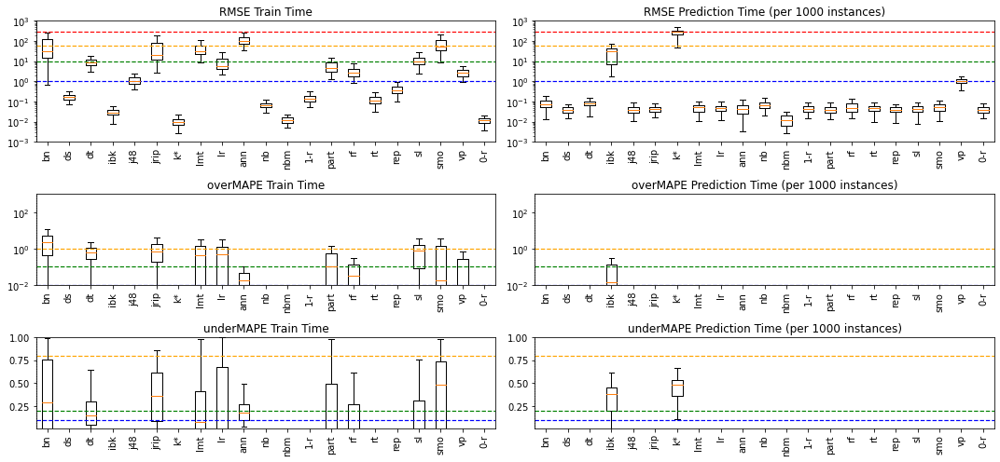

In [25]:
fig, ax = plt.subplots(3,2,figsize=(15,7), gridspec_kw={'height_ratios': [2, 1.5, 1.5]})
for mIndex, metric in enumerate(["RMSE", "overMAPE", "underMAPE"]):
    for tIndex, target in enumerate(["fittime", "predicttime"]):
        a = ax[mIndex][tIndex]
        column = target + "_" + metric
        M = np.array([dfEvaluationParametrized[dfEvaluationParametrized["algorithm"] == a][column].astype(float).dropna() for a in algorithms])
        targetname = {"fittime": "Train Time", "predicttime": "Prediction Time"}
        if target == 'predicttime':
            a.set_title(metric + " " + targetname[target] + " (per 1000 instances)")
        else:
            a.set_title(metric + " " + targetname[target])
        a.boxplot(M, 0, '')
        a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
        
        a.axvline(len(preprocessors) + 0.5, color="black", linestyle="dotted", linewidth=1)
        
        if metric == 'RMSE':
            a.set_yscale('log')
            a.set_ylim([.001, 1000])
            a.axhline(1, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(10, color="green", linestyle="--", linewidth="1.2")
            a.axhline(60, color="orange", linestyle="--", linewidth="1.2")
            a.axhline(300, color="red", linestyle="--", linewidth="1.2")
        else:
            if metric == 'overMAPE':
                a.set_yscale('log')
                a.set_ylim([.01, 1000])
                a.axhline(0.01, color="blue", linestyle="--", linewidth="1.2")
                a.axhline(0.1, color="green", linestyle="--", linewidth="1.2")
                a.axhline(1, color="orange", linestyle="--", linewidth="1.2")
            if metric == 'underMAPE':
                a.set_ylim([.01, 1])
                a.axhline(0.1, color="blue", linestyle="--", linewidth="1.2")
                a.axhline(0.2, color="green", linestyle="--", linewidth="1.2")
                a.axhline(0.8, color="orange", linestyle="--", linewidth="1.2")
            
fig.tight_layout()
fig.savefig("plots/predictionresults-parametrized.pdf")

### Plot the RMSE per dataset

In [ ]:
M = np.array([[np.nanmean(dfEvaluationParametrized[(dfEvaluationParametrized["algorithm"] == a) & (dfEvaluationParametrized["openmlid"] == d)]["fittime_RMSE"]) for d in datasets] for a in algorithms])
fig, ax = plt.subplots(5, 1, figsize=(5 * 40, 50))
for i, tol in enumerate([10, 30, 60, 300, 1200]):
    a = ax.ravel()[i]
    im = a.imshow(M, cmap='viridis', vmin=0, vmax=tol)
    a.set_xticks(np.arange(len(datasets) - 1))
    a.set_xticklabels(datasets, rotation=90)
    a.set_yticks(np.arange(len(classifiers) - 1))
    a.set_yticklabels(classifiers)
    a.set_title("RMSE per classifier and dataset", fontsize=30)
fig.tight_layout()
pass

In [ ]:
def getCummulativeDensity(A):
    steps = sorted(np.unique(A))
    L = len(A)
    F = [len(A[A <= steps[i]])/L for i in range(len(steps))]
    return steps, F

In [ ]:
# distribution of mistakes
Fx, Fy = getCummulativeDensity(dfEvaluationParametrized["fittime_RMSE"])
Gx, Gy = getCummulativeDensity(dfEvaluationParametrized["predicttime_RMSE"])

fig, ax = plt.subplots(1,2, figsize=(20, 5))
ax[0].plot(Fx, Fy)
ax[0].set_xlabel("induction time prediction RMSE (s)")
ax[0].set_title("Cummulative Empirical Density of the absolute prediction error")
ax[0].set_xscale("log")
ax[0].set_xlim([0.01, 1000])
ax[0].axvline(60, color="green", linestyle="--")
ax[1].plot(Gx, Gy)
ax[1].set_xlabel("inference time prediction RMSE (s)")
ax[1].set_title("Cummulative Empirical Density of the absolute prediction error")
ax[1].set_xscale("log")
ax[1].set_xlim([0.01, 1000])
ax[1].axvline(60, color="green", linestyle="--")
plt.tight_layout()

fig, ax = plt.subplots(len(algorithms),2, figsize=(20, 5 * len(algorithms)))
for aIndex, algo in enumerate(algorithms):
    dfAlgo = dfEvaluationParametrized[dfEvaluationParametrized["algorithm"] == algo]
    Fx, Fy = getCummulativeDensity(dfAlgo["fittime_RMSE"])
    Gx, Gy = getCummulativeDensity(dfAlgo["predicttime_RMSE"])
    a = ax[aIndex][0]
    a.plot(Fx, Fy)
    a.set_xlabel(algo + " - induction time prediction RMSE (s)")
    a.set_title("Cummulative Empirical Density of the absolute prediction error")
    a.set_xscale("log")
    a.set_xlim([0.01, 1000])
    a.axvline(60, color="green", linestyle="--")
    a = ax[aIndex][1]
    a.plot(Gx, Gy)
    a.set_xlabel(algo + " - inference time prediction RMSE (s)")
    a.set_title("Cummulative Empirical Density of the absolute prediction error")
    a.set_xscale("log")
    a.set_xlim([0.01, 1000])
    a.axvline(60, color="green", linestyle="--")
plt.tight_layout()
pass

# 6. Generalization Performance of the Special Models

## 6.1. Default-Parameter Models

### Run All The Experiments with RF on 10000 train points using ALL datasets and algorithms in DEFAULT configuration

In [20]:
pfSuffixDefault = "-default-log-1000"
pfFileDefault = "data/workdata/runtimepredictions" + pfSuffixDefault + ".csv"
metricFileDefault = "data/workdata/runtimepredictions" + pfSuffixDefault + "_withmetrics.csv"

In [ ]:
trainsizes = [1000]
selectedDatasets = datasets
selectedAlgorithms = algorithms
learners = ["forest"]
expansions = [()]
seeds = range(10)
fset = ["fitsize", "numattributes", "fitsizexnumattributes**2"]
dfMod = dfDefault.copy()
dfMod["fitsizexnumattributes**2"] = dfMod["fitsize"] * (dfMod["numattributes"] ** 2)
numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
updateGTPredictionPairSeries(dfMod, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, [fset], expansions, 10000, 100, pfFileDefault)

In [ ]:
import numpy as np
import numpy.ma as ma
import scipy as sp
import pandas as pd
import sklearn as sk
import itertools
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import ARDRegression
from sklearn.isotonic import IsotonicRegression
import random
import os.path
from os import path
from itertools import chain, combinations
from commons import *
from tqdm import tqdm_notebook as tqdm

########################
## Feature Expansions ##
########################
def expandMult(arr):
    numAttributes = arr.shape[1]
    numPairs = int(sp.special.binom(numAttributes, 2))
    expansion = np.empty((arr.shape[0], numPairs))
    c = 0
    for i in range(numAttributes):
        for j in range(i):
            v = arr[:,i] * arr[:,j]
            expansion[:, c] = v
            c += 1
    return np.concatenate((arr, expansion), axis=1)

def expandPower(arr, exp):
    return np.concatenate((arr, np.power(arr, exp)), axis=1)

def expandLog(arr):
    return np.concatenate((arr,  ma.log(arr)), axis=1)

############################
## Classifier Experiments ##
############################
def getLearnFile(algorithm, openmlids=[]):
    regressionFile = "learnfile-" + algorithm + ".csv"
    if not path.exists(regressionFile):
        L = ["forest", "ann", "linear"]
        E = powerset(["log", "pow", "mul"])
        TrSize = np.unique([int(1 + ((i+1)**2.5)) for i in range(50)])
        S = range(10) # seeds
        algorithms = [algorithm]
        C = np.array([x for x in itertools.product(openmlids, algorithms, TrSize, S, E)])
        z = np.zeros(C.shape[0]) - 1
        C = np.column_stack([range(C.shape[0]), C])
        cols = ["reg_id", "openmlid", "classifier", "traindatasize", "seed", "expansions"]
        for learner in L:
            cols.append("mse_" + learner + "_trainruntime_half")
            cols.append("mse_" + learner + "_trainruntime_full")
            cols.append("mse_" + learner + "_testruntime_half")
            cols.append("mse_" + learner + "_testruntime_full")
            C = np.column_stack([C, z, z, z, z])
        exp = pd.DataFrame(C, columns=cols)
        exp.to_csv(regressionFile, index=False)
        return exp
    else:
        return pd.read_csv(regressionFile)

def updateLearnFile(algorithm, results):
    regressionFile = "learnfile-" + algorithm + ".csv"
    df = getLearnFile(algorithm).T ## assume that file exists.
    ## IN THE df OBJECT, line indices correspond to reg_ids
    for i, r in results.iterrows():
        df[r["reg_id"]] = r.values
    df = df.T
    df.to_csv(regressionFile, index=False)
    
def getRegressionInputRepresentation(dataspace, basefeatures, openmlid, algorithm, expansion, target):

    # reduce data only to those that have the desired classifier
    classifierSpace = dataspace.query("algorithm == '" + algorithm + "'")
    if len(classifierSpace.query("openmlid == " + str(openmlid))) == 0:
        raise Exception("No runtime results are available for algorithm " + algorithm + " and openmlid " + str(openmlid))
    classifierSpace = classifierSpace.dropna(subset=[target])
    
    # create features for regression problem
    print(basefeatures)
    X = np.nan_to_num(classifierSpace[basefeatures].values)
    if "log" in expansion:
        X = expandLog(X)
    if "pow" in expansion:
        X = expandPower(X, 2)
    if "mul" in expansion:
        X = expandMult(X)
    Y = classifierSpace[[target]].values
    print(X.shape)
    Y = np.log(Y + 1)
    
    indices, cIndices = getIndicesOfRowsForOpenMLId(classifierSpace, openmlid)
    if len(cIndices) == 0:
        raise Exception("No test data selected for openmlid " + str(openmlid))
    
    # create train/test split for regression problem based on a leave-one-out-split (using the openmlid)
    Xtrain = X[indices]
    Ytrain = Y[indices]
    #print("Reducing train data to those that do NOT have openmlid " + str(openmlid) + ". Length: " + str(len(Xtrain)) + "/" + str(len(X)))
    #print(classifierSpace.iloc[indices])
    #print(Xtrain)
    #print(Ytrain)
    
    # reduce test set to those corresponding to half/full dataset (according to targetdssize)
    Xtest = X[cIndices]
    Ytest = Y[cIndices]
    return Xtrain, Ytrain, Xtest, Ytest

### The function runExperiment performs the following three steps:
###
### 1) trains a learner for the train or prediction time (based on the variable $target)
###     - based on all given data for the classifier that does NOT belong to the given openmlid,
###     - deriving features based on the expansion keyword (log, multiplication, polynomial features)
###     - using traindatasize many random samples from that set
### 2) predicts the runtimes on the GIVEN openmlid for the requested train sizes and FULL
###    (refering to the maximum number of training samples for which a ground truth is known)
###
### 3) returns a dictionary with the different sample sizes for which predictions are requested
###    each one consisting of a pair of ground truth values and prediction values
###
### In both cases, the traindatasize variable refers to the number of instances used for FITTING the algorithm
### The concrete number of instances for which predictions are made is not relevant and not considered.
def runExperiment(dataspace, basefeatures, openmlid, algorithm, learner, traindatasize, expansion, target, samplesizes, sampleattributes):
    if type(samplesizes) != list:
        samplesizes = [samplesizes]
    if len(samplesizes) != 1:
        raise Exception("Currently robust only for single size lists")
    if type(sampleattributes) != int:
        raise Exception("Currently robust only for single size lists")
    Xtrain, Ytrain, Xtest, Ytest = getRegressionInputRepresentation(dataspace, basefeatures, openmlid, algorithm, expansion, target)
    if len(Xtrain) == 0:
        raise Exception("No training data available to evaluate " + algorithm + " against " + str(openmlid))
    
    numInstancesCol = basefeatures.index("fitsize")
    numInstances = Xtest[:,numInstancesCol]
    numAttributesCol = basefeatures.index("numattributes")
    numAttributes = Xtest[:,numAttributesCol]
    if numInstances.size == 0:
        return {}
    
    # first remove train instances that have the same number of instances and attributes as used in the samples
    goodIndices = (Xtrain[:,numInstancesCol] != samplesizes[0]) | (Xtrain[:,numAttributesCol] != sampleattributes)
    print(Xtrain.shape, Ytrain.shape)
    #print(Xtrain[~goodIndices])
    Xtrain = Xtrain[goodIndices]
    Ytrain = Ytrain[goodIndices]
    print(Xtrain.shape, Ytrain.shape)
    
    # now reduce the train set to the specified value
    tIndices = list(range(Xtrain.shape[0]))
    random.shuffle(tIndices)
    trainSizeBefore = len(Xtrain)
    Xtrain = Xtrain[tIndices[:traindatasize]]
    Ytrain = Ytrain[tIndices[:traindatasize]]
    #print("Reducing train data from " + str(trainSizeBefore) + " to " + str(traindatasize) + ". Effective train size: " + str(len(Xtrain)))
    
    # create learner
    if learner == 'forest':
        reg = RandomForestRegressor(n_estimators=100)
    else:
        if learner == "ann":
            reg = sk.neural_network.MLPRegressor(max_iter=1000)
        else:
                if learner == "linear":
                    reg = sk.linear_model.LinearRegression()
                else:
                    if learner == "isotonic":
                        reg = IsotonicRegression()
                    else:
                        raise Exception("Unknown learner " + learner)

    
    # train learner
    #print ("Training " + str(reg) + " with " + "\n\t" + str(Xtrain) + "\nand\n\t" + str(Ytrain))
    reg.fit(Xtrain, np.ravel(Ytrain))
  
    # gather predictions for learner
    out = {}
    maxInstances = int(np.max(numInstances))
    for sampleSize in samplesizes:
        if sampleSize == "full":
            sampleSize = maxInstances
        print("Creating predictions for sample size " + str(sampleSize))
        relevantIndices = np.where((numInstances == sampleSize) & (numAttributes == sampleattributes))[0]
        print("Relevant indices: ", relevantIndices)
        if len(relevantIndices) == 0:
            out[sampleSize] = ([], [])
        else:
            XtestSampleSize = Xtest[relevantIndices, :].reshape(relevantIndices.size,Xtest.shape[1])
            YtestSampleSize = Ytest[relevantIndices, :].reshape(relevantIndices.size,1)
            out[sampleSize] = (np.exp(np.ravel(YtestSampleSize)) - 0.0000001, np.exp(reg.predict(XtestSampleSize)) - 0.0000001)
            print(out[sampleSize])
            print("RMSE", RMSE(out[sampleSize][0], out[sampleSize][1]))
        if sampleSize == maxInstances:
            out["full"] = out[sampleSize]
    return out

# This is to recover runtime predictions and ground truths from the archive.
def getGTPredictionPairSeries(learner, basefeatures, expansions, trainpoints):
    serializedDF = pd.read_csv("data/workdata/runtime_predictions.csv").query("learner == '" + str(learner) + "' and basefeatures == '" + str(basefeatures).replace("'", "\\'").replace(",", ";") + "' and expansions == '" + str(expansions) + "' and trainpoints_algorithm == 'full' and trainpoints_learner == " + str(trainpoints))
    datasets = list(pd.unique(serializedDF["openmlid"]))
    classifiers = list(pd.unique(serializedDF["algorithm"]))
    seeds = list(pd.unique(serializedDF["seed"]))
    trainGTPredictionPairs = np.empty((len(datasets), len(classifiers)), dtype=object)
    testGTPredictionPairs = np.empty((len(datasets), len(classifiers)), dtype=object)
    pbar = tqdm(total=len(datasets) * len(classifiers) * len(seeds))
    for i, ds in enumerate(datasets):
        for j, c in enumerate(classifiers):
            if trainGTPredictionPairs[i][j] != None:
                raise Exception("ALREADY HAVE VALUES")
            trainVals = []
            testVals = []
            for seed in seeds:
                pbar.update(1)
                relevantData = serializedDF.query("openmlid == " + str(ds) + " and algorithm == '" + str(c) + "' and seed == " + str(seed))
                if len(relevantData) > 0:
                    if len(relevantData) >= 4:
                        trainGT = np.array(relevantData.query("recordtype == 'traintime_gt'")["entries"].values[0].split(";")).astype('float64')
                        trainPR = np.array(relevantData.query("recordtype == 'traintime_pr'")["entries"].values[0].split(";")).astype('float64')
                        testGT = np.array(relevantData.query("recordtype == 'predictiontime_gt'")["entries"].values[0].split(";")).astype('float64')
                        testPR = np.array(relevantData.query("recordtype == 'predictiontime_pr'")["entries"].values[0].split(";")).astype('float64')
                        if len(trainGT) != len(trainPR):
                            raise Exception("GT and PR of traintimes have different length!")
                        if len(testGT) != len(testPR):
                            raise Exception("GT and PR of prediction times have different length!")
                        trainVals.append((trainGT, trainPR))
                        testVals.append((testGT, testPR))
            trainGTPredictionPairs[i][j] = trainVals
            testGTPredictionPairs[i][j] = testVals
    pbar.close()
    return datasets, classifiers, trainGTPredictionPairs, testGTPredictionPairs

def updateGTPredictionPairSeries(df, datasets, algorithms, learners, seeds, trainpoints, basefeaturespace, expansions, sampleSizes, sampleattributes, predictionsFile, occurrencecheck = True):
    serializedDF = pd.read_csv(predictionsFile)
    interrupted = False
    t = len(algorithms) * len(datasets) * len(learners) * len(seeds) * len(trainpoints) * len(expansions) * len(basefeaturespace)
    k = 0
    
    ## ATTENTION: For training the application time (inference time) model, we previously dismiss all data that has no such entries
    mfdf = df.copy()
    mfdf["applicationtimeperkunits"] = mfdf["applicationtimeperunit"] * 1000
    dfTrain = mfdf[mfdf["fittime"].notnull()]
    dfTest = mfdf[(mfdf["applicationsize"] >= 100) & (mfdf["applicationtime"].notnull())]
    print(len(mfdf))
    print(len(dfTrain))
    print(len(dfTest))
    
    #print("Total number of steps: " + str(t))
    pbar = tqdm(total=t)
    itsSinceLastSave = 0
    for seed in seeds:
        for ds in datasets:
            for a in algorithms:
                if len(dfTrain[(dfTrain["openmlid"] != ds) & (dfTrain["algorithm"] == a)]) == 0:
                    pbar.update(1)
                    print("No data available to validate fittime of " + a + " against dataset " + str(ds))
                    continue
                
                for basefeatures in basefeaturespace:
                    basefeatures = sorted(basefeatures)
                    basefeaturesStr = str(basefeatures).replace(",", ";")
                    for exp in expansions:
                        for learner in learners:
                            for tp in trainpoints:
                                observedFail = False
                                try:
                                    k += 1
                                    pbar.update(1)
                                    if observedFail:
                                        continue
                                    #print("Learning model for " + str(ds) + "/" + c + " with seed " + str(seed) + " on " + str(tp) + " and expansions " + str(exp) + " (" + str(np.round(100 * k/t, 2)) + "%)")
                                    if occurrencecheck:
                                        excerpt = serializedDF.query("openmlid == " + str(ds) + " and algorithm == '" + a + "' and learner == '" + learner + "' and trainpoints_learner == " + str(tp) + " and basefeatures == \"" + basefeaturesStr + "\" and expansions == '" + str(exp) + "' and seed == " + str(seed))
                                        exists = len(excerpt) > 0
                                    else:
                                        exists = False

                                    if exists:
                                        pass#print("Skipping due to existence")
                                    else:
                                        
                                        ## conduct a leave-one out validation for the current dataset and algorithm
                                        print("START " + a)
                                        train_results = runExperiment(dfTrain, basefeatures, ds, a, learner, tp, exp, "fittime", sampleSizes, sampleattributes)
                                        prediction_results = runExperiment(dfTest, basefeatures, ds, a, learner, tp, exp, "applicationtimeperkunits", sampleSizes, sampleattributes)
                                        
                                        print("END " + a)

                                        # update the dataframe
                                        #if exists:
                                        #    serializedDF.loc[excerpt.query("recordtype == 'traintime_gt'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "traintime_gt", implode(train_results[0], ";")]
                                        #    serializedDF.loc[excerpt.query("recordtype == 'traintime_pr'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "traintime_pr", implode(train_results[1], ";")]
                                        #    serializedDF.loc[excerpt.query("recordtype == 'validationtime_gt'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "validationtime_gt", implode(prediction_results[0], ";")]
                                        #    serializedDF.loc[excerpt.query("recordtype == 'validationtime_pr'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "validationtime_pr", implode(prediction_results[1], ";")]
                                        #else:
                                        extDF = pd.DataFrame([], columns = serializedDF.columns)
                                        for sampleSize in train_results:
                                            if len(train_results[sampleSize][0]) > 0:
                                                if len(train_results[sampleSize][0]) != len(train_results[sampleSize][1]):
                                                    raise Exception("Length of GT and PR does not coincide!")
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "traintime_gt", implode(train_results[sampleSize][0], ";")]
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "traintime_pr", implode(train_results[sampleSize][1], ";")]
                                        for sampleSize in prediction_results:
                                            if len(prediction_results[sampleSize][0]) > 0:
                                                if len(prediction_results[sampleSize][0]) != len(prediction_results[sampleSize][1]):
                                                    raise Exception("Length of GT and PR does not coincide!")
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "predictiontime_gt", implode(prediction_results[sampleSize][0], ";")]
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "predictiontime_pr", implode(prediction_results[sampleSize][1], ";")]
                                        serializedDF = pd.concat([serializedDF, extDF])

                                        # update csv file
                                        if itsSinceLastSave >= 500:
                                            print("Saving df with " + str(len(serializedDF)) + " entries to " + predictionsFile)
                                            serializedDF.to_csv(predictionsFile, index=False)
                                            itsSinceLastSave = 0
                                        else:
                                            itsSinceLastSave += 1 
                                except KeyboardInterrupt:
                                    print("Interrupted")
                                    interrupted = True
                                    observedFail = True
                                    break
                                except Exception as ex:
                                    if "No runtime results" in ex.args[0] or "No test data selected" in ex.args[0]:
                                        print(ex)
                                        observedFail = True
                                        pass
                                    else:
                                        raise
                        if interrupted:
                            break
                    if interrupted:
                        break
                if interrupted:
                    break
            if interrupted:
                break
        if interrupted:
            break
    pbar.close()
    if itsSinceLastSave > 0:
        serializedDF.to_csv(predictionsFile, index=False)

In [ ]:
createPredictionErrorFile(pfSuffixDefault)

In [21]:
dfEvaluationDefault = pd.read_csv(metricFileDefault).query("learner == 'forest' and trainpoints_learner == 1000")[["openmlid", "algorithm", "fittime_RMSE", "predicttime_RMSE", "fittime_overMAPE", "predicttime_overMAPE", "fittime_underMAPE", "predicttime_underMAPE"]]

In [22]:
dfEvaluationDefault

,openmlid,algorithm,fittime_RMSE,predicttime_RMSE,fittime_overMAPE,predicttime_overMAPE,fittime_underMAPE,predicttime_underMAPE
0,3,bayesnet,0.086710,0.024743,0.000000,0.0,0.000000,0.0
1,3,decisionstump,0.130675,0.045592,0.000000,0.0,0.000000,0.0
2,3,decisiontable,3.125399,0.033482,0.130725,0.0,0.130334,0.0
3,3,ibk,0.004282,6.651882,0.000000,0.0,0.000000,0.0
4,3,j48,0.600747,0.020456,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...
2933,41991,randomforest,7.465541,0.027573,0.000000,0.0,0.492385,0.0
2934,41991,randomtree,0.067031,0.048280,0.000000,0.0,0.000000,0.0
2935,41991,reptree,0.813078,0.044277,0.000000,0.0,0.000000,0.0
2936,41991,simplelogistic,161.030539,0.026340,0.000000,0.0,0.891884,0.0


### Create Boxplots

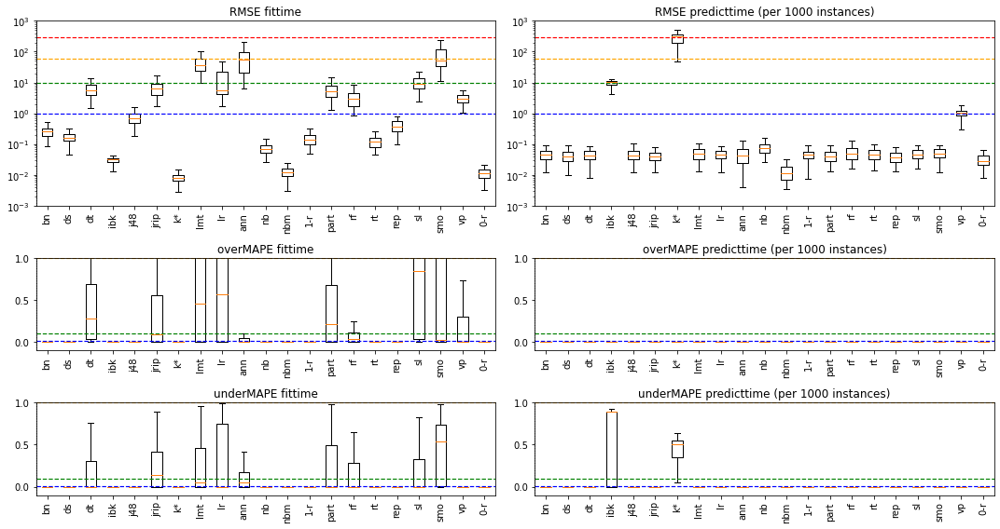

In [23]:
fig, ax = plt.subplots(3,2,figsize=(15,8), gridspec_kw={'height_ratios': [2, 1, 1]})
for mIndex, metric in enumerate(["RMSE", "overMAPE", "underMAPE"]):
    for tIndex, target in enumerate(["fittime", "predicttime"]):
        a = ax[mIndex][tIndex]
        column = target + "_" + metric
        M = np.array([dfEvaluationDefault[dfEvaluationDefault["algorithm"] == a][column].astype(float).dropna() for a in algorithms])
        if target == 'predicttime':
            a.set_title(metric + " " + target + " (per 1000 instances)")
        else:
            a.set_title(metric + " " + target)
        a.boxplot(M, 0, '')
        a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
        
        a.axvline(len(preprocessors) + 0.5, color="black", linestyle="dotted", linewidth=1)
        
        if metric == 'RMSE':
            a.set_yscale('log')
            a.set_ylim([.001, 1000])
            a.axhline(1, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(10, color="green", linestyle="--", linewidth="1.2")
            a.axhline(60, color="orange", linestyle="--", linewidth="1.2")
            a.axhline(300, color="red", linestyle="--", linewidth="1.2")
        else:
            #a.set_yscale('log')
            a.set_ylim([-.1, 1])
            a.axhline(0.01, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(0.1, color="green", linestyle="--", linewidth="1.2")
            a.axhline(1, color="orange", linestyle="--", linewidth="1.2")
            
fig.tight_layout()
fig.savefig("plots/predictionresults-default.pdf")

### Plot the RMSE per dataset

In [ ]:
M = np.array([[np.nanmean(dfEvaluationDefault[(dfEvaluationDefault["algorithm"] == a) & (dfEvaluationDefault["openmlid"] == d)]["fittime_RMSE"]) for d in datasets] for a in algorithms])
fig, ax = plt.subplots(5, 1, figsize=(5 * 40, 50))
for i, tol in enumerate([10, 30, 60, 300, 1200]):
    a = ax.ravel()[i]
    im = a.imshow(M, cmap='viridis', vmin=0, vmax=tol)
    a.set_xticks(np.arange(len(datasets) - 1))
    a.set_xticklabels(datasets, rotation=90)
    a.set_yticks(np.arange(len(classifiers) - 1))
    a.set_yticklabels(classifiers)
    a.set_title("RMSE per classifier and dataset", fontsize=30)
fig.tight_layout()
pass

## 6.2. Performance of Posterior Models (Using true Default-Runtimes)

In [ ]:
pfSuffixPosterior = "-posterior-log-1000"
pfFilePosterior = "data/workdata/runtimepredictions" + pfSuffixPosterior + ".csv"
metricFilePosterior = "data/workdata/runtimepredictions" + pfSuffixPosterior + "_withmetrics.csv"

In [ ]:
def getExtensionOfParametrizedByRuntimesOfDefault(dfParametrized, dfDefault, algo):
    columns = ["openmlid", "totalsize", "fitsize", "applicationsize", "numattributes", "seed", "algorithm", "algorithmoptions", "fittime", "applicationtime", "applicationtimeperunit"]
    dfAlgParametrized = dfParametrized.query("algorithm == '" + algo + "'").merge(dfDefault, on=["openmlid", "algorithm", "seed", "fitsize", "numattributes"], suffixes=("", "_def"))
    if len(dfAlgParametrized) == 0:
        return dfAlgParametrized
    columns.append("fittime_def")
    columns.append("applicationtime_def")
    columnsbeforeExplosion = list(dfAlgParametrized.columns)
    dfAlgParametrized = explodeAlgorithmOptions(dfAlgParametrized)
    algoParams = [x for x in dfAlgParametrized.columns if not x in columnsbeforeExplosion]
    for x in ["searcheroptions", "evaloptions"]:
        if x in algoParams:
            algoParams.remove(x)
    columns.extend(algoParams)
    return dfAlgParametrized[columns]

In [ ]:
trainsizes = [1000]
selectedDatasets = datasets
learners = ["forest"]
expansions = [()]
seeds = range(10)

prevCols = dfConfigured.columns
for algo in algorithms:
    print(algo)
    if len(dfConfigured[dfConfigured["algorithm"] == algo]) > 0:
        dfAlgo = getExtensionOfParametrizedByRuntimesOfDefault(dfConfigured, dfDefault, algo)
        if len(dfAlgo) == 0:
            continue
        selectedAlgorithms = [algo]
        
        fset = ["fitsize", "numattributes", "fittime_def", "applicationtimeperkunits_def"]
        dfAlgo["applicationtimeperkunits_def"] = dfAlgo["applicationtime_def"] / dfAlgo["applicationsize"]
        algoCols = [f for f in dfAlgo if not f in prevCols and not f in fset and not "options" in f]
        fset.extend(algoCols)
        print(fset)
        numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
        updateGTPredictionPairSeries(dfAlgo, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, [fset], expansions, "full", pfFilePosterior)

In [ ]:
createPredictionErrorFile(pfSuffixPosterior)

In [ ]:
dfEvaluationPosterior = pd.read_csv(metricFilePosterior).query("learner == 'forest' and trainpoints_learner == 1000")[["openmlid", "algorithm", "fittime_RMSE", "predicttime_RMSE", "fittime_overMAPE", "predicttime_overMAPE", "fittime_underMAPE", "predicttime_underMAPE"]]

In [ ]:
dfEvaluationPosterior

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,8), gridspec_kw={'height_ratios': [2, 1, 1]})
for mIndex, metric in enumerate(["RMSE", "overMAPE", "underMAPE"]):
    for tIndex, target in enumerate(["fittime", "predicttime"]):
        a = ax[mIndex][tIndex]
        column = target + "_" + metric
        M = np.array([dfEvaluationPosterior[dfEvaluationPosterior["algorithm"] == a][column].astype(float).dropna() for a in algorithms])
        if target == 'predicttime':
            a.set_title(metric + " " + target + " (per 10000 instances)")
        else:
            a.set_title(metric + " " + target)
        a.boxplot(M, 0, '')
        a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
        
        a.axvline(len(preprocessors) + 0.5, color="black", linestyle="dotted", linewidth=1)
        
        if metric == 'RMSE':
            a.set_yscale('log')
            a.set_ylim([.1, 1000])
            a.axhline(10, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(60, color="green", linestyle="--", linewidth="1.2")
            a.axhline(300, color="orange", linestyle="--", linewidth="1.2")
            a.axhline(600, color="red", linestyle="--", linewidth="1.2")
        else:
            a.set_yscale('log')
            a.set_ylim([.01, 1000])
            a.axhline(0.01, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(0.1, color="green", linestyle="--", linewidth="1.2")
            a.axhline(1, color="orange", linestyle="--", linewidth="1.2")
            
fig.tight_layout()
fig.savefig("plots/predictionresults-posterior.pdf")

In [ ]:
M = np.array([[np.nanmean(dfEvaluationPosterior[(dfEvaluationPosterior["algorithm"] == a) & (dfEvaluationPosterior["openmlid"] == d)]["fittime_RMSE"]) for d in datasets] for a in algorithms])
fig, ax = plt.subplots(5, 1, figsize=(5 * 40, 50))
for i, tol in enumerate([10, 30, 60, 300, 1200]):
    a = ax.ravel()[i]
    im = a.imshow(M, cmap='viridis', vmin=0, vmax=tol)
    a.set_xticks(np.arange(len(datasets) - 1))
    a.set_xticklabels(datasets, rotation=90)
    a.set_yticks(np.arange(len(classifiers) - 1))
    a.set_yticklabels(classifiers)
    a.set_title("RMSE per classifier and dataset", fontsize=30)
fig.tight_layout()
pass

In [ ]:
def getParametrizedAlgoPredictionRMSE(df, algorithm, target):
    datasets = pd.unique(df["openmlid"])

    # partition attributes into basic ones and algorithm specific ones
    XattsBasic = ['fitsize', 'numattributes']
    XattsDefaultBased = ['fittime_def', 'applicationtimeperkinstances_def']
    XattsAlgorithmSpecific = list(df.columns)
    #print(XattsAlgorithmSpecific)
    for f in XattsBasic:
        #print("Removing " + f)
        XattsAlgorithmSpecific.remove(f)
    for f in XattsDefaultBased:
        #print("Removing " + f)
        XattsAlgorithmSpecific.remove(f)
    for f in ['openmlid', 'algorithm', 'algorithmoptions', 'seed', 'fittime', 'applicationtime', 'applicationtimeperkinstances']:
        #print("Removing " + f)
        XattsAlgorithmSpecific.remove(f)

    # create reduced view only with the attributes potentially relevant for fitting a model
    TARGET = target
    attributesToKeep = ["openmlid", TARGET]
    attributesToKeep.extend(XattsBasic)
    attributesToKeep.extend(XattsAlgorithmSpecific)
    attributesToKeep.extend(XattsDefaultBased)
    dfRed = pd.get_dummies(df[df["algorithm"] == algorithm][attributesToKeep])
    
    # define the result frame
    cDF = pd.DataFrame([], columns=["openmlid", "algorithm", "fitsize", "without", "with", "fittime"])
    withoutCol = list(cDF.columns).index("without")
    
    
    # conduct a loo-cross-evaluation over the different datasets
    pbar = tqdm(total = len(datasets) * 2 * len([50, 100, 200, 1000, 10000, 100000]))    
    for d in datasets:
        trainDF = dfRed.query("openmlid != " + str(d)).drop(columns=["openmlid"])
        testDF = dfRed.query("openmlid == " + str(d))
        if len(trainDF) > 0 and len(testDF) > 0:
            
            # first train a model with and then without the support of knowing the default config
            for mode in ["with", "without"]:
                Xatts = list(trainDF.columns)
                Xatts.remove(TARGET)
                Xatts.remove("totalsize")
                Xatts.remove("applicationsize")
                if mode == "without":
                    for col in XattsDefaultBased:
                        Xatts.remove(col)
                reductionAttributes = Xatts.copy()
                reductionAttributes.append(TARGET)
                trainData = trainDF[reductionAttributes].dropna()
                Xtrain = trainData[Xatts].values
                Ytrain = np.log(trainData[TARGET].values + 0.000001)
                rf = RandomForestRegressor(n_estimators=10)
                rf.fit(np.nan_to_num(Xtrain), Ytrain)

                # do this for three different train point sizes
                #print("Tests available for " + str(pd.unique(testDF[testDF['fittime'].notna()]["fitsize"])))
                for tp in [50, 100, 200, 1000, 10000, 100000]:
                    pbar.update(1)
                    testData = testDF[reductionAttributes].dropna()
                    Xtest = pd.get_dummies(testData.query("fitsize == " + str(tp))[Xatts]).values
                    Ytest = testData.query("fitsize == " + str(tp))[TARGET].values
                    if len(Xtest) == 0:
                        #print("WARN: Cannot test " + algorithm + " on dataset " + str(d) + " with fit size " + str(tp) + ", because no data is available.")
                        continue
                    
                    predictions = np.exp(rf.predict(Xtest)) - 0.000001
                    #print(mode + ": " + str(np.mean(predictions)) + "/" + str(np.mean(Ytest)))
                    #for i, p in enumerate(predictions):
                    #    print(str(p) + "/" + str(Ytest[i]))
                    score = np.sqrt(sk.metrics.mean_squared_error(Ytest, predictions))
                    if mode == "with":
                        cDF.loc[len(cDF)] = [d, algorithm, tp, "", score, np.mean(Ytest)]
                    else:
                        index = cDF.query("openmlid == " + str(d) + " and algorithm == '" + algorithm + "' and fitsize == " + str(tp)).index[0]
                        cDF.at[index,"without"] = score
                    #print("\t" + str(tp) + ": " + str(score) + " (abs average = " + str(np.mean(Ytest)) + ")")
                    #print(len(cDF))
    pbar.close()
    return cDF

In [ ]:
cDF = pd.DataFrame([])
for algo in algorithms:
    file = "data/runtimes/runtimes_" + algo + "_parametrized.csv"
    if path.exists(file):
        dfParametrizedWithDefaultRuntimes = explodeAlgorithmOptions(pd.read_csv(file))
        #cDFInduction = getParametrizedAlgoPredictionRMSE(dfParametrizedWithDefaultRuntimes, algo, "fittime")
        dfParametrizedWithDefaultRuntimes["applicationtimeperkinstances"] = dfParametrizedWithDefaultRuntimes["applicationtime"] / dfParametrizedWithDefaultRuntimes["applicationsize"] * 10000
        dfParametrizedWithDefaultRuntimes["applicationtimeperkinstances_def"] = dfParametrizedWithDefaultRuntimes["applicationtime_def"] / dfParametrizedWithDefaultRuntimes["applicationsize"] * 10000
        cDFInference = getParametrizedAlgoPredictionRMSE(dfParametrizedWithDefaultRuntimes, algo, "applicationtimeperkinstances")
        cDFInference.to_csv("data/workdata/comparison_" + algo + ".csv", index=False)

## 6.3. Create Comparison Plots

In [ ]:
def getErrorRectangle(df, algorithms, datasets, metric):
    rect = np.zeros((len(algorithms), len(datasets)))
    pbar = tqdm(total = rect.size)
    for i, algo in enumerate(algorithms):
        dfAlgo = df[df["algorithm"] == algo]
        for j, d in enumerate(datasets):
            rect[i,j] = np.nanmean(dfAlgo[dfAlgo["openmlid"] == d][metric])
            pbar.update(1)
    pbar.close()
    return rect

comparableAlgorithms = [a for a in algorithms if len(dfConfigured[dfConfigured["algorithm"] == a]) > 0]

rects = {}
pbar = tqdm(total = 2 * 3)
for target in ["fittime", "predicttime"]:
    rects[target] = {}
    arg = target + "_RMSE"
    rects[target]["parametrized"] = getErrorRectangle(dfEvaluationParametrized, comparableAlgorithms, datasets, arg)
    pbar.update(1)
    rects[target]["default"] = getErrorRectangle(dfEvaluationDefault, comparableAlgorithms, datasets, arg)
    pbar.update(1)
    rects[target]["posterior"] = getErrorRectangle(dfEvaluationPosterior, comparableAlgorithms, datasets, arg)
    pbar.update(1)
pbar.close()

In [ ]:
rects["predicttime"]["default"][:,140]

In [ ]:
for modeltype in ["default", "posterior"]:
    
    advInduction = rects["fittime"]["parametrized"] - rects["fittime"][modeltype]
    advInference = rects["predicttime"]["parametrized"] - rects["predicttime"][modeltype]
    
    # advantage of default detailed
    fig, ax = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
    bound = 300
    ax[0].imshow(advInduction * -1, cmap="seismic", vmin = -1 * bound, vmax = bound, aspect="auto")
    ax[0].set_yticks(np.arange(len(comparableAlgorithms)))
    ax[0].set_yticklabels(comparableAlgorithms)
    ax[0].set_title("Fittime RMSE - " + modeltype)
    ax[1].imshow(advInference * -1, cmap="seismic", vmin = -1 * bound, vmax = bound, aspect="auto")
    ax[1].set_yticks(np.arange(len(comparableAlgorithms)))
    ax[1].set_yticklabels(comparableAlgorithms)
    ax[1].set_title("Predicttime RMSE - " + modeltype)
    plt.show()

In [ ]:
boundAbs = 60
boundAbsCounts = 5
boundRel = 1
L = [
    ["Def/Abs/Train", "Def/Abs/Pred"],
    ["Def/Cnt/Train", "Def/Cnt/Pred"],
    ["Def/Rel/Train", "Def/Rel/Inf"],
    ["Par/Abs/Ind", "Par/Abs/Inf"],
    ["Par/Cnt/Ind", "Par/Cnt/Inf"],
    ["Par/Rel/Ind", "Par/Rel/Inf"]]
L = [["", l[0], l[1], ""] for l in L]


fig, ax = plt.subplots(6, 1, figsize=(5, 4), sharex = True)
for aIndex, modeltype in enumerate(["default", "posterior"]):
    
    # absolute avg advantages
    absAdvInduction = (rects["fittime"]["parametrized"] - rects["fittime"][modeltype])
    absAdvInductionCounts = absAdvInduction / np.abs(absAdvInduction)
    absAdvInference =  (rects["predicttime"]["parametrized"] - rects["predicttime"][modeltype])
    absAdvInferenceCounts = absAdvInference / np.abs(absAdvInference)
    a = ax[aIndex * 3]
    a.imshow(np.array([
        [sp.stats.trim_mean(absAdvInduction[i][~np.isnan(absAdvInduction[i])], 0.05) for i in range(len(comparableAlgorithms))],
        [sp.stats.trim_mean(absAdvInference[i][~np.isnan(absAdvInference[i])], 0.05) for i in range(len(comparableAlgorithms))]
    ]) * -1, cmap="seismic", vmin = -1 * boundAbs, vmax = boundAbs, aspect="auto")
    a.set_yticks(np.arange(4) -1)
    a.set_yticklabels(L[aIndex * 3])
    
    # absolute counted advantages
    a = ax[aIndex * 3 + 1]
    a.imshow(np.array([
        [sp.stats.trim_mean(absAdvInductionCounts[i][~np.isnan(absAdvInductionCounts[i])], 0.05) for i in range(len(comparableAlgorithms))],
        [sp.stats.trim_mean(absAdvInferenceCounts[i][~np.isnan(absAdvInferenceCounts[i])], 0.05) for i in range(len(comparableAlgorithms))]
    ]) * -1, cmap="seismic", vmin = -1 * boundAbsCounts, vmax = boundAbsCounts, aspect="auto")
    a.set_yticks(np.arange(4) -1)
    a.set_yticklabels(L[aIndex * 3 + 1])
    
    # relateive advantages
    a = ax[aIndex * 3 + 2]
    relAdvInduction = (rects["fittime"]["parametrized"] >= 10) * absAdvInduction / rects["fittime"]["parametrized"]
    relAdvInductionCounts = relAdvInduction / np.abs(relAdvInduction)
    relAdvInference = (rects["predicttime"]["parametrized"] >= 10) * absAdvInference / rects["predicttime"]["parametrized"]
    relAdvInferenceCounts = relAdvInference / np.abs(relAdvInference)
    #analysisIndex = 6
    #for i in range(len(relAdvInference[analysisIndex])):
    #    print(str(rects["predicttime"]["parametrized"][analysisIndex][i]) + " -> " + str(rects["predicttime"][modeltype][analysisIndex][i]) + ": " + str(absAdvInference[analysisIndex][i]) + "/" + str(relAdvInference[analysisIndex][i]))
    #print(np.nanmean(absAdvInference[analysisIndex]))
    #print(np.nanmean(relAdvInference[analysisIndex]))
    a.imshow(np.array([
        [sp.stats.trim_mean(relAdvInduction[i][~np.isnan(relAdvInduction[i])], 0.05) for i in range(len(comparableAlgorithms))],
        [sp.stats.trim_mean(relAdvInference[i][~np.isnan(relAdvInference[i])], 0.05) for i in range(len(comparableAlgorithms))]
    ]) * -1, cmap="seismic", vmin = -1 * boundRel, vmax = boundRel, aspect="auto")
    a.set_yticks(np.arange(4) - 1)
    a.set_yticklabels(L[aIndex * 3 + 2])

ax[5].set_xticks(np.arange(len(comparableAlgorithms)))
ax[5].set_xticklabels([algorithmshortcuts[a] for a in comparableAlgorithms], rotation=90)
fig.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)
fig.savefig("plots/modeladvantages.pdf")
plt.show()
    
    

[i:-10] : temp(i) >= temp(i-1) -> p = 0.5
[i:-10] : temp(i) >= temp(i-1) & temp(t) > 40 & tos(t) = fuerte -> p = 0.9

## 7. Critical over- and understimations of the predictor
Idea:
* Even large absolute prediction failures are **ok** if both prediction and true runtime are substantially beyond the timeout.
* Prediction failures are a **problem** if the timeout is between prediction and true timeout

We should check the timeout is between prediction and truth when
* the absolute error is large
* the absolute error is small 

## 7.1 Create plots for the Paper

In [ ]:
timeouts = [0.5, 1, 2, 5, 10, 15, 20, 30]
TP = np.zeros((len(timeouts), len(algorithms)))
FP = np.zeros((len(timeouts), len(algorithms)))
TN = np.zeros((len(timeouts), len(algorithms)))
FN = np.zeros((len(timeouts), len(algorithms)))
decisionsPos = np.zeros((len(timeouts), len(algorithms)))
decisionsNeg = np.zeros((len(timeouts), len(algorithms)))
dfPredictions = pd.read_csv(pfFileParametrized).query("learner == 'forest' and trainpoints_learner == 1000")
#dfPredictions = dfPredictions[dfPredictions["trainpoints_algorithm"].notnull()].astype({"trainpoints_algorithm"})

cautionFactor = 1

for j, a in tqdm(enumerate(algorithms)):
    dfAlgo = dfPredictions[dfPredictions["algorithm"] == a]
    print(a)
    for gIndex, group in dfAlgo.groupby(["openmlid", "seed", "trainpoints_algorithm"]):
        if gIndex[2] != "full" and int(gIndex[2]) <= 100:
            continue
        if len(group) == 4:
            trueInductionTimes = np.array(group.query("recordtype == 'traintime_gt'")["entries"].values[0].split(";")).astype(float)
            trueInferenceTimes = np.array(group.query("recordtype == 'predictiontime_gt'")["entries"].values[0].split(";")).astype(float)
            predInductionTimes = np.array(group.query("recordtype == 'traintime_pr'")["entries"].values[0].split(";")).astype(float)
            predInferenceTimes = np.array(group.query("recordtype == 'predictiontime_pr'")["entries"].values[0].split(";")).astype(float)
            if len(trueInductionTimes) != len(trueInferenceTimes):
                continue
            trueRuntimes = trueInductionTimes + trueInferenceTimes
            predRuntimes = predInductionTimes + predInferenceTimes
            for i, to in enumerate(np.array(timeouts) * 60):
                trueTimeouts = trueRuntimes > to
                predTimeouts = predRuntimes * cautionFactor > to
                for k in range(len(trueTimeouts)):
                    if predTimeouts[k]:
                        decisionsPos[i,j] += 1
                        correct = trueTimeouts[k]
                        print("Predicting timeout " + ("correctly" if correct else "incorrectly") + " for to " + str(to) + " (" + str(predRuntimes[k]) + "/" + str(trueRuntimes[k]) + ")")
                        if correct:
                            TP[i,j] += 1
                        else:
                            FP[i,j] += 1
                    else:
                        decisionsNeg[i,j] += 1
                        correct = not trueTimeouts[k]
                        if correct:
                            TN[i,j] += 1
                        else:
                            FN[i,j] += 1

In [ ]:
np.mean(TP, axis=0)

### Number of Decisions

In [ ]:
selectedTimeouts = [timeouts[i] for i in [1, 3, 5, 7]]
fig, ax = plt.subplots(1, 1, figsize=(6, 1.5))
a = ax
ind = np.arange(len(algorithms)) * 2
width = 0.4
for i in range(len(decisionsPos[[1, 3, 5, 7], :])):
    a.bar(ind + width * i, decisionsPos[i], width=width, label=str(selectedTimeouts[i]) + " minute" + ("s" if selectedTimeouts[i] > 1 else ""))
#a.legend()
a.set_yscale("log")
a.set_yticks([10, 100, 1000, 10000])
a.set_xticks(np.arange(len(algorithms)) * 2)
a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
#a.invert_yaxis()
handles, labels = a.get_legend_handles_labels()
lgd = fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.525, 1.08),ncol=4)
fig.tight_layout()
fig.savefig("plots/atomicalgorithmclassifications-quantity.pdf", bbox_extra_artists=(lgd,), bbox_inches='tight')

### Goodness of the Decisions

In [ ]:

fig, ax = plt.subplots(4, 1, figsize=(6, 4), sharex=True)
fig.subplots_adjust(hspace=0.1)
#for j, target in enumerate(["fittime", "applicationtime"]):
for i, metric in enumerate(["tp", "fp", "tn", "fn"]):
    a = ax[i]
    if metric == "tp":
        M = TP
    if metric == "fp":
        M = FP
    if metric == "tn":
        M = TN
    if metric == "fn":
        M = FN
    cmap = "Reds" if "f" in metric else "Greens"
    MS = M / (decisionsPos if "p" in metric else decisionsNeg)
    a.imshow(MS, cmap=cmap, aspect="auto", vmax=1)
    a.set_yticks(range(0, len(timeouts), 2))
    a.set_yticklabels([t for i, t in enumerate(timeouts) if i %2 == 1])
    #if i == 3:
    a.set_xticks(range(len(algorithms)))
    a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
    #else:
    #    a.set_xticklabels([])
    #    a.set_xticks([])
fig.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0.2)
fig.savefig("plots/atomicalgorithmclassifications-goodness.pdf")